In [1]:
import os
import scipy.io
import scipy.misc
import numpy as np
import pandas as pd
import PIL
import struct
import cv2
from numpy import expand_dims
import tensorflow as tf
from skimage.transform import resize
from keras import backend as K
from keras.layers import Input, Lambda, Conv2D, BatchNormalization, LeakyReLU, ZeroPadding2D, UpSampling2D
from keras.models import load_model, Model

from keras.layers import add, concatenate
from tensorflow.keras.utils import load_img
from tensorflow.keras.utils import img_to_array

from matplotlib import pyplot
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
from matplotlib.patches import Rectangle
from imutils.video import VideoStream
from imutils.video import FPS
import numpy as np
import argparse
import imutils
import time
import cv2
import requests
%matplotlib inline

# Working code

In [7]:
class BoundBox:
	def __init__(self, xmin, ymin, xmax, ymax, objness = None, classes = None):
		self.xmin = xmin
		self.ymin = ymin
		self.xmax = xmax
		self.ymax = ymax
		self.objness = objness
		self.classes = classes
		self.label = -1
		self.score = -1

	def get_label(self):
		if self.label == -1:
			self.label = np.argmax(self.classes)

		return self.label

	def get_score(self):
		if self.score == -1:
			self.score = self.classes[self.get_label()]

		return self.score

def _sigmoid(x):
	return 1. / (1. + np.exp(-x))

def decode_netout(netout, anchors, obj_thresh, net_h, net_w):
	grid_h, grid_w = netout.shape[:2]
	nb_box = 3
	netout = netout.reshape((grid_h, grid_w, nb_box, -1))
	nb_class = netout.shape[-1] - 5
	boxes = []
	netout[..., :2]  = _sigmoid(netout[..., :2])
	netout[..., 4:]  = _sigmoid(netout[..., 4:])
	netout[..., 5:]  = netout[..., 4][..., np.newaxis] * netout[..., 5:]
	netout[..., 5:] *= netout[..., 5:] > obj_thresh

	for i in range(grid_h*grid_w):
		row = i / grid_w
		col = i % grid_w
		for b in range(nb_box):
			# 4th element is objectness score
			objectness = netout[int(row)][int(col)][b][4]
			if(objectness.all() <= obj_thresh): continue
			# first 4 elements are x, y, w, and h
			x, y, w, h = netout[int(row)][int(col)][b][:4]
			x = (col + x) / grid_w # center position, unit: image width
			y = (row + y) / grid_h # center position, unit: image height
			w = anchors[2 * b + 0] * np.exp(w) / net_w # unit: image width
			h = anchors[2 * b + 1] * np.exp(h) / net_h # unit: image height
			# last elements are class probabilities
			classes = netout[int(row)][col][b][5:]
			box = BoundBox(x-w/2, y-h/2, x+w/2, y+h/2, objectness, classes)
			boxes.append(box)
	return boxes

def correct_yolo_boxes(boxes, image_h, image_w, net_h, net_w):
	new_w, new_h = net_w, net_h
	for i in range(len(boxes)):
		x_offset, x_scale = (net_w - new_w)/2./net_w, float(new_w)/net_w
		y_offset, y_scale = (net_h - new_h)/2./net_h, float(new_h)/net_h
		boxes[i].xmin = int((boxes[i].xmin - x_offset) / x_scale * image_w)
		boxes[i].xmax = int((boxes[i].xmax - x_offset) / x_scale * image_w)
		boxes[i].ymin = int((boxes[i].ymin - y_offset) / y_scale * image_h)
		boxes[i].ymax = int((boxes[i].ymax - y_offset) / y_scale * image_h)

def _interval_overlap(interval_a, interval_b):
	x1, x2 = interval_a
	x3, x4 = interval_b
	if x3 < x1:
		if x4 < x1:
			return 0
		else:
			return min(x2,x4) - x1
	else:
		if x2 < x3:
			 return 0
		else:
			return min(x2,x4) - x3

def bbox_iou(box1, box2):
	intersect_w = _interval_overlap([box1.xmin, box1.xmax], [box2.xmin, box2.xmax])
	intersect_h = _interval_overlap([box1.ymin, box1.ymax], [box2.ymin, box2.ymax])
	intersect = intersect_w * intersect_h
	w1, h1 = box1.xmax-box1.xmin, box1.ymax-box1.ymin
	w2, h2 = box2.xmax-box2.xmin, box2.ymax-box2.ymin
	union = w1*h1 + w2*h2 - intersect
	return float(intersect) / union

def do_nms(boxes, nms_thresh):
	if len(boxes) > 0:
		nb_class = len(boxes[0].classes)
	else:
		return
	for c in range(nb_class):
		sorted_indices = np.argsort([-box.classes[c] for box in boxes])
		for i in range(len(sorted_indices)):
			index_i = sorted_indices[i]
			if boxes[index_i].classes[c] == 0: continue
			for j in range(i+1, len(sorted_indices)):
				index_j = sorted_indices[j]
				if bbox_iou(boxes[index_i], boxes[index_j]) >= nms_thresh:
					boxes[index_j].classes[c] = 0

# load and prepare an image
def load_image_pixels(filename, shape):
	# load the image to get its shape
	image = load_img(filename)
	width, height = image.size
	# load the image with the required size
	image = load_img(filename, target_size=shape)
	# convert to numpy array
	image = img_to_array(image)
	# scale pixel values to [0, 1]
	image = image.astype('float32')
	image /= 255.0
	# add a dimension so that we have one sample
	image = expand_dims(image, 0)
	return image, width, height





# get all of the results above a threshold
def get_boxes(boxes, labels, thresh):
	v_boxes, v_labels, v_scores = list(), list(), list()
	# enumerate all boxes
	for box in boxes:
		# enumerate all possible labels
		for i in range(len(labels)):
			# check if the threshold for this label is high enough
			if box.classes[i] > thresh:
				v_boxes.append(box)
				v_labels.append(labels[i])
				v_scores.append(box.classes[i]*100)
				# don't break, many labels may trigger for one box
	return v_boxes, v_labels, v_scores

# draw all results
def draw_boxes(filename, v_boxes, v_labels, v_scores):
	# load the image
	data = pyplot.imread(filename)
	# plot the image
	pyplot.imshow(data)
	# get the context for drawing boxes
	ax = pyplot.gca()
	# plot each box
	for i in range(len(v_boxes)):
		box = v_boxes[i]
		# get coordinates
		y1, x1, y2, x2 = box.ymin, box.xmin, box.ymax, box.xmax
		# calculate width and height of the box
		width, height = x2 - x1, y2 - y1
		# create the shape
		rect = Rectangle((x1, y1), width, height, fill=False, color='white')
		# draw the box
		ax.add_patch(rect)
		# draw text and score in top left corner
		label = "%s (%.3f)" % (v_labels[i], v_scores[i])
		pyplot.text(x1, y1, label, color='white')
	# show the plot
	pyplot.show()

# load yolov3 model
model = load_model('model.h5')
# define the expected input shape for the model
input_w, input_h = 416, 416
# define our new photo


In [17]:
photo_filename = '2.png'
# load and prepare image
image, image_w, image_h = load_image_pixels(photo_filename, (input_w, input_h))

In [18]:
image

array([[[[0.5882353 , 0.54509807, 0.4627451 ],
         [0.6156863 , 0.5019608 , 0.43529412],
         [0.6156863 , 0.5019608 , 0.43529412],
         ...,
         [0.95686275, 0.9607843 , 0.9019608 ],
         [0.95686275, 0.9607843 , 0.9019608 ],
         [0.95686275, 0.9607843 , 0.9019608 ]],

        [[0.62352943, 0.5803922 , 0.49019608],
         [0.5882353 , 0.54509807, 0.4627451 ],
         [0.5568628 , 0.4862745 , 0.40784314],
         ...,
         [0.95686275, 0.9607843 , 0.9019608 ],
         [0.95686275, 0.9607843 , 0.9019608 ],
         [0.95686275, 0.9607843 , 0.9019608 ]],

        [[0.6156863 , 0.5019608 , 0.43529412],
         [0.64705884, 0.6       , 0.44313726],
         [0.6156863 , 0.5019608 , 0.43529412],
         ...,
         [0.9647059 , 0.96862745, 0.91764706],
         [0.95686275, 0.9607843 , 0.9019608 ],
         [0.95686275, 0.9607843 , 0.9019608 ]],

        ...,

        [[0.38039216, 0.3764706 , 0.34901962],
         [0.32156864, 0.32156864, 0.3019608 ]

In [10]:
image_w

1024

In [11]:
image_h

768

1/1 [==============================] - 4s 4s/step
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
person 97.26471304893494
person 99.49296712875366
person 98.50282669067383
person 99.09806251525879
person 64.58634734153748
person 86.036217212677
person 90.10688662528992
tie 91.75230264663696


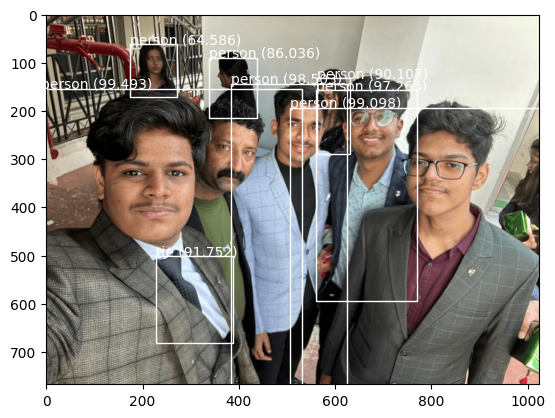

In [3]:
photo_filename = '2.png'
# load and prepare image
image, image_w, image_h = load_image_pixels(photo_filename, (input_w, input_h))
# make prediction
yhat = model.predict(image)
# summarize the shape of the list of arrays
print([a.shape for a in yhat])
# define the anchors
anchors = [[116,90, 156,198, 373,326], [30,61, 62,45, 59,119], [10,13, 16,30, 33,23]]
# define the probability threshold for detected objects
class_threshold = 0.6
boxes = list()
for i in range(len(yhat)):
	# decode the output of the network
	boxes += decode_netout(yhat[i][0], anchors[i], class_threshold, input_h, input_w)
# correct the sizes of the bounding boxes for the shape of the image
correct_yolo_boxes(boxes, image_h, image_w, input_h, input_w)
# suppress non-maximal boxes
do_nms(boxes, 0.5)
# define the labels
labels = ["person", "bicycle", "car", "motorbike", "aeroplane", "bus", "train", "truck",
	"boat", "traffic light", "fire hydrant", "stop sign", "parking meter", "bench",
	"bird", "cat", "dog", "horse", "sheep", "cow", "elephant", "bear", "zebra", "giraffe",
	"backpack", "umbrella", "handbag", "tie", "suitcase", "frisbee", "skis", "snowboard",
	"sports ball", "kite", "baseball bat", "baseball glove", "skateboard", "surfboard",
	"tennis racket", "bottle", "wine glass", "cup", "fork", "knife", "spoon", "bowl", "banana",
	"apple", "sandwich", "orange", "broccoli", "carrot", "hot dog", "pizza", "donut", "cake",
	"chair", "sofa", "pottedplant", "bed", "diningtable", "toilet", "tvmonitor", "laptop", "mouse",
	"remote", "keyboard", "cell phone", "microwave", "oven", "toaster", "sink", "refrigerator",
	"book", "clock", "vase", "scissors", "teddy bear", "hair drier", "toothbrush"]
# get the details of the detected objects
v_boxes, v_labels, v_scores = get_boxes(boxes, labels, class_threshold)
# summarize what we found
for i in range(len(v_boxes)):
	print(v_labels[i], v_scores[i])
# draw what we found
draw_boxes(photo_filename, v_boxes, v_labels, v_scores)

In [5]:
len(labels)

80

In [37]:
import os
import scipy.io
import scipy.misc
import numpy as np
import pandas as pd
import PIL
import struct
import cv2
from numpy import expand_dims
import tensorflow as tf
from skimage.transform import resize
from keras import backend as K
from keras.layers import Input, Lambda, Conv2D, BatchNormalization, LeakyReLU, ZeroPadding2D, UpSampling2D
from keras.models import load_model, Model

from keras.layers import add, concatenate
from tensorflow.keras.utils import load_img
from tensorflow.keras.utils import img_to_array

from matplotlib import pyplot
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
from matplotlib.patches import Rectangle
from imutils.video import VideoStream
from imutils.video import FPS
import numpy as np
import argparse
import imutils
import time
import cv2
import requests


class BoundBox:
	def __init__(self, xmin, ymin, xmax, ymax, objness = None, classes = None):
		self.xmin = xmin
		self.ymin = ymin
		self.xmax = xmax
		self.ymax = ymax
		self.objness = objness
		self.classes = classes
		self.label = -1
		self.score = -1

	def get_label(self):
		if self.label == -1:
			self.label = np.argmax(self.classes)

		return self.label

	def get_score(self):
		if self.score == -1:
			self.score = self.classes[self.get_label()]

		return self.score

def _sigmoid(x):
	return 1. / (1. + np.exp(-x))

def decode_netout(netout, anchors, obj_thresh, net_h, net_w):
	grid_h, grid_w = netout.shape[:2]
	nb_box = 3
	netout = netout.reshape((grid_h, grid_w, nb_box, -1))
	nb_class = netout.shape[-1] - 5
	boxes = []
	netout[..., :2]  = _sigmoid(netout[..., :2])
	netout[..., 4:]  = _sigmoid(netout[..., 4:])
	netout[..., 5:]  = netout[..., 4][..., np.newaxis] * netout[..., 5:]
	netout[..., 5:] *= netout[..., 5:] > obj_thresh

	for i in range(grid_h*grid_w):
		row = i / grid_w
		col = i % grid_w
		for b in range(nb_box):
			# 4th element is objectness score
			objectness = netout[int(row)][int(col)][b][4]
			if(objectness.all() <= obj_thresh): continue
			# first 4 elements are x, y, w, and h
			x, y, w, h = netout[int(row)][int(col)][b][:4]
			x = (col + x) / grid_w # center position, unit: image width
			y = (row + y) / grid_h # center position, unit: image height
			w = anchors[2 * b + 0] * np.exp(w) / net_w # unit: image width
			h = anchors[2 * b + 1] * np.exp(h) / net_h # unit: image height
			# last elements are class probabilities
			classes = netout[int(row)][col][b][5:]
			box = BoundBox(x-w/2, y-h/2, x+w/2, y+h/2, objectness, classes)
			boxes.append(box)
	return boxes

def correct_yolo_boxes(boxes, image_h, image_w, net_h, net_w):
	new_w, new_h = net_w, net_h
	for i in range(len(boxes)):
		x_offset, x_scale = (net_w - new_w)/2./net_w, float(new_w)/net_w
		y_offset, y_scale = (net_h - new_h)/2./net_h, float(new_h)/net_h
		boxes[i].xmin = int((boxes[i].xmin - x_offset) / x_scale * image_w)
		boxes[i].xmax = int((boxes[i].xmax - x_offset) / x_scale * image_w)
		boxes[i].ymin = int((boxes[i].ymin - y_offset) / y_scale * image_h)
		boxes[i].ymax = int((boxes[i].ymax - y_offset) / y_scale * image_h)

def _interval_overlap(interval_a, interval_b):
	x1, x2 = interval_a
	x3, x4 = interval_b
	if x3 < x1:
		if x4 < x1:
			return 0
		else:
			return min(x2,x4) - x1
	else:
		if x2 < x3:
			 return 0
		else:
			return min(x2,x4) - x3

def bbox_iou(box1, box2):
	intersect_w = _interval_overlap([box1.xmin, box1.xmax], [box2.xmin, box2.xmax])
	intersect_h = _interval_overlap([box1.ymin, box1.ymax], [box2.ymin, box2.ymax])
	intersect = intersect_w * intersect_h
	w1, h1 = box1.xmax-box1.xmin, box1.ymax-box1.ymin
	w2, h2 = box2.xmax-box2.xmin, box2.ymax-box2.ymin
	union = w1*h1 + w2*h2 - intersect
	return float(intersect) / union

def do_nms(boxes, nms_thresh):
	if len(boxes) > 0:
		nb_class = len(boxes[0].classes)
	else:
		return
	for c in range(nb_class):
		sorted_indices = np.argsort([-box.classes[c] for box in boxes])
		for i in range(len(sorted_indices)):
			index_i = sorted_indices[i]
			if boxes[index_i].classes[c] == 0: continue
			for j in range(i+1, len(sorted_indices)):
				index_j = sorted_indices[j]
				if bbox_iou(boxes[index_i], boxes[index_j]) >= nms_thresh:
					boxes[index_j].classes[c] = 0

# load and prepare an image
def load_image_pixels(filename, shape):
	# load the image to get its shape
	image = load_img(filename)
	width, height = image.size
	# load the image with the required size
	image = load_img(filename, target_size=shape)
	# convert to numpy array
	image = img_to_array(image)
	# scale pixel values to [0, 1]
	image = image.astype('float32')
	image /= 255.0
	# add a dimension so that we have one sample
	image = expand_dims(image, 0)
	return image, width, height





# get all of the results above a threshold
def get_boxes(boxes, labels, thresh):
	v_boxes, v_labels, v_scores = list(), list(), list()
	# enumerate all boxes
	for box in boxes:
		# enumerate all possible labels
		for i in range(len(labels)):
			# check if the threshold for this label is high enough
			if box.classes[i] > thresh:
				v_boxes.append(box)
				v_labels.append(labels[i])
				v_scores.append(box.classes[i]*100)
				# don't break, many labels may trigger for one box
	return v_boxes, v_labels, v_scores

# draw all results
def draw_boxes(filename, v_boxes, v_labels, v_scores):
	# load the image
	data = pyplot.imread(filename)
	# plot the image
	pyplot.imshow(data)
	# get the context for drawing boxes
	ax = pyplot.gca()
	# plot each box
	for i in range(len(v_boxes)):
		box = v_boxes[i]
		# get coordinates
		y1, x1, y2, x2 = box.ymin, box.xmin, box.ymax, box.xmax
		# calculate width and height of the box
		width, height = x2 - x1, y2 - y1
		# create the shape
		rect = Rectangle((x1, y1), width, height, fill=False, color='white')
		# draw the box
		ax.add_patch(rect)
		# draw text and score in top left corner
		label = "%s (%.3f)" % (v_labels[i], v_scores[i])
		pyplot.text(x1, y1, label, color='white')
	# show the plot
	pyplot.show()

# load yolov3 model
model = load_model('model.h5')
# define the expected input shape for the model
input_w, input_h = 416, 416


# define the labels
labels = ["person", "bicycle", "car", "motorbike", "aeroplane", "bus", "train", "truck",
        "boat", "traffic light", "fire hydrant", "stop sign", "parking meter", "bench",
        "bird", "cat", "dog", "horse", "sheep", "cow", "elephant", "bear", "zebra", "giraffe",
        "backpack", "umbrella", "handbag", "tie", "suitcase", "frisbee", "skis", "snowboard",
        "sports ball", "kite", "baseball bat", "baseball glove", "skateboard", "surfboard",
        "tennis racket", "bottle", "wine glass", "cup", "fork", "knife", "spoon", "bowl", "banana",
        "apple", "sandwich", "orange", "broccoli", "carrot", "hot dog", "pizza", "donut", "cake",
        "chair", "sofa", "pottedplant", "bed", "diningtable", "toilet", "tvmonitor", "laptop", "mouse",
        "remote", "keyboard", "cell phone", "microwave", "oven", "toaster", "sink", "refrigerator",
        "book", "clock", "vase", "scissors", "teddy bear", "hair drier", "toothbrush"]
CLASSES =labels
# define the probability threshold for detected objects
class_threshold = 0.6
confidence = class_threshold

# define the anchors
anchors = [[116,90, 156,198, 373,326], [30,61, 62,45, 59,119], [10,13, 16,30, 33,23]]
    

def yolo_detect(photo_filename):
    input_w, input_h = 416, 416
    # load and prepare image
    image, image_w, image_h = load_image_pixels(photo_filename, (input_w, input_h))
    # make prediction
    yhat = model.predict(image)
    # summarize the shape of the list of arrays
    print([a.shape for a in yhat])
  
    boxes = list()
    for i in range(len(yhat)):
        # decode the output of the network
        boxes += decode_netout(yhat[i][0], anchors[i], class_threshold, input_h, input_w)
    # correct the sizes of the bounding boxes for the shape of the image
    correct_yolo_boxes(boxes, image_h, image_w, input_h, input_w)
    # suppress non-maximal boxes
    do_nms(boxes, 0.5)
   
    # get the details of the detected objects
    v_boxes, v_labels, v_scores = get_boxes(boxes, labels, class_threshold)
    # summarize what we found
    detected_object = []
    for i in range(len(v_boxes)):
        ## text to speech
        detected_object.append(v_labels[i])
        #print(v_labels[i], v_scores[i])
    # draw what we found
    return np.unique(detected_object).tolist()


import numpy as np
import cv2
import random

def live_detect():
    cap = cv2.VideoCapture(0)

    i=0
    while(True):
        # Capture frame-by-frame
        ret, frame = cap.read()
        i+=1
        fn = 'database/{index}.png'.format(index=i)
        cv2.imwrite(fn,frame)
        labels = yolo_detect(fn) 
        ## detect the label

        cv2.imshow('frame',frame)
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

    # When everything done, release the capture
    cap.release()
    cv2.destroyAllWindows()

In [39]:
live_detect()

1/1 [==============================] - 2s 2s/step
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
1/1 [==============================] - 0s 469ms/step
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
1/1 [==============================] - 0s 400ms/step
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
1/1 [==============================] - 0s 402ms/step
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
1/1 [==============================] - 0s 411ms/step
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
1/1 [==============================] - 0s 412ms/step
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
1/1 [==============================] - 0s 405ms/step
[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


In [ ]:
prediction()

In [13]:








cap = cv2.VideoCapture(0)
if not cap.isOpened():
    raise IOError("We cannot open webcam")

while True:
    ret, frame = cap.read()
    # resize our captured frame if we need
    frame = cv2.resize(frame, None, fx=1.0, fy=1.0, interpolation=cv2.INTER_AREA)

    # detect object on our frame
    #r_image, ObjectsList = yolo_detect(frame)
    print(frame)
    # show us frame with detection
    #cv2.imshow("Web cam input", r_image)
    cv2.imshow("Web cam input", frame)

    if cv2.waitKey(25) & 0xFF == ord("q"):
        cv2.destroyAllWindows()
        break

cap.release()

[[[247 247 247]
  [248 246 248]
  [250 247 250]
  ...
  [155 163 172]
  [140 160 165]
  [137 158 162]]

 [[244 244 244]
  [248 247 247]
  [249 247 247]
  ...
  [151 159 168]
  [140 159 167]
  [140 161 168]]

 [[244 244 244]
  [247 247 247]
  [246 246 246]
  ...
  [149 154 165]
  [151 158 167]
  [147 155 163]]

 ...

 [[ 83  45  51]
  [ 90  59  63]
  [ 95  70  72]
  ...
  [115 117 116]
  [115 119 119]
  [118 123 122]]

 [[134  97 100]
  [125  90  93]
  [111  79  82]
  ...
  [118 117 119]
  [122 122 124]
  [122 122 124]]

 [[142 105 108]
  [130  92  95]
  [115  78  82]
  ...
  [120 119 122]
  [120 119 122]
  [123 123 125]]]
[[[244 244 246]
  [244 244 245]
  [247 247 247]
  ...
  [156 173 169]
  [149 167 161]
  [158 175 169]]

 [[246 246 246]
  [244 244 244]
  [244 244 244]
  ...
  [148 164 164]
  [144 160 158]
  [146 162 161]]

 [[247 247 247]
  [244 244 244]
  [244 244 244]
  ...
  [149 163 162]
  [140 156 155]
  [140 156 155]]

 ...

 [[115  82  85]
  [112  81  84]
  [100  69  72]
  ..

[[[248 245 247]
  [249 244 246]
  [253 246 249]
  ...
  [161 153 177]
  [162 151 172]
  [160 148 170]]

 [[248 241 244]
  [251 243 246]
  [253 246 249]
  ...
  [163 156 180]
  [165 157 183]
  [162 153 179]]

 [[247 244 244]
  [247 244 244]
  [247 244 244]
  ...
  [158 153 172]
  [157 152 173]
  [155 150 171]]

 ...

 [[101  80  82]
  [ 99  77  79]
  [ 99  78  80]
  ...
  [122 122 122]
  [129 129 129]
  [125 125 125]]

 [[117  98  91]
  [110  90  87]
  [109  88  90]
  ...
  [119 117 118]
  [132 132 132]
  [128 128 128]]

 [[119 100  93]
  [114  95  92]
  [104  83  85]
  ...
  [121 119 119]
  [133 130 130]
  [133 130 130]]]
[[[246 246 246]
  [247 245 246]
  [244 241 244]
  ...
  [146 158 174]
  [139 155 174]
  [143 160 179]]

 [[242 242 242]
  [244 245 244]
  [246 246 246]
  ...
  [143 153 166]
  [142 159 171]
  [135 154 166]]

 [[247 247 247]
  [244 245 244]
  [247 247 247]
  ...
  [156 155 169]
  [153 154 168]
  [153 154 168]]

 ...

 [[ 83  62  41]
  [ 83  62  42]
  [ 90  69  50]
  ..

[[[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [119 164 173]
  [114 159 180]
  [110 156 178]]

 [[243 243 243]
  [246 246 246]
  [247 247 247]
  ...
  [129 162 172]
  [117 160 174]
  [114 157 172]]

 [[246 245 247]
  [244 244 245]
  [244 244 244]
  ...
  [143 163 175]
  [139 164 175]
  [134 159 170]]

 ...

 [[113  66  62]
  [113  74  68]
  [111  81  73]
  ...
  [134 125 130]
  [130 121 129]
  [131 122 130]]

 [[129  84  89]
  [131  86  88]
  [127  84  84]
  ...
  [130 122 125]
  [129 121 124]
  [129 121 124]]

 [[132  88  92]
  [133  88  92]
  [130  86  90]
  ...
  [129 121 124]
  [126 119 122]
  [120 113 116]]]
[[[247 243 250]
  [247 243 248]
  [249 246 249]
  ...
  [170 163 161]
  [160 153 154]
  [161 154 155]]

 [[245 242 249]
  [246 242 247]
  [249 246 249]
  ...
  [164 161 163]
  [157 154 157]
  [163 160 162]]

 [[243 239 246]
  [247 243 250]
  [249 245 252]
  ...
  [165 162 169]
  [163 161 168]
  [166 165 172]]

 ...

 [[ 83  61  47]
  [ 89  70  58]
  [ 93  77  67]
  ..

[[[243 247 249]
  [245 246 249]
  [247 246 249]
  ...
  [168 159 164]
  [168 157 165]
  [168 157 165]]

 [[244 244 246]
  [247 246 249]
  [244 244 246]
  ...
  [161 155 163]
  [165 156 166]
  [167 158 168]]

 [[243 243 245]
  [244 244 246]
  [246 245 247]
  ...
  [163 160 167]
  [164 160 167]
  [163 159 166]]

 ...

 [[100  75  77]
  [ 91  68  70]
  [101  80  82]
  ...
  [118 118 116]
  [122 123 119]
  [125 126 121]]

 [[147 121 123]
  [136 109 112]
  [118  92  94]
  ...
  [115 116 113]
  [130 130 130]
  [127 127 127]]

 [[134 108 111]
  [127 100 102]
  [111  85  87]
  ...
  [115 116 113]
  [130 130 130]
  [129 129 129]]]
[[[248 247 250]
  [244 244 245]
  [247 247 247]
  ...
  [171 162 159]
  [175 159 151]
  [173 155 147]]

 [[247 246 249]
  [246 245 248]
  [247 246 249]
  ...
  [167 162 161]
  [171 163 159]
  [170 161 157]]

 [[244 244 246]
  [243 243 245]
  [246 245 247]
  ...
  [160 157 161]
  [165 158 158]
  [168 160 160]]

 ...

 [[ 89  51  55]
  [ 85  50  54]
  [ 88  55  58]
  ..

[[[252 243 251]
  [250 245 251]
  [246 245 247]
  ...
  [140 163 169]
  [136 162 169]
  [137 163 170]]

 [[244 244 246]
  [243 243 244]
  [244 244 244]
  ...
  [142 163 169]
  [142 164 168]
  [142 164 168]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [154 162 170]
  [156 163 171]
  [153 161 169]]

 ...

 [[103  85  75]
  [100  82  73]
  [101  82  74]
  ...
  [122 118 119]
  [129 122 122]
  [128 120 121]]

 [[112  82  85]
  [119  89  92]
  [130 100 102]
  ...
  [115 112 120]
  [122 118 125]
  [122 118 125]]

 [[122  97  99]
  [123  95  98]
  [124  94  97]
  ...
  [113 110 118]
  [122 118 125]
  [123 119 126]]]
[[[246 246 246]
  [244 244 245]
  [244 244 246]
  ...
  [163 158 178]
  [163 158 179]
  [162 157 178]]

 [[248 248 248]
  [246 246 246]
  [246 246 246]
  ...
  [163 159 177]
  [163 160 174]
  [157 154 168]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [164 161 175]
  [166 163 177]
  [162 159 173]]

 ...

 [[ 84  66  68]
  [ 94  78  79]
  [107  93  94]
  ..

[[[244 244 244]
  [248 248 248]
  [246 246 246]
  ...
  [163 158 191]
  [154 146 179]
  [162 154 187]]

 [[244 244 244]
  [248 248 248]
  [246 246 246]
  ...
  [155 150 182]
  [153 146 176]
  [160 153 183]]

 [[247 246 249]
  [248 247 250]
  [246 245 247]
  ...
  [154 152 180]
  [151 149 175]
  [149 148 173]]

 ...

 [[ 98  82  73]
  [108  91  81]
  [109  90  81]
  ...
  [121 117 113]
  [123 121 121]
  [126 124 125]]

 [[134 116 106]
  [128 110 100]
  [112  94  84]
  ...
  [120 114 113]
  [131 125 121]
  [132 126 122]]

 [[118  99  92]
  [114  96  87]
  [103  85  75]
  ...
  [123 116 115]
  [133 127 123]
  [134 129 124]]]
[[[246 237 247]
  [251 242 252]
  [251 242 252]
  ...
  [154 153 188]
  [150 154 186]
  [152 157 188]]

 [[250 241 250]
  [248 238 248]
  [248 239 249]
  ...
  [147 149 181]
  [150 154 186]
  [152 157 188]]

 [[248 239 249]
  [250 240 251]
  [251 242 252]
  ...
  [146 149 178]
  [143 148 177]
  [150 155 184]]

 ...

 [[ 81  48  51]
  [ 83  55  55]
  [102  78  76]
  ..

[[[247 246 249]
  [248 246 250]
  [249 245 252]
  ...
  [149 160 173]
  [144 158 164]
  [140 155 160]]

 [[248 244 251]
  [248 244 251]
  [247 243 250]
  ...
  [146 158 169]
  [150 160 166]
  [147 157 162]]

 [[247 243 250]
  [248 244 251]
  [247 243 250]
  ...
  [151 161 164]
  [145 157 158]
  [144 155 156]]

 ...

 [[106  68  63]
  [ 98  62  54]
  [ 97  62  54]
  ...
  [124 120 120]
  [120 117 118]
  [126 124 125]]

 [[132  91  83]
  [123  85  77]
  [126  91  83]
  ...
  [126 119 120]
  [120 113 114]
  [130 123 123]]

 [[133  93  81]
  [130  89  79]
  [127  86  78]
  ...
  [128 122 122]
  [123 116 116]
  [129 122 122]]]
[[[246 246 246]
  [246 246 246]
  [244 244 244]
  ...
  [148 158 185]
  [147 156 185]
  [148 157 187]]

 [[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [150 156 179]
  [152 158 183]
  [152 158 183]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [151 163 182]
  [145 161 180]
  [145 161 180]]

 ...

 [[116  98  95]
  [110  93  90]
  [103  86  83]
  ..

[[[247 246 249]
  [245 247 248]
  [240 245 244]
  ...
  [162 158 181]
  [164 157 178]
  [163 156 177]]

 [[244 244 244]
  [245 244 244]
  [247 247 247]
  ...
  [164 158 179]
  [166 159 180]
  [164 157 178]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [156 151 171]
  [158 154 173]
  [163 159 177]]

 ...

 [[ 77  65  55]
  [ 84  70  61]
  [ 97  78  71]
  ...
  [123 122 122]
  [123 123 123]
  [123 123 123]]

 [[131 115 107]
  [120 102  97]
  [101  81  78]
  ...
  [120 119 122]
  [123 123 125]
  [123 123 125]]

 [[150 133 126]
  [132 111 107]
  [106  81  79]
  ...
  [124 123 125]
  [123 123 125]
  [127 126 129]]]
[[[247 246 249]
  [245 247 248]
  [240 245 244]
  ...
  [162 158 181]
  [164 157 178]
  [163 156 177]]

 [[244 244 244]
  [245 244 244]
  [247 247 247]
  ...
  [164 158 179]
  [166 159 180]
  [164 157 178]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [156 151 171]
  [158 154 173]
  [163 159 177]]

 ...

 [[ 77  65  55]
  [ 84  70  61]
  [ 97  78  71]
  ..

[[[251 242 250]
  [245 239 245]
  [250 247 250]
  ...
  [144 163 154]
  [132 161 154]
  [134 164 157]]

 [[247 243 250]
  [244 241 246]
  [248 245 247]
  ...
  [155 164 163]
  [149 161 160]
  [150 162 161]]

 [[247 244 246]
  [246 243 245]
  [247 244 246]
  ...
  [152 155 160]
  [155 160 160]
  [154 159 158]]

 ...

 [[ 94  64  66]
  [ 91  63  65]
  [111  85  87]
  ...
  [118 114 112]
  [136 135 130]
  [132 131 127]]

 [[112  84  78]
  [114  88  83]
  [123  99  97]
  ...
  [120 114 114]
  [128 126 126]
  [125 123 123]]

 [[133 105  99]
  [120  94  87]
  [115  92  85]
  ...
  [119 115 115]
  [123 121 121]
  [122 120 120]]]
[[[251 242 250]
  [245 239 245]
  [250 247 250]
  ...
  [144 163 154]
  [132 161 154]
  [134 164 157]]

 [[247 243 250]
  [244 241 246]
  [248 245 247]
  ...
  [155 164 163]
  [149 161 160]
  [150 162 161]]

 [[247 244 246]
  [246 243 245]
  [247 244 246]
  ...
  [152 155 160]
  [155 160 160]
  [154 159 158]]

 ...

 [[ 94  64  66]
  [ 91  63  65]
  [111  85  87]
  ..

[[[245 243 243]
  [246 244 244]
  [244 244 244]
  ...
  [165 150 180]
  [166 151 185]
  [166 151 185]]

 [[244 244 244]
  [244 244 244]
  [244 244 244]
  ...
  [166 152 182]
  [164 154 187]
  [158 148 181]]

 [[244 244 244]
  [244 244 244]
  [243 243 243]
  ...
  [160 152 181]
  [163 156 186]
  [163 156 187]]

 ...

 [[ 89  61  55]
  [ 95  75  70]
  [102  89  86]
  ...
  [123 114 112]
  [132 124 120]
  [132 124 120]]

 [[128  98  97]
  [125  99  97]
  [132 107 105]
  ...
  [126 115 113]
  [137 124 121]
  [141 128 124]]

 [[133 104 102]
  [126 100  98]
  [125 100  98]
  ...
  [126 115 113]
  [140 127 123]
  [143 130 127]]]
[[[246 246 246]
  [247 247 246]
  [248 248 248]
  ...
  [163 160 172]
  [166 163 177]
  [161 157 172]]

 [[248 248 248]
  [247 247 247]
  [246 246 246]
  ...
  [161 158 170]
  [163 160 174]
  [160 156 170]]

 [[247 247 247]
  [244 244 244]
  [243 243 243]
  ...
  [164 161 173]
  [156 153 167]
  [158 155 169]]

 ...

 [[ 93  72  54]
  [ 97  75  59]
  [101  79  65]
  ..

[[[243 243 243]
  [245 244 245]
  [244 244 246]
  ...
  [153 157 170]
  [152 157 175]
  [146 151 170]]

 [[244 244 244]
  [244 244 245]
  [246 245 247]
  ...
  [154 158 173]
  [151 157 170]
  [146 153 165]]

 [[244 244 246]
  [241 240 243]
  [244 244 246]
  ...
  [152 156 169]
  [153 159 173]
  [153 160 173]]

 ...

 [[ 90  61  48]
  [108  79  68]
  [121  93  84]
  ...
  [124 117 129]
  [122 117 131]
  [128 122 137]]

 [[143 113 104]
  [145 116 107]
  [132 105  96]
  ...
  [127 118 130]
  [133 123 138]
  [133 123 138]]

 [[138 108  99]
  [136 107  98]
  [122  94  85]
  ...
  [127 119 128]
  [131 122 132]
  [133 124 134]]]
[[[241 239 248]
  [244 243 251]
  [244 243 250]
  ...
  [124 166 162]
  [118 165 161]
  [121 168 164]]

 [[243 242 249]
  [246 245 249]
  [244 244 246]
  ...
  [118 159 155]
  [119 158 155]
  [120 160 156]]

 [[246 245 247]
  [248 247 250]
  [248 247 250]
  ...
  [122 155 153]
  [119 158 157]
  [119 159 158]]

 ...

 [[ 76  58  48]
  [108  90  78]
  [117 100  85]
  ..

[[[247 247 247]
  [248 248 249]
  [244 244 246]
  ...
  [157 159 172]
  [152 157 175]
  [154 159 178]]

 [[247 247 247]
  [248 248 248]
  [244 244 244]
  ...
  [156 155 170]
  [158 159 173]
  [156 158 171]]

 [[244 244 244]
  [246 246 246]
  [244 244 244]
  ...
  [162 157 172]
  [160 156 170]
  [158 155 169]]

 ...

 [[ 90  54  52]
  [ 99  63  62]
  [108  72  71]
  ...
  [138 119 121]
  [143 124 126]
  [146 128 129]]

 [[120  88  91]
  [124  90  89]
  [123  88  82]
  ...
  [134 114 118]
  [141 122 126]
  [146 127 131]]

 [[127  96  94]
  [131  97  94]
  [127  92  86]
  ...
  [130 111 114]
  [139 121 122]
  [144 125 127]]]
[[[248 249 244]
  [246 247 240]
  [248 250 241]
  ...
  [154 155 170]
  [159 159 177]
  [158 158 176]]

 [[247 248 243]
  [246 247 242]
  [247 248 243]
  ...
  [154 155 172]
  [158 158 176]
  [159 159 177]]

 [[246 247 242]
  [246 247 242]
  [247 248 243]
  ...
  [152 153 168]
  [154 155 173]
  [159 159 178]]

 ...

 [[109  75  55]
  [107  73  58]
  [106  71  63]
  ..

[[[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [139 153 178]
  [151 162 181]
  [147 159 177]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [147 161 185]
  [148 159 183]
  [150 160 184]]

 [[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [152 162 187]
  [146 156 180]
  [145 155 179]]

 ...

 [[ 68  52  33]
  [ 82  67  47]
  [100  86  67]
  ...
  [125 118 119]
  [129 122 122]
  [131 124 124]]

 [[130 109  95]
  [135 116 101]
  [120 103  89]
  ...
  [125 116 119]
  [137 123 126]
  [140 125 129]]

 [[155 133 119]
  [141 122 107]
  [110  93  78]
  ...
  [129 120 122]
  [133 124 125]
  [137 127 128]]]
[[[247 243 250]
  [246 242 247]
  [244 241 244]
  ...
  [144 151 182]
  [140 149 180]
  [139 148 179]]

 [[247 244 246]
  [247 245 248]
  [246 245 247]
  ...
  [147 152 179]
  [148 152 182]
  [146 151 181]]

 [[247 244 246]
  [247 245 247]
  [244 244 244]
  ...
  [145 150 173]
  [144 150 175]
  [148 153 178]]

 ...

 [[109  84  65]
  [125 105  82]
  [113  99  73]
  ..

[[[243 240 243]
  [247 243 248]
  [247 243 250]
  ...
  [150 147 167]
  [150 144 170]
  [152 145 172]]

 [[247 244 246]
  [247 244 246]
  [245 243 245]
  ...
  [149 150 167]
  [155 150 171]
  [154 149 170]]

 [[246 245 247]
  [244 244 246]
  [241 240 243]
  ...
  [155 157 165]
  [149 152 161]
  [149 152 161]]

 ...

 [[ 76  46  49]
  [ 76  50  52]
  [105  84  86]
  ...
  [123 115 124]
  [121 110 118]
  [136 124 132]]

 [[122  92  94]
  [115  87  90]
  [126 100 102]
  ...
  [123 115 120]
  [129 121 124]
  [137 129 132]]

 [[129  99 101]
  [126  95  98]
  [124  94  97]
  ...
  [123 115 120]
  [131 122 130]
  [133 125 133]]]
[[[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [148 157 166]
  [147 157 163]
  [146 157 162]]

 [[248 248 248]
  [247 247 247]
  [246 246 246]
  ...
  [158 160 170]
  [151 159 165]
  [151 159 165]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [159 156 170]
  [155 152 166]
  [163 160 174]]

 ...

 [[ 87  68  60]
  [105  86  79]
  [120 102  94]
  ..

[[[238 247 249]
  [244 248 250]
  [247 246 249]
  ...
  [165 163 174]
  [166 164 174]
  [163 161 170]]

 [[244 244 244]
  [247 247 247]
  [244 244 244]
  ...
  [164 162 173]
  [165 163 173]
  [166 164 173]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [166 163 174]
  [163 161 170]
  [157 155 164]]

 ...

 [[ 68  63  55]
  [ 98  90  84]
  [ 99  86  83]
  ...
  [123 124 120]
  [127 127 127]
  [122 122 123]]

 [[112 108  97]
  [127 116 109]
  [117  97  94]
  ...
  [121 123 114]
  [127 129 120]
  [125 127 117]]

 [[137 132 121]
  [138 127 117]
  [117  98  91]
  ...
  [119 121 112]
  [125 127 117]
  [127 129 120]]]
[[[246 247 242]
  [247 247 245]
  [248 248 248]
  ...
  [155 150 171]
  [158 152 178]
  [158 152 179]]

 [[244 244 244]
  [244 244 244]
  [247 247 247]
  ...
  [155 151 169]
  [156 151 172]
  [156 151 172]]

 [[246 246 246]
  [242 242 242]
  [244 244 244]
  ...
  [154 153 168]
  [153 153 173]
  [154 154 175]]

 ...

 [[ 74  74  65]
  [ 70  67  59]
  [ 81  73  65]
  ..

[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [147 150 175]
  [140 149 178]
  [140 151 180]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [150 155 177]
  [139 148 177]
  [139 149 179]]

 [[246 246 246]
  [244 244 244]
  [247 247 247]
  ...
  [153 160 176]
  [148 155 173]
  [144 152 169]]

 ...

 [[ 78  48  42]
  [ 87  56  52]
  [103  71  70]
  ...
  [124 123 123]
  [127 124 125]
  [130 128 128]]

 [[133 110 100]
  [121  95  87]
  [117  89  82]
  ...
  [125 122 122]
  [132 125 126]
  [132 125 126]]

 [[132 109  99]
  [127 101  93]
  [118  90  84]
  ...
  [123 122 122]
  [133 130 130]
  [129 127 127]]]
[[[244 244 246]
  [246 245 247]
  [247 246 249]
  ...
  [158 150 180]
  [159 158 183]
  [156 155 180]]

 [[244 244 246]
  [246 245 247]
  [247 246 249]
  ...
  [158 154 183]
  [151 149 175]
  [152 151 175]]

 [[246 246 246]
  [248 248 248]
  [247 247 247]
  ...
  [158 158 186]
  [145 149 173]
  [146 150 174]]

 ...

 [[ 57  66  65]
  [ 71  79  78]
  [ 69  74  73]
  ..

[[[251 242 250]
  [247 241 246]
  [247 244 246]
  ...
  [134 156 173]
  [137 153 172]
  [145 160 179]]

 [[247 243 250]
  [246 243 248]
  [246 245 247]
  ...
  [132 157 173]
  [128 152 168]
  [136 160 176]]

 [[245 242 249]
  [246 243 248]
  [247 246 249]
  ...
  [133 159 175]
  [135 159 175]
  [137 160 176]]

 ...

 [[ 98  50  50]
  [101  63  57]
  [101  74  61]
  ...
  [124 120 120]
  [132 125 126]
  [130 123 123]]

 [[160 120 107]
  [154 119 101]
  [137 111  86]
  ...
  [128 120 121]
  [130 123 123]
  [132 125 126]]

 [[153 114  95]
  [147 111  88]
  [133 103  76]
  ...
  [125 119 117]
  [129 123 119]
  [133 127 123]]]
[[[246 245 247]
  [247 247 248]
  [247 247 247]
  ...
  [140 164 174]
  [138 161 177]
  [137 161 178]]

 [[247 247 247]
  [247 247 247]
  [244 244 244]
  ...
  [142 162 172]
  [141 161 173]
  [141 161 173]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [148 161 174]
  [142 159 171]
  [142 161 173]]

 ...

 [[ 74  50  25]
  [ 92  66  48]
  [103  76  67]
  ..

[[[245 243 243]
  [247 246 246]
  [246 246 246]
  ...
  [137 156 174]
  [135 153 172]
  [137 156 174]]

 [[248 245 246]
  [247 246 246]
  [246 246 246]
  ...
  [135 153 172]
  [134 152 171]
  [134 152 171]]

 [[244 244 244]
  [244 244 244]
  [246 246 246]
  ...
  [136 155 173]
  [131 150 169]
  [130 149 167]]

 ...

 [[ 70  51  44]
  [ 92  74  66]
  [111  92  85]
  ...
  [125 121 121]
  [134 127 128]
  [135 127 128]]

 [[123  84  87]
  [131  96  94]
  [119  89  82]
  ...
  [119 115 113]
  [131 125 121]
  [135 129 124]]

 [[149 112 115]
  [140 101 105]
  [126  86  90]
  ...
  [117 116 112]
  [126 125 116]
  [128 128 118]]]
[[[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [140 147 152]
  [149 148 151]
  [158 157 159]]

 [[244 244 244]
  [246 246 246]
  [244 244 244]
  ...
  [150 153 163]
  [155 154 157]
  [159 158 159]]

 [[243 243 243]
  [241 241 241]
  [241 241 241]
  ...
  [151 156 169]
  [158 160 169]
  [156 158 166]]

 ...

 [[ 64  38  41]
  [ 72  47  49]
  [ 88  63  65]
  ..

[[[241 246 246]
  [245 247 248]
  [246 245 247]
  ...
  [157 151 171]
  [163 158 179]
  [158 154 175]]

 [[246 246 246]
  [247 247 248]
  [244 244 246]
  ...
  [159 156 177]
  [158 154 174]
  [155 150 171]]

 [[247 247 247]
  [244 244 245]
  [242 242 244]
  ...
  [157 157 176]
  [158 154 173]
  [155 151 169]]

 ...

 [[ 52  38  40]
  [ 46  33  34]
  [ 52  38  40]
  ...
  [131 111 119]
  [138 118 126]
  [135 114 123]]

 [[107  90  82]
  [107  90  84]
  [103  86  83]
  ...
  [128 110 117]
  [139 119 128]
  [141 120 129]]

 [[115  98  91]
  [113  97  91]
  [110  93  90]
  ...
  [126 111 115]
  [135 120 124]
  [135 120 124]]]
[[[250 248 248]
  [248 245 246]
  [247 244 244]
  ...
  [145 157 174]
  [136 162 177]
  [129 157 173]]

 [[248 245 246]
  [247 244 244]
  [247 244 244]
  ...
  [152 155 173]
  [144 156 173]
  [143 156 173]]

 [[244 244 244]
  [246 246 246]
  [246 246 246]
  ...
  [158 156 170]
  [153 154 168]
  [150 152 166]]

 ...

 [[ 96  71  51]
  [ 89  64  49]
  [ 99  76  67]
  ..

[[[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [170 159 167]
  [166 155 163]
  [167 156 164]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [173 162 170]
  [164 154 161]
  [170 159 167]]

 [[246 246 246]
  [247 247 247]
  [244 244 244]
  ...
  [161 155 164]
  [165 156 164]
  [168 160 167]]

 ...

 [[ 68  50  51]
  [ 68  52  53]
  [ 53  39  41]
  ...
  [116 112 121]
  [124 120 129]
  [126 121 131]]

 [[130 101  99]
  [121  97  94]
  [ 78  59  56]
  ...
  [130 121 129]
  [132 124 131]
  [129 120 128]]

 [[121 102  99]
  [131 106 103]
  [109  80  78]
  ...
  [123 114 122]
  [129 120 128]
  [129 120 128]]]
[[[248 244 251]
  [251 245 253]
  [252 243 253]
  ...
  [141 152 170]
  [148 160 177]
  [150 163 180]]

 [[245 242 249]
  [245 238 249]
  [247 237 252]
  ...
  [146 155 170]
  [152 161 174]
  [152 161 174]]

 [[242 240 249]
  [244 243 251]
  [239 237 244]
  ...
  [151 155 171]
  [150 159 171]
  [152 161 174]]

 ...

 [[ 71  45  48]
  [ 67  44  47]
  [ 84  63  65]
  ..

[[[244 243 250]
  [241 238 245]
  [245 242 249]
  ...
  [145 149 178]
  [143 147 179]
  [141 145 177]]

 [[244 243 250]
  [244 243 250]
  [242 241 248]
  ...
  [147 151 176]
  [144 150 175]
  [144 150 175]]

 [[243 242 249]
  [240 238 245]
  [242 241 248]
  ...
  [149 155 173]
  [144 148 172]
  [148 151 176]]

 ...

 [[ 60  52  55]
  [ 56  48  50]
  [ 74  64  65]
  ...
  [126 117 127]
  [126 117 127]
  [132 123 133]]

 [[108 106 106]
  [ 91  86  86]
  [ 90  81  82]
  ...
  [124 115 125]
  [129 119 129]
  [129 119 129]]

 [[102 100 100]
  [ 98  93  93]
  [ 95  85  86]
  ...
  [125 115 125]
  [131 119 129]
  [130 118 128]]]
[[[247 246 249]
  [244 244 245]
  [247 247 247]
  ...
  [164 156 181]
  [165 156 186]
  [160 151 182]]

 [[246 246 246]
  [244 244 244]
  [247 247 247]
  ...
  [163 156 181]
  [162 152 183]
  [159 150 181]]

 [[248 248 248]
  [246 246 246]
  [246 246 246]
  ...
  [161 156 178]
  [162 156 182]
  [161 155 181]]

 ...

 [[ 67  51  41]
  [ 73  57  48]
  [ 79  62  55]
  ..

[[[241 246 246]
  [245 247 247]
  [246 246 246]
  ...
  [156 162 171]
  [160 158 165]
  [160 158 165]]

 [[243 243 243]
  [247 247 247]
  [248 248 248]
  ...
  [161 161 175]
  [164 159 169]
  [163 158 167]]

 [[244 244 244]
  [247 247 247]
  [247 247 247]
  ...
  [164 158 172]
  [158 154 163]
  [157 153 162]]

 ...

 [[ 86  52  43]
  [ 88  57  46]
  [102  73  60]
  ...
  [112 115 123]
  [120 123 132]
  [123 125 134]]

 [[127  99  85]
  [122  93  80]
  [116  87  74]
  ...
  [110 110 117]
  [124 127 133]
  [122 126 132]]

 [[127 100  82]
  [123  95  77]
  [111  83  65]
  ...
  [114 115 121]
  [130 128 138]
  [131 128 138]]]
[[[240 245 244]
  [241 244 243]
  [246 246 246]
  ...
  [154 159 168]
  [152 159 168]
  [150 157 166]]

 [[240 245 244]
  [242 245 244]
  [246 246 246]
  ...
  [154 157 165]
  [156 159 168]
  [152 154 163]]

 [[244 244 244]
  [244 244 244]
  [246 246 246]
  ...
  [155 154 168]
  [152 153 167]
  [150 152 166]]

 ...

 [[ 65  57  60]
  [ 70  64  61]
  [ 76  71  63]
  ..

[[[248 248 248]
  [246 246 246]
  [244 244 244]
  ...
  [156 161 173]
  [144 160 158]
  [144 161 158]]

 [[248 248 248]
  [247 247 247]
  [243 243 243]
  ...
  [156 161 173]
  [148 158 164]
  [145 156 161]]

 [[247 247 247]
  [247 247 247]
  [243 243 243]
  ...
  [156 160 175]
  [151 160 173]
  [146 155 168]]

 ...

 [[ 86  62  59]
  [ 80  57  51]
  [100  77  68]
  ...
  [121 121 123]
  [121 121 123]
  [121 121 123]]

 [[125  98  89]
  [117  89  81]
  [116  88  80]
  ...
  [126 121 124]
  [123 120 123]
  [118 116 118]]

 [[128 100  91]
  [122  95  84]
  [116  89  76]
  ...
  [125 118 121]
  [129 121 124]
  [122 114 117]]]
[[[247 243 250]
  [248 241 249]
  [248 240 248]
  ...
  [155 162 170]
  [165 161 170]
  [165 159 169]]

 [[247 243 250]
  [246 242 247]
  [248 245 247]
  ...
  [153 161 168]
  [159 162 168]
  [158 161 167]]

 [[248 245 247]
  [249 246 249]
  [249 246 249]
  ...
  [141 155 165]
  [144 158 166]
  [144 158 165]]

 ...

 [[ 83  54  52]
  [ 94  65  63]
  [ 98  69  67]
  ..

[[[247 243 250]
  [246 242 247]
  [250 247 250]
  ...
  [148 164 175]
  [144 158 164]
  [141 156 161]]

 [[247 244 246]
  [247 244 246]
  [248 245 247]
  ...
  [149 159 176]
  [144 152 169]
  [146 153 170]]

 [[248 248 248]
  [246 246 246]
  [246 246 246]
  ...
  [148 155 174]
  [148 155 173]
  [145 153 170]]

 ...

 [[ 67  55  51]
  [ 78  62  62]
  [ 83  65  66]
  ...
  [122 116 123]
  [127 119 126]
  [130 121 129]]

 [[105  91  92]
  [113  96  98]
  [110  91  93]
  ...
  [122 113 121]
  [130 121 129]
  [132 124 131]]

 [[105  91  92]
  [108  94  95]
  [106  92  93]
  ...
  [116 107 115]
  [129 120 128]
  [131 122 130]]]
[[[247 244 246]
  [247 243 248]
  [247 243 250]
  ...
  [133 163 162]
  [126 156 155]
  [127 157 157]]

 [[247 244 246]
  [247 244 246]
  [248 245 247]
  ...
  [141 164 166]
  [138 164 168]
  [136 163 167]]

 [[248 245 247]
  [247 245 247]
  [244 244 246]
  ...
  [143 156 161]
  [147 162 167]
  [149 164 170]]

 ...

 [[ 59  48  55]
  [ 94  85  93]
  [ 96  87  95]
  ..

[[[244 244 246]
  [243 243 245]
  [247 246 249]
  ...
  [157 163 166]
  [152 164 165]
  [149 161 162]]

 [[244 244 246]
  [244 244 245]
  [246 246 246]
  ...
  [153 161 161]
  [152 164 163]
  [145 157 156]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [155 164 164]
  [151 163 162]
  [144 156 155]]

 ...

 [[ 93  57  45]
  [ 89  57  46]
  [ 73  45  36]
  ...
  [131 120 129]
  [130 118 128]
  [133 122 132]]

 [[135 102  89]
  [121  87  77]
  [104  69  61]
  ...
  [125 114 122]
  [128 117 125]
  [123 112 119]]

 [[127  99  85]
  [127  96  83]
  [107  74  61]
  ...
  [127 116 124]
  [131 120 128]
  [130 119 126]]]
[[[246 245 247]
  [244 244 246]
  [247 246 249]
  ...
  [157 150 186]
  [151 146 185]
  [147 143 182]]

 [[244 244 246]
  [244 244 245]
  [246 246 246]
  ...
  [150 146 180]
  [153 149 186]
  [151 147 184]]

 [[246 245 247]
  [244 244 246]
  [246 245 247]
  ...
  [151 149 175]
  [148 146 176]
  [149 147 177]]

 ...

 [[ 68  49  53]
  [ 79  59  60]
  [ 98  78  76]
  ..

[[[245 243 245]
  [243 242 243]
  [248 248 248]
  ...
  [152 156 173]
  [151 158 178]
  [152 159 179]]

 [[246 246 246]
  [244 244 244]
  [247 247 247]
  ...
  [154 158 171]
  [153 159 173]
  [154 161 174]]

 [[247 247 247]
  [248 248 248]
  [246 246 246]
  ...
  [158 160 171]
  [155 162 170]
  [154 162 170]]

 ...

 [[ 85  47  42]
  [ 99  62  58]
  [126  90  88]
  ...
  [122 124 128]
  [125 128 135]
  [126 129 136]]

 [[148 113 105]
  [140 105  99]
  [134  98  97]
  ...
  [120 119 123]
  [125 123 130]
  [132 130 137]]

 [[134 103 101]
  [128  95  91]
  [128  93  87]
  ...
  [117 117 118]
  [121 121 123]
  [128 128 130]]]
[[[248 245 247]
  [247 243 248]
  [248 244 251]
  ...
  [169 153 179]
  [170 150 177]
  [171 151 178]]

 [[245 243 245]
  [248 245 247]
  [248 245 247]
  ...
  [165 156 182]
  [166 153 179]
  [164 151 177]]

 [[247 244 246]
  [247 245 247]
  [244 244 246]
  ...
  [160 156 182]
  [158 152 178]
  [157 151 177]]

 ...

 [[ 96  83  61]
  [ 99  89  71]
  [ 90  84  69]
  ..

[[[251 239 249]
  [251 241 250]
  [251 242 250]
  ...
  [157 156 177]
  [152 151 176]
  [155 154 180]]

 [[248 240 248]
  [249 240 248]
  [252 243 251]
  ...
  [152 154 174]
  [146 149 178]
  [147 150 180]]

 [[247 244 246]
  [244 243 245]
  [246 245 247]
  ...
  [148 152 174]
  [149 152 177]
  [148 151 176]]

 ...

 [[ 89  58  64]
  [ 97  71  74]
  [ 98  77  79]
  ...
  [116 113 118]
  [123 120 123]
  [124 122 124]]

 [[143 119 116]
  [139 111 109]
  [119  90  88]
  ...
  [122 116 122]
  [125 116 126]
  [127 117 127]]

 [[130 106 104]
  [126 101  99]
  [111  86  84]
  ...
  [122 115 124]
  [126 116 131]
  [128 117 132]]]
[[[251 242 250]
  [251 242 250]
  [251 242 250]
  ...
  [160 155 175]
  [161 155 180]
  [158 152 179]]

 [[248 240 248]
  [250 241 250]
  [247 238 248]
  ...
  [157 153 170]
  [154 149 168]
  [151 147 166]]

 [[244 240 249]
  [246 238 248]
  [250 241 250]
  ...
  [163 160 172]
  [160 156 170]
  [156 153 167]]

 ...

 [[ 95  81  62]
  [101  86  67]
  [110  94  75]
  ..

[[[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [160 161 166]
  [160 159 161]
  [162 161 163]]

 [[246 246 246]
  [244 244 244]
  [246 246 246]
  ...
  [162 160 167]
  [157 156 163]
  [156 154 161]]

 [[243 243 243]
  [244 244 244]
  [246 246 246]
  ...
  [158 156 163]
  [161 159 166]
  [158 157 164]]

 ...

 [[105  65  53]
  [101  63  53]
  [ 99  64  56]
  ...
  [125 123 125]
  [126 123 125]
  [124 122 124]]

 [[141 107  95]
  [132  98  85]
  [123  90  77]
  ...
  [130 128 128]
  [124 122 122]
  [123 121 121]]

 [[136 104  86]
  [137 104  87]
  [132  98  85]
  ...
  [130 128 128]
  [128 126 126]
  [129 127 127]]]
[[[247 242 252]
  [248 243 252]
  [249 245 252]
  ...
  [145 164 187]
  [140 156 179]
  [148 162 186]]

 [[244 240 248]
  [248 244 251]
  [247 243 250]
  ...
  [136 157 175]
  [134 152 171]
  [134 152 171]]

 [[245 242 249]
  [249 246 250]
  [247 244 246]
  ...
  [137 161 178]
  [141 165 181]
  [138 161 177]]

 ...

 [[ 81  60  62]
  [ 91  65  68]
  [109  79  82]
  ..

[[[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [179 160 162]
  [180 161 163]
  [174 156 157]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [180 159 164]
  [182 161 163]
  [180 159 160]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [180 159 165]
  [182 163 167]
  [181 162 166]]

 ...

 [[ 63  37  40]
  [ 63  37  39]
  [ 73  48  50]
  ...
  [136 119 125]
  [139 120 124]
  [139 120 124]]

 [[126  96  99]
  [123  95  98]
  [109  84  86]
  ...
  [135 122 130]
  [142 126 135]
  [134 118 126]]

 [[154 124 127]
  [139 112 114]
  [114  88  91]
  ...
  [136 123 131]
  [143 128 136]
  [142 126 135]]]
[[[246 245 247]
  [242 244 246]
  [241 246 247]
  ...
  [161 155 154]
  [157 155 155]
  [158 156 156]]

 [[242 242 244]
  [244 244 246]
  [246 245 247]
  ...
  [154 151 151]
  [156 153 154]
  [159 157 157]]

 [[243 243 245]
  [243 243 245]
  [246 245 247]
  ...
  [156 155 155]
  [160 158 158]
  [161 158 158]]

 ...

 [[101  71  73]
  [111  84  85]
  [109  85  83]
  ..

[[[241 238 252]
  [240 238 246]
  [246 245 247]
  ...
  [161 154 155]
  [162 155 156]
  [165 158 158]]

 [[244 243 250]
  [242 241 246]
  [244 244 246]
  ...
  [167 160 161]
  [164 157 157]
  [162 155 156]]

 [[245 243 245]
  [246 243 248]
  [246 244 251]
  ...
  [172 165 160]
  [170 162 158]
  [170 162 158]]

 ...

 [[ 58  46  38]
  [ 72  58  47]
  [101  83  69]
  ...
  [125 120 128]
  [127 123 130]
  [130 126 133]]

 [[102  83  76]
  [100  79  72]
  [100  77  68]
  ...
  [124 123 124]
  [126 123 123]
  [129 127 127]]

 [[125 106  99]
  [112  91  83]
  [106  83  74]
  ...
  [123 122 123]
  [123 123 123]
  [127 127 127]]]
[[[247 244 246]
  [247 245 247]
  [248 248 248]
  ...
  [149 148 174]
  [161 155 180]
  [160 154 179]]

 [[247 244 246]
  [247 245 247]
  [248 248 248]
  ...
  [155 153 173]
  [160 155 176]
  [157 152 173]]

 [[246 246 246]
  [248 248 248]
  [246 246 246]
  ...
  [158 155 174]
  [155 151 169]
  [160 155 174]]

 ...

 [[ 94  73  75]
  [ 77  57  55]
  [ 92  74  66]
  ..

[[[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [170 161 163]
  [163 162 165]
  [162 163 165]]

 [[248 248 248]
  [247 247 247]
  [244 244 244]
  ...
  [160 159 160]
  [164 164 164]
  [163 163 163]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [158 163 163]
  [159 163 163]
  [156 161 161]]

 ...

 [[107  63  63]
  [104  62  62]
  [112  73  72]
  ...
  [131 122 127]
  [131 120 128]
  [129 117 126]]

 [[137  98 101]
  [139 101 100]
  [134  99  93]
  ...
  [128 121 129]
  [129 120 128]
  [130 121 129]]

 [[136 100  99]
  [129  96  94]
  [123  91  90]
  ...
  [124 118 126]
  [133 122 130]
  [135 123 131]]]
[[[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [167 152 181]
  [156 149 179]
  [154 148 178]]

 [[244 244 244]
  [244 244 244]
  [248 248 248]
  ...
  [165 156 182]
  [161 154 184]
  [158 151 182]]

 [[248 248 248]
  [248 248 248]
  [246 246 246]
  ...
  [163 158 179]
  [163 158 179]
  [162 157 178]]

 ...

 [[ 52  42  45]
  [ 65  56  58]
  [ 83  74  75]
  ..

[[[247 247 247]
  [246 246 246]
  [248 248 248]
  ...
  [158 154 175]
  [154 149 170]
  [149 144 165]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [156 150 169]
  [157 153 172]
  [157 153 172]]

 [[248 248 248]
  [244 244 244]
  [246 246 246]
  ...
  [156 150 169]
  [157 153 172]
  [158 154 173]]

 ...

 [[ 67  37  40]
  [ 80  50  51]
  [ 93  64  62]
  ...
  [133 129 129]
  [134 131 132]
  [132 130 130]]

 [[123  89  81]
  [123  87  82]
  [121  85  84]
  ...
  [129 122 122]
  [132 125 126]
  [134 127 128]]

 [[133  98  90]
  [133  98  90]
  [125  90  84]
  ...
  [126 119 119]
  [132 125 126]
  [134 127 128]]]
[[[248 240 248]
  [251 242 250]
  [251 242 250]
  ...
  [151 156 174]
  [146 151 169]
  [144 149 167]]

 [[250 241 249]
  [250 241 249]
  [252 243 251]
  ...
  [154 157 175]
  [148 153 170]
  [146 151 169]]

 [[250 241 249]
  [252 243 251]
  [252 243 251]
  ...
  [155 158 178]
  [151 156 176]
  [152 157 177]]

 ...

 [[ 57  61  45]
  [ 60  60  42]
  [ 79  75  55]
  ..

[[[244 244 244]
  [243 242 242]
  [245 243 243]
  ...
  [139 157 164]
  [138 157 164]
  [137 156 163]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [139 158 167]
  [136 154 166]
  [135 152 165]]

 [[246 246 246]
  [248 247 247]
  [249 247 247]
  ...
  [140 155 170]
  [140 152 169]
  [137 148 166]]

 ...

 [[ 52  43  40]
  [ 59  49  45]
  [ 69  56  52]
  ...
  [134 112 115]
  [148 127 129]
  [146 125 127]]

 [[ 88  78  79]
  [102  88  90]
  [102  83  85]
  ...
  [138 121 126]
  [154 133 135]
  [147 125 127]]

 [[106  97  98]
  [106  93  94]
  [101  82  84]
  ...
  [134 123 128]
  [147 133 134]
  [143 129 130]]]
[[[248 245 247]
  [246 243 248]
  [245 242 249]
  ...
  [144 157 191]
  [142 158 188]
  [136 152 182]]

 [[248 245 247]
  [247 244 246]
  [245 243 245]
  ...
  [142 158 188]
  [134 155 185]
  [132 153 184]]

 [[251 243 246]
  [247 241 244]
  [248 245 247]
  ...
  [137 155 182]
  [134 155 183]
  [131 153 181]]

 ...

 [[ 66  50  40]
  [ 92  73  63]
  [ 99  76  67]
  ..

[[[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [163 160 168]
  [158 153 167]
  [161 155 170]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [160 157 168]
  [158 155 169]
  [158 155 169]]

 [[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [159 158 170]
  [153 154 168]
  [154 156 169]]

 ...

 [[ 66  47  49]
  [ 71  52  54]
  [ 77  56  60]
  ...
  [128 122 131]
  [128 126 133]
  [130 129 136]]

 [[125 104 106]
  [133 112 114]
  [124 103 105]
  ...
  [129 125 133]
  [133 129 136]
  [133 129 136]]

 [[125 104 106]
  [125 104 106]
  [116  95  97]
  ...
  [133 129 136]
  [134 130 137]
  [137 133 140]]]
[[[253 242 252]
  [252 242 252]
  [248 239 249]
  ...
  [163 149 172]
  [169 156 175]
  [166 152 171]]

 [[248 239 249]
  [251 242 252]
  [247 238 248]
  ...
  [164 157 173]
  [168 158 173]
  [162 151 165]]

 [[252 243 251]
  [251 245 252]
  [242 238 245]
  ...
  [162 158 176]
  [163 159 177]
  [164 160 179]]

 ...

 [[ 66  69  48]
  [ 77  77  59]
  [ 68  65  49]
  ..

[[[248 244 251]
  [250 246 254]
  [247 242 252]
  ...
  [168 155 167]
  [176 159 174]
  [175 157 173]]

 [[245 242 249]
  [248 244 251]
  [247 243 250]
  ...
  [168 155 165]
  [173 157 168]
  [170 154 164]]

 [[245 242 249]
  [246 241 249]
  [245 242 249]
  ...
  [172 159 174]
  [171 159 174]
  [170 158 173]]

 ...

 [[ 78  53  51]
  [ 89  61  60]
  [109  77  76]
  ...
  [121 117 125]
  [126 122 129]
  [124 120 128]]

 [[113  76  79]
  [120  86  87]
  [116  84  83]
  ...
  [115 112 117]
  [129 126 129]
  [130 127 130]]

 [[125  93  95]
  [128  94  95]
  [123  87  86]
  ...
  [114 108 112]
  [132 125 126]
  [135 128 128]]]
[[[247 246 249]
  [248 247 250]
  [247 246 249]
  ...
  [139 159 168]
  [144 162 174]
  [144 162 174]]

 [[243 243 245]
  [246 245 248]
  [246 245 247]
  ...
  [140 159 168]
  [140 158 170]
  [139 157 169]]

 [[247 246 249]
  [247 247 248]
  [246 246 246]
  ...
  [141 157 169]
  [140 153 166]
  [144 157 169]]

 ...

 [[ 79  44  38]
  [ 81  45  39]
  [100  65  59]
  ..

[[[246 245 247]
  [247 245 248]
  [248 245 247]
  ...
  [159 157 175]
  [154 155 173]
  [159 159 177]]

 [[244 244 246]
  [246 245 248]
  [246 245 247]
  ...
  [155 152 165]
  [155 152 166]
  [155 152 166]]

 [[244 244 246]
  [247 246 249]
  [246 245 247]
  ...
  [155 152 166]
  [162 159 173]
  [164 161 175]]

 ...

 [[ 76  57  50]
  [ 78  60  52]
  [ 88  69  62]
  ...
  [138 121 122]
  [145 124 126]
  [147 126 128]]

 [[103  84  77]
  [104  85  78]
  [103  84  77]
  ...
  [135 116 116]
  [143 124 126]
  [139 120 122]]

 [[116  97  89]
  [117  95  88]
  [114  91  84]
  ...
  [136 118 115]
  [144 126 123]
  [143 125 122]]]
[[[248 245 247]
  [249 248 249]
  [248 248 248]
  ...
  [174 154 172]
  [178 156 171]
  [180 158 174]]

 [[245 243 245]
  [247 245 248]
  [247 246 249]
  ...
  [171 155 176]
  [170 152 172]
  [168 149 169]]

 [[245 243 245]
  [247 245 248]
  [247 246 249]
  ...
  [167 150 171]
  [173 155 175]
  [169 150 170]]

 ...

 [[ 81  67  69]
  [ 79  64  65]
  [ 89  71  72]
  ..

[[[248 240 248]
  [245 240 248]
  [244 243 250]
  ...
  [148 148 186]
  [159 154 193]
  [159 154 194]]

 [[244 243 250]
  [245 242 249]
  [245 242 249]
  ...
  [151 154 188]
  [153 155 187]
  [156 158 189]]

 [[247 242 252]
  [244 240 249]
  [245 242 249]
  ...
  [156 158 188]
  [152 154 186]
  [150 152 184]]

 ...

 [[ 64  39  37]
  [ 73  49  47]
  [ 98  73  71]
  ...
  [137 117 119]
  [142 122 123]
  [145 124 126]]

 [[127 103  96]
  [129 103  96]
  [126  98  92]
  ...
  [144 120 122]
  [151 126 128]
  [153 127 129]]

 [[129 106  99]
  [129 103  96]
  [128 100  93]
  ...
  [149 125 127]
  [152 127 129]
  [153 127 129]]]
[[[248 245 246]
  [250 248 248]
  [250 248 248]
  ...
  [171 170 169]
  [166 165 161]
  [162 160 156]]

 [[249 247 247]
  [247 244 244]
  [247 244 244]
  ...
  [168 166 166]
  [164 162 162]
  [164 162 162]]

 [[247 247 247]
  [246 246 246]
  [244 244 244]
  ...
  [163 162 161]
  [160 158 158]
  [162 159 160]]

 ...

 [[ 83  39  45]
  [ 92  49  54]
  [102  63  66]
  ..

[[[246 246 246]
  [246 245 247]
  [247 246 249]
  ...
  [146 153 164]
  [152 158 171]
  [152 158 172]]

 [[248 248 248]
  [246 246 246]
  [246 246 246]
  ...
  [147 155 163]
  [150 160 168]
  [152 162 170]]

 [[247 247 247]
  [244 244 244]
  [246 246 246]
  ...
  [149 156 164]
  [151 158 167]
  [155 162 170]]

 ...

 [[ 60  39  41]
  [ 80  56  59]
  [ 93  68  70]
  ...
  [129 110 121]
  [140 120 131]
  [139 118 129]]

 [[ 90  70  67]
  [104  86  81]
  [124 108 100]
  ...
  [134 115 126]
  [135 114 125]
  [131 110 121]]

 [[123 104  95]
  [125 107  95]
  [117 100  85]
  ...
  [132 113 124]
  [137 114 125]
  [129 105 117]]]
[[[250 241 249]
  [248 242 247]
  [247 244 246]
  ...
  [150 162 171]
  [164 173 185]
  [149 157 170]]

 [[244 241 244]
  [243 240 243]
  [244 241 244]
  ...
  [153 157 170]
  [159 160 174]
  [147 149 162]]

 [[245 243 245]
  [247 244 245]
  [247 244 244]
  ...
  [150 149 165]
  [155 152 166]
  [154 151 164]]

 ...

 [[ 95  65  56]
  [ 90  58  49]
  [100  66  57]
  ..

[[[240 244 246]
  [242 244 248]
  [247 245 252]
  ...
  [147 148 180]
  [149 153 185]
  [147 152 184]]

 [[239 243 245]
  [241 243 245]
  [243 243 245]
  ...
  [150 150 179]
  [150 152 183]
  [151 153 185]]

 [[241 240 243]
  [242 242 244]
  [246 245 247]
  ...
  [150 149 181]
  [146 148 180]
  [150 152 184]]

 ...

 [[ 81  60  62]
  [ 73  52  54]
  [ 87  66  68]
  ...
  [127 109 125]
  [131 113 133]
  [133 114 135]]

 [[138 120 110]
  [124 105 101]
  [118  97  99]
  ...
  [125 112 118]
  [130 114 125]
  [134 118 129]]

 [[120 102  92]
  [112  93  87]
  [110  90  87]
  ...
  [125 115 119]
  [127 116 124]
  [128 117 126]]]
[[[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [152 158 183]
  [142 158 186]
  [138 156 184]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [149 155 172]
  [143 159 178]
  [142 159 178]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [156 158 178]
  [152 159 179]
  [152 159 179]]

 ...

 [[ 74  58  50]
  [ 73  61  53]
  [ 79  72  64]
  ..

[[[246 245 247]
  [247 247 248]
  [244 244 244]
  ...
  [156 156 173]
  [153 161 169]
  [154 162 169]]

 [[246 245 247]
  [246 245 247]
  [244 244 244]
  ...
  [155 159 173]
  [155 162 170]
  [151 158 166]]

 [[247 247 247]
  [244 244 244]
  [247 247 247]
  ...
  [156 159 177]
  [156 161 179]
  [158 163 181]]

 ...

 [[ 68  41  32]
  [ 80  48  41]
  [106  71  65]
  ...
  [125 119 121]
  [138 128 131]
  [139 129 132]]

 [[125  95  87]
  [136 104  97]
  [139 104  98]
  ...
  [129 117 122]
  [142 127 131]
  [142 127 131]]

 [[145 115 106]
  [140 110 103]
  [130  99  93]
  ...
  [131 116 123]
  [144 125 129]
  [141 121 125]]]
[[[246 248 238]
  [246 247 240]
  [246 247 242]
  ...
  [142 160 174]
  [145 161 180]
  [138 154 174]]

 [[246 248 238]
  [246 247 240]
  [246 247 242]
  ...
  [147 160 175]
  [151 159 176]
  [147 154 172]]

 [[244 244 244]
  [244 244 244]
  [244 244 244]
  ...
  [149 155 172]
  [151 156 176]
  [152 157 177]]

 ...

 [[ 73  72  67]
  [ 83  80  74]
  [ 87  82  73]
  ..

[[[246 246 246]
  [243 243 243]
  [244 244 244]
  ...
  [166 152 161]
  [170 154 164]
  [167 150 161]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [169 157 164]
  [171 155 166]
  [168 151 162]]

 [[247 247 247]
  [248 248 248]
  [246 246 246]
  ...
  [168 156 163]
  [163 152 162]
  [167 155 166]]

 ...

 [[ 64  41  34]
  [ 74  53  45]
  [109  90  81]
  ...
  [120 117 125]
  [126 124 133]
  [127 125 134]]

 [[ 88  77  67]
  [106  93  78]
  [120 104  85]
  ...
  [123 121 126]
  [122 121 128]
  [121 119 127]]

 [[119 108  93]
  [115 103  85]
  [114  99  78]
  ...
  [123 122 124]
  [120 119 122]
  [119 118 121]]]
[[[248 247 242]
  [249 247 246]
  [249 246 249]
  ...
  [170 158 182]
  [170 162 187]
  [164 156 182]]

 [[247 244 244]
  [247 244 244]
  [249 247 247]
  ...
  [161 156 177]
  [164 159 180]
  [163 158 179]]

 [[243 244 240]
  [244 245 243]
  [247 247 247]
  ...
  [159 156 177]
  [157 152 173]
  [156 151 172]]

 ...

 [[ 80  66  47]
  [100  87  68]
  [103  89  70]
  ..

[[[246 245 247]
  [248 246 249]
  [245 243 245]
  ...
  [152 158 178]
  [148 152 172]
  [145 150 170]]

 [[246 245 247]
  [244 243 245]
  [244 241 244]
  ...
  [146 153 175]
  [143 149 173]
  [143 149 174]]

 [[246 246 246]
  [244 244 245]
  [243 243 245]
  ...
  [144 149 172]
  [148 151 176]
  [147 150 175]]

 ...

 [[ 92  69  60]
  [ 78  55  46]
  [100  77  70]
  ...
  [130 121 124]
  [132 125 128]
  [131 123 126]]

 [[140 102  96]
  [100  68  62]
  [114  86  79]
  ...
  [127 119 122]
  [131 123 126]
  [130 122 125]]

 [[148 113 105]
  [120  84  77]
  [117  80  74]
  ...
  [126 116 119]
  [131 121 124]
  [130 120 123]]]
[[[244 248 248]
  [242 247 247]
  [243 247 247]
  ...
  [143 160 176]
  [140 152 171]
  [140 151 171]]

 [[244 248 248]
  [244 246 246]
  [247 247 247]
  ...
  [148 160 180]
  [148 160 179]
  [146 157 177]]

 [[248 248 248]
  [244 244 244]
  [246 246 246]
  ...
  [145 161 180]
  [146 162 181]
  [146 162 182]]

 ...

 [[ 67  61  57]
  [ 67  59  52]
  [ 85  74  63]
  ..

[[[244 243 250]
  [244 243 248]
  [246 245 247]
  ...
  [146 161 159]
  [144 160 158]
  [147 163 162]]

 [[243 242 249]
  [244 243 248]
  [246 245 247]
  ...
  [149 168 166]
  [144 165 163]
  [139 160 158]]

 [[244 244 246]
  [242 242 244]
  [247 246 249]
  ...
  [142 163 161]
  [138 162 160]
  [136 159 157]]

 ...

 [[ 70  56  41]
  [ 64  51  36]
  [ 88  78  63]
  ...
  [132 117 125]
  [135 119 128]
  [136 121 129]]

 [[ 94  83  73]
  [ 92  78  68]
  [110  94  84]
  ...
  [136 118 126]
  [140 120 129]
  [145 125 133]]

 [[122 111 100]
  [111  98  88]
  [108  92  82]
  ...
  [137 119 128]
  [135 119 128]
  [139 124 132]]]
[[[248 237 247]
  [249 237 247]
  [248 237 247]
  ...
  [142 161 166]
  [137 156 161]
  [136 155 160]]

 [[247 239 246]
  [249 242 250]
  [243 239 246]
  ...
  [136 155 161]
  [137 157 158]
  [142 162 162]]

 [[252 244 247]
  [250 245 247]
  [249 247 247]
  ...
  [135 154 165]
  [144 163 170]
  [142 161 167]]

 ...

 [[ 75  70  50]
  [ 73  67  47]
  [ 79  70  50]
  ..

[[[238 233 252]
  [241 233 253]
  [244 233 252]
  ...
  [158 154 168]
  [160 156 166]
  [158 154 163]]

 [[243 237 255]
  [243 237 252]
  [244 240 249]
  ...
  [158 157 164]
  [156 154 161]
  [157 156 162]]

 [[247 242 252]
  [249 245 253]
  [248 244 251]
  ...
  [160 157 168]
  [161 159 166]
  [160 158 165]]

 ...

 [[ 93  62  65]
  [105  77  77]
  [107  83  80]
  ...
  [124 117 118]
  [135 121 122]
  [137 122 123]]

 [[120  96  89]
  [124  98  94]
  [131 102 100]
  ...
  [118 114 112]
  [138 129 126]
  [138 129 125]]

 [[127 103  96]
  [121  98  91]
  [121  98  91]
  ...
  [118 114 112]
  [139 131 127]
  [136 127 123]]]
[[[247 247 247]
  [247 246 246]
  [247 244 244]
  ...
  [157 156 177]
  [150 152 182]
  [143 146 177]]

 [[247 244 244]
  [247 246 246]
  [246 246 246]
  ...
  [154 154 176]
  [152 156 180]
  [149 153 178]]

 [[246 246 246]
  [244 244 244]
  [248 248 248]
  ...
  [155 154 179]
  [155 158 183]
  [162 166 191]]

 ...

 [[ 80  57  50]
  [ 83  59  54]
  [ 87  63  60]
  ..

[[[246 246 246]
  [244 247 247]
  [243 247 247]
  ...
  [147 162 189]
  [150 162 198]
  [153 165 202]]

 [[241 246 246]
  [243 247 247]
  [243 247 247]
  ...
  [146 156 188]
  [142 156 193]
  [138 152 191]]

 [[243 247 247]
  [243 247 247]
  [240 245 244]
  ...
  [141 151 177]
  [136 149 180]
  [139 153 184]]

 ...

 [[ 42  40  49]
  [ 60  59  67]
  [ 78  76  83]
  ...
  [126 116 118]
  [138 128 129]
  [139 130 130]]

 [[104  96 103]
  [112 101 105]
  [113  99 100]
  ...
  [130 120 122]
  [137 127 128]
  [138 128 129]]

 [[116 101 109]
  [116 102 107]
  [110  97  98]
  ...
  [130 120 122]
  [135 126 127]
  [134 125 126]]]
[[[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [166 160 163]
  [169 162 163]
  [168 161 161]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [167 163 163]
  [168 161 162]
  [164 157 157]]

 [[246 246 246]
  [244 244 244]
  [246 246 246]
  ...
  [165 158 162]
  [171 164 164]
  [165 158 158]]

 ...

 [[ 43  24  26]
  [ 52  33  35]
  [ 81  62  64]
  ..

[[[244 244 244]
  [244 244 244]
  [244 244 244]
  ...
  [156 153 167]
  [154 149 168]
  [155 150 170]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [154 155 171]
  [151 151 169]
  [149 150 168]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [157 160 174]
  [156 158 171]
  [156 157 170]]

 ...

 [[ 80  61  53]
  [ 82  63  56]
  [ 85  67  59]
  ...
  [117 113 116]
  [126 125 128]
  [127 126 129]]

 [[112  88  81]
  [109  89  81]
  [103  85  75]
  ...
  [115 113 118]
  [125 124 126]
  [127 126 128]]

 [[117  98  91]
  [117  98  90]
  [114  96  87]
  ...
  [116 112 116]
  [123 123 123]
  [127 127 127]]]
[[[247 244 244]
  [246 244 244]
  [247 247 247]
  ...
  [133 158 175]
  [135 156 184]
  [134 155 184]]

 [[244 242 242]
  [242 240 240]
  [248 245 246]
  ...
  [148 162 172]
  [140 157 176]
  [136 153 173]]

 [[244 242 242]
  [243 241 241]
  [249 247 247]
  ...
  [152 160 164]
  [155 162 168]
  [152 160 166]]

 ...

 [[ 75  68  59]
  [ 96  84  75]
  [ 98  82  73]
  ..

[[[248 244 251]
  [244 240 248]
  [247 243 250]
  ...
  [151 153 161]
  [159 163 165]
  [156 161 162]]

 [[247 243 250]
  [246 242 247]
  [247 244 246]
  ...
  [154 157 165]
  [151 159 165]
  [149 158 164]]

 [[244 244 246]
  [246 245 248]
  [246 245 247]
  ...
  [148 154 159]
  [148 156 158]
  [146 155 156]]

 ...

 [[ 73  62  52]
  [ 70  57  47]
  [ 83  67  57]
  ...
  [129 116 131]
  [134 122 137]
  [131 118 133]]

 [[123 111 103]
  [110  96  88]
  [107  90  82]
  ...
  [138 126 138]
  [139 127 138]
  [137 125 135]]

 [[117 106  98]
  [120 107  99]
  [109  92  85]
  ...
  [130 120 129]
  [138 127 135]
  [135 124 132]]]
[[[243 239 246]
  [244 240 248]
  [247 243 250]
  ...
  [162 155 172]
  [164 158 173]
  [165 160 174]]

 [[248 244 251]
  [247 243 250]
  [244 240 248]
  ...
  [162 156 170]
  [165 160 174]
  [159 154 168]]

 [[248 245 247]
  [248 245 248]
  [247 244 246]
  ...
  [166 158 173]
  [172 161 176]
  [170 159 174]]

 ...

 [[ 77  53  46]
  [ 93  72  66]
  [ 94  74  71]
  ..

[[[247 247 247]
  [246 246 246]
  [248 248 248]
  ...
  [156 160 166]
  [151 160 173]
  [150 160 173]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [155 156 167]
  [155 161 174]
  [149 156 169]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [164 159 175]
  [156 151 172]
  [155 150 172]]

 ...

 [[ 80  42  41]
  [ 75  44  42]
  [105  80  78]
  ...
  [124 122 123]
  [124 122 122]
  [123 121 121]]

 [[134  96 102]
  [129  94  99]
  [117  87  90]
  ...
  [119 117 124]
  [115 114 121]
  [115 114 121]]

 [[153 115 121]
  [138 102 107]
  [116  83  86]
  ...
  [114 111 119]
  [116 112 121]
  [120 115 125]]]
[[[248 241 244]
  [249 244 246]
  [249 247 247]
  ...
  [153 153 173]
  [146 150 175]
  [153 157 182]]

 [[247 244 244]
  [247 244 245]
  [247 244 244]
  ...
  [152 152 171]
  [148 152 172]
  [151 156 176]]

 [[244 244 244]
  [244 244 244]
  [244 244 244]
  ...
  [159 157 173]
  [155 156 174]
  [155 156 174]]

 ...

 [[ 83  60  50]
  [ 89  63  54]
  [ 94  66  57]
  ..

[[[247 247 247]
  [244 244 244]
  [244 244 244]
  ...
  [135 158 171]
  [136 161 179]
  [128 154 173]]

 [[246 246 246]
  [246 246 246]
  [244 244 244]
  ...
  [132 158 169]
  [136 162 177]
  [131 157 173]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [133 158 167]
  [133 158 169]
  [130 154 166]]

 ...

 [[ 94  75  67]
  [ 94  75  67]
  [ 94  75  67]
  ...
  [116 114 115]
  [119 116 118]
  [121 118 121]]

 [[109  90  82]
  [109  84  80]
  [123  91  90]
  ...
  [111 107 112]
  [114 112 121]
  [120 118 128]]

 [[126  96  89]
  [119  89  82]
  [120  90  84]
  ...
  [107 105 114]
  [118 115 125]
  [120 118 127]]]
[[[244 244 244]
  [247 247 247]
  [248 248 248]
  ...
  [153 160 166]
  [152 162 168]
  [156 166 172]]

 [[243 243 243]
  [246 246 246]
  [246 246 246]
  ...
  [148 155 161]
  [152 162 168]
  [147 158 164]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [146 155 161]
  [151 161 167]
  [153 164 170]]

 ...

 [[ 88  60  52]
  [ 88  64  52]
  [ 98  76  62]
  ..

[[[248 249 244]
  [248 249 244]
  [248 249 244]
  ...
  [182 156 163]
  [173 153 161]
  [171 152 160]]

 [[244 246 241]
  [244 245 243]
  [247 247 247]
  ...
  [169 157 165]
  [164 154 161]
  [167 156 164]]

 [[243 244 240]
  [244 245 243]
  [247 247 247]
  ...
  [161 158 165]
  [158 154 161]
  [162 158 165]]

 ...

 [[ 71  54  40]
  [ 70  51  36]
  [ 79  57  43]
  ...
  [122 117 125]
  [134 125 135]
  [137 128 138]]

 [[129 106  99]
  [124  98  90]
  [127  97  89]
  ...
  [124 115 124]
  [132 123 133]
  [136 126 137]]

 [[128 105  98]
  [124 101  93]
  [122  99  90]
  ...
  [118 112 121]
  [131 122 132]
  [130 121 131]]]
[[[252 239 254]
  [248 235 247]
  [248 237 245]
  ...
  [155 159 180]
  [151 151 169]
  [153 153 171]]

 [[251 242 250]
  [244 236 241]
  [251 243 246]
  ...
  [153 155 177]
  [150 154 174]
  [153 158 178]]

 [[251 242 252]
  [246 238 244]
  [253 246 249]
  ...
  [156 155 171]
  [155 157 170]
  [153 154 168]]

 ...

 [[ 88  67  53]
  [ 96  74  60]
  [ 94  72  58]
  ..

[[[246 246 246]
  [248 248 248]
  [246 246 246]
  ...
  [177 157 179]
  [157 152 173]
  [157 154 174]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [164 151 175]
  [151 149 175]
  [149 149 175]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [163 166 179]
  [158 167 180]
  [151 160 173]]

 ...

 [[ 76  53  27]
  [ 78  56  33]
  [ 95  75  54]
  ...
  [134 125 126]
  [130 120 121]
  [133 124 125]]

 [[146 119 110]
  [131 103  95]
  [111  84  75]
  ...
  [131 124 119]
  [137 131 127]
  [137 131 127]]

 [[133 106  97]
  [128 100  91]
  [116  88  80]
  ...
  [128 120 116]
  [139 132 123]
  [140 133 124]]]
[[[245 243 243]
  [246 244 245]
  [244 244 246]
  ...
  [162 155 164]
  [169 164 174]
  [170 165 175]]

 [[244 244 244]
  [246 246 246]
  [248 248 248]
  ...
  [162 157 168]
  [167 163 173]
  [166 162 171]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [161 163 176]
  [162 159 173]
  [159 155 169]]

 ...

 [[ 85  59  41]
  [ 76  51  33]
  [ 65  39  21]
  ..

[[[251 245 241]
  [249 246 244]
  [246 246 246]
  ...
  [153 155 166]
  [155 161 174]
  [154 161 174]]

 [[248 242 242]
  [248 243 243]
  [248 245 246]
  ...
  [151 151 169]
  [155 160 177]
  [152 157 175]]

 [[243 241 241]
  [242 240 240]
  [247 244 244]
  ...
  [148 154 170]
  [146 153 166]
  [138 144 157]]

 ...

 [[102  61  49]
  [102  59  45]
  [110  66  49]
  ...
  [125 113 114]
  [135 121 122]
  [132 117 119]]

 [[140  91  95]
  [137  90  89]
  [128  82  75]
  ...
  [128 113 117]
  [139 120 124]
  [140 120 124]]

 [[165 117 121]
  [149 101 104]
  [132  84  84]
  ...
  [126 107 111]
  [139 117 122]
  [142 120 124]]]
[[[250 241 249]
  [250 242 246]
  [250 243 243]
  ...
  [140 160 170]
  [138 157 174]
  [137 156 173]]

 [[253 246 247]
  [249 244 244]
  [247 244 244]
  ...
  [140 162 173]
  [141 160 176]
  [140 158 175]]

 [[249 247 247]
  [247 246 246]
  [244 244 244]
  ...
  [132 157 173]
  [135 159 175]
  [137 160 176]]

 ...

 [[ 96  49  42]
  [100  59  51]
  [106  71  63]
  ..

[[[246 247 242]
  [244 246 241]
  [246 247 242]
  ...
  [113 158 163]
  [ 97 160 163]
  [ 95 160 163]]

 [[247 248 243]
  [244 245 243]
  [246 246 246]
  ...
  [113 160 164]
  [107 159 163]
  [110 162 167]]

 [[244 244 244]
  [243 243 243]
  [246 246 246]
  ...
  [124 157 170]
  [121 160 170]
  [122 161 171]]

 ...

 [[ 65  38  25]
  [ 65  40  30]
  [ 91  67  60]
  ...
  [129 127 130]
  [121 121 123]
  [123 123 125]]

 [[156 122 113]
  [142 107 100]
  [123  88  82]
  ...
  [129 128 128]
  [133 130 130]
  [134 131 132]]

 [[137 107  98]
  [136 104  96]
  [126  91  83]
  ...
  [127 126 126]
  [130 128 128]
  [127 124 125]]]
[[[248 248 248]
  [247 245 246]
  [247 244 246]
  ...
  [158 155 164]
  [159 155 163]
  [161 157 164]]

 [[248 245 247]
  [247 244 246]
  [248 245 247]
  ...
  [155 153 161]
  [158 157 164]
  [158 157 164]]

 [[247 244 246]
  [247 244 246]
  [249 246 249]
  ...
  [160 158 160]
  [159 156 159]
  [163 160 162]]

 ...

 [[ 72  38  44]
  [ 87  54  59]
  [ 76  43  48]
  ..

[[[248 245 247]
  [246 244 245]
  [247 247 247]
  ...
  [155 155 166]
  [161 157 171]
  [163 160 174]]

 [[248 245 247]
  [246 243 244]
  [247 244 244]
  ...
  [159 158 166]
  [161 159 168]
  [164 162 171]]

 [[243 243 243]
  [242 242 242]
  [246 246 246]
  ...
  [165 162 171]
  [170 165 175]
  [170 165 175]]

 ...

 [[ 70  51  44]
  [ 74  56  49]
  [ 81  64  57]
  ...
  [133 124 123]
  [137 128 124]
  [135 127 123]]

 [[117  98  91]
  [126 108 103]
  [131 113 111]
  ...
  [131 122 118]
  [134 129 124]
  [129 124 120]]

 [[116  97  89]
  [123 103  99]
  [124 104 101]
  ...
  [127 120 116]
  [134 129 124]
  [130 124 120]]]
[[[249 245 252]
  [249 245 252]
  [247 243 250]
  ...
  [174 155 168]
  [176 160 170]
  [177 161 171]]

 [[247 243 250]
  [247 243 250]
  [247 243 250]
  ...
  [178 159 172]
  [175 158 169]
  [171 155 165]]

 [[242 240 249]
  [243 241 250]
  [244 243 250]
  ...
  [174 155 168]
  [170 153 168]
  [171 154 169]]

 ...

 [[ 80  57  50]
  [ 90  68  63]
  [ 92  73  70]
  ..

[[[247 247 247]
  [246 246 246]
  [247 244 244]
  ...
  [152 156 180]
  [149 154 172]
  [151 156 173]]

 [[248 248 248]
  [245 246 246]
  [246 246 246]
  ...
  [158 154 174]
  [161 156 175]
  [163 159 177]]

 [[246 245 247]
  [244 243 245]
  [247 244 246]
  ...
  [158 155 169]
  [155 152 166]
  [155 152 166]]

 ...

 [[ 60  51  48]
  [ 80  74  64]
  [ 89  83  68]
  ...
  [135 117 115]
  [138 120 118]
  [138 121 117]]

 [[ 88  79  60]
  [102  93  75]
  [100  90  75]
  ...
  [136 120 121]
  [140 122 123]
  [143 124 126]]

 [[107  98  78]
  [108  99  79]
  [102  93  74]
  ...
  [130 116 118]
  [138 124 126]
  [142 128 129]]]
[[[246 246 246]
  [246 245 247]
  [244 244 246]
  ...
  [145 155 158]
  [141 158 156]
  [148 165 163]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [155 162 165]
  [149 157 159]
  [154 163 165]]

 [[248 248 248]
  [246 246 246]
  [247 247 247]
  ...
  [157 161 165]
  [151 155 157]
  [149 154 155]]

 ...

 [[ 82  52  43]
  [ 84  57  49]
  [ 88  65  58]
  ..

[[[250 248 248]
  [248 247 247]
  [246 246 246]
  ...
  [143 164 176]
  [155 163 176]
  [160 167 180]]

 [[246 246 246]
  [247 247 248]
  [246 245 247]
  ...
  [142 161 172]
  [155 163 176]
  [157 164 177]]

 [[246 246 246]
  [248 248 248]
  [246 246 246]
  ...
  [145 165 178]
  [152 166 174]
  [149 162 170]]

 ...

 [[ 67  55  51]
  [ 71  55  49]
  [ 88  69  62]
  ...
  [135 114 125]
  [139 118 129]
  [139 118 129]]

 [[110  91  95]
  [108  89  90]
  [109  91  88]
  ...
  [132 111 120]
  [137 114 123]
  [141 119 128]]

 [[118  99 103]
  [116  97 100]
  [111  93  94]
  ...
  [134 113 122]
  [140 120 129]
  [139 119 128]]]
[[[240 248 250]
  [240 247 249]
  [243 247 249]
  ...
  [171 154 163]
  [161 145 153]
  [164 149 157]]

 [[237 246 247]
  [238 245 246]
  [243 247 249]
  ...
  [172 161 170]
  [170 159 167]
  [166 155 162]]

 [[240 245 244]
  [241 246 246]
  [243 247 247]
  ...
  [168 162 170]
  [168 160 167]
  [172 163 171]]

 ...

 [[ 59  57  57]
  [ 69  64  62]
  [ 79  73  69]
  ..

[[[247 246 249]
  [247 246 249]
  [246 245 247]
  ...
  [157 155 164]
  [158 156 166]
  [156 154 163]]

 [[246 245 247]
  [244 244 246]
  [244 244 246]
  ...
  [156 155 169]
  [156 158 171]
  [153 154 168]]

 [[246 245 247]
  [243 243 245]
  [244 244 246]
  ...
  [160 159 173]
  [158 159 173]
  [156 158 171]]

 ...

 [[ 49  31  23]
  [ 64  39  32]
  [103  73  64]
  ...
  [115 110 112]
  [123 116 116]
  [128 120 121]]

 [[134  99  91]
  [121  90  83]
  [123  95  87]
  ...
  [106 111 111]
  [114 114 114]
  [119 119 119]]

 [[153 126 117]
  [145 114 104]
  [134 100  88]
  ...
  [119 119 119]
  [121 121 121]
  [122 122 122]]]
[[[250 247 250]
  [249 246 248]
  [249 246 249]
  ...
  [167 163 179]
  [163 157 171]
  [161 155 169]]

 [[248 245 247]
  [248 245 247]
  [247 244 246]
  ...
  [166 160 177]
  [165 160 174]
  [163 157 171]]

 [[248 248 248]
  [247 247 247]
  [243 243 243]
  ...
  [165 162 176]
  [163 160 174]
  [164 161 175]]

 ...

 [[ 93  70  63]
  [102  83  71]
  [101  86  71]
  ..

[[[248 247 250]
  [247 246 249]
  [247 246 249]
  ...
  [143 160 181]
  [142 158 177]
  [142 158 177]]

 [[246 245 247]
  [244 244 245]
  [244 244 244]
  ...
  [147 159 177]
  [143 159 178]
  [136 153 172]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [149 155 172]
  [150 157 177]
  [149 156 176]]

 ...

 [[ 45  37  29]
  [ 54  47  38]
  [ 66  58  50]
  ...
  [126 114 115]
  [138 128 129]
  [133 124 125]]

 [[ 80  75  66]
  [ 96  91  85]
  [104  98  94]
  ...
  [123 114 112]
  [133 124 125]
  [137 127 128]]

 [[108 103  94]
  [106 100  92]
  [100  93  85]
  ...
  [129 118 117]
  [140 126 127]
  [140 126 127]]]
[[[247 246 249]
  [246 245 248]
  [246 245 247]
  ...
  [155 151 177]
  [158 152 178]
  [161 155 180]]

 [[244 244 246]
  [247 247 248]
  [247 247 247]
  ...
  [152 152 171]
  [156 157 175]
  [156 157 175]]

 [[246 246 246]
  [244 244 244]
  [246 246 246]
  ...
  [156 151 172]
  [160 155 176]
  [161 156 177]]

 ...

 [[ 83  40  40]
  [ 90  59  55]
  [ 91  72  65]
  ..

[[[248 245 247]
  [249 246 249]
  [245 243 245]
  ...
  [155 159 173]
  [155 156 174]
  [152 152 171]]

 [[248 245 247]
  [248 245 248]
  [247 244 246]
  ...
  [153 155 166]
  [152 153 167]
  [149 151 165]]

 [[249 246 249]
  [248 245 248]
  [247 244 246]
  ...
  [154 156 168]
  [153 154 168]
  [151 152 166]]

 ...

 [[ 77  61  53]
  [ 86  69  64]
  [ 82  65  62]
  ...
  [129 116 113]
  [137 131 127]
  [125 120 116]]

 [[ 93  81  73]
  [112  99  90]
  [118 102  92]
  ...
  [138 121 116]
  [154 138 130]
  [145 129 121]]

 [[119 107  99]
  [117 102  93]
  [117  99  89]
  ...
  [133 116 113]
  [147 130 127]
  [143 125 122]]]
[[[247 244 244]
  [246 244 244]
  [247 247 247]
  ...
  [152 151 167]
  [155 153 160]
  [159 157 163]]

 [[247 247 247]
  [244 244 244]
  [244 244 244]
  ...
  [151 154 161]
  [149 154 155]
  [151 155 156]]

 [[247 247 247]
  [244 244 244]
  [243 243 243]
  ...
  [155 159 162]
  [154 159 158]
  [151 155 155]]

 ...

 [[ 77  53  46]
  [ 90  65  58]
  [ 87  59  52]
  ..

[[[246 245 247]
  [247 246 249]
  [246 245 247]
  ...
  [136 159 153]
  [138 160 154]
  [143 165 158]]

 [[242 242 244]
  [246 245 247]
  [244 244 246]
  ...
  [148 163 158]
  [148 166 159]
  [141 159 152]]

 [[244 243 250]
  [244 243 248]
  [246 245 247]
  ...
  [153 165 161]
  [152 165 159]
  [145 158 152]]

 ...

 [[ 97  54  53]
  [ 97  59  60]
  [103  70  73]
  ...
  [133 124 124]
  [130 120 121]
  [132 123 123]]

 [[123  88  82]
  [124  88  82]
  [119  84  78]
  ...
  [131 121 122]
  [134 125 126]
  [128 119 120]]

 [[125  90  84]
  [125  92  86]
  [119  89  82]
  ...
  [132 123 123]
  [137 127 128]
  [132 123 123]]]
[[[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [164 160 173]
  [170 167 181]
  [162 159 173]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [168 163 179]
  [172 167 181]
  [169 163 177]]

 [[247 247 247]
  [246 246 246]
  [248 248 248]
  ...
  [168 163 183]
  [166 162 181]
  [163 159 177]]

 ...

 [[ 78  47  45]
  [ 75  43  44]
  [ 96  63  66]
  ..

[[[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [157 159 172]
  [151 160 173]
  [149 159 171]]

 [[248 248 248]
  [247 247 247]
  [246 246 246]
  ...
  [159 160 175]
  [149 154 172]
  [151 156 174]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [162 159 172]
  [156 153 167]
  [156 153 167]]

 ...

 [[ 72  49  42]
  [ 93  67  59]
  [103  76  67]
  ...
  [137 117 119]
  [147 129 130]
  [146 128 129]]

 [[124  97  88]
  [127 100  90]
  [110  84  70]
  ...
  [138 112 114]
  [151 126 128]
  [155 129 132]]

 [[145 119 105]
  [132 106  91]
  [111  86  68]
  ...
  [140 114 117]
  [149 123 126]
  [154 128 130]]]
[[[245 240 254]
  [246 242 253]
  [247 245 252]
  ...
  [151 161 169]
  [145 159 167]
  [142 157 164]]

 [[243 241 250]
  [244 243 251]
  [244 243 250]
  ...
  [151 158 168]
  [144 158 166]
  [141 156 163]]

 [[243 242 249]
  [244 243 250]
  [244 243 250]
  ...
  [157 156 167]
  [159 161 170]
  [160 163 171]]

 ...

 [[111  90  71]
  [105  84  65]
  [ 95  75  56]
  ..

[[[247 248 243]
  [248 249 246]
  [246 246 246]
  ...
  [178 160 162]
  [186 160 165]
  [183 155 160]]

 [[247 247 247]
  [244 245 244]
  [244 244 244]
  ...
  [180 161 163]
  [180 159 161]
  [178 156 158]]

 [[244 242 242]
  [243 242 242]
  [242 242 242]
  ...
  [178 162 168]
  [180 161 163]
  [177 158 159]]

 ...

 [[ 50  32  22]
  [ 60  41  32]
  [ 78  60  52]
  ...
  [120 115 119]
  [128 126 126]
  [131 129 129]]

 [[101  85  64]
  [102  85  64]
  [111  90  71]
  ...
  [116 109 113]
  [127 124 125]
  [132 130 130]]

 [[131 115  94]
  [124 108  87]
  [106  91  69]
  ...
  [114 107 111]
  [127 124 125]
  [131 129 129]]]
[[[244 244 244]
  [244 244 244]
  [246 246 246]
  ...
  [139 156 177]
  [144 156 173]
  [151 163 179]]

 [[247 247 247]
  [248 248 248]
  [246 246 246]
  ...
  [137 150 172]
  [144 155 174]
  [148 160 179]]

 [[248 245 247]
  [248 246 248]
  [247 247 247]
  ...
  [137 147 170]
  [146 157 177]
  [146 157 177]]

 ...

 [[ 82  55  46]
  [ 95  67  55]
  [114  87  74]
  ..

[[[236 245 244]
  [239 246 246]
  [241 246 246]
  ...
  [152 151 170]
  [155 151 169]
  [156 152 170]]

 [[240 245 244]
  [241 246 246]
  [241 246 246]
  ...
  [155 155 166]
  [152 153 167]
  [153 154 168]]

 [[243 247 247]
  [241 246 246]
  [243 247 247]
  ...
  [159 161 170]
  [154 157 166]
  [154 157 166]]

 ...

 [[ 48  44  33]
  [ 63  59  48]
  [ 72  67  56]
  ...
  [117 112 114]
  [127 127 127]
  [129 129 129]]

 [[127 104  95]
  [124 105  93]
  [107  92  77]
  ...
  [125 119 120]
  [130 128 128]
  [132 130 130]]

 [[135 112 103]
  [130 109 100]
  [112  94  84]
  ...
  [124 118 119]
  [126 123 123]
  [130 128 128]]]
[[[247 245 241]
  [250 248 246]
  [249 247 247]
  ...
  [153 158 166]
  [158 160 169]
  [159 161 170]]

 [[244 244 244]
  [246 246 246]
  [244 244 244]
  ...
  [158 160 168]
  [156 159 168]
  [155 158 167]]

 [[244 244 244]
  [244 244 245]
  [243 243 245]
  ...
  [158 156 167]
  [161 159 168]
  [158 156 165]]

 ...

 [[ 92  66  69]
  [ 87  64  66]
  [ 92  71  73]
  ..

[[[251 242 250]
  [248 242 247]
  [249 246 249]
  ...
  [147 157 183]
  [136 160 178]
  [136 161 179]]

 [[247 243 250]
  [243 240 245]
  [248 245 247]
  ...
  [145 158 181]
  [140 157 176]
  [143 159 178]]

 [[249 246 249]
  [245 243 245]
  [247 244 246]
  ...
  [139 151 167]
  [140 152 171]
  [141 153 172]]

 ...

 [[ 43  42  37]
  [ 59  56  49]
  [ 74  69  60]
  ...
  [116 113 116]
  [126 123 125]
  [122 119 122]]

 [[ 90  74  66]
  [107  95  87]
  [106  99  91]
  ...
  [120 112 115]
  [125 115 118]
  [131 121 124]]

 [[132 116 108]
  [135 121 113]
  [110  99  91]
  ...
  [122 113 116]
  [133 126 129]
  [144 136 139]]]
[[[248 249 244]
  [247 246 244]
  [248 245 246]
  ...
  [148 151 169]
  [155 157 170]
  [157 158 171]]

 [[246 247 242]
  [246 246 244]
  [246 246 246]
  ...
  [149 155 173]
  [152 157 175]
  [155 160 177]]

 [[244 244 244]
  [244 244 244]
  [247 247 247]
  ...
  [145 158 175]
  [152 160 177]
  [151 157 175]]

 ...

 [[ 54  45  45]
  [ 56  44  41]
  [ 79  62  55]
  ..

[[[244 244 246]
  [247 246 249]
  [243 243 245]
  ...
  [163 162 167]
  [163 162 165]
  [161 160 162]]

 [[244 244 246]
  [246 245 247]
  [244 244 246]
  ...
  [161 160 164]
  [163 162 165]
  [161 160 162]]

 [[244 244 244]
  [244 245 244]
  [246 246 246]
  ...
  [156 154 163]
  [163 161 170]
  [162 160 169]]

 ...

 [[ 77  52  50]
  [ 72  49  47]
  [ 84  63  65]
  ...
  [132 128 128]
  [136 129 129]
  [135 127 128]]

 [[ 96  75  77]
  [ 97  76  78]
  [117  98 102]
  ...
  [128 122 122]
  [142 133 134]
  [137 127 128]]

 [[112  91  95]
  [104  84  91]
  [116 100 111]
  ...
  [117 113 113]
  [129 122 122]
  [130 123 123]]]
[[[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [165 158 167]
  [173 163 166]
  [170 159 162]]

 [[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [161 156 164]
  [172 164 167]
  [172 164 167]]

 [[246 246 246]
  [244 244 244]
  [244 244 244]
  ...
  [162 158 169]
  [165 161 168]
  [169 165 172]]

 ...

 [[ 62  46  54]
  [ 72  50  59]
  [ 91  64  73]
  ..

[[[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [165 153 174]
  [167 156 175]
  [164 152 171]]

 [[244 244 244]
  [246 245 247]
  [247 246 249]
  ...
  [164 152 173]
  [167 156 175]
  [164 152 171]]

 [[244 244 244]
  [243 243 243]
  [243 243 243]
  ...
  [161 150 169]
  [166 155 174]
  [167 156 175]]

 ...

 [[ 91  71  69]
  [102  83  76]
  [113  95  85]
  ...
  [123 116 128]
  [122 120 129]
  [122 120 129]]

 [[123  91  90]
  [119  93  91]
  [111  91  88]
  ...
  [111 106 114]
  [118 116 123]
  [122 121 128]]

 [[134 103 101]
  [128  99  99]
  [120  94  97]
  ...
  [108 105 113]
  [120 116 123]
  [125 120 128]]]
[[[246 245 247]
  [244 244 246]
  [243 243 245]
  ...
  [171 160 174]
  [173 162 170]
  [172 161 168]]

 [[246 245 247]
  [246 245 247]
  [243 243 245]
  ...
  [169 157 171]
  [173 161 171]
  [171 160 170]]

 [[246 245 247]
  [247 246 249]
  [242 242 244]
  ...
  [165 154 165]
  [168 157 165]
  [167 156 163]]

 ...

 [[ 79  73  69]
  [ 92  87  81]
  [ 88  83  74]
  ..

[[[244 240 248]
  [247 243 250]
  [248 244 251]
  ...
  [147 156 171]
  [141 153 170]
  [140 152 169]]

 [[245 242 249]
  [247 243 250]
  [245 242 249]
  ...
  [143 152 167]
  [137 149 166]
  [139 151 168]]

 [[241 237 244]
  [241 237 242]
  [243 240 243]
  ...
  [147 156 172]
  [149 156 176]
  [152 159 179]]

 ...

 [[ 81  62  64]
  [ 90  71  74]
  [101  82  86]
  ...
  [130 121 123]
  [131 121 122]
  [131 121 122]]

 [[115  96  98]
  [116  99 104]
  [113  97 106]
  ...
  [115 107 112]
  [120 113 116]
  [125 118 120]]

 [[128 114 115]
  [120 103 107]
  [116  96 104]
  ...
  [109 100 108]
  [111 103 110]
  [120 112 119]]]
[[[247 244 244]
  [246 244 244]
  [248 248 248]
  ...
  [156 157 173]
  [155 156 174]
  [159 159 178]]

 [[244 244 244]
  [247 247 247]
  [247 247 247]
  ...
  [159 159 171]
  [164 162 171]
  [162 160 169]]

 [[248 248 248]
  [244 244 244]
  [246 246 246]
  ...
  [161 159 168]
  [164 162 171]
  [163 161 170]]

 ...

 [[ 78  78  69]
  [ 87  82  73]
  [104  92  84]
  ..

[[[244 244 244]
  [246 246 246]
  [244 244 244]
  ...
  [139 160 169]
  [136 157 164]
  [133 154 161]]

 [[248 248 248]
  [247 247 247]
  [246 246 246]
  ...
  [143 160 175]
  [143 162 169]
  [139 158 165]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [145 157 175]
  [142 158 175]
  [136 154 170]]

 ...

 [[ 69  47  55]
  [ 77  53  60]
  [ 93  67  72]
  ...
  [122 117 118]
  [131 123 126]
  [134 126 129]]

 [[125  93  95]
  [120  90  94]
  [123  97 102]
  ...
  [119 115 113]
  [131 130 126]
  [130 129 124]]

 [[130  97 100]
  [129  97 100]
  [125  95  98]
  ...
  [112 111 109]
  [129 128 123]
  [131 130 125]]]
[[[245 243 243]
  [247 244 244]
  [249 247 247]
  ...
  [161 148 185]
  [160 145 182]
  [161 146 184]]

 [[245 243 243]
  [247 244 244]
  [248 245 246]
  ...
  [160 151 183]
  [158 148 181]
  [160 151 184]]

 [[247 244 244]
  [244 242 242]
  [248 245 246]
  ...
  [164 156 187]
  [158 149 179]
  [162 152 183]]

 ...

 [[ 83  53  46]
  [ 89  64  60]
  [ 91  74  71]
  ..

[[[248 245 247]
  [247 243 248]
  [248 244 251]
  ...
  [164 160 163]
  [163 160 162]
  [158 155 158]]

 [[253 246 249]
  [249 244 246]
  [248 245 247]
  ...
  [163 161 164]
  [161 160 162]
  [156 155 158]]

 [[251 242 250]
  [251 242 250]
  [251 242 250]
  ...
  [159 161 162]
  [158 158 160]
  [154 153 156]]

 ...

 [[ 57  57  57]
  [ 65  66  64]
  [ 73  74  70]
  ...
  [124 121 131]
  [128 123 133]
  [125 120 129]]

 [[108 108 108]
  [115 115 111]
  [105 104  95]
  ...
  [126 121 131]
  [127 122 132]
  [122 118 127]]

 [[108 106 106]
  [107 106 105]
  [ 99  98  93]
  ...
  [123 116 126]
  [130 121 131]
  [131 122 132]]]
[[[246 246 246]
  [244 244 245]
  [246 245 247]
  ...
  [139 159 168]
  [132 158 164]
  [131 158 164]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [145 163 169]
  [134 160 165]
  [132 159 164]]

 [[246 246 246]
  [247 247 247]
  [244 244 244]
  ...
  [151 159 168]
  [155 162 170]
  [152 159 168]]

 ...

 [[ 96  70  56]
  [ 97  70  59]
  [107  79  70]
  ..

[[[242 238 245]
  [246 242 247]
  [247 244 246]
  ...
  [172 160 181]
  [163 158 179]
  [159 155 176]]

 [[244 240 248]
  [247 243 248]
  [247 244 246]
  ...
  [166 158 178]
  [161 156 177]
  [160 156 177]]

 [[244 244 246]
  [247 246 249]
  [247 246 249]
  ...
  [160 153 175]
  [162 153 179]
  [158 150 176]]

 ...

 [[ 88  69  73]
  [106  87  91]
  [122 103 107]
  ...
  [116 115 121]
  [126 125 128]
  [130 130 132]]

 [[112  91  93]
  [112  91  94]
  [112  91  95]
  ...
  [117 115 115]
  [136 134 134]
  [137 135 135]]

 [[117  95 100]
  [116  94  98]
  [114  93  97]
  ...
  [118 116 116]
  [136 134 134]
  [137 135 135]]]
[[[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [162 161 177]
  [159 159 177]
  [159 159 178]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [163 159 178]
  [164 160 179]
  [162 158 176]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [163 159 176]
  [160 155 174]
  [158 154 173]]

 ...

 [[ 82  65  62]
  [ 92  75  72]
  [ 97  80  77]
  ..

[[[247 247 247]
  [246 244 244]
  [247 244 244]
  ...
  [126 152 179]
  [138 158 188]
  [138 158 188]]

 [[244 244 244]
  [244 244 244]
  [246 246 246]
  ...
  [129 152 178]
  [133 154 182]
  [137 157 185]]

 [[242 242 242]
  [244 244 244]
  [248 248 248]
  ...
  [136 153 174]
  [140 156 179]
  [140 155 179]]

 ...

 [[120  83  86]
  [119  78  82]
  [123  79  83]
  ...
  [123 115 120]
  [136 128 131]
  [133 126 128]]

 [[136  91  95]
  [136  91  96]
  [138  94  98]
  ...
  [121 112 114]
  [139 129 132]
  [135 126 129]]

 [[133  89  93]
  [134  89  94]
  [130  86  90]
  ...
  [118 108 111]
  [131 121 124]
  [131 121 124]]]
[[[235 246 247]
  [235 246 247]
  [237 247 246]
  ...
  [145 152 168]
  [144 153 166]
  [146 155 168]]

 [[236 247 249]
  [237 245 246]
  [239 243 245]
  ...
  [155 153 172]
  [153 153 172]
  [153 153 172]]

 [[240 244 246]
  [237 241 242]
  [241 246 246]
  ...
  [156 155 169]
  [153 154 168]
  [154 156 169]]

 ...

 [[ 85  56  50]
  [ 92  64  56]
  [ 98  71  62]
  ..

[[[244 243 250]
  [247 244 251]
  [248 244 251]
  ...
  [162 158 180]
  [153 147 172]
  [155 149 175]]

 [[243 242 249]
  [244 243 248]
  [247 246 249]
  ...
  [157 152 170]
  [156 152 170]
  [155 151 169]]

 [[244 242 252]
  [243 241 250]
  [244 243 250]
  ...
  [159 155 174]
  [158 154 173]
  [162 158 176]]

 ...

 [[ 80  52  43]
  [ 90  64  56]
  [ 97  73  66]
  ...
  [108 109 106]
  [123 124 120]
  [120 121 116]]

 [[139 111 105]
  [135 106 100]
  [133 105  99]
  ...
  [110 113 102]
  [128 131 119]
  [123 126 114]]

 [[130 102  95]
  [129 101  93]
  [123  95  87]
  ...
  [113 116 104]
  [127 130 118]
  [126 128 117]]]
[[[247 243 250]
  [247 243 250]
  [248 244 251]
  ...
  [161 157 183]
  [159 158 183]
  [154 153 178]]

 [[247 243 250]
  [247 243 248]
  [248 245 247]
  ...
  [154 157 176]
  [152 160 177]
  [150 158 175]]

 [[248 244 251]
  [246 243 248]
  [247 246 249]
  ...
  [157 162 180]
  [152 157 175]
  [155 160 177]]

 ...

 [[ 80  58  62]
  [ 69  48  51]
  [ 92  71  73]
  ..

[[[247 247 247]
  [244 244 244]
  [246 246 246]
  ...
  [174 163 185]
  [168 154 176]
  [177 162 184]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [171 163 187]
  [160 152 178]
  [166 158 184]]

 [[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [164 165 185]
  [155 150 171]
  [158 152 173]]

 ...

 [[ 92  54  49]
  [100  65  59]
  [116  85  79]
  ...
  [123 122 124]
  [122 122 124]
  [124 124 126]]

 [[129  93  92]
  [128  91  90]
  [120  84  83]
  ...
  [124 117 119]
  [127 120 123]
  [131 123 126]]

 [[133  97  95]
  [130  96  94]
  [116  84  83]
  ...
  [124 114 117]
  [128 119 122]
  [133 123 126]]]
[[[249 246 249]
  [249 246 249]
  [250 247 250]
  ...
  [163 161 175]
  [156 162 175]
  [149 156 169]]

 [[247 244 246]
  [247 244 246]
  [248 245 247]
  ...
  [164 160 174]
  [161 163 176]
  [159 161 175]]

 [[244 244 244]
  [244 244 245]
  [244 244 246]
  ...
  [154 156 169]
  [155 161 174]
  [154 161 174]]

 ...

 [[ 70  49  51]
  [ 75  52  56]
  [ 98  72  76]
  ..

[[[244 244 244]
  [244 244 244]
  [246 246 246]
  ...
  [132 156 174]
  [136 162 169]
  [133 159 165]]

 [[244 244 244]
  [248 248 248]
  [246 246 246]
  ...
  [138 158 173]
  [137 158 166]
  [137 159 165]]

 [[247 247 247]
  [248 248 248]
  [244 244 244]
  ...
  [142 162 174]
  [142 164 168]
  [138 160 164]]

 ...

 [[ 78  73  57]
  [ 78  68  51]
  [ 79  65  46]
  ...
  [125 118 120]
  [129 122 122]
  [130 123 123]]

 [[120 121 105]
  [121 118 100]
  [102  93  74]
  ...
  [121 113 115]
  [125 118 119]
  [126 119 120]]

 [[121 122 106]
  [123 124 106]
  [ 98  96  76]
  ...
  [118 115 115]
  [127 120 121]
  [127 119 120]]]
[[[244 244 244]
  [246 246 246]
  [244 244 244]
  ...
  [130 159 176]
  [136 158 188]
  [129 151 182]]

 [[248 248 248]
  [246 246 246]
  [244 244 244]
  ...
  [131 162 179]
  [125 157 184]
  [118 151 179]]

 [[244 244 246]
  [243 243 244]
  [244 244 244]
  ...
  [133 160 179]
  [129 158 180]
  [123 152 175]]

 ...

 [[104  74  95]
  [ 93  61  75]
  [105  72  77]
  ..

[[[251 242 252]
  [247 240 249]
  [247 243 250]
  ...
  [120 157 170]
  [126 162 173]
  [118 154 164]]

 [[243 242 249]
  [244 243 248]
  [247 246 249]
  ...
  [121 157 172]
  [125 160 175]
  [117 152 167]]

 [[244 244 246]
  [247 246 249]
  [244 244 246]
  ...
  [135 161 178]
  [131 157 173]
  [127 153 169]]

 ...

 [[119  65  65]
  [122  69  70]
  [130  80  80]
  ...
  [119 115 116]
  [129 121 124]
  [129 121 124]]

 [[154  96  92]
  [145  91  87]
  [140  91  86]
  ...
  [121 115 118]
  [124 122 124]
  [124 122 124]]

 [[150  92  88]
  [145  91  89]
  [137  87  87]
  ...
  [121 115 118]
  [121 118 121]
  [123 120 123]]]
[[[244 244 244]
  [244 245 244]
  [246 246 246]
  ...
  [163 157 173]
  [158 153 167]
  [156 150 164]]

 [[248 248 248]
  [247 247 247]
  [246 246 246]
  ...
  [164 158 174]
  [156 150 164]
  [156 150 164]]

 [[243 243 243]
  [244 244 244]
  [243 243 243]
  ...
  [164 160 174]
  [163 161 170]
  [163 161 170]]

 ...

 [[ 99  53  36]
  [108  61  47]
  [129  84  72]
  ..

[[[251 242 250]
  [248 242 247]
  [248 245 247]
  ...
  [153 154 175]
  [150 157 177]
  [147 155 174]]

 [[247 243 250]
  [246 241 249]
  [245 242 249]
  ...
  [151 153 172]
  [153 158 178]
  [152 157 177]]

 [[247 243 250]
  [247 243 250]
  [247 243 250]
  ...
  [152 150 168]
  [152 152 170]
  [155 156 174]]

 ...

 [[ 80  60  57]
  [ 83  64  59]
  [110  91  84]
  ...
  [115 113 124]
  [125 121 135]
  [128 125 139]]

 [[109  85  83]
  [101  80  75]
  [114  96  88]
  ...
  [114 112 121]
  [127 125 134]
  [126 124 133]]

 [[142 117 115]
  [121  99  97]
  [116  96  93]
  ...
  [113 111 119]
  [127 125 134]
  [127 125 134]]]
[[[244 244 244]
  [248 248 248]
  [248 248 248]
  ...
  [170 156 174]
  [169 152 167]
  [170 153 168]]

 [[244 244 244]
  [247 247 247]
  [246 246 246]
  ...
  [170 162 180]
  [171 159 174]
  [168 156 170]]

 [[246 246 246]
  [248 248 248]
  [247 247 247]
  ...
  [164 160 172]
  [163 158 168]
  [164 160 169]]

 ...

 [[ 63  40  31]
  [ 83  60  51]
  [ 91  68  59]
  ..

[[[248 248 248]
  [246 246 246]
  [247 247 247]
  ...
  [139 162 169]
  [136 155 172]
  [142 161 178]]

 [[247 247 247]
  [246 246 246]
  [244 244 244]
  ...
  [142 160 163]
  [143 162 169]
  [144 163 171]]

 [[246 246 246]
  [244 244 244]
  [243 243 243]
  ...
  [141 161 162]
  [137 159 164]
  [138 160 165]]

 ...

 [[ 97  68  66]
  [107  80  78]
  [ 97  72  70]
  ...
  [126 125 128]
  [127 127 127]
  [128 128 128]]

 [[129 105 102]
  [142 115 113]
  [139 110 108]
  ...
  [124 124 125]
  [127 127 127]
  [129 129 129]]

 [[139 110 108]
  [138 111 109]
  [126 101  99]
  ...
  [122 121 122]
  [129 129 129]
  [130 130 130]]]
[[[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [149 162 172]
  [149 157 170]
  [145 153 166]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [151 162 172]
  [149 157 170]
  [147 155 168]]

 [[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [150 158 172]
  [150 157 175]
  [148 155 173]]

 ...

 [[ 88  78  79]
  [ 87  80  81]
  [ 75  68  69]
  ..

[[[251 242 250]
  [249 244 249]
  [248 247 250]
  ...
  [158 158 177]
  [151 156 174]
  [154 160 177]]

 [[245 242 249]
  [247 243 248]
  [248 245 247]
  ...
  [161 156 175]
  [160 155 174]
  [163 159 177]]

 [[249 246 249]
  [246 244 246]
  [243 243 245]
  ...
  [160 156 172]
  [154 150 164]
  [155 152 165]]

 ...

 [[ 74  36  35]
  [ 99  60  60]
  [117  79  78]
  ...
  [136 121 127]
  [137 122 130]
  [141 125 134]]

 [[117  89  82]
  [131 106  99]
  [125 101  94]
  ...
  [132 111 119]
  [139 119 128]
  [143 122 131]]

 [[113  95  87]
  [120  95  88]
  [115  84  78]
  ...
  [132 112 121]
  [143 122 131]
  [143 122 131]]]
[[[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [156 151 158]
  [153 149 163]
  [163 160 174]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [155 152 165]
  [153 148 167]
  [160 155 174]]

 [[248 248 248]
  [244 244 244]
  [246 246 246]
  ...
  [154 147 164]
  [156 149 168]
  [159 153 172]]

 ...

 [[ 96  58  62]
  [105  69  72]
  [110  77  80]
  ..

[[[247 244 246]
  [247 244 249]
  [249 245 252]
  ...
  [161 155 176]
  [165 158 179]
  [165 158 179]]

 [[247 244 246]
  [247 244 246]
  [249 246 249]
  ...
  [164 160 174]
  [163 156 175]
  [162 155 174]]

 [[247 247 247]
  [246 244 245]
  [249 246 249]
  ...
  [166 159 170]
  [161 151 166]
  [160 150 165]]

 ...

 [[ 85  69  50]
  [ 92  78  61]
  [102  92  77]
  ...
  [126 111 114]
  [141 127 128]
  [143 129 130]]

 [[119 107  70]
  [115 105  73]
  [106  98  72]
  ...
  [139 126 122]
  [148 136 128]
  [144 133 124]]

 [[119 110  72]
  [113 104  71]
  [102  95  66]
  ...
  [133 120 115]
  [142 131 120]
  [144 133 122]]]
[[[246 246 246]
  [243 243 243]
  [248 248 248]
  ...
  [146 158 168]
  [135 152 164]
  [136 155 167]]

 [[244 244 244]
  [244 244 244]
  [248 248 248]
  ...
  [143 153 164]
  [140 154 162]
  [142 157 164]]

 [[242 242 242]
  [244 244 244]
  [244 244 244]
  ...
  [152 161 172]
  [149 158 167]
  [149 159 166]]

 ...

 [[101  78  71]
  [ 82  61  57]
  [ 92  73  70]
  ..

[[[244 243 250]
  [243 242 247]
  [247 246 249]
  ...
  [145 161 175]
  [146 158 175]
  [149 160 178]]

 [[242 242 242]
  [244 244 244]
  [247 247 247]
  ...
  [152 163 178]
  [158 163 181]
  [154 158 176]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [148 156 169]
  [156 163 181]
  [152 160 178]]

 ...

 [[ 79  50  67]
  [ 81  53  63]
  [ 94  68  73]
  ...
  [119 112 115]
  [123 115 118]
  [120 113 116]]

 [[130  95 107]
  [116  86  93]
  [105  79  82]
  ...
  [123 114 116]
  [125 118 119]
  [121 115 115]]

 [[147 119 131]
  [127  98 105]
  [112  82  85]
  ...
  [124 117 117]
  [127 120 121]
  [124 117 118]]]
[[[248 240 248]
  [245 239 245]
  [247 244 246]
  ...
  [156 156 177]
  [150 155 173]
  [146 152 169]]

 [[244 241 244]
  [246 244 246]
  [244 244 246]
  ...
  [158 153 175]
  [156 152 170]
  [153 148 167]]

 [[244 244 246]
  [243 243 244]
  [244 244 244]
  ...
  [163 156 177]
  [156 149 170]
  [157 150 171]]

 ...

 [[ 62  46  54]
  [ 76  64  66]
  [ 89  81  77]
  ..

[[[250 242 245]
  [249 244 245]
  [248 245 246]
  ...
  [151 159 179]
  [147 156 187]
  [142 151 183]]

 [[245 243 243]
  [244 242 242]
  [247 244 244]
  ...
  [152 160 176]
  [152 158 183]
  [145 151 177]]

 [[247 244 244]
  [246 244 244]
  [246 246 246]
  ...
  [151 160 176]
  [147 159 176]
  [140 152 169]]

 ...

 [[ 73  59  61]
  [ 87  69  72]
  [101  80  82]
  ...
  [125 116 119]
  [130 120 123]
  [137 127 130]]

 [[125  93  95]
  [122  90  93]
  [116  86  89]
  ...
  [127 117 121]
  [132 123 123]
  [135 126 127]]

 [[148 116 119]
  [133 101 104]
  [118  86  89]
  ...
  [128 119 121]
  [132 123 123]
  [133 124 124]]]
[[[246 246 246]
  [244 244 244]
  [246 246 246]
  ...
  [167 149 182]
  [176 154 188]
  [175 153 187]]

 [[246 246 246]
  [246 246 246]
  [244 244 244]
  ...
  [171 151 183]
  [173 152 184]
  [169 148 179]]

 [[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [173 151 183]
  [171 150 182]
  [171 150 182]]

 ...

 [[ 91  73  63]
  [104  83  75]
  [106  82  76]
  ..

[[[247 247 247]
  [246 246 244]
  [246 247 242]
  ...
  [152 160 178]
  [159 159 177]
  [151 151 169]]

 [[246 246 246]
  [244 244 244]
  [246 246 246]
  ...
  [150 160 178]
  [156 160 180]
  [149 153 173]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [151 159 176]
  [152 160 177]
  [152 160 177]]

 ...

 [[ 66  44  48]
  [ 81  57  60]
  [ 95  70  72]
  ...
  [121 117 119]
  [122 122 124]
  [130 130 132]]

 [[117  96  98]
  [117  94  92]
  [108  85  78]
  ...
  [122 118 122]
  [128 128 128]
  [130 131 130]]

 [[133 113 111]
  [124 101  99]
  [111  86  84]
  ...
  [125 121 120]
  [127 128 123]
  [130 132 126]]]
[[[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [140 155 160]
  [139 159 164]
  [136 156 161]]

 [[244 244 244]
  [246 246 246]
  [248 248 248]
  ...
  [139 154 159]
  [139 159 164]
  [136 156 161]]

 [[243 243 243]
  [244 244 244]
  [247 247 247]
  ...
  [139 154 162]
  [140 159 167]
  [141 161 168]]

 ...

 [[ 88  72  62]
  [102  84  76]
  [103  84  77]
  ..

[[[248 249 244]
  [247 248 243]
  [246 247 242]
  ...
  [154 160 175]
  [154 163 171]
  [151 161 168]]

 [[247 248 243]
  [246 247 242]
  [247 248 243]
  ...
  [155 161 177]
  [160 166 180]
  [159 165 178]]

 [[244 244 244]
  [244 244 244]
  [247 247 247]
  ...
  [154 161 173]
  [155 161 174]
  [151 157 170]]

 ...

 [[101  90  80]
  [111 100  90]
  [110  99  89]
  ...
  [129 118 119]
  [137 123 125]
  [141 127 128]]

 [[128 113  98]
  [128 113  98]
  [115 100  85]
  ...
  [123 114 115]
  [133 124 125]
  [133 124 125]]

 [[121 106  91]
  [117 102  88]
  [107  92  77]
  ...
  [122 118 119]
  [130 123 123]
  [130 123 123]]]
[[[244 244 246]
  [244 242 247]
  [247 243 250]
  ...
  [159 149 172]
  [161 150 169]
  [166 155 174]]

 [[244 243 250]
  [247 245 249]
  [248 245 247]
  ...
  [158 153 171]
  [165 155 169]
  [167 156 170]]

 [[244 243 250]
  [244 243 248]
  [244 244 246]
  ...
  [152 158 173]
  [152 157 175]
  [148 153 171]]

 ...

 [[ 76  53  64]
  [ 82  63  71]
  [ 97  82  86]
  ..

[[[246 245 247]
  [244 244 246]
  [246 245 247]
  ...
  [146 158 174]
  [139 151 168]
  [140 152 169]]

 [[247 246 249]
  [246 245 247]
  [244 244 246]
  ...
  [142 153 164]
  [139 152 164]
  [141 154 167]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [152 161 167]
  [147 157 163]
  [148 158 164]]

 ...

 [[ 77  56  58]
  [ 82  61  63]
  [ 77  56  58]
  ...
  [122 122 124]
  [125 124 126]
  [129 129 131]]

 [[118  99  92]
  [123 103  98]
  [112  92  90]
  ...
  [123 123 125]
  [125 124 126]
  [129 129 131]]

 [[114  96  88]
  [118 100  95]
  [108  90  87]
  ...
  [119 118 121]
  [127 126 129]
  [129 129 131]]]
[[[245 243 245]
  [247 244 246]
  [247 244 246]
  ...
  [156 152 169]
  [160 156 170]
  [161 158 171]]

 [[245 243 245]
  [247 244 246]
  [248 245 247]
  ...
  [156 152 170]
  [158 154 173]
  [160 155 174]]

 [[247 244 246]
  [249 246 248]
  [249 246 249]
  ...
  [151 151 169]
  [153 153 172]
  [153 153 172]]

 ...

 [[ 68  68  59]
  [ 78  74  68]
  [ 79  71  67]
  ..

[[[250 245 236]
  [249 243 239]
  [251 244 244]
  ...
  [143 159 182]
  [127 143 171]
  [131 148 176]]

 [[251 244 244]
  [251 244 244]
  [251 244 244]
  ...
  [141 159 183]
  [134 149 172]
  [133 147 171]]

 [[247 244 244]
  [244 242 242]
  [247 244 244]
  ...
  [134 155 172]
  [143 162 179]
  [141 160 176]]

 ...

 [[ 89  73  65]
  [ 85  65  60]
  [107  83  80]
  ...
  [113 112 117]
  [126 125 128]
  [126 125 127]]

 [[135 117 114]
  [126 108 103]
  [117  98  91]
  ...
  [119 118 123]
  [127 126 129]
  [122 122 124]]

 [[125 109 101]
  [120 102  97]
  [110  90  87]
  ...
  [121 120 126]
  [125 123 130]
  [126 124 131]]]
[[[248 241 244]
  [250 245 248]
  [244 241 244]
  ...
  [164 161 175]
  [160 154 179]
  [155 149 176]]

 [[247 240 243]
  [249 243 246]
  [248 245 247]
  ...
  [164 160 173]
  [164 157 176]
  [161 154 173]]

 [[247 244 246]
  [247 244 246]
  [248 245 247]
  ...
  [161 159 176]
  [161 163 176]
  [157 159 172]]

 ...

 [[ 99  85  86]
  [ 70  54  53]
  [ 93  75  72]
  ..

[[[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [156 150 172]
  [157 149 175]
  [157 149 175]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [160 155 175]
  [163 158 179]
  [160 155 176]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [161 157 173]
  [165 161 180]
  [163 159 178]]

 ...

 [[ 93  66  53]
  [102  74  60]
  [102  73  60]
  ...
  [122 122 122]
  [127 127 127]
  [122 122 122]]

 [[136  99  93]
  [141 107 101]
  [122  91  85]
  ...
  [129 129 131]
  [132 131 133]
  [130 130 132]]

 [[156 118 113]
  [152 115 109]
  [129  94  88]
  ...
  [130 130 132]
  [130 130 132]
  [130 130 132]]]
[[[248 245 246]
  [247 246 246]
  [246 246 246]
  ...
  [160 164 177]
  [148 161 174]
  [145 159 171]]

 [[244 244 244]
  [246 246 246]
  [246 246 246]
  ...
  [158 160 174]
  [152 161 174]
  [147 156 169]]

 [[247 247 247]
  [244 244 244]
  [246 246 246]
  ...
  [158 162 173]
  [150 156 169]
  [151 157 170]]

 ...

 [[ 68  47  49]
  [ 75  57  58]
  [ 78  64  65]
  ..

[[[247 244 246]
  [248 246 248]
  [248 248 248]
  ...
  [153 152 175]
  [158 156 182]
  [156 155 181]]

 [[243 243 243]
  [246 246 246]
  [248 248 248]
  ...
  [158 156 182]
  [155 154 179]
  [156 155 180]]

 [[246 246 246]
  [244 244 244]
  [246 246 246]
  ...
  [156 158 181]
  [151 149 175]
  [156 154 179]]

 ...

 [[ 88  63  65]
  [ 89  66  66]
  [104  84  81]
  ...
  [145 122 132]
  [141 119 128]
  [140 118 126]]

 [[132 105  96]
  [117  90  79]
  [119  93  79]
  ...
  [139 116 126]
  [139 119 128]
  [141 121 130]]

 [[133 106  97]
  [126 100  85]
  [124  99  79]
  ...
  [133 112 122]
  [137 117 125]
  [141 121 130]]]
[[[243 243 245]
  [244 244 245]
  [247 247 247]
  ...
  [146 158 165]
  [141 155 163]
  [143 158 166]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [137 155 161]
  [140 154 162]
  [141 155 163]]

 [[246 246 246]
  [248 248 249]
  [246 245 247]
  ...
  [146 163 170]
  [135 153 161]
  [134 153 161]]

 ...

 [[ 83  53  56]
  [ 81  48  45]
  [123  89  81]
  ..

[[[248 242 242]
  [249 244 245]
  [247 244 246]
  ...
  [162 159 172]
  [157 156 163]
  [157 156 162]]

 [[247 244 244]
  [246 244 244]
  [246 246 246]
  ...
  [159 158 171]
  [153 156 163]
  [147 150 156]]

 [[251 243 246]
  [246 241 244]
  [248 245 247]
  ...
  [155 154 168]
  [154 152 161]
  [148 146 155]]

 ...

 [[ 64  55  56]
  [ 72  63  64]
  [ 90  81  82]
  ...
  [124 119 121]
  [124 122 122]
  [123 121 121]]

 [[105  96  97]
  [106  94  96]
  [ 99  85  86]
  ...
  [124 110 113]
  [133 114 118]
  [133 113 117]]

 [[121 112 113]
  [109  98 100]
  [ 92  78  79]
  ...
  [128 111 114]
  [133 114 118]
  [135 115 120]]]
[[[246 246 246]
  [246 246 246]
  [244 244 244]
  ...
  [161 157 183]
  [163 157 183]
  [163 157 183]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [158 156 182]
  [158 156 182]
  [159 158 183]]

 [[246 246 246]
  [244 244 244]
  [244 244 244]
  ...
  [153 154 181]
  [149 152 177]
  [144 148 172]]

 ...

 [[ 70  67  68]
  [ 77  73  72]
  [ 89  83  79]
  ..

[[[253 246 247]
  [250 245 246]
  [247 244 244]
  ...
  [127 154 168]
  [119 154 169]
  [121 158 173]]

 [[247 244 244]
  [247 246 246]
  [244 244 244]
  ...
  [131 154 166]
  [132 155 172]
  [127 151 167]]

 [[244 244 244]
  [247 247 247]
  [246 246 246]
  ...
  [140 155 165]
  [144 164 176]
  [137 157 169]]

 ...

 [[ 85  59  62]
  [ 88  65  65]
  [ 92  73  70]
  ...
  [125 125 125]
  [120 120 120]
  [124 125 125]]

 [[107  89  86]
  [109  98  92]
  [112 107  99]
  ...
  [120 115 115]
  [123 121 121]
  [125 123 123]]

 [[105  98  89]
  [ 99  93  85]
  [ 96  91  82]
  ...
  [123 118 119]
  [124 122 122]
  [126 124 125]]]
[[[247 244 246]
  [246 243 245]
  [245 243 245]
  ...
  [119 154 159]
  [117 154 160]
  [118 156 162]]

 [[245 243 245]
  [247 244 246]
  [249 246 249]
  ...
  [126 154 158]
  [116 149 153]
  [118 152 156]]

 [[245 243 245]
  [244 241 244]
  [249 246 249]
  ...
  [144 163 164]
  [142 165 165]
  [133 156 157]]

 ...

 [[ 84  61  72]
  [ 72  57  63]
  [ 76  69  70]
  ..

[[[248 240 248]
  [249 243 248]
  [249 246 249]
  ...
  [144 162 172]
  [139 160 160]
  [142 162 162]]

 [[245 242 249]
  [247 244 249]
  [244 244 246]
  ...
  [143 161 170]
  [139 160 160]
  [137 158 157]]

 [[245 243 245]
  [247 245 247]
  [246 246 246]
  ...
  [145 158 169]
  [142 157 163]
  [142 157 162]]

 ...

 [[ 62  48  49]
  [ 57  44  46]
  [ 79  65  66]
  ...
  [118 117 121]
  [127 125 132]
  [128 126 134]]

 [[128 110 107]
  [114  97  96]
  [128 109 111]
  ...
  [115 115 116]
  [123 123 125]
  [127 126 129]]

 [[128 110 107]
  [122 105 103]
  [121 103 100]
  ...
  [115 115 115]
  [123 123 123]
  [128 128 128]]]
[[[246 246 246]
  [244 244 245]
  [246 245 247]
  ...
  [143 148 176]
  [144 148 180]
  [144 148 180]]

 [[248 247 250]
  [244 244 246]
  [246 245 247]
  ...
  [144 149 179]
  [147 151 180]
  [143 148 177]]

 [[240 238 245]
  [240 239 243]
  [246 245 247]
  ...
  [145 151 166]
  [150 156 169]
  [146 153 165]]

 ...

 [[ 92  66  69]
  [ 93  70  72]
  [ 94  73  75]
  ..

[[[241 241 241]
  [243 242 243]
  [248 245 247]
  ...
  [157 161 167]
  [163 160 174]
  [164 160 174]]

 [[246 246 246]
  [246 246 246]
  [244 244 244]
  ...
  [158 160 164]
  [163 162 165]
  [161 160 162]]

 [[250 247 250]
  [249 246 249]
  [248 245 247]
  ...
  [159 162 166]
  [159 163 165]
  [159 163 165]]

 ...

 [[ 65  63  63]
  [ 65  63  63]
  [ 75  73  73]
  ...
  [133 122 119]
  [137 129 121]
  [137 131 122]]

 [[114 105 108]
  [104  95  99]
  [102  94  97]
  ...
  [135 123 117]
  [137 125 117]
  [136 124 116]]

 [[118 108 111]
  [111 102 106]
  [103  95  98]
  ...
  [133 121 112]
  [135 123 115]
  [138 127 119]]]
[[[245 245 236]
  [244 245 238]
  [246 247 242]
  ...
  [129 151 165]
  [133 157 173]
  [134 158 174]]

 [[246 248 238]
  [246 246 239]
  [248 247 242]
  ...
  [136 156 168]
  [138 158 170]
  [136 156 168]]

 [[246 247 242]
  [246 247 242]
  [244 246 241]
  ...
  [138 155 170]
  [142 159 171]
  [140 158 170]]

 ...

 [[ 85  58  45]
  [ 97  73  60]
  [ 92  70  56]
  ..

[[[244 243 239]
  [247 245 243]
  [248 245 246]
  ...
  [144 154 161]
  [163 161 170]
  [164 161 170]]

 [[247 244 244]
  [246 244 244]
  [246 246 246]
  ...
  [148 163 169]
  [151 161 167]
  [146 155 161]]

 [[246 246 246]
  [244 244 244]
  [246 246 246]
  ...
  [140 157 163]
  [147 162 167]
  [145 159 165]]

 ...

 [[ 64  57  49]
  [ 74  66  60]
  [ 60  51  48]
  ...
  [130 122 122]
  [136 129 129]
  [132 125 126]]

 [[138 123 109]
  [129 115 106]
  [ 99  86  83]
  ...
  [131 125 126]
  [134 131 132]
  [130 128 128]]

 [[130 115 100]
  [125 109  96]
  [115  99  89]
  ...
  [126 123 123]
  [128 128 128]
  [124 125 125]]]
[[[247 243 250]
  [246 243 248]
  [246 245 247]
  ...
  [162 167 192]
  [155 161 185]
  [147 152 177]]

 [[243 243 245]
  [244 244 245]
  [247 247 247]
  ...
  [157 161 187]
  [157 160 185]
  [151 154 179]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [146 151 169]
  [155 160 177]
  [149 154 172]]

 ...

 [[ 83  65  66]
  [ 99  81  77]
  [ 86  70  60]
  ..

[[[248 248 248]
  [244 244 244]
  [247 247 247]
  ...
  [171 151 168]
  [176 159 174]
  [174 157 172]]

 [[247 247 247]
  [242 242 242]
  [246 246 246]
  ...
  [171 158 177]
  [169 156 175]
  [171 158 177]]

 [[244 244 244]
  [242 242 242]
  [246 246 246]
  ...
  [168 164 180]
  [166 161 175]
  [165 160 174]]

 ...

 [[ 81  70  60]
  [ 88  75  64]
  [ 88  72  62]
  ...
  [119 116 123]
  [123 119 126]
  [125 120 128]]

 [[119 101 102]
  [109  88  89]
  [104  78  80]
  ...
  [117 112 121]
  [129 119 129]
  [131 122 132]]

 [[117  96  98]
  [114  88  92]
  [112  82  87]
  ...
  [116 113 121]
  [123 122 129]
  [126 124 131]]]
[[[234 246 244]
  [238 247 245]
  [243 247 247]
  ...
  [140 159 168]
  [145 158 170]
  [149 161 174]]

 [[240 245 244]
  [243 246 246]
  [247 246 249]
  ...
  [134 156 163]
  [139 158 166]
  [139 157 164]]

 [[246 246 246]
  [247 247 246]
  [247 247 247]
  ...
  [135 157 166]
  [142 160 168]
  [140 158 165]]

 ...

 [[ 78  68  53]
  [ 89  76  64]
  [103  87  77]
  ..

[[[244 242 252]
  [243 242 248]
  [244 244 246]
  ...
  [146 154 176]
  [138 156 168]
  [133 152 162]]

 [[243 241 250]
  [242 240 249]
  [246 244 251]
  ...
  [152 155 176]
  [142 154 173]
  [137 149 169]]

 [[240 238 245]
  [243 242 249]
  [243 242 249]
  ...
  [155 156 177]
  [149 156 176]
  [144 151 171]]

 ...

 [[ 74  64  65]
  [ 79  70  71]
  [ 97  90  91]
  ...
  [130 116 114]
  [135 122 119]
  [128 115 111]]

 [[107  98 101]
  [ 99  90  93]
  [ 97  90  93]
  ...
  [140 124 122]
  [136 123 120]
  [135 122 118]]

 [[110 100 101]
  [104  94  98]
  [ 96  85  93]
  ...
  [140 120 123]
  [139 121 122]
  [140 122 123]]]
[[[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [177 149 161]
  [179 152 163]
  [183 155 167]]

 [[244 244 244]
  [247 247 247]
  [247 247 247]
  ...
  [176 153 164]
  [183 156 165]
  [181 153 162]]

 [[244 244 244]
  [247 247 247]
  [244 244 244]
  ...
  [166 161 168]
  [168 160 167]
  [171 162 170]]

 ...

 [[ 96  67  54]
  [112  83  70]
  [128 101  88]
  ..

[[[251 242 252]
  [248 237 251]
  [248 238 253]
  ...
  [159 149 178]
  [158 151 182]
  [154 148 178]]

 [[250 241 250]
  [247 240 249]
  [247 243 250]
  ...
  [166 157 183]
  [162 156 182]
  [157 151 177]]

 [[245 242 249]
  [244 242 247]
  [244 244 246]
  ...
  [162 152 177]
  [164 156 182]
  [163 155 181]]

 ...

 [[ 98  66  69]
  [110  75  78]
  [ 99  62  65]
  ...
  [122 117 119]
  [127 120 123]
  [130 122 125]]

 [[137  93  97]
  [131  91  94]
  [111  73  77]
  ...
  [117 112 114]
  [127 120 121]
  [129 122 122]]

 [[138  94  98]
  [136  94  98]
  [117  78  82]
  ...
  [115 109 109]
  [128 119 120]
  [128 118 119]]]
[[[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [142 160 179]
  [131 161 179]
  [129 160 178]]

 [[246 246 246]
  [246 246 246]
  [248 248 248]
  ...
  [149 158 174]
  [138 154 173]
  [141 158 177]]

 [[246 244 251]
  [247 246 250]
  [244 244 244]
  ...
  [154 157 176]
  [148 152 172]
  [148 153 173]]

 ...

 [[113  64  69]
  [116  70  70]
  [115  73  67]
  ..

[[[243 243 245]
  [244 244 246]
  [246 245 247]
  ...
  [166 156 164]
  [166 157 165]
  [162 154 161]]

 [[247 246 249]
  [246 245 247]
  [247 246 249]
  ...
  [169 158 166]
  [167 158 166]
  [162 154 161]]

 [[244 243 250]
  [246 245 249]
  [246 245 247]
  ...
  [167 157 167]
  [167 158 166]
  [162 154 161]]

 ...

 [[ 76  57  50]
  [101  82  77]
  [103  83  80]
  ...
  [128 119 120]
  [131 121 122]
  [135 126 127]]

 [[127  86  96]
  [141 104 111]
  [129  96  99]
  ...
  [131 123 123]
  [134 125 126]
  [133 124 125]]

 [[132  93 103]
  [132  96 104]
  [112  79  84]
  ...
  [130 121 123]
  [131 121 122]
  [131 121 122]]]
[[[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [159 156 160]
  [151 151 153]
  [152 152 154]]

 [[244 244 246]
  [243 243 244]
  [246 246 246]
  ...
  [164 163 164]
  [154 153 155]
  [154 153 155]]

 [[243 243 243]
  [244 244 244]
  [243 243 243]
  ...
  [165 162 164]
  [160 158 160]
  [157 154 157]]

 ...

 [[ 76  64  54]
  [ 86  75  64]
  [ 97  85  75]
  ..

[[[241 246 246]
  [240 245 244]
  [241 246 246]
  ...
  [161 160 173]
  [155 156 174]
  [155 156 174]]

 [[241 246 246]
  [242 247 247]
  [244 248 248]
  ...
  [157 156 173]
  [156 157 175]
  [161 161 180]]

 [[242 242 242]
  [242 242 242]
  [247 247 247]
  ...
  [155 156 171]
  [156 156 177]
  [159 158 180]]

 ...

 [[102  71  65]
  [113  82  78]
  [120  89  87]
  ...
  [124 122 127]
  [134 132 139]
  [133 131 138]]

 [[136  89  88]
  [143  99  99]
  [122  84  83]
  ...
  [125 125 124]
  [128 128 128]
  [129 129 129]]

 [[162 119 119]
  [155 112 109]
  [133  91  86]
  ...
  [125 125 124]
  [126 126 126]
  [123 123 123]]]
[[[243 243 243]
  [241 241 241]
  [246 246 246]
  ...
  [139 155 182]
  [136 159 182]
  [137 160 182]]

 [[247 247 247]
  [244 244 244]
  [247 247 247]
  ...
  [142 157 181]
  [142 159 183]
  [143 160 184]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [145 161 182]
  [142 159 183]
  [137 155 178]]

 ...

 [[ 93  77  67]
  [ 98  82  73]
  [ 92  74  66]
  ..

[[[244 244 246]
  [246 245 248]
  [246 245 247]
  ...
  [160 158 175]
  [156 159 168]
  [161 164 172]]

 [[244 244 246]
  [247 246 249]
  [247 246 249]
  ...
  [164 162 177]
  [159 161 170]
  [159 161 170]]

 [[247 246 249]
  [247 246 249]
  [247 246 249]
  ...
  [161 156 177]
  [163 158 179]
  [164 159 180]]

 ...

 [[ 62  48  49]
  [ 74  62  57]
  [ 85  74  63]
  ...
  [119 107 124]
  [127 114 133]
  [131 117 137]]

 [[116  98  95]
  [117 100  95]
  [105  89  81]
  ...
  [120 110 125]
  [129 118 133]
  [131 121 135]]

 [[139 122 119]
  [130 113 108]
  [105  89  81]
  ...
  [119 109 124]
  [123 113 127]
  [129 118 133]]]
[[[244 244 244]
  [247 246 246]
  [248 245 246]
  ...
  [158 167 169]
  [151 160 161]
  [152 161 162]]

 [[242 242 242]
  [244 245 244]
  [247 247 247]
  ...
  [157 166 166]
  [158 167 168]
  [155 163 165]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [151 159 163]
  [157 166 167]
  [156 165 166]]

 ...

 [[ 43  43  34]
  [ 62  61  48]
  [ 81  78  62]
  ..

[[[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [167 165 187]
  [160 160 179]
  [156 157 175]]

 [[246 246 246]
  [246 246 246]
  [248 248 248]
  ...
  [168 162 182]
  [163 158 179]
  [158 154 175]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [163 158 179]
  [157 152 173]
  [156 151 172]]

 ...

 [[ 81  61  58]
  [ 81  53  51]
  [101  65  64]
  ...
  [130 122 121]
  [133 125 121]
  [131 123 118]]

 [[141 111 103]
  [126  97  92]
  [117  88  86]
  ...
  [130 122 122]
  [135 126 127]
  [135 126 127]]

 [[137 107  98]
  [127  99  91]
  [122  94  87]
  ...
  [134 124 128]
  [139 130 130]
  [138 128 129]]]
[[[247 244 244]
  [246 244 244]
  [244 244 244]
  ...
  [158 148 178]
  [160 153 174]
  [159 152 172]]

 [[244 242 242]
  [246 244 244]
  [246 246 246]
  ...
  [155 148 177]
  [160 155 176]
  [161 156 176]]

 [[240 239 242]
  [241 240 243]
  [244 244 246]
  ...
  [156 149 179]
  [161 155 180]
  [162 156 181]]

 ...

 [[ 94  66  46]
  [ 86  59  37]
  [ 96  70  45]
  ..

[[[251 242 252]
  [249 243 253]
  [244 242 252]
  ...
  [138 150 170]
  [135 153 172]
  [135 155 173]]

 [[243 239 248]
  [246 242 252]
  [242 240 249]
  ...
  [140 150 170]
  [140 152 171]
  [140 152 171]]

 [[242 241 248]
  [244 243 250]
  [246 244 251]
  ...
  [145 152 174]
  [144 150 175]
  [143 149 174]]

 ...

 [[ 87  69  55]
  [ 83  67  54]
  [ 82  66  56]
  ...
  [125 118 119]
  [139 132 133]
  [152 145 146]]

 [[118 114 103]
  [119 115 105]
  [113 109 100]
  ...
  [122 112 113]
  [127 118 119]
  [131 121 122]]

 [[112 107  99]
  [112 108  98]
  [104 100  89]
  ...
  [122 112 113]
  [131 121 122]
  [131 121 122]]]
[[[248 249 244]
  [246 245 243]
  [245 243 243]
  ...
  [135 156 168]
  [134 154 166]
  [131 151 163]]

 [[246 247 242]
  [247 246 244]
  [248 245 246]
  ...
  [137 158 172]
  [137 156 173]
  [135 154 171]]

 [[244 244 244]
  [246 244 244]
  [248 245 246]
  ...
  [139 155 172]
  [134 153 169]
  [132 152 168]]

 ...

 [[ 91  73  75]
  [ 86  73  70]
  [111 104  95]
  ..

[[[248 239 249]
  [250 241 248]
  [252 244 247]
  ...
  [155 150 178]
  [145 149 173]
  [148 152 177]]

 [[250 241 249]
  [249 243 248]
  [248 245 247]
  ...
  [156 149 173]
  [149 150 168]
  [150 151 169]]

 [[245 242 249]
  [247 243 248]
  [248 245 247]
  ...
  [154 155 172]
  [149 153 173]
  [146 151 171]]

 ...

 [[ 90  75  61]
  [ 90  75  62]
  [ 90  74  64]
  ...
  [119 121 124]
  [122 126 126]
  [119 124 123]]

 [[123 100  91]
  [118 100  85]
  [107  93  74]
  ...
  [128 129 124]
  [127 129 120]
  [126 128 118]]

 [[147 131 121]
  [139 123 110]
  [119 102  88]
  ...
  [122 124 118]
  [128 131 119]
  [129 132 120]]]
[[[246 247 242]
  [246 246 244]
  [246 246 246]
  ...
  [158 153 193]
  [162 158 197]
  [158 153 192]]

 [[246 246 246]
  [244 244 244]
  [247 247 247]
  ...
  [159 154 193]
  [159 154 193]
  [154 150 189]]

 [[247 247 247]
  [244 244 244]
  [246 246 246]
  ...
  [147 150 178]
  [150 152 182]
  [148 150 180]]

 ...

 [[ 80  62  48]
  [ 83  68  50]
  [ 93  79  60]
  ..

[[[246 246 246]
  [246 244 244]
  [245 243 243]
  ...
  [164 149 184]
  [169 141 174]
  [179 149 181]]

 [[247 247 247]
  [246 246 246]
  [244 244 244]
  ...
  [172 161 187]
  [167 153 174]
  [166 152 173]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [166 161 184]
  [162 156 182]
  [158 152 178]]

 ...

 [[ 93  71  57]
  [107  82  71]
  [122  94  87]
  ...
  [129 122 122]
  [134 127 128]
  [137 130 130]]

 [[124  98  84]
  [132 108  97]
  [126 102  95]
  ...
  [129 120 121]
  [132 125 126]
  [133 126 127]]

 [[121 104  90]
  [125 105  94]
  [120  96  89]
  ...
  [125 117 118]
  [130 120 121]
  [131 121 122]]]
[[[247 244 244]
  [249 247 247]
  [245 243 243]
  ...
  [159 150 170]
  [161 149 171]
  [163 151 172]]

 [[247 244 246]
  [248 245 247]
  [244 241 244]
  ...
  [158 146 166]
  [162 151 170]
  [166 155 174]]

 [[247 243 250]
  [247 243 248]
  [244 241 244]
  ...
  [164 149 171]
  [169 155 177]
  [169 155 177]]

 ...

 [[ 93  65  56]
  [104  78  69]
  [ 97  74  64]
  ..

[[[251 242 252]
  [249 243 249]
  [247 244 246]
  ...
  [156 162 161]
  [158 158 158]
  [156 155 155]]

 [[247 244 246]
  [243 241 244]
  [243 243 245]
  ...
  [160 161 164]
  [158 158 158]
  [156 156 156]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [160 157 164]
  [159 155 163]
  [159 155 163]]

 ...

 [[ 71  34  37]
  [ 75  37  41]
  [105  65  69]
  ...
  [127 107 112]
  [132 114 115]
  [138 119 121]]

 [[147 104 104]
  [153 107 107]
  [148 100 100]
  ...
  [132 119 114]
  [127 121 110]
  [130 124 113]]

 [[168 125 124]
  [154 109 108]
  [142  94  94]
  ...
  [127 117 110]
  [131 124 113]
  [130 124 113]]]
[[[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [163 156 171]
  [161 159 168]
  [161 160 168]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [160 157 169]
  [162 158 165]
  [163 159 165]]

 [[247 246 249]
  [244 244 245]
  [247 247 247]
  ...
  [162 159 171]
  [162 158 165]
  [166 163 169]]

 ...

 [[ 93  66  53]
  [111  85  69]
  [110  85  67]
  ..

[[[252 243 251]
  [251 245 250]
  [248 245 247]
  ...
  [147 154 167]
  [136 153 169]
  [132 150 167]]

 [[248 245 247]
  [251 245 251]
  [251 242 250]
  ...
  [149 154 165]
  [144 153 166]
  [146 155 168]]

 [[247 244 246]
  [248 245 247]
  [248 245 247]
  ...
  [152 157 165]
  [149 156 164]
  [147 155 163]]

 ...

 [[ 53  52  48]
  [ 72  66  62]
  [ 86  73  70]
  ...
  [122 116 111]
  [131 125 121]
  [133 127 123]]

 [[ 94  76  73]
  [102  84  81]
  [101  81  78]
  ...
  [115 109 104]
  [132 126 122]
  [132 126 122]]

 [[141 124 121]
  [129 109 106]
  [108  84  81]
  ...
  [115 109 104]
  [127 122 118]
  [130 124 120]]]
[[[244 244 244]
  [244 244 244]
  [247 247 247]
  ...
  [166 153 168]
  [163 149 171]
  [164 150 173]]

 [[244 244 244]
  [244 244 244]
  [247 247 247]
  ...
  [168 155 173]
  [169 155 177]
  [174 160 182]]

 [[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [172 155 176]
  [173 157 184]
  [174 158 186]]

 ...

 [[ 90  83  74]
  [ 99  90  80]
  [ 99  88  77]
  ..

[[[246 246 246]
  [247 247 248]
  [247 246 249]
  ...
  [169 158 178]
  [157 151 177]
  [153 148 174]]

 [[243 243 245]
  [243 241 244]
  [247 244 246]
  ...
  [163 158 181]
  [163 157 183]
  [157 151 177]]

 [[243 243 243]
  [243 243 243]
  [246 246 246]
  ...
  [163 158 181]
  [163 158 179]
  [160 155 175]]

 ...

 [[ 91  71  50]
  [ 86  68  48]
  [ 82  66  47]
  ...
  [112 112 121]
  [106 109 118]
  [110 112 121]]

 [[137 117  96]
  [118 101  81]
  [111  97  78]
  ...
  [108 112 119]
  [125 128 136]
  [133 136 145]]

 [[129 109  88]
  [119 101  81]
  [106  90  71]
  ...
  [114 117 125]
  [129 131 140]
  [130 132 141]]]
[[[251 242 252]
  [249 240 249]
  [251 242 250]
  ...
  [162 158 169]
  [157 151 166]
  [161 155 169]]

 [[250 241 249]
  [244 238 244]
  [245 243 245]
  ...
  [161 161 169]
  [155 153 162]
  [161 158 168]]

 [[247 244 246]
  [247 244 246]
  [247 244 246]
  ...
  [153 158 167]
  [152 154 163]
  [159 161 170]]

 ...

 [[ 95  81  83]
  [ 94  80  82]
  [ 87  73  75]
  ..

[[[244 243 250]
  [244 243 250]
  [244 243 250]
  ...
  [159 156 186]
  [161 159 189]
  [159 156 186]]

 [[244 243 250]
  [243 242 249]
  [244 243 250]
  ...
  [151 151 181]
  [159 156 186]
  [160 158 187]]

 [[246 244 251]
  [246 245 249]
  [246 245 247]
  ...
  [149 151 181]
  [152 155 184]
  [155 157 186]]

 ...

 [[ 97  91  87]
  [ 97  91  87]
  [ 90  82  78]
  ...
  [125 117 118]
  [130 120 123]
  [130 120 123]]

 [[105  92  88]
  [107  91  90]
  [106  85  87]
  ...
  [118 111 107]
  [128 120 116]
  [132 124 120]]

 [[113  93  91]
  [121  96  96]
  [124  94  97]
  ...
  [122 113 109]
  [135 122 119]
  [139 125 122]]]
[[[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [163 158 178]
  [162 156 182]
  [149 143 169]]

 [[246 247 242]
  [246 247 242]
  [247 248 243]
  ...
  [163 158 181]
  [163 157 183]
  [156 150 176]]

 [[244 246 241]
  [244 246 241]
  [247 248 243]
  ...
  [159 156 179]
  [163 157 183]
  [164 158 184]]

 ...

 [[ 85  61  36]
  [ 90  71  50]
  [ 90  75  61]
  ..

[[[254 235 255]
  [254 238 255]
  [251 238 253]
  ...
  [148 155 172]
  [147 151 182]
  [148 152 185]]

 [[250 233 248]
  [248 233 249]
  [247 235 249]
  ...
  [149 157 173]
  [151 157 182]
  [145 151 177]]

 [[249 237 252]
  [250 239 251]
  [251 242 252]
  ...
  [150 157 176]
  [147 153 173]
  [140 146 166]]

 ...

 [[ 96  66  69]
  [101  74  72]
  [101  78  71]
  ...
  [125 121 121]
  [130 123 123]
  [130 123 123]]

 [[134 110 103]
  [121  98  90]
  [106  83  74]
  ...
  [123 122 122]
  [124 122 122]
  [127 124 125]]

 [[122  99  90]
  [119  96  87]
  [108  85  76]
  ...
  [123 122 122]
  [126 123 123]
  [129 127 127]]]
[[[244 244 246]
  [244 244 245]
  [247 247 247]
  ...
  [164 162 171]
  [162 160 169]
  [160 157 167]]

 [[247 247 247]
  [244 244 245]
  [246 245 247]
  ...
  [166 165 173]
  [164 162 171]
  [158 156 166]]

 [[246 246 246]
  [244 244 245]
  [247 246 249]
  ...
  [160 157 169]
  [158 155 169]
  [162 159 173]]

 ...

 [[ 62  42  53]
  [ 85  66  74]
  [108  89  93]
  ..

[[[247 245 241]
  [246 246 241]
  [247 248 243]
  ...
  [157 159 152]
  [158 160 151]
  [163 165 156]]

 [[244 244 244]
  [247 247 247]
  [248 248 248]
  ...
  [154 156 145]
  [155 158 146]
  [160 162 150]]

 [[246 246 246]
  [248 248 248]
  [247 247 247]
  ...
  [156 157 147]
  [155 157 148]
  [156 158 149]]

 ...

 [[ 82  64  54]
  [ 79  59  49]
  [105  82  73]
  ...
  [125 118 121]
  [131 123 126]
  [132 125 128]]

 [[137 109 102]
  [123  93  87]
  [119  89  82]
  ...
  [125 117 118]
  [129 121 124]
  [127 120 123]]

 [[163 128 122]
  [145 113 106]
  [125  98  89]
  ...
  [119 111 113]
  [124 117 118]
  [125 118 119]]]
[[[244 244 244]
  [246 246 246]
  [246 246 246]
  ...
  [163 153 175]
  [167 153 174]
  [166 151 173]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [163 155 175]
  [169 158 177]
  [170 158 177]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [164 156 175]
  [172 160 180]
  [171 159 179]]

 ...

 [[103  73  64]
  [110  81  73]
  [116  88  81]
  ..

[[[250 248 248]
  [248 247 247]
  [247 247 247]
  ...
  [169 146 181]
  [170 147 186]
  [171 148 187]]

 [[246 246 246]
  [246 246 246]
  [244 244 244]
  ...
  [170 151 179]
  [172 151 185]
  [175 153 187]]

 [[247 247 247]
  [247 247 247]
  [244 244 244]
  ...
  [165 158 178]
  [166 159 180]
  [165 158 179]]

 ...

 [[ 81  60  62]
  [ 88  67  69]
  [ 92  71  73]
  ...
  [126 122 110]
  [130 127 111]
  [133 130 114]]

 [[101  71  73]
  [112  81  84]
  [114  83  86]
  ...
  [126 122 106]
  [132 129 113]
  [133 130 114]]

 [[149 118 121]
  [139 108 111]
  [119  87  90]
  ...
  [128 124 108]
  [136 132 117]
  [135 132 117]]]
[[[243 243 243]
  [245 244 245]
  [249 246 249]
  ...
  [145 143 154]
  [154 152 161]
  [155 153 162]]

 [[247 244 246]
  [246 244 246]
  [248 245 247]
  ...
  [156 153 165]
  [157 155 164]
  [157 155 164]]

 [[247 244 246]
  [244 241 244]
  [245 243 245]
  ...
  [159 158 166]
  [163 161 170]
  [164 162 171]]

 ...

 [[101  83  80]
  [ 88  73  69]
  [ 81  69  65]
  ..

[[[246 246 246]
  [248 248 248]
  [246 246 246]
  ...
  [162 164 171]
  [155 162 170]
  [159 166 175]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [155 162 174]
  [155 163 176]
  [153 162 175]]

 [[246 246 246]
  [244 244 244]
  [246 246 246]
  ...
  [150 160 172]
  [152 158 171]
  [149 155 168]]

 ...

 [[ 98  76  62]
  [ 92  66  54]
  [ 96  66  57]
  ...
  [134 114 124]
  [147 125 133]
  [145 122 131]]

 [[117  87  90]
  [118  83  85]
  [116  78  77]
  ...
  [143 119 128]
  [145 118 128]
  [145 117 126]]

 [[122  85  89]
  [123  85  89]
  [119  79  83]
  ...
  [144 116 125]
  [143 116 125]
  [141 114 123]]]
[[[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [153 156 178]
  [158 152 178]
  [166 159 185]]

 [[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [153 158 173]
  [159 159 177]
  [156 156 174]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [158 160 171]
  [159 160 174]
  [160 161 175]]

 ...

 [[104  95  95]
  [106  97  98]
  [104  95  95]
  ..

[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [138 155 177]
  [135 157 180]
  [131 154 177]]

 [[246 246 246]
  [244 244 244]
  [246 246 246]
  ...
  [139 156 178]
  [130 152 175]
  [129 152 175]]

 [[244 244 244]
  [244 244 244]
  [246 246 246]
  ...
  [144 158 179]
  [137 155 178]
  [140 158 182]]

 ...

 [[104  74  77]
  [106  79  82]
  [102  81  83]
  ...
  [123 110 114]
  [125 114 122]
  [129 119 127]]

 [[124  92  91]
  [125  93  94]
  [117  87  90]
  ...
  [131 112 122]
  [131 116 124]
  [134 118 126]]

 [[128  92  91]
  [123  90  89]
  [117  88  86]
  ...
  [130 117 126]
  [134 118 126]
  [135 119 128]]]
[[[243 243 243]
  [242 242 242]
  [246 246 246]
  ...
  [142 162 168]
  [144 163 170]
  [144 163 170]]

 [[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [139 160 166]
  [142 160 168]
  [142 160 168]]

 [[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [144 161 169]
  [148 162 170]
  [146 160 168]]

 ...

 [[ 90  61  48]
  [ 84  57  37]
  [ 94  67  43]
  ..

[[[247 248 243]
  [247 248 243]
  [248 249 244]
  ...
  [157 151 177]
  [163 157 183]
  [165 159 185]]

 [[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [158 154 175]
  [163 158 179]
  [162 157 178]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [157 155 174]
  [152 152 170]
  [156 157 175]]

 ...

 [[ 78  55  67]
  [ 95  72  82]
  [ 92  70  79]
  ...
  [141 126 130]
  [146 127 131]
  [141 121 125]]

 [[123  91 101]
  [132  99 110]
  [122  89 101]
  ...
  [132 119 124]
  [137 123 125]
  [139 125 125]]

 [[129  94 104]
  [128  97 107]
  [115  88  97]
  ...
  [129 117 122]
  [134 119 123]
  [138 123 126]]]
[[[244 244 244]
  [247 247 247]
  [247 246 249]
  ...
  [147 159 175]
  [162 159 173]
  [159 154 168]]

 [[244 244 244]
  [244 244 245]
  [247 246 249]
  ...
  [147 161 171]
  [159 160 174]
  [154 154 168]]

 [[242 242 244]
  [244 244 245]
  [247 247 247]
  ...
  [153 162 169]
  [161 159 168]
  [162 158 168]]

 ...

 [[ 75  69  54]
  [ 71  60  41]
  [ 89  73  52]
  ..

[[[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [138 160 177]
  [126 152 168]
  [127 153 169]]

 [[246 246 246]
  [248 248 248]
  [247 247 247]
  ...
  [142 159 178]
  [137 156 174]
  [142 160 179]]

 [[244 244 244]
  [247 247 247]
  [248 248 248]
  ...
  [139 156 173]
  [139 156 173]
  [142 158 175]]

 ...

 [[ 81  67  69]
  [ 97  82  81]
  [105  88  85]
  ...
  [127 115 105]
  [132 116 106]
  [137 121 111]]

 [[117 101  93]
  [123 106  99]
  [117  98  91]
  ...
  [123 111 105]
  [139 123 115]
  [137 120 113]]

 [[116 104  96]
  [121 104  96]
  [115  92  85]
  ...
  [128 118 112]
  [143 131 123]
  [138 125 117]]]
[[[246 246 246]
  [249 245 248]
  [252 243 251]
  ...
  [137 149 182]
  [147 156 187]
  [140 149 180]]

 [[247 244 246]
  [250 244 249]
  [252 243 251]
  ...
  [135 147 177]
  [139 153 182]
  [137 151 179]]

 [[247 244 246]
  [248 245 247]
  [247 244 246]
  ...
  [140 149 178]
  [140 149 178]
  [142 152 180]]

 ...

 [[ 85  59  41]
  [ 84  58  41]
  [ 94  67  54]
  ..

[[[246 246 246]
  [244 244 244]
  [247 247 247]
  ...
  [182 157 166]
  [185 159 162]
  [186 161 162]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [177 155 163]
  [182 161 165]
  [182 161 164]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [174 151 162]
  [180 157 168]
  [182 159 170]]

 ...

 [[ 97  67  70]
  [109  79  79]
  [121  91  90]
  ...
  [131 119 125]
  [137 123 126]
  [138 123 126]]

 [[150 117 120]
  [146 113 117]
  [144 111 114]
  ...
  [125 115 117]
  [133 124 125]
  [131 121 122]]

 [[132  99 102]
  [126  94  97]
  [127  95  98]
  ...
  [126 116 118]
  [134 125 126]
  [133 124 124]]]
[[[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [134 153 180]
  [132 146 176]
  [131 143 174]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [136 150 177]
  [137 151 179]
  [130 144 173]]

 [[247 247 247]
  [243 243 243]
  [244 244 244]
  ...
  [137 151 173]
  [135 152 176]
  [141 159 183]]

 ...

 [[ 84  54  48]
  [ 89  60  53]
  [ 94  66  59]
  ..

[[[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [157 155 164]
  [154 152 161]
  [155 153 162]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [158 156 167]
  [160 157 167]
  [163 161 170]]

 [[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [157 153 170]
  [157 153 172]
  [161 156 175]]

 ...

 [[ 86  67  69]
  [ 83  65  67]
  [ 98  80  82]
  ...
  [129 122 122]
  [134 127 128]
  [133 126 127]]

 [[130 111 113]
  [115  98  98]
  [115  97  94]
  ...
  [123 118 119]
  [125 118 119]
  [129 122 122]]

 [[122 104 101]
  [114  98  93]
  [111  95  87]
  ...
  [121 116 116]
  [125 118 119]
  [129 122 122]]]
[[[243 239 246]
  [247 244 251]
  [244 243 250]
  ...
  [151 148 162]
  [151 146 160]
  [155 149 163]]

 [[244 243 250]
  [246 245 249]
  [242 242 244]
  ...
  [154 152 166]
  [155 149 163]
  [160 154 168]]

 [[247 246 249]
  [244 243 245]
  [243 243 245]
  ...
  [157 152 171]
  [160 154 173]
  [157 150 169]]

 ...

 [[ 66  47  49]
  [ 83  63  65]
  [ 96  77  79]
  ..

[[[248 245 246]
  [250 247 249]
  [249 246 249]
  ...
  [153 151 184]
  [155 145 189]
  [159 148 194]]

 [[248 245 246]
  [247 246 246]
  [244 244 244]
  ...
  [158 156 183]
  [153 150 182]
  [155 152 185]]

 [[246 246 246]
  [246 244 244]
  [248 245 246]
  ...
  [150 155 173]
  [146 151 169]
  [151 156 174]]

 ...

 [[ 72  63  71]
  [ 72  63  69]
  [ 88  78  81]
  ...
  [125 111 121]
  [133 117 127]
  [138 121 132]]

 [[133 122 130]
  [114 103 113]
  [112 101 111]
  ...
  [127 116 125]
  [132 121 129]
  [132 121 129]]

 [[120 109 117]
  [118 107 115]
  [106  95 103]
  ...
  [123 113 122]
  [125 113 124]
  [130 118 128]]]
[[[255 242 245]
  [255 241 247]
  [255 240 249]
  ...
  [149 154 160]
  [148 158 164]
  [149 160 166]]

 [[246 236 239]
  [253 243 246]
  [252 242 245]
  ...
  [150 156 160]
  [144 155 157]
  [149 161 162]]

 [[248 240 248]
  [250 241 249]
  [247 239 246]
  ...
  [149 156 158]
  [146 155 157]
  [152 161 162]]

 ...

 [[ 93  79  80]
  [ 99  82  84]
  [103  84  86]
  ..

[[[245 243 245]
  [248 245 248]
  [245 243 245]
  ...
  [153 151 168]
  [151 153 162]
  [150 153 161]]

 [[247 244 246]
  [248 246 249]
  [243 243 245]
  ...
  [144 148 159]
  [151 158 167]
  [151 158 166]]

 [[249 246 249]
  [249 246 249]
  [249 246 249]
  ...
  [152 151 162]
  [152 153 167]
  [157 159 173]]

 ...

 [[ 84  65  58]
  [ 89  71  64]
  [ 86  69  62]
  ...
  [130 116 119]
  [145 123 128]
  [146 123 128]]

 [[117  97  94]
  [130 105 100]
  [121  93  84]
  ...
  [140 123 125]
  [141 123 125]
  [143 124 126]]

 [[126 102  95]
  [125 103  93]
  [111  89  75]
  ...
  [137 120 123]
  [146 128 129]
  [146 128 129]]]
[[[248 248 248]
  [247 247 247]
  [243 243 243]
  ...
  [137 158 174]
  [137 156 173]
  [136 155 172]]

 [[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [140 157 174]
  [144 156 173]
  [150 161 179]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [144 157 174]
  [145 157 174]
  [147 159 176]]

 ...

 [[ 71  59  51]
  [ 76  61  53]
  [ 91  72  65]
  ..

[[[246 246 246]
  [244 244 244]
  [246 246 246]
  ...
  [168 162 166]
  [163 161 168]
  [161 160 167]]

 [[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [165 160 168]
  [164 162 171]
  [163 161 170]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [156 153 165]
  [157 154 168]
  [158 155 169]]

 ...

 [[ 81  71  74]
  [ 80  71  74]
  [ 95  85  88]
  ...
  [123 116 116]
  [126 119 120]
  [127 120 121]]

 [[ 99  90  91]
  [109  99 100]
  [112 103 104]
  ...
  [117 109 109]
  [127 118 119]
  [131 121 122]]

 [[113 104 105]
  [114 105 106]
  [117 107 108]
  ...
  [116 109 109]
  [127 120 121]
  [129 122 122]]]
[[[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [166 166 169]
  [165 161 168]
  [168 163 171]]

 [[247 247 247]
  [244 244 244]
  [244 244 244]
  ...
  [160 164 165]
  [157 157 159]
  [162 161 164]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [166 164 169]
  [157 156 163]
  [162 160 167]]

 ...

 [[ 83  76  67]
  [ 89  80  72]
  [100  88  80]
  ..

[[[248 244 251]
  [246 244 247]
  [244 244 244]
  ...
  [151 157 166]
  [147 157 163]
  [144 154 160]]

 [[247 244 246]
  [243 241 244]
  [244 244 246]
  ...
  [157 158 166]
  [155 153 160]
  [159 157 164]]

 [[247 244 246]
  [242 239 242]
  [247 244 246]
  ...
  [153 154 159]
  [149 154 155]
  [161 165 167]]

 ...

 [[ 87  64  55]
  [ 84  63  54]
  [ 85  67  57]
  ...
  [115 113 116]
  [126 125 128]
  [129 129 131]]

 [[117  98  91]
  [106  88  80]
  [103  87  79]
  ...
  [113 112 115]
  [125 124 126]
  [126 125 128]]

 [[117  98  91]
  [114  98  91]
  [100  88  80]
  ...
  [114 114 116]
  [122 122 124]
  [122 122 124]]]
[[[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [158 161 166]
  [158 160 169]
  [153 155 165]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [153 156 162]
  [156 159 168]
  [151 153 162]]

 [[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [161 159 167]
  [160 157 167]
  [157 155 164]]

 ...

 [[ 78  64  65]
  [ 90  74  71]
  [ 95  76  69]
  ..

[[[248 248 248]
  [246 246 246]
  [247 247 247]
  ...
  [189 158 160]
  [193 160 163]
  [193 160 163]]

 [[247 247 247]
  [244 244 244]
  [247 247 247]
  ...
  [177 156 159]
  [188 158 161]
  [192 160 163]]

 [[247 246 249]
  [244 244 245]
  [244 244 244]
  ...
  [168 153 155]
  [174 153 155]
  [178 156 158]]

 ...

 [[101  79  83]
  [100  76  79]
  [107  82  84]
  ...
  [124 122 123]
  [123 121 121]
  [122 120 120]]

 [[136 110 115]
  [112  89  96]
  [107  86  95]
  ...
  [124 123 120]
  [123 122 118]
  [121 120 115]]

 [[121  98 110]
  [114  93 101]
  [102  83  87]
  ...
  [123 121 121]
  [127 124 125]
  [127 124 125]]]
[[[248 242 242]
  [249 244 245]
  [248 245 246]
  ...
  [157 151 166]
  [170 158 173]
  [172 159 174]]

 [[243 242 237]
  [246 246 241]
  [246 247 242]
  ...
  [159 155 169]
  [164 158 173]
  [158 153 167]]

 [[245 243 243]
  [246 244 244]
  [244 244 244]
  ...
  [162 157 173]
  [164 158 173]
  [161 155 169]]

 ...

 [[ 77  60  57]
  [ 89  75  69]
  [ 92  80  72]
  ..

[[[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [151 159 158]
  [148 164 163]
  [145 162 161]]

 [[248 248 248]
  [246 246 246]
  [246 246 246]
  ...
  [151 159 159]
  [151 163 162]
  [152 164 163]]

 [[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [155 162 163]
  [156 161 162]
  [159 163 165]]

 ...

 [[ 75  71  60]
  [ 93  88  77]
  [ 77  73  62]
  ...
  [116 114 126]
  [118 114 128]
  [119 115 130]]

 [[104  97  87]
  [111 104  94]
  [105  98  88]
  ...
  [116 110 122]
  [130 120 134]
  [129 118 133]]

 [[112 105  95]
  [112 105  95]
  [106 100  89]
  ...
  [117 112 121]
  [132 123 133]
  [131 122 132]]]
[[[247 243 250]
  [244 242 247]
  [247 246 249]
  ...
  [157 148 176]
  [162 153 179]
  [163 155 180]]

 [[246 245 247]
  [244 244 246]
  [244 244 246]
  ...
  [158 153 175]
  [162 157 178]
  [158 154 174]]

 [[247 246 249]
  [247 247 248]
  [247 247 247]
  ...
  [164 158 185]
  [162 156 182]
  [158 152 178]]

 ...

 [[ 84  67  53]
  [ 87  71  54]
  [ 89  73  54]
  ..

[[[247 244 246]
  [247 245 247]
  [246 246 246]
  ...
  [155 159 178]
  [150 157 175]
  [145 153 170]]

 [[243 243 245]
  [247 246 249]
  [246 245 247]
  ...
  [161 161 170]
  [154 157 166]
  [152 154 163]]

 [[242 241 248]
  [246 245 248]
  [247 247 247]
  ...
  [162 159 171]
  [160 156 170]
  [157 154 168]]

 ...

 [[ 98  73  55]
  [102  73  54]
  [116  82  64]
  ...
  [113 110 116]
  [119 117 126]
  [115 113 123]]

 [[137 103  95]
  [132  97  89]
  [136  99  91]
  ...
  [128 119 121]
  [116 113 116]
  [126 124 126]]

 [[140 105  97]
  [135  97  89]
  [134  93  85]
  ...
  [131 119 120]
  [130 120 121]
  [133 124 125]]]
[[[246 246 246]
  [246 246 246]
  [248 248 248]
  ...
  [161 153 176]
  [162 153 179]
  [159 151 177]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [160 153 174]
  [162 157 178]
  [157 152 173]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [159 159 178]
  [161 156 177]
  [155 150 171]]

 ...

 [[ 80  59  61]
  [ 80  60  62]
  [ 88  67  69]
  ..

[[[247 247 247]
  [243 243 244]
  [247 246 249]
  ...
  [164 157 182]
  [164 157 176]
  [163 156 174]]

 [[247 247 247]
  [244 244 244]
  [246 246 246]
  ...
  [161 156 176]
  [162 158 176]
  [162 158 176]]

 [[246 246 246]
  [244 244 244]
  [246 246 246]
  ...
  [158 158 177]
  [155 156 174]
  [153 153 171]]

 ...

 [[ 84  81  82]
  [ 85  81  82]
  [ 79  72  72]
  ...
  [103 111 124]
  [112 120 133]
  [110 119 132]]

 [[ 98  89  90]
  [ 99  90  91]
  [ 97  88  89]
  ...
  [115 123 132]
  [137 144 153]
  [138 145 154]]

 [[ 99  90  91]
  [ 98  89  90]
  [ 95  85  86]
  ...
  [106 113 120]
  [128 135 142]
  [128 136 141]]]
[[[247 243 250]
  [247 243 250]
  [248 244 251]
  ...
  [152 157 161]
  [145 157 158]
  [144 156 156]]

 [[243 242 249]
  [242 239 247]
  [245 242 249]
  ...
  [154 155 161]
  [153 156 163]
  [150 154 160]]

 [[244 244 246]
  [247 245 248]
  [249 246 249]
  ...
  [157 154 161]
  [155 153 160]
  [159 158 165]]

 ...

 [[ 93  61  41]
  [106  75  58]
  [101  72  58]
  ..

[[[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [158 150 174]
  [159 152 173]
  [158 151 172]]

 [[244 244 244]
  [247 247 247]
  [248 248 248]
  ...
  [156 151 166]
  [157 153 162]
  [158 154 163]]

 [[244 244 244]
  [247 247 247]
  [248 248 248]
  ...
  [157 154 163]
  [158 156 166]
  [158 156 166]]

 ...

 [[ 79  70  50]
  [ 86  77  57]
  [ 91  82  62]
  ...
  [133 116 118]
  [139 121 122]
  [139 121 122]]

 [[115 105  90]
  [109 102  86]
  [107 102  86]
  ...
  [128 117 118]
  [131 117 119]
  [135 121 122]]

 [[134 129 113]
  [133 125 110]
  [119 108  93]
  ...
  [130 114 115]
  [136 117 119]
  [138 119 121]]]
[[[244 244 244]
  [246 244 245]
  [244 241 244]
  ...
  [151 143 175]
  [146 149 178]
  [149 152 182]]

 [[244 244 244]
  [243 243 243]
  [244 244 244]
  ...
  [159 156 177]
  [159 159 179]
  [155 155 176]]

 [[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [161 159 177]
  [155 156 174]
  [155 156 174]]

 ...

 [[ 87  59  52]
  [ 95  70  62]
  [ 99  76  67]
  ..

[[[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [158 157 174]
  [164 169 187]
  [150 156 174]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [162 163 175]
  [163 170 178]
  [152 160 168]]

 [[247 247 247]
  [248 248 248]
  [246 246 246]
  ...
  [159 161 170]
  [155 162 170]
  [149 157 166]]

 ...

 [[ 90  60  63]
  [ 85  57  60]
  [ 79  54  56]
  ...
  [123 118 119]
  [124 122 122]
  [132 130 130]]

 [[139 109 112]
  [126  95  98]
  [116  83  86]
  ...
  [123 121 122]
  [131 129 129]
  [138 136 136]]

 [[132 102 105]
  [122  92  94]
  [109  79  82]
  ...
  [115 113 113]
  [116 114 114]
  [122 120 120]]]
[[[247 247 247]
  [246 244 245]
  [247 244 246]
  ...
  [164 155 178]
  [169 156 183]
  [166 153 180]]

 [[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [161 154 178]
  [160 152 178]
  [161 152 178]]

 [[248 248 248]
  [247 247 247]
  [246 246 246]
  ...
  [157 152 173]
  [161 156 177]
  [155 150 171]]

 ...

 [[ 93  75  72]
  [ 82  64  58]
  [ 76  57  50]
  ..

[[[251 242 250]
  [249 242 250]
  [247 243 250]
  ...
  [166 153 167]
  [166 153 168]
  [163 151 166]]

 [[246 237 247]
  [247 240 249]
  [245 242 249]
  ...
  [161 149 174]
  [162 151 170]
  [161 150 169]]

 [[245 242 249]
  [243 239 247]
  [245 242 249]
  ...
  [158 151 179]
  [156 150 176]
  [155 149 174]]

 ...

 [[ 76  45  54]
  [ 78  48  58]
  [ 86  59  68]
  ...
  [124 120 120]
  [122 120 120]
  [124 122 122]]

 [[117  85  95]
  [117  85  95]
  [109  77  87]
  ...
  [120 113 114]
  [122 115 115]
  [125 118 119]]

 [[125  93 103]
  [122  92 102]
  [115  88  97]
  ...
  [120 113 114]
  [126 119 120]
  [126 119 120]]]
[[[242 242 242]
  [246 246 246]
  [247 247 247]
  ...
  [157 159 160]
  [162 162 162]
  [163 163 163]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [157 160 160]
  [163 163 163]
  [160 159 160]]

 [[244 244 246]
  [244 244 245]
  [244 244 244]
  ...
  [164 164 164]
  [165 165 165]
  [157 157 157]]

 ...

 [[ 76  55  57]
  [ 88  64  66]
  [118  92  94]
  ..

[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [165 150 177]
  [171 158 177]
  [170 157 176]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [165 150 177]
  [168 154 174]
  [168 155 173]]

 [[247 247 247]
  [248 248 248]
  [246 246 246]
  ...
  [167 153 172]
  [166 153 168]
  [167 154 169]]

 ...

 [[113  81  84]
  [104  72  75]
  [102  72  75]
  ...
  [114 106 107]
  [129 122 122]
  [133 126 127]]

 [[139 101 105]
  [130  95  98]
  [110  77  80]
  ...
  [118 113 116]
  [137 129 132]
  [137 129 132]]

 [[140 103 106]
  [138 100 104]
  [123  86  90]
  ...
  [117 112 115]
  [136 128 131]
  [137 129 132]]]
[[[247 247 247]
  [246 245 247]
  [246 245 247]
  ...
  [162 157 172]
  [162 159 173]
  [158 155 169]]

 [[247 247 247]
  [246 246 246]
  [244 244 244]
  ...
  [163 161 171]
  [161 157 171]
  [157 154 168]]

 [[247 247 247]
  [244 244 245]
  [244 244 246]
  ...
  [166 163 173]
  [163 161 170]
  [162 160 169]]

 ...

 [[109  90  82]
  [116  96  93]
  [126 105 107]
  ..

[[[246 245 247]
  [246 245 247]
  [246 245 247]
  ...
  [168 168 168]
  [157 157 157]
  [158 158 158]]

 [[246 245 247]
  [247 246 249]
  [246 245 247]
  ...
  [161 161 161]
  [164 164 164]
  [172 172 172]]

 [[247 243 250]
  [247 243 248]
  [247 244 246]
  ...
  [148 151 158]
  [147 150 157]
  [156 160 166]]

 ...

 [[115  69  64]
  [103  58  53]
  [105  63  58]
  ...
  [116 114 124]
  [122 120 129]
  [125 122 132]]

 [[140  98  93]
  [145 103  97]
  [146 104  99]
  ...
  [120 119 127]
  [130 126 133]
  [127 123 130]]

 [[146 104  99]
  [143 101  95]
  [137  95  89]
  ...
  [118 117 125]
  [130 126 133]
  [129 125 132]]]
[[[248 245 247]
  [246 244 245]
  [247 247 247]
  ...
  [137 163 171]
  [140 167 167]
  [134 162 161]]

 [[245 243 245]
  [247 244 246]
  [248 245 247]
  ...
  [134 156 168]
  [138 160 167]
  [136 157 164]]

 [[244 241 244]
  [245 243 245]
  [248 245 247]
  ...
  [143 153 169]
  [142 150 163]
  [142 150 163]]

 ...

 [[ 83  44  43]
  [ 78  49  44]
  [ 87  70  63]
  ..

[[[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [138 157 176]
  [142 160 179]
  [143 162 180]]

 [[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [142 155 170]
  [145 162 179]
  [143 161 178]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [147 154 170]
  [147 159 176]
  [142 154 172]]

 ...

 [[ 84  82  52]
  [ 82  79  53]
  [ 89  84  64]
  ...
  [117 113 113]
  [122 120 120]
  [125 123 123]]

 [[117 101  82]
  [116 100  85]
  [108  92  82]
  ...
  [120 115 115]
  [126 123 123]
  [129 127 127]]

 [[111  93  83]
  [109  92  82]
  [104  88  78]
  ...
  [124 120 120]
  [129 127 127]
  [131 129 129]]]
[[[247 242 252]
  [247 243 249]
  [248 245 247]
  ...
  [148 155 190]
  [136 148 185]
  [132 144 182]]

 [[247 242 252]
  [247 243 249]
  [245 243 245]
  ...
  [149 153 184]
  [141 145 176]
  [143 147 179]]

 [[246 244 251]
  [244 243 250]
  [243 242 249]
  ...
  [153 159 178]
  [148 152 172]
  [149 153 173]]

 ...

 [[ 87  64  57]
  [ 92  66  58]
  [101  73  64]
  ..

[[[244 244 246]
  [246 245 248]
  [247 246 249]
  ...
  [162 157 183]
  [156 154 184]
  [158 156 187]]

 [[246 246 246]
  [246 245 247]
  [246 245 247]
  ...
  [162 158 184]
  [159 156 186]
  [156 154 184]]

 [[246 246 246]
  [248 248 249]
  [247 246 249]
  ...
  [161 160 186]
  [161 160 185]
  [162 161 186]]

 ...

 [[ 76  58  48]
  [ 77  57  49]
  [ 94  71  64]
  ...
  [117 114 119]
  [121 118 121]
  [126 123 125]]

 [[123 100  93]
  [117  92  84]
  [124  97  88]
  ...
  [121 114 122]
  [122 118 125]
  [125 122 129]]

 [[126 102  95]
  [120  95  88]
  [121  93  84]
  ...
  [120 112 118]
  [122 113 121]
  [129 120 128]]]
[[[251 242 252]
  [250 240 251]
  [250 241 250]
  ...
  [163 163 163]
  [162 162 162]
  [160 160 160]]

 [[247 244 246]
  [246 239 245]
  [247 239 246]
  ...
  [159 163 164]
  [156 161 162]
  [155 159 161]]

 [[248 245 247]
  [249 246 249]
  [249 246 249]
  ...
  [153 163 166]
  [147 158 159]
  [149 160 161]]

 ...

 [[ 74  64  65]
  [ 84  70  71]
  [ 97  79  80]
  ..

[[[244 240 248]
  [240 237 244]
  [242 241 248]
  ...
  [161 158 158]
  [165 163 163]
  [162 159 160]]

 [[247 243 250]
  [243 240 245]
  [247 244 246]
  ...
  [158 156 156]
  [163 160 161]
  [160 158 158]]

 [[244 243 250]
  [246 245 249]
  [244 244 246]
  ...
  [155 155 156]
  [158 158 158]
  [163 163 163]]

 ...

 [[ 76  58  59]
  [ 74  55  58]
  [ 73  54  58]
  ...
  [118 117 118]
  [120 119 122]
  [122 122 124]]

 [[106  91  95]
  [106  89  92]
  [109  90  94]
  ...
  [117 121 122]
  [115 124 123]
  [113 123 122]]

 [[113  98 102]
  [108  91  95]
  [109  90  94]
  ...
  [116 123 123]
  [117 127 126]
  [112 122 121]]]
[[[250 241 249]
  [246 241 246]
  [247 244 246]
  ...
  [144 157 173]
  [138 158 170]
  [133 154 165]]

 [[247 244 246]
  [247 244 246]
  [248 245 247]
  ...
  [149 153 169]
  [142 155 168]
  [136 150 162]]

 [[248 245 247]
  [247 244 245]
  [248 245 246]
  ...
  [152 151 167]
  [153 149 163]
  [161 158 171]]

 ...

 [[ 76  59  45]
  [ 81  64  49]
  [101  83  69]
  ..

[[[247 242 252]
  [244 240 250]
  [247 242 252]
  ...
  [150 153 162]
  [154 152 161]
  [158 155 164]]

 [[244 240 248]
  [246 243 250]
  [243 242 249]
  ...
  [150 153 161]
  [156 154 161]
  [160 158 165]]

 [[248 247 250]
  [246 245 248]
  [246 245 247]
  ...
  [158 155 164]
  [160 157 167]
  [165 163 173]]

 ...

 [[ 85  56  47]
  [ 58  34  25]
  [ 84  66  56]
  ...
  [116 113 118]
  [114 111 114]
  [122 119 121]]

 [[141 119 105]
  [128 108  96]
  [128 110 100]
  ...
  [118 112 115]
  [128 119 122]
  [136 125 129]]

 [[129 107  93]
  [121 101  89]
  [117  99  89]
  ...
  [122 116 116]
  [134 125 126]
  [137 127 128]]]
[[[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [147 161 169]
  [147 156 164]
  [146 155 163]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [145 156 164]
  [152 160 166]
  [155 162 168]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [154 162 169]
  [155 162 168]
  [155 162 168]]

 ...

 [[105  70  62]
  [106  74  65]
  [112  82  74]
  ..

[[[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [145 159 172]
  [156 159 168]
  [159 160 169]]

 [[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [148 161 168]
  [153 161 167]
  [154 161 167]]

 [[249 246 249]
  [248 246 248]
  [248 248 248]
  ...
  [149 160 166]
  [153 168 173]
  [151 166 172]]

 ...

 [[102  81  83]
  [104  83  85]
  [101  80  82]
  ...
  [133 127 125]
  [136 130 126]
  [133 127 123]]

 [[137 104 107]
  [130 101 104]
  [109  84  86]
  ...
  [132 117 119]
  [143 129 130]
  [140 126 127]]

 [[129  96  99]
  [127  96  99]
  [115  85  87]
  ...
  [127 113 114]
  [138 124 126]
  [136 122 123]]]
[[[240 249 248]
  [239 249 248]
  [236 245 244]
  ...
  [154 153 160]
  [157 153 160]
  [162 158 165]]

 [[238 248 247]
  [239 246 246]
  [239 244 243]
  ...
  [159 153 161]
  [161 153 160]
  [164 155 162]]

 [[237 247 246]
  [238 245 244]
  [239 244 243]
  ...
  [163 157 166]
  [166 157 165]
  [160 151 159]]

 ...

 [[ 62  38  31]
  [ 83  58  56]
  [ 98  72  75]
  ..

[[[246 246 246]
  [246 245 247]
  [244 244 246]
  ...
  [146 155 175]
  [144 156 173]
  [142 155 171]]

 [[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [150 156 180]
  [148 155 174]
  [148 155 174]]

 [[244 244 244]
  [244 245 244]
  [244 244 244]
  ...
  [154 158 178]
  [159 159 179]
  [156 155 176]]

 ...

 [[ 97  69  63]
  [105  76  69]
  [112  84  78]
  ...
  [133 112 114]
  [141 120 122]
  [141 120 122]]

 [[130 107  98]
  [120  97  88]
  [118  94  87]
  ...
  [130 110 112]
  [133 115 116]
  [138 119 121]]

 [[122  99  90]
  [118  95  89]
  [113  88  86]
  ...
  [131 110 112]
  [133 112 114]
  [133 112 114]]]
[[[244 244 244]
  [247 247 247]
  [246 246 246]
  ...
  [175 153 176]
  [163 144 166]
  [168 150 172]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [160 147 169]
  [162 148 170]
  [161 147 169]]

 [[246 246 246]
  [244 244 244]
  [246 246 246]
  ...
  [166 155 174]
  [169 158 177]
  [168 157 176]]

 ...

 [[ 67  65  43]
  [ 69  66  43]
  [ 75  71  48]
  ..

[[[248 241 244]
  [246 238 244]
  [251 242 250]
  ...
  [165 156 176]
  [162 157 178]
  [153 149 170]]

 [[247 240 243]
  [249 243 248]
  [247 243 250]
  ...
  [168 155 176]
  [167 155 177]
  [161 149 171]]

 [[251 242 250]
  [251 242 250]
  [253 245 252]
  ...
  [163 147 167]
  [170 152 172]
  [172 154 174]]

 ...

 [[105  89  81]
  [112  96  87]
  [107  91  81]
  ...
  [126 115 113]
  [130 121 118]
  [139 131 127]]

 [[127 110  96]
  [131 114 102]
  [123 107  97]
  ...
  [126 118 112]
  [131 124 115]
  [133 126 117]]

 [[123 105  91]
  [122 104  90]
  [117 100  85]
  ...
  [124 116 110]
  [128 121 113]
  [131 124 115]]]
[[[248 247 250]
  [247 247 248]
  [247 247 247]
  ...
  [164 162 178]
  [160 159 184]
  [157 156 182]]

 [[247 247 247]
  [244 244 244]
  [244 244 244]
  ...
  [163 162 176]
  [156 157 175]
  [155 156 174]]

 [[248 248 248]
  [247 247 247]
  [244 244 244]
  ...
  [158 159 173]
  [153 158 176]
  [154 160 178]]

 ...

 [[ 62  47  33]
  [ 90  71  59]
  [111  88  78]
  ..

[[[238 248 247]
  [241 249 248]
  [243 247 247]
  ...
  [166 162 165]
  [160 151 159]
  [164 155 163]]

 [[241 246 246]
  [241 246 246]
  [243 247 247]
  ...
  [162 161 164]
  [155 153 160]
  [160 158 165]]

 [[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [151 155 162]
  [160 158 165]
  [165 163 169]]

 ...

 [[ 75  74  70]
  [ 97  94  89]
  [ 99  94  90]
  ...
  [123 113 115]
  [131 121 122]
  [134 125 126]]

 [[ 99  95  86]
  [108 103  97]
  [109 103  99]
  ...
  [116 108 108]
  [126 117 118]
  [130 120 121]]

 [[108 103  94]
  [107 101  95]
  [104  96  92]
  ...
  [120 113 114]
  [126 119 120]
  [126 119 120]]]
[[[245 242 249]
  [248 245 252]
  [246 244 251]
  ...
  [141 162 173]
  [136 156 168]
  [135 155 167]]

 [[244 243 250]
  [246 244 251]
  [244 243 250]
  ...
  [142 161 176]
  [135 155 167]
  [134 154 165]]

 [[247 243 250]
  [247 243 250]
  [247 243 250]
  ...
  [148 159 176]
  [140 157 174]
  [135 153 169]]

 ...

 [[116 100  81]
  [101  81  65]
  [104  82  68]
  ..

[[[248 241 244]
  [249 243 248]
  [247 243 250]
  ...
  [138 162 164]
  [135 163 162]
  [133 160 160]]

 [[250 242 245]
  [249 245 247]
  [244 244 246]
  ...
  [146 164 172]
  [141 162 167]
  [138 160 165]]

 [[249 245 252]
  [248 246 250]
  [244 244 244]
  ...
  [139 153 160]
  [131 153 160]
  [134 156 163]]

 ...

 [[109  78  83]
  [101  70  74]
  [104  74  77]
  ...
  [121 112 115]
  [146 136 139]
  [139 129 132]]

 [[129  98 103]
  [127  96 101]
  [123  92  97]
  ...
  [131 121 122]
  [146 137 137]
  [135 126 127]]

 [[122  91  96]
  [124  93  99]
  [115  84  89]
  ...
  [131 121 122]
  [139 130 130]
  [132 123 123]]]
[[[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [166 164 170]
  [162 166 168]
  [158 163 164]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [172 164 167]
  [169 162 165]
  [167 160 162]]

 [[244 244 244]
  [244 244 244]
  [247 247 247]
  ...
  [164 155 158]
  [163 153 157]
  [166 156 159]]

 ...

 [[ 92  87  71]
  [ 95  78  66]
  [118  91  82]
  ..

[[[246 246 246]
  [245 246 245]
  [246 246 246]
  ...
  [153 156 189]
  [152 149 181]
  [151 148 180]]

 [[247 247 247]
  [248 247 247]
  [247 244 244]
  ...
  [151 150 182]
  [156 154 184]
  [152 150 179]]

 [[244 244 246]
  [246 245 247]
  [247 247 247]
  ...
  [145 143 171]
  [147 145 175]
  [149 147 177]]

 ...

 [[116  73  72]
  [114  77  76]
  [103  71  70]
  ...
  [116 116 117]
  [127 127 127]
  [125 125 124]]

 [[122  86  85]
  [121  87  86]
  [117  85  84]
  ...
  [112 111 109]
  [119 120 115]
  [122 123 118]]

 [[128  92  91]
  [126  92  91]
  [116  84  83]
  ...
  [114 115 110]
  [114 116 107]
  [114 116 106]]]
[[[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [156 158 177]
  [149 156 174]
  [146 154 171]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [157 155 175]
  [156 157 175]
  [149 150 168]]

 [[247 247 247]
  [244 244 244]
  [244 244 244]
  ...
  [157 155 177]
  [153 153 172]
  [147 148 165]]

 ...

 [[ 59  40  42]
  [ 81  67  69]
  [ 85  76  77]
  ..

[[[246 245 247]
  [247 245 247]
  [247 244 246]
  ...
  [157 156 157]
  [164 155 158]
  [166 154 158]]

 [[247 244 246]
  [248 246 249]
  [246 245 247]
  ...
  [159 156 161]
  [165 157 160]
  [164 156 159]]

 [[247 244 246]
  [247 245 248]
  [247 246 249]
  ...
  [160 162 163]
  [160 160 160]
  [155 155 155]]

 ...

 [[ 91  55  53]
  [102  67  68]
  [105  73  76]
  ...
  [121 112 119]
  [125 117 124]
  [125 117 124]]

 [[147 110 102]
  [145 111 104]
  [137 106 100]
  ...
  [125 115 124]
  [127 116 124]
  [130 119 126]]

 [[143 113 104]
  [142 109 100]
  [132  97  89]
  ...
  [126 116 125]
  [133 117 125]
  [136 119 128]]]
[[[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [160 162 172]
  [156 156 177]
  [154 154 175]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [160 161 175]
  [159 159 177]
  [158 158 177]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [161 160 174]
  [159 159 177]
  [157 158 177]]

 ...

 [[ 97  62  75]
  [108  80  93]
  [103  82  93]
  ..

[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [170 153 179]
  [172 154 174]
  [172 154 173]]

 [[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [170 155 181]
  [170 156 178]
  [171 157 179]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [170 156 179]
  [170 156 178]
  [171 157 179]]

 ...

 [[ 94  74  71]
  [ 96  73  71]
  [ 94  70  67]
  ...
  [137 119 129]
  [147 131 139]
  [143 128 136]]

 [[123  99  97]
  [121  97  94]
  [111  86  84]
  ...
  [135 112 115]
  [143 124 126]
  [147 129 130]]

 [[145 121 119]
  [134 109 107]
  [113  88  86]
  ...
  [137 115 118]
  [142 122 123]
  [146 125 127]]]
[[[251 243 246]
  [251 244 245]
  [250 243 243]
  ...
  [134 165 166]
  [124 163 161]
  [121 162 160]]

 [[250 243 243]
  [249 244 244]
  [247 244 244]
  ...
  [133 165 166]
  [130 164 164]
  [126 161 160]]

 [[247 244 246]
  [248 246 248]
  [246 246 246]
  ...
  [139 164 167]
  [136 165 165]
  [134 164 163]]

 ...

 [[ 93  51  43]
  [101  60  54]
  [101  64  58]
  ..

[[[247 244 244]
  [247 245 247]
  [247 246 249]
  ...
  [141 150 182]
  [136 152 182]
  [140 157 187]]

 [[245 243 243]
  [247 246 246]
  [248 248 248]
  ...
  [149 152 183]
  [149 153 185]
  [151 155 187]]

 [[244 244 244]
  [244 244 244]
  [246 246 246]
  ...
  [158 155 185]
  [159 156 188]
  [159 156 188]]

 ...

 [[ 73  72  93]
  [ 71  70  87]
  [ 70  67  81]
  ...
  [114 111 112]
  [123 121 121]
  [127 124 124]]

 [[ 84  72  98]
  [ 80  68  93]
  [ 76  64  86]
  ...
  [119 112 110]
  [144 135 131]
  [156 148 144]]

 [[ 81  69  91]
  [ 85  69  94]
  [ 85  65  92]
  ...
  [117 108 106]
  [141 133 129]
  [147 139 135]]]
[[[247 244 244]
  [247 245 247]
  [247 246 249]
  ...
  [141 150 182]
  [136 152 182]
  [140 157 187]]

 [[245 243 243]
  [247 246 246]
  [248 248 248]
  ...
  [149 152 183]
  [149 153 185]
  [151 155 187]]

 [[244 244 244]
  [244 244 244]
  [246 246 246]
  ...
  [158 155 185]
  [159 156 188]
  [159 156 188]]

 ...

 [[ 73  72  93]
  [ 71  70  87]
  [ 70  67  81]
  ..

[[[251 243 246]
  [249 243 246]
  [247 244 246]
  ...
  [172 162 170]
  [159 160 174]
  [158 161 176]]

 [[247 244 244]
  [246 244 244]
  [244 244 244]
  ...
  [168 160 166]
  [163 161 170]
  [163 162 172]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [168 161 169]
  [166 162 171]
  [167 163 173]]

 ...

 [[ 53  50  34]
  [ 56  51  38]
  [ 83  76  66]
  ...
  [128 122 127]
  [128 125 128]
  [124 122 124]]

 [[115 100  85]
  [102  92  77]
  [ 98  93  77]
  ...
  [122 120 125]
  [126 123 125]
  [127 124 126]]

 [[141 127 112]
  [126 112  97]
  [108  93  78]
  ...
  [122 121 126]
  [125 124 126]
  [125 124 126]]]
[[[251 243 246]
  [249 243 246]
  [247 244 246]
  ...
  [172 162 170]
  [159 160 174]
  [158 161 176]]

 [[247 244 244]
  [246 244 244]
  [244 244 244]
  ...
  [168 160 166]
  [163 161 170]
  [163 162 172]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [168 161 169]
  [166 162 171]
  [167 163 173]]

 ...

 [[ 53  50  34]
  [ 56  51  38]
  [ 83  76  66]
  ..

[[[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [149 161 163]
  [156 159 166]
  [159 160 168]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [143 160 169]
  [148 163 168]
  [146 161 166]]

 [[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [149 158 167]
  [154 163 171]
  [152 162 170]]

 ...

 [[ 66  52  54]
  [ 78  64  66]
  [ 91  77  78]
  ...
  [125 116 121]
  [133 122 130]
  [137 126 134]]

 [[ 94  80  82]
  [108  93  90]
  [117 101  93]
  ...
  [115 105 111]
  [137 126 133]
  [141 130 138]]

 [[110  99  91]
  [108  96  88]
  [108  96  88]
  ...
  [115 105 113]
  [137 126 133]
  [139 128 136]]]
[[[245 243 245]
  [246 243 245]
  [247 244 246]
  ...
  [158 160 168]
  [159 162 168]
  [159 162 168]]

 [[244 244 244]
  [243 243 244]
  [244 244 246]
  ...
  [156 159 166]
  [155 158 165]
  [159 162 168]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [157 159 167]
  [158 161 167]
  [159 162 168]]

 ...

 [[ 73  59  62]
  [ 58  46  51]
  [ 68  57  65]
  ..

[[[252 242 245]
  [246 240 243]
  [247 244 246]
  ...
  [153 153 163]
  [152 161 174]
  [148 157 171]]

 [[248 241 244]
  [243 239 242]
  [242 242 244]
  ...
  [151 150 161]
  [158 160 169]
  [156 159 168]]

 [[247 244 246]
  [246 244 246]
  [244 244 246]
  ...
  [156 162 170]
  [152 159 168]
  [153 161 169]]

 ...

 [[ 56  49  50]
  [ 61  53  54]
  [ 73  63  64]
  ...
  [122 112 123]
  [130 121 131]
  [132 123 133]]

 [[113 104 105]
  [ 95  87  87]
  [ 91  82  83]
  ...
  [119 113 118]
  [126 122 129]
  [125 122 129]]

 [[116  97  99]
  [109  92  93]
  [110  91  93]
  ...
  [120 118 121]
  [127 126 129]
  [126 125 128]]]
[[[248 248 248]
  [247 247 247]
  [246 246 246]
  ...
  [154 155 175]
  [151 159 176]
  [149 158 175]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [159 159 178]
  [156 161 179]
  [152 157 175]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [164 158 178]
  [164 157 178]
  [161 153 175]]

 ...

 [[ 76  46  39]
  [ 67  40  36]
  [ 77  52  50]
  ..

[[[246 246 246]
  [248 248 248]
  [247 247 247]
  ...
  [133 160 158]
  [130 157 155]
  [129 157 155]]

 [[244 244 244]
  [244 244 244]
  [244 244 244]
  ...
  [141 159 161]
  [134 162 160]
  [137 166 163]]

 [[242 242 244]
  [243 243 244]
  [246 246 246]
  ...
  [151 158 161]
  [152 164 163]
  [152 164 163]]

 ...

 [[ 62  48  49]
  [ 64  49  50]
  [ 75  57  58]
  ...
  [132 112 116]
  [149 123 128]
  [151 124 129]]

 [[ 90  81  82]
  [ 94  80  82]
  [107  88  90]
  ...
  [124 106 110]
  [145 123 128]
  [145 123 128]]

 [[111 102 102]
  [108  95  94]
  [109  91  88]
  ...
  [125 107 111]
  [144 122 126]
  [143 121 125]]]
[[[244 244 244]
  [247 247 247]
  [248 248 248]
  ...
  [164 159 175]
  [164 158 173]
  [166 161 175]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [164 160 178]
  [165 162 176]
  [163 160 173]]

 [[244 244 244]
  [243 243 243]
  [243 243 243]
  ...
  [164 160 178]
  [163 160 174]
  [166 163 177]]

 ...

 [[ 60  42  32]
  [ 77  53  47]
  [ 83  54  52]
  ..

[[[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [171 161 171]
  [175 164 174]
  [175 163 174]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [163 156 165]
  [164 154 164]
  [165 156 166]]

 [[244 244 244]
  [246 246 246]
  [246 246 246]
  ...
  [157 161 172]
  [158 159 173]
  [156 157 170]]

 ...

 [[ 74  65  62]
  [ 73  63  59]
  [ 87  74  71]
  ...
  [125 116 116]
  [138 128 129]
  [140 131 132]]

 [[ 78  70  66]
  [ 88  78  75]
  [ 95  82  79]
  ...
  [127 119 115]
  [137 128 124]
  [141 133 129]]

 [[111 103  99]
  [103  92  89]
  [ 94  81  78]
  ...
  [131 123 117]
  [139 132 123]
  [139 132 123]]]
[[[249 245 252]
  [247 243 250]
  [247 243 250]
  ...
  [164 162 166]
  [159 163 163]
  [155 160 159]]

 [[245 242 249]
  [247 243 250]
  [248 244 251]
  ...
  [163 158 163]
  [160 160 160]
  [161 162 161]]

 [[241 240 243]
  [244 244 246]
  [246 245 247]
  ...
  [164 161 164]
  [165 163 163]
  [165 163 163]]

 ...

 [[ 60  31  29]
  [ 59  29  30]
  [ 75  45  48]
  ..

[[[247 244 246]
  [246 244 245]
  [247 247 247]
  ...
  [134 158 161]
  [127 153 160]
  [127 153 160]]

 [[244 244 244]
  [244 244 244]
  [247 247 247]
  ...
  [140 158 166]
  [134 154 166]
  [131 151 164]]

 [[246 246 246]
  [248 248 248]
  [246 246 246]
  ...
  [142 152 162]
  [140 153 166]
  [140 153 166]]

 ...

 [[ 97  86  71]
  [ 82  65  54]
  [ 85  62  55]
  ...
  [120 116 118]
  [122 122 124]
  [123 123 125]]

 [[129 107  93]
  [114  94  83]
  [108  89  81]
  ...
  [126 122 122]
  [123 121 121]
  [122 120 120]]

 [[120 103  89]
  [119  99  86]
  [114  91  82]
  ...
  [118 116 117]
  [123 121 121]
  [122 120 120]]]
[[[246 246 246]
  [246 246 246]
  [248 248 248]
  ...
  [189 159 161]
  [192 161 164]
  [190 160 163]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [183 157 159]
  [183 157 160]
  [182 156 158]]

 [[247 247 247]
  [243 243 243]
  [244 244 244]
  ...
  [170 157 155]
  [171 163 159]
  [169 161 157]]

 ...

 [[ 72  41  44]
  [ 91  60  63]
  [ 95  62  65]
  ..

[[[248 239 249]
  [247 240 249]
  [247 243 250]
  ...
  [149 160 167]
  [147 161 169]
  [148 162 170]]

 [[247 243 250]
  [246 241 249]
  [245 242 249]
  ...
  [151 161 174]
  [144 157 169]
  [143 157 169]]

 [[247 246 249]
  [246 245 248]
  [246 245 247]
  ...
  [155 158 166]
  [155 158 167]
  [155 158 167]]

 ...

 [[ 60  35  16]
  [ 85  57  43]
  [ 95  65  56]
  ...
  [127 121 129]
  [130 121 129]
  [123 114 122]]

 [[129 102  89]
  [133 107  93]
  [110  84  70]
  ...
  [121 118 122]
  [124 120 128]
  [126 122 129]]

 [[129 102  89]
  [134 108  94]
  [115  88  75]
  ...
  [121 117 124]
  [124 120 128]
  [124 120 128]]]
[[[248 245 246]
  [247 244 244]
  [247 244 244]
  ...
  [158 154 173]
  [167 161 180]
  [161 154 173]]

 [[248 245 246]
  [247 246 246]
  [246 246 246]
  ...
  [160 157 177]
  [162 158 176]
  [155 151 169]]

 [[248 245 247]
  [246 244 245]
  [247 247 247]
  ...
  [162 158 176]
  [158 154 173]
  [158 154 173]]

 ...

 [[ 77  62  52]
  [ 90  75  61]
  [110  96  77]
  ..

[[[241 246 246]
  [242 245 244]
  [244 244 244]
  ...
  [147 160 172]
  [147 160 173]
  [148 161 174]]

 [[247 247 247]
  [246 246 246]
  [244 244 244]
  ...
  [151 161 175]
  [145 158 170]
  [142 156 168]]

 [[244 244 244]
  [246 244 244]
  [248 245 246]
  ...
  [147 155 163]
  [149 158 167]
  [146 156 164]]

 ...

 [[ 87  68  72]
  [ 92  75  78]
  [ 76  61  65]
  ...
  [125 124 126]
  [123 123 125]
  [123 123 125]]

 [[130 111 113]
  [135 110 112]
  [112  82  85]
  ...
  [129 125 127]
  [130 123 123]
  [132 125 126]]

 [[130 105 107]
  [131 105 107]
  [106  80  83]
  ...
  [130 124 125]
  [134 125 126]
  [136 126 127]]]
[[[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [171 138 167]
  [177 144 177]
  [178 145 179]]

 [[243 243 243]
  [246 246 246]
  [246 246 246]
  ...
  [173 146 169]
  [174 148 171]
  [174 148 171]]

 [[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [176 159 171]
  [178 156 171]
  [176 153 169]]

 ...

 [[ 63  57  53]
  [ 88  79  76]
  [ 94  81  78]
  ..

[[[246 245 247]
  [247 247 248]
  [247 247 247]
  ...
  [152 156 153]
  [157 158 154]
  [161 162 157]]

 [[246 245 247]
  [246 245 247]
  [246 246 246]
  ...
  [155 157 157]
  [160 160 160]
  [162 162 162]]

 [[244 244 244]
  [244 244 244]
  [247 247 247]
  ...
  [157 157 157]
  [161 161 161]
  [160 160 160]]

 ...

 [[ 73  51  55]
  [ 76  61  65]
  [ 83  73  76]
  ...
  [128 125 128]
  [129 126 129]
  [143 140 143]]

 [[122  97  99]
  [120  97 100]
  [125 104 106]
  ...
  [135 126 132]
  [129 121 124]
  [132 125 127]]

 [[121  95  98]
  [115  92  95]
  [113  92  94]
  ...
  [129 121 126]
  [129 121 124]
  [129 121 124]]]
[[[243 243 243]
  [247 247 247]
  [246 246 246]
  ...
  [159 164 168]
  [166 165 172]
  [167 165 172]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [153 159 163]
  [156 161 162]
  [159 163 165]]

 [[244 244 244]
  [247 247 247]
  [247 247 247]
  ...
  [155 163 164]
  [149 157 159]
  [149 157 159]]

 ...

 [[ 84  67  64]
  [ 93  80  77]
  [ 90  82  78]
  ..

[[[248 245 247]
  [249 248 249]
  [248 248 248]
  ...
  [150 157 170]
  [155 158 165]
  [158 161 167]]

 [[244 244 244]
  [246 246 246]
  [244 244 244]
  ...
  [159 162 172]
  [163 161 168]
  [164 161 168]]

 [[247 247 247]
  [244 244 244]
  [244 244 244]
  ...
  [156 161 166]
  [160 164 166]
  [160 164 166]]

 ...

 [[ 59  56  59]
  [ 71  70  70]
  [ 92  89  90]
  ...
  [118 122 124]
  [115 124 125]
  [119 128 130]]

 [[120 113 114]
  [120 113 114]
  [113 106 107]
  ...
  [118 122 123]
  [115 124 125]
  [118 127 129]]

 [[112 103 104]
  [106  97  98]
  [ 92  83  84]
  ...
  [119 121 122]
  [122 126 128]
  [124 128 130]]]
[[[253 240 255]
  [252 241 254]
  [251 242 252]
  ...
  [150 154 174]
  [151 156 176]
  [155 159 179]]

 [[248 239 249]
  [248 239 251]
  [247 237 252]
  ...
  [151 156 176]
  [152 157 177]
  [149 153 173]]

 [[250 241 250]
  [250 241 250]
  [251 242 252]
  ...
  [149 154 172]
  [155 160 177]
  [150 155 173]]

 ...

 [[ 87  65  52]
  [ 95  75  62]
  [ 96  78  68]
  ..

[[[247 244 244]
  [247 244 244]
  [248 245 246]
  ...
  [148 149 165]
  [146 153 166]
  [146 153 165]]

 [[245 243 243]
  [245 243 243]
  [247 244 244]
  ...
  [155 159 174]
  [156 162 175]
  [148 155 168]]

 [[247 244 244]
  [247 244 244]
  [247 244 244]
  ...
  [160 160 178]
  [151 156 174]
  [147 153 170]]

 ...

 [[ 85  77  73]
  [ 82  75  71]
  [ 88  79  76]
  ...
  [117 114 115]
  [125 118 119]
  [128 120 121]]

 [[109 100  97]
  [109  96  95]
  [ 98  80  82]
  ...
  [118 118 118]
  [122 122 122]
  [123 123 123]]

 [[104  96  92]
  [107  94  93]
  [101  82  84]
  ...
  [122 122 122]
  [125 125 125]
  [122 122 122]]]
[[[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [159 166 166]
  [162 170 172]
  [154 163 165]]

 [[244 244 244]
  [246 246 246]
  [246 246 246]
  ...
  [149 158 158]
  [155 164 163]
  [153 163 162]]

 [[244 244 244]
  [246 246 246]
  [246 246 246]
  ...
  [150 159 163]
  [150 161 162]
  [152 164 165]]

 ...

 [[ 79  51  44]
  [ 90  61  55]
  [100  72  65]
  ..

[[[251 242 250]
  [251 247 252]
  [247 246 249]
  ...
  [140 157 175]
  [126 151 173]
  [123 148 172]]

 [[248 244 251]
  [248 246 251]
  [244 244 246]
  ...
  [138 159 174]
  [128 151 170]
  [129 153 171]]

 [[245 242 249]
  [246 243 248]
  [244 244 246]
  ...
  [149 159 175]
  [145 157 174]
  [148 160 178]]

 ...

 [[102  84  81]
  [ 96  81  78]
  [ 78  65  62]
  ...
  [116 109 109]
  [133 126 127]
  [137 130 130]]

 [[118 100 101]
  [118 100 100]
  [107  89  86]
  ...
  [116 109 109]
  [129 122 122]
  [134 127 128]]

 [[116  98  95]
  [115  95  95]
  [101  80  82]
  ...
  [118 114 114]
  [126 123 123]
  [125 123 123]]]
[[[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [161 159 177]
  [163 158 179]
  [164 159 181]]

 [[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [155 153 171]
  [163 158 179]
  [163 158 179]]

 [[244 244 246]
  [244 244 245]
  [243 243 243]
  ...
  [157 153 165]
  [165 160 174]
  [163 157 172]]

 ...

 [[107  88  90]
  [ 90  70  72]
  [ 94  73  75]
  ..

[[[247 243 250]
  [246 243 248]
  [244 244 246]
  ...
  [156 162 163]
  [159 163 165]
  [159 163 165]]

 [[245 243 245]
  [246 243 248]
  [246 244 251]
  ...
  [157 160 164]
  [162 160 167]
  [157 154 162]]

 [[244 244 246]
  [242 242 244]
  [244 244 246]
  ...
  [150 154 164]
  [152 153 167]
  [151 152 166]]

 ...

 [[ 82  65  62]
  [ 86  62  58]
  [ 92  62  56]
  ...
  [125 121 119]
  [127 125 121]
  [126 126 121]]

 [[119  81  76]
  [114  80  74]
  [106  76  70]
  ...
  [119 115 110]
  [128 127 122]
  [129 128 123]]

 [[155 125 119]
  [139 105  99]
  [117  80  74]
  ...
  [124 117 112]
  [133 127 123]
  [135 130 126]]]
[[[244 244 244]
  [247 247 247]
  [248 248 248]
  ...
  [151 153 173]
  [155 160 177]
  [153 158 176]]

 [[246 246 246]
  [248 248 248]
  [247 247 247]
  ...
  [158 159 174]
  [156 158 171]
  [155 157 170]]

 [[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [158 158 175]
  [156 158 171]
  [158 159 172]]

 ...

 [[ 85  76  77]
  [ 86  75  74]
  [ 94  81  78]
  ..

[[[249 245 252]
  [247 243 250]
  [247 243 250]
  ...
  [149 155 184]
  [145 154 183]
  [143 153 182]]

 [[248 244 251]
  [247 243 250]
  [245 242 249]
  ...
  [147 151 176]
  [144 150 175]
  [146 152 177]]

 [[246 244 251]
  [244 243 250]
  [244 243 250]
  ...
  [145 151 172]
  [151 157 182]
  [156 162 187]]

 ...

 [[ 77  55  64]
  [ 90  68  75]
  [ 94  72  76]
  ...
  [137 120 124]
  [137 118 122]
  [131 112 116]]

 [[147 121 123]
  [138 114 116]
  [125 104 106]
  ...
  [116 111 112]
  [129 122 122]
  [135 127 128]]

 [[130 105 107]
  [124 100 102]
  [117  96  98]
  ...
  [118 114 114]
  [123 116 116]
  [132 125 126]]]
[[[249 245 252]
  [247 243 250]
  [247 243 250]
  ...
  [149 155 184]
  [145 154 183]
  [143 153 182]]

 [[248 244 251]
  [247 243 250]
  [245 242 249]
  ...
  [147 151 176]
  [144 150 175]
  [146 152 177]]

 [[246 244 251]
  [244 243 250]
  [244 243 250]
  ...
  [145 151 172]
  [151 157 182]
  [156 162 187]]

 ...

 [[ 77  55  64]
  [ 90  68  75]
  [ 94  72  76]
  ..

[[[251 243 246]
  [246 243 248]
  [241 244 251]
  ...
  [158 159 167]
  [159 161 170]
  [159 161 170]]

 [[241 240 243]
  [245 243 248]
  [246 244 251]
  ...
  [161 162 169]
  [159 162 168]
  [161 164 171]]

 [[244 243 250]
  [247 245 252]
  [244 243 250]
  ...
  [156 157 164]
  [160 163 170]
  [159 162 168]]

 ...

 [[ 84  64  62]
  [ 79  62  59]
  [ 77  64  60]
  ...
  [123 113 121]
  [127 119 126]
  [130 121 129]]

 [[117  96  98]
  [117 100 100]
  [119 106 102]
  ...
  [123 113 119]
  [129 121 124]
  [133 126 128]]

 [[114  94  95]
  [111  91  94]
  [115  96  98]
  ...
  [125 116 121]
  [131 123 126]
  [132 125 127]]]
[[[247 246 249]
  [247 246 249]
  [247 246 249]
  ...
  [164 158 174]
  [158 154 173]
  [147 142 161]]

 [[244 244 246]
  [244 244 246]
  [246 245 247]
  ...
  [161 158 179]
  [165 161 181]
  [161 156 177]]

 [[244 244 246]
  [247 246 249]
  [247 246 249]
  ...
  [155 154 174]
  [156 157 175]
  [155 156 174]]

 ...

 [[ 81  64  57]
  [ 84  68  60]
  [ 94  77  70]
  ..

[[[244 244 244]
  [240 245 244]
  [237 247 246]
  ...
  [156 160 166]
  [161 157 171]
  [158 154 169]]

 [[244 244 244]
  [242 245 244]
  [240 245 244]
  ...
  [153 153 166]
  [157 150 171]
  [155 147 169]]

 [[246 246 246]
  [244 244 244]
  [246 246 246]
  ...
  [164 160 172]
  [157 155 164]
  [151 149 158]]

 ...

 [[ 92  60  63]
  [ 89  58  61]
  [ 93  62  65]
  ...
  [126 118 120]
  [131 121 122]
  [131 121 122]]

 [[132 105 110]
  [125  99 102]
  [113  87  90]
  ...
  [132 128 128]
  [132 125 126]
  [134 126 127]]

 [[136 111 113]
  [139 113 115]
  [116  91  93]
  ...
  [123 121 121]
  [124 122 122]
  [124 122 122]]]
[[[248 244 251]
  [244 241 245]
  [249 247 247]
  ...
  [152 147 161]
  [157 150 169]
  [155 148 167]]

 [[247 244 244]
  [246 244 244]
  [248 248 248]
  ...
  [154 151 162]
  [157 154 168]
  [158 155 169]]

 [[247 244 246]
  [248 246 249]
  [247 246 249]
  ...
  [153 155 166]
  [155 157 170]
  [158 159 173]]

 ...

 [[ 80  76  61]
  [ 83  76  61]
  [ 88  78  63]
  ..

[[[248 248 248]
  [248 248 249]
  [244 244 246]
  ...
  [151 153 175]
  [158 156 182]
  [159 157 183]]

 [[247 247 247]
  [247 247 248]
  [246 245 247]
  ...
  [159 159 178]
  [159 159 179]
  [154 154 175]]

 [[244 244 246]
  [244 244 246]
  [246 245 247]
  ...
  [156 153 172]
  [148 148 169]
  [148 148 169]]

 ...

 [[108  78  80]
  [ 99  68  72]
  [109  79  82]
  ...
  [126 116 137]
  [127 120 141]
  [125 118 140]]

 [[141 123 125]
  [136 113 116]
  [132 106 108]
  ...
  [125 114 134]
  [125 113 135]
  [130 118 140]]

 [[131 112 114]
  [129 110 107]
  [120 102  94]
  ...
  [123 112 131]
  [124 113 132]
  [129 117 137]]]
[[[237 245 251]
  [243 246 251]
  [248 247 250]
  ...
  [169 162 170]
  [165 156 164]
  [169 160 167]]

 [[244 244 246]
  [243 246 247]
  [243 247 247]
  ...
  [167 160 172]
  [169 160 170]
  [170 160 170]]

 [[244 244 244]
  [244 244 244]
  [247 247 247]
  ...
  [159 153 170]
  [162 156 170]
  [165 160 174]]

 ...

 [[ 63  42  46]
  [ 63  42  46]
  [ 95  73  77]
  ..

[[[247 240 255]
  [247 238 255]
  [248 236 251]
  ...
  [142 164 178]
  [127 153 169]
  [130 157 173]]

 [[248 238 253]
  [246 235 250]
  [247 235 249]
  ...
  [139 163 175]
  [128 160 170]
  [127 160 170]]

 [[247 237 252]
  [248 238 250]
  [246 237 247]
  ...
  [134 156 168]
  [138 162 174]
  [134 159 170]]

 ...

 [[110  84  70]
  [103  77  63]
  [ 87  60  47]
  ...
  [119 117 124]
  [114 113 119]
  [116 115 122]]

 [[129 102  89]
  [118  91  77]
  [110  81  68]
  ...
  [120 116 123]
  [117 113 121]
  [120 116 123]]

 [[119  93  79]
  [119  92  78]
  [116  87  74]
  ...
  [125 120 128]
  [124 120 128]
  [124 120 128]]]
[[[244 244 244]
  [247 247 247]
  [248 248 248]
  ...
  [156 163 164]
  [153 159 154]
  [153 159 153]]

 [[244 244 244]
  [247 247 247]
  [247 247 247]
  ...
  [159 163 165]
  [164 164 164]
  [161 161 160]]

 [[246 246 246]
  [244 244 244]
  [247 247 247]
  ...
  [156 159 163]
  [155 160 160]
  [155 160 159]]

 ...

 [[ 95  66  53]
  [100  69  56]
  [107  74  61]
  ..

[[[235 247 246]
  [237 248 247]
  [240 249 248]
  ...
  [134 149 172]
  [120 135 158]
  [137 152 176]]

 [[238 248 247]
  [239 246 246]
  [243 247 247]
  ...
  [134 150 173]
  [127 144 168]
  [139 157 180]]

 [[241 246 246]
  [240 245 244]
  [241 246 246]
  ...
  [142 157 181]
  [145 161 180]
  [150 166 185]]

 ...

 [[ 92  71  73]
  [ 96  76  78]
  [101  82  84]
  ...
  [138 117 119]
  [147 121 123]
  [151 125 127]]

 [[122 104 101]
  [112  94  89]
  [104  85  78]
  ...
  [137 115 113]
  [147 127 124]
  [147 127 124]]

 [[122 105  98]
  [119 102  93]
  [114  96  87]
  ...
  [135 116 111]
  [148 129 122]
  [147 128 121]]]
[[[246 246 246]
  [246 246 246]
  [248 248 248]
  ...
  [180 154 177]
  [190 153 175]
  [189 151 172]]

 [[244 244 244]
  [247 247 247]
  [248 248 248]
  ...
  [178 155 180]
  [186 156 179]
  [181 150 173]]

 [[244 244 244]
  [247 247 247]
  [247 247 247]
  ...
  [175 156 177]
  [176 151 172]
  [175 149 169]]

 ...

 [[ 90  67  57]
  [100  75  63]
  [117  91  77]
  ..

[[[248 248 248]
  [248 247 247]
  [247 244 244]
  ...
  [163 157 166]
  [167 158 168]
  [163 153 163]]

 [[244 244 244]
  [247 247 247]
  [246 246 246]
  ...
  [161 161 171]
  [160 156 170]
  [162 159 173]]

 [[243 243 243]
  [246 246 246]
  [248 248 248]
  ...
  [159 160 173]
  [155 157 170]
  [158 159 173]]

 ...

 [[ 78  51  60]
  [ 87  58  64]
  [111  81  84]
  ...
  [136 115 127]
  [136 115 124]
  [139 119 127]]

 [[132  98 108]
  [133 100 107]
  [130  97 102]
  ...
  [136 115 124]
  [138 118 126]
  [138 118 126]]

 [[130  96 106]
  [131  97 105]
  [124  91  96]
  ...
  [137 117 123]
  [138 119 121]
  [136 117 118]]]
[[[252 243 251]
  [249 244 249]
  [246 245 247]
  ...
  [161 161 170]
  [155 158 167]
  [157 160 169]]

 [[247 243 250]
  [249 242 250]
  [251 242 250]
  ...
  [163 162 167]
  [158 156 166]
  [157 155 165]]

 [[241 238 240]
  [242 239 242]
  [247 244 246]
  ...
  [160 158 164]
  [161 159 168]
  [155 153 162]]

 ...

 [[ 77  57  66]
  [ 72  51  60]
  [ 79  58  67]
  ..

[[[253 234 254]
  [253 239 254]
  [251 242 252]
  ...
  [173 162 164]
  [181 159 164]
  [183 160 165]]

 [[249 238 248]
  [251 241 250]
  [251 242 250]
  ...
  [167 162 167]
  [166 157 167]
  [169 159 169]]

 [[251 242 250]
  [248 241 249]
  [248 244 251]
  ...
  [149 154 159]
  [157 155 164]
  [161 158 168]]

 ...

 [[ 82  63  56]
  [ 89  71  64]
  [108  91  84]
  ...
  [116 115 117]
  [117 115 117]
  [115 112 115]]

 [[118  99  92]
  [116  98  90]
  [119 101  91]
  ...
  [116 114 119]
  [121 117 124]
  [127 123 130]]

 [[119 101  91]
  [118  98  86]
  [113  91  77]
  ...
  [112 109 116]
  [120 118 125]
  [126 124 131]]]
[[[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [181 160 167]
  [176 161 165]
  [173 159 162]]

 [[246 246 246]
  [244 244 244]
  [247 247 247]
  ...
  [175 157 163]
  [175 160 164]
  [174 160 163]]

 [[242 242 242]
  [243 243 243]
  [246 246 246]
  ...
  [171 162 169]
  [174 165 173]
  [173 164 172]]

 ...

 [[ 70  50  48]
  [ 87  67  62]
  [109  90  82]
  ..

[[[248 240 248]
  [248 243 248]
  [246 245 247]
  ...
  [151 158 173]
  [153 159 173]
  [147 153 165]]

 [[245 242 249]
  [246 243 248]
  [246 245 247]
  ...
  [147 153 169]
  [152 158 171]
  [148 154 167]]

 [[247 244 246]
  [246 244 246]
  [244 244 246]
  ...
  [148 154 172]
  [153 158 176]
  [149 154 172]]

 ...

 [[107  98 101]
  [ 92  84  86]
  [ 80  73  73]
  ...
  [126 122 129]
  [134 130 137]
  [129 125 132]]

 [[102  94  97]
  [105  98 101]
  [106  99 102]
  ...
  [120 114 122]
  [121 119 126]
  [117 116 123]]

 [[110 103 104]
  [110 103 104]
  [110 103 104]
  ...
  [118 113 121]
  [122 121 128]
  [120 118 125]]]
[[[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [159 159 167]
  [150 157 166]
  [151 159 168]]

 [[246 246 246]
  [246 246 246]
  [248 248 248]
  ...
  [154 158 166]
  [150 157 166]
  [151 158 167]]

 [[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [146 157 167]
  [137 155 167]
  [138 157 169]]

 ...

 [[ 97  79  69]
  [ 88  70  62]
  [ 90  74  66]
  ..

[[[251 244 244]
  [245 241 241]
  [249 247 247]
  ...
  [163 158 174]
  [163 150 169]
  [170 155 175]]

 [[251 244 244]
  [248 243 243]
  [248 245 246]
  ...
  [162 159 177]
  [167 156 175]
  [164 152 172]]

 [[247 244 244]
  [247 244 244]
  [247 244 244]
  ...
  [162 160 179]
  [163 159 177]
  [159 154 173]]

 ...

 [[ 77  62  40]
  [ 74  63  44]
  [ 83  77  62]
  ...
  [123 121 121]
  [127 124 125]
  [129 127 127]]

 [[113  99  73]
  [118 105  84]
  [100  90  75]
  ...
  [127 121 119]
  [130 124 120]
  [129 123 118]]

 [[116 101  75]
  [113 101  78]
  [ 98  89  69]
  ...
  [129 123 119]
  [133 127 123]
  [132 126 122]]]
[[[247 244 244]
  [249 247 247]
  [248 245 246]
  ...
  [161 155 175]
  [157 150 169]
  [157 150 169]]

 [[243 240 243]
  [245 243 245]
  [247 244 246]
  ...
  [158 153 172]
  [157 153 172]
  [159 155 174]]

 [[248 241 244]
  [247 239 242]
  [252 244 247]
  ...
  [157 151 171]
  [154 149 170]
  [150 145 166]]

 ...

 [[ 47  59  49]
  [ 65  71  66]
  [ 77  77  77]
  ..

[[[248 245 246]
  [246 244 245]
  [247 244 246]
  ...
  [165 156 164]
  [167 158 166]
  [164 155 163]]

 [[247 244 244]
  [247 244 244]
  [247 244 244]
  ...
  [161 155 163]
  [168 160 167]
  [162 153 160]]

 [[248 248 248]
  [247 247 247]
  [244 244 244]
  ...
  [156 153 161]
  [160 156 166]
  [157 152 162]]

 ...

 [[ 78  65  62]
  [ 88  75  74]
  [ 87  73  75]
  ...
  [120 116 117]
  [116 116 116]
  [114 114 114]]

 [[105  91  92]
  [115 101 103]
  [112  98  99]
  ...
  [130 120 122]
  [134 125 126]
  [134 125 126]]

 [[131 113 111]
  [112  99  95]
  [105  97  93]
  ...
  [127 118 119]
  [131 121 122]
  [134 125 126]]]
[[[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [155 163 177]
  [150 154 174]
  [148 152 173]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [158 160 182]
  [153 157 182]
  [150 153 178]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [153 157 180]
  [153 157 182]
  [155 158 183]]

 ...

 [[ 62  61  38]
  [ 67  68  46]
  [ 78  80  60]
  ..

[[[247 244 244]
  [246 244 244]
  [247 247 247]
  ...
  [167 157 175]
  [164 157 176]
  [160 154 173]]

 [[244 244 244]
  [244 244 244]
  [247 247 247]
  ...
  [168 161 174]
  [160 156 166]
  [156 151 161]]

 [[246 246 246]
  [244 244 244]
  [247 247 247]
  ...
  [166 162 171]
  [171 166 176]
  [170 165 175]]

 ...

 [[ 72  49  40]
  [ 80  55  46]
  [105  78  69]
  ...
  [130 118 122]
  [137 123 126]
  [138 123 126]]

 [[110  91  84]
  [111  90  82]
  [121  98  89]
  ...
  [137 127 128]
  [137 127 128]
  [137 127 128]]

 [[138 119 112]
  [127 106  98]
  [121  98  89]
  ...
  [132 123 123]
  [137 127 128]
  [138 128 129]]]
[[[247 248 243]
  [248 247 245]
  [249 247 247]
  ...
  [167 157 183]
  [159 153 172]
  [165 159 177]]

 [[246 247 242]
  [247 247 245]
  [246 246 246]
  ...
  [163 157 179]
  [155 151 169]
  [163 159 177]]

 [[244 244 244]
  [244 244 244]
  [247 247 247]
  ...
  [157 151 173]
  [155 151 169]
  [158 154 172]]

 ...

 [[ 77  40  43]
  [ 99  64  68]
  [106  74  77]
  ..

[[[227 245 253]
  [230 244 251]
  [236 244 250]
  ...
  [152 157 170]
  [162 159 173]
  [160 156 170]]

 [[236 243 252]
  [239 242 250]
  [244 243 250]
  ...
  [151 162 172]
  [152 158 171]
  [149 155 168]]

 [[239 242 249]
  [239 240 247]
  [244 243 250]
  ...
  [154 161 172]
  [153 159 173]
  [152 158 172]]

 ...

 [[ 76  56  53]
  [ 81  63  57]
  [ 90  74  64]
  ...
  [127 120 123]
  [134 127 130]
  [133 126 129]]

 [[ 97  74  85]
  [109  87  92]
  [117  97  94]
  ...
  [127 120 123]
  [129 121 124]
  [130 122 125]]

 [[138 115 126]
  [125 103 110]
  [117  96  98]
  ...
  [123 115 118]
  [126 119 122]
  [126 119 122]]]
[[[247 246 249]
  [247 245 247]
  [244 242 242]
  ...
  [162 153 169]
  [169 155 177]
  [165 150 173]]

 [[246 245 247]
  [244 244 245]
  [242 242 242]
  ...
  [167 159 174]
  [167 157 171]
  [163 152 167]]

 [[242 242 244]
  [241 240 243]
  [246 245 247]
  ...
  [163 158 174]
  [159 153 172]
  [157 150 169]]

 ...

 [[ 85  73  65]
  [ 90  78  70]
  [ 93  81  73]
  ..

[[[247 247 247]
  [247 247 247]
  [244 244 244]
  ...
  [166 161 163]
  [173 166 166]
  [172 165 165]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [159 156 161]
  [165 162 165]
  [164 161 163]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [158 154 166]
  [161 159 168]
  [158 156 165]]

 ...

 [[ 89  45  49]
  [100  53  57]
  [124  75  79]
  ...
  [122 108 109]
  [148 134 135]
  [147 133 134]]

 [[170 121 126]
  [165 118 122]
  [157 112 116]
  ...
  [122 113 115]
  [139 130 130]
  [142 133 134]]

 [[147 103 107]
  [143  96 100]
  [136  88  92]
  ...
  [128 119 122]
  [134 124 128]
  [140 130 133]]]
[[[247 247 247]
  [247 247 247]
  [244 244 244]
  ...
  [166 161 163]
  [173 166 166]
  [172 165 165]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [159 156 161]
  [165 162 165]
  [164 161 163]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [158 154 166]
  [161 159 168]
  [158 156 165]]

 ...

 [[ 89  45  49]
  [100  53  57]
  [124  75  79]
  ..

[[[244 246 241]
  [246 245 243]
  [249 247 247]
  ...
  [156 164 172]
  [155 161 174]
  [151 157 171]]

 [[244 246 241]
  [247 247 245]
  [248 248 248]
  ...
  [152 160 164]
  [155 162 168]
  [152 160 166]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [154 163 167]
  [153 161 167]
  [150 158 164]]

 ...

 [[ 88  70  67]
  [ 91  72  72]
  [ 94  73  75]
  ...
  [129 121 124]
  [129 121 124]
  [137 129 132]]

 [[114  95  92]
  [114  94  94]
  [103  82  84]
  ...
  [130 120 123]
  [128 119 122]
  [137 127 130]]

 [[139 119 116]
  [123 102 102]
  [105  84  86]
  ...
  [131 121 124]
  [130 120 123]
  [133 123 126]]]
[[[248 245 246]
  [252 248 248]
  [252 245 246]
  ...
  [131 158 157]
  [126 156 155]
  [126 156 155]]

 [[248 242 242]
  [252 245 247]
  [252 244 247]
  ...
  [138 159 162]
  [130 157 157]
  [128 156 155]]

 [[245 243 243]
  [243 241 241]
  [248 245 246]
  ...
  [151 160 166]
  [152 162 168]
  [153 164 170]]

 ...

 [[ 95  74  60]
  [ 78  59  43]
  [ 91  75  56]
  ..

[[[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [153 158 165]
  [156 159 166]
  [158 161 167]]

 [[244 244 244]
  [244 244 244]
  [248 248 248]
  ...
  [153 155 166]
  [160 157 167]
  [159 156 165]]

 [[242 242 242]
  [243 243 243]
  [246 246 246]
  ...
  [153 154 168]
  [156 153 167]
  [155 152 166]]

 ...

 [[ 53  61  45]
  [ 64  70  54]
  [ 77  78  62]
  ...
  [136 120 108]
  [137 122 107]
  [140 126 111]]

 [[ 92  94  74]
  [ 99  99  78]
  [106 102  82]
  ...
  [134 115 110]
  [132 113 106]
  [138 119 111]]

 [[101 104  83]
  [102 102  82]
  [104  99  79]
  ...
  [126 110 102]
  [127 109 101]
  [135 115 108]]]
[[[255 240 244]
  [255 241 249]
  [255 238 249]
  ...
  [151 163 178]
  [139 157 169]
  [143 162 174]]

 [[254 239 243]
  [255 241 247]
  [250 235 243]
  ...
  [152 164 181]
  [137 154 170]
  [143 161 177]]

 [[255 242 250]
  [255 243 251]
  [253 242 250]
  ...
  [148 159 171]
  [153 166 178]
  [150 164 176]]

 ...

 [[ 74  60  41]
  [ 90  75  61]
  [ 86  70  60]
  ..

[[[237 243 255]
  [242 242 255]
  [248 241 255]
  ...
  [158 159 168]
  [163 161 170]
  [154 152 161]]

 [[238 239 253]
  [241 240 254]
  [241 238 252]
  ...
  [156 159 168]
  [162 160 169]
  [153 150 160]]

 [[242 240 249]
  [242 240 249]
  [242 240 249]
  ...
  [157 157 164]
  [162 160 169]
  [162 160 169]]

 ...

 [[ 75  60  46]
  [ 78  63  51]
  [ 89  73  63]
  ...
  [132 116 117]
  [136 117 119]
  [142 123 125]]

 [[108  94  75]
  [120 100  83]
  [123  96  83]
  ...
  [128 115 113]
  [136 123 120]
  [135 122 118]]

 [[156 130 112]
  [141 120 101]
  [113  97  78]
  ...
  [131 119 118]
  [133 125 121]
  [129 121 117]]]
[[[247 248 243]
  [247 247 245]
  [246 246 246]
  ...
  [143 153 175]
  [137 151 179]
  [136 151 180]]

 [[246 247 242]
  [247 248 243]
  [247 248 243]
  ...
  [144 156 166]
  [140 153 166]
  [140 153 166]]

 [[248 249 244]
  [247 248 243]
  [247 248 243]
  ...
  [145 154 167]
  [149 157 170]
  [147 155 168]]

 ...

 [[ 71  50  54]
  [ 73  51  55]
  [ 75  54  56]
  ..

[[[247 247 247]
  [244 244 244]
  [244 244 244]
  ...
  [153 167 176]
  [152 165 177]
  [147 160 173]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [144 159 168]
  [148 161 174]
  [149 162 175]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [148 157 167]
  [152 161 174]
  [152 161 174]]

 ...

 [[ 92  56  43]
  [ 99  64  53]
  [119  84  76]
  ...
  [126 120 128]
  [129 120 128]
  [129 120 128]]

 [[134  98  85]
  [132  97  84]
  [129  96  83]
  ...
  [121 121 121]
  [122 122 122]
  [125 125 125]]

 [[141 105  92]
  [133  98  85]
  [128  95  82]
  ...
  [120 120 120]
  [123 123 123]
  [125 125 125]]]
[[[252 243 251]
  [249 244 249]
  [246 245 247]
  ...
  [165 150 169]
  [161 149 171]
  [161 149 171]]

 [[251 242 250]
  [248 243 247]
  [247 247 247]
  ...
  [160 150 170]
  [159 153 172]
  [157 150 169]]

 [[244 241 244]
  [243 242 243]
  [247 247 247]
  ...
  [162 154 173]
  [160 155 174]
  [154 151 169]]

 ...

 [[ 70  52  54]
  [ 83  63  65]
  [ 95  76  78]
  ..

[[[251 242 250]
  [250 244 249]
  [247 244 246]
  ...
  [170 157 170]
  [180 156 171]
  [177 152 168]]

 [[251 242 250]
  [249 243 248]
  [245 243 245]
  ...
  [166 154 169]
  [169 152 167]
  [169 151 167]]

 [[247 244 246]
  [248 245 247]
  [245 243 245]
  ...
  [163 154 166]
  [168 155 170]
  [166 153 168]]

 ...

 [[ 63  61  41]
  [ 73  70  52]
  [ 86  81  65]
  ...
  [125 107 111]
  [139 120 124]
  [138 119 123]]

 [[102  96  81]
  [102  96  81]
  [ 95  89  74]
  ...
  [129 108 113]
  [143 117 122]
  [140 113 118]]

 [[107 102  86]
  [100  95  79]
  [ 93  88  72]
  ...
  [127 103 110]
  [142 115 124]
  [144 116 126]]]
[[[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [151 160 168]
  [154 163 171]
  [153 163 171]]

 [[246 246 246]
  [248 248 248]
  [248 248 248]
  ...
  [147 153 162]
  [148 157 166]
  [146 156 164]]

 [[243 243 245]
  [244 244 245]
  [243 243 243]
  ...
  [156 157 165]
  [158 157 164]
  [155 153 160]]

 ...

 [[ 62  50  42]
  [ 76  66  58]
  [ 79  72  64]
  ..

[[[252 244 247]
  [246 243 244]
  [246 246 246]
  ...
  [137 154 173]
  [131 154 172]
  [130 154 172]]

 [[246 246 246]
  [245 243 243]
  [247 244 244]
  ...
  [139 154 173]
  [136 155 173]
  [134 153 172]]

 [[248 245 246]
  [249 248 248]
  [246 246 246]
  ...
  [142 157 174]
  [137 154 170]
  [140 157 174]]

 ...

 [[ 59  60  56]
  [ 77  79  74]
  [ 77  78  73]
  ...
  [126 118 120]
  [123 113 116]
  [123 113 116]]

 [[115 116 112]
  [115 115 111]
  [110 109 105]
  ...
  [128 118 119]
  [130 120 121]
  [130 120 121]]

 [[112 113 108]
  [107 107 102]
  [101 100  95]
  ...
  [126 121 119]
  [133 125 121]
  [133 125 121]]]
[[[245 242 249]
  [246 243 248]
  [247 246 249]
  ...
  [154 155 182]
  [154 152 182]
  [155 152 182]]

 [[243 243 243]
  [246 246 246]
  [247 247 247]
  ...
  [153 154 180]
  [152 151 176]
  [155 153 178]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [154 155 176]
  [158 157 178]
  [159 159 179]]

 ...

 [[ 80  55  57]
  [ 98  70  72]
  [114  83  86]
  ..

[[[248 248 248]
  [248 248 248]
  [246 246 246]
  ...
  [163 160 157]
  [164 164 164]
  [158 158 159]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [163 161 163]
  [160 159 161]
  [155 154 157]]

 [[246 246 246]
  [247 247 247]
  [244 244 244]
  ...
  [163 165 169]
  [158 161 167]
  [163 166 173]]

 ...

 [[112  86  72]
  [115  91  77]
  [121  99  85]
  ...
  [123 112 119]
  [138 127 135]
  [134 123 131]]

 [[138 113  93]
  [134 108  91]
  [133 107  93]
  ...
  [126 118 124]
  [137 129 132]
  [136 128 131]]

 [[131 106  86]
  [130 105  84]
  [126 102  81]
  ...
  [123 114 122]
  [134 126 133]
  [136 127 135]]]
[[[248 236 251]
  [251 243 252]
  [247 244 246]
  ...
  [157 157 173]
  [151 148 162]
  [156 152 165]]

 [[248 240 248]
  [249 243 248]
  [247 244 246]
  ...
  [159 159 177]
  [155 151 169]
  [154 149 168]]

 [[250 242 245]
  [250 242 245]
  [248 241 244]
  ...
  [155 158 176]
  [154 155 173]
  [151 151 169]]

 ...

 [[ 82  66  58]
  [ 91  74  66]
  [ 99  81  73]
  ..

[[[250 243 243]
  [249 244 245]
  [248 245 247]
  ...
  [151 153 180]
  [145 155 179]
  [139 151 174]]

 [[244 242 242]
  [247 244 244]
  [248 245 246]
  ...
  [151 156 179]
  [146 157 177]
  [138 151 170]]

 [[247 244 244]
  [248 245 246]
  [248 245 246]
  ...
  [153 159 178]
  [156 161 179]
  [148 153 170]]

 ...

 [[ 41  33  40]
  [ 58  44  50]
  [ 76  57  61]
  ...
  [127 122 120]
  [133 131 127]
  [129 128 123]]

 [[ 86  77  78]
  [106  90  93]
  [121 100 104]
  ...
  [120 119 119]
  [127 124 125]
  [126 123 123]]

 [[135 116 118]
  [132 112 115]
  [117  95 100]
  ...
  [118 117 115]
  [124 123 119]
  [122 121 116]]]
[[[245 242 249]
  [247 245 248]
  [247 247 247]
  ...
  [179 159 181]
  [169 156 175]
  [171 158 177]]

 [[243 243 245]
  [246 245 247]
  [246 246 246]
  ...
  [175 156 178]
  [170 156 178]
  [170 156 178]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [170 152 172]
  [169 156 175]
  [169 156 175]]

 ...

 [[109  82  69]
  [114  87  75]
  [108  78  69]
  ..

[[[243 243 243]
  [246 246 244]
  [248 249 244]
  ...
  [178 161 160]
  [180 166 168]
  [177 163 164]]

 [[244 244 244]
  [247 247 247]
  [247 247 247]
  ...
  [172 162 163]
  [174 164 165]
  [170 161 162]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [165 163 163]
  [164 162 162]
  [163 160 161]]

 ...

 [[100  73  60]
  [105  78  64]
  [119  93  79]
  ...
  [128 124 131]
  [127 123 130]
  [128 124 131]]

 [[116  93  84]
  [125 102  92]
  [132 109  99]
  ...
  [128 125 132]
  [126 124 131]
  [127 125 132]]

 [[129 106  97]
  [129 106  97]
  [125 102  92]
  ...
  [124 121 126]
  [129 126 129]
  [131 129 131]]]
[[[246 246 246]
  [244 244 244]
  [246 246 246]
  ...
  [164 157 183]
  [163 161 191]
  [160 159 189]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [164 157 181]
  [157 151 177]
  [155 149 175]]

 [[247 247 247]
  [244 244 244]
  [244 244 244]
  ...
  [155 150 171]
  [161 156 177]
  [164 159 180]]

 ...

 [[ 78  50  36]
  [ 75  50  36]
  [102  81  67]
  ..

[[[246 246 246]
  [248 248 249]
  [246 245 247]
  ...
  [146 154 177]
  [144 155 174]
  [151 163 182]]

 [[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [145 153 171]
  [148 155 174]
  [152 159 179]]

 [[244 244 246]
  [244 244 245]
  [248 248 248]
  ...
  [142 152 170]
  [144 155 174]
  [142 154 173]]

 ...

 [[ 94  85  65]
  [ 99  92  72]
  [ 99  95  73]
  ...
  [124 122 122]
  [131 129 129]
  [128 126 126]]

 [[116 112  89]
  [118 115  89]
  [112 110  80]
  ...
  [128 122 122]
  [137 130 130]
  [137 130 130]]

 [[111 109  87]
  [112 110  84]
  [104 102  72]
  ...
  [127 120 121]
  [134 127 128]
  [137 130 130]]]
[[[247 244 246]
  [249 248 249]
  [244 244 244]
  ...
  [178 162 173]
  [169 153 161]
  [170 154 162]]

 [[244 244 246]
  [247 247 248]
  [247 247 247]
  ...
  [163 153 162]
  [165 156 164]
  [164 155 162]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [164 154 165]
  [166 157 167]
  [168 159 169]]

 ...

 [[ 76  58  59]
  [ 90  70  72]
  [113  92  94]
  ..

[[[248 248 248]
  [246 246 246]
  [246 246 246]
  ...
  [154 162 154]
  [158 161 149]
  [164 166 153]]

 [[247 247 247]
  [247 247 247]
  [244 244 244]
  ...
  [158 164 162]
  [163 165 156]
  [161 163 153]]

 [[244 244 244]
  [246 245 247]
  [244 244 246]
  ...
  [154 160 166]
  [154 157 164]
  [153 156 163]]

 ...

 [[ 74  67  68]
  [ 92  82  83]
  [ 87  73  75]
  ...
  [117 116 116]
  [128 128 128]
  [129 129 129]]

 [[123 106  99]
  [132 115 104]
  [120 103  89]
  ...
  [114 113 113]
  [125 125 125]
  [124 125 125]]

 [[123 107  97]
  [122 107  97]
  [111  95  85]
  ...
  [113 114 114]
  [120 125 125]
  [118 123 122]]]
[[[248 248 248]
  [248 248 249]
  [248 247 250]
  ...
  [156 151 167]
  [154 149 168]
  [151 147 166]]

 [[248 248 248]
  [247 247 247]
  [246 246 246]
  ...
  [155 152 164]
  [153 150 160]
  [154 152 161]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [156 156 167]
  [155 153 162]
  [154 152 161]]

 ...

 [[ 68  61  50]
  [ 62  52  40]
  [ 80  65  50]
  ..

[[[247 241 255]
  [247 244 252]
  [248 247 250]
  ...
  [152 163 173]
  [152 162 170]
  [153 162 170]]

 [[245 242 249]
  [246 243 248]
  [247 246 249]
  ...
  [151 161 174]
  [152 162 170]
  [153 162 170]]

 [[244 244 246]
  [246 245 247]
  [247 247 247]
  ...
  [151 161 179]
  [150 157 175]
  [150 157 175]]

 ...

 [[ 70  63  64]
  [ 77  69  70]
  [ 88  78  79]
  ...
  [125 117 117]
  [133 126 127]
  [132 125 126]]

 [[128 120 116]
  [121 115 110]
  [106  98  94]
  ...
  [121 118 116]
  [134 129 124]
  [136 130 125]]

 [[118 110 106]
  [117 105 101]
  [108  90  87]
  ...
  [129 125 121]
  [133 131 127]
  [131 130 126]]]
[[[246 245 247]
  [246 245 249]
  [247 245 252]
  ...
  [143 145 179]
  [148 144 181]
  [151 147 184]]

 [[244 243 250]
  [246 245 249]
  [244 244 246]
  ...
  [144 150 181]
  [145 148 177]
  [147 149 178]]

 [[243 239 246]
  [244 242 249]
  [244 243 250]
  ...
  [153 155 177]
  [153 152 177]
  [151 149 175]]

 ...

 [[114  90  87]
  [116  95  90]
  [105  89  81]
  ..

[[[253 244 244]
  [252 242 243]
  [253 244 244]
  ...
  [135 147 171]
  [140 145 170]
  [141 147 171]]

 [[251 244 244]
  [248 240 241]
  [248 242 242]
  ...
  [136 150 173]
  [137 152 176]
  [137 152 176]]

 [[251 244 244]
  [248 242 242]
  [251 244 244]
  ...
  [145 156 176]
  [144 160 179]
  [142 159 178]]

 ...

 [[ 68  58  72]
  [ 76  65  78]
  [ 68  57  65]
  ...
  [133 121 123]
  [135 120 124]
  [138 123 126]]

 [[106  96 100]
  [108  99 100]
  [102  93  90]
  ...
  [132 117 119]
  [140 119 121]
  [143 121 123]]

 [[112 104 100]
  [107 100  93]
  [109 102  91]
  ...
  [133 113 115]
  [141 120 122]
  [141 120 122]]]
[[[247 244 246]
  [247 244 245]
  [247 244 244]
  ...
  [136 158 183]
  [135 157 180]
  [132 154 177]]

 [[247 247 247]
  [244 244 244]
  [244 244 244]
  ...
  [134 156 179]
  [135 158 177]
  [133 156 174]]

 [[246 245 247]
  [244 244 246]
  [246 245 247]
  ...
  [143 153 180]
  [144 154 178]
  [146 156 180]]

 ...

 [[ 73  52  54]
  [ 92  73  73]
  [ 88  70  67]
  ..

[[[247 244 244]
  [246 244 244]
  [246 246 246]
  ...
  [154 148 174]
  [151 147 167]
  [155 150 171]]

 [[247 247 247]
  [244 244 244]
  [244 244 244]
  ...
  [157 154 180]
  [154 148 173]
  [156 150 176]]

 [[247 247 247]
  [247 247 247]
  [244 244 244]
  ...
  [155 150 171]
  [158 154 174]
  [161 156 177]]

 ...

 [[ 74  61  39]
  [ 77  65  44]
  [ 77  68  48]
  ...
  [113 115 118]
  [119 119 119]
  [119 119 118]]

 [[129 115  96]
  [109  97  79]
  [102  92  77]
  ...
  [115 115 116]
  [119 119 119]
  [120 120 120]]

 [[122 106  96]
  [111  98  88]
  [102  91  81]
  ...
  [114 114 114]
  [120 120 120]
  [118 118 118]]]
[[[244 244 244]
  [247 247 247]
  [247 247 247]
  ...
  [161 153 158]
  [167 157 160]
  [163 152 155]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [159 155 158]
  [165 157 160]
  [162 154 157]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [161 159 165]
  [157 157 159]
  [160 159 161]]

 ...

 [[ 56  32  25]
  [ 65  42  35]
  [102  79  72]
  ..

[[[249 245 252]
  [246 243 250]
  [247 243 250]
  ...
  [146 157 168]
  [147 162 167]
  [148 163 168]]

 [[247 243 250]
  [245 241 249]
  [245 242 249]
  ...
  [154 159 174]
  [152 161 174]
  [151 160 172]]

 [[247 240 243]
  [247 241 244]
  [247 244 246]
  ...
  [153 158 171]
  [149 157 170]
  [144 153 166]]

 ...

 [[ 62  65  49]
  [ 69  72  56]
  [ 79  83  67]
  ...
  [123 118 114]
  [127 119 115]
  [129 120 116]]

 [[ 91  87  94]
  [ 90  90  89]
  [ 87  89  80]
  ...
  [116 108 108]
  [123 109 111]
  [118 103 105]]

 [[125 123 130]
  [114 113 117]
  [ 92  92  92]
  ...
  [121 110 111]
  [131 117 119]
  [139 124 126]]]
[[[243 240 254]
  [242 240 249]
  [247 246 249]
  ...
  [156 158 171]
  [158 156 166]
  [156 153 162]]

 [[243 241 250]
  [242 240 249]
  [244 243 250]
  ...
  [159 161 175]
  [160 157 167]
  [157 154 163]]

 [[240 238 247]
  [242 240 249]
  [246 244 251]
  ...
  [153 153 161]
  [154 152 161]
  [160 157 167]]

 ...

 [[ 68  47  49]
  [ 90  67  69]
  [105  79  82]
  ..

[[[250 241 249]
  [249 245 248]
  [248 248 248]
  ...
  [139 155 183]
  [138 152 182]
  [137 150 181]]

 [[245 243 245]
  [249 246 248]
  [250 248 248]
  ...
  [139 156 180]
  [138 152 180]
  [136 150 179]]

 [[245 243 245]
  [246 244 245]
  [247 247 247]
  ...
  [140 152 170]
  [140 150 175]
  [141 151 176]]

 ...

 [[ 87  68  59]
  [ 84  68  59]
  [ 95  84  76]
  ...
  [133 121 124]
  [135 120 124]
  [138 123 126]]

 [[133 106  97]
  [117  93  85]
  [114  96  88]
  ...
  [120 116 117]
  [129 122 122]
  [131 124 124]]

 [[132 105  96]
  [124  98  90]
  [116  93  86]
  ...
  [120 113 115]
  [129 122 122]
  [132 125 126]]]
[[[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [153 154 157]
  [170 171 166]
  [163 164 159]]

 [[248 248 248]
  [247 247 247]
  [244 244 244]
  ...
  [156 154 158]
  [172 165 165]
  [171 164 164]]

 [[247 247 247]
  [244 244 244]
  [244 244 244]
  ...
  [160 157 162]
  [165 162 165]
  [165 162 165]]

 ...

 [[ 85  72  69]
  [ 89  78  75]
  [ 97  84  80]
  ..

[[[244 244 244]
  [247 247 247]
  [247 247 247]
  ...
  [154 154 168]
  [159 155 164]
  [158 153 162]]

 [[246 246 246]
  [248 248 248]
  [248 248 248]
  ...
  [153 152 164]
  [155 153 162]
  [157 155 164]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [151 153 164]
  [158 155 169]
  [160 156 170]]

 ...

 [[ 92  80  72]
  [ 94  80  72]
  [ 98  82  74]
  ...
  [123 121 126]
  [122 122 124]
  [129 129 131]]

 [[116  93  86]
  [107  82  76]
  [108  85  78]
  ...
  [120 116 122]
  [127 124 126]
  [129 126 128]]

 [[118  90  84]
  [111  87  81]
  [106  88  80]
  ...
  [120 116 123]
  [127 123 130]
  [128 124 131]]]
[[[246 245 247]
  [250 245 250]
  [252 243 251]
  ...
  [168 158 165]
  [161 153 160]
  [161 153 160]]

 [[243 243 245]
  [244 243 248]
  [246 244 251]
  ...
  [166 156 169]
  [167 158 166]
  [165 156 163]]

 [[248 244 251]
  [247 243 250]
  [249 245 252]
  ...
  [160 154 173]
  [160 154 173]
  [157 150 169]]

 ...

 [[126  94  97]
  [111  82  85]
  [116  91  93]
  ..

[[[251 242 252]
  [249 242 251]
  [248 244 251]
  ...
  [147 152 166]
  [141 154 167]
  [139 153 166]]

 [[244 240 248]
  [247 243 250]
  [247 243 250]
  ...
  [158 160 176]
  [148 155 173]
  [148 156 174]]

 [[250 241 250]
  [246 241 250]
  [247 245 252]
  ...
  [159 160 176]
  [153 158 176]
  [152 157 175]]

 ...

 [[ 84  67  53]
  [ 89  72  61]
  [ 93  76  69]
  ...
  [122 119 122]
  [123 120 123]
  [124 122 124]]

 [[133 114 107]
  [130 112 105]
  [119 103  95]
  ...
  [119 115 122]
  [121 117 124]
  [119 115 122]]

 [[133 114 107]
  [132 113 106]
  [121 103  95]
  ...
  [118 115 120]
  [121 117 124]
  [121 117 124]]]
[[[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [170 158 179]
  [175 161 183]
  [176 162 184]]

 [[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [169 159 174]
  [167 157 171]
  [164 153 168]]

 [[246 246 246]
  [247 247 247]
  [244 244 244]
  ...
  [167 156 175]
  [162 151 170]
  [165 153 173]]

 ...

 [[ 77  71  60]
  [ 73  64  54]
  [ 84  72  62]
  ..

[[[248 245 246]
  [246 244 244]
  [243 243 243]
  ...
  [154 158 177]
  [163 158 179]
  [164 158 179]]

 [[248 248 248]
  [244 244 244]
  [244 244 244]
  ...
  [158 158 183]
  [164 158 184]
  [165 158 184]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [154 150 176]
  [163 157 183]
  [164 158 184]]

 ...

 [[ 99  64  58]
  [108  73  63]
  [122  89  76]
  ...
  [127 113 115]
  [136 117 121]
  [134 114 118]]

 [[154 122 102]
  [140 108  88]
  [129  97  78]
  ...
  [130 110 113]
  [139 112 117]
  [141 115 120]]

 [[140 108  88]
  [135 103  83]
  [125  93  73]
  ...
  [133 111 113]
  [133 112 114]
  [137 116 118]]]
[[[244 244 246]
  [247 247 248]
  [246 246 246]
  ...
  [174 159 173]
  [169 153 161]
  [154 138 146]]

 [[246 246 246]
  [244 244 244]
  [247 247 247]
  ...
  [170 157 174]
  [173 160 175]
  [174 161 176]]

 [[246 246 246]
  [243 243 243]
  [244 244 244]
  ...
  [170 157 174]
  [171 159 174]
  [170 158 172]]

 ...

 [[ 84  65  58]
  [ 86  67  59]
  [ 91  72  65]
  ..

[[[246 246 246]
  [246 246 246]
  [244 244 244]
  ...
  [180 173 191]
  [169 161 183]
  [166 159 181]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [168 162 182]
  [165 159 177]
  [163 156 175]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [152 159 181]
  [153 158 178]
  [154 158 178]]

 ...

 [[ 88  51  43]
  [100  63  55]
  [112  77  69]
  ...
  [128 120 128]
  [134 126 133]
  [131 122 130]]

 [[122  95  82]
  [115  90  79]
  [109  86  77]
  ...
  [130 122 127]
  [130 122 125]
  [127 120 123]]

 [[126 100  86]
  [124  98  84]
  [114  87  74]
  ...
  [130 120 128]
  [133 122 130]
  [129 117 125]]]
[[[252 244 247]
  [251 243 246]
  [250 242 245]
  ...
  [165 154 155]
  [175 157 158]
  [173 153 155]]

 [[251 243 246]
  [250 242 245]
  [251 243 246]
  ...
  [167 162 164]
  [169 161 157]
  [166 158 153]]

 [[247 244 244]
  [246 243 243]
  [248 245 246]
  ...
  [161 155 159]
  [171 162 163]
  [170 160 160]]

 ...

 [[ 90  76  77]
  [ 96  76  79]
  [101  75  80]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [153 166 172]
  [148 163 168]
  [146 161 166]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [151 162 164]
  [155 166 167]
  [152 164 165]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [152 159 163]
  [149 159 165]
  [152 162 169]]

 ...

 [[124  89  76]
  [112  80  66]
  [115  86  72]
  ...
  [127 118 125]
  [137 128 136]
  [139 131 138]]

 [[130 100  91]
  [119  89  81]
  [122  94  85]
  ...
  [124 116 122]
  [143 135 138]
  [139 132 134]]

 [[136 106  97]
  [129 100  91]
  [123  95  87]
  ...
  [119 110 121]
  [140 132 139]
  [137 128 135]]]
[[[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [145 154 178]
  [144 161 189]
  [142 159 188]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [148 161 186]
  [143 157 185]
  [145 159 188]]

 [[246 246 246]
  [246 246 246]
  [244 244 244]
  ...
  [150 160 187]
  [134 148 176]
  [134 149 177]]

 ...

 [[ 74  55  57]
  [ 83  65  64]
  [ 98  81  78]
  ..

[[[246 245 247]
  [249 247 250]
  [244 241 244]
  ...
  [167 165 167]
  [162 166 168]
  [158 163 165]]

 [[245 243 245]
  [247 245 248]
  [244 244 246]
  ...
  [166 161 168]
  [164 163 170]
  [157 156 163]]

 [[247 246 249]
  [247 247 248]
  [246 246 246]
  ...
  [166 160 165]
  [167 165 167]
  [165 162 165]]

 ...

 [[ 64  58  47]
  [ 87  76  66]
  [ 98  82  73]
  ...
  [134 112 121]
  [147 125 133]
  [147 125 133]]

 [[133 118 104]
  [139 124 110]
  [118 103  89]
  ...
  [148 121 128]
  [144 125 129]
  [137 119 123]]

 [[124 109  95]
  [123 108  94]
  [105  91  76]
  ...
  [149 121 130]
  [150 123 132]
  [147 119 129]]]
[[[244 244 246]
  [246 244 250]
  [246 244 251]
  ...
  [169 157 185]
  [161 153 186]
  [159 152 185]]

 [[243 242 249]
  [244 243 248]
  [244 244 246]
  ...
  [162 150 180]
  [160 152 185]
  [162 155 188]]

 [[244 244 246]
  [247 246 249]
  [247 246 249]
  ...
  [159 151 184]
  [160 152 185]
  [157 150 182]]

 ...

 [[ 86  61  63]
  [102  79  82]
  [105  84  86]
  ..

[[[240 239 242]
  [246 242 248]
  [250 241 250]
  ...
  [159 149 171]
  [159 142 175]
  [165 147 182]]

 [[247 244 246]
  [249 243 248]
  [251 242 250]
  ...
  [158 152 173]
  [151 143 169]
  [156 147 174]]

 [[245 242 249]
  [247 244 251]
  [248 244 251]
  ...
  [154 150 165]
  [150 146 165]
  [155 150 170]]

 ...

 [[ 80  80  80]
  [ 99  94  94]
  [111 102 102]
  ...
  [114 107 116]
  [133 129 136]
  [136 132 139]]

 [[113 104 105]
  [114 105 106]
  [103  93  94]
  ...
  [115 107 110]
  [134 127 130]
  [136 128 131]]

 [[111 102 102]
  [110  99 100]
  [102  88  90]
  ...
  [117 109 112]
  [131 123 126]
  [132 125 128]]]
[[[244 244 244]
  [248 248 248]
  [244 244 244]
  ...
  [146 153 175]
  [144 153 166]
  [144 153 165]]

 [[243 243 243]
  [246 246 246]
  [247 247 247]
  ...
  [147 157 179]
  [145 156 176]
  [144 156 175]]

 [[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [146 159 178]
  [147 159 178]
  [144 155 174]]

 ...

 [[ 81  61  58]
  [ 81  63  55]
  [ 86  71  56]
  ..

[[[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [166 153 185]
  [161 153 186]
  [158 151 183]]

 [[247 247 247]
  [248 248 248]
  [246 246 246]
  ...
  [163 155 183]
  [159 158 183]
  [158 158 182]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [158 158 181]
  [153 158 178]
  [151 156 175]]

 ...

 [[ 77  71  67]
  [ 63  57  54]
  [ 73  67  63]
  ...
  [122 117 122]
  [122 122 124]
  [128 128 130]]

 [[108 106 106]
  [115 111 107]
  [114 107  99]
  ...
  [128 127 127]
  [123 123 123]
  [127 127 127]]

 [[109 103  99]
  [107 101  95]
  [100  93  85]
  ...
  [120 119 119]
  [122 122 122]
  [127 127 127]]]
[[[245 243 243]
  [245 241 241]
  [251 244 244]
  ...
  [155 150 165]
  [160 155 169]
  [162 156 170]]

 [[248 242 242]
  [249 241 242]
  [250 243 243]
  ...
  [157 154 168]
  [163 160 174]
  [160 156 170]]

 [[251 244 244]
  [251 244 244]
  [248 242 242]
  ...
  [161 159 176]
  [161 157 171]
  [159 155 169]]

 ...

 [[ 89  59  62]
  [ 91  63  66]
  [105  79  82]
  ..

[[[248 240 248]
  [249 244 249]
  [247 246 249]
  ...
  [149 151 171]
  [148 155 174]
  [147 155 174]]

 [[242 242 244]
  [246 245 248]
  [246 245 247]
  ...
  [145 150 173]
  [144 150 175]
  [146 152 177]]

 [[245 242 249]
  [247 244 249]
  [246 245 247]
  ...
  [144 150 170]
  [144 151 171]
  [150 157 177]]

 ...

 [[ 82  75  77]
  [ 91  80  83]
  [ 86  72  75]
  ...
  [130 125 126]
  [127 124 125]
  [122 120 120]]

 [[116 106 109]
  [121 107 109]
  [110  91  93]
  ...
  [120 118 116]
  [126 124 120]
  [123 122 117]]

 [[107  98 101]
  [114 100 102]
  [107  88  90]
  ...
  [117 116 111]
  [126 124 120]
  [126 124 120]]]
[[[247 247 247]
  [243 243 243]
  [243 243 243]
  ...
  [142 155 181]
  [141 145 175]
  [145 149 178]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [139 151 173]
  [143 150 170]
  [146 152 172]]

 [[244 244 244]
  [244 244 244]
  [246 246 246]
  ...
  [142 151 166]
  [146 153 166]
  [150 156 169]]

 ...

 [[ 66  69  75]
  [ 55  56  61]
  [ 75  73  75]
  ..

[[[244 244 244]
  [248 248 248]
  [247 247 247]
  ...
  [152 164 169]
  [145 159 167]
  [147 161 169]]

 [[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [151 163 171]
  [150 160 168]
  [147 156 164]]

 [[244 244 244]
  [247 247 247]
  [247 247 247]
  ...
  [148 158 175]
  [137 149 166]
  [140 152 169]]

 ...

 [[ 76  58  48]
  [ 79  64  54]
  [ 79  68  57]
  ...
  [132 115 121]
  [139 119 128]
  [139 119 128]]

 [[132 110  96]
  [127 107  95]
  [112  96  87]
  ...
  [127 108 114]
  [143 128 136]
  [143 128 136]]

 [[125 102  92]
  [119  98  89]
  [108  92  82]
  ...
  [126 104 111]
  [144 124 132]
  [147 127 136]]]
[[[244 244 244]
  [244 244 244]
  [246 246 246]
  ...
  [166 148 169]
  [168 150 166]
  [168 151 165]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [164 150 174]
  [169 155 177]
  [162 148 170]]

 [[247 246 249]
  [247 247 248]
  [247 247 247]
  ...
  [165 151 175]
  [173 157 184]
  [163 148 175]]

 ...

 [[ 85  59  41]
  [ 95  70  51]
  [125 100  82]
  ..

[[[251 244 244]
  [247 241 243]
  [247 244 246]
  ...
  [148 159 166]
  [143 162 169]
  [141 161 168]]

 [[247 244 246]
  [247 244 245]
  [249 247 247]
  ...
  [143 157 164]
  [143 162 169]
  [141 161 168]]

 [[247 247 247]
  [246 246 246]
  [244 244 244]
  ...
  [146 154 167]
  [148 155 173]
  [146 154 172]]

 ...

 [[ 98  81  78]
  [ 96  80  80]
  [ 92  78  79]
  ...
  [114 111 118]
  [123 119 126]
  [125 120 128]]

 [[100  87  84]
  [ 91  80  79]
  [ 90  81  82]
  ...
  [110 106 115]
  [116 112 119]
  [120 116 123]]

 [[102  95  95]
  [ 99  89  88]
  [102  89  86]
  ...
  [112 107 116]
  [126 122 129]
  [124 120 128]]]
[[[244 246 241]
  [247 246 244]
  [245 243 243]
  ...
  [152 150 166]
  [155 152 166]
  [160 156 170]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [153 151 167]
  [160 156 170]
  [162 159 172]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [158 160 171]
  [159 160 174]
  [158 159 173]]

 ...

 [[ 73  57  68]
  [ 82  65  72]
  [ 90  71  75]
  ..

[[[249 247 247]
  [247 246 246]
  [243 243 243]
  ...
  [149 162 171]
  [149 168 173]
  [139 159 163]]

 [[247 247 247]
  [244 244 244]
  [246 246 246]
  ...
  [150 161 170]
  [152 166 174]
  [148 162 170]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [150 159 174]
  [151 164 176]
  [152 166 178]]

 ...

 [[ 76  62  43]
  [ 75  57  41]
  [ 88  67  53]
  ...
  [117 115 120]
  [126 124 131]
  [124 123 130]]

 [[119 103  84]
  [114  93  75]
  [125 100  82]
  ...
  [117 114 119]
  [123 119 126]
  [124 120 128]]

 [[125 109  90]
  [124 106  87]
  [125 104  85]
  ...
  [117 113 118]
  [121 119 126]
  [122 121 128]]]
[[[246 245 247]
  [248 248 250]
  [248 247 250]
  ...
  [156 152 175]
  [161 155 180]
  [160 154 180]]

 [[246 245 247]
  [246 245 247]
  [246 245 247]
  ...
  [156 154 174]
  [155 155 176]
  [152 152 172]]

 [[247 243 250]
  [247 243 250]
  [244 240 248]
  ...
  [160 157 178]
  [153 153 173]
  [154 154 175]]

 ...

 [[110  72  48]
  [ 98  69  46]
  [ 97  76  55]
  ..

[[[248 248 248]
  [244 244 244]
  [244 244 244]
  ...
  [139 159 173]
  [138 158 170]
  [142 162 174]]

 [[247 247 247]
  [244 244 244]
  [244 244 244]
  ...
  [142 160 169]
  [136 157 164]
  [136 157 164]]

 [[242 240 240]
  [241 240 240]
  [244 244 244]
  ...
  [152 162 169]
  [148 158 164]
  [148 158 164]]

 ...

 [[ 90  74  66]
  [ 74  63  55]
  [ 81  73  65]
  ...
  [127 112 117]
  [130 116 118]
  [136 122 123]]

 [[126 109  95]
  [123 105  93]
  [117  99  89]
  ...
  [129 120 121]
  [127 118 119]
  [126 117 118]]

 [[118 103  89]
  [115  98  86]
  [114  96  87]
  ...
  [126 117 117]
  [131 121 122]
  [128 119 120]]]
[[[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [146 155 185]
  [148 157 188]
  [149 158 189]]

 [[244 244 244]
  [246 244 244]
  [247 244 244]
  ...
  [151 154 188]
  [151 152 188]
  [152 153 190]]

 [[243 243 243]
  [244 244 244]
  [244 244 244]
  ...
  [158 159 191]
  [154 151 183]
  [157 154 186]]

 ...

 [[ 90  72  73]
  [ 93  71  71]
  [108  84  81]
  ..

[[[243 243 245]
  [244 244 245]
  [244 244 244]
  ...
  [162 155 175]
  [157 150 171]
  [155 148 169]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [162 157 178]
  [161 156 177]
  [160 155 176]]

 [[247 246 249]
  [247 247 248]
  [246 246 246]
  ...
  [158 154 174]
  [160 155 176]
  [162 157 178]]

 ...

 [[110  68  63]
  [109  71  65]
  [108  73  67]
  ...
  [120 125 125]
  [128 128 130]
  [126 125 128]]

 [[138  94  98]
  [131  88  92]
  [126  86  90]
  ...
  [116 125 126]
  [117 126 128]
  [115 124 125]]

 [[137  93  97]
  [133  88  92]
  [129  84  89]
  ...
  [109 118 119]
  [114 123 124]
  [114 123 124]]]
[[[247 244 246]
  [248 245 248]
  [248 245 247]
  ...
  [164 159 160]
  [159 163 163]
  [157 162 162]]

 [[244 241 244]
  [247 245 247]
  [247 247 247]
  ...
  [161 158 158]
  [155 160 160]
  [154 160 160]]

 [[244 244 246]
  [246 245 248]
  [247 246 249]
  ...
  [157 156 161]
  [157 156 163]
  [157 156 163]]

 ...

 [[ 67  57  42]
  [ 81  71  56]
  [ 94  84  69]
  ..

[[[244 246 241]
  [246 246 244]
  [247 247 247]
  ...
  [149 156 159]
  [152 161 162]
  [154 163 165]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [152 157 164]
  [151 160 161]
  [152 161 162]]

 [[248 248 248]
  [247 247 247]
  [246 246 246]
  ...
  [156 159 167]
  [156 159 166]
  [151 154 160]]

 ...

 [[ 99  63  62]
  [112  76  73]
  [114  79  73]
  ...
  [135 129 129]
  [138 128 129]
  [135 125 126]]

 [[133  95  89]
  [128  92  86]
  [127  92  86]
  ...
  [131 125 126]
  [137 127 128]
  [135 125 126]]

 [[135 100  94]
  [135  99  93]
  [129  92  86]
  ...
  [127 118 119]
  [131 124 125]
  [132 125 126]]]
[[[247 244 246]
  [245 244 245]
  [244 244 244]
  ...
  [147 159 181]
  [146 156 180]
  [145 155 179]]

 [[246 246 246]
  [248 246 248]
  [245 243 245]
  ...
  [155 159 178]
  [148 160 179]
  [143 155 175]]

 [[247 247 247]
  [248 248 248]
  [246 246 246]
  ...
  [156 151 167]
  [158 154 173]
  [157 153 172]]

 ...

 [[ 90  69  71]
  [102  82  84]
  [102  83  85]
  ..

[[[248 248 248]
  [247 247 247]
  [246 246 246]
  ...
  [158 155 169]
  [166 160 179]
  [168 161 180]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [166 160 179]
  [173 162 181]
  [170 158 177]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [167 157 175]
  [169 155 177]
  [168 154 176]]

 ...

 [[ 60  46  48]
  [ 86  72  73]
  [ 94  80  82]
  ...
  [119 116 124]
  [127 125 132]
  [129 128 135]]

 [[106  98  94]
  [114 106 102]
  [110 102  98]
  ...
  [119 113 122]
  [133 124 134]
  [132 123 133]]

 [[110 103  94]
  [114 104  98]
  [109  96  93]
  ...
  [120 114 123]
  [133 124 134]
  [131 122 132]]]
[[[244 246 241]
  [246 247 242]
  [244 246 241]
  ...
  [163 153 175]
  [159 150 182]
  [157 147 181]]

 [[248 249 244]
  [246 247 242]
  [244 246 241]
  ...
  [164 152 183]
  [155 145 178]
  [159 149 183]]

 [[244 244 244]
  [244 244 244]
  [244 244 244]
  ...
  [166 152 177]
  [165 152 178]
  [169 156 183]]

 ...

 [[ 95  51  27]
  [102  64  40]
  [114  83  59]
  ..

[[[248 248 248]
  [246 246 246]
  [244 244 244]
  ...
  [175 149 173]
  [172 147 175]
  [173 148 176]]

 [[248 248 248]
  [247 247 247]
  [246 246 246]
  ...
  [175 150 170]
  [172 149 169]
  [176 154 174]]

 [[248 248 248]
  [247 247 247]
  [246 246 246]
  ...
  [172 149 169]
  [173 150 170]
  [179 156 176]]

 ...

 [[ 98  75  66]
  [105  82  71]
  [107  85  71]
  ...
  [128 124 124]
  [126 120 116]
  [125 119 115]]

 [[136 115  97]
  [132 104  86]
  [118  85  68]
  ...
  [129 121 125]
  [127 120 121]
  [126 119 120]]

 [[136 108  90]
  [134 104  86]
  [116  84  67]
  ...
  [124 117 118]
  [129 122 122]
  [130 123 123]]]
[[[244 244 244]
  [246 246 246]
  [244 244 244]
  ...
  [194 161 164]
  [199 162 165]
  [199 161 164]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [181 159 161]
  [189 159 162]
  [187 155 158]]

 [[244 244 244]
  [244 244 244]
  [244 244 244]
  ...
  [164 155 156]
  [165 151 153]
  [173 158 160]]

 ...

 [[ 82  59  70]
  [108  87  93]
  [114  94  95]
  ..

[[[246 237 247]
  [245 236 246]
  [251 242 252]
  ...
  [177 153 169]
  [178 156 171]
  [170 149 164]]

 [[250 241 250]
  [249 240 249]
  [251 242 250]
  ...
  [160 148 164]
  [161 148 163]
  [158 145 160]]

 [[247 243 250]
  [247 243 250]
  [247 243 250]
  ...
  [166 158 173]
  [157 151 166]
  [157 151 166]]

 ...

 [[ 76  57  61]
  [ 82  62  65]
  [ 94  73  75]
  ...
  [114 114 113]
  [123 124 120]
  [127 128 123]]

 [[120  98 107]
  [117  95 101]
  [118  97  99]
  ...
  [118 117 118]
  [122 122 122]
  [123 123 123]]

 [[124 101 110]
  [117  95 102]
  [113  92  96]
  ...
  [119 119 119]
  [122 122 122]
  [122 122 122]]]
[[[243 247 247]
  [241 246 247]
  [240 244 246]
  ...
  [164 164 164]
  [162 155 158]
  [162 154 157]]

 [[247 247 247]
  [246 246 246]
  [244 244 244]
  ...
  [162 163 170]
  [161 159 166]
  [155 153 160]]

 [[244 244 244]
  [244 244 244]
  [247 247 247]
  ...
  [159 161 172]
  [152 154 163]
  [151 153 162]]

 ...

 [[115  82  69]
  [118  86  76]
  [111  81  73]
  ..

[[[247 244 246]
  [246 244 246]
  [248 245 247]
  ...
  [168 165 171]
  [162 159 161]
  [160 158 160]]

 [[244 244 246]
  [247 245 247]
  [250 247 250]
  ...
  [163 158 169]
  [165 162 165]
  [158 156 157]]

 [[247 246 249]
  [248 247 250]
  [247 246 249]
  ...
  [162 156 164]
  [165 157 160]
  [163 155 157]]

 ...

 [[ 74  72  51]
  [ 72  67  46]
  [ 80  72  50]
  ...
  [130 121 125]
  [151 137 139]
  [147 133 134]]

 [[123 119  96]
  [112 106  84]
  [ 99  90  68]
  ...
  [128 119 121]
  [135 126 127]
  [134 125 126]]

 [[120 116  94]
  [115 109  87]
  [109 101  79]
  ...
  [121 113 114]
  [120 113 114]
  [127 120 121]]]
[[[246 246 246]
  [248 247 247]
  [249 247 247]
  ...
  [141 157 167]
  [143 161 173]
  [144 162 174]]

 [[244 244 244]
  [247 247 247]
  [246 246 246]
  ...
  [146 162 172]
  [142 159 171]
  [144 162 174]]

 [[243 243 243]
  [246 246 246]
  [246 246 246]
  ...
  [155 162 168]
  [152 160 166]
  [153 161 167]]

 ...

 [[ 98  67  65]
  [ 91  61  50]
  [111  83  65]
  ..

[[[251 242 252]
  [249 243 249]
  [248 245 247]
  ...
  [145 156 166]
  [159 160 174]
  [159 159 173]]

 [[247 243 250]
  [246 242 247]
  [248 245 247]
  ...
  [142 153 164]
  [150 159 171]
  [152 160 173]]

 [[247 246 249]
  [247 247 248]
  [246 246 246]
  ...
  [143 158 166]
  [140 154 162]
  [148 162 170]]

 ...

 [[ 56  56  27]
  [ 81  80  50]
  [ 96  93  64]
  ...
  [118 121 118]
  [127 133 128]
  [125 131 125]]

 [[102  99  70]
  [113 112  83]
  [105 105  76]
  ...
  [121 121 121]
  [130 130 130]
  [122 122 122]]

 [[141 139 109]
  [136 134 105]
  [112 110  80]
  ...
  [112 112 112]
  [123 123 123]
  [119 119 119]]]
[[[247 244 246]
  [249 246 250]
  [244 240 248]
  ...
  [165 155 177]
  [167 153 174]
  [166 151 173]]

 [[247 243 250]
  [248 244 249]
  [247 244 246]
  ...
  [165 158 178]
  [165 159 177]
  [165 159 177]]

 [[249 245 252]
  [247 243 250]
  [247 243 250]
  ...
  [163 159 178]
  [160 155 174]
  [157 153 172]]

 ...

 [[ 86  68  65]
  [ 76  61  60]
  [ 76  62  63]
  ..

[[[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [166 161 169]
  [163 157 171]
  [164 158 173]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [157 155 164]
  [162 157 167]
  [162 157 167]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [157 163 166]
  [159 162 168]
  [156 158 165]]

 ...

 [[102  81  67]
  [ 92  73  58]
  [ 92  75  61]
  ...
  [125 109 117]
  [133 117 125]
  [136 121 129]]

 [[143 121 107]
  [129 107  93]
  [115  93  79]
  ...
  [128 108 118]
  [137 114 125]
  [142 118 130]]

 [[130 109  95]
  [128 106  94]
  [119  96  87]
  ...
  [132 113 123]
  [140 120 131]
  [142 121 132]]]
[[[244 244 246]
  [248 248 249]
  [248 248 248]
  ...
  [155 157 157]
  [150 159 158]
  [150 160 160]]

 [[244 244 244]
  [247 247 247]
  [248 248 248]
  ...
  [163 164 164]
  [159 163 163]
  [159 163 163]]

 [[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [161 160 163]
  [165 165 165]
  [160 160 159]]

 ...

 [[ 81  73  65]
  [ 85  74  66]
  [ 88  71  64]
  ..

[[[247 247 247]
  [247 247 248]
  [246 245 247]
  ...
  [139 158 178]
  [127 157 174]
  [129 160 178]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [149 159 180]
  [144 161 177]
  [139 156 172]]

 [[247 247 247]
  [244 245 244]
  [246 246 246]
  ...
  [163 164 187]
  [155 159 179]
  [151 156 175]]

 ...

 [[ 97  84  80]
  [ 98  83  82]
  [ 82  64  65]
  ...
  [129 117 121]
  [136 122 123]
  [134 120 121]]

 [[124 112 108]
  [123 107 103]
  [106  86  84]
  ...
  [136 122 124]
  [135 121 122]
  [133 119 120]]

 [[123 105 102]
  [122 104 101]
  [111  91  88]
  ...
  [136 122 124]
  [136 122 123]
  [133 119 120]]]
[[[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [156 153 166]
  [163 160 174]
  [165 162 176]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [157 154 168]
  [156 153 167]
  [156 153 167]]

 [[244 244 244]
  [246 246 246]
  [248 248 248]
  ...
  [159 159 177]
  [160 160 179]
  [158 158 176]]

 ...

 [[108  60  53]
  [105  63  55]
  [ 99  64  56]
  ..

[[[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [165 157 165]
  [170 161 162]
  [172 162 162]]

 [[244 244 244]
  [247 247 247]
  [246 246 246]
  ...
  [161 154 160]
  [171 162 165]
  [172 162 164]]

 [[243 243 243]
  [246 246 246]
  [247 247 247]
  ...
  [160 159 171]
  [168 166 175]
  [167 164 173]]

 ...

 [[ 77  67  71]
  [ 84  72  74]
  [100  86  87]
  ...
  [112 112 121]
  [119 122 131]
  [119 122 131]]

 [[110  95 103]
  [111  94 101]
  [109  90  94]
  ...
  [112 109 117]
  [116 114 124]
  [120 118 127]]

 [[110  95 103]
  [107  90  97]
  [104  85  89]
  ...
  [118 115 120]
  [118 116 123]
  [120 118 126]]]
[[[247 247 247]
  [247 247 248]
  [247 246 249]
  ...
  [158 157 158]
  [158 158 158]
  [163 163 163]]

 [[244 244 244]
  [246 246 246]
  [248 248 248]
  ...
  [162 160 163]
  [163 163 163]
  [164 164 164]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [161 165 167]
  [163 162 165]
  [161 160 162]]

 ...

 [[ 99  60  59]
  [ 88  53  49]
  [111  81  74]
  ..

[[[247 243 250]
  [248 244 249]
  [247 244 246]
  ...
  [161 153 169]
  [162 151 172]
  [162 149 172]]

 [[245 242 249]
  [249 246 250]
  [248 245 247]
  ...
  [157 153 165]
  [157 151 166]
  [157 151 166]]

 [[247 243 250]
  [248 244 249]
  [249 246 249]
  ...
  [155 158 166]
  [155 158 167]
  [153 155 164]]

 ...

 [[ 97  53  57]
  [104  63  67]
  [ 99  62  65]
  ...
  [114 117 131]
  [118 119 133]
  [119 121 134]]

 [[140  96 100]
  [134  93  97]
  [126  89  92]
  ...
  [117 117 125]
  [118 121 128]
  [121 125 131]]

 [[153 115 119]
  [137  98 102]
  [123  84  87]
  ...
  [121 118 126]
  [123 122 129]
  [126 124 131]]]
[[[246 246 246]
  [249 248 248]
  [247 244 244]
  ...
  [158 157 167]
  [158 159 173]
  [149 151 165]]

 [[246 246 246]
  [247 247 247]
  [244 244 244]
  ...
  [154 156 166]
  [163 160 174]
  [153 149 164]]

 [[247 247 247]
  [244 244 244]
  [244 244 244]
  ...
  [151 157 165]
  [160 162 171]
  [153 155 164]]

 ...

 [[ 84  65  69]
  [103  85  85]
  [104  87  84]
  ..

[[[246 246 246]
  [246 244 245]
  [248 245 247]
  ...
  [153 157 174]
  [151 160 173]
  [151 160 172]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [155 160 171]
  [155 162 170]
  [157 164 172]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [161 161 172]
  [156 159 168]
  [159 161 170]]

 ...

 [[ 66  56  59]
  [ 73  63  65]
  [ 77  68  69]
  ...
  [129 120 128]
  [134 126 133]
  [133 125 132]]

 [[106  97  98]
  [119 110 111]
  [119 110 111]
  ...
  [130 120 122]
  [126 116 119]
  [132 122 125]]

 [[116 106 107]
  [114 106 104]
  [111 103  99]
  ...
  [126 116 119]
  [131 121 124]
  [132 122 125]]]
[[[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [162 155 174]
  [158 154 161]
  [159 156 161]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [159 153 177]
  [158 154 173]
  [157 153 171]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [161 155 180]
  [163 157 183]
  [161 155 180]]

 ...

 [[ 79  54  56]
  [ 78  50  52]
  [ 98  69  67]
  ..

[[[247 244 244]
  [247 244 244]
  [247 244 244]
  ...
  [169 154 179]
  [166 154 176]
  [167 155 177]]

 [[245 243 243]
  [246 244 244]
  [247 247 247]
  ...
  [166 155 178]
  [165 157 183]
  [162 155 181]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [167 157 181]
  [165 157 183]
  [165 157 183]]

 ...

 [[ 88  67  69]
  [101  79  82]
  [109  87  91]
  ...
  [118 113 115]
  [116 116 116]
  [124 125 124]]

 [[111  93  94]
  [117  97  99]
  [116  95  97]
  ...
  [115 114 120]
  [116 116 118]
  [123 123 125]]

 [[141 123 125]
  [124 105 107]
  [114  95  97]
  ...
  [117 116 122]
  [116 116 118]
  [126 125 127]]]
[[[247 243 250]
  [247 243 250]
  [245 242 249]
  ...
  [152 150 156]
  [151 155 157]
  [152 157 159]]

 [[247 243 250]
  [244 240 248]
  [243 239 246]
  ...
  [154 153 162]
  [155 153 162]
  [155 153 162]]

 [[247 244 246]
  [247 244 245]
  [248 245 246]
  ...
  [162 158 170]
  [160 157 167]
  [157 155 164]]

 ...

 [[ 80  61  53]
  [ 93  72  65]
  [100  77  70]
  ..

[[[237 247 246]
  [241 246 247]
  [244 244 246]
  ...
  [144 153 169]
  [142 149 167]
  [143 150 168]]

 [[246 246 246]
  [246 246 246]
  [244 244 244]
  ...
  [142 154 162]
  [141 150 159]
  [141 150 159]]

 [[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [138 154 162]
  [134 152 160]
  [137 156 163]]

 ...

 [[ 78  67  56]
  [ 78  67  56]
  [ 84  72  62]
  ...
  [136 124 117]
  [137 121 111]
  [140 123 113]]

 [[119 103  94]
  [125 109  99]
  [115  99  89]
  ...
  [126 114 107]
  [139 124 110]
  [139 123 108]]

 [[115  99  89]
  [116 100  91]
  [107  90  82]
  ...
  [119 109 102]
  [133 122 107]
  [131 120 104]]]
[[[244 244 244]
  [248 247 247]
  [248 245 246]
  ...
  [151 164 163]
  [146 162 161]
  [143 160 158]]

 [[244 244 244]
  [247 246 246]
  [249 247 247]
  ...
  [153 164 164]
  [147 158 159]
  [147 158 159]]

 [[246 246 246]
  [244 244 244]
  [246 246 246]
  ...
  [158 162 164]
  [150 159 160]
  [156 166 167]]

 ...

 [[ 81  60  62]
  [ 94  73  73]
  [ 95  75  72]
  ..

[[[248 245 247]
  [248 244 250]
  [247 243 250]
  ...
  [159 160 162]
  [160 160 160]
  [159 158 158]]

 [[249 246 249]
  [248 245 247]
  [243 240 243]
  ...
  [164 166 169]
  [166 166 166]
  [164 164 164]]

 [[247 246 249]
  [246 245 247]
  [246 245 247]
  ...
  [162 159 167]
  [169 166 168]
  [168 165 167]]

 ...

 [[ 77  51  54]
  [ 89  60  64]
  [104  74  79]
  ...
  [122 113 114]
  [129 122 122]
  [134 127 128]]

 [[139 109 112]
  [138 108 111]
  [129  99 101]
  ...
  [135 124 123]
  [132 124 120]
  [134 126 122]]

 [[132 102 105]
  [133 103 106]
  [125  95  98]
  ...
  [131 118 117]
  [135 122 119]
  [137 124 121]]]
[[[248 245 247]
  [248 244 250]
  [247 243 250]
  ...
  [159 160 162]
  [160 160 160]
  [159 158 158]]

 [[249 246 249]
  [248 245 247]
  [243 240 243]
  ...
  [164 166 169]
  [166 166 166]
  [164 164 164]]

 [[247 246 249]
  [246 245 247]
  [246 245 247]
  ...
  [162 159 167]
  [169 166 168]
  [168 165 167]]

 ...

 [[ 77  51  54]
  [ 89  60  64]
  [104  74  79]
  ..

[[[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [154 158 165]
  [154 158 160]
  [156 160 161]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [148 156 165]
  [152 160 166]
  [154 161 167]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [149 161 168]
  [151 161 167]
  [153 162 168]]

 ...

 [[103  82  84]
  [ 90  68  70]
  [ 83  62  64]
  ...
  [121 117 125]
  [123 119 126]
  [124 120 128]]

 [[108  88  85]
  [110  87  85]
  [113  88  86]
  ...
  [114 110 118]
  [122 118 127]
  [122 118 127]]

 [[133 108 106]
  [119  96  96]
  [113  92  94]
  ...
  [109 106 111]
  [120 116 123]
  [122 118 126]]]
[[[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [154 158 165]
  [154 158 160]
  [156 160 161]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [148 156 165]
  [152 160 166]
  [154 161 167]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [149 161 168]
  [151 161 167]
  [153 162 168]]

 ...

 [[103  82  84]
  [ 90  68  70]
  [ 83  62  64]
  ..

[[[247 243 250]
  [247 240 248]
  [250 241 249]
  ...
  [158 153 181]
  [155 154 179]
  [156 155 180]]

 [[247 243 250]
  [244 242 247]
  [243 243 245]
  ...
  [156 153 178]
  [154 153 178]
  [150 149 175]]

 [[248 244 251]
  [247 245 249]
  [244 244 246]
  ...
  [152 154 174]
  [148 152 172]
  [148 153 173]]

 ...

 [[126  93  98]
  [121  87  93]
  [ 99  66  72]
  ...
  [118 112 126]
  [124 119 133]
  [124 119 133]]

 [[130  97 102]
  [132  99 105]
  [117  84  89]
  ...
  [115 104 119]
  [124 113 132]
  [126 115 135]]

 [[126  93  98]
  [127  94 100]
  [111  78  83]
  ...
  [118 111 123]
  [120 110 125]
  [127 116 131]]]
[[[248 249 244]
  [248 249 246]
  [246 246 246]
  ...
  [139 158 166]
  [145 164 170]
  [140 160 165]]

 [[246 247 242]
  [247 248 243]
  [246 247 242]
  ...
  [138 161 168]
  [140 166 171]
  [134 161 165]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [143 165 168]
  [142 165 165]
  [135 158 157]]

 ...

 [[ 78  60  52]
  [ 80  61  52]
  [ 87  68  59]
  ..

[[[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [163 157 167]
  [166 164 174]
  [159 157 167]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [158 156 166]
  [163 161 170]
  [164 162 171]]

 [[246 246 246]
  [246 246 246]
  [244 244 244]
  ...
  [159 158 170]
  [159 160 174]
  [161 163 176]]

 ...

 [[ 87  69  66]
  [ 98  81  76]
  [ 93  76  69]
  ...
  [125 116 120]
  [133 124 125]
  [134 125 125]]

 [[110  98  94]
  [121 106 101]
  [105  89  81]
  ...
  [132 124 122]
  [137 131 127]
  [134 129 124]]

 [[114  96  93]
  [115  99  94]
  [105  89  81]
  ...
  [130 123 118]
  [134 129 124]
  [137 131 127]]]
[[[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [155 158 183]
  [151 159 176]
  [156 163 180]]

 [[246 246 246]
  [248 248 248]
  [248 248 248]
  ...
  [149 157 177]
  [151 163 180]
  [151 164 181]]

 [[247 247 247]
  [248 248 248]
  [246 246 246]
  ...
  [146 154 172]
  [157 164 182]
  [151 159 176]]

 ...

 [[ 77  68  69]
  [ 88  78  79]
  [103  93  94]
  ..

[[[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [168 156 175]
  [169 158 177]
  [169 158 177]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [165 152 172]
  [169 158 177]
  [166 155 174]]

 [[244 244 244]
  [248 248 248]
  [246 246 246]
  ...
  [166 153 173]
  [166 152 172]
  [167 153 173]]

 ...

 [[ 71  62  63]
  [ 77  73  69]
  [ 82  82  73]
  ...
  [125 123 123]
  [133 130 130]
  [133 130 130]]

 [[ 96  88  91]
  [106 100  98]
  [106 102  93]
  ...
  [124 121 121]
  [125 125 125]
  [125 126 126]]

 [[107  98 101]
  [105  97  97]
  [ 98  92  88]
  ...
  [116 114 114]
  [124 122 122]
  [126 123 123]]]
[[[253 246 247]
  [247 242 242]
  [247 244 244]
  ...
  [152 148 173]
  [149 149 170]
  [154 154 174]]

 [[247 244 244]
  [247 244 245]
  [247 244 246]
  ...
  [157 155 175]
  [156 156 177]
  [152 152 172]]

 [[247 244 246]
  [246 244 246]
  [242 242 244]
  ...
  [158 152 173]
  [158 154 174]
  [155 150 171]]

 ...

 [[105  91  92]
  [ 94  78  79]
  [ 82  64  65]
  ..

[[[244 244 244]
  [247 245 247]
  [248 245 247]
  ...
  [149 150 169]
  [151 151 169]
  [155 156 174]]

 [[245 243 245]
  [247 245 247]
  [247 246 249]
  ...
  [155 156 172]
  [152 152 170]
  [154 154 173]]

 [[244 241 244]
  [245 243 245]
  [249 246 249]
  ...
  [151 151 169]
  [151 151 169]
  [154 155 173]]

 ...

 [[ 66  59  59]
  [ 71  64  62]
  [ 86  78  74]
  ...
  [131 123 122]
  [131 122 119]
  [131 123 118]]

 [[112 106 102]
  [112 106 102]
  [105  97  93]
  ...
  [129 123 118]
  [132 126 122]
  [127 122 118]]

 [[115 109 105]
  [118 107 104]
  [109  91  88]
  ...
  [125 119 115]
  [129 123 119]
  [129 123 119]]]
[[[246 245 247]
  [246 244 246]
  [247 244 246]
  ...
  [154 161 179]
  [154 161 179]
  [150 158 175]]

 [[244 244 246]
  [246 245 247]
  [244 244 244]
  ...
  [152 160 176]
  [155 163 176]
  [151 160 172]]

 [[244 244 246]
  [246 245 248]
  [247 246 249]
  ...
  [153 160 175]
  [153 159 173]
  [150 156 169]]

 ...

 [[ 49  41  37]
  [ 76  62  61]
  [ 88  67  69]
  ..

[[[248 245 247]
  [250 244 249]
  [252 243 251]
  ...
  [153 164 186]
  [156 163 183]
  [152 158 178]]

 [[247 244 246]
  [247 244 246]
  [249 246 249]
  ...
  [152 162 187]
  [148 159 183]
  [146 156 180]]

 [[248 245 247]
  [246 243 245]
  [249 246 249]
  ...
  [140 151 171]
  [147 159 178]
  [148 160 179]]

 ...

 [[ 98  61  64]
  [103  71  75]
  [106  80  83]
  ...
  [134 122 135]
  [139 126 141]
  [138 125 140]]

 [[136 103 106]
  [135 105 109]
  [119  93  95]
  ...
  [138 129 138]
  [137 128 138]
  [132 123 133]]

 [[132 102 105]
  [131 101 104]
  [123  93  95]
  ...
  [137 128 136]
  [133 125 132]
  [131 122 130]]]
[[[247 246 249]
  [247 247 248]
  [246 246 246]
  ...
  [140 157 170]
  [141 155 163]
  [147 161 169]]

 [[243 243 243]
  [246 246 246]
  [246 246 246]
  ...
  [144 157 166]
  [141 156 161]
  [147 162 167]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [141 158 165]
  [140 160 165]
  [144 163 168]]

 ...

 [[ 88  56  55]
  [ 85  56  55]
  [ 86  62  59]
  ..

[[[249 238 248]
  [251 241 250]
  [251 242 250]
  ...
  [153 159 179]
  [142 160 179]
  [139 159 178]]

 [[250 241 249]
  [249 243 248]
  [245 243 245]
  ...
  [154 157 177]
  [150 154 174]
  [145 150 170]]

 [[247 243 250]
  [249 245 251]
  [249 246 249]
  ...
  [153 150 171]
  [154 154 174]
  [159 159 179]]

 ...

 [[ 71  71  71]
  [ 74  75  73]
  [ 78  79  74]
  ...
  [130 123 128]
  [126 123 125]
  [129 126 128]]

 [[116 110 106]
  [ 96  92  91]
  [ 86  84  84]
  ...
  [125 123 124]
  [133 130 132]
  [133 130 132]]

 [[110 103 104]
  [108 103 104]
  [ 94  92  92]
  ...
  [118 117 118]
  [126 125 128]
  [127 126 129]]]
[[[248 249 244]
  [246 246 244]
  [246 246 246]
  ...
  [161 160 183]
  [155 158 183]
  [153 157 182]]

 [[247 248 243]
  [244 246 241]
  [246 247 242]
  ...
  [156 157 176]
  [159 159 177]
  [159 159 177]]

 [[244 244 244]
  [243 243 243]
  [244 244 244]
  ...
  [155 153 172]
  [151 151 169]
  [155 156 174]]

 ...

 [[ 80  51  49]
  [ 86  55  53]
  [ 98  67  65]
  ..

[[[250 242 245]
  [248 244 246]
  [247 246 249]
  ...
  [144 162 153]
  [140 159 146]
  [146 165 151]]

 [[242 242 242]
  [243 243 243]
  [244 244 244]
  ...
  [146 162 161]
  [141 158 156]
  [147 163 162]]

 [[244 244 246]
  [242 242 244]
  [244 244 246]
  ...
  [144 162 163]
  [144 165 163]
  [140 162 159]]

 ...

 [[ 78  68  53]
  [ 82  73  60]
  [ 82  75  64]
  ...
  [126 113 119]
  [133 123 126]
  [135 126 128]]

 [[100  91  71]
  [ 98  92  72]
  [ 91  89  69]
  ...
  [126 113 118]
  [140 131 132]
  [139 130 130]]

 [[104  99  79]
  [104 100  79]
  [ 95  90  70]
  ...
  [115 105 107]
  [138 128 129]
  [139 130 130]]]
[[[248 241 244]
  [249 243 246]
  [244 241 244]
  ...
  [154 161 184]
  [156 161 179]
  [156 161 178]]

 [[247 244 246]
  [248 245 248]
  [247 244 246]
  ...
  [154 158 184]
  [157 160 185]
  [157 160 185]]

 [[246 245 247]
  [247 247 248]
  [247 247 247]
  ...
  [157 158 181]
  [160 160 180]
  [160 160 180]]

 ...

 [[ 97  78  71]
  [ 97  79  74]
  [ 87  69  66]
  ..

[[[244 243 239]
  [246 245 243]
  [246 246 246]
  ...
  [139 150 177]
  [130 151 186]
  [131 154 189]]

 [[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [147 152 177]
  [140 149 180]
  [139 149 181]]

 [[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [150 153 184]
  [142 150 186]
  [143 151 188]]

 ...

 [[ 60  46  48]
  [ 64  50  50]
  [ 90  77  73]
  ...
  [123 122 122]
  [127 127 127]
  [126 126 126]]

 [[115  98  91]
  [111  96  82]
  [116 102  83]
  ...
  [122 121 121]
  [126 126 126]
  [127 127 127]]

 [[141 122 115]
  [124 108  94]
  [114 100  81]
  ...
  [122 121 121]
  [123 123 123]
  [122 122 122]]]
[[[247 247 247]
  [246 246 246]
  [248 248 248]
  ...
  [159 163 166]
  [158 158 160]
  [162 161 163]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [153 160 160]
  [161 165 167]
  [165 169 171]]

 [[244 244 244]
  [247 247 247]
  [246 246 246]
  ...
  [155 165 166]
  [162 170 172]
  [157 166 167]]

 ...

 [[ 66  55  22]
  [ 75  63  35]
  [ 90  77  55]
  ..

[[[243 243 243]
  [244 244 244]
  [246 246 246]
  ...
  [169 157 175]
  [167 154 169]
  [168 156 170]]

 [[244 244 244]
  [247 247 247]
  [247 247 247]
  ...
  [165 156 174]
  [169 159 174]
  [165 155 169]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [165 161 173]
  [162 159 173]
  [157 154 168]]

 ...

 [[103  85  75]
  [ 96  78  68]
  [102  83  74]
  ...
  [126 126 126]
  [125 125 125]
  [126 126 126]]

 [[125 101  94]
  [110  87  85]
  [108  87  89]
  ...
  [126 126 126]
  [127 127 127]
  [128 128 128]]

 [[121  97  94]
  [115  90  90]
  [113  87  90]
  ...
  [122 122 122]
  [127 127 127]
  [126 126 126]]]
[[[252 244 247]
  [253 245 251]
  [253 245 252]
  ...
  [143 155 169]
  [157 164 173]
  [155 162 170]]

 [[250 242 245]
  [251 243 246]
  [252 244 247]
  ...
  [150 158 174]
  [151 160 173]
  [145 154 166]]

 [[247 240 243]
  [249 244 246]
  [247 244 246]
  ...
  [147 154 172]
  [147 153 173]
  [149 156 176]]

 ...

 [[113  78  61]
  [107  74  59]
  [122  93  79]
  ..

[[[244 242 242]
  [246 242 246]
  [245 242 249]
  ...
  [155 162 168]
  [156 159 166]
  [155 157 164]]

 [[244 242 242]
  [243 241 241]
  [247 244 244]
  ...
  [145 155 158]
  [155 163 165]
  [151 160 161]]

 [[244 244 244]
  [246 244 245]
  [248 245 247]
  ...
  [149 158 164]
  [151 161 167]
  [151 161 167]]

 ...

 [[ 63  45  35]
  [ 63  45  35]
  [ 99  81  71]
  ...
  [119 109 119]
  [131 119 129]
  [126 115 125]]

 [[123 107  97]
  [107  91  81]
  [115  99  89]
  ...
  [118 112 119]
  [130 121 129]
  [132 123 131]]

 [[124 108  98]
  [117 101  92]
  [121 105  95]
  ...
  [123 117 122]
  [127 124 126]
  [129 126 128]]]
[[[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [168 158 179]
  [175 161 183]
  [174 160 181]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [168 158 178]
  [171 157 179]
  [174 160 182]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [164 153 174]
  [168 154 176]
  [168 154 176]]

 ...

 [[ 59  52  52]
  [ 55  48  49]
  [ 74  64  65]
  ..

[[[248 244 251]
  [246 243 248]
  [247 246 249]
  ...
  [154 150 176]
  [151 148 178]
  [152 149 180]]

 [[247 243 250]
  [246 243 248]
  [246 245 247]
  ...
  [162 157 179]
  [161 154 184]
  [157 150 181]]

 [[244 240 248]
  [242 240 245]
  [247 246 249]
  ...
  [153 148 168]
  [156 151 172]
  [154 149 170]]

 ...

 [[ 74  64  67]
  [ 79  67  73]
  [ 86  70  79]
  ...
  [129 121 123]
  [130 122 125]
  [131 123 126]]

 [[130 119 126]
  [122 112 119]
  [100  90  97]
  ...
  [125 118 119]
  [130 123 123]
  [131 124 125]]

 [[116 105 113]
  [114 101 109]
  [104  88  96]
  ...
  [123 116 117]
  [125 118 119]
  [129 122 122]]]
[[[248 244 251]
  [246 243 248]
  [247 246 249]
  ...
  [154 150 176]
  [151 148 178]
  [152 149 180]]

 [[247 243 250]
  [246 243 248]
  [246 245 247]
  ...
  [162 157 179]
  [161 154 184]
  [157 150 181]]

 [[244 240 248]
  [242 240 245]
  [247 246 249]
  ...
  [153 148 168]
  [156 151 172]
  [154 149 170]]

 ...

 [[ 74  64  67]
  [ 79  67  73]
  [ 86  70  79]
  ..

[[[248 248 248]
  [246 245 247]
  [247 246 249]
  ...
  [170 159 164]
  [160 157 164]
  [158 155 163]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [169 163 171]
  [165 164 171]
  [166 165 172]]

 [[244 244 244]
  [246 246 246]
  [246 246 246]
  ...
  [162 162 173]
  [159 161 170]
  [159 161 170]]

 ...

 [[ 74  60  62]
  [ 75  59  62]
  [ 77  59  61]
  ...
  [126 117 127]
  [134 125 135]
  [137 128 138]]

 [[124 106 104]
  [123 106 101]
  [119 103  95]
  ...
  [124 118 126]
  [124 120 128]
  [124 120 128]]

 [[130 113 106]
  [126 110 102]
  [124 108 100]
  ...
  [120 112 121]
  [125 116 126]
  [126 117 127]]]
[[[248 248 248]
  [246 245 247]
  [247 246 249]
  ...
  [170 159 164]
  [160 157 164]
  [158 155 163]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [169 163 171]
  [165 164 171]
  [166 165 172]]

 [[244 244 244]
  [246 246 246]
  [246 246 246]
  ...
  [162 162 173]
  [159 161 170]
  [159 161 170]]

 ...

 [[ 74  60  62]
  [ 75  59  62]
  [ 77  59  61]
  ..

[[[244 244 244]
  [244 244 244]
  [247 247 247]
  ...
  [154 154 192]
  [151 151 190]
  [150 150 189]]

 [[247 247 247]
  [244 244 244]
  [244 244 244]
  ...
  [156 153 193]
  [153 149 188]
  [151 146 185]]

 [[244 244 244]
  [244 244 244]
  [246 246 246]
  ...
  [154 154 191]
  [150 151 187]
  [151 152 188]]

 ...

 [[ 78  70  66]
  [ 86  76  73]
  [ 93  80  77]
  ...
  [127 111 120]
  [134 118 128]
  [138 122 133]]

 [[126 108 109]
  [118  99  99]
  [105  85  83]
  ...
  [128 110 118]
  [141 125 133]
  [150 135 143]]

 [[117  98 100]
  [118  96  97]
  [111  86  84]
  ...
  [122 107 115]
  [136 121 129]
  [145 130 138]]]
[[[244 242 242]
  [246 243 243]
  [245 243 243]
  ...
  [159 157 185]
  [157 159 189]
  [151 153 183]]

 [[243 243 243]
  [246 246 246]
  [244 244 244]
  ...
  [161 158 179]
  [160 160 180]
  [159 159 179]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [162 157 177]
  [158 154 174]
  [157 152 173]]

 ...

 [[ 64  53  42]
  [ 77  63  53]
  [ 93  77  67]
  ..

[[[246 246 246]
  [248 248 248]
  [247 247 247]
  ...
  [171 156 174]
  [166 156 170]
  [162 152 166]]

 [[244 244 244]
  [247 247 247]
  [247 247 247]
  ...
  [166 153 174]
  [167 156 175]
  [162 151 170]]

 [[247 247 247]
  [246 246 246]
  [244 244 244]
  ...
  [160 151 171]
  [162 156 170]
  [160 155 169]]

 ...

 [[ 92  80  72]
  [ 87  75  67]
  [ 78  66  58]
  ...
  [118 113 118]
  [133 126 129]
  [132 125 127]]

 [[120 108 100]
  [125 111 105]
  [101  83  80]
  ...
  [122 120 125]
  [127 124 126]
  [131 129 131]]

 [[120 108 100]
  [124 110 104]
  [109  91  88]
  ...
  [129 125 126]
  [137 130 130]
  [137 130 130]]]
[[[247 246 249]
  [244 244 246]
  [247 246 249]
  ...
  [151 146 192]
  [154 145 184]
  [158 148 187]]

 [[247 246 249]
  [246 245 247]
  [246 246 246]
  ...
  [157 151 194]
  [149 145 184]
  [155 151 190]]

 [[246 245 247]
  [246 245 247]
  [244 244 244]
  ...
  [154 149 189]
  [155 151 190]
  [159 154 193]]

 ...

 [[105  68  71]
  [108  74  77]
  [110  80  83]
  ..

[[[250 241 250]
  [249 243 248]
  [250 248 248]
  ...
  [144 158 185]
  [149 165 184]
  [144 160 179]]

 [[243 243 245]
  [246 245 247]
  [247 247 247]
  ...
  [138 154 174]
  [145 161 180]
  [144 160 179]]

 [[244 244 244]
  [248 248 248]
  [247 247 247]
  ...
  [139 155 165]
  [142 159 171]
  [143 161 173]]

 ...

 [[ 85  57  43]
  [ 90  62  51]
  [100  72  63]
  ...
  [130 120 127]
  [131 121 124]
  [130 120 123]]

 [[115  78  72]
  [117  84  77]
  [117  90  81]
  ...
  [124 121 126]
  [135 132 135]
  [135 132 134]]

 [[131  94  88]
  [127  93  86]
  [119  89  81]
  ...
  [121 118 119]
  [133 130 130]
  [135 133 133]]]
[[[249 247 247]
  [247 244 244]
  [248 245 246]
  ...
  [160 156 176]
  [165 160 174]
  [166 160 173]]

 [[244 244 244]
  [247 247 247]
  [244 244 244]
  ...
  [159 156 172]
  [165 160 174]
  [164 158 172]]

 [[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [156 155 171]
  [163 160 174]
  [157 154 168]]

 ...

 [[ 90  72  73]
  [ 87  67  69]
  [ 85  64  66]
  ..

[[[244 244 244]
  [244 244 244]
  [246 246 246]
  ...
  [149 153 157]
  [158 161 167]
  [159 162 169]]

 [[247 244 244]
  [248 245 246]
  [249 247 247]
  ...
  [157 158 170]
  [158 159 173]
  [155 157 170]]

 [[247 244 244]
  [248 245 246]
  [247 244 244]
  ...
  [153 152 166]
  [156 153 167]
  [159 155 169]]

 ...

 [[ 77  68  69]
  [ 79  68  67]
  [ 98  85  81]
  ...
  [115 107 112]
  [129 121 124]
  [130 122 125]]

 [[122 103 105]
  [114  97  99]
  [119 105 106]
  ...
  [116 113 116]
  [127 124 126]
  [129 126 129]]

 [[122 103 105]
  [116 100 102]
  [113  99 100]
  ...
  [121 116 118]
  [134 127 130]
  [136 128 131]]]
[[[247 243 250]
  [247 243 248]
  [247 244 246]
  ...
  [165 154 180]
  [166 153 179]
  [165 152 178]]

 [[247 244 246]
  [246 244 246]
  [247 246 249]
  ...
  [160 147 174]
  [168 155 182]
  [168 155 182]]

 [[244 244 246]
  [244 244 246]
  [248 247 250]
  ...
  [164 152 171]
  [165 153 173]
  [164 152 172]]

 ...

 [[111  76  70]
  [104  72  66]
  [100  72  65]
  ..

[[[247 244 244]
  [244 243 244]
  [244 244 246]
  ...
  [145 162 177]
  [149 165 182]
  [139 156 173]]

 [[248 245 246]
  [248 245 247]
  [247 244 246]
  ...
  [143 158 170]
  [145 158 170]
  [144 157 169]]

 [[243 242 249]
  [246 243 248]
  [247 244 246]
  ...
  [147 161 169]
  [147 161 169]
  [148 162 170]]

 ...

 [[ 83  58  56]
  [ 89  67  64]
  [ 76  56  53]
  ...
  [130 116 119]
  [131 117 121]
  [136 122 125]]

 [[133 114 107]
  [125 106 101]
  [ 91  71  69]
  ...
  [135 121 123]
  [140 126 127]
  [150 136 137]]

 [[130 111 103]
  [131 111 106]
  [101  81  78]
  ...
  [130 116 118]
  [130 116 118]
  [137 123 124]]]
[[[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [163 165 172]
  [158 161 167]
  [159 162 168]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [158 165 173]
  [156 163 170]
  [159 167 173]]

 [[246 246 246]
  [248 248 248]
  [248 248 248]
  ...
  [156 165 173]
  [152 162 170]
  [150 160 168]]

 ...

 [[ 78  64  65]
  [ 76  59  61]
  [ 75  57  58]
  ..

[[[248 241 244]
  [249 244 246]
  [248 245 247]
  ...
  [139 160 159]
  [133 163 161]
  [134 166 163]]

 [[244 241 244]
  [248 245 248]
  [247 244 246]
  ...
  [144 161 159]
  [143 166 164]
  [142 166 164]]

 [[247 244 246]
  [247 245 248]
  [244 244 246]
  ...
  [149 159 160]
  [148 164 165]
  [148 164 165]]

 ...

 [[ 89  72  69]
  [ 95  76  73]
  [101  81  78]
  ...
  [122 115 115]
  [124 117 118]
  [130 123 123]]

 [[128 109 106]
  [127 105 102]
  [121  97  94]
  ...
  [126 118 119]
  [125 118 119]
  [128 122 122]]

 [[130 106 104]
  [124 103 100]
  [116  96  93]
  ...
  [128 119 120]
  [129 122 122]
  [128 122 122]]]
[[[248 249 244]
  [246 247 242]
  [248 249 244]
  ...
  [162 163 164]
  [161 160 162]
  [157 157 159]]

 [[246 246 246]
  [244 244 244]
  [247 247 247]
  ...
  [162 158 159]
  [162 161 164]
  [159 159 161]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [154 151 157]
  [155 153 162]
  [161 158 168]]

 ...

 [[ 71  58  55]
  [ 76  64  59]
  [ 94  82  74]
  ..

[[[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [161 158 165]
  [163 161 170]
  [163 161 170]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [163 160 168]
  [165 161 168]
  [158 154 161]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [162 160 167]
  [163 161 168]
  [155 153 160]]

 ...

 [[110 102  98]
  [ 98  90  84]
  [ 82  75  66]
  ...
  [130 121 124]
  [133 123 126]
  [135 126 129]]

 [[120 112 108]
  [114 106 103]
  [109 100  97]
  ...
  [130 121 122]
  [138 124 126]
  [140 126 127]]

 [[110 102  98]
  [112 104 100]
  [ 98  90  86]
  ...
  [129 123 123]
  [135 126 127]
  [135 125 126]]]
[[[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [156 149 178]
  [163 156 186]
  [157 150 181]]

 [[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [155 149 175]
  [161 155 180]
  [156 150 176]]

 [[243 243 243]
  [244 244 244]
  [247 247 247]
  ...
  [155 149 173]
  [158 152 178]
  [158 152 178]]

 ...

 [[ 96  66  59]
  [100  67  57]
  [113  80  67]
  ..

[[[249 248 243]
  [246 246 241]
  [244 246 241]
  ...
  [145 160 179]
  [144 160 179]
  [143 159 178]]

 [[244 244 244]
  [243 243 243]
  [243 243 243]
  ...
  [141 154 173]
  [140 159 175]
  [139 159 175]]

 [[244 244 244]
  [242 242 242]
  [244 244 244]
  ...
  [138 152 169]
  [135 154 170]
  [138 157 174]]

 ...

 [[ 76  64  56]
  [ 92  75  67]
  [102  79  72]
  ...
  [120 122 124]
  [123 127 129]
  [119 123 125]]

 [[106  81  79]
  [113  89  84]
  [113  89  82]
  ...
  [115 114 119]
  [118 116 123]
  [123 122 129]]

 [[116  92  90]
  [114  90  85]
  [112  88  81]
  ...
  [115 115 117]
  [120 119 122]
  [125 124 126]]]
[[[252 243 253]
  [250 245 250]
  [244 244 244]
  ...
  [150 162 171]
  [151 158 167]
  [148 155 163]]

 [[245 242 249]
  [243 241 245]
  [244 244 244]
  ...
  [149 161 170]
  [155 162 170]
  [151 157 165]]

 [[243 239 246]
  [244 242 246]
  [247 247 247]
  ...
  [147 156 169]
  [153 159 173]
  [155 161 174]]

 ...

 [[ 75  68  59]
  [ 78  71  62]
  [ 88  80  72]
  ..

[[[246 245 247]
  [243 243 245]
  [246 245 247]
  ...
  [158 156 176]
  [161 156 175]
  [161 156 175]]

 [[246 245 247]
  [244 244 245]
  [246 246 246]
  ...
  [158 156 177]
  [157 152 173]
  [161 156 177]]

 [[247 247 247]
  [248 248 248]
  [244 244 244]
  ...
  [159 159 179]
  [154 154 174]
  [155 155 176]]

 ...

 [[ 72  58  59]
  [ 96  80  80]
  [103  86  83]
  ...
  [132 122 124]
  [132 123 123]
  [135 126 127]]

 [[109  79  82]
  [114  90  90]
  [ 98  81  78]
  ...
  [132 122 124]
  [132 123 123]
  [128 119 120]]

 [[134 108 111]
  [127 106 106]
  [103  86  83]
  ...
  [133 121 122]
  [137 123 125]
  [135 121 122]]]
[[[244 244 244]
  [247 246 246]
  [249 247 247]
  ...
  [156 160 175]
  [152 159 179]
  [152 159 180]]

 [[243 243 243]
  [247 247 247]
  [246 246 246]
  ...
  [155 162 173]
  [148 161 174]
  [145 159 172]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [147 159 176]
  [148 160 179]
  [145 156 176]]

 ...

 [[ 98  81  78]
  [ 86  69  62]
  [ 94  78  68]
  ..

[[[248 245 247]
  [247 244 246]
  [247 244 246]
  ...
  [143 157 190]
  [139 152 187]
  [138 150 186]]

 [[244 244 244]
  [244 244 244]
  [247 247 247]
  ...
  [144 156 183]
  [138 152 182]
  [138 152 183]]

 [[246 246 246]
  [248 248 248]
  [247 247 247]
  ...
  [141 155 176]
  [142 157 180]
  [141 157 181]]

 ...

 [[ 74  65  62]
  [ 85  77  73]
  [ 91  83  79]
  ...
  [104  97 109]
  [123 119 128]
  [124 120 129]]

 [[106  98  94]
  [105  96  95]
  [105  96  97]
  ...
  [103  99 108]
  [131 127 136]
  [131 127 136]]

 [[107  99  95]
  [106  98  95]
  [104  96  92]
  ...
  [112 108 118]
  [132 129 139]
  [130 128 138]]]
[[[244 244 246]
  [244 244 246]
  [246 245 247]
  ...
  [148 150 163]
  [149 151 164]
  [151 152 166]]

 [[244 244 246]
  [246 244 246]
  [250 247 250]
  ...
  [149 151 164]
  [151 152 166]
  [153 154 168]]

 [[244 244 246]
  [244 244 246]
  [244 244 246]
  ...
  [157 161 172]
  [156 159 168]
  [154 157 165]]

 ...

 [[ 90  78  52]
  [ 87  74  50]
  [ 97  84  62]
  ..

[[[247 247 247]
  [247 247 248]
  [247 246 249]
  ...
  [144 156 187]
  [144 150 175]
  [149 154 177]]

 [[244 244 244]
  [247 247 247]
  [248 248 248]
  ...
  [146 156 185]
  [149 156 176]
  [146 152 171]]

 [[243 243 243]
  [246 246 246]
  [248 248 248]
  ...
  [150 158 184]
  [150 157 177]
  [148 155 174]]

 ...

 [[ 95  82  60]
  [107  93  72]
  [ 84  71  51]
  ...
  [120 111 116]
  [130 121 129]
  [129 120 128]]

 [[113 104  82]
  [124 111  92]
  [108  90  76]
  ...
  [118 113 118]
  [137 128 136]
  [137 128 136]]

 [[124 108  87]
  [125 109  88]
  [114  98  79]
  ...
  [119 112 120]
  [139 128 136]
  [139 128 136]]]
[[[247 245 252]
  [246 244 251]
  [246 244 251]
  ...
  [139 160 169]
  [140 158 177]
  [143 161 181]]

 [[244 244 246]
  [246 245 249]
  [243 242 249]
  ...
  [141 157 169]
  [144 161 177]
  [141 158 175]]

 [[242 242 244]
  [244 244 246]
  [243 243 245]
  ...
  [151 159 170]
  [142 155 168]
  [141 154 167]]

 ...

 [[ 43  43  43]
  [ 65  65  65]
  [ 78  75  76]
  ..

[[[247 245 241]
  [248 246 244]
  [250 248 248]
  ...
  [131 154 181]
  [129 156 186]
  [126 154 184]]

 [[247 245 241]
  [247 245 243]
  [249 247 247]
  ...
  [137 153 179]
  [131 145 174]
  [134 147 176]]

 [[248 245 246]
  [246 243 243]
  [249 247 247]
  ...
  [142 152 170]
  [134 146 165]
  [140 152 171]]

 ...

 [[ 87  63  60]
  [ 88  60  58]
  [106  75  73]
  ...
  [125 114 117]
  [136 122 125]
  [138 123 126]]

 [[115  83  81]
  [121  87  88]
  [122  85  89]
  ...
  [133 121 127]
  [140 125 129]
  [142 127 131]]

 [[125  88  87]
  [123  87  88]
  [119  82  85]
  ...
  [131 122 127]
  [126 119 122]
  [123 115 118]]]
[[[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [152 158 176]
  [148 155 163]
  [154 161 168]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [149 156 174]
  [148 157 166]
  [150 160 167]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [152 161 174]
  [152 162 170]
  [151 161 168]]

 ...

 [[ 91  60  58]
  [ 96  68  63]
  [100  77  68]
  ..

[[[246 246 246]
  [246 245 246]
  [246 245 247]
  ...
  [163 155 168]
  [169 160 170]
  [172 163 172]]

 [[247 247 247]
  [246 246 246]
  [243 243 243]
  ...
  [167 160 170]
  [164 154 164]
  [161 152 162]]

 [[246 246 246]
  [243 243 243]
  [246 246 246]
  ...
  [160 157 167]
  [156 154 163]
  [157 155 164]]

 ...

 [[ 56  38  28]
  [ 79  63  51]
  [100  85  70]
  ...
  [133 116 120]
  [144 125 129]
  [145 126 130]]

 [[118 101  98]
  [122 103 100]
  [116  96  93]
  ...
  [121 110 111]
  [143 129 130]
  [142 128 129]]

 [[123 105 102]
  [122 103 100]
  [113  93  91]
  ...
  [122 109 111]
  [146 128 129]
  [144 125 127]]]
[[[244 242 252]
  [243 242 248]
  [246 245 247]
  ...
  [139 157 169]
  [146 165 173]
  [148 166 173]]

 [[244 244 246]
  [244 244 246]
  [246 245 247]
  ...
  [144 158 175]
  [144 156 173]
  [150 161 179]]

 [[247 247 247]
  [248 248 248]
  [246 246 246]
  ...
  [155 159 178]
  [149 154 172]
  [153 158 176]]

 ...

 [[ 93  65  56]
  [ 92  64  55]
  [ 95  67  59]
  ..

[[[248 248 238]
  [248 247 240]
  [249 248 243]
  ...
  [149 164 171]
  [148 162 170]
  [142 157 164]]

 [[247 245 241]
  [247 245 243]
  [249 247 247]
  ...
  [148 165 173]
  [146 160 168]
  [141 155 163]]

 [[248 247 242]
  [247 245 243]
  [250 248 248]
  ...
  [153 167 175]
  [144 158 166]
  [145 159 167]]

 ...

 [[ 96  85  93]
  [ 99  89  94]
  [ 95  85  88]
  ...
  [128 120 116]
  [131 124 115]
  [134 127 118]]

 [[115 101 104]
  [111 100 103]
  [ 96  86  89]
  ...
  [133 126 122]
  [133 126 117]
  [134 127 118]]

 [[105  95  98]
  [111  99 102]
  [105  90  94]
  ...
  [128 121 120]
  [130 124 120]
  [133 127 123]]]
[[[254 241 237]
  [250 242 240]
  [247 244 244]
  ...
  [166 150 174]
  [157 149 175]
  [156 149 175]]

 [[248 242 242]
  [243 240 240]
  [244 244 244]
  ...
  [161 152 175]
  [156 150 176]
  [158 152 178]]

 [[243 241 241]
  [242 241 241]
  [241 241 241]
  ...
  [161 153 176]
  [164 156 182]
  [158 150 176]]

 ...

 [[ 83  67  59]
  [ 72  61  55]
  [ 79  73  69]
  ..

[[[244 248 248]
  [241 246 246]
  [241 246 246]
  ...
  [131 169 160]
  [118 160 156]
  [118 161 158]]

 [[243 247 247]
  [242 247 247]
  [243 247 247]
  ...
  [142 170 168]
  [129 164 161]
  [125 160 157]]

 [[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [144 165 163]
  [142 165 163]
  [136 159 157]]

 ...

 [[ 77  44  19]
  [ 97  64  43]
  [120  88  70]
  ...
  [111 108 120]
  [122 119 133]
  [127 124 138]]

 [[147 119 101]
  [143 113  97]
  [132  98  85]
  ...
  [126 124 133]
  [135 133 142]
  [134 132 141]]

 [[137 109  91]
  [134 106  90]
  [124  95  82]
  ...
  [121 119 128]
  [129 127 136]
  [129 127 136]]]
[[[248 245 247]
  [244 243 245]
  [246 245 247]
  ...
  [165 162 176]
  [163 159 177]
  [161 156 175]]

 [[247 246 249]
  [246 245 247]
  [244 244 246]
  ...
  [160 157 167]
  [163 161 170]
  [163 161 170]]

 [[248 248 248]
  [247 247 247]
  [244 244 244]
  ...
  [157 156 163]
  [158 157 164]
  [162 160 167]]

 ...

 [[107  57  34]
  [114  64  40]
  [125  76  53]
  ..

[[[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [151 152 167]
  [158 155 169]
  [150 146 160]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [152 153 166]
  [158 156 166]
  [152 149 158]]

 [[244 244 244]
  [246 246 246]
  [246 246 246]
  ...
  [159 156 172]
  [162 156 170]
  [166 160 174]]

 ...

 [[ 64  58  47]
  [ 76  67  56]
  [ 97  85  75]
  ...
  [112 118 122]
  [118 122 124]
  [118 122 124]]

 [[107  92  77]
  [106  93  82]
  [107  95  87]
  ...
  [116 115 122]
  [120 118 125]
  [116 115 122]]

 [[136 121 106]
  [122 106  95]
  [112  96  88]
  ...
  [114 113 119]
  [118 116 123]
  [118 116 123]]]
[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [163 173 162]
  [157 168 158]
  [155 167 157]]

 [[248 248 248]
  [246 246 246]
  [246 246 246]
  ...
  [160 168 158]
  [161 174 164]
  [155 170 159]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [161 168 165]
  [151 164 158]
  [147 161 155]]

 ...

 [[ 98  66  69]
  [104  75  73]
  [ 98  74  67]
  ..

[[[249 249 240]
  [249 248 243]
  [248 245 246]
  ...
  [146 146 187]
  [149 144 188]
  [151 145 189]]

 [[247 245 241]
  [248 246 244]
  [248 245 246]
  ...
  [150 151 192]
  [157 147 191]
  [156 145 189]]

 [[247 244 244]
  [247 244 244]
  [247 244 244]
  ...
  [155 151 189]
  [160 151 188]
  [158 149 186]]

 ...

 [[ 80  54  59]
  [ 86  61  66]
  [ 84  63  65]
  ...
  [115 102 110]
  [131 120 128]
  [134 123 131]]

 [[117  96  98]
  [109  88  88]
  [ 99  80  77]
  ...
  [120 111 117]
  [122 113 121]
  [128 120 128]]

 [[138 117 119]
  [123 103 103]
  [103  86  83]
  ...
  [124 115 123]
  [127 119 126]
  [129 120 128]]]
[[[247 248 243]
  [246 246 244]
  [243 243 243]
  ...
  [153 153 163]
  [151 151 169]
  [152 152 171]]

 [[246 246 246]
  [247 247 247]
  [244 244 244]
  ...
  [157 160 170]
  [158 158 176]
  [153 153 172]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [154 151 164]
  [160 155 174]
  [161 156 176]]

 ...

 [[ 61  37  30]
  [ 87  64  56]
  [118  95  85]
  ..

[[[247 244 246]
  [248 245 248]
  [249 246 249]
  ...
  [164 162 167]
  [165 157 160]
  [160 151 154]]

 [[245 243 243]
  [247 246 246]
  [247 247 247]
  ...
  [161 159 167]
  [166 165 172]
  [163 161 168]]

 [[249 246 249]
  [246 244 245]
  [247 247 247]
  ...
  [161 161 172]
  [161 164 173]
  [160 163 171]]

 ...

 [[ 48  40  47]
  [ 74  65  69]
  [ 89  80  80]
  ...
  [124 122 123]
  [131 129 129]
  [126 123 123]]

 [[119 112 115]
  [110 102 106]
  [102  92  95]
  ...
  [124 121 125]
  [130 128 128]
  [133 130 130]]

 [[123 116 116]
  [120 110 111]
  [106  92  93]
  ...
  [124 122 123]
  [126 123 123]
  [129 127 127]]]
[[[247 246 249]
  [242 242 244]
  [246 245 247]
  ...
  [171 162 171]
  [171 161 171]
  [169 160 170]]

 [[247 247 247]
  [244 244 245]
  [247 246 249]
  ...
  [169 159 170]
  [168 155 170]
  [163 151 166]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [164 154 171]
  [169 157 171]
  [170 157 171]]

 ...

 [[119  69  69]
  [114  70  72]
  [112  75  78]
  ..

[[[247 247 247]
  [247 247 247]
  [244 244 244]
  ...
  [163 154 176]
  [160 148 170]
  [158 146 167]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [159 154 174]
  [159 152 173]
  [159 152 173]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [160 155 174]
  [161 156 175]
  [161 156 175]]

 ...

 [[ 87  71  50]
  [ 92  75  51]
  [ 99  80  54]
  ...
  [119 115 132]
  [127 123 141]
  [128 124 143]]

 [[125 106  78]
  [110  94  67]
  [103  88  62]
  ...
  [116 112 125]
  [129 126 140]
  [130 127 141]]

 [[126 107  81]
  [122 101  75]
  [117  93  68]
  ...
  [111 113 123]
  [122 124 133]
  [124 126 135]]]
[[[250 242 245]
  [248 244 246]
  [246 245 247]
  ...
  [155 149 179]
  [164 149 182]
  [169 154 187]]

 [[242 242 244]
  [245 243 245]
  [249 246 249]
  ...
  [164 153 184]
  [162 148 181]
  [160 145 179]]

 [[247 244 246]
  [246 244 246]
  [247 246 249]
  ...
  [158 152 175]
  [160 152 178]
  [152 144 170]]

 ...

 [[104  74  67]
  [113  80  74]
  [109  74  69]
  ..

[[[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [143 153 153]
  [147 163 162]
  [146 163 162]]

 [[247 247 247]
  [244 244 244]
  [244 244 244]
  ...
  [143 152 152]
  [151 160 160]
  [153 163 162]]

 [[244 241 244]
  [243 242 243]
  [243 243 243]
  ...
  [155 157 158]
  [153 158 157]
  [155 160 159]]

 ...

 [[ 85  59  62]
  [ 95  70  70]
  [101  77  74]
  ...
  [116 114 112]
  [123 121 121]
  [124 122 122]]

 [[116  96  93]
  [114  92  90]
  [105  80  78]
  ...
  [116 113 117]
  [114 110 117]
  [116 112 120]]

 [[123 103 100]
  [125 100  98]
  [110  81  79]
  ...
  [116 113 117]
  [116 112 119]
  [120 116 123]]]
[[[246 245 247]
  [246 243 248]
  [244 240 248]
  ...
  [166 161 165]
  [165 158 158]
  [164 157 157]]

 [[246 246 246]
  [246 245 247]
  [243 243 245]
  ...
  [167 162 164]
  [166 158 161]
  [171 163 166]]

 [[244 244 244]
  [244 244 244]
  [243 243 243]
  ...
  [167 160 162]
  [171 162 165]
  [174 164 167]]

 ...

 [[ 80  72  75]
  [ 95  89  91]
  [ 90  83  84]
  ..

[[[247 240 243]
  [248 243 244]
  [247 244 244]
  ...
  [161 156 170]
  [156 152 170]
  [155 150 170]]

 [[250 243 243]
  [250 245 246]
  [247 244 244]
  ...
  [160 155 169]
  [158 154 174]
  [161 156 177]]

 [[247 244 244]
  [247 242 242]
  [252 245 246]
  ...
  [160 155 169]
  [157 150 169]
  [158 151 171]]

 ...

 [[ 61  67  62]
  [ 70  69  67]
  [ 82  75  76]
  ...
  [126 118 118]
  [131 124 125]
  [132 125 126]]

 [[ 96 106 105]
  [ 96 102 101]
  [106 106 106]
  ...
  [124 114 116]
  [139 130 130]
  [138 128 129]]

 [[ 99 108 107]
  [101 106 106]
  [101 101 101]
  ...
  [120 111 116]
  [129 122 122]
  [128 122 122]]]
[[[251 244 244]
  [249 244 245]
  [249 246 249]
  ...
  [142 153 176]
  [136 160 178]
  [135 160 178]]

 [[245 243 243]
  [248 245 246]
  [248 245 246]
  ...
  [143 154 174]
  [145 161 180]
  [144 161 180]]

 [[247 244 244]
  [248 245 246]
  [248 245 246]
  ...
  [151 159 175]
  [148 155 173]
  [147 154 172]]

 ...

 [[ 81  53  46]
  [ 87  57  51]
  [ 82  52  45]
  ..

[[[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [170 159 174]
  [169 158 177]
  [172 160 180]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [167 163 174]
  [167 162 176]
  [165 160 174]]

 [[242 242 244]
  [244 244 245]
  [246 246 246]
  ...
  [165 161 175]
  [164 158 173]
  [162 156 170]]

 ...

 [[ 73  45  27]
  [ 77  50  32]
  [ 95  70  51]
  ...
  [134 112 119]
  [147 125 133]
  [147 124 134]]

 [[122  97  76]
  [125  99  79]
  [124  99  79]
  ...
  [134 109 118]
  [141 119 128]
  [142 120 129]]

 [[149 124 103]
  [129 104  83]
  [118  93  73]
  ...
  [134 107 116]
  [141 114 123]
  [144 117 126]]]
[[[246 246 246]
  [246 246 246]
  [248 248 248]
  ...
  [141 156 162]
  [144 158 164]
  [145 159 165]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [143 158 163]
  [140 155 160]
  [142 157 163]]

 [[247 247 247]
  [244 244 244]
  [246 246 246]
  ...
  [155 160 164]
  [150 159 160]
  [146 155 156]]

 ...

 [[ 41  30  15]
  [ 54  45  28]
  [ 86  77  57]
  ..

[[[247 244 246]
  [247 243 248]
  [247 243 250]
  ...
  [142 161 168]
  [144 154 162]
  [143 151 160]]

 [[248 245 247]
  [247 244 246]
  [245 243 245]
  ...
  [141 162 174]
  [139 152 164]
  [136 148 161]]

 [[248 245 247]
  [248 245 247]
  [247 244 246]
  ...
  [143 162 174]
  [136 154 166]
  [139 157 169]]

 ...

 [[ 81  57  55]
  [ 94  68  62]
  [102  74  66]
  ...
  [135 115 121]
  [143 122 131]
  [140 120 129]]

 [[101  83  80]
  [ 99  79  74]
  [ 88  65  58]
  ...
  [141 122 126]
  [143 124 128]
  [140 121 125]]

 [[131 115 107]
  [116  97  90]
  [ 94  71  64]
  ...
  [139 120 124]
  [144 125 129]
  [140 121 125]]]
[[[243 247 247]
  [245 247 247]
  [246 246 246]
  ...
  [162 160 164]
  [160 157 167]
  [163 161 171]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [159 158 164]
  [163 161 170]
  [160 157 167]]

 [[244 244 244]
  [244 244 244]
  [246 246 246]
  ...
  [163 161 168]
  [165 164 171]
  [162 160 167]]

 ...

 [[ 77  52  50]
  [ 99  73  71]
  [105  76  74]
  ..

[[[240 245 244]
  [241 244 243]
  [244 244 244]
  ...
  [161 155 185]
  [163 156 188]
  [155 147 180]]

 [[244 244 244]
  [247 247 247]
  [247 247 247]
  ...
  [157 152 175]
  [158 152 178]
  [155 149 175]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [155 156 172]
  [148 153 170]
  [146 151 169]]

 ...

 [[ 68  51  36]
  [ 82  69  54]
  [ 79  69  54]
  ...
  [123 123 123]
  [123 123 123]
  [127 127 127]]

 [[132 110  96]
  [130 107  95]
  [109  86  77]
  ...
  [123 123 124]
  [118 118 118]
  [126 126 126]]

 [[128 106  92]
  [126 104  90]
  [111  89  75]
  ...
  [123 122 123]
  [118 118 118]
  [127 127 127]]]
[[[244 246 241]
  [246 246 244]
  [244 244 244]
  ...
  [150 158 169]
  [161 157 171]
  [160 155 169]]

 [[247 247 247]
  [244 244 244]
  [246 246 246]
  ...
  [148 158 169]
  [158 159 173]
  [156 157 170]]

 [[248 248 248]
  [247 247 247]
  [244 244 244]
  ...
  [158 164 172]
  [159 161 170]
  [157 159 168]]

 ...

 [[ 64  63  58]
  [ 80  79  74]
  [ 93  92  87]
  ..

[[[244 244 244]
  [247 247 247]
  [248 248 248]
  ...
  [165 161 168]
  [165 161 168]
  [160 157 164]]

 [[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [164 160 168]
  [162 158 165]
  [159 155 162]]

 [[246 246 246]
  [244 244 244]
  [247 247 247]
  ...
  [160 157 164]
  [162 158 165]
  [163 159 166]]

 ...

 [[ 88  77  69]
  [ 92  75  67]
  [ 87  64  57]
  ...
  [119 113 123]
  [127 122 132]
  [129 125 134]]

 [[119 103  95]
  [120  98  90]
  [119  92  83]
  ...
  [126 119 126]
  [123 119 126]
  [125 122 129]]

 [[117 101  93]
  [119  97  89]
  [117  89  82]
  ...
  [121 117 124]
  [123 119 126]
  [124 120 128]]]
[[[244 244 246]
  [247 247 248]
  [247 247 247]
  ...
  [163 159 178]
  [158 154 173]
  [157 153 172]]

 [[247 247 247]
  [247 247 247]
  [244 244 244]
  ...
  [154 153 172]
  [158 154 173]
  [161 156 175]]

 [[248 248 248]
  [244 244 244]
  [243 243 243]
  ...
  [157 157 170]
  [155 157 170]
  [159 160 174]]

 ...

 [[ 76  50  54]
  [ 92  66  71]
  [102  76  81]
  ..

[[[251 242 250]
  [248 242 247]
  [249 246 249]
  ...
  [137 153 165]
  [143 161 173]
  [146 164 176]]

 [[250 242 245]
  [246 242 245]
  [247 246 249]
  ...
  [139 146 161]
  [137 149 166]
  [139 152 169]]

 [[247 243 250]
  [247 243 250]
  [247 243 250]
  ...
  [145 145 164]
  [144 149 169]
  [139 144 164]]

 ...

 [[ 94  69  71]
  [ 81  59  60]
  [ 81  62  64]
  ...
  [117 113 123]
  [123 119 128]
  [127 122 132]]

 [[121 101 102]
  [109  87  92]
  [108  85  94]
  ...
  [122 111 120]
  [134 123 131]
  [138 127 135]]

 [[145 126 128]
  [124 104 107]
  [108  86  90]
  ...
  [129 120 128]
  [137 128 136]
  [137 128 136]]]
[[[246 246 246]
  [248 248 248]
  [247 247 247]
  ...
  [164 163 162]
  [161 161 161]
  [159 160 160]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [165 165 166]
  [163 163 163]
  [156 156 156]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [162 161 165]
  [163 162 165]
  [160 159 161]]

 ...

 [[ 77  45  48]
  [ 82  47  50]
  [103  65  69]
  ..

[[[248 248 248]
  [247 247 247]
  [244 244 244]
  ...
  [171 156 179]
  [176 157 179]
  [175 156 178]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [166 155 182]
  [166 153 179]
  [170 156 183]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [158 156 184]
  [156 149 179]
  [164 156 187]]

 ...

 [[ 76  55  57]
  [ 76  55  57]
  [ 90  69  71]
  ...
  [116 113 117]
  [121 119 119]
  [124 122 122]]

 [[128 108 109]
  [134 113 115]
  [128 108 109]
  ...
  [124 117 117]
  [134 127 128]
  [133 126 127]]

 [[130 109 111]
  [130 109 111]
  [119  98 100]
  ...
  [124 117 117]
  [137 130 130]
  [133 126 127]]]
[[[248 248 248]
  [248 248 248]
  [246 246 246]
  ...
  [152 159 168]
  [152 161 162]
  [153 162 163]]

 [[248 248 248]
  [246 246 246]
  [244 244 244]
  ...
  [158 163 170]
  [152 161 162]
  [151 160 161]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [158 165 175]
  [157 164 173]
  [155 162 170]]

 ...

 [[ 98  71  62]
  [109  81  72]
  [124  97  88]
  ..

[[[247 247 247]
  [246 246 245]
  [246 246 246]
  ...
  [162 155 184]
  [163 156 186]
  [163 156 187]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [163 157 183]
  [160 153 183]
  [160 152 183]]

 [[247 247 247]
  [246 246 246]
  [244 244 244]
  ...
  [156 150 171]
  [157 152 173]
  [161 156 177]]

 ...

 [[ 94  59  69]
  [104  70  79]
  [117  84  89]
  ...
  [131 117 120]
  [136 122 125]
  [138 124 128]]

 [[126  94  97]
  [131  98 102]
  [134 102 105]
  ...
  [143 117 121]
  [156 125 130]
  [154 122 128]]

 [[130  97 100]
  [129  97 101]
  [125  95  98]
  ...
  [140 114 118]
  [158 127 132]
  [155 124 129]]]
[[[251 242 252]
  [248 242 252]
  [243 241 250]
  ...
  [133 163 169]
  [142 163 170]
  [147 168 175]]

 [[245 241 250]
  [247 242 251]
  [245 242 249]
  ...
  [136 163 168]
  [136 163 167]
  [137 163 167]]

 [[245 242 249]
  [243 240 248]
  [247 245 252]
  ...
  [140 163 167]
  [139 159 164]
  [139 157 163]]

 ...

 [[115  73  67]
  [120  84  78]
  [113  83  77]
  ..

[[[246 246 246]
  [247 247 245]
  [244 246 241]
  ...
  [135 160 161]
  [135 163 162]
  [137 165 165]]

 [[246 246 246]
  [248 248 248]
  [246 246 246]
  ...
  [139 160 165]
  [136 158 163]
  [138 160 165]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [139 153 166]
  [138 156 168]
  [136 155 167]]

 ...

 [[ 59  50  58]
  [ 70  60  65]
  [ 73  63  66]
  ...
  [129 119 121]
  [131 121 124]
  [131 121 124]]

 [[101  94  94]
  [108 101 102]
  [103  96  97]
  ...
  [119 113 115]
  [124 116 119]
  [129 121 124]]

 [[106 100 100]
  [104  97  98]
  [ 96  89  90]
  ...
  [116 111 112]
  [120 113 114]
  [125 118 119]]]
[[[245 242 249]
  [248 246 251]
  [244 244 246]
  ...
  [149 160 161]
  [155 163 165]
  [155 163 165]]

 [[244 244 246]
  [246 245 248]
  [242 242 244]
  ...
  [147 164 165]
  [151 166 167]
  [145 160 161]]

 [[247 247 247]
  [246 245 247]
  [244 244 246]
  ...
  [140 164 168]
  [138 160 165]
  [135 157 161]]

 ...

 [[ 98  76  62]
  [ 92  67  56]
  [105  78  69]
  ..

[[[238 248 247]
  [237 247 246]
  [237 247 246]
  ...
  [150 157 170]
  [142 154 172]
  [142 154 172]]

 [[241 246 246]
  [242 247 247]
  [241 246 246]
  ...
  [153 159 180]
  [147 157 182]
  [146 157 182]]

 [[246 246 246]
  [244 244 244]
  [246 246 246]
  ...
  [148 153 175]
  [147 152 177]
  [144 150 175]]

 ...

 [[ 81  59  49]
  [ 94  74  64]
  [101  82  73]
  ...
  [124 114 128]
  [129 118 133]
  [129 118 133]]

 [[136 112 109]
  [134 112 109]
  [125 105 102]
  ...
  [121 113 126]
  [131 122 132]
  [134 124 134]]

 [[133 113 111]
  [135 113 111]
  [129 105 102]
  ...
  [128 119 127]
  [131 122 130]
  [131 122 130]]]
[[[244 248 248]
  [241 246 246]
  [243 247 247]
  ...
  [138 152 174]
  [129 144 179]
  [134 149 186]]

 [[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [137 151 162]
  [140 153 166]
  [140 153 166]]

 [[244 244 244]
  [247 247 247]
  [247 247 247]
  ...
  [144 157 163]
  [149 158 167]
  [148 157 166]]

 ...

 [[ 93  81  73]
  [ 99  88  75]
  [ 95  86  67]
  ..

[[[247 244 246]
  [246 244 245]
  [246 246 246]
  ...
  [161 152 173]
  [160 155 176]
  [153 149 170]]

 [[246 246 246]
  [244 244 244]
  [247 247 247]
  ...
  [162 155 183]
  [163 157 183]
  [156 150 176]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [154 157 181]
  [148 154 178]
  [145 151 176]]

 ...

 [[103  75  57]
  [110  83  67]
  [115  88  75]
  ...
  [124 115 118]
  [127 117 121]
  [131 121 124]]

 [[138 109  96]
  [136 106  96]
  [124  93  87]
  ...
  [120 114 119]
  [131 121 124]
  [132 122 125]]

 [[130  99  93]
  [127  97  91]
  [117  86  80]
  ...
  [122 117 122]
  [129 121 124]
  [131 123 126]]]
[[[245 242 249]
  [244 242 249]
  [243 242 249]
  ...
  [168 158 169]
  [165 156 164]
  [161 153 160]]

 [[244 243 250]
  [244 243 248]
  [246 245 247]
  ...
  [168 159 171]
  [167 158 168]
  [165 156 165]]

 [[244 240 248]
  [246 243 248]
  [248 247 250]
  ...
  [161 157 168]
  [157 153 162]
  [160 156 165]]

 ...

 [[ 79  66  63]
  [ 73  58  53]
  [ 74  58  50]
  ..

[[[237 245 251]
  [242 246 251]
  [247 246 249]
  ...
  [164 151 169]
  [165 153 174]
  [165 153 175]]

 [[239 242 249]
  [242 243 250]
  [243 242 249]
  ...
  [162 151 171]
  [159 152 173]
  [158 151 172]]

 [[243 242 249]
  [244 243 250]
  [246 244 251]
  ...
  [162 155 169]
  [162 152 167]
  [162 151 166]]

 ...

 [[ 89  63  49]
  [ 85  54  41]
  [ 83  49  36]
  ...
  [120 110 115]
  [124 113 121]
  [123 112 120]]

 [[145 116 103]
  [141 113  97]
  [110  82  64]
  ...
  [118 108 110]
  [130 120 121]
  [133 124 124]]

 [[137 108  95]
  [141 112 101]
  [117  90  81]
  ...
  [119 109 112]
  [131 121 122]
  [131 121 122]]]
[[[253 243 246]
  [248 239 241]
  [252 244 247]
  ...
  [158 159 176]
  [150 157 166]
  [147 155 162]]

 [[247 240 243]
  [245 240 243]
  [248 245 247]
  ...
  [161 163 173]
  [153 161 167]
  [152 160 166]]

 [[248 245 246]
  [244 243 243]
  [247 247 247]
  ...
  [159 165 168]
  [155 163 165]
  [151 160 161]]

 ...

 [[ 50  41  42]
  [ 56  48  49]
  [ 74  67  68]
  ..

[[[241 241 241]
  [246 244 245]
  [243 240 243]
  ...
  [151 162 164]
  [148 159 158]
  [145 157 156]]

 [[241 241 241]
  [246 245 247]
  [244 244 246]
  ...
  [145 155 164]
  [148 158 164]
  [147 157 162]]

 [[244 244 244]
  [246 246 246]
  [244 244 244]
  ...
  [143 154 166]
  [147 160 173]
  [147 160 173]]

 ...

 [[ 95  71  46]
  [105  79  62]
  [105  75  67]
  ...
  [129 121 126]
  [129 120 128]
  [130 121 129]]

 [[126 100  75]
  [133 104  82]
  [129  97  79]
  ...
  [119 111 118]
  [125 117 124]
  [131 122 130]]

 [[130 104  79]
  [135 106  84]
  [133 100  83]
  ...
  [126 118 126]
  [127 119 126]
  [131 122 130]]]
[[[244 241 244]
  [248 241 248]
  [251 242 252]
  ...
  [168 162 170]
  [171 162 170]
  [164 155 163]]

 [[247 244 246]
  [247 244 246]
  [248 245 247]
  ...
  [166 161 169]
  [162 158 165]
  [158 154 161]]

 [[248 248 248]
  [248 248 249]
  [248 247 250]
  ...
  [165 158 167]
  [165 156 166]
  [171 161 171]]

 ...

 [[ 76  56  65]
  [ 92  72  81]
  [107  86  95]
  ..

[[[244 244 246]
  [248 246 249]
  [249 246 249]
  ...
  [141 160 159]
  [140 156 157]
  [140 156 157]]

 [[244 244 246]
  [246 245 248]
  [246 245 247]
  ...
  [146 160 158]
  [142 159 157]
  [144 161 160]]

 [[244 244 246]
  [246 245 248]
  [244 244 246]
  ...
  [152 162 164]
  [153 161 167]
  [150 157 164]]

 ...

 [[ 56  30  33]
  [ 75  51  54]
  [ 92  71  73]
  ...
  [122 115 132]
  [121 117 135]
  [122 118 137]]

 [[139 117 122]
  [133 112 116]
  [117  95 100]
  ...
  [122 113 126]
  [124 120 129]
  [126 122 132]]

 [[125 104 108]
  [122 100 104]
  [105  84  88]
  ...
  [125 115 125]
  [129 119 129]
  [130 121 131]]]
[[[248 245 246]
  [250 247 251]
  [248 244 251]
  ...
  [149 155 158]
  [154 159 158]
  [157 161 160]]

 [[248 245 247]
  [248 245 247]
  [247 244 246]
  ...
  [151 154 161]
  [158 157 164]
  [160 158 165]]

 [[246 246 246]
  [244 245 244]
  [246 246 246]
  ...
  [154 154 165]
  [156 154 163]
  [160 157 166]]

 ...

 [[ 76  71  63]
  [ 86  82  73]
  [ 95  90  81]
  ..

[[[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [135 154 159]
  [135 156 163]
  [136 157 164]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [140 157 163]
  [136 155 160]
  [137 156 161]]

 [[244 244 244]
  [244 244 244]
  [243 243 243]
  ...
  [147 161 169]
  [146 160 168]
  [144 158 166]]

 ...

 [[ 91  73  63]
  [ 83  68  60]
  [ 78  66  58]
  ...
  [118 113 117]
  [124 120 128]
  [125 122 129]]

 [[109  90  82]
  [110  89  80]
  [113  90  81]
  ...
  [123 118 121]
  [121 118 121]
  [119 117 119]]

 [[106  88  80]
  [106  85  77]
  [104  81  71]
  ...
  [117 112 115]
  [117 115 117]
  [121 118 121]]]
[[[247 246 249]
  [247 247 248]
  [246 246 246]
  ...
  [165 157 177]
  [166 160 179]
  [164 157 176]]

 [[243 243 245]
  [246 245 248]
  [244 244 246]
  ...
  [163 156 175]
  [165 159 177]
  [165 159 177]]

 [[244 244 246]
  [244 244 245]
  [246 246 246]
  ...
  [161 155 174]
  [158 152 170]
  [162 155 174]]

 ...

 [[ 77  47  41]
  [ 87  59  52]
  [107  84  77]
  ..

[[[243 243 243]
  [242 245 244]
  [244 248 248]
  ...
  [157 165 157]
  [159 164 159]
  [158 163 158]]

 [[239 244 243]
  [240 245 244]
  [243 247 247]
  ...
  [156 164 163]
  [156 161 161]
  [160 165 164]]

 [[240 245 244]
  [244 246 246]
  [247 247 247]
  ...
  [155 160 160]
  [154 159 158]
  [159 163 163]]

 ...

 [[ 63  35  21]
  [ 62  31  18]
  [128  95  82]
  ...
  [127 118 119]
  [132 123 123]
  [137 127 128]]

 [[123 103  84]
  [110  89  75]
  [139 116 106]
  ...
  [120 109 112]
  [137 123 125]
  [136 122 123]]

 [[149 127 113]
  [139 118 104]
  [130 109  95]
  ...
  [116 106 108]
  [124 114 115]
  [131 121 122]]]
[[[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [165 150 174]
  [180 158 174]
  [182 159 174]]

 [[244 244 244]
  [244 244 244]
  [246 246 246]
  ...
  [164 154 177]
  [173 159 179]
  [171 157 176]]

 [[244 244 244]
  [246 246 246]
  [246 246 246]
  ...
  [161 156 177]
  [150 145 166]
  [154 149 170]]

 ...

 [[ 87  62  64]
  [ 88  63  65]
  [ 90  64  66]
  ..

[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [136 164 169]
  [137 165 171]
  [137 165 171]]

 [[244 244 244]
  [247 247 247]
  [248 248 248]
  ...
  [142 164 173]
  [138 162 174]
  [141 166 177]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [147 162 172]
  [144 164 176]
  [145 165 177]]

 ...

 [[ 81  62  66]
  [ 79  55  58]
  [104  74  77]
  ...
  [139 121 122]
  [147 126 128]
  [150 128 130]]

 [[117  94 103]
  [119  91 101]
  [125  93 103]
  ...
  [135 112 114]
  [152 127 129]
  [153 127 129]]

 [[150 123 132]
  [144 115 124]
  [128  96 106]
  ...
  [134 110 112]
  [154 128 130]
  [154 128 130]]]
[[[246 245 247]
  [244 244 245]
  [247 247 247]
  ...
  [176 162 161]
  [172 153 155]
  [170 151 153]]

 [[246 245 247]
  [246 245 247]
  [244 244 244]
  ...
  [165 151 153]
  [172 153 157]
  [172 153 157]]

 [[244 244 246]
  [244 244 246]
  [244 244 246]
  ...
  [162 156 164]
  [164 155 163]
  [166 157 165]]

 ...

 [[ 66  48  45]
  [ 62  46  43]
  [ 71  58  55]
  ..

[[[248 245 246]
  [247 246 246]
  [247 247 247]
  ...
  [172 164 186]
  [169 160 186]
  [153 145 171]]

 [[245 243 243]
  [244 243 243]
  [246 246 246]
  ...
  [159 150 176]
  [157 149 175]
  [149 141 166]]

 [[241 241 241]
  [244 244 244]
  [244 244 244]
  ...
  [149 142 163]
  [151 144 165]
  [150 143 164]]

 ...

 [[ 55  43  33]
  [ 71  62  51]
  [ 93  87  76]
  ...
  [114 111 119]
  [110 106 115]
  [116 112 121]]

 [[101  90  80]
  [108  98  89]
  [109  98  89]
  ...
  [110 118 125]
  [115 123 129]
  [115 123 129]]

 [[102  91  81]
  [107  91  81]
  [107  84  75]
  ...
  [113 122 128]
  [120 127 133]
  [122 130 136]]]
[[[246 246 246]
  [248 248 248]
  [248 248 248]
  ...
  [163 151 166]
  [163 150 169]
  [167 153 173]]

 [[244 244 244]
  [247 247 247]
  [247 247 247]
  ...
  [162 151 166]
  [161 151 166]
  [163 153 168]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [159 147 168]
  [165 153 173]
  [165 153 173]]

 ...

 [[109  91  77]
  [105  85  74]
  [ 98  74  67]
  ..

[[[247 242 252]
  [246 242 251]
  [243 242 249]
  ...
  [154 146 173]
  [159 151 177]
  [158 150 176]]

 [[244 240 249]
  [244 242 248]
  [244 244 246]
  ...
  [151 145 171]
  [153 147 172]
  [157 151 177]]

 [[243 239 248]
  [240 237 243]
  [246 245 247]
  ...
  [158 148 172]
  [161 149 171]
  [165 153 174]]

 ...

 [[102  72  75]
  [107  79  82]
  [ 79  54  56]
  ...
  [135 121 122]
  [140 126 127]
  [138 124 126]]

 [[105  79  82]
  [123  98 101]
  [120  94  97]
  ...
  [132 112 114]
  [143 124 126]
  [145 126 128]]

 [[120  95  93]
  [125 102  97]
  [115  92  85]
  ...
  [131 112 114]
  [137 118 120]
  [144 125 127]]]
[[[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [172 161 168]
  [168 158 173]
  [166 155 171]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [162 156 161]
  [164 154 164]
  [163 153 164]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [166 160 162]
  [166 158 161]
  [161 154 157]]

 ...

 [[116  86  89]
  [113  87  90]
  [ 88  67  69]
  ..

[[[248 239 249]
  [245 239 245]
  [247 244 246]
  ...
  [150 158 186]
  [133 155 178]
  [135 159 181]]

 [[248 245 247]
  [244 241 244]
  [245 243 245]
  ...
  [150 159 179]
  [138 157 176]
  [134 153 172]]

 [[247 243 250]
  [247 243 248]
  [245 243 245]
  ...
  [148 159 177]
  [144 160 179]
  [144 161 180]]

 ...

 [[ 65  38  25]
  [ 76  51  39]
  [105  82  73]
  ...
  [116 114 115]
  [130 128 128]
  [129 127 127]]

 [[116  97  88]
  [118 100  90]
  [125 107  97]
  ...
  [112 111 109]
  [130 131 127]
  [131 133 128]]

 [[124 106  96]
  [121 103  93]
  [117  99  89]
  ...
  [113 114 109]
  [133 135 126]
  [133 135 125]]]
[[[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [155 162 175]
  [156 162 175]
  [150 156 169]]

 [[246 246 246]
  [244 244 244]
  [244 244 244]
  ...
  [154 161 174]
  [152 158 171]
  [146 153 166]]

 [[244 244 244]
  [243 243 243]
  [244 244 244]
  ...
  [151 154 170]
  [139 144 162]
  [146 151 169]]

 ...

 [[ 83  58  56]
  [ 84  59  59]
  [ 88  63  65]
  ..

[[[251 241 244]
  [249 244 246]
  [246 245 247]
  ...
  [153 154 176]
  [147 155 168]
  [145 154 166]]

 [[250 242 245]
  [250 245 247]
  [248 245 247]
  ...
  [153 156 180]
  [145 153 170]
  [143 151 167]]

 [[245 243 243]
  [248 247 247]
  [247 247 247]
  ...
  [146 147 173]
  [153 158 178]
  [151 156 175]]

 ...

 [[ 69  49  47]
  [ 76  56  56]
  [ 92  71  73]
  ...
  [127 115 133]
  [130 119 138]
  [123 111 131]]

 [[130  97 100]
  [122  85  89]
  [117  78  82]
  ...
  [121 111 116]
  [130 119 126]
  [131 120 128]]

 [[126  86  90]
  [123  82  86]
  [114  74  78]
  ...
  [123 114 112]
  [128 119 120]
  [131 121 122]]]
[[[247 244 244]
  [246 244 244]
  [243 243 243]
  ...
  [149 153 163]
  [153 156 163]
  [152 155 161]]

 [[244 242 242]
  [244 242 242]
  [247 244 244]
  ...
  [153 155 166]
  [155 153 162]
  [154 152 161]]

 [[244 242 242]
  [246 244 244]
  [246 246 246]
  ...
  [153 152 166]
  [156 153 167]
  [156 153 167]]

 ...

 [[108  63  69]
  [103  61  66]
  [ 99  62  65]
  ..

[[[232 248 247]
  [233 247 247]
  [235 246 247]
  ...
  [153 157 187]
  [155 153 183]
  [155 152 182]]

 [[235 247 246]
  [236 248 247]
  [236 248 247]
  ...
  [156 157 186]
  [151 153 183]
  [146 149 178]]

 [[234 246 244]
  [236 247 246]
  [237 247 246]
  ...
  [156 155 182]
  [153 151 180]
  [153 151 181]]

 ...

 [[ 69  54  58]
  [ 55  38  41]
  [ 66  45  47]
  ...
  [125 122 122]
  [119 119 119]
  [123 123 123]]

 [[110  91  93]
  [106  84  87]
  [125  99 101]
  ...
  [124 117 118]
  [123 116 116]
  [126 119 120]]

 [[121 101 102]
  [118  94  97]
  [121  95  98]
  ...
  [125 118 119]
  [124 117 118]
  [127 120 121]]]
[[[246 246 246]
  [248 247 245]
  [248 247 242]
  ...
  [153 160 170]
  [152 158 171]
  [151 157 171]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [155 160 176]
  [153 158 176]
  [153 158 176]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [147 155 170]
  [150 157 175]
  [148 155 173]]

 ...

 [[104  76  70]
  [104  75  68]
  [ 95  65  56]
  ..

[[[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [122 162 163]
  [125 164 162]
  [127 166 165]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [127 166 170]
  [128 166 170]
  [128 166 170]]

 [[247 247 247]
  [244 244 244]
  [244 244 244]
  ...
  [130 161 166]
  [129 162 166]
  [129 162 166]]

 ...

 [[ 71  58  26]
  [ 66  53  19]
  [ 85  72  39]
  ...
  [127 120 129]
  [130 126 133]
  [125 122 129]]

 [[131 117  88]
  [114 101  72]
  [111  97  69]
  ...
  [129 123 128]
  [136 127 135]
  [137 128 136]]

 [[158 144 115]
  [135 122  91]
  [117 104  71]
  ...
  [130 124 126]
  [138 128 131]
  [139 129 132]]]
[[[251 242 250]
  [249 243 248]
  [247 244 246]
  ...
  [179 159 160]
  [180 162 159]
  [181 164 160]]

 [[247 239 246]
  [249 243 248]
  [245 243 245]
  ...
  [172 163 167]
  [166 156 157]
  [173 163 164]]

 [[247 239 246]
  [250 242 247]
  [251 243 246]
  ...
  [160 156 164]
  [157 153 160]
  [157 153 160]]

 ...

 [[ 81  61  58]
  [ 83  61  56]
  [ 97  73  66]
  ..

[[[249 247 247]
  [248 247 247]
  [246 246 246]
  ...
  [145 154 172]
  [139 154 178]
  [140 155 180]]

 [[247 244 244]
  [247 244 244]
  [247 244 244]
  ...
  [146 151 177]
  [140 149 180]
  [139 149 181]]

 [[248 245 246]
  [247 246 246]
  [246 246 246]
  ...
  [136 148 178]
  [136 150 178]
  [137 151 179]]

 ...

 [[ 68  42  44]
  [ 65  43  46]
  [ 74  55  57]
  ...
  [119 112 113]
  [125 118 119]
  [126 119 120]]

 [[113  85  97]
  [111  86  94]
  [103  82  84]
  ...
  [120 112 113]
  [131 121 122]
  [131 121 122]]

 [[118  90 101]
  [119  92 101]
  [107  81  86]
  ...
  [117 110 111]
  [126 119 120]
  [129 122 122]]]
[[[248 244 251]
  [246 244 247]
  [246 246 246]
  ...
  [149 159 176]
  [142 161 177]
  [141 161 177]]

 [[244 242 242]
  [246 244 244]
  [244 244 244]
  ...
  [150 154 170]
  [147 160 173]
  [146 160 172]]

 [[244 244 244]
  [244 244 244]
  [244 244 244]
  ...
  [157 153 167]
  [161 157 171]
  [161 157 171]]

 ...

 [[ 94  63  57]
  [103  70  64]
  [115  80  74]
  ..

[[[250 239 254]
  [244 237 248]
  [247 243 250]
  ...
  [145 159 156]
  [147 165 155]
  [143 162 150]]

 [[247 242 252]
  [241 238 244]
  [243 243 245]
  ...
  [150 165 162]
  [148 166 159]
  [146 163 157]]

 [[247 245 252]
  [248 246 251]
  [249 246 249]
  ...
  [151 161 163]
  [152 164 163]
  [150 162 160]]

 ...

 [[ 65  60  51]
  [ 78  74  65]
  [ 95  91  80]
  ...
  [129 112 118]
  [132 112 121]
  [139 119 128]]

 [[120 116 105]
  [117 111 102]
  [114 108  97]
  ...
  [117 106 114]
  [121 110 118]
  [128 117 125]]

 [[114 108  97]
  [111 106  92]
  [102 100  79]
  ...
  [120 109 117]
  [130 119 126]
  [130 119 126]]]
[[[247 243 250]
  [248 246 249]
  [248 248 248]
  ...
  [165 160 172]
  [166 162 171]
  [165 161 170]]

 [[247 244 246]
  [247 243 248]
  [249 245 252]
  ...
  [166 161 173]
  [163 158 168]
  [162 157 166]]

 [[247 244 246]
  [246 243 245]
  [247 244 246]
  ...
  [162 159 167]
  [165 161 168]
  [163 159 166]]

 ...

 [[ 87  73  76]
  [ 92  78  80]
  [104  90  91]
  ..

[[[247 244 244]
  [247 244 244]
  [248 245 246]
  ...
  [152 158 167]
  [151 165 171]
  [148 164 169]]

 [[248 245 246]
  [247 246 246]
  [246 246 246]
  ...
  [154 156 167]
  [152 159 168]
  [154 162 170]]

 [[246 246 246]
  [244 244 244]
  [246 246 246]
  ...
  [160 154 171]
  [162 159 173]
  [163 160 174]]

 ...

 [[ 94  61  64]
  [ 94  62  63]
  [103  71  70]
  ...
  [129 122 122]
  [129 122 122]
  [134 127 128]]

 [[138 104 114]
  [139 107 114]
  [133 103 106]
  ...
  [136 129 129]
  [130 123 123]
  [136 129 129]]

 [[133 102 111]
  [131  99 105]
  [126  94  97]
  ...
  [132 125 126]
  [133 126 127]
  [136 129 129]]]
[[[251 243 246]
  [250 246 249]
  [247 246 249]
  ...
  [151 159 163]
  [148 156 158]
  [146 155 156]]

 [[244 244 246]
  [244 244 246]
  [244 244 246]
  ...
  [157 158 165]
  [157 156 163]
  [155 153 160]]

 [[247 246 249]
  [246 245 247]
  [244 244 246]
  ...
  [156 156 166]
  [160 157 167]
  [157 155 164]]

 ...

 [[ 45  38  38]
  [ 51  47  48]
  [ 59  59  59]
  ..

[[[247 244 246]
  [248 245 248]
  [247 244 246]
  ...
  [152 163 168]
  [151 161 167]
  [150 160 166]]

 [[247 244 246]
  [248 245 247]
  [247 244 246]
  ...
  [147 158 165]
  [150 160 166]
  [151 161 167]]

 [[247 244 246]
  [246 244 246]
  [242 242 244]
  ...
  [149 157 161]
  [146 155 157]
  [150 159 160]]

 ...

 [[ 76  57  50]
  [ 78  61  54]
  [ 80  63  56]
  ...
  [125 119 131]
  [129 125 134]
  [130 126 135]]

 [[113  93  91]
  [109  89  84]
  [ 95  76  69]
  ...
  [115 113 119]
  [127 124 126]
  [125 122 124]]

 [[117  97  94]
  [115  96  91]
  [108  89  81]
  ...
  [116 114 115]
  [121 118 121]
  [119 116 118]]]
[[[241 246 247]
  [244 245 248]
  [248 247 250]
  ...
  [147 157 166]
  [155 151 169]
  [153 147 166]]

 [[246 245 247]
  [246 245 248]
  [246 245 247]
  ...
  [153 156 167]
  [153 149 163]
  [154 150 165]]

 [[244 244 246]
  [246 245 247]
  [244 244 246]
  ...
  [151 149 165]
  [147 149 162]
  [152 153 167]]

 ...

 [[ 76  58  59]
  [ 92  73  73]
  [ 90  73  70]
  ..

[[[250 248 248]
  [249 247 247]
  [248 245 246]
  ...
  [158 161 166]
  [153 162 164]
  [155 165 166]]

 [[248 245 246]
  [247 244 244]
  [247 244 244]
  ...
  [159 162 167]
  [153 162 164]
  [148 158 159]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [159 162 168]
  [159 162 168]
  [158 161 167]]

 ...

 [[ 71  71  71]
  [ 71  68  70]
  [ 83  76  79]
  ...
  [134 125 126]
  [134 127 128]
  [135 129 129]]

 [[106 106  95]
  [101 100  89]
  [ 99  95  86]
  ...
  [123 115 108]
  [135 127 123]
  [139 131 127]]

 [[106  95  84]
  [102  89  78]
  [102  86  76]
  ...
  [126 118 114]
  [135 127 123]
  [139 131 127]]]
[[[246 245 247]
  [244 244 245]
  [247 247 247]
  ...
  [153 153 160]
  [151 154 160]
  [152 155 161]]

 [[248 240 248]
  [245 239 245]
  [248 245 247]
  ...
  [156 156 163]
  [151 154 160]
  [150 154 160]]

 [[244 240 248]
  [243 240 245]
  [247 244 246]
  ...
  [159 163 165]
  [159 163 165]
  [154 158 160]]

 ...

 [[ 58  59  55]
  [ 59  61  54]
  [ 69  71  62]
  ..

[[[247 247 247]
  [246 246 246]
  [243 243 243]
  ...
  [148 162 165]
  [148 155 161]
  [144 150 157]]

 [[246 246 246]
  [246 246 246]
  [244 244 244]
  ...
  [150 160 161]
  [151 160 161]
  [149 157 159]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [151 158 158]
  [159 163 163]
  [160 165 164]]

 ...

 [[ 44  44  33]
  [ 59  56  45]
  [ 61  54  43]
  ...
  [126 116 126]
  [132 120 131]
  [133 122 132]]

 [[ 99  87  79]
  [108  96  88]
  [115 103  95]
  ...
  [129 123 128]
  [128 126 126]
  [129 127 126]]

 [[110  99  91]
  [112 100  92]
  [112 100  92]
  ...
  [124 124 127]
  [128 128 128]
  [128 128 128]]]
[[[247 244 244]
  [246 243 243]
  [248 245 246]
  ...
  [154 154 164]
  [156 152 170]
  [156 151 171]]

 [[248 245 246]
  [246 244 244]
  [246 246 246]
  ...
  [160 156 171]
  [156 151 172]
  [162 157 179]]

 [[246 246 246]
  [244 244 244]
  [243 243 243]
  ...
  [161 156 176]
  [154 149 170]
  [163 158 179]]

 ...

 [[ 69  61  57]
  [ 71  65  59]
  [ 76  71  63]
  ..

[[[243 243 243]
  [242 242 242]
  [244 244 244]
  ...
  [125 162 164]
  [117 162 165]
  [112 158 160]]

 [[243 243 243]
  [246 246 246]
  [247 247 247]
  ...
  [131 161 164]
  [130 163 167]
  [123 156 160]]

 [[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [133 155 161]
  [131 157 161]
  [130 157 161]]

 ...

 [[ 57  48  49]
  [ 62  53  54]
  [ 66  56  57]
  ...
  [126 122 123]
  [127 124 125]
  [131 129 129]]

 [[109  89  86]
  [108  89  86]
  [107  89  86]
  ...
  [125 121 121]
  [130 128 128]
  [129 127 127]]

 [[113  93  91]
  [107  88  85]
  [ 98  81  78]
  ...
  [117 111 112]
  [124 122 122]
  [129 127 127]]]
[[[246 246 246]
  [246 246 246]
  [248 248 248]
  ...
  [157 164 173]
  [155 162 170]
  [156 163 171]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [153 162 170]
  [155 164 173]
  [158 168 176]]

 [[247 246 249]
  [244 244 245]
  [246 246 246]
  ...
  [155 163 171]
  [155 162 170]
  [157 164 173]]

 ...

 [[ 78  53  51]
  [ 77  52  50]
  [ 90  65  63]
  ..

[[[245 242 249]
  [247 243 248]
  [248 245 247]
  ...
  [154 155 175]
  [152 152 172]
  [154 154 175]]

 [[247 244 246]
  [247 244 246]
  [249 246 249]
  ...
  [153 154 170]
  [151 151 169]
  [153 153 172]]

 [[247 244 246]
  [244 243 245]
  [244 244 246]
  ...
  [149 153 167]
  [158 159 173]
  [157 158 171]]

 ...

 [[ 90  65  47]
  [ 88  65  47]
  [ 88  68  49]
  ...
  [120 118 126]
  [126 124 131]
  [129 128 135]]

 [[119  96  70]
  [119  96  74]
  [118  97  78]
  ...
  [115 114 114]
  [126 123 123]
  [130 128 128]]

 [[114  93  75]
  [118  94  76]
  [119  94  76]
  ...
  [116 114 114]
  [124 122 122]
  [130 128 128]]]
[[[246 246 246]
  [244 244 244]
  [248 248 248]
  ...
  [164 162 159]
  [169 166 168]
  [164 161 164]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [164 162 167]
  [171 166 176]
  [161 156 166]]

 [[248 248 248]
  [247 247 247]
  [246 246 246]
  ...
  [166 165 173]
  [166 164 174]
  [157 155 164]]

 ...

 [[ 55  54  45]
  [ 55  53  44]
  [ 73  68  59]
  ..

[[[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [144 153 172]
  [152 159 179]
  [152 159 179]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [154 154 174]
  [153 158 178]
  [154 159 179]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [156 156 177]
  [153 158 178]
  [155 160 180]]

 ...

 [[ 82  49  54]
  [ 83  55  59]
  [ 88  67  69]
  ...
  [124 118 114]
  [132 127 119]
  [133 129 119]]

 [[101  81  78]
  [102  83  82]
  [108  89  91]
  ...
  [122 114 105]
  [145 135 120]
  [143 133 117]]

 [[112  92  90]
  [109  89  89]
  [108  89  91]
  ...
  [126 117 100]
  [152 139 117]
  [151 138 115]]]
[[[246 232 252]
  [250 236 254]
  [251 238 253]
  ...
  [155 153 160]
  [156 154 161]
  [153 151 158]]

 [[247 235 249]
  [250 239 251]
  [251 242 252]
  ...
  [156 155 161]
  [156 154 161]
  [155 153 160]]

 [[251 242 250]
  [246 240 248]
  [247 243 250]
  ...
  [154 151 164]
  [155 153 162]
  [156 154 163]]

 ...

 [[ 68  39  55]
  [ 67  40  50]
  [ 94  69  71]
  ..

[[[247 243 250]
  [247 244 249]
  [247 246 249]
  ...
  [160 148 176]
  [157 147 180]
  [158 148 182]]

 [[247 243 250]
  [245 242 247]
  [244 244 246]
  ...
  [160 152 173]
  [158 152 178]
  [157 151 177]]

 [[246 245 247]
  [244 244 246]
  [243 243 245]
  ...
  [153 154 169]
  [155 159 179]
  [153 158 179]]

 ...

 [[109  85 108]
  [113  91 114]
  [116  98 120]
  ...
  [126 120 128]
  [122 121 128]
  [128 127 133]]

 [[116  98 120]
  [111  94 116]
  [110  96 117]
  ...
  [110 113 118]
  [108 118 124]
  [112 123 129]]

 [[112  98 120]
  [114  98 120]
  [112  93 115]
  ...
  [108 112 114]
  [104 115 116]
  [111 123 124]]]
[[[252 238 255]
  [249 235 254]
  [251 238 253]
  ...
  [166 163 163]
  [156 156 156]
  [153 154 154]]

 [[248 238 253]
  [244 237 249]
  [247 242 252]
  ...
  [163 160 157]
  [157 158 154]
  [153 155 150]]

 [[251 242 252]
  [249 242 251]
  [247 243 250]
  ...
  [161 159 156]
  [158 159 155]
  [158 160 155]]

 ...

 [[102  92 125]
  [114 105 135]
  [113 105 130]
  ..

[[[250 241 250]
  [249 239 250]
  [251 242 252]
  ...
  [139 155 172]
  [132 158 174]
  [130 157 173]]

 [[248 239 249]
  [251 242 251]
  [252 243 251]
  ...
  [141 157 174]
  [134 158 174]
  [132 157 173]]

 [[247 239 246]
  [249 243 248]
  [247 244 246]
  ...
  [140 157 175]
  [129 155 170]
  [130 157 173]]

 ...

 [[ 86  61  63]
  [ 93  68  70]
  [ 88  63  65]
  ...
  [121 117 113]
  [127 122 118]
  [125 119 115]]

 [[119  89  92]
  [129  99 101]
  [128  97 100]
  ...
  [117 114 114]
  [126 119 120]
  [129 122 122]]

 [[125  95  98]
  [128  97 101]
  [121  90  95]
  ...
  [116 113 113]
  [129 122 122]
  [129 122 122]]]
[[[247 247 247]
  [244 244 244]
  [247 247 247]
  ...
  [149 157 182]
  [144 153 182]
  [141 150 180]]

 [[247 247 247]
  [244 244 244]
  [247 247 247]
  ...
  [143 158 176]
  [139 155 174]
  [141 158 177]]

 [[247 247 247]
  [244 244 244]
  [244 244 244]
  ...
  [143 160 170]
  [137 156 163]
  [136 155 162]]

 ...

 [[ 81  52  50]
  [ 84  59  57]
  [ 96  76  73]
  ..

[[[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [140 161 166]
  [142 164 168]
  [142 164 168]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [137 161 166]
  [136 163 167]
  [136 163 167]]

 [[243 243 243]
  [246 246 246]
  [247 247 247]
  ...
  [145 162 167]
  [138 160 165]
  [133 155 160]]

 ...

 [[ 88  68  65]
  [ 82  64  59]
  [100  83  76]
  ...
  [123 122 105]
  [126 129 105]
  [130 133 110]]

 [[117 100  97]
  [116  98  92]
  [116  97  89]
  ...
  [125 121 108]
  [136 132 117]
  [134 131 115]]

 [[123 105 102]
  [118 101  98]
  [110  93  90]
  ...
  [126 120 110]
  [139 133 118]
  [134 129 113]]]
[[[247 244 246]
  [246 244 246]
  [247 246 249]
  ...
  [158 162 166]
  [150 160 166]
  [147 158 164]]

 [[246 245 247]
  [244 244 246]
  [244 244 246]
  ...
  [157 163 167]
  [148 156 158]
  [146 155 156]]

 [[247 247 247]
  [244 244 244]
  [244 244 244]
  ...
  [161 162 167]
  [155 159 161]
  [154 158 160]]

 ...

 [[ 81  57  55]
  [ 94  70  67]
  [105  80  78]
  ..

[[[238 247 249]
  [240 247 248]
  [243 247 247]
  ...
  [159 156 160]
  [163 160 161]
  [164 162 161]]

 [[236 245 244]
  [239 246 246]
  [243 247 247]
  ...
  [158 155 160]
  [159 156 159]
  [159 157 159]]

 [[237 247 246]
  [239 246 246]
  [240 245 244]
  ...
  [156 158 161]
  [164 164 166]
  [161 160 162]]

 ...

 [[102  74  56]
  [ 96  68  51]
  [101  74  61]
  ...
  [137 116 113]
  [154 134 131]
  [154 134 131]]

 [[142 117  96]
  [128 105  90]
  [114  96  87]
  ...
  [134 113 112]
  [149 130 127]
  [151 131 128]]

 [[136 110  92]
  [127 105  91]
  [111  93  83]
  ...
  [140 120 119]
  [153 133 130]
  [153 133 130]]]
[[[232 248 247]
  [235 245 244]
  [239 244 243]
  ...
  [152 158 185]
  [138 156 179]
  [135 154 177]]

 [[236 245 244]
  [239 246 246]
  [240 245 244]
  ...
  [148 158 180]
  [137 152 176]
  [135 151 175]]

 [[236 245 244]
  [236 243 243]
  [239 243 245]
  ...
  [146 155 175]
  [141 153 172]
  [139 150 170]]

 ...

 [[ 57  46  56]
  [ 70  56  67]
  [ 78  62  72]
  ..

[[[252 243 253]
  [248 242 252]
  [243 241 250]
  ...
  [150 160 166]
  [155 165 171]
  [149 159 165]]

 [[247 242 252]
  [246 242 251]
  [241 239 246]
  ...
  [148 159 165]
  [148 163 168]
  [147 162 167]]

 [[243 239 246]
  [242 239 247]
  [241 239 246]
  ...
  [141 154 157]
  [144 158 164]
  [148 163 169]]

 ...

 [[ 62  54  50]
  [ 69  60  54]
  [ 84  72  64]
  ...
  [122 112 118]
  [129 121 124]
  [137 129 132]]

 [[125 108 105]
  [127 107 102]
  [108  85  78]
  ...
  [120 112 118]
  [121 118 121]
  [124 122 124]]

 [[126 109 106]
  [132 108 106]
  [111  82  80]
  ...
  [119 114 119]
  [120 117 119]
  [123 120 123]]]
[[[247 247 247]
  [249 245 247]
  [251 243 246]
  ...
  [156 153 154]
  [155 160 160]
  [156 161 161]]

 [[244 244 244]
  [248 244 244]
  [252 245 246]
  ...
  [155 150 151]
  [160 160 160]
  [154 155 155]]

 [[247 244 244]
  [247 246 246]
  [246 246 246]
  ...
  [152 150 151]
  [158 156 156]
  [155 152 152]]

 ...

 [[ 90  73  58]
  [105  82  72]
  [112  84  78]
  ..

[[[250 241 250]
  [249 239 250]
  [251 242 252]
  ...
  [181 158 184]
  [175 151 178]
  [172 147 175]]

 [[250 241 250]
  [249 242 251]
  [245 242 249]
  ...
  [174 156 181]
  [170 150 177]
  [168 148 175]]

 [[251 242 252]
  [250 243 252]
  [247 243 250]
  ...
  [168 155 178]
  [168 148 175]
  [168 148 175]]

 ...

 [[ 51  54  42]
  [ 60  62  51]
  [ 85  85  76]
  ...
  [120 109 124]
  [125 115 130]
  [130 120 134]]

 [[ 91  91  80]
  [ 86  84  73]
  [ 99  95  84]
  ...
  [127 116 126]
  [130 118 128]
  [132 120 131]]

 [[ 99  95  84]
  [ 94  91  80]
  [ 96  92  81]
  ...
  [126 115 125]
  [132 120 131]
  [131 119 129]]]
[[[244 244 246]
  [247 247 248]
  [247 247 247]
  ...
  [165 163 173]
  [168 166 173]
  [168 166 173]]

 [[244 244 244]
  [247 247 247]
  [248 248 248]
  ...
  [164 160 172]
  [157 155 164]
  [162 160 169]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [161 158 169]
  [162 160 169]
  [164 162 171]]

 ...

 [[ 57  56  51]
  [ 78  74  70]
  [ 89  81  77]
  ..

[[[243 243 243]
  [246 246 246]
  [248 248 248]
  ...
  [170 159 176]
  [171 160 175]
  [167 157 171]]

 [[244 244 244]
  [247 247 247]
  [248 248 248]
  ...
  [169 159 179]
  [167 161 180]
  [165 159 177]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [168 160 181]
  [171 159 180]
  [171 159 180]]

 ...

 [[ 74  49  51]
  [ 99  71  74]
  [112  82  85]
  ...
  [125 108 110]
  [139 121 122]
  [149 130 131]]

 [[114  83  86]
  [130 100 103]
  [131 101 104]
  ...
  [131 112 115]
  [137 118 120]
  [140 122 123]]

 [[120  94  97]
  [121  93  96]
  [121  90  93]
  ...
  [132 113 116]
  [138 119 121]
  [138 119 121]]]
[[[248 247 250]
  [246 245 247]
  [244 244 244]
  ...
  [141 163 159]
  [150 171 169]
  [131 152 150]]

 [[247 246 249]
  [246 245 248]
  [244 244 246]
  ...
  [145 165 164]
  [147 163 164]
  [137 152 153]]

 [[246 245 247]
  [244 244 245]
  [244 244 244]
  ...
  [144 164 165]
  [137 157 158]
  [132 153 153]]

 ...

 [[ 76  46  49]
  [ 94  63  64]
  [112  81  79]
  ..

[[[247 244 246]
  [247 244 246]
  [247 244 246]
  ...
  [150 159 180]
  [148 160 177]
  [154 166 183]]

 [[245 243 245]
  [246 244 246]
  [244 244 246]
  ...
  [150 160 178]
  [145 157 174]
  [141 153 170]]

 [[247 244 246]
  [246 244 246]
  [244 244 246]
  ...
  [147 154 170]
  [149 157 170]
  [150 159 171]]

 ...

 [[106  89 123]
  [124 108 141]
  [119 105 136]
  ...
  [125 116 125]
  [132 124 131]
  [129 120 128]]

 [[113  99 132]
  [116 105 134]
  [109 101 127]
  ...
  [124 117 128]
  [128 124 131]
  [129 125 132]]

 [[112 102 133]
  [115 106 135]
  [113 105 130]
  ...
  [123 118 130]
  [129 125 134]
  [131 127 136]]]
[[[248 248 248]
  [249 248 248]
  [248 245 246]
  ...
  [158 155 164]
  [157 155 164]
  [156 154 163]]

 [[246 246 246]
  [248 247 247]
  [247 244 244]
  ...
  [158 155 164]
  [156 154 163]
  [155 153 162]]

 [[244 244 244]
  [247 247 247]
  [246 246 246]
  ...
  [151 150 157]
  [156 152 159]
  [154 150 157]]

 ...

 [[ 75  54  65]
  [ 87  66  79]
  [104  82  98]
  ..

[[[247 244 244]
  [247 244 244]
  [247 244 244]
  ...
  [141 159 173]
  [139 156 173]
  [140 157 174]]

 [[247 244 244]
  [247 244 244]
  [248 245 246]
  ...
  [141 154 167]
  [148 156 169]
  [148 156 169]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [152 153 162]
  [157 155 164]
  [161 159 168]]

 ...

 [[ 59  59  61]
  [ 62  55  58]
  [ 77  62  66]
  ...
  [121 109 111]
  [133 118 122]
  [135 120 124]]

 [[115  96  98]
  [113  91  93]
  [113  87  90]
  ...
  [122 112 113]
  [138 124 126]
  [138 123 125]]

 [[149 123 126]
  [131 109 111]
  [117  96  98]
  ...
  [125 114 115]
  [138 124 126]
  [138 123 125]]]
[[[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [189 155 181]
  [186 155 183]
  [186 155 183]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [175 154 177]
  [169 150 172]
  [167 149 171]]

 [[248 248 248]
  [244 244 244]
  [244 244 244]
  ...
  [165 149 170]
  [172 154 174]
  [175 156 176]]

 ...

 [[ 90  53  56]
  [104  70  74]
  [ 93  62  65]
  ..

[[[250 241 249]
  [249 245 248]
  [248 248 248]
  ...
  [163 159 177]
  [163 158 179]
  [160 155 176]]

 [[247 244 244]
  [247 246 246]
  [247 247 247]
  ...
  [160 156 173]
  [163 160 174]
  [158 155 169]]

 [[248 245 247]
  [247 244 246]
  [249 246 249]
  ...
  [162 158 175]
  [162 158 176]
  [155 151 169]]

 ...

 [[ 82  52  45]
  [ 94  64  56]
  [106  77  68]
  ...
  [122 120 128]
  [122 120 129]
  [116 114 124]]

 [[117  89  82]
  [117  90  84]
  [111  87  80]
  ...
  [122 119 121]
  [127 124 126]
  [127 124 126]]

 [[128 100  93]
  [125  99  92]
  [120  96  89]
  ...
  [122 119 122]
  [128 125 128]
  [128 125 128]]]
[[[244 246 241]
  [244 246 241]
  [243 244 240]
  ...
  [141 149 186]
  [156 154 186]
  [155 151 183]]

 [[246 247 242]
  [247 247 245]
  [247 247 247]
  ...
  [149 148 186]
  [157 149 186]
  [158 149 186]]

 [[248 248 248]
  [244 244 244]
  [243 243 243]
  ...
  [150 147 184]
  [156 147 185]
  [157 147 185]]

 ...

 [[ 90  84  80]
  [ 90  84  80]
  [ 98  92  88]
  ..

[[[245 243 245]
  [248 245 247]
  [250 248 248]
  ...
  [159 154 172]
  [160 157 167]
  [155 153 161]]

 [[247 244 244]
  [249 247 247]
  [248 245 246]
  ...
  [162 156 176]
  [160 155 174]
  [155 151 169]]

 [[244 244 244]
  [247 247 247]
  [246 246 246]
  ...
  [161 157 177]
  [160 155 174]
  [160 155 174]]

 ...

 [[ 95  77  74]
  [ 80  67  64]
  [ 89  81  77]
  ...
  [114 112 120]
  [122 121 128]
  [121 120 126]]

 [[126 107 100]
  [121 103  98]
  [122 104 101]
  ...
  [122 121 128]
  [122 121 128]
  [123 122 129]]

 [[117  98  91]
  [110  92  85]
  [111  92  85]
  ...
  [120 118 125]
  [121 119 126]
  [123 122 129]]]
[[[252 244 247]
  [248 244 246]
  [247 244 246]
  ...
  [165 152 178]
  [161 154 184]
  [159 152 183]]

 [[248 241 244]
  [247 240 243]
  [251 243 246]
  ...
  [157 150 175]
  [159 158 183]
  [156 155 181]]

 [[246 239 240]
  [245 238 240]
  [251 243 246]
  ...
  [152 152 172]
  [158 157 178]
  [155 155 176]]

 ...

 [[ 76  59  56]
  [ 73  55  52]
  [ 72  54  51]
  ..

[[[245 243 245]
  [248 246 249]
  [246 245 247]
  ...
  [136 161 168]
  [136 159 159]
  [132 154 154]]

 [[246 245 247]
  [247 246 249]
  [246 245 247]
  ...
  [133 160 172]
  [132 160 167]
  [125 153 159]]

 [[244 244 246]
  [246 245 248]
  [247 246 249]
  ...
  [137 160 177]
  [136 160 176]
  [135 159 175]]

 ...

 [[ 90  64  66]
  [ 84  58  61]
  [ 99  73  76]
  ...
  [132 121 123]
  [148 134 135]
  [143 129 130]]

 [[112  86  90]
  [120  94  98]
  [121  95  98]
  ...
  [121 108 116]
  [140 124 132]
  [141 125 133]]

 [[120  94  98]
  [118  92  96]
  [113  87  90]
  ...
  [122 103 111]
  [144 129 137]
  [142 126 135]]]
[[[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [170 152 161]
  [172 151 162]
  [178 157 168]]

 [[243 243 243]
  [244 244 244]
  [246 246 246]
  ...
  [170 154 164]
  [171 155 166]
  [173 157 168]]

 [[242 242 242]
  [244 244 244]
  [247 247 247]
  ...
  [168 159 168]
  [166 157 165]
  [164 155 162]]

 ...

 [[101  83  69]
  [111  94  78]
  [ 92  76  57]
  ..

[[[244 244 244]
  [244 244 244]
  [244 244 244]
  ...
  [128 154 166]
  [136 161 179]
  [134 160 179]]

 [[245 243 243]
  [246 244 244]
  [247 247 247]
  ...
  [129 153 170]
  [136 160 178]
  [135 158 177]]

 [[245 243 243]
  [246 244 244]
  [244 244 244]
  ...
  [137 156 175]
  [141 158 182]
  [138 156 180]]

 ...

 [[ 83  65  55]
  [ 89  67  57]
  [ 98  71  62]
  ...
  [120 110 111]
  [127 118 119]
  [132 123 123]]

 [[114  78  65]
  [123  91  80]
  [119  89  81]
  ...
  [123 113 114]
  [131 121 122]
  [131 121 122]]

 [[156 120 107]
  [149 114 102]
  [130  97  84]
  ...
  [120 115 115]
  [130 123 123]
  [130 123 123]]]
[[[244 244 244]
  [247 247 247]
  [244 244 244]
  ...
  [163 162 160]
  [169 162 163]
  [168 160 161]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [168 166 166]
  [166 164 164]
  [164 162 162]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [166 165 167]
  [166 163 166]
  [162 159 161]]

 ...

 [[ 68  57  65]
  [ 73  63  69]
  [ 85  75  79]
  ..

[[[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [138 157 160]
  [148 157 166]
  [146 155 164]]

 [[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [138 161 166]
  [144 163 168]
  [142 161 166]]

 [[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [145 165 174]
  [146 165 173]
  [146 165 172]]

 ...

 [[ 65  52  49]
  [ 58  36  34]
  [ 95  66  64]
  ...
  [110 122 128]
  [117 131 137]
  [115 130 136]]

 [[112  92  90]
  [107  83  80]
  [121  91  90]
  ...
  [106 125 125]
  [107 127 128]
  [105 126 126]]

 [[138 118 115]
  [132 108 106]
  [125  96  94]
  ...
  [107 126 126]
  [109 124 125]
  [111 127 128]]]
[[[244 244 244]
  [246 246 246]
  [248 248 248]
  ...
  [154 157 185]
  [156 158 187]
  [150 152 182]]

 [[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [160 158 187]
  [156 158 187]
  [149 152 182]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [159 158 181]
  [155 158 183]
  [154 158 183]]

 ...

 [[ 81  62  55]
  [ 85  68  55]
  [ 97  81  62]
  ..

[[[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [157 158 181]
  [151 156 176]
  [147 152 172]]

 [[248 248 248]
  [246 246 246]
  [244 244 244]
  ...
  [153 159 178]
  [151 156 176]
  [149 153 173]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [156 161 179]
  [153 158 176]
  [151 156 174]]

 ...

 [[ 83  47  45]
  [ 76  43  39]
  [ 89  59  52]
  ...
  [127 119 126]
  [134 127 130]
  [133 126 128]]

 [[136 105  99]
  [136 104 103]
  [129  96  99]
  ...
  [125 118 136]
  [122 119 133]
  [125 123 136]]

 [[159 128 122]
  [149 120 115]
  [135 105 104]
  ...
  [123 118 135]
  [120 117 131]
  [124 121 135]]]
[[[244 244 244]
  [246 246 246]
  [244 244 244]
  ...
  [158 155 174]
  [153 153 172]
  [156 157 175]]

 [[247 247 247]
  [246 246 246]
  [244 244 244]
  ...
  [156 156 174]
  [154 155 173]
  [155 156 174]]

 [[247 247 247]
  [244 244 244]
  [247 247 247]
  ...
  [147 151 171]
  [143 150 170]
  [142 149 169]]

 ...

 [[ 77  65  55]
  [ 91  77  67]
  [106  88  78]
  ..

[[[245 243 245]
  [248 242 245]
  [251 243 246]
  ...
  [161 159 170]
  [159 159 179]
  [157 157 179]]

 [[248 241 244]
  [246 241 243]
  [248 245 246]
  ...
  [155 160 172]
  [152 157 175]
  [152 157 176]]

 [[242 240 240]
  [243 241 241]
  [247 244 244]
  ...
  [153 159 173]
  [149 154 172]
  [150 155 173]]

 ...

 [[ 64  33  36]
  [ 80  46  47]
  [ 96  59  58]
  ...
  [115 113 117]
  [114 114 114]
  [119 119 118]]

 [[140 101 100]
  [140 102 101]
  [122  86  85]
  ...
  [113 110 111]
  [115 112 115]
  [120 117 120]]

 [[140 101 100]
  [138 100  99]
  [123  87  86]
  ...
  [111 109 110]
  [116 113 116]
  [120 117 120]]]
[[[247 244 246]
  [247 244 246]
  [247 244 246]
  ...
  [155 154 165]
  [154 157 166]
  [159 161 170]]

 [[247 244 246]
  [247 244 246]
  [249 246 249]
  ...
  [157 160 174]
  [151 158 167]
  [152 160 167]]

 [[247 244 246]
  [247 245 247]
  [246 246 246]
  ...
  [154 158 171]
  [160 162 171]
  [158 160 169]]

 ...

 [[ 67  61  28]
  [ 86  79  50]
  [ 95  87  65]
  ..

[[[247 249 240]
  [245 246 241]
  [242 242 242]
  ...
  [153 147 154]
  [169 162 163]
  [166 159 159]]

 [[244 246 241]
  [244 245 243]
  [246 246 246]
  ...
  [153 150 154]
  [160 158 158]
  [158 156 156]]

 [[247 244 244]
  [247 246 246]
  [247 247 247]
  ...
  [160 159 160]
  [155 155 155]
  [155 155 155]]

 ...

 [[ 78  40  35]
  [ 81  52  48]
  [ 81  61  58]
  ...
  [121 121 122]
  [122 122 122]
  [126 126 126]]

 [[154 115 114]
  [154 116 112]
  [140 105  99]
  ...
  [112 118 114]
  [122 124 115]
  [127 129 119]]

 [[142 104  99]
  [140 103  98]
  [127  92  86]
  ...
  [111 118 109]
  [123 127 111]
  [125 128 111]]]
[[[246 246 246]
  [243 243 244]
  [246 245 247]
  ...
  [154 158 183]
  [144 155 174]
  [141 153 172]]

 [[246 246 246]
  [246 246 246]
  [248 248 248]
  ...
  [149 157 183]
  [141 152 176]
  [139 149 173]]

 [[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [154 156 184]
  [146 150 175]
  [146 150 174]]

 ...

 [[101  75  80]
  [ 96  71  75]
  [ 97  70  75]
  ..

[[[247 244 246]
  [246 244 246]
  [244 244 246]
  ...
  [171 158 178]
  [165 152 178]
  [162 149 176]]

 [[246 246 246]
  [246 246 246]
  [244 244 244]
  ...
  [166 153 180]
  [166 152 183]
  [168 154 186]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [162 153 180]
  [159 151 177]
  [164 156 182]]

 ...

 [[ 71  64  56]
  [ 70  62  53]
  [ 85  73  65]
  ...
  [121 116 117]
  [127 118 119]
  [132 123 123]]

 [[124 108  98]
  [118 102  92]
  [111  95  85]
  ...
  [126 124 125]
  [128 126 126]
  [130 128 128]]

 [[129 107  93]
  [127 105  93]
  [118  95  85]
  ...
  [126 124 125]
  [131 129 129]
  [129 127 127]]]
[[[247 244 246]
  [246 244 246]
  [244 244 246]
  ...
  [171 158 178]
  [165 152 178]
  [162 149 176]]

 [[246 246 246]
  [246 246 246]
  [244 244 244]
  ...
  [166 153 180]
  [166 152 183]
  [168 154 186]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [162 153 180]
  [159 151 177]
  [164 156 182]]

 ...

 [[ 71  64  56]
  [ 70  62  53]
  [ 85  73  65]
  ..

[[[247 247 247]
  [247 246 244]
  [245 244 240]
  ...
  [157 154 183]
  [151 148 178]
  [152 149 180]]

 [[246 246 246]
  [244 244 244]
  [244 244 244]
  ...
  [157 154 183]
  [154 152 182]
  [151 148 178]]

 [[243 243 243]
  [244 244 244]
  [244 244 244]
  ...
  [157 154 183]
  [155 153 183]
  [153 151 181]]

 ...

 [[ 85  66  63]
  [ 80  63  60]
  [ 60  48  44]
  ...
  [130 118 119]
  [135 116 118]
  [142 123 125]]

 [[127 109 101]
  [110  91  84]
  [ 96  77  70]
  ...
  [130 116 118]
  [132 114 115]
  [140 121 122]]

 [[118  99  92]
  [119 100  93]
  [105  86  79]
  ...
  [128 109 111]
  [139 121 122]
  [140 122 123]]]
[[[248 245 247]
  [249 246 248]
  [248 245 247]
  ...
  [139 149 180]
  [137 150 181]
  [141 155 186]]

 [[248 245 247]
  [249 243 248]
  [250 241 249]
  ...
  [143 153 181]
  [140 154 185]
  [141 155 186]]

 [[248 245 247]
  [245 243 245]
  [247 244 246]
  ...
  [141 150 175]
  [135 149 177]
  [139 153 182]]

 ...

 [[ 98  65  48]
  [102  71  54]
  [105  78  60]
  ..

[[[243 243 243]
  [249 245 246]
  [252 245 246]
  ...
  [161 159 167]
  [160 157 167]
  [154 152 161]]

 [[242 242 242]
  [247 247 247]
  [244 244 244]
  ...
  [161 158 169]
  [163 160 174]
  [156 153 167]]

 [[244 244 244]
  [247 247 247]
  [243 243 243]
  ...
  [157 157 168]
  [163 160 174]
  [160 156 170]]

 ...

 [[ 62  32  35]
  [ 80  55  57]
  [ 73  52  54]
  ...
  [130 114 114]
  [133 114 118]
  [136 116 121]]

 [[117  96  98]
  [120  99 102]
  [107  88  90]
  ...
  [124 112 113]
  [130 120 121]
  [133 124 125]]

 [[117  98 100]
  [115  96  98]
  [103  84  86]
  ...
  [125 113 114]
  [131 121 122]
  [132 123 123]]]
[[[247 247 247]
  [246 246 246]
  [244 244 244]
  ...
  [171 153 171]
  [171 159 179]
  [174 164 183]]

 [[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [168 159 174]
  [170 163 182]
  [169 163 182]]

 [[246 245 247]
  [244 244 246]
  [247 246 249]
  ...
  [170 159 173]
  [171 159 179]
  [172 160 180]]

 ...

 [[ 86  77  57]
  [ 88  80  62]
  [ 93  88  72]
  ..

[[[247 243 250]
  [247 244 249]
  [246 245 247]
  ...
  [156 150 172]
  [162 156 182]
  [162 156 182]]

 [[244 244 246]
  [244 244 245]
  [247 247 247]
  ...
  [155 150 170]
  [156 150 176]
  [155 149 175]]

 [[246 245 247]
  [244 244 246]
  [246 245 247]
  ...
  [161 159 176]
  [163 159 177]
  [167 162 181]]

 ...

 [[ 95  77  74]
  [ 93  77  76]
  [ 93  79  80]
  ...
  [125 120 122]
  [129 127 127]
  [129 127 127]]

 [[104  84  81]
  [104  84  83]
  [108  87  89]
  ...
  [127 120 121]
  [136 129 129]
  [137 130 130]]

 [[112  91  93]
  [111  91  90]
  [110  90  87]
  ...
  [129 122 120]
  [134 129 124]
  [137 131 127]]]
[[[247 243 250]
  [247 244 249]
  [246 245 247]
  ...
  [156 150 172]
  [162 156 182]
  [162 156 182]]

 [[244 244 246]
  [244 244 245]
  [247 247 247]
  ...
  [155 150 170]
  [156 150 176]
  [155 149 175]]

 [[246 245 247]
  [244 244 246]
  [246 245 247]
  ...
  [161 159 176]
  [163 159 177]
  [167 162 181]]

 ...

 [[ 95  77  74]
  [ 93  77  76]
  [ 93  79  80]
  ..

[[[246 245 247]
  [244 244 245]
  [248 248 248]
  ...
  [138 154 164]
  [152 161 174]
  [154 162 175]]

 [[246 246 246]
  [244 244 244]
  [248 248 248]
  ...
  [147 154 165]
  [149 162 175]
  [146 160 173]]

 [[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [149 157 167]
  [149 156 164]
  [150 157 165]]

 ...

 [[ 70  56  57]
  [ 89  70  67]
  [ 95  72  65]
  ...
  [132 115 114]
  [138 117 119]
  [141 119 121]]

 [[117 101  93]
  [120 104  96]
  [111  95  85]
  ...
  [137 117 119]
  [139 118 120]
  [140 119 121]]

 [[122 105  98]
  [122 105  98]
  [111  92  85]
  ...
  [130 113 114]
  [137 116 118]
  [141 119 121]]]
[[[246 245 247]
  [244 244 245]
  [248 248 248]
  ...
  [138 154 164]
  [152 161 174]
  [154 162 175]]

 [[246 246 246]
  [244 244 244]
  [248 248 248]
  ...
  [147 154 165]
  [149 162 175]
  [146 160 173]]

 [[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [149 157 167]
  [149 156 164]
  [150 157 165]]

 ...

 [[ 70  56  57]
  [ 89  70  67]
  [ 95  72  65]
  ..

[[[253 240 255]
  [254 242 255]
  [247 236 246]
  ...
  [143 151 173]
  [149 155 179]
  [152 158 183]]

 [[251 239 249]
  [250 239 250]
  [247 238 248]
  ...
  [146 154 173]
  [149 156 176]
  [145 152 172]]

 [[248 239 249]
  [249 242 251]
  [247 243 250]
  ...
  [149 158 173]
  [145 158 170]
  [142 156 168]]

 ...

 [[ 89  72  69]
  [ 87  70  65]
  [ 90  74  66]
  ...
  [129 115 123]
  [138 123 131]
  [142 126 135]]

 [[124 105  98]
  [119 104  96]
  [107  96  85]
  ...
  [138 117 119]
  [143 124 126]
  [144 125 127]]

 [[121 109 101]
  [121 107  98]
  [109  93  83]
  ...
  [132 112 114]
  [137 118 120]
  [140 122 123]]]
[[[253 240 255]
  [254 242 255]
  [247 236 246]
  ...
  [143 151 173]
  [149 155 179]
  [152 158 183]]

 [[251 239 249]
  [250 239 250]
  [247 238 248]
  ...
  [146 154 173]
  [149 156 176]
  [145 152 172]]

 [[248 239 249]
  [249 242 251]
  [247 243 250]
  ...
  [149 158 173]
  [145 158 170]
  [142 156 168]]

 ...

 [[ 89  72  69]
  [ 87  70  65]
  [ 90  74  66]
  ..

[[[243 239 246]
  [248 241 250]
  [250 241 250]
  ...
  [157 151 162]
  [155 153 162]
  [154 153 162]]

 [[247 243 250]
  [245 241 250]
  [245 241 250]
  ...
  [156 153 162]
  [155 153 162]
  [157 155 164]]

 [[247 244 246]
  [247 244 246]
  [248 245 247]
  ...
  [160 157 167]
  [161 159 168]
  [156 154 163]]

 ...

 [[ 62  41  43]
  [ 62  43  41]
  [ 75  59  51]
  ...
  [125 122 127]
  [121 119 126]
  [122 121 128]]

 [[109  88  90]
  [107  85  82]
  [115  92  83]
  ...
  [120 118 125]
  [119 117 124]
  [122 121 128]]

 [[137 116 118]
  [133 113 110]
  [117  99  89]
  ...
  [115 113 118]
  [124 122 124]
  [123 120 123]]]
[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [156 151 168]
  [158 155 169]
  [152 149 163]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [159 154 173]
  [157 153 172]
  [162 158 176]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [153 153 172]
  [155 159 179]
  [156 161 182]]

 ...

 [[ 79  69  76]
  [ 70  61  67]
  [ 73  65  68]
  ..

[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [151 148 186]
  [161 151 195]
  [162 151 196]]

 [[244 244 244]
  [247 247 247]
  [248 248 248]
  ...
  [156 153 188]
  [157 149 186]
  [161 152 190]]

 [[243 243 243]
  [242 242 242]
  [247 247 247]
  ...
  [154 147 180]
  [160 146 179]
  [162 147 180]]

 ...

 [[ 60  53  44]
  [ 64  54  47]
  [ 70  58  50]
  ...
  [125 116 126]
  [129 119 129]
  [132 123 133]]

 [[ 92  74  66]
  [ 91  73  63]
  [101  83  69]
  ...
  [127 119 126]
  [133 126 129]
  [133 126 128]]

 [[118 102  92]
  [115  96  81]
  [113  93  72]
  ...
  [124 116 120]
  [131 124 125]
  [137 130 130]]]
[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [154 155 180]
  [152 156 180]
  [152 156 180]]

 [[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [153 154 179]
  [152 156 180]
  [153 157 182]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [154 155 180]
  [153 157 182]
  [151 155 179]]

 ...

 [[ 46  32  36]
  [ 81  61  65]
  [ 95  69  74]
  ..

[[[246 245 247]
  [245 242 247]
  [245 242 249]
  ...
  [136 155 172]
  [130 161 176]
  [130 162 177]]

 [[247 243 250]
  [246 243 248]
  [246 245 247]
  ...
  [145 156 176]
  [142 158 177]
  [140 157 176]]

 [[244 241 244]
  [246 244 246]
  [247 246 249]
  ...
  [160 158 176]
  [152 152 170]
  [153 153 172]]

 ...

 [[ 64  47  33]
  [ 72  50  38]
  [ 75  48  39]
  ...
  [143 116 115]
  [145 121 119]
  [145 121 118]]

 [[131 105  91]
  [126  99  88]
  [117  90  81]
  ...
  [150 117 120]
  [150 117 120]
  [153 120 123]]

 [[125  99  85]
  [127 100  86]
  [124  95  82]
  ...
  [147 114 118]
  [147 115 118]
  [152 119 122]]]
[[[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [150 165 161]
  [141 165 158]
  [133 158 151]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [153 165 161]
  [154 166 161]
  [145 158 152]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [159 164 161]
  [159 164 159]
  [153 159 153]]

 ...

 [[ 52  34  31]
  [ 64  44  44]
  [ 68  47  49]
  ..

[[[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [143 153 169]
  [130 153 171]
  [135 160 178]]

 [[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [149 157 172]
  [136 155 172]
  [137 157 174]]

 [[246 246 246]
  [243 243 243]
  [247 247 247]
  ...
  [156 159 169]
  [155 157 170]
  [155 157 170]]

 ...

 [[ 67  52  38]
  [ 65  50  36]
  [ 81  66  52]
  ...
  [117 106 112]
  [131 120 128]
  [131 120 128]]

 [[124  96  78]
  [102  79  60]
  [ 99  84  62]
  ...
  [129 117 120]
  [140 125 129]
  [135 120 124]]

 [[142 116  98]
  [122  96  78]
  [114  89  68]
  ...
  [132 122 125]
  [138 128 131]
  [137 127 130]]]
[[[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [146 156 169]
  [151 161 167]
  [155 165 170]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [147 155 168]
  [150 160 168]
  [149 159 166]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [149 154 172]
  [141 153 172]
  [144 156 176]]

 ...

 [[ 68  47  49]
  [ 85  65  66]
  [ 94  75  77]
  ..

[[[247 247 247]
  [246 244 245]
  [245 243 245]
  ...
  [156 154 174]
  [167 167 187]
  [159 159 179]]

 [[241 241 241]
  [244 244 244]
  [244 244 244]
  ...
  [166 163 179]
  [168 163 182]
  [164 160 179]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [166 162 181]
  [163 159 177]
  [164 160 179]]

 ...

 [[ 74  60  64]
  [ 87  73  76]
  [ 93  79  80]
  ...
  [133 118 121]
  [136 122 125]
  [140 125 129]]

 [[113  99 100]
  [114  97 100]
  [111  93  94]
  ...
  [133 124 130]
  [135 126 129]
  [135 126 128]]

 [[140 126 127]
  [133 117 119]
  [117  98 100]
  ...
  [133 124 128]
  [137 127 130]
  [134 124 128]]]
[[[247 238 248]
  [250 241 248]
  [252 244 247]
  ...
  [153 161 175]
  [144 155 174]
  [149 161 181]]

 [[247 236 244]
  [250 243 248]
  [247 244 246]
  ...
  [153 156 173]
  [148 151 176]
  [153 157 182]]

 [[251 242 250]
  [251 242 250]
  [248 240 248]
  ...
  [153 147 170]
  [153 147 172]
  [153 147 173]]

 ...

 [[ 90  64  66]
  [ 93  67  71]
  [ 86  60  65]
  ..

[[[248 248 248]
  [249 248 248]
  [247 244 244]
  ...
  [134 151 184]
  [134 154 188]
  [137 157 192]]

 [[246 246 246]
  [246 246 246]
  [244 244 244]
  ...
  [140 158 188]
  [136 157 187]
  [134 155 185]]

 [[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [146 157 184]
  [143 157 185]
  [143 158 187]]

 ...

 [[ 79  74  63]
  [ 79  68  57]
  [ 92  74  64]
  ...
  [125 116 116]
  [135 116 118]
  [140 120 122]]

 [[113 107  96]
  [123 109 100]
  [113  90  81]
  ...
  [122 114 116]
  [135 121 122]
  [132 117 119]]

 [[116 106  91]
  [121 105  93]
  [112  89  80]
  ...
  [123 115 117]
  [140 126 127]
  [136 121 122]]]
[[[244 244 246]
  [244 242 247]
  [247 243 250]
  ...
  [148 155 180]
  [138 153 177]
  [138 154 178]]

 [[245 243 245]
  [246 244 246]
  [247 244 246]
  ...
  [148 156 177]
  [145 155 179]
  [143 154 178]]

 [[241 237 244]
  [245 242 249]
  [247 243 250]
  ...
  [148 155 173]
  [150 157 175]
  [150 157 175]]

 ...

 [[ 93  65  56]
  [102  74  67]
  [107  79  72]
  ..

[[[245 243 245]
  [244 242 243]
  [245 243 243]
  ...
  [146 150 173]
  [149 153 173]
  [149 153 173]]

 [[247 244 246]
  [246 244 245]
  [246 246 246]
  ...
  [154 155 173]
  [148 153 170]
  [146 151 169]]

 [[246 245 247]
  [246 245 248]
  [247 246 249]
  ...
  [159 161 172]
  [153 155 164]
  [155 158 166]]

 ...

 [[ 86  74  66]
  [ 69  60  53]
  [ 71  64  56]
  ...
  [128 119 127]
  [133 125 132]
  [132 124 131]]

 [[109 100  97]
  [103  90  85]
  [ 93  76  69]
  ...
  [128 118 127]
  [131 120 128]
  [131 120 128]]

 [[109 100  97]
  [114 107 101]
  [107 100  92]
  ...
  [122 112 120]
  [131 119 129]
  [133 122 132]]]
[[[253 240 255]
  [250 239 251]
  [250 241 249]
  ...
  [149 158 180]
  [142 153 177]
  [143 154 178]]

 [[247 239 246]
  [247 241 246]
  [247 244 246]
  ...
  [153 156 179]
  [147 152 177]
  [144 150 175]]

 [[250 247 250]
  [247 245 248]
  [246 245 247]
  ...
  [157 155 176]
  [155 155 176]
  [152 152 172]]

 ...

 [[ 80  53  62]
  [ 75  50  60]
  [ 94  70  82]
  ..

[[[244 244 244]
  [247 247 247]
  [246 246 246]
  ...
  [157 155 166]
  [158 155 169]
  [158 155 169]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [158 155 169]
  [158 154 174]
  [161 156 177]]

 [[247 247 247]
  [244 244 244]
  [244 244 244]
  ...
  [155 149 173]
  [155 149 175]
  [157 151 177]]

 ...

 [[ 99  69  63]
  [101  67  63]
  [108  70  69]
  ...
  [125 118 121]
  [125 118 121]
  [129 121 124]]

 [[145 103  98]
  [142  98  93]
  [142  95  91]
  ...
  [130 121 124]
  [134 124 128]
  [134 124 128]]

 [[145 103  98]
  [140  96  91]
  [135  88  84]
  ...
  [126 121 124]
  [131 123 126]
  [131 123 126]]]
[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [157 164 174]
  [144 157 169]
  [140 154 167]]

 [[244 244 244]
  [244 244 244]
  [248 248 248]
  ...
  [158 163 174]
  [152 165 177]
  [148 162 175]]

 [[243 243 243]
  [243 243 243]
  [248 248 248]
  ...
  [152 160 171]
  [147 155 168]
  [148 156 169]]

 ...

 [[ 88  72  62]
  [ 92  74  65]
  [101  82  74]
  ..

[[[246 246 246]
  [246 244 244]
  [247 244 244]
  ...
  [171 163 194]
  [163 154 192]
  [155 146 184]]

 [[249 247 247]
  [248 247 247]
  [244 244 244]
  ...
  [163 156 185]
  [163 156 188]
  [157 150 183]]

 [[247 244 244]
  [247 244 244]
  [247 244 244]
  ...
  [158 152 178]
  [160 153 183]
  [161 154 184]]

 ...

 [[ 75  57  58]
  [ 89  71  72]
  [ 91  73  75]
  ...
  [116 107 105]
  [130 121 118]
  [135 127 123]]

 [[119 101 102]
  [121 102 104]
  [115  96  98]
  ...
  [126 112 111]
  [143 130 127]
  [143 130 127]]

 [[123 104 106]
  [119 101 103]
  [114  95  97]
  ...
  [135 122 120]
  [142 129 126]
  [142 129 125]]]
[[[247 241 255]
  [244 241 252]
  [247 245 252]
  ...
  [163 155 173]
  [168 158 173]
  [170 159 173]]

 [[242 241 248]
  [244 243 250]
  [247 245 252]
  ...
  [165 153 174]
  [166 155 174]
  [168 157 176]]

 [[244 243 250]
  [244 243 248]
  [244 244 246]
  ...
  [159 150 169]
  [159 153 172]
  [159 153 172]]

 ...

 [[ 68  62  58]
  [ 69  59  56]
  [ 81  69  65]
  ..

[[[248 245 247]
  [247 244 246]
  [248 245 247]
  ...
  [162 157 177]
  [164 160 179]
  [164 160 178]]

 [[248 245 247]
  [246 244 246]
  [246 245 247]
  ...
  [161 159 176]
  [166 163 177]
  [167 163 177]]

 [[244 244 244]
  [244 244 245]
  [246 245 247]
  ...
  [156 161 174]
  [159 168 181]
  [156 164 177]]

 ...

 [[ 96  77  70]
  [ 83  65  56]
  [ 90  72  62]
  ...
  [133 124 122]
  [131 122 119]
  [131 123 118]]

 [[126 110 100]
  [122 106  96]
  [117 101  91]
  ...
  [130 121 123]
  [132 123 123]
  [129 119 120]]

 [[124 108  98]
  [119 103  94]
  [110  94  84]
  ...
  [130 121 123]
  [128 119 120]
  [131 121 122]]]
[[[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [166 153 183]
  [160 151 183]
  [160 151 184]]

 [[246 246 246]
  [246 246 246]
  [248 248 248]
  ...
  [167 154 180]
  [162 148 179]
  [171 156 188]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [170 157 180]
  [169 156 183]
  [162 149 176]]

 ...

 [[ 91  73  75]
  [102  83  85]
  [105  87  89]
  ..

[[[243 249 240]
  [245 249 241]
  [244 246 241]
  ...
  [163 161 165]
  [163 163 163]
  [157 157 157]]

 [[246 247 242]
  [246 246 244]
  [243 243 243]
  ...
  [164 162 167]
  [163 162 165]
  [159 159 161]]

 [[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [162 160 168]
  [163 161 168]
  [158 157 164]]

 ...

 [[ 86  68  65]
  [ 73  58  53]
  [ 79  67  59]
  ...
  [137 118 120]
  [139 121 122]
  [140 122 123]]

 [[154 129 127]
  [136 115 110]
  [117  98  91]
  ...
  [129 117 117]
  [135 126 127]
  [135 126 127]]

 [[136 112 109]
  [125 103  98]
  [114  96  88]
  ...
  [125 113 114]
  [131 121 122]
  [133 124 125]]]
[[[247 244 244]
  [248 245 247]
  [247 244 246]
  ...
  [151 156 175]
  [151 158 167]
  [146 154 161]]

 [[245 243 245]
  [246 244 245]
  [244 244 244]
  ...
  [153 156 174]
  [152 160 166]
  [148 157 161]]

 [[246 246 246]
  [246 246 246]
  [244 244 244]
  ...
  [150 155 172]
  [148 154 167]
  [149 155 168]]

 ...

 [[ 77  65  55]
  [101  89  78]
  [111  95  85]
  ..

[[[247 243 250]
  [244 241 246]
  [249 246 249]
  ...
  [155 161 185]
  [143 160 184]
  [138 157 180]]

 [[250 241 249]
  [247 241 246]
  [248 245 247]
  ...
  [154 159 184]
  [152 162 186]
  [150 161 185]]

 [[251 243 246]
  [247 241 244]
  [245 243 245]
  ...
  [156 161 183]
  [149 161 180]
  [146 159 178]]

 ...

 [[ 78  72  61]
  [ 90  81  70]
  [102  91  81]
  ...
  [124 122 124]
  [124 122 124]
  [122 119 122]]

 [[115  99  89]
  [109  91  83]
  [109  90  82]
  ...
  [120 119 124]
  [122 122 124]
  [125 124 126]]

 [[116  93  84]
  [113  93  83]
  [111  93  83]
  ...
  [116 116 118]
  [123 123 125]
  [122 122 124]]]
[[[247 240 243]
  [250 242 244]
  [252 245 246]
  ...
  [153 152 164]
  [152 154 163]
  [146 149 157]]

 [[250 242 245]
  [251 244 245]
  [253 246 247]
  ...
  [149 154 161]
  [149 156 163]
  [145 153 159]]

 [[247 244 244]
  [247 244 245]
  [248 245 247]
  ...
  [148 156 160]
  [151 160 161]
  [151 160 161]]

 ...

 [[ 82  71  79]
  [ 75  66  71]
  [ 80  72  75]
  ..

[[[251 239 249]
  [244 236 245]
  [248 244 251]
  ...
  [154 150 177]
  [151 148 180]
  [154 151 184]]

 [[250 241 249]
  [242 235 243]
  [247 243 250]
  ...
  [157 158 175]
  [151 149 175]
  [152 150 177]]

 [[248 245 246]
  [247 244 245]
  [247 244 246]
  ...
  [162 159 173]
  [160 155 174]
  [156 152 171]]

 ...

 [[ 80  56  53]
  [ 91  69  66]
  [ 94  74  71]
  ...
  [107 105 109]
  [118 118 118]
  [112 112 111]]

 [[125 104 106]
  [127 104 104]
  [116  92  90]
  ...
  [110 113 113]
  [118 123 122]
  [118 123 122]]

 [[152 131 133]
  [140 120 119]
  [112  92  90]
  ...
  [113 116 115]
  [120 125 125]
  [119 124 123]]]
[[[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [166 159 176]
  [167 154 169]
  [166 153 168]]

 [[246 246 246]
  [248 248 248]
  [248 248 248]
  ...
  [155 151 169]
  [163 156 175]
  [163 156 175]]

 [[244 244 244]
  [244 244 244]
  [248 248 248]
  ...
  [151 155 174]
  [159 159 177]
  [157 157 175]]

 ...

 [[ 50  32  22]
  [ 56  40  26]
  [ 80  66  47]
  ..

[[[247 239 246]
  [251 242 250]
  [248 240 248]
  ...
  [147 159 172]
  [144 163 170]
  [140 160 166]]

 [[246 238 245]
  [248 242 247]
  [248 245 247]
  ...
  [150 157 170]
  [152 161 174]
  [151 160 173]]

 [[247 244 246]
  [244 241 244]
  [248 245 247]
  ...
  [145 151 164]
  [156 163 171]
  [153 161 169]]

 ...

 [[ 63  45  35]
  [ 66  47  39]
  [ 77  58  51]
  ...
  [122 121 128]
  [125 123 130]
  [125 123 130]]

 [[104  86  76]
  [ 95  76  67]
  [ 97  79  69]
  ...
  [123 122 127]
  [126 125 128]
  [127 126 128]]

 [[125 107  97]
  [109  90  81]
  [102  83  74]
  ...
  [123 123 125]
  [125 124 126]
  [128 128 130]]]
[[[247 246 249]
  [244 244 245]
  [244 244 244]
  ...
  [150 155 174]
  [151 156 176]
  [156 160 180]]

 [[243 243 245]
  [241 241 242]
  [243 243 243]
  ...
  [147 153 171]
  [151 156 174]
  [150 155 173]]

 [[245 243 245]
  [244 243 244]
  [246 246 246]
  ...
  [149 154 170]
  [149 154 172]
  [151 156 174]]

 ...

 [[ 78  46  28]
  [ 80  53  35]
  [ 85  64  46]
  ..

[[[243 243 245]
  [246 245 248]
  [246 245 247]
  ...
  [171 159 181]
  [168 155 182]
  [171 158 184]]

 [[244 244 244]
  [244 244 244]
  [247 247 247]
  ...
  [168 158 184]
  [169 156 183]
  [167 154 180]]

 [[246 246 246]
  [243 243 243]
  [246 246 246]
  ...
  [163 158 178]
  [166 162 181]
  [163 159 177]]

 ...

 [[ 65  54  43]
  [ 67  60  48]
  [ 79  75  60]
  ...
  [123 112 119]
  [136 121 129]
  [139 123 131]]

 [[100 101  85]
  [ 97  99  83]
  [ 99 100  84]
  ...
  [124 122 129]
  [129 128 135]
  [128 126 133]]

 [[100 104  88]
  [ 97  99  83]
  [ 92  93  77]
  ...
  [125 123 130]
  [127 125 132]
  [126 124 131]]]
[[[245 236 244]
  [245 236 245]
  [251 242 252]
  ...
  [154 157 175]
  [156 158 171]
  [159 160 173]]

 [[250 241 250]
  [248 238 247]
  [252 243 251]
  ...
  [153 151 169]
  [156 153 167]
  [160 156 170]]

 [[251 242 250]
  [249 243 248]
  [247 244 246]
  ...
  [155 150 172]
  [157 151 177]
  [156 150 176]]

 ...

 [[ 96  54  49]
  [ 92  55  53]
  [102  69  72]
  ..

[[[247 244 246]
  [247 245 247]
  [246 245 247]
  ...
  [150 148 180]
  [151 152 188]
  [147 148 185]]

 [[247 244 246]
  [248 245 247]
  [249 246 249]
  ...
  [156 158 181]
  [153 157 182]
  [151 154 179]]

 [[243 243 245]
  [247 246 249]
  [246 245 247]
  ...
  [150 153 173]
  [150 157 177]
  [146 153 173]]

 ...

 [[ 55  45  26]
  [ 75  60  40]
  [100  79  61]
  ...
  [126 118 119]
  [132 123 123]
  [135 126 127]]

 [[116  77  58]
  [117  83  64]
  [117  89  71]
  ...
  [122 114 112]
  [135 126 127]
  [137 127 128]]

 [[126  87  70]
  [127  90  71]
  [124  90  71]
  ...
  [122 109 108]
  [135 122 119]
  [140 127 123]]]
[[[244 244 246]
  [246 245 247]
  [244 244 246]
  ...
  [160 159 171]
  [150 159 171]
  [137 147 160]]

 [[244 244 246]
  [243 242 247]
  [247 245 252]
  ...
  [160 157 169]
  [155 162 170]
  [151 160 168]]

 [[244 244 246]
  [242 241 246]
  [246 244 251]
  ...
  [159 156 167]
  [154 157 166]
  [149 152 161]]

 ...

 [[ 74  47  58]
  [ 78  52  67]
  [ 92  68  84]
  ..

[[[250 243 243]
  [250 242 244]
  [251 243 246]
  ...
  [167 158 178]
  [165 161 180]
  [167 163 182]]

 [[244 244 244]
  [248 244 244]
  [247 240 241]
  ...
  [161 156 175]
  [163 159 177]
  [162 158 176]]

 [[248 245 246]
  [247 244 245]
  [248 245 247]
  ...
  [158 153 172]
  [162 155 174]
  [164 157 176]]

 ...

 [[ 56  47  48]
  [ 74  65  63]
  [ 90  82  78]
  ...
  [126 119 120]
  [122 115 115]
  [127 120 121]]

 [[ 98  85  81]
  [101  91  87]
  [ 95  86  83]
  ...
  [119 115 115]
  [125 118 119]
  [132 125 126]]

 [[104  91  87]
  [102  89  86]
  [ 97  84  80]
  ...
  [115 113 113]
  [121 119 119]
  [126 123 123]]]
[[[240 245 244]
  [244 246 247]
  [247 246 249]
  ...
  [149 153 163]
  [158 158 160]
  [161 160 162]]

 [[246 246 246]
  [248 248 248]
  [247 247 247]
  ...
  [153 158 172]
  [159 161 170]
  [157 159 167]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [146 156 175]
  [145 154 167]
  [147 155 167]]

 ...

 [[ 54  29  27]
  [ 69  45  40]
  [ 83  59  52]
  ..

[[[247 247 247]
  [248 246 248]
  [248 245 247]
  ...
  [168 165 172]
  [170 167 169]
  [165 162 164]]

 [[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [164 161 169]
  [158 155 158]
  [162 159 161]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [170 161 169]
  [167 158 166]
  [166 157 165]]

 ...

 [[ 76  69  59]
  [ 90  83  75]
  [ 97  89  85]
  ...
  [142 123 125]
  [141 123 125]
  [144 125 127]]

 [[109 101  93]
  [109  98  92]
  [109  96  93]
  ...
  [134 117 118]
  [143 124 126]
  [139 121 122]]

 [[100  93  85]
  [100  90  86]
  [100  86  87]
  ...
  [132 114 115]
  [143 124 126]
  [136 117 119]]]
[[[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [163 157 173]
  [162 155 174]
  [160 154 173]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [160 154 168]
  [158 153 167]
  [160 155 169]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [159 155 171]
  [155 151 169]
  [160 155 174]]

 ...

 [[107  89  86]
  [ 97  79  75]
  [ 91  71  69]
  ..

[[[246 245 247]
  [246 245 247]
  [247 247 247]
  ...
  [143 151 173]
  [138 149 169]
  [136 148 167]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [143 150 170]
  [143 150 170]
  [144 151 171]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [151 161 180]
  [152 159 179]
  [153 159 179]]

 ...

 [[110  80  83]
  [103  73  76]
  [108  78  80]
  ...
  [115 110 112]
  [125 118 121]
  [134 126 129]]

 [[129 104 106]
  [120  92  93]
  [116  87  85]
  ...
  [129 121 124]
  [123 115 118]
  [129 121 124]]

 [[127 101 104]
  [121  95  98]
  [115  90  92]
  ...
  [130 122 125]
  [125 118 121]
  [124 116 119]]]
[[[250 243 243]
  [252 245 246]
  [253 246 247]
  ...
  [163 152 163]
  [163 152 162]
  [166 154 164]]

 [[247 244 244]
  [247 244 244]
  [247 244 244]
  ...
  [163 153 170]
  [163 151 166]
  [163 150 164]]

 [[248 245 246]
  [248 247 247]
  [244 244 244]
  ...
  [157 151 167]
  [158 153 167]
  [152 147 161]]

 ...

 [[ 62  42  40]
  [ 88  67  67]
  [104  83  85]
  ..

[[[247 248 243]
  [247 247 245]
  [246 246 246]
  ...
  [159 156 182]
  [154 154 174]
  [152 152 172]]

 [[244 244 244]
  [246 246 246]
  [246 246 246]
  ...
  [156 154 175]
  [152 152 170]
  [155 156 174]]

 [[246 246 246]
  [244 245 244]
  [244 244 244]
  ...
  [155 154 164]
  [161 159 166]
  [162 160 167]]

 ...

 [[ 78  49  40]
  [ 78  54  43]
  [ 73  55  41]
  ...
  [121 116 117]
  [127 117 121]
  [129 118 122]]

 [[100  74  56]
  [104  80  62]
  [109  89  70]
  ...
  [124 117 117]
  [129 122 122]
  [131 124 125]]

 [[125 100  82]
  [126 103  83]
  [113  93  72]
  ...
  [124 118 116]
  [127 122 118]
  [130 124 120]]]
[[[255 239 249]
  [254 241 254]
  [247 237 252]
  ...
  [162 150 169]
  [168 149 169]
  [173 154 174]]

 [[247 236 246]
  [249 238 248]
  [251 242 252]
  ...
  [163 154 173]
  [167 153 173]
  [164 150 169]]

 [[248 239 249]
  [250 240 251]
  [251 242 252]
  ...
  [156 152 169]
  [158 155 169]
  [161 158 171]]

 ...

 [[ 89  70  63]
  [ 85  66  60]
  [ 82  63  56]
  ..

[[[244 244 244]
  [247 247 247]
  [247 247 247]
  ...
  [169 159 174]
  [174 164 178]
  [174 164 178]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [166 161 173]
  [165 160 174]
  [159 154 168]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [157 162 173]
  [161 163 176]
  [155 155 169]]

 ...

 [[ 35  38  26]
  [ 49  47  37]
  [ 66  58  50]
  ...
  [131 120 123]
  [136 122 125]
  [139 124 128]]

 [[102  95  84]
  [106 100  89]
  [109 102  91]
  ...
  [123 114 116]
  [133 118 122]
  [138 123 126]]

 [[124 117 106]
  [114 108  97]
  [107 101  90]
  ...
  [118 112 115]
  [130 120 123]
  [133 123 126]]]
[[[251 243 246]
  [253 245 250]
  [248 240 248]
  ...
  [153 161 174]
  [143 163 175]
  [134 155 167]]

 [[250 243 243]
  [249 244 245]
  [245 243 245]
  ...
  [149 157 170]
  [144 162 174]
  [138 157 169]]

 [[248 245 247]
  [247 244 246]
  [247 244 246]
  ...
  [142 158 170]
  [141 161 173]
  [136 156 168]]

 ...

 [[ 91  75  66]
  [ 83  66  56]
  [ 91  73  63]
  ..

[[[243 239 248]
  [249 243 249]
  [251 243 246]
  ...
  [159 167 166]
  [162 171 170]
  [157 166 165]]

 [[245 243 245]
  [247 244 246]
  [247 244 246]
  ...
  [151 165 165]
  [152 168 166]
  [153 169 168]]

 [[244 240 248]
  [244 242 247]
  [244 244 246]
  ...
  [142 154 161]
  [144 158 164]
  [140 155 160]]

 ...

 [[ 78  60  52]
  [ 87  68  60]
  [ 88  69  62]
  ...
  [120 109 117]
  [127 116 124]
  [131 120 128]]

 [[118  95  85]
  [111  90  80]
  [ 98  80  70]
  ...
  [119 111 113]
  [126 116 119]
  [131 121 124]]

 [[124 106  96]
  [131 111  98]
  [119  97  83]
  ...
  [119 115 116]
  [127 120 121]
  [129 122 122]]]
[[[244 243 250]
  [246 242 251]
  [248 243 253]
  ...
  [176 164 170]
  [172 157 165]
  [170 154 163]]

 [[244 240 248]
  [244 240 248]
  [245 242 249]
  ...
  [172 160 165]
  [173 158 166]
  [171 155 164]]

 [[246 245 247]
  [244 244 246]
  [246 245 247]
  ...
  [159 150 158]
  [169 153 161]
  [171 154 163]]

 ...

 [[ 64  52  44]
  [ 64  55  47]
  [ 75  68  59]
  ..

[[[254 237 252]
  [254 237 250]
  [255 240 250]
  ...
  [164 161 175]
  [161 157 171]
  [162 159 173]]

 [[251 240 248]
  [252 241 250]
  [251 239 249]
  ...
  [162 161 175]
  [161 157 171]
  [163 160 174]]

 [[253 242 250]
  [251 242 247]
  [253 246 249]
  ...
  [159 160 174]
  [163 160 174]
  [159 155 169]]

 ...

 [[ 80  52  68]
  [ 84  52  63]
  [ 90  57  62]
  ...
  [119 106 124]
  [125 113 135]
  [125 113 135]]

 [[121  88 100]
  [127  91 100]
  [123  86  91]
  ...
  [128 103 124]
  [136 113 133]
  [138 115 135]]

 [[134  93 103]
  [129  94 101]
  [119  89  92]
  ...
  [131 106 126]
  [139 116 137]
  [139 116 137]]]
[[[251 239 249]
  [251 245 251]
  [247 246 249]
  ...
  [178 168 176]
  [162 151 159]
  [161 150 158]]

 [[244 240 248]
  [247 243 248]
  [247 244 246]
  ...
  [171 163 171]
  [166 155 163]
  [163 151 159]]

 [[247 243 250]
  [247 244 249]
  [244 244 246]
  ...
  [169 161 167]
  [171 162 165]
  [172 162 165]]

 ...

 [[109 107 107]
  [108 106 106]
  [110 108 110]
  ..

[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [156 151 160]
  [160 156 166]
  [159 155 164]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [158 154 163]
  [166 162 171]
  [167 163 173]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [161 155 164]
  [165 156 166]
  [166 157 167]]

 ...

 [[ 80  55  57]
  [ 93  70  72]
  [114  95  97]
  ...
  [131 116 118]
  [141 120 122]
  [143 121 123]]

 [[108  89  91]
  [113  94  96]
  [121 101 105]
  ...
  [131 116 117]
  [141 120 122]
  [150 128 130]]

 [[118  91  96]
  [115  91  98]
  [115  95 103]
  ...
  [134 114 115]
  [142 122 123]
  [150 128 130]]]
[[[246 246 246]
  [248 248 248]
  [247 247 247]
  ...
  [165 155 167]
  [161 151 166]
  [159 149 164]]

 [[244 244 244]
  [246 246 246]
  [246 246 246]
  ...
  [163 151 164]
  [163 152 162]
  [163 152 162]]

 [[244 244 244]
  [244 244 244]
  [247 247 247]
  ...
  [163 152 162]
  [164 153 163]
  [169 158 168]]

 ...

 [[ 85  74  82]
  [ 69  63  71]
  [ 52  50  60]
  ..

[[[249 246 249]
  [248 245 248]
  [247 244 246]
  ...
  [154 157 187]
  [155 157 186]
  [151 153 183]]

 [[248 245 247]
  [247 245 247]
  [246 246 246]
  ...
  [153 158 184]
  [153 157 182]
  [150 153 178]]

 [[244 244 244]
  [246 246 246]
  [248 248 248]
  ...
  [151 156 179]
  [155 160 177]
  [149 154 171]]

 ...

 [[ 63  40  51]
  [ 83  61  69]
  [ 92  71  75]
  ...
  [125 117 121]
  [134 127 128]
  [132 125 125]]

 [[116  92 107]
  [120  98 108]
  [113  92  96]
  ...
  [130 119 121]
  [138 124 126]
  [139 124 126]]

 [[119  95 111]
  [120  97 110]
  [111  88  97]
  ...
  [133 121 123]
  [135 121 122]
  [139 124 126]]]
[[[246 246 246]
  [244 244 244]
  [247 247 247]
  ...
  [139 156 171]
  [136 153 169]
  [142 158 175]]

 [[248 248 248]
  [246 246 246]
  [248 248 248]
  ...
  [144 159 172]
  [142 155 168]
  [140 153 166]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [143 157 169]
  [147 155 168]
  [147 155 168]]

 ...

 [[ 99  94  90]
  [102  94  88]
  [ 83  71  63]
  ..

[[[243 243 243]
  [246 246 246]
  [247 247 247]
  ...
  [160 156 164]
  [150 160 166]
  [151 163 168]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [155 155 167]
  [153 156 163]
  [159 162 168]]

 [[244 244 246]
  [247 247 248]
  [247 247 247]
  ...
  [155 153 163]
  [155 153 160]
  [160 158 165]]

 ...

 [[ 70  57  53]
  [ 67  52  49]
  [ 75  58  55]
  ...
  [123 109 112]
  [124 117 118]
  [124 118 119]]

 [[107  93  94]
  [109  93  93]
  [109  91  88]
  ...
  [126 114 115]
  [128 119 120]
  [130 121 122]]

 [[112  98  99]
  [111  95  97]
  [109  90  92]
  ...
  [119 110 111]
  [130 120 121]
  [131 121 122]]]
[[[247 246 249]
  [246 245 247]
  [246 245 247]
  ...
  [165 161 174]
  [156 152 170]
  [160 155 174]]

 [[244 244 246]
  [244 244 246]
  [246 245 247]
  ...
  [162 159 173]
  [157 153 172]
  [162 157 177]]

 [[247 244 246]
  [246 243 245]
  [248 245 247]
  ...
  [150 155 168]
  [156 158 171]
  [159 160 174]]

 ...

 [[107  61  54]
  [125  80  68]
  [119  75  58]
  ..

[[[248 248 248]
  [248 248 248]
  [246 246 246]
  ...
  [154 151 168]
  [150 155 173]
  [151 157 175]]

 [[246 246 246]
  [247 247 247]
  [244 244 244]
  ...
  [158 155 171]
  [156 152 170]
  [157 153 172]]

 [[247 247 247]
  [248 248 248]
  [246 246 246]
  ...
  [158 155 175]
  [161 156 177]
  [155 150 171]]

 ...

 [[ 95  73  63]
  [ 95  73  63]
  [ 88  66  56]
  ...
  [135 122 119]
  [142 129 126]
  [143 130 127]]

 [[111  87  80]
  [122 102  93]
  [119 101  91]
  ...
  [132 121 118]
  [137 128 124]
  [135 127 123]]

 [[133 115 105]
  [129 109  99]
  [122  99  90]
  ...
  [129 118 117]
  [140 126 127]
  [142 128 129]]]
[[[251 242 252]
  [248 243 248]
  [248 248 248]
  ...
  [173 158 176]
  [173 160 186]
  [167 154 181]]

 [[248 240 248]
  [250 244 248]
  [250 248 248]
  ...
  [171 160 175]
  [164 159 180]
  [162 158 180]]

 [[250 241 249]
  [249 243 248]
  [248 245 247]
  ...
  [163 159 177]
  [160 154 179]
  [160 153 180]]

 ...

 [[ 92  58  70]
  [ 85  51  62]
  [101  69  79]
  ..

[[[244 244 244]
  [247 247 247]
  [246 246 246]
  ...
  [178 161 166]
  [181 161 170]
  [180 160 169]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [180 161 174]
  [180 158 174]
  [179 157 173]]

 [[247 244 244]
  [247 244 244]
  [248 245 246]
  ...
  [174 158 176]
  [171 153 173]
  [171 153 173]]

 ...

 [[ 97  69  63]
  [105  78  74]
  [ 97  72  70]
  ...
  [133 124 133]
  [136 127 135]
  [136 127 135]]

 [[117  86  80]
  [118  89  82]
  [116  88  81]
  ...
  [139 126 132]
  [142 133 136]
  [139 129 132]]

 [[125  97  91]
  [124  96  89]
  [119  91  85]
  ...
  [128 119 121]
  [139 129 132]
  [139 129 132]]]
[[[249 237 252]
  [250 239 250]
  [251 242 250]
  ...
  [168 158 177]
  [160 154 173]
  [157 150 169]]

 [[247 238 248]
  [251 242 252]
  [252 243 253]
  ...
  [171 158 177]
  [169 155 177]
  [167 153 175]]

 [[251 242 252]
  [249 242 251]
  [247 243 250]
  ...
  [168 157 172]
  [167 153 173]
  [170 157 177]]

 ...

 [[ 94  80  83]
  [ 83  71  78]
  [ 86  75  85]
  ..

[[[248 245 246]
  [246 244 244]
  [246 246 246]
  ...
  [177 156 169]
  [175 158 169]
  [175 160 170]]

 [[248 245 246]
  [247 246 246]
  [246 246 246]
  ...
  [178 156 171]
  [175 153 169]
  [173 151 167]]

 [[247 244 244]
  [246 244 244]
  [246 246 246]
  ...
  [172 150 166]
  [172 151 162]
  [172 151 162]]

 ...

 [[ 88  60  53]
  [ 90  60  57]
  [100  71  69]
  ...
  [117 114 115]
  [136 129 129]
  [137 130 130]]

 [[127  92  84]
  [128  96  88]
  [120  91  82]
  ...
  [125 117 116]
  [135 127 123]
  [138 130 125]]

 [[127  92  84]
  [124  91  83]
  [117  87  78]
  ...
  [129 122 120]
  [130 124 120]
  [133 127 123]]]
[[[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [159 158 181]
  [153 153 173]
  [154 154 174]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [155 155 176]
  [154 154 174]
  [151 150 171]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [155 155 175]
  [151 151 169]
  [149 150 168]]

 ...

 [[ 88  33  34]
  [ 93  44  40]
  [119  78  70]
  ..

[[[253 240 255]
  [248 240 249]
  [244 241 244]
  ...
  [160 155 186]
  [156 154 184]
  [152 150 179]]

 [[251 242 250]
  [245 239 245]
  [243 240 243]
  ...
  [161 157 185]
  [156 154 184]
  [154 152 182]]

 [[243 240 243]
  [246 243 244]
  [247 244 244]
  ...
  [151 153 174]
  [155 155 176]
  [157 156 177]]

 ...

 [[ 78  49  66]
  [ 75  46  55]
  [ 82  52  55]
  ...
  [121 115 124]
  [126 124 131]
  [127 125 132]]

 [[118  90 100]
  [115  89  95]
  [115  90  92]
  ...
  [126 122 126]
  [130 128 128]
  [129 127 127]]

 [[149 123 126]
  [143 118 118]
  [129 105 102]
  ...
  [125 122 123]
  [134 127 128]
  [134 126 127]]]
[[[245 243 245]
  [249 243 246]
  [252 244 247]
  ...
  [168 162 187]
  [163 156 186]
  [163 156 187]]

 [[250 242 245]
  [250 242 245]
  [251 243 246]
  ...
  [165 159 185]
  [166 161 186]
  [162 156 182]]

 [[248 241 244]
  [248 241 244]
  [248 241 244]
  ...
  [159 156 182]
  [163 157 183]
  [160 154 179]]

 ...

 [[ 76  62  63]
  [ 91  77  78]
  [ 87  73  75]
  ..

[[[248 234 255]
  [249 235 252]
  [253 242 252]
  ...
  [152 155 189]
  [150 153 189]
  [146 150 186]]

 [[251 237 255]
  [249 237 252]
  [248 239 249]
  ...
  [153 157 188]
  [151 155 187]
  [149 153 185]]

 [[249 236 255]
  [250 238 253]
  [246 237 247]
  ...
  [147 151 176]
  [155 157 186]
  [155 157 187]]

 ...

 [[ 67  61  46]
  [ 84  79  63]
  [ 76  70  55]
  ...
  [119 115 115]
  [128 126 126]
  [124 122 122]]

 [[106 101  85]
  [118 110  95]
  [110 100  85]
  ...
  [126 114 115]
  [133 124 125]
  [129 120 121]]

 [[112 107  91]
  [117 109  93]
  [110 100  85]
  ...
  [127 113 114]
  [135 121 122]
  [135 121 122]]]
[[[248 234 255]
  [249 235 252]
  [253 242 252]
  ...
  [152 155 189]
  [150 153 189]
  [146 150 186]]

 [[251 237 255]
  [249 237 252]
  [248 239 249]
  ...
  [153 157 188]
  [151 155 187]
  [149 153 185]]

 [[249 236 255]
  [250 238 253]
  [246 237 247]
  ...
  [147 151 176]
  [155 157 186]
  [155 157 187]]

 ...

 [[ 67  61  46]
  [ 84  79  63]
  [ 76  70  55]
  ..

[[[249 246 249]
  [248 245 247]
  [247 244 246]
  ...
  [156 159 174]
  [150 155 173]
  [146 151 169]]

 [[248 245 246]
  [248 245 246]
  [248 245 246]
  ...
  [149 152 168]
  [146 153 166]
  [146 153 165]]

 [[244 244 244]
  [246 246 246]
  [246 246 246]
  ...
  [151 152 166]
  [155 157 170]
  [159 160 174]]

 ...

 [[ 85  58  67]
  [ 83  59  63]
  [ 87  67  64]
  ...
  [126 116 118]
  [133 124 125]
  [135 126 127]]

 [[113  84 100]
  [111  82  96]
  [109  82  92]
  ...
  [122 113 114]
  [125 118 119]
  [130 123 123]]

 [[145 118 128]
  [137 109 123]
  [121  92 109]
  ...
  [124 116 116]
  [130 123 123]
  [130 123 123]]]
[[[249 246 249]
  [248 245 247]
  [247 244 246]
  ...
  [156 159 174]
  [150 155 173]
  [146 151 169]]

 [[248 245 246]
  [248 245 246]
  [248 245 246]
  ...
  [149 152 168]
  [146 153 166]
  [146 153 165]]

 [[244 244 244]
  [246 246 246]
  [246 246 246]
  ...
  [151 152 166]
  [155 157 170]
  [159 160 174]]

 ...

 [[ 85  58  67]
  [ 83  59  63]
  [ 87  67  64]
  ..

[[[246 246 246]
  [247 245 249]
  [247 243 250]
  ...
  [140 164 173]
  [129 161 171]
  [127 160 170]]

 [[248 245 246]
  [248 245 247]
  [247 244 246]
  ...
  [140 163 172]
  [138 162 174]
  [137 162 174]]

 [[244 244 246]
  [244 244 246]
  [244 244 246]
  ...
  [150 161 168]
  [145 159 165]
  [144 159 165]]

 ...

 [[ 72  48  45]
  [ 85  64  59]
  [102  83  76]
  ...
  [121 121 121]
  [123 123 123]
  [122 122 122]]

 [[118 100  90]
  [117  99  89]
  [109  90  81]
  ...
  [115 115 115]
  [120 120 120]
  [115 115 115]]

 [[121 104  90]
  [117  99  87]
  [106  88  78]
  ...
  [114 114 114]
  [123 123 123]
  [122 122 122]]]
[[[247 244 246]
  [246 244 245]
  [248 248 248]
  ...
  [151 149 180]
  [155 148 178]
  [161 154 184]]

 [[247 246 249]
  [243 243 244]
  [248 248 248]
  ...
  [152 156 175]
  [151 150 171]
  [159 159 179]]

 [[244 244 244]
  [242 242 242]
  [248 248 248]
  ...
  [152 156 173]
  [149 151 164]
  [159 160 174]]

 ...

 [[ 83  51  54]
  [ 93  61  64]
  [ 96  66  69]
  ..

[[[247 247 247]
  [248 246 248]
  [247 244 246]
  ...
  [159 160 173]
  [161 156 177]
  [157 151 173]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [155 160 171]
  [154 155 173]
  [153 153 172]]

 [[244 244 244]
  [244 244 244]
  [246 246 246]
  ...
  [151 160 167]
  [150 157 166]
  [149 156 164]]

 ...

 [[ 93  59  50]
  [ 91  57  47]
  [103  69  56]
  ...
  [123 118 121]
  [124 122 124]
  [126 124 126]]

 [[109  72  76]
  [116  81  78]
  [119  84  76]
  ...
  [122 119 121]
  [126 123 123]
  [124 122 122]]

 [[164 128 127]
  [147 111 107]
  [125  90  82]
  ...
  [116 114 115]
  [116 113 116]
  [121 118 121]]]
[[[254 243 251]
  [255 244 253]
  [254 243 253]
  ...
  [157 155 163]
  [156 153 167]
  [157 154 168]]

 [[248 237 245]
  [249 239 247]
  [248 240 248]
  ...
  [156 154 164]
  [156 153 167]
  [160 156 171]]

 [[251 242 250]
  [247 241 246]
  [243 240 243]
  ...
  [155 158 168]
  [159 160 174]
  [159 160 174]]

 ...

 [[ 82  81  77]
  [ 80  80  72]
  [ 75  76  64]
  ..

[[[243 247 247]
  [244 246 250]
  [246 244 251]
  ...
  [142 149 173]
  [136 151 175]
  [135 151 175]]

 [[241 246 246]
  [242 244 245]
  [246 245 247]
  ...
  [152 150 181]
  [142 147 176]
  [142 148 177]]

 [[244 244 246]
  [241 240 243]
  [244 244 246]
  ...
  [154 152 182]
  [149 151 180]
  [145 148 177]]

 ...

 [[ 66  42  40]
  [ 83  61  61]
  [ 90  72  73]
  ...
  [112 112 123]
  [111 114 122]
  [107 110 119]]

 [[132 106 108]
  [127 104 104]
  [111  91  88]
  ...
  [118 111 122]
  [119 108 118]
  [121 109 119]]

 [[121  95  98]
  [118  95  95]
  [104  84  81]
  ...
  [120 112 121]
  [124 112 122]
  [130 118 128]]]
[[[252 243 251]
  [249 242 250]
  [248 244 251]
  ...
  [135 159 182]
  [139 162 190]
  [135 159 187]]

 [[247 243 250]
  [244 241 246]
  [248 245 247]
  ...
  [136 155 182]
  [140 161 189]
  [137 159 187]]

 [[245 243 245]
  [247 244 246]
  [249 246 249]
  ...
  [137 152 182]
  [139 153 183]
  [139 153 184]]

 ...

 [[ 82  62  71]
  [ 80  60  67]
  [ 77  58  62]
  ..

[[[244 246 241]
  [247 247 245]
  [244 244 244]
  ...
  [150 165 161]
  [146 163 157]
  [149 167 160]]

 [[247 247 247]
  [248 248 248]
  [246 246 246]
  ...
  [151 162 165]
  [155 166 165]
  [152 164 163]]

 [[247 247 247]
  [248 248 248]
  [244 244 244]
  ...
  [152 162 171]
  [151 161 167]
  [152 163 168]]

 ...

 [[112  70  65]
  [107  66  64]
  [110  72  71]
  ...
  [134 120 121]
  [147 129 130]
  [148 129 130]]

 [[153 109  90]
  [131  91  76]
  [130  94  82]
  ...
  [137 117 124]
  [143 124 128]
  [143 124 127]]

 [[141  98  79]
  [127  88  70]
  [124  90  72]
  ...
  [139 118 124]
  [140 120 129]
  [140 120 129]]]
[[[247 244 244]
  [247 244 245]
  [247 244 246]
  ...
  [163 154 172]
  [164 152 173]
  [164 152 174]]

 [[248 245 246]
  [247 244 245]
  [247 244 246]
  ...
  [159 154 168]
  [156 150 164]
  [155 149 163]]

 [[248 245 246]
  [247 246 246]
  [247 247 247]
  ...
  [161 164 171]
  [159 162 168]
  [156 160 166]]

 ...

 [[ 80  61  63]
  [ 85  67  64]
  [ 89  73  65]
  ..

[[[243 243 243]
  [247 247 247]
  [247 247 247]
  ...
  [167 155 176]
  [167 156 175]
  [169 158 177]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [166 157 177]
  [162 151 172]
  [168 156 178]]

 [[247 247 247]
  [246 246 246]
  [248 248 248]
  ...
  [159 153 176]
  [158 150 176]
  [159 151 177]]

 ...

 [[ 96  68  62]
  [ 98  70  60]
  [102  73  60]
  ...
  [123 120 123]
  [127 124 126]
  [128 125 128]]

 [[148 113 105]
  [137 105  98]
  [124  94  85]
  ...
  [125 120 123]
  [129 121 124]
  [130 122 125]]

 [[141 106  98]
  [139 104  96]
  [132  97  89]
  ...
  [121 115 118]
  [123 115 118]
  [121 113 116]]]
[[[244 246 241]
  [246 245 243]
  [247 244 246]
  ...
  [154 157 180]
  [158 152 178]
  [156 149 175]]

 [[244 244 244]
  [247 247 247]
  [243 243 243]
  ...
  [153 153 174]
  [161 156 177]
  [157 151 172]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [147 151 171]
  [146 151 171]
  [146 151 171]]

 ...

 [[ 76  66  47]
  [ 79  69  54]
  [ 86  75  64]
  ..

[[[236 245 246]
  [242 246 250]
  [248 246 253]
  ...
  [171 148 173]
  [169 149 176]
  [171 151 178]]

 [[244 243 250]
  [244 243 250]
  [246 244 251]
  ...
  [170 148 172]
  [173 154 180]
  [172 152 180]]

 [[244 243 250]
  [244 243 250]
  [242 241 248]
  ...
  [166 152 172]
  [163 148 175]
  [162 147 174]]

 ...

 [[ 94  51  50]
  [ 92  53  49]
  [103  67  62]
  ...
  [137 118 122]
  [132 113 117]
  [137 118 122]]

 [[107  70  73]
  [114  74  75]
  [127  84  84]
  ...
  [139 118 121]
  [141 120 124]
  [135 114 118]]

 [[149 113 112]
  [140 102 102]
  [124  86  85]
  ...
  [137 119 123]
  [141 120 124]
  [143 121 125]]]
[[[243 247 247]
  [243 246 247]
  [242 242 244]
  ...
  [170 155 176]
  [170 156 178]
  [169 155 177]]

 [[243 243 245]
  [246 245 247]
  [246 246 246]
  ...
  [163 152 178]
  [169 156 183]
  [170 156 183]]

 [[246 245 247]
  [244 244 246]
  [246 245 247]
  ...
  [161 149 171]
  [164 152 173]
  [161 149 171]]

 ...

 [[ 91  67  83]
  [ 76  52  66]
  [ 89  66  77]
  ..

[[[244 244 244]
  [247 247 247]
  [248 248 248]
  ...
  [161 156 164]
  [160 158 160]
  [164 161 163]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [161 157 167]
  [157 153 160]
  [165 161 168]]

 [[244 244 244]
  [244 244 244]
  [243 243 243]
  ...
  [163 159 172]
  [163 158 168]
  [161 156 165]]

 ...

 [[ 72  65  65]
  [ 50  44  44]
  [ 72  65  65]
  ...
  [123 113 114]
  [131 121 122]
  [131 121 122]]

 [[117 118 106]
  [102  97  90]
  [104  91  87]
  ...
  [121 118 111]
  [132 126 122]
  [134 127 124]]

 [[107 106 101]
  [102  96  90]
  [101  89  81]
  ...
  [118 115 110]
  [132 126 122]
  [134 127 123]]]
[[[248 245 247]
  [247 245 247]
  [247 247 247]
  ...
  [153 162 158]
  [140 157 151]
  [136 154 148]]

 [[244 244 246]
  [246 245 247]
  [246 246 246]
  ...
  [153 158 157]
  [150 159 158]
  [153 163 162]]

 [[244 244 244]
  [246 245 247]
  [244 244 246]
  ...
  [155 160 165]
  [147 158 159]
  [146 158 159]]

 ...

 [[ 90  64  66]
  [ 85  63  65]
  [ 82  64  65]
  ..

[[[252 243 251]
  [250 244 249]
  [247 244 246]
  ...
  [154 156 168]
  [149 159 165]
  [150 162 167]]

 [[247 244 246]
  [247 244 246]
  [245 243 245]
  ...
  [148 156 168]
  [143 162 167]
  [140 161 165]]

 [[246 244 251]
  [244 243 248]
  [244 244 246]
  ...
  [145 156 166]
  [140 154 162]
  [141 155 163]]

 ...

 [[ 80  56  53]
  [ 86  59  57]
  [ 94  65  63]
  ...
  [112 111 114]
  [116 116 118]
  [121 121 123]]

 [[113  88  86]
  [115  88  86]
  [111  82  80]
  ...
  [113 115 116]
  [109 113 115]
  [108 113 115]]

 [[133 104 102]
  [118  89  87]
  [115  86  84]
  ...
  [112 114 116]
  [113 117 119]
  [115 120 122]]]
[[[247 244 244]
  [247 244 245]
  [245 243 245]
  ...
  [160 150 169]
  [167 153 173]
  [172 158 177]]

 [[247 244 246]
  [247 244 246]
  [247 244 246]
  ...
  [162 156 175]
  [166 155 174]
  [167 155 174]]

 [[247 244 246]
  [246 243 245]
  [247 244 246]
  ...
  [163 159 178]
  [161 156 175]
  [161 156 175]]

 ...

 [[ 76  57  50]
  [ 68  49  44]
  [ 89  69  66]
  ..

[[[246 246 246]
  [244 244 244]
  [244 244 244]
  ...
  [146 154 172]
  [143 159 176]
  [142 160 176]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [149 160 178]
  [144 161 177]
  [146 163 180]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [151 161 174]
  [149 164 171]
  [150 165 172]]

 ...

 [[ 55  48  49]
  [ 70  57  58]
  [ 87  68  70]
  ...
  [131 123 123]
  [132 123 123]
  [133 124 125]]

 [[121 107 108]
  [116  98 100]
  [ 95  74  76]
  ...
  [130 123 123]
  [129 122 122]
  [129 122 122]]

 [[122 108 109]
  [124 107 108]
  [ 98  77  79]
  ...
  [128 122 122]
  [129 122 122]
  [130 123 123]]]
[[[254 243 251]
  [252 242 251]
  [247 238 248]
  ...
  [154 147 160]
  [152 146 165]
  [157 150 170]]

 [[251 243 246]
  [248 240 246]
  [247 239 246]
  ...
  [158 148 159]
  [157 146 161]
  [161 151 166]]

 [[249 246 249]
  [249 243 248]
  [251 242 250]
  ...
  [167 156 168]
  [164 153 168]
  [161 151 166]]

 ...

 [[101  75  80]
  [ 90  63  69]
  [ 91  65  69]
  ..

[[[248 248 248]
  [244 244 245]
  [243 243 245]
  ...
  [147 152 166]
  [140 146 166]
  [138 145 166]]

 [[247 246 249]
  [246 245 247]
  [244 244 246]
  ...
  [150 157 172]
  [145 155 179]
  [137 148 173]]

 [[246 245 247]
  [244 244 246]
  [246 245 247]
  ...
  [147 154 171]
  [148 160 179]
  [139 152 171]]

 ...

 [[ 83  46  49]
  [ 97  62  65]
  [100  69  72]
  ...
  [126 119 120]
  [131 124 125]
  [133 126 127]]

 [[111  79  82]
  [121  87  90]
  [126  94  97]
  ...
  [124 120 120]
  [126 119 120]
  [128 120 121]]

 [[151 118 121]
  [148 115 118]
  [136 103 106]
  ...
  [122 115 115]
  [120 113 114]
  [120 113 114]]]
[[[236 245 244]
  [240 245 244]
  [244 244 244]
  ...
  [142 158 176]
  [129 153 176]
  [126 152 175]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [144 153 172]
  [144 155 174]
  [145 157 177]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [162 158 175]
  [161 156 175]
  [164 160 179]]

 ...

 [[ 61  54  55]
  [ 59  56  56]
  [ 73  73  73]
  ..

[[[246 246 246]
  [246 245 247]
  [246 245 247]
  ...
  [145 152 174]
  [145 152 172]
  [148 155 174]]

 [[248 248 248]
  [246 246 246]
  [244 244 244]
  ...
  [150 155 177]
  [148 151 176]
  [151 154 179]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [145 147 167]
  [149 153 173]
  [152 157 177]]

 ...

 [[ 77  64  60]
  [ 67  49  44]
  [102  79  72]
  ...
  [131 120 126]
  [132 122 125]
  [139 129 132]]

 [[133 115 105]
  [121  98  89]
  [123  95  87]
  ...
  [129 111 118]
  [129 110 114]
  [131 112 116]]

 [[129 101  92]
  [121  93  84]
  [115  87  78]
  ...
  [125 113 119]
  [127 112 116]
  [132 117 120]]]
[[[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [151 146 163]
  [156 153 167]
  [154 151 164]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [151 146 163]
  [156 153 167]
  [156 153 167]]

 [[243 240 243]
  [242 239 242]
  [245 243 245]
  ...
  [153 149 165]
  [154 150 164]
  [157 154 168]]

 ...

 [[ 50  45  29]
  [ 68  65  53]
  [ 75  75  66]
  ..

[[[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [156 157 184]
  [149 152 177]
  [140 144 169]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [161 155 184]
  [166 161 186]
  [171 165 191]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [158 149 175]
  [158 152 178]
  [166 161 186]]

 ...

 [[ 89  59  62]
  [ 96  66  69]
  [116  86  89]
  ...
  [122 118 120]
  [122 122 122]
  [125 126 126]]

 [[129  96  99]
  [129 100 103]
  [119  93  95]
  ...
  [123 115 118]
  [130 122 125]
  [132 125 128]]

 [[142 111 114]
  [134 106 109]
  [122  97  99]
  ...
  [125 118 120]
  [131 124 125]
  [134 127 128]]]
[[[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [135 158 174]
  [129 154 172]
  [134 160 178]]

 [[244 244 244]
  [244 244 244]
  [244 244 244]
  ...
  [128 154 171]
  [134 160 178]
  [133 159 177]]

 [[244 244 244]
  [246 246 246]
  [244 244 244]
  ...
  [135 163 173]
  [130 156 172]
  [127 153 170]]

 ...

 [[107  63  63]
  [ 87  47  44]
  [ 77  39  34]
  ..

[[[244 244 246]
  [242 242 244]
  [242 242 244]
  ...
  [164 160 172]
  [162 159 173]
  [160 156 170]]

 [[246 245 247]
  [244 244 245]
  [244 244 244]
  ...
  [158 155 170]
  [158 155 169]
  [158 155 169]]

 [[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [150 146 163]
  [157 153 172]
  [160 155 174]]

 ...

 [[ 67  53  55]
  [ 75  60  59]
  [ 90  73  70]
  ...
  [114 108 111]
  [125 118 121]
  [129 121 124]]

 [[118  97  99]
  [126 101 104]
  [119  89  92]
  ...
  [118 111 117]
  [128 119 122]
  [130 120 123]]

 [[120  99 101]
  [125  99 101]
  [119  87  90]
  ...
  [120 112 115]
  [131 121 124]
  [131 121 124]]]
[[[250 243 243]
  [249 244 244]
  [248 245 246]
  ...
  [143 155 185]
  [124 156 183]
  [125 160 186]]

 [[252 244 247]
  [249 244 245]
  [247 244 244]
  ...
  [144 153 177]
  [130 150 178]
  [134 156 184]]

 [[250 241 249]
  [246 241 245]
  [245 243 243]
  ...
  [152 152 172]
  [146 151 171]
  [151 156 176]]

 ...

 [[ 86  73  70]
  [ 92  78  77]
  [101  87  89]
  ..

[[[253 244 254]
  [253 244 254]
  [252 243 253]
  ...
  [177 161 164]
  [168 158 161]
  [163 154 157]]

 [[251 242 252]
  [251 242 252]
  [248 239 249]
  ...
  [175 162 164]
  [161 154 155]
  [162 155 156]]

 [[244 240 248]
  [244 240 248]
  [245 242 249]
  ...
  [169 161 162]
  [161 154 155]
  [165 158 158]]

 ...

 [[ 89  73  63]
  [ 75  59  49]
  [ 93  77  67]
  ...
  [129 112 116]
  [143 124 128]
  [145 126 130]]

 [[116  89  76]
  [104  82  71]
  [107  91  81]
  ...
  [132 119 123]
  [141 126 130]
  [142 127 131]]

 [[117  90  81]
  [112  91  79]
  [107  92  77]
  ...
  [137 126 127]
  [142 128 129]
  [141 127 128]]]
[[[246 246 246]
  [246 246 246]
  [248 248 248]
  ...
  [155 162 181]
  [147 161 169]
  [142 157 163]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [144 161 185]
  [141 159 178]
  [141 159 178]]

 [[247 247 247]
  [244 244 244]
  [247 247 247]
  ...
  [140 163 181]
  [139 162 180]
  [138 161 179]]

 ...

 [[ 94  82  74]
  [ 89  78  70]
  [100  88  80]
  ..

[[[248 245 246]
  [247 246 246]
  [244 244 244]
  ...
  [169 156 183]
  [156 152 170]
  [154 151 169]]

 [[244 244 244]
  [244 244 244]
  [247 247 247]
  ...
  [159 151 176]
  [155 155 176]
  [157 158 178]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [154 148 177]
  [154 148 173]
  [160 154 179]]

 ...

 [[ 66  58  50]
  [ 66  57  49]
  [ 88  77  69]
  ...
  [120 102 120]
  [122 104 124]
  [127 108 129]]

 [[ 99  85  86]
  [ 99  85  84]
  [105  92  88]
  ...
  [119 100 121]
  [130 116 135]
  [133 120 139]]

 [[131 117 119]
  [114 100 102]
  [106  92  93]
  ...
  [124 108 125]
  [137 119 139]
  [138 119 139]]]
[[[244 244 246]
  [244 244 245]
  [246 246 246]
  ...
  [146 160 156]
  [136 160 154]
  [138 164 157]]

 [[244 244 246]
  [242 242 244]
  [247 246 249]
  ...
  [139 160 158]
  [140 161 160]
  [142 163 161]]

 [[248 247 250]
  [246 245 247]
  [244 244 246]
  ...
  [139 160 160]
  [137 157 158]
  [138 159 159]]

 ...

 [[ 71  27  11]
  [ 87  47  36]
  [ 93  58  52]
  ..

[[[247 246 237]
  [248 248 243]
  [247 247 247]
  ...
  [153 152 175]
  [160 155 176]
  [153 148 168]]

 [[245 244 240]
  [246 245 243]
  [248 248 248]
  ...
  [154 154 174]
  [156 152 170]
  [150 145 163]]

 [[245 243 243]
  [244 243 243]
  [247 247 247]
  ...
  [151 156 174]
  [145 150 168]
  [146 151 169]]

 ...

 [[ 55  46  47]
  [ 60  50  48]
  [ 86  73  70]
  ...
  [117 114 123]
  [119 117 124]
  [122 121 128]]

 [[135 121 122]
  [118 102 104]
  [116  97  99]
  ...
  [119 115 116]
  [123 121 121]
  [126 124 124]]

 [[123 104 106]
  [111  92  95]
  [103  84  86]
  ...
  [121 117 118]
  [127 127 127]
  [127 127 127]]]
[[[243 243 245]
  [244 244 246]
  [247 246 249]
  ...
  [147 164 171]
  [144 158 166]
  [141 155 163]]

 [[242 242 244]
  [242 242 243]
  [244 244 244]
  ...
  [147 161 169]
  [149 164 171]
  [149 164 171]]

 [[242 242 242]
  [242 241 241]
  [247 244 244]
  ...
  [152 162 170]
  [147 156 164]
  [152 162 170]]

 ...

 [[ 82  64  65]
  [ 91  72  73]
  [ 87  66  68]
  ..

[[[244 240 248]
  [247 244 249]
  [247 246 249]
  ...
  [159 160 163]
  [158 161 167]
  [158 162 169]]

 [[245 242 249]
  [248 246 251]
  [247 246 249]
  ...
  [161 159 170]
  [159 161 170]
  [156 159 168]]

 [[247 243 250]
  [247 244 251]
  [246 244 251]
  ...
  [154 152 169]
  [156 158 171]
  [148 150 163]]

 ...

 [[ 79  75  82]
  [ 92  86  90]
  [ 96  89  90]
  ...
  [139 119 121]
  [145 126 128]
  [145 126 128]]

 [[111 104 105]
  [105  99  97]
  [ 96  90  86]
  ...
  [137 121 122]
  [144 125 127]
  [143 124 126]]

 [[109  99 100]
  [100  93  91]
  [ 97  91  87]
  ...
  [130 114 115]
  [137 118 120]
  [137 118 120]]]
[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [150 159 166]
  [150 160 168]
  [152 162 170]]

 [[247 247 247]
  [244 244 244]
  [246 246 246]
  ...
  [144 159 166]
  [148 162 170]
  [148 162 170]]

 [[244 244 244]
  [244 244 244]
  [244 244 244]
  ...
  [148 162 170]
  [148 162 170]
  [149 164 171]]

 ...

 [[ 62  46  36]
  [ 87  71  62]
  [102  85  78]
  ..

[[[248 244 251]
  [247 243 250]
  [249 245 252]
  ...
  [139 157 169]
  [140 157 174]
  [143 159 177]]

 [[247 243 250]
  [247 243 250]
  [245 242 249]
  ...
  [145 159 177]
  [147 159 176]
  [146 158 175]]

 [[244 243 250]
  [244 243 250]
  [244 243 250]
  ...
  [141 154 169]
  [141 153 170]
  [140 152 169]]

 ...

 [[ 70  66  73]
  [ 78  74  79]
  [ 92  89  91]
  ...
  [115 114 115]
  [122 120 120]
  [125 122 122]]

 [[101  98 101]
  [ 98  95  97]
  [ 92  89  91]
  ...
  [113 112 115]
  [112 111 114]
  [118 117 119]]

 [[100  97 100]
  [101  98 101]
  [ 93  90  93]
  ...
  [116 116 118]
  [115 115 117]
  [118 117 119]]]
[[[244 244 244]
  [247 247 247]
  [246 246 246]
  ...
  [159 158 169]
  [163 161 170]
  [159 156 165]]

 [[244 244 244]
  [247 247 247]
  [247 247 247]
  ...
  [162 159 171]
  [162 160 169]
  [158 156 165]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [159 155 169]
  [157 154 168]
  [160 156 170]]

 ...

 [[ 87  66  68]
  [ 88  69  65]
  [ 88  69  60]
  ..

[[[248 248 248]
  [247 245 246]
  [248 245 247]
  ...
  [156 156 177]
  [150 154 174]
  [148 153 173]]

 [[248 248 248]
  [248 246 248]
  [247 244 246]
  ...
  [157 158 176]
  [153 158 176]
  [153 158 176]]

 [[244 244 244]
  [246 245 247]
  [246 245 247]
  ...
  [155 159 175]
  [159 160 174]
  [158 159 172]]

 ...

 [[ 68  47  49]
  [ 75  55  57]
  [ 82  64  65]
  ...
  [135 126 127]
  [135 126 127]
  [135 126 127]]

 [[ 99  81  71]
  [116  97  88]
  [121 103  95]
  ...
  [135 126 127]
  [137 127 128]
  [139 130 130]]

 [[135 117 107]
  [141 123 114]
  [124 105  98]
  ...
  [127 118 119]
  [131 121 122]
  [137 127 128]]]
[[[246 245 247]
  [246 245 247]
  [246 246 246]
  ...
  [150 156 174]
  [139 156 173]
  [143 161 177]]

 [[247 247 247]
  [246 246 246]
  [244 244 244]
  ...
  [154 158 176]
  [155 162 180]
  [153 161 179]]

 [[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [145 162 172]
  [145 164 171]
  [139 158 165]]

 ...

 [[ 43  42  37]
  [ 62  58  51]
  [ 75  68  57]
  ..

[[[237 247 246]
  [240 247 247]
  [244 248 248]
  ...
  [172 167 164]
  [171 164 156]
  [170 162 153]]

 [[243 247 247]
  [245 247 247]
  [248 248 248]
  ...
  [167 159 163]
  [169 162 163]
  [169 162 163]]

 [[244 244 244]
  [244 244 244]
  [248 248 248]
  ...
  [170 161 169]
  [166 157 165]
  [172 163 171]]

 ...

 [[ 91  55  53]
  [ 87  51  47]
  [ 91  56  50]
  ...
  [124 114 117]
  [131 121 124]
  [132 122 125]]

 [[144 113 107]
  [129  97  90]
  [122  87  81]
  ...
  [128 116 119]
  [131 117 121]
  [132 117 121]]

 [[127  97  91]
  [128  96  89]
  [122  87  81]
  ...
  [121 109 112]
  [133 118 122]
  [134 119 123]]]
[[[248 235 254]
  [249 240 254]
  [247 243 250]
  ...
  [138 171 167]
  [144 166 159]
  [138 159 152]]

 [[250 241 249]
  [249 242 250]
  [244 240 248]
  ...
  [138 161 157]
  [148 166 159]
  [143 160 153]]

 [[247 243 250]
  [247 244 249]
  [246 245 247]
  ...
  [128 154 156]
  [142 165 165]
  [135 158 158]]

 ...

 [[ 43  43  32]
  [ 34  36  22]
  [ 43  44  28]
  ..

[[[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [155 160 163]
  [147 158 157]
  [145 157 156]]

 [[240 245 244]
  [244 246 246]
  [246 246 246]
  ...
  [155 159 163]
  [152 161 162]
  [148 158 159]]

 [[244 244 244]
  [247 247 247]
  [244 244 244]
  ...
  [153 156 162]
  [150 158 164]
  [151 159 165]]

 ...

 [[ 34  35  53]
  [ 48  45  69]
  [ 66  59  90]
  ...
  [118 107 120]
  [123 113 127]
  [128 118 133]]

 [[ 86  84  93]
  [ 88  81  97]
  [ 94  82 103]
  ...
  [125 113 121]
  [129 120 128]
  [128 120 128]]

 [[ 93  88  98]
  [ 97  90 104]
  [ 96  85 104]
  ...
  [125 113 119]
  [131 123 126]
  [129 122 125]]]
[[[244 244 244]
  [244 244 247]
  [244 243 250]
  ...
  [176 150 181]
  [176 148 180]
  [177 148 181]]

 [[246 245 247]
  [246 245 247]
  [246 245 247]
  ...
  [166 149 176]
  [169 149 176]
  [168 148 175]]

 [[244 244 246]
  [246 245 247]
  [246 245 247]
  ...
  [163 148 175]
  [163 148 175]
  [163 148 175]]

 ...

 [[ 59  32  19]
  [ 80  59  44]
  [104  87  72]
  ..

[[[250 246 253]
  [248 244 251]
  [248 244 251]
  ...
  [136 155 172]
  [125 157 168]
  [128 161 171]]

 [[245 242 249]
  [247 243 250]
  [247 243 250]
  ...
  [142 158 178]
  [134 161 173]
  [134 163 173]]

 [[245 242 249]
  [246 241 249]
  [248 244 251]
  ...
  [144 155 169]
  [147 160 173]
  [142 156 168]]

 ...

 [[ 73  36  28]
  [ 91  57  50]
  [ 99  69  63]
  ...
  [125 107 113]
  [131 117 121]
  [136 122 125]]

 [[125  91  78]
  [131 100  89]
  [119  92  83]
  ...
  [130 110 116]
  [139 120 124]
  [140 121 125]]

 [[132  98  85]
  [138 106  95]
  [118  88  80]
  ...
  [129 112 115]
  [137 118 120]
  [137 118 120]]]
[[[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [154 154 164]
  [161 164 173]
  [159 161 170]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [151 153 164]
  [155 161 174]
  [149 156 169]]

 [[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [153 158 172]
  [148 156 169]
  [145 154 167]]

 ...

 [[ 78  45  51]
  [ 92  61  60]
  [111  81  74]
  ..

[[[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [156 161 168]
  [151 158 167]
  [146 154 162]]

 [[246 246 246]
  [248 248 248]
  [248 248 248]
  ...
  [154 158 171]
  [156 158 171]
  [151 152 166]]

 [[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [154 152 171]
  [155 150 171]
  [155 150 171]]

 ...

 [[ 76  60  50]
  [ 74  60  51]
  [ 87  75  67]
  ...
  [122 122 123]
  [116 116 116]
  [122 122 122]]

 [[116  93  84]
  [113  87  79]
  [112  84  78]
  ...
  [122 122 123]
  [128 128 128]
  [128 128 128]]

 [[121  98  91]
  [115  89  82]
  [114  86  77]
  ...
  [122 122 123]
  [128 128 128]
  [126 126 126]]]
[[[247 243 250]
  [248 246 251]
  [244 244 246]
  ...
  [146 157 178]
  [139 156 173]
  [139 156 172]]

 [[247 243 250]
  [246 243 248]
  [246 245 247]
  ...
  [144 160 179]
  [144 155 174]
  [144 155 174]]

 [[246 245 247]
  [244 244 246]
  [243 243 245]
  ...
  [142 157 174]
  [146 158 175]
  [148 160 177]]

 ...

 [[ 77  62  52]
  [ 92  76  68]
  [ 82  66  58]
  ..

[[[246 245 247]
  [248 247 250]
  [247 246 249]
  ...
  [156 155 177]
  [155 158 183]
  [152 156 181]]

 [[246 246 246]
  [247 247 247]
  [244 244 244]
  ...
  [152 160 178]
  [148 160 179]
  [143 155 175]]

 [[247 247 247]
  [248 248 248]
  [246 246 246]
  ...
  [152 159 179]
  [147 153 173]
  [143 150 170]]

 ...

 [[ 34  39  18]
  [ 62  68  47]
  [ 65  70  49]
  ...
  [115 112 119]
  [116 115 122]
  [114 113 119]]

 [[ 85  85  74]
  [101  99  86]
  [ 88  85  69]
  ...
  [123 122 124]
  [116 116 118]
  [117 117 119]]

 [[ 97  95  75]
  [ 98  98  82]
  [ 79  79  68]
  ...
  [121 122 124]
  [116 120 122]
  [118 122 124]]]
[[[246 244 251]
  [244 243 250]
  [243 242 249]
  ...
  [140 159 167]
  [138 158 170]
  [132 153 165]]

 [[246 244 251]
  [243 242 249]
  [244 243 250]
  ...
  [143 160 168]
  [143 162 169]
  [132 151 159]]

 [[242 241 248]
  [244 243 248]
  [246 245 247]
  ...
  [149 159 170]
  [148 161 174]
  [142 155 168]]

 ...

 [[ 70  40  34]
  [ 75  52  42]
  [ 86  71  56]
  ..

[[[244 244 246]
  [247 245 247]
  [248 245 247]
  ...
  [147 158 167]
  [142 157 164]
  [140 154 162]]

 [[247 244 246]
  [248 246 249]
  [244 244 246]
  ...
  [148 156 169]
  [144 153 166]
  [147 155 168]]

 [[244 244 246]
  [246 245 248]
  [246 245 247]
  ...
  [144 153 164]
  [144 154 162]
  [144 154 162]]

 ...

 [[ 61  65  44]
  [ 73  78  59]
  [ 75  77  61]
  ...
  [114 113 119]
  [129 128 135]
  [126 124 131]]

 [[103 101  79]
  [103 103  80]
  [ 95  93  71]
  ...
  [115 114 121]
  [120 118 125]
  [120 118 125]]

 [[104 103  80]
  [105 102  80]
  [ 92  88  66]
  ...
  [114 113 119]
  [116 115 122]
  [116 115 122]]]
[[[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [175 154 168]
  [175 153 161]
  [182 160 168]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [169 150 167]
  [173 149 164]
  [176 151 167]]

 [[248 248 248]
  [246 246 246]
  [248 248 248]
  ...
  [164 158 174]
  [162 156 170]
  [158 153 167]]

 ...

 [[ 76  55  57]
  [ 92  71  73]
  [117  96  98]
  ..

[[[247 247 247]
  [247 245 247]
  [247 244 246]
  ...
  [158 159 173]
  [151 159 176]
  [148 156 174]]

 [[244 244 244]
  [246 246 246]
  [246 246 246]
  ...
  [162 159 167]
  [162 159 173]
  [162 158 173]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [165 161 169]
  [163 157 171]
  [158 152 167]]

 ...

 [[ 59  57  57]
  [ 56  51  51]
  [ 66  56  57]
  ...
  [135 129 129]
  [139 130 130]
  [140 131 132]]

 [[ 97  90  91]
  [ 94  88  89]
  [ 96  89  90]
  ...
  [130 123 123]
  [136 129 129]
  [137 130 130]]

 [[125 118 119]
  [108 102 102]
  [ 96  89  90]
  ...
  [118 112 110]
  [131 125 121]
  [137 131 127]]]
[[[247 244 244]
  [247 244 245]
  [247 244 246]
  ...
  [147 155 173]
  [141 148 166]
  [148 155 173]]

 [[245 243 243]
  [246 244 244]
  [246 246 246]
  ...
  [147 156 169]
  [147 154 172]
  [152 160 178]]

 [[244 244 244]
  [244 244 244]
  [247 247 247]
  ...
  [149 159 170]
  [152 162 170]
  [151 161 169]]

 ...

 [[ 95  60  72]
  [ 97  65  73]
  [ 95  64  69]
  ..

[[[244 243 250]
  [249 247 252]
  [248 245 247]
  ...
  [155 149 163]
  [153 150 157]
  [156 152 159]]

 [[242 238 245]
  [247 244 249]
  [244 244 246]
  ...
  [163 156 170]
  [160 150 164]
  [160 150 164]]

 [[245 242 249]
  [246 243 248]
  [243 243 245]
  ...
  [160 156 166]
  [157 153 162]
  [157 152 162]]

 ...

 [[ 83  40  40]
  [ 97  56  53]
  [108  71  65]
  ...
  [130 122 122]
  [131 121 122]
  [133 124 125]]

 [[142  95  91]
  [145  98  92]
  [135  89  82]
  ...
  [125 113 114]
  [129 115 116]
  [134 120 121]]

 [[142  95  91]
  [141  94  90]
  [133  86  81]
  ...
  [118 106 107]
  [127 113 114]
  [132 117 119]]]
[[[241 246 246]
  [245 247 247]
  [247 247 247]
  ...
  [142 156 187]
  [139 153 182]
  [138 152 180]]

 [[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [148 155 185]
  [145 154 183]
  [141 151 179]]

 [[241 239 246]
  [240 239 243]
  [244 244 244]
  ...
  [151 157 176]
  [154 160 180]
  [146 153 173]]

 ...

 [[ 68  47  58]
  [ 54  36  46]
  [ 74  59  67]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [159 162 168]
  [163 161 168]
  [161 159 166]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [162 165 173]
  [166 164 174]
  [162 160 169]]

 [[246 246 246]
  [248 248 248]
  [246 246 246]
  ...
  [159 158 170]
  [166 164 174]
  [169 167 176]]

 ...

 [[ 92  57  51]
  [104  67  62]
  [109  72  66]
  ...
  [126 119 115]
  [132 125 116]
  [131 124 115]]

 [[127  95  75]
  [129  95  79]
  [128  92  79]
  ...
  [127 124 115]
  [133 126 117]
  [133 126 117]]

 [[134 102  82]
  [132  99  81]
  [127  92  75]
  ...
  [128 125 116]
  [131 126 117]
  [131 126 117]]]
[[[249 247 247]
  [247 244 244]
  [248 245 246]
  ...
  [146 160 177]
  [152 157 175]
  [156 159 177]]

 [[247 244 244]
  [247 244 244]
  [248 245 246]
  ...
  [149 160 178]
  [149 154 172]
  [147 151 169]]

 [[248 245 246]
  [247 244 244]
  [245 243 243]
  ...
  [156 160 176]
  [159 159 177]
  [159 159 178]]

 ...

 [[ 79  55  52]
  [ 87  60  58]
  [ 93  64  62]
  ..

[[[247 246 249]
  [246 245 247]
  [247 246 249]
  ...
  [161 155 159]
  [168 159 160]
  [164 154 155]]

 [[247 246 249]
  [246 245 248]
  [246 245 247]
  ...
  [163 159 164]
  [171 162 165]
  [172 162 165]]

 [[244 244 246]
  [244 244 246]
  [247 246 249]
  ...
  [165 161 165]
  [171 162 170]
  [166 157 165]]

 ...

 [[ 73  56  49]
  [ 76  56  48]
  [ 83  60  50]
  ...
  [123 114 122]
  [126 118 125]
  [129 120 128]]

 [[119 100  93]
  [115  94  87]
  [113  89  82]
  ...
  [122 114 119]
  [122 114 117]
  [123 115 118]]

 [[117  98  91]
  [115  97  89]
  [114  96  87]
  ...
  [122 113 116]
  [127 117 121]
  [129 119 122]]]
[[[247 240 243]
  [240 236 237]
  [244 244 244]
  ...
  [150 144 182]
  [149 136 181]
  [153 140 185]]

 [[245 237 240]
  [243 238 241]
  [247 244 246]
  ...
  [152 146 181]
  [151 142 182]
  [155 146 186]]

 [[250 242 245]
  [250 242 245]
  [251 243 246]
  ...
  [159 152 189]
  [163 154 193]
  [157 148 188]]

 ...

 [[ 66  56  57]
  [ 73  64  65]
  [ 74  64  65]
  ..

[[[243 243 243]
  [246 246 246]
  [247 247 247]
  ...
  [146 161 166]
  [148 164 163]
  [148 165 162]]

 [[244 244 244]
  [244 244 244]
  [247 247 247]
  ...
  [151 162 175]
  [154 169 174]
  [153 168 172]]

 [[244 244 244]
  [242 242 242]
  [243 243 243]
  ...
  [146 153 170]
  [152 160 177]
  [156 163 181]]

 ...

 [[ 77  51  54]
  [ 69  52  54]
  [ 65  58  58]
  ...
  [127 111 119]
  [136 121 129]
  [137 122 130]]

 [[119  98 100]
  [118  97  99]
  [111  93  94]
  ...
  [131 111 120]
  [138 118 126]
  [140 120 129]]

 [[117  96  98]
  [117  96  98]
  [111  93  94]
  ...
  [132 113 122]
  [141 119 128]
  [144 121 130]]]
[[[244 243 250]
  [246 243 248]
  [248 245 247]
  ...
  [136 164 168]
  [139 168 172]
  [141 170 174]]

 [[244 244 246]
  [244 244 246]
  [244 244 246]
  ...
  [137 159 164]
  [145 167 172]
  [144 166 171]]

 [[244 244 246]
  [246 245 247]
  [246 246 246]
  ...
  [135 158 161]
  [137 160 160]
  [138 161 161]]

 ...

 [[ 62  41  43]
  [ 73  47  49]
  [ 87  57  59]
  ..

[[[244 244 244]
  [247 247 247]
  [247 247 247]
  ...
  [153 159 178]
  [150 156 169]
  [148 154 166]]

 [[246 246 246]
  [244 244 244]
  [247 247 247]
  ...
  [150 158 173]
  [151 160 173]
  [154 162 175]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [152 161 174]
  [150 159 171]
  [156 164 177]]

 ...

 [[ 68  41  46]
  [ 87  58  60]
  [ 81  49  48]
  ...
  [125 120 123]
  [132 125 128]
  [132 125 128]]

 [[117  88  86]
  [131 100 101]
  [119  87  90]
  ...
  [121 116 117]
  [130 122 125]
  [132 125 128]]

 [[126  97  95]
  [127  98  94]
  [123  92  86]
  ...
  [123 118 119]
  [129 122 122]
  [130 123 123]]]
[[[248 247 250]
  [248 246 251]
  [248 244 251]
  ...
  [144 155 176]
  [148 153 170]
  [151 155 172]]

 [[247 244 246]
  [248 245 247]
  [247 244 246]
  ...
  [141 150 166]
  [146 153 166]
  [144 150 163]]

 [[247 244 246]
  [244 241 246]
  [243 239 246]
  ...
  [151 159 170]
  [153 156 163]
  [148 150 156]]

 ...

 [[ 34  38  21]
  [ 48  52  38]
  [ 57  60  48]
  ..

[[[248 249 244]
  [247 247 245]
  [246 246 246]
  ...
  [156 157 180]
  [145 155 179]
  [140 152 176]]

 [[246 246 246]
  [247 247 247]
  [244 244 244]
  ...
  [150 149 176]
  [148 152 182]
  [152 157 187]]

 [[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [158 154 177]
  [152 151 176]
  [157 156 182]]

 ...

 [[ 59  45  48]
  [ 55  43  45]
  [ 50  41  42]
  ...
  [125 114 122]
  [128 117 125]
  [128 117 125]]

 [[100  86  87]
  [101  87  89]
  [ 98  84  85]
  ...
  [124 108 114]
  [135 120 124]
  [134 119 123]]

 [[106  92  93]
  [101  87  89]
  [102  88  90]
  ...
  [121 106 112]
  [135 120 124]
  [134 119 123]]]
[[[244 244 244]
  [246 246 246]
  [248 248 248]
  ...
  [156 160 161]
  [151 155 157]
  [151 155 157]]

 [[244 244 244]
  [244 244 244]
  [247 247 247]
  ...
  [154 158 162]
  [152 156 158]
  [151 155 156]]

 [[245 243 243]
  [247 244 244]
  [248 245 246]
  ...
  [154 160 165]
  [156 161 162]
  [151 155 156]]

 ...

 [[ 55  34  36]
  [ 47  27  29]
  [ 60  41  43]
  ..

[[[248 250 241]
  [247 248 243]
  [244 244 244]
  ...
  [146 154 162]
  [156 163 171]
  [142 149 157]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [145 151 164]
  [155 162 170]
  [146 154 162]]

 [[248 248 248]
  [247 247 247]
  [244 244 244]
  ...
  [145 152 167]
  [151 160 173]
  [151 160 172]]

 ...

 [[ 53  37  27]
  [ 60  44  34]
  [ 67  51  41]
  ...
  [130 121 129]
  [127 119 126]
  [129 120 128]]

 [[ 88  69  60]
  [ 97  79  70]
  [102  83  76]
  ...
  [130 121 130]
  [129 119 129]
  [129 119 130]]

 [[137 118 109]
  [133 115 106]
  [119 100  93]
  ...
  [130 121 130]
  [130 121 131]
  [129 119 130]]]
[[[246 244 251]
  [249 244 251]
  [247 239 246]
  ...
  [150 143 169]
  [149 143 169]
  [155 149 175]]

 [[247 244 246]
  [245 242 247]
  [248 244 251]
  ...
  [151 146 170]
  [153 147 172]
  [156 150 176]]

 [[247 244 246]
  [247 244 246]
  [248 245 247]
  ...
  [158 151 177]
  [154 148 173]
  [157 151 177]]

 ...

 [[ 50  19  22]
  [ 65  34  34]
  [ 74  42  41]
  ..

[[[248 249 244]
  [248 247 245]
  [248 245 246]
  ...
  [142 161 160]
  [146 156 155]
  [147 156 155]]

 [[246 247 242]
  [247 247 245]
  [246 246 246]
  ...
  [152 163 161]
  [151 155 155]
  [151 155 155]]

 [[244 246 241]
  [247 247 245]
  [244 244 244]
  ...
  [157 162 163]
  [157 157 159]
  [158 157 159]]

 ...

 [[ 68  37  43]
  [ 68  36  41]
  [ 84  51  57]
  ...
  [119 119 119]
  [122 122 122]
  [123 123 123]]

 [[111  73  77]
  [112  75  78]
  [115  78  82]
  ...
  [129 120 121]
  [123 121 121]
  [124 122 122]]

 [[123  86  90]
  [123  86  90]
  [119  82  85]
  ...
  [132 121 122]
  [129 122 122]
  [132 125 126]]]
[[[247 247 247]
  [247 247 248]
  [248 247 250]
  ...
  [146 152 171]
  [139 156 173]
  [140 158 175]]

 [[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [143 152 167]
  [141 154 167]
  [144 158 170]]

 [[247 247 247]
  [248 248 248]
  [246 246 246]
  ...
  [148 155 173]
  [149 156 174]
  [152 160 177]]

 ...

 [[ 59  38  40]
  [ 62  42  42]
  [ 84  64  62]
  ..

[[[244 244 244]
  [247 247 247]
  [247 247 247]
  ...
  [165 157 181]
  [164 156 182]
  [164 156 182]]

 [[244 244 246]
  [246 244 246]
  [249 246 249]
  ...
  [163 158 181]
  [162 156 182]
  [162 156 182]]

 [[247 244 246]
  [247 244 246]
  [247 244 246]
  ...
  [161 158 179]
  [153 153 173]
  [152 152 172]]

 ...

 [[ 52  43  40]
  [ 57  47  43]
  [ 73  60  57]
  ...
  [132 120 123]
  [133 118 122]
  [134 119 123]]

 [[ 97  92  84]
  [ 83  75  66]
  [ 84  72  64]
  ...
  [134 118 121]
  [139 117 122]
  [142 120 124]]

 [[121 109 101]
  [107  95  87]
  [ 98  86  78]
  ...
  [136 115 119]
  [140 119 123]
  [143 121 125]]]
[[[247 244 246]
  [247 244 246]
  [248 245 247]
  ...
  [157 154 162]
  [157 156 163]
  [155 153 160]]

 [[247 244 246]
  [248 245 248]
  [247 244 246]
  ...
  [158 155 166]
  [155 153 162]
  [156 154 163]]

 [[245 242 249]
  [248 245 248]
  [245 243 243]
  ...
  [162 158 174]
  [160 156 170]
  [162 159 172]]

 ...

 [[ 60  53  54]
  [ 61  58  58]
  [ 57  55  55]
  ..

[[[246 245 247]
  [245 244 246]
  [246 245 247]
  ...
  [188 162 165]
  [177 163 164]
  [167 155 156]]

 [[244 244 246]
  [244 244 245]
  [248 248 248]
  ...
  [179 161 169]
  [169 162 165]
  [165 159 161]]

 [[243 243 243]
  [246 246 246]
  [247 247 247]
  ...
  [171 159 162]
  [171 162 165]
  [170 160 164]]

 ...

 [[ 67  48  52]
  [ 74  55  59]
  [ 88  67  69]
  ...
  [124 117 118]
  [127 120 123]
  [126 119 122]]

 [[ 94  80  82]
  [ 94  79  81]
  [ 97  79  80]
  ...
  [120 112 113]
  [132 125 126]
  [127 120 121]]

 [[129 115 116]
  [120 104 106]
  [109  90  92]
  ...
  [117 110 111]
  [131 124 125]
  [133 126 127]]]
[[[250 241 249]
  [249 243 248]
  [248 245 247]
  ...
  [141 142 181]
  [139 140 178]
  [143 143 182]]

 [[247 244 246]
  [247 243 248]
  [247 243 250]
  ...
  [143 147 180]
  [142 145 181]
  [142 145 182]]

 [[247 244 246]
  [247 243 248]
  [244 240 248]
  ...
  [144 149 179]
  [144 149 178]
  [145 150 179]]

 ...

 [[ 55  39  31]
  [ 47  32  26]
  [ 56  43  40]
  ..

[[[252 243 253]
  [252 243 252]
  [252 243 251]
  ...
  [149 156 157]
  [151 155 155]
  [149 153 152]]

 [[250 241 250]
  [249 240 248]
  [252 243 251]
  ...
  [145 155 159]
  [151 155 157]
  [149 152 154]]

 [[244 240 248]
  [248 244 251]
  [249 245 252]
  ...
  [154 162 164]
  [148 152 154]
  [149 152 154]]

 ...

 [[ 73  54  45]
  [ 73  54  46]
  [ 80  61  53]
  ...
  [122 115 115]
  [123 116 116]
  [127 120 121]]

 [[ 96  76  73]
  [ 98  79  74]
  [106  88  80]
  ...
  [122 115 115]
  [129 122 122]
  [131 124 125]]

 [[140 120 118]
  [129 109 104]
  [114  96  88]
  ...
  [127 120 121]
  [134 127 128]
  [133 126 127]]]
[[[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [155 152 166]
  [161 157 171]
  [161 157 171]]

 [[248 248 248]
  [247 247 247]
  [246 246 246]
  ...
  [157 153 171]
  [156 151 172]
  [162 157 178]]

 [[246 246 246]
  [247 247 247]
  [244 244 244]
  ...
  [162 158 175]
  [155 151 169]
  [157 153 172]]

 ...

 [[ 78  60  52]
  [ 86  65  57]
  [ 91  68  59]
  ..

[[[242 242 244]
  [246 245 247]
  [247 246 249]
  ...
  [170 169 174]
  [165 164 171]
  [161 159 166]]

 [[244 244 246]
  [246 245 247]
  [244 244 244]
  ...
  [168 167 171]
  [158 157 164]
  [158 157 164]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [165 166 170]
  [152 156 158]
  [153 157 159]]

 ...

 [[ 83  61  69]
  [ 86  63  70]
  [ 87  65  69]
  ...
  [147 120 127]
  [145 119 124]
  [147 121 125]]

 [[127 101 105]
  [135 112 113]
  [120 100  98]
  ...
  [139 118 120]
  [146 125 127]
  [147 126 128]]

 [[122  97  99]
  [128 103 104]
  [116  92  90]
  ...
  [143 123 124]
  [145 124 126]
  [147 126 128]]]
[[[251 242 250]
  [249 244 251]
  [244 243 250]
  ...
  [162 156 176]
  [158 152 170]
  [163 156 175]]

 [[253 246 249]
  [250 244 249]
  [247 243 250]
  ...
  [152 147 166]
  [158 152 170]
  [162 155 174]]

 [[248 245 247]
  [244 243 245]
  [244 244 246]
  ...
  [150 146 164]
  [158 154 173]
  [158 154 173]]

 ...

 [[ 87  57  59]
  [100  69  69]
  [ 99  68  66]
  ..

[[[252 240 250]
  [249 238 249]
  [247 238 248]
  ...
  [151 155 193]
  [149 157 193]
  [149 157 193]]

 [[243 239 248]
  [242 240 245]
  [244 244 246]
  ...
  [140 149 179]
  [134 150 178]
  [133 150 178]]

 [[247 243 250]
  [247 244 251]
  [247 245 252]
  ...
  [146 158 181]
  [140 157 180]
  [141 159 183]]

 ...

 [[ 86  69  62]
  [ 88  74  65]
  [ 92  81  70]
  ...
  [126 121 126]
  [129 126 129]
  [128 125 127]]

 [[124 108  98]
  [119 103  94]
  [107  91  81]
  ...
  [126 119 122]
  [131 123 126]
  [134 127 130]]

 [[122 106  96]
  [117 101  91]
  [107  91  81]
  ...
  [119 112 115]
  [129 121 124]
  [130 122 125]]]
[[[244 246 241]
  [247 247 245]
  [248 248 248]
  ...
  [170 146 180]
  [174 148 182]
  [174 148 182]]

 [[247 248 243]
  [246 246 244]
  [248 248 248]
  ...
  [166 148 175]
  [166 145 177]
  [168 146 179]]

 [[244 244 244]
  [242 242 242]
  [248 248 248]
  ...
  [167 150 173]
  [170 150 177]
  [174 153 181]]

 ...

 [[ 88  78  79]
  [ 90  76  77]
  [101  82  84]
  ..

[[[246 246 246]
  [247 247 245]
  [244 246 241]
  ...
  [152 157 154]
  [155 165 159]
  [148 159 153]]

 [[248 249 244]
  [247 247 245]
  [246 246 246]
  ...
  [151 155 156]
  [151 155 155]
  [151 155 155]]

 [[246 246 246]
  [244 244 244]
  [244 244 244]
  ...
  [161 162 166]
  [161 166 165]
  [161 166 165]]

 ...

 [[ 83  67  59]
  [ 95  81  73]
  [100  88  80]
  ...
  [125 117 117]
  [131 124 125]
  [131 124 125]]

 [[119 107  97]
  [115 104  94]
  [110  99  91]
  ...
  [130 120 121]
  [134 125 126]
  [135 126 127]]

 [[109  98  89]
  [109  97  91]
  [104  91  87]
  ...
  [133 124 125]
  [133 124 125]
  [137 127 128]]]
[[[248 248 248]
  [246 246 246]
  [246 246 246]
  ...
  [159 150 179]
  [163 156 186]
  [159 153 183]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [161 153 180]
  [163 154 184]
  [164 155 186]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [160 152 174]
  [158 150 176]
  [165 157 183]]

 ...

 [[ 80  50  41]
  [104  75  67]
  [107  79  70]
  ..

[[[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [147 164 158]
  [151 165 155]
  [153 166 155]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [146 163 157]
  [151 165 155]
  [151 164 153]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [147 160 156]
  [155 165 159]
  [155 165 159]]

 ...

 [[ 68  61  64]
  [ 79  71  74]
  [ 95  87  90]
  ...
  [127 119 122]
  [131 117 121]
  [133 118 122]]

 [[109 101 104]
  [106 100 103]
  [ 93  90  93]
  ...
  [120 117 118]
  [124 122 122]
  [129 127 127]]

 [[109 101 104]
  [108 100 102]
  [ 96  89  90]
  ...
  [117 113 113]
  [130 123 123]
  [132 125 126]]]
[[[251 244 244]
  [252 245 246]
  [250 243 243]
  ...
  [160 157 167]
  [160 158 165]
  [163 162 168]]

 [[247 244 244]
  [248 245 246]
  [247 244 244]
  ...
  [161 157 171]
  [161 159 168]
  [163 161 170]]

 [[247 247 247]
  [246 244 244]
  [247 244 244]
  ...
  [163 159 176]
  [160 156 170]
  [156 153 167]]

 ...

 [[ 79  68  57]
  [ 80  69  58]
  [ 78  67  56]
  ..

[[[246 245 247]
  [247 247 248]
  [247 247 247]
  ...
  [151 164 165]
  [155 162 168]
  [155 162 169]]

 [[246 245 247]
  [246 245 247]
  [244 244 244]
  ...
  [151 161 161]
  [155 163 165]
  [152 161 163]]

 [[244 244 244]
  [243 243 243]
  [244 244 244]
  ...
  [151 160 160]
  [148 157 156]
  [148 157 156]]

 ...

 [[ 81  62  53]
  [ 87  66  56]
  [ 93  70  61]
  ...
  [112 108 115]
  [123 119 126]
  [124 120 128]]

 [[130 111 103]
  [120  99  92]
  [115  92  85]
  ...
  [118 111 112]
  [125 118 119]
  [131 124 124]]

 [[117  98  91]
  [111  90  82]
  [105  81  74]
  ...
  [115 110 111]
  [122 120 120]
  [125 123 123]]]
[[[251 242 250]
  [252 244 249]
  [252 244 247]
  ...
  [153 145 187]
  [150 140 184]
  [150 140 185]]

 [[248 241 244]
  [249 244 246]
  [245 243 245]
  ...
  [158 151 190]
  [157 147 191]
  [152 141 186]]

 [[252 243 251]
  [249 242 250]
  [245 242 249]
  ...
  [153 148 179]
  [160 151 188]
  [157 148 186]]

 ...

 [[ 84  58  61]
  [ 85  59  62]
  [102  77  79]
  ..

[[[237 249 248]
  [238 246 246]
  [240 245 244]
  ...
  [156 157 180]
  [161 155 180]
  [160 154 179]]

 [[234 246 244]
  [238 246 246]
  [240 245 244]
  ...
  [152 157 177]
  [153 158 178]
  [151 156 176]]

 [[244 244 244]
  [247 247 247]
  [244 244 244]
  ...
  [150 154 174]
  [153 158 178]
  [153 158 178]]

 ...

 [[106  93  90]
  [ 89  74  73]
  [100  81  83]
  ...
  [121 117 109]
  [124 125 113]
  [127 128 116]]

 [[125 107 108]
  [116  96  98]
  [124 103 105]
  ...
  [123 116 105]
  [131 124 113]
  [131 124 113]]

 [[114  94  95]
  [113  90  92]
  [113  87  90]
  ...
  [125 118 107]
  [131 124 113]
  [128 122 111]]]
[[[247 244 246]
  [247 245 248]
  [247 246 249]
  ...
  [173 157 173]
  [171 157 160]
  [167 152 154]]

 [[243 243 245]
  [246 245 248]
  [247 246 249]
  ...
  [167 156 170]
  [166 150 161]
  [167 150 160]]

 [[244 244 246]
  [247 247 248]
  [247 247 247]
  ...
  [163 157 168]
  [173 164 174]
  [167 158 168]]

 ...

 [[ 46  50  52]
  [ 51  53  57]
  [ 71  69  76]
  ..

[[[244 240 248]
  [247 243 248]
  [245 243 245]
  ...
  [132 160 171]
  [128 160 170]
  [131 163 174]]

 [[247 244 246]
  [247 244 246]
  [247 244 246]
  ...
  [139 163 172]
  [127 155 162]
  [133 161 168]]

 [[247 244 246]
  [246 243 245]
  [245 243 245]
  ...
  [141 163 170]
  [134 160 167]
  [135 161 168]]

 ...

 [[ 60  47  25]
  [ 66  55  34]
  [ 70  61  41]
  ...
  [121 120 118]
  [128 129 124]
  [129 130 125]]

 [[121 105  67]
  [125 110  80]
  [112  99  78]
  ...
  [125 122 118]
  [123 124 120]
  [125 127 122]]

 [[115  99  62]
  [117 101  71]
  [109  93  72]
  ...
  [123 117 113]
  [129 123 119]
  [131 125 121]]]
[[[251 243 246]
  [249 243 248]
  [244 240 248]
  ...
  [161 160 173]
  [163 161 170]
  [163 161 170]]

 [[245 243 245]
  [247 244 245]
  [244 242 242]
  ...
  [156 159 172]
  [155 158 167]
  [157 159 167]]

 [[246 245 247]
  [247 247 248]
  [244 244 244]
  ...
  [150 157 167]
  [151 158 167]
  [153 161 169]]

 ...

 [[ 40  40  40]
  [ 52  49  48]
  [ 79  73  69]
  ..

[[[248 243 253]
  [245 241 250]
  [248 244 251]
  ...
  [144 158 155]
  [139 155 154]
  [151 168 166]]

 [[247 242 252]
  [246 241 250]
  [248 244 251]
  ...
  [158 163 166]
  [142 153 154]
  [145 157 158]]

 [[247 243 250]
  [244 242 249]
  [244 243 250]
  ...
  [162 162 168]
  [149 153 159]
  [150 154 160]]

 ...

 [[ 72  58  59]
  [ 73  62  61]
  [ 78  70  66]
  ...
  [129 119 122]
  [130 120 123]
  [132 122 125]]

 [[ 94  83  73]
  [ 95  84  73]
  [ 94  83  73]
  ...
  [122 113 115]
  [133 124 125]
  [133 124 124]]

 [[104  92  82]
  [105  93  84]
  [ 95  84  76]
  ...
  [124 113 115]
  [138 124 126]
  [139 124 126]]]
[[[244 241 244]
  [247 244 245]
  [247 244 244]
  ...
  [154 154 164]
  [155 154 157]
  [163 163 164]]

 [[244 241 244]
  [246 244 245]
  [244 244 244]
  ...
  [158 157 164]
  [157 157 159]
  [161 160 162]]

 [[249 247 247]
  [249 247 247]
  [247 244 244]
  ...
  [161 160 168]
  [163 162 165]
  [162 161 163]]

 ...

 [[ 52  31  42]
  [ 59  39  46]
  [ 63  45  47]
  ..

[[[249 246 249]
  [248 245 247]
  [247 244 246]
  ...
  [170 158 176]
  [162 156 182]
  [162 157 184]]

 [[249 246 249]
  [248 245 247]
  [248 245 247]
  ...
  [169 158 178]
  [166 154 176]
  [164 152 173]]

 [[242 242 242]
  [246 246 246]
  [244 244 244]
  ...
  [158 150 166]
  [164 153 168]
  [163 152 167]]

 ...

 [[ 60  23  17]
  [ 72  38  32]
  [ 83  53  46]
  ...
  [139 117 135]
  [132 109 130]
  [132 109 130]]

 [[130  95  89]
  [131  97  90]
  [109  74  69]
  ...
  [132 112 122]
  [129 107 123]
  [133 111 128]]

 [[156 121 115]
  [146 111 104]
  [121  86  80]
  ...
  [138 119 123]
  [139 120 124]
  [140 121 125]]]
[[[244 244 244]
  [246 246 244]
  [247 248 243]
  ...
  [154 153 179]
  [143 145 176]
  [141 143 176]]

 [[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [155 152 175]
  [151 149 175]
  [150 149 175]]

 [[244 244 244]
  [243 243 243]
  [246 246 246]
  ...
  [160 154 176]
  [160 154 179]
  [157 151 177]]

 ...

 [[ 76  53  43]
  [ 85  59  51]
  [103  76  67]
  ..

[[[244 244 246]
  [243 243 245]
  [244 244 246]
  ...
  [161 160 163]
  [160 160 160]
  [163 163 163]]

 [[247 246 249]
  [246 245 247]
  [246 245 247]
  ...
  [155 158 160]
  [155 164 163]
  [155 165 164]]

 [[246 245 247]
  [247 246 249]
  [243 243 245]
  ...
  [153 157 160]
  [155 159 161]
  [159 163 165]]

 ...

 [[ 85  48  51]
  [ 89  54  57]
  [ 85  53  56]
  ...
  [115 113 118]
  [126 122 129]
  [129 125 133]]

 [[ 99  62  65]
  [ 92  55  59]
  [107  70  73]
  ...
  [114 113 117]
  [122 122 122]
  [125 125 124]]

 [[129  92  95]
  [120  83  86]
  [116  79  83]
  ...
  [126 126 126]
  [126 126 126]
  [126 126 126]]]
[[[242 242 244]
  [244 244 246]
  [247 246 249]
  ...
  [152 156 163]
  [144 154 162]
  [146 156 164]]

 [[246 245 247]
  [247 246 249]
  [247 246 249]
  ...
  [159 162 169]
  [151 158 167]
  [151 158 167]]

 [[244 244 246]
  [244 244 246]
  [244 244 246]
  ...
  [154 162 169]
  [153 161 167]
  [155 162 168]]

 ...

 [[ 62  30  33]
  [ 90  58  59]
  [ 91  60  58]
  ..

[[[245 243 243]
  [250 245 246]
  [250 243 243]
  ...
  [156 146 183]
  [162 148 179]
  [160 145 175]]

 [[247 244 244]
  [247 244 244]
  [247 244 244]
  ...
  [153 147 181]
  [158 151 183]
  [152 144 176]]

 [[245 243 245]
  [247 244 245]
  [248 245 246]
  ...
  [159 154 182]
  [154 147 177]
  [155 148 178]]

 ...

 [[ 70  59  69]
  [ 78  67  77]
  [ 81  69  79]
  ...
  [121 112 120]
  [128 117 127]
  [129 117 127]]

 [[105  85  94]
  [110  92 101]
  [110  95 103]
  ...
  [130 111 120]
  [139 116 125]
  [141 118 126]]

 [[112  92 101]
  [115  94 103]
  [116  96 104]
  ...
  [134 114 117]
  [137 118 122]
  [139 120 124]]]
[[[246 246 246]
  [246 243 248]
  [247 243 250]
  ...
  [143 151 178]
  [149 155 179]
  [154 159 184]]

 [[244 244 246]
  [247 247 248]
  [247 247 247]
  ...
  [143 153 181]
  [149 160 184]
  [152 162 186]]

 [[247 247 247]
  [248 248 248]
  [244 244 244]
  ...
  [147 155 183]
  [144 154 178]
  [140 151 174]]

 ...

 [[118 108 111]
  [118 113 117]
  [108 107 114]
  ..

[[[247 246 249]
  [246 245 247]
  [248 247 250]
  ...
  [130 154 168]
  [138 157 174]
  [143 162 179]]

 [[244 244 246]
  [243 243 245]
  [248 247 250]
  ...
  [138 158 167]
  [142 162 174]
  [141 161 173]]

 [[247 246 249]
  [244 244 246]
  [246 245 247]
  ...
  [145 156 166]
  [149 157 170]
  [146 154 167]]

 ...

 [[ 83  65  66]
  [ 94  78  79]
  [102  88  90]
  ...
  [126 121 124]
  [130 122 125]
  [129 121 124]]

 [[123 109 111]
  [128 111 113]
  [129 110 112]
  ...
  [122 112 118]
  [127 116 124]
  [131 120 128]]

 [[121 107 108]
  [121 104 106]
  [118 100 101]
  ...
  [128 116 121]
  [131 116 124]
  [135 119 128]]]
[[[247 247 247]
  [244 244 244]
  [247 247 247]
  ...
  [155 154 174]
  [164 155 185]
  [165 154 186]]

 [[248 248 248]
  [246 246 246]
  [247 247 247]
  ...
  [156 151 168]
  [159 151 177]
  [163 154 181]]

 [[247 247 247]
  [248 248 248]
  [246 246 246]
  ...
  [165 159 177]
  [164 157 178]
  [164 157 178]]

 ...

 [[ 72  37  47]
  [ 90  57  64]
  [ 83  51  54]
  ..

[[[245 245 236]
  [247 245 241]
  [248 245 246]
  ...
  [154 165 164]
  [159 163 163]
  [152 156 156]]

 [[247 244 244]
  [246 244 244]
  [248 245 246]
  ...
  [154 160 164]
  [152 156 158]
  [151 155 156]]

 [[247 244 244]
  [247 244 244]
  [247 244 244]
  ...
  [147 142 156]
  [148 146 155]
  [149 147 156]]

 ...

 [[ 66  56  57]
  [ 82  74  70]
  [ 82  75  66]
  ...
  [122 112 114]
  [125 118 119]
  [126 119 120]]

 [[ 96  77  79]
  [109  93  95]
  [101  87  89]
  ...
  [129 112 115]
  [140 122 123]
  [137 118 120]]

 [[123 104 106]
  [114  95  97]
  [104  86  87]
  ...
  [134 116 119]
  [141 120 122]
  [135 113 115]]]
[[[246 246 246]
  [246 244 245]
  [248 245 247]
  ...
  [150 156 186]
  [151 153 183]
  [147 149 178]]

 [[246 246 246]
  [244 245 244]
  [247 247 247]
  ...
  [152 156 186]
  [153 156 185]
  [152 155 184]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [145 150 180]
  [144 149 178]
  [150 155 184]]

 ...

 [[ 80  41  44]
  [ 77  40  41]
  [101  69  67]
  ..

[[[250 241 249]
  [248 239 247]
  [252 243 251]
  ...
  [153 158 176]
  [147 159 176]
  [146 159 176]]

 [[248 240 248]
  [248 243 248]
  [246 245 247]
  ...
  [156 162 180]
  [150 157 175]
  [146 154 172]]

 [[249 246 249]
  [248 246 249]
  [246 245 247]
  ...
  [149 151 170]
  [156 157 175]
  [153 153 171]]

 ...

 [[ 71  56  60]
  [ 71  59  62]
  [ 83  73  76]
  ...
  [133 112 115]
  [145 124 126]
  [146 125 127]]

 [[113  87  90]
  [112  93  94]
  [113  99 100]
  ...
  [121 112 104]
  [133 121 111]
  [136 125 114]]

 [[137 112 114]
  [127 104 106]
  [113  92  94]
  ...
  [127 115 106]
  [133 121 111]
  [135 124 113]]]
[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [154 164 164]
  [156 165 164]
  [145 155 154]]

 [[246 246 246]
  [246 246 246]
  [248 248 248]
  ...
  [151 158 167]
  [155 162 170]
  [151 158 167]]

 [[246 246 246]
  [244 244 244]
  [248 248 248]
  ...
  [157 156 162]
  [161 159 166]
  [163 161 168]]

 ...

 [[ 48  50  39]
  [ 72  71  60]
  [ 92  86  75]
  ..

[[[251 242 250]
  [249 245 248]
  [247 247 247]
  ...
  [165 158 167]
  [160 157 167]
  [165 163 173]]

 [[247 244 246]
  [247 245 248]
  [246 245 247]
  ...
  [160 157 168]
  [163 161 170]
  [164 162 171]]

 [[247 244 246]
  [248 246 249]
  [247 246 249]
  ...
  [162 157 171]
  [162 156 170]
  [164 158 173]]

 ...

 [[ 95  72  65]
  [ 97  76  69]
  [101  82  74]
  ...
  [128 120 122]
  [129 121 124]
  [127 120 123]]

 [[121  97  94]
  [119  94  92]
  [114  90  87]
  ...
  [141 130 129]
  [133 125 121]
  [133 125 121]]

 [[120  95  93]
  [119  95  90]
  [116  93  86]
  ...
  [140 129 127]
  [133 125 121]
  [135 127 123]]]
[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [145 159 156]
  [136 159 148]
  [135 159 147]]

 [[242 242 242]
  [244 244 244]
  [247 247 247]
  ...
  [143 155 158]
  [139 155 155]
  [143 159 160]]

 [[241 241 241]
  [243 243 243]
  [246 246 246]
  ...
  [145 154 161]
  [144 154 160]
  [145 156 161]]

 ...

 [[ 87  63  38]
  [ 93  71  47]
  [106  86  65]
  ..

[[[245 242 249]
  [247 243 248]
  [243 240 243]
  ...
  [169 158 179]
  [167 155 177]
  [161 149 171]]

 [[247 244 246]
  [248 246 249]
  [242 242 244]
  ...
  [170 158 178]
  [165 153 173]
  [161 150 169]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [169 161 178]
  [163 157 171]
  [166 161 175]]

 ...

 [[ 86  59  46]
  [ 74  50  36]
  [ 84  62  48]
  ...
  [127 119 121]
  [135 126 127]
  [135 126 127]]

 [[139 116 106]
  [119  96  87]
  [123 100  91]
  ...
  [121 113 115]
  [129 122 122]
  [126 119 120]]

 [[154 131 121]
  [140 117 107]
  [121  98  89]
  ...
  [120 113 115]
  [123 116 116]
  [125 118 119]]]
[[[246 246 246]
  [246 244 244]
  [247 244 244]
  ...
  [164 156 182]
  [157 151 177]
  [155 149 175]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [163 153 181]
  [157 148 178]
  [155 145 176]]

 [[245 243 243]
  [246 244 244]
  [244 244 244]
  ...
  [159 147 179]
  [162 148 179]
  [164 150 180]]

 ...

 [[ 76  39  42]
  [ 82  51  54]
  [ 84  58  61]
  ..

[[[242 239 242]
  [247 243 248]
  [248 244 251]
  ...
  [166 158 179]
  [162 156 170]
  [164 159 172]]

 [[247 244 246]
  [248 245 247]
  [248 245 247]
  ...
  [166 161 169]
  [158 157 164]
  [156 154 161]]

 [[247 243 250]
  [245 242 249]
  [248 244 251]
  ...
  [158 155 163]
  [163 161 170]
  [164 162 171]]

 ...

 [[ 67  48  41]
  [ 89  71  64]
  [104  88  80]
  ...
  [116 109 109]
  [126 119 120]
  [125 118 119]]

 [[117  97  94]
  [125 105 103]
  [119  99  97]
  ...
  [117 110 111]
  [134 127 128]
  [131 124 125]]

 [[124 104 101]
  [125 106 101]
  [114  96  88]
  ...
  [123 116 116]
  [133 126 127]
  [132 125 126]]]
[[[244 244 246]
  [247 246 250]
  [244 243 250]
  ...
  [145 161 161]
  [146 162 162]
  [146 162 162]]

 [[246 245 247]
  [244 244 246]
  [244 244 246]
  ...
  [141 156 159]
  [148 164 165]
  [148 164 165]]

 [[247 246 249]
  [243 243 245]
  [244 244 246]
  ...
  [148 160 166]
  [144 158 164]
  [147 162 167]]

 ...

 [[ 50  36  16]
  [ 48  34  23]
  [ 69  56  52]
  ..

[[[247 243 250]
  [247 243 248]
  [247 244 246]
  ...
  [148 157 156]
  [155 165 159]
  [157 167 161]]

 [[247 244 246]
  [247 244 246]
  [247 244 246]
  ...
  [151 161 158]
  [151 161 156]
  [150 160 154]]

 [[248 245 247]
  [247 245 248]
  [246 245 247]
  ...
  [153 163 161]
  [149 158 157]
  [144 153 153]]

 ...

 [[ 39  27  23]
  [ 68  51  51]
  [ 83  62  64]
  ...
  [127 114 120]
  [133 118 122]
  [134 119 123]]

 [[123  87  86]
  [125  87  86]
  [127  88  87]
  ...
  [124 114 117]
  [126 116 119]
  [128 119 122]]

 [[155 116 115]
  [147 109 108]
  [123  87  86]
  ...
  [116 106 109]
  [126 116 119]
  [127 117 121]]]
[[[246 247 242]
  [244 245 243]
  [247 247 247]
  ...
  [161 160 162]
  [161 161 161]
  [161 161 161]]

 [[244 244 244]
  [246 246 246]
  [248 248 248]
  ...
  [161 160 164]
  [164 164 166]
  [163 163 165]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [163 164 171]
  [160 163 170]
  [156 160 166]]

 ...

 [[ 69  49  47]
  [ 69  50  44]
  [ 84  65  58]
  ..

[[[248 248 248]
  [248 248 248]
  [244 244 244]
  ...
  [156 158 175]
  [156 158 171]
  [158 159 172]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [155 158 173]
  [155 157 170]
  [157 158 171]]

 [[244 244 244]
  [244 244 244]
  [248 248 248]
  ...
  [157 157 173]
  [154 156 169]
  [156 158 171]]

 ...

 [[ 52  33  37]
  [ 61  42  46]
  [ 70  51  55]
  ...
  [126 121 126]
  [125 118 121]
  [128 120 123]]

 [[101  77  89]
  [ 95  72  80]
  [ 92  71  75]
  ...
  [125 120 124]
  [129 122 122]
  [131 124 124]]

 [[128 106 115]
  [117  94 104]
  [104  81  90]
  ...
  [123 120 124]
  [124 122 122]
  [127 124 124]]]
[[[246 246 246]
  [246 245 246]
  [250 247 250]
  ...
  [157 153 170]
  [165 161 180]
  [166 162 181]]

 [[246 246 246]
  [245 246 245]
  [247 247 247]
  ...
  [155 152 164]
  [163 160 174]
  [163 160 174]]

 [[248 248 248]
  [243 243 243]
  [244 244 244]
  ...
  [153 149 163]
  [164 161 175]
  [162 159 173]]

 ...

 [[ 47  26   7]
  [ 60  40  21]
  [ 86  65  47]
  ..

[[[244 244 244]
  [246 244 244]
  [244 242 242]
  ...
  [142 159 169]
  [143 153 161]
  [145 154 162]]

 [[248 245 246]
  [247 244 244]
  [245 243 243]
  ...
  [146 159 172]
  [152 158 171]
  [151 156 169]]

 [[244 241 244]
  [243 241 242]
  [248 245 246]
  ...
  [147 154 165]
  [152 158 171]
  [147 152 166]]

 ...

 [[ 72  49  40]
  [ 79  56  47]
  [ 94  71  62]
  ...
  [128 114 115]
  [135 126 127]
  [136 127 128]]

 [[ 98  80  70]
  [ 99  83  72]
  [ 90  74  64]
  ...
  [126 114 115]
  [137 127 128]
  [139 130 130]]

 [[124 106  96]
  [110  92  82]
  [ 98  80  70]
  ...
  [123 111 112]
  [132 123 123]
  [139 130 130]]]
[[[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [130 154 165]
  [134 153 169]
  [134 153 170]]

 [[246 246 246]
  [246 244 244]
  [248 245 246]
  ...
  [130 152 163]
  [139 156 173]
  [136 152 170]]

 [[246 246 246]
  [244 244 244]
  [244 244 244]
  ...
  [136 157 164]
  [134 155 162]
  [133 154 161]]

 ...

 [[ 73  48  50]
  [ 76  52  56]
  [ 92  71  75]
  ..

[[[244 244 246]
  [250 245 250]
  [252 243 251]
  ...
  [171 157 163]
  [168 159 160]
  [170 161 161]]

 [[242 242 242]
  [246 245 247]
  [243 243 245]
  ...
  [172 162 168]
  [171 162 165]
  [168 158 161]]

 [[244 244 244]
  [247 247 247]
  [247 247 247]
  ...
  [164 154 161]
  [163 152 160]
  [163 152 160]]

 ...

 [[ 80  57  50]
  [ 93  70  63]
  [100  77  70]
  ...
  [130 114 115]
  [140 122 123]
  [138 119 121]]

 [[137 114 107]
  [124 101  94]
  [121  98  91]
  ...
  [126 114 115]
  [135 121 122]
  [136 122 123]]

 [[129 106  99]
  [125 102  95]
  [121  98  91]
  ...
  [126 114 115]
  [135 121 122]
  [136 122 123]]]
[[[244 244 246]
  [246 245 249]
  [246 244 251]
  ...
  [168 150 168]
  [169 153 163]
  [177 161 171]]

 [[246 245 247]
  [246 243 248]
  [244 240 248]
  ...
  [172 159 170]
  [167 160 162]
  [161 154 156]]

 [[243 242 249]
  [244 243 250]
  [243 242 249]
  ...
  [164 154 165]
  [158 149 157]
  [155 147 154]]

 ...

 [[ 95  65  56]
  [104  76  65]
  [ 94  67  54]
  ..

[[[247 246 249]
  [247 244 249]
  [247 243 250]
  ...
  [141 154 178]
  [143 158 182]
  [139 154 178]]

 [[248 240 248]
  [248 241 249]
  [247 243 250]
  ...
  [146 157 177]
  [146 157 177]
  [144 155 174]]

 [[247 238 248]
  [248 241 250]
  [243 239 246]
  ...
  [144 156 176]
  [142 154 173]
  [140 152 171]]

 ...

 [[ 69  62  53]
  [ 84  74  67]
  [102  91  82]
  ...
  [120 118 125]
  [128 126 133]
  [128 126 133]]

 [[127 115 107]
  [123 112 103]
  [110  99  89]
  ...
  [123 116 120]
  [140 131 132]
  [140 131 131]]

 [[119 107  99]
  [116 102  94]
  [107  91  81]
  ...
  [117 108 112]
  [135 126 127]
  [139 130 130]]]
[[[249 246 249]
  [250 245 247]
  [253 246 249]
  ...
  [143 159 173]
  [133 157 173]
  [133 158 174]]

 [[247 244 246]
  [247 245 247]
  [244 244 246]
  ...
  [145 161 176]
  [142 161 177]
  [141 161 178]]

 [[248 247 250]
  [247 246 249]
  [242 242 244]
  ...
  [151 158 173]
  [154 161 179]
  [149 156 174]]

 ...

 [[ 84  60  53]
  [ 93  70  63]
  [105  81  74]
  ..

[[[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [154 156 184]
  [163 155 180]
  [159 150 175]]

 [[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [151 155 182]
  [164 158 184]
  [164 157 182]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [151 153 180]
  [158 156 182]
  [159 158 182]]

 ...

 [[ 48  71  69]
  [ 49  72  70]
  [ 47  68  66]
  ...
  [128 124 114]
  [135 135 124]
  [133 134 122]]

 [[ 90 106 105]
  [ 90 106 105]
  [ 85 102 100]
  ...
  [116 115 100]
  [129 133 117]
  [131 135 119]]

 [[107 124 122]
  [ 96 113 112]
  [ 82  98  97]
  ...
  [110 115 101]
  [122 130 113]
  [127 136 119]]]
[[[242 241 248]
  [244 244 247]
  [247 247 247]
  ...
  [151 159 170]
  [156 166 172]
  [155 165 170]]

 [[246 246 246]
  [246 245 247]
  [244 244 246]
  ...
  [153 160 167]
  [154 165 166]
  [149 160 161]]

 [[247 246 249]
  [244 244 246]
  [244 244 246]
  ...
  [156 160 170]
  [155 162 170]
  [152 159 168]]

 ...

 [[ 90  76  57]
  [ 81  67  48]
  [103  89  70]
  ..

[[[251 242 252]
  [245 240 249]
  [244 243 250]
  ...
  [154 153 168]
  [159 159 177]
  [155 156 174]]

 [[248 239 249]
  [246 242 247]
  [244 244 244]
  ...
  [156 154 170]
  [160 155 174]
  [162 157 176]]

 [[247 244 246]
  [248 246 249]
  [248 247 250]
  ...
  [149 152 171]
  [159 159 177]
  [158 158 176]]

 ...

 [[ 65  37  49]
  [ 76  51  59]
  [ 88  66  71]
  ...
  [129 119 129]
  [138 129 139]
  [137 128 138]]

 [[121  95  98]
  [121  95  98]
  [116  91  93]
  ...
  [120 111 123]
  [132 123 133]
  [134 125 135]]

 [[143 118 120]
  [130 106 104]
  [119  95  88]
  ...
  [120 111 121]
  [130 121 131]
  [130 121 131]]]
[[[247 244 246]
  [248 246 248]
  [248 248 248]
  ...
  [178 159 182]
  [181 163 185]
  [181 163 185]]

 [[243 243 243]
  [244 244 244]
  [247 247 247]
  ...
  [178 159 181]
  [179 160 183]
  [173 155 177]]

 [[248 247 250]
  [246 245 247]
  [246 246 246]
  ...
  [169 153 171]
  [171 158 177]
  [169 156 175]]

 ...

 [[ 72  47  49]
  [ 74  48  48]
  [ 73  49  47]
  ..

[[[241 246 246]
  [245 247 247]
  [247 247 247]
  ...
  [138 152 183]
  [144 157 188]
  [145 159 189]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [142 157 186]
  [145 159 187]
  [144 158 186]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [142 154 173]
  [145 156 176]
  [148 160 179]]

 ...

 [[ 62  36  38]
  [ 65  38  41]
  [ 90  64  66]
  ...
  [137 111 121]
  [144 117 126]
  [154 126 136]]

 [[130  99 104]
  [126  97 101]
  [121  95  98]
  ...
  [129 111 115]
  [134 113 117]
  [142 120 124]]

 [[155 129 132]
  [145 120 122]
  [129 104 106]
  ...
  [133 117 121]
  [139 117 122]
  [142 120 124]]]
[[[244 244 244]
  [244 244 244]
  [244 244 244]
  ...
  [173 154 180]
  [180 154 186]
  [181 154 187]]

 [[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [166 154 170]
  [171 157 179]
  [170 156 179]]

 [[246 246 246]
  [244 244 244]
  [246 246 246]
  ...
  [164 153 168]
  [164 153 168]
  [169 159 174]]

 ...

 [[ 62  46  38]
  [ 77  57  50]
  [ 72  49  42]
  ..

[[[244 244 244]
  [246 246 245]
  [244 244 244]
  ...
  [151 162 169]
  [140 162 162]
  [137 161 161]]

 [[242 242 242]
  [242 242 243]
  [246 245 247]
  ...
  [156 162 169]
  [150 161 162]
  [149 160 161]]

 [[242 242 242]
  [242 242 243]
  [246 245 247]
  ...
  [153 162 171]
  [152 162 168]
  [152 163 168]]

 ...

 [[ 52  36  47]
  [ 60  43  54]
  [ 76  59  70]
  ...
  [126 117 118]
  [137 127 128]
  [137 127 128]]

 [[107  86  97]
  [108  89 102]
  [100  83  98]
  ...
  [125 118 119]
  [131 124 125]
  [130 123 123]]

 [[133 113 124]
  [132 110 123]
  [122 100 116]
  ...
  [124 117 117]
  [129 122 122]
  [124 117 118]]]
[[[238 247 249]
  [241 243 249]
  [244 240 249]
  ...
  [160 159 156]
  [157 155 155]
  [156 153 154]]

 [[246 245 247]
  [244 243 248]
  [243 242 249]
  ...
  [162 160 162]
  [159 157 157]
  [157 155 155]]

 [[244 243 250]
  [241 240 245]
  [244 244 246]
  ...
  [162 161 165]
  [158 157 164]
  [156 154 162]]

 ...

 [[105  76  92]
  [106  85 100]
  [105  93 107]
  ..

[[[253 244 244]
  [251 240 245]
  [246 235 243]
  ...
  [155 149 174]
  [156 149 179]
  [150 143 174]]

 [[247 240 243]
  [247 241 243]
  [247 244 244]
  ...
  [150 148 168]
  [150 145 166]
  [150 145 166]]

 [[251 243 246]
  [249 244 245]
  [249 247 247]
  ...
  [159 155 171]
  [155 151 169]
  [150 146 165]]

 ...

 [[ 58  39  41]
  [ 60  40  42]
  [ 76  55  57]
  ...
  [125 122 124]
  [124 122 124]
  [127 124 126]]

 [[115 102  99]
  [120 105 104]
  [116  97  99]
  ...
  [121 118 122]
  [124 120 128]
  [137 133 141]]

 [[128 115 112]
  [122 106 105]
  [116  97  99]
  ...
  [116 113 117]
  [116 112 119]
  [124 120 128]]]
[[[247 243 250]
  [248 246 250]
  [247 247 247]
  ...
  [153 159 179]
  [151 158 178]
  [152 159 179]]

 [[243 243 243]
  [246 246 246]
  [246 246 246]
  ...
  [153 159 178]
  [152 160 177]
  [155 162 180]]

 [[247 246 249]
  [246 245 247]
  [246 246 246]
  ...
  [154 160 177]
  [156 161 179]
  [156 161 179]]

 ...

 [[ 77  51  54]
  [ 94  71  73]
  [101  80  82]
  ..

[[[248 248 248]
  [246 248 248]
  [244 248 248]
  ...
  [158 168 160]
  [148 164 163]
  [144 161 160]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [151 158 157]
  [155 164 163]
  [154 164 163]]

 [[244 244 244]
  [247 247 247]
  [248 248 248]
  ...
  [163 167 166]
  [158 162 162]
  [158 162 162]]

 ...

 [[110  82  64]
  [ 94  65  50]
  [109  80  67]
  ...
  [134 120 121]
  [136 122 123]
  [133 119 120]]

 [[131 103  85]
  [119  91  76]
  [122  93  79]
  ...
  [129 112 117]
  [133 113 122]
  [131 111 120]]

 [[134 106  92]
  [129 100  85]
  [129 101  83]
  ...
  [126 111 117]
  [131 116 124]
  [133 117 126]]]
[[[243 243 243]
  [245 246 246]
  [247 247 247]
  ...
  [128 162 165]
  [129 162 168]
  [131 164 171]]

 [[244 244 244]
  [247 247 247]
  [248 248 248]
  ...
  [129 163 164]
  [129 162 166]
  [131 165 169]]

 [[244 244 244]
  [246 246 246]
  [244 244 244]
  ...
  [126 160 162]
  [134 167 171]
  [132 166 170]]

 ...

 [[ 61  39  44]
  [ 63  43  46]
  [ 84  66  68]
  ..

[[[247 245 252]
  [246 245 249]
  [247 246 249]
  ...
  [150 146 190]
  [153 146 197]
  [152 144 196]]

 [[246 245 247]
  [244 244 246]
  [244 244 246]
  ...
  [148 146 182]
  [155 151 190]
  [152 147 187]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [151 151 182]
  [156 154 186]
  [153 150 182]]

 ...

 [[ 42  42  42]
  [ 45  45  45]
  [ 44  44  44]
  ...
  [120 121 115]
  [126 126 126]
  [122 122 123]]

 [[ 94  75  77]
  [104  87  90]
  [ 99  84  88]
  ...
  [120 121 116]
  [126 128 119]
  [121 123 113]]

 [[116  97  99]
  [115  96  98]
  [111  93  94]
  ...
  [121 122 118]
  [121 123 114]
  [119 121 111]]]
[[[251 242 250]
  [248 240 248]
  [251 242 250]
  ...
  [154 152 159]
  [155 154 157]
  [157 157 159]]

 [[251 242 250]
  [250 241 249]
  [250 241 249]
  ...
  [154 153 155]
  [155 154 157]
  [156 155 158]]

 [[247 243 250]
  [243 239 246]
  [244 240 248]
  ...
  [156 155 160]
  [151 151 153]
  [150 150 152]]

 ...

 [[ 63  55  51]
  [ 64  57  53]
  [ 60  54  50]
  ..

[[[250 241 249]
  [249 239 246]
  [251 240 248]
  ...
  [155 152 175]
  [151 149 175]
  [146 145 170]]

 [[250 241 249]
  [251 241 249]
  [252 241 249]
  ...
  [158 154 174]
  [156 151 172]
  [153 148 169]]

 [[248 240 248]
  [249 240 248]
  [248 240 248]
  ...
  [155 153 173]
  [158 154 174]
  [154 149 170]]

 ...

 [[ 66  35  40]
  [ 63  34  39]
  [ 72  47  49]
  ...
  [127 122 123]
  [139 132 133]
  [137 130 130]]

 [[113  87  90]
  [105  79  82]
  [102  77  79]
  ...
  [127 122 122]
  [133 126 127]
  [130 123 123]]

 [[137 112 114]
  [120  94  97]
  [111  85  87]
  ...
  [130 121 122]
  [132 123 123]
  [130 120 121]]]
[[[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [144 159 168]
  [142 162 174]
  [141 162 174]]

 [[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [139 157 166]
  [138 158 170]
  [140 161 173]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [147 161 171]
  [142 159 171]
  [141 159 172]]

 ...

 [[ 43  43  43]
  [ 49  49  49]
  [ 58  58  58]
  ..

[[[248 244 251]
  [250 242 253]
  [248 236 251]
  ...
  [156 149 175]
  [158 152 178]
  [162 156 182]]

 [[247 243 250]
  [248 240 252]
  [246 236 251]
  ...
  [161 156 176]
  [163 158 179]
  [163 158 179]]

 [[251 242 252]
  [251 242 252]
  [250 241 250]
  ...
  [163 162 178]
  [160 155 174]
  [155 150 169]]

 ...

 [[ 66  58  50]
  [ 70  58  49]
  [ 69  53  43]
  ...
  [115 113 116]
  [135 135 137]
  [130 130 132]]

 [[114 102  94]
  [106  93  85]
  [ 97  81  73]
  ...
  [114 113 113]
  [133 133 133]
  [131 132 132]]

 [[135 123 115]
  [123 110 103]
  [105  89  81]
  ...
  [119 116 116]
  [133 130 130]
  [129 127 127]]]
[[[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [130 159 188]
  [133 156 186]
  [133 155 185]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [142 159 185]
  [142 158 186]
  [137 153 182]]

 [[243 243 243]
  [244 244 244]
  [247 247 247]
  ...
  [143 155 176]
  [152 158 183]
  [147 152 177]]

 ...

 [[ 62  48  49]
  [ 71  54  56]
  [ 86  67  69]
  ..

[[[248 244 251]
  [246 242 247]
  [247 244 246]
  ...
  [148 160 168]
  [146 160 168]
  [142 157 164]]

 [[247 243 250]
  [246 243 248]
  [244 244 246]
  ...
  [140 159 168]
  [136 154 166]
  [134 151 164]]

 [[247 243 250]
  [247 243 250]
  [245 242 249]
  ...
  [137 155 165]
  [142 159 171]
  [139 157 169]]

 ...

 [[ 58  53  44]
  [ 68  62  53]
  [ 83  76  67]
  ...
  [134 123 131]
  [140 129 137]
  [140 129 137]]

 [[ 99  92  84]
  [ 94  86  78]
  [ 92  85  77]
  ...
  [126 118 125]
  [130 121 129]
  [136 127 135]]

 [[119 112 103]
  [104  97  88]
  [ 90  83  74]
  ...
  [122 113 121]
  [124 115 123]
  [129 120 128]]]
[[[243 248 227]
  [243 246 235]
  [243 243 243]
  ...
  [156 162 172]
  [146 154 160]
  [149 157 162]]

 [[244 247 237]
  [243 244 240]
  [244 244 244]
  ...
  [150 162 172]
  [149 158 167]
  [153 162 170]]

 [[244 244 244]
  [244 244 244]
  [244 244 244]
  ...
  [142 157 163]
  [145 159 165]
  [141 156 161]]

 ...

 [[ 61  52  62]
  [ 49  45  51]
  [ 51  51  53]
  ..

[[[247 247 247]
  [248 248 248]
  [246 246 246]
  ...
  [141 161 178]
  [134 150 167]
  [134 150 167]]

 [[247 247 247]
  [246 246 246]
  [244 244 244]
  ...
  [141 162 179]
  [142 161 177]
  [134 153 169]]

 [[247 247 247]
  [244 244 244]
  [244 244 244]
  ...
  [142 158 175]
  [136 153 169]
  [136 153 169]]

 ...

 [[ 69  39  42]
  [ 68  38  41]
  [ 78  47  50]
  ...
  [116 116 118]
  [119 118 121]
  [122 122 124]]

 [[111  81  73]
  [119  90  85]
  [124  95  93]
  ...
  [114 114 115]
  [118 118 118]
  [121 121 121]]

 [[126  96  88]
  [128  98  89]
  [127  97  89]
  ...
  [115 115 116]
  [120 120 120]
  [119 119 119]]]
[[[244 239 253]
  [246 242 253]
  [246 244 251]
  ...
  [157 158 181]
  [159 159 179]
  [145 145 165]]

 [[244 240 248]
  [244 242 249]
  [246 244 251]
  ...
  [156 155 177]
  [162 163 181]
  [161 162 179]]

 [[247 243 250]
  [241 237 242]
  [248 245 247]
  ...
  [155 161 174]
  [156 163 171]
  [155 162 170]]

 ...

 [[ 67  59  37]
  [ 76  63  47]
  [ 88  69  60]
  ..

[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [152 158 187]
  [144 153 182]
  [144 154 183]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [148 159 182]
  [147 157 182]
  [146 156 180]]

 [[246 246 246]
  [246 246 246]
  [248 248 248]
  ...
  [148 157 177]
  [151 158 178]
  [147 153 173]]

 ...

 [[ 84  53  51]
  [ 99  68  66]
  [110  78  77]
  ...
  [136 116 117]
  [140 114 116]
  [143 116 119]]

 [[112  81  79]
  [119  87  88]
  [130  97 100]
  ...
  [135 117 119]
  [139 118 120]
  [152 131 133]]

 [[122  89  92]
  [120  88  89]
  [119  88  86]
  ...
  [138 119 121]
  [144 125 127]
  [148 130 132]]]
[[[247 242 252]
  [244 240 249]
  [248 244 251]
  ...
  [147 158 168]
  [140 155 160]
  [140 155 160]]

 [[245 242 249]
  [244 240 248]
  [245 242 249]
  ...
  [145 155 159]
  [145 157 158]
  [149 160 161]]

 [[244 240 248]
  [247 243 248]
  [248 245 247]
  ...
  [147 155 161]
  [149 156 163]
  [151 159 165]]

 ...

 [[ 67  44  53]
  [ 75  52  62]
  [ 78  56  65]
  ..

[[[250 241 249]
  [249 245 248]
  [247 247 247]
  ...
  [153 160 178]
  [154 154 174]
  [161 160 180]]

 [[245 243 245]
  [247 245 247]
  [247 247 247]
  ...
  [161 162 182]
  [155 150 171]
  [157 151 172]]

 [[243 243 245]
  [246 245 247]
  [244 244 244]
  ...
  [161 161 186]
  [163 157 183]
  [164 157 183]]

 ...

 [[ 69  62  52]
  [ 80  71  61]
  [ 79  68  57]
  ...
  [137 128 129]
  [139 130 130]
  [140 131 132]]

 [[123 104  95]
  [118 101  95]
  [110  98  94]
  ...
  [128 114 116]
  [142 128 129]
  [140 126 127]]

 [[116  96  93]
  [112  95  90]
  [106  94  86]
  ...
  [124 109 112]
  [135 121 122]
  [140 126 127]]]
[[[248 242 242]
  [251 244 244]
  [252 245 246]
  ...
  [143 156 178]
  [142 154 173]
  [143 154 173]]

 [[248 242 242]
  [248 243 243]
  [247 244 244]
  ...
  [148 154 176]
  [147 153 173]
  [144 151 171]]

 [[246 239 240]
  [248 243 243]
  [247 244 244]
  ...
  [154 155 183]
  [152 151 176]
  [149 147 172]]

 ...

 [[ 69  38  36]
  [ 88  56  55]
  [105  74  72]
  ..

[[[250 241 250]
  [250 240 251]
  [250 241 250]
  ...
  [145 155 168]
  [141 153 170]
  [141 153 171]]

 [[247 238 248]
  [248 240 249]
  [251 242 250]
  ...
  [146 153 164]
  [155 161 174]
  [151 157 170]]

 [[250 241 249]
  [248 241 249]
  [248 244 251]
  ...
  [150 153 162]
  [155 162 170]
  [152 159 168]]

 ...

 [[ 57  50  42]
  [ 68  57  49]
  [ 82  66  58]
  ...
  [115 114 113]
  [128 129 124]
  [123 125 119]]

 [[108  85  76]
  [113  91  77]
  [111  90  71]
  ...
  [116 116 114]
  [133 131 127]
  [131 130 125]]

 [[119  97  83]
  [123 100  83]
  [117  92  74]
  ...
  [121 120 113]
  [133 132 123]
  [133 132 123]]]
[[[247 248 243]
  [247 247 245]
  [246 246 246]
  ...
  [142 156 173]
  [141 160 176]
  [140 160 176]]

 [[246 246 246]
  [246 246 246]
  [248 248 248]
  ...
  [150 161 176]
  [147 160 173]
  [143 157 169]]

 [[244 244 244]
  [244 244 244]
  [247 247 247]
  ...
  [163 160 174]
  [161 157 171]
  [160 156 170]]

 ...

 [[ 39  23  34]
  [ 54  40  50]
  [ 69  58  66]
  ..

[[[246 246 246]
  [248 247 247]
  [248 245 247]
  ...
  [153 160 176]
  [150 159 171]
  [152 161 174]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [158 162 180]
  [157 164 182]
  [156 163 181]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [150 152 172]
  [148 152 172]
  [154 159 179]]

 ...

 [[ 60  27  30]
  [ 77  45  48]
  [ 97  65  68]
  ...
  [130 121 122]
  [135 126 127]
  [135 126 127]]

 [[114  84  83]
  [124  98  99]
  [114  88  91]
  ...
  [128 119 120]
  [132 123 123]
  [131 121 122]]

 [[151 122 120]
  [145 117 115]
  [125  96  94]
  ...
  [125 116 115]
  [130 121 118]
  [130 121 117]]]
[[[246 246 246]
  [248 247 247]
  [248 245 247]
  ...
  [153 160 176]
  [150 159 171]
  [152 161 174]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [158 162 180]
  [157 164 182]
  [156 163 181]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [150 152 172]
  [148 152 172]
  [154 159 179]]

 ...

 [[ 60  27  30]
  [ 77  45  48]
  [ 97  65  68]
  ..

[[[251 243 246]
  [249 240 247]
  [251 242 252]
  ...
  [154 151 164]
  [157 155 164]
  [162 160 169]]

 [[251 243 246]
  [248 239 245]
  [248 240 248]
  ...
  [153 151 168]
  [156 153 167]
  [161 158 171]]

 [[248 244 251]
  [246 241 249]
  [245 242 249]
  ...
  [155 156 169]
  [154 157 166]
  [156 159 167]]

 ...

 [[ 71  76  76]
  [ 74  77  77]
  [ 69  69  69]
  ...
  [121 119 108]
  [135 135 124]
  [133 134 122]]

 [[ 82  82  82]
  [ 86  85  85]
  [ 84  81  82]
  ...
  [115 110 100]
  [139 136 120]
  [138 135 118]]

 [[ 84  84  84]
  [ 88  89  89]
  [ 79  79  79]
  ...
  [118 113 105]
  [136 132 117]
  [137 134 117]]]
[[[250 241 250]
  [250 241 248]
  [251 243 246]
  ...
  [135 163 166]
  [131 165 168]
  [127 161 165]]

 [[245 243 245]
  [247 244 245]
  [249 247 247]
  ...
  [138 160 161]
  [141 163 164]
  [132 155 155]]

 [[248 245 247]
  [248 246 248]
  [247 247 247]
  ...
  [145 156 156]
  [145 157 158]
  [142 153 154]]

 ...

 [[ 64  47  62]
  [ 63  46  59]
  [ 63  47  57]
  ..

[[[253 247 243]
  [251 248 241]
  [248 248 238]
  ...
  [147 156 158]
  [147 158 159]
  [144 155 157]]

 [[247 244 244]
  [248 246 244]
  [245 244 240]
  ...
  [153 159 163]
  [144 152 158]
  [145 153 159]]

 [[244 242 242]
  [247 244 244]
  [244 242 242]
  ...
  [157 162 168]
  [146 154 160]
  [153 161 167]]

 ...

 [[ 84  78  67]
  [ 96  87  76]
  [ 94  78  68]
  ...
  [121 117 107]
  [129 124 113]
  [130 125 114]]

 [[121 104  96]
  [128 106  99]
  [125  95  88]
  ...
  [117 118 104]
  [124 126 110]
  [124 126 109]]

 [[116  99  92]
  [123 100  93]
  [119  89  82]
  ...
  [118 120 105]
  [120 121 105]
  [122 124 107]]]
[[[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [167 161 161]
  [166 159 160]
  [165 158 158]]

 [[246 246 246]
  [247 247 247]
  [244 244 244]
  ...
  [167 162 166]
  [167 160 162]
  [166 158 161]]

 [[246 246 246]
  [244 244 244]
  [244 244 244]
  ...
  [158 152 158]
  [161 154 157]
  [164 156 159]]

 ...

 [[ 78  73  57]
  [ 88  80  64]
  [ 91  80  65]
  ..

[[[246 246 246]
  [244 244 244]
  [246 246 246]
  ...
  [136 160 166]
  [138 157 163]
  [136 155 160]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [134 155 161]
  [141 162 169]
  [144 165 173]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [148 165 173]
  [146 160 168]
  [141 155 163]]

 ...

 [[ 96  75  77]
  [ 94  71  70]
  [ 90  65  63]
  ...
  [127 117 127]
  [140 124 134]
  [143 126 136]]

 [[114  97  89]
  [110  90  82]
  [112  88  81]
  ...
  [123 116 125]
  [129 120 128]
  [130 121 129]]

 [[136 119 112]
  [120 100  93]
  [109  86  79]
  ...
  [118 112 120]
  [126 118 125]
  [129 120 128]]]
[[[244 244 246]
  [246 245 247]
  [244 244 246]
  ...
  [162 160 169]
  [165 163 173]
  [163 161 170]]

 [[246 245 247]
  [246 245 248]
  [246 245 247]
  ...
  [165 163 173]
  [168 166 175]
  [163 161 170]]

 [[246 245 247]
  [242 242 244]
  [247 246 249]
  ...
  [166 165 172]
  [169 167 174]
  [165 164 171]]

 ...

 [[ 59  47  39]
  [ 88  74  66]
  [104  88  80]
  ..

[[[251 242 250]
  [248 241 249]
  [249 245 252]
  ...
  [159 150 179]
  [155 145 176]
  [157 148 178]]

 [[247 243 250]
  [247 243 250]
  [247 243 250]
  ...
  [165 157 181]
  [158 150 176]
  [158 150 176]]

 [[247 245 252]
  [246 244 251]
  [244 243 250]
  ...
  [165 160 183]
  [165 159 185]
  [161 155 181]]

 ...

 [[ 65  66  62]
  [ 70  72  64]
  [ 73  76  66]
  ...
  [120 113 114]
  [126 119 120]
  [131 124 125]]

 [[104 106  95]
  [103 107  93]
  [ 91  95  78]
  ...
  [122 114 112]
  [126 119 120]
  [128 122 122]]

 [[107 111  95]
  [105 110  93]
  [ 97 100  84]
  ...
  [124 118 116]
  [127 120 121]
  [129 122 122]]]
[[[244 244 244]
  [247 247 247]
  [244 244 244]
  ...
  [157 151 174]
  [163 157 183]
  [161 155 181]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [159 153 177]
  [162 156 182]
  [161 155 181]]

 [[247 247 247]
  [246 246 246]
  [244 244 244]
  ...
  [153 150 173]
  [153 152 177]
  [152 151 176]]

 ...

 [[ 48  46  42]
  [ 69  66  62]
  [ 80  74  70]
  ..

[[[244 244 244]
  [244 244 244]
  [244 244 244]
  ...
  [148 154 165]
  [140 161 168]
  [137 160 166]]

 [[243 243 243]
  [244 244 244]
  [246 246 246]
  ...
  [153 158 166]
  [143 162 167]
  [137 158 162]]

 [[243 243 243]
  [243 243 243]
  [244 244 244]
  ...
  [155 157 163]
  [145 152 161]
  [149 157 166]]

 ...

 [[ 89  61  55]
  [ 98  72  65]
  [ 95  72  65]
  ...
  [112 105 108]
  [131 123 126]
  [134 127 130]]

 [[140 110 102]
  [135 106  97]
  [121  93  84]
  ...
  [110 103 104]
  [139 132 133]
  [138 131 131]]

 [[136 108 101]
  [136 108 100]
  [118  91  82]
  ...
  [107 102 103]
  [138 131 132]
  [139 132 133]]]
[[[248 249 244]
  [249 248 247]
  [249 246 249]
  ...
  [163 162 181]
  [148 153 170]
  [147 153 170]]

 [[246 246 246]
  [247 247 247]
  [244 244 244]
  ...
  [156 162 175]
  [146 153 166]
  [146 153 166]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [151 159 170]
  [148 156 169]
  [151 160 173]]

 ...

 [[ 61  42  35]
  [ 79  60  55]
  [ 89  72  69]
  ..

[[[247 244 246]
  [251 245 251]
  [252 243 251]
  ...
  [162 152 173]
  [162 155 185]
  [162 156 187]]

 [[247 244 244]
  [246 244 244]
  [244 244 244]
  ...
  [161 157 179]
  [158 156 182]
  [151 151 176]]

 [[246 246 246]
  [244 244 244]
  [247 247 247]
  ...
  [149 151 169]
  [150 155 173]
  [145 150 168]]

 ...

 [[ 58  44  47]
  [ 71  57  59]
  [ 84  70  71]
  ...
  [124 123 118]
  [128 128 117]
  [130 131 119]]

 [[121 101 102]
  [122 104 106]
  [117 104 105]
  ...
  [123 122 118]
  [128 128 119]
  [128 128 118]]

 [[149 128 130]
  [131 111 113]
  [119 101 102]
  ...
  [123 121 119]
  [129 128 123]
  [130 129 124]]]
[[[248 245 247]
  [249 247 250]
  [248 247 250]
  ...
  [159 162 163]
  [155 163 165]
  [156 166 167]]

 [[244 244 246]
  [246 245 247]
  [244 244 244]
  ...
  [162 162 166]
  [163 166 173]
  [162 165 172]]

 [[244 244 244]
  [247 247 247]
  [247 247 247]
  ...
  [156 155 161]
  [157 156 163]
  [163 161 168]]

 ...

 [[ 93  62  65]
  [ 91  63  64]
  [ 92  67  65]
  ..

[[[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [150 161 176]
  [148 161 174]
  [146 159 171]]

 [[248 248 248]
  [247 247 247]
  [246 246 246]
  ...
  [147 160 174]
  [142 159 171]
  [143 162 174]]

 [[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [142 154 167]
  [132 149 166]
  [138 155 172]]

 ...

 [[ 63  45  47]
  [ 86  70  69]
  [ 92  79  76]
  ...
  [121 117 122]
  [133 129 136]
  [133 129 136]]

 [[110  97  98]
  [103  92  89]
  [ 88  80  72]
  ...
  [120 116 121]
  [129 125 132]
  [133 129 136]]

 [[130 116 118]
  [117 106 103]
  [ 89  82  73]
  ...
  [120 117 124]
  [130 126 133]
  [133 129 136]]]
[[[248 241 244]
  [247 240 243]
  [251 243 246]
  ...
  [129 169 165]
  [127 167 163]
  [126 165 162]]

 [[243 240 243]
  [245 243 245]
  [247 244 246]
  ...
  [129 166 164]
  [125 164 161]
  [118 157 154]]

 [[249 246 249]
  [249 247 250]
  [247 246 249]
  ...
  [128 157 158]
  [127 157 157]
  [127 157 156]]

 ...

 [[ 74  55  57]
  [ 69  50  53]
  [ 70  51  55]
  ..

[[[251 242 250]
  [251 243 248]
  [248 241 244]
  ...
  [153 164 167]
  [141 164 162]
  [136 161 158]]

 [[251 243 246]
  [249 244 245]
  [247 244 244]
  ...
  [148 164 166]
  [136 159 157]
  [136 161 158]]

 [[245 243 245]
  [247 244 245]
  [248 245 246]
  ...
  [142 157 162]
  [136 155 160]
  [136 156 161]]

 ...

 [[ 74  60  62]
  [ 65  54  55]
  [ 83  74  75]
  ...
  [115 114 118]
  [118 118 118]
  [119 119 118]]

 [[133 104  91]
  [108  86  75]
  [100  83  76]
  ...
  [115 113 117]
  [116 116 116]
  [120 120 120]]

 [[149 127 113]
  [129 104  94]
  [116  88  81]
  ...
  [116 114 119]
  [119 118 121]
  [121 121 123]]]
[[[248 248 238]
  [246 245 241]
  [244 244 244]
  ...
  [158 161 177]
  [151 159 176]
  [152 160 178]]

 [[242 242 242]
  [244 244 244]
  [246 246 246]
  ...
  [165 159 176]
  [160 160 179]
  [159 160 179]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [158 154 166]
  [156 153 167]
  [158 155 169]]

 ...

 [[ 81  75  71]
  [ 90  84  80]
  [ 88  82  78]
  ..

[[[244 244 244]
  [246 245 247]
  [248 247 250]
  ...
  [173 169 173]
  [168 161 162]
  [164 157 157]]

 [[244 244 244]
  [246 245 247]
  [247 246 249]
  ...
  [162 161 165]
  [163 163 163]
  [155 155 154]]

 [[243 243 245]
  [247 246 249]
  [247 246 249]
  ...
  [164 161 164]
  [162 159 160]
  [156 154 153]]

 ...

 [[ 90  64  66]
  [ 83  56  59]
  [ 81  51  54]
  ...
  [134 131 139]
  [133 129 136]
  [133 129 136]]

 [[144 114 116]
  [140 111 111]
  [117  88  86]
  ...
  [125 118 124]
  [130 127 130]
  [129 126 128]]

 [[137 107 109]
  [134 105 104]
  [123  95  88]
  ...
  [119 112 119]
  [124 122 124]
  [124 122 124]]]
[[[246 246 246]
  [244 244 244]
  [247 247 247]
  ...
  [160 160 169]
  [157 153 172]
  [156 151 171]]

 [[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [162 159 172]
  [161 156 175]
  [154 149 169]]

 [[244 244 244]
  [246 246 246]
  [244 244 244]
  ...
  [157 153 165]
  [162 156 170]
  [162 156 170]]

 ...

 [[122  88  80]
  [107  84  75]
  [ 94  83  73]
  ..

[[[247 244 244]
  [248 245 246]
  [247 244 244]
  ...
  [135 155 173]
  [135 151 170]
  [137 153 172]]

 [[247 244 244]
  [247 246 246]
  [243 243 243]
  ...
  [143 159 172]
  [139 152 164]
  [139 152 164]]

 [[246 246 246]
  [246 246 246]
  [244 244 244]
  ...
  [151 161 176]
  [150 157 175]
  [148 155 173]]

 ...

 [[ 92  66  69]
  [ 81  56  58]
  [ 80  55  57]
  ...
  [121 117 120]
  [119 118 121]
  [114 114 116]]

 [[121  95  98]
  [123  96  94]
  [117  89  82]
  ...
  [124 122 124]
  [120 117 119]
  [120 117 119]]

 [[115  92  85]
  [115  92  85]
  [111  87  80]
  ...
  [123 122 124]
  [121 121 123]
  [122 122 124]]]
[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [170 165 163]
  [166 168 163]
  [166 168 163]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [164 164 165]
  [163 163 163]
  [162 162 162]]

 [[244 244 244]
  [244 244 244]
  [244 244 244]
  ...
  [162 162 166]
  [165 163 163]
  [167 164 164]]

 ...

 [[ 88  46  39]
  [ 95  53  46]
  [118  77  69]
  ..

[[[247 244 244]
  [246 244 245]
  [242 242 244]
  ...
  [164 163 162]
  [163 163 163]
  [156 156 156]]

 [[247 247 247]
  [244 244 244]
  [243 243 243]
  ...
  [161 158 164]
  [161 159 166]
  [160 158 165]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [156 152 164]
  [163 161 170]
  [163 161 170]]

 ...

 [[ 73  43  45]
  [ 83  52  55]
  [105  73  76]
  ...
  [135 118 121]
  [139 120 124]
  [138 119 123]]

 [[134 102 105]
  [142 110 113]
  [136 103 106]
  ...
  [132 120 122]
  [130 116 118]
  [135 121 122]]

 [[140 109 107]
  [138 106 105]
  [136 104 102]
  ...
  [132 117 121]
  [135 121 122]
  [136 122 123]]]
[[[245 242 249]
  [247 243 248]
  [248 245 247]
  ...
  [148 155 172]
  [145 153 170]
  [144 152 169]]

 [[244 244 244]
  [244 244 244]
  [247 247 247]
  ...
  [153 159 176]
  [152 157 175]
  [151 156 174]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [155 160 177]
  [158 163 181]
  [156 161 179]]

 ...

 [[ 53  44  25]
  [ 64  51  37]
  [ 77  62  52]
  ..

[[[252 244 247]
  [251 243 246]
  [250 242 245]
  ...
  [128 156 160]
  [130 158 163]
  [127 156 160]]

 [[251 243 246]
  [251 243 246]
  [251 243 246]
  ...
  [133 155 160]
  [130 156 160]
  [126 152 157]]

 [[247 244 246]
  [248 242 245]
  [250 242 245]
  ...
  [134 154 160]
  [136 155 162]
  [139 158 166]]

 ...

 [[ 91  69  55]
  [ 90  72  57]
  [ 90  75  61]
  ...
  [127 119 125]
  [117 108 116]
  [124 115 123]]

 [[103  87  68]
  [ 95  79  60]
  [ 96  80  61]
  ...
  [125 115 118]
  [117 107 110]
  [131 121 124]]

 [[117 101  82]
  [105  90  71]
  [ 97  83  64]
  ...
  [123 113 116]
  [121 112 115]
  [134 124 128]]]
[[[250 241 250]
  [249 243 249]
  [250 247 250]
  ...
  [164 152 161]
  [170 159 167]
  [170 159 167]]

 [[247 244 246]
  [247 244 246]
  [248 245 247]
  ...
  [164 157 162]
  [174 164 167]
  [170 159 162]]

 [[248 245 247]
  [248 245 248]
  [247 244 246]
  ...
  [165 159 166]
  [169 161 168]
  [163 154 161]]

 ...

 [[ 76  48  42]
  [ 79  53  46]
  [ 88  65  58]
  ..

[[[251 242 250]
  [250 245 252]
  [243 242 249]
  ...
  [160 159 171]
  [164 153 168]
  [162 151 166]]

 [[241 239 246]
  [246 244 251]
  [242 241 248]
  ...
  [157 158 170]
  [158 156 166]
  [154 152 161]]

 [[244 243 250]
  [247 246 250]
  [244 244 246]
  ...
  [151 158 167]
  [155 162 170]
  [151 158 167]]

 ...

 [[ 46  36  37]
  [ 57  48  44]
  [ 81  70  62]
  ...
  [138 123 110]
  [140 125 111]
  [137 122 107]]

 [[ 80  67  64]
  [ 94  81  75]
  [110  94  86]
  ...
  [137 121 111]
  [139 123 113]
  [139 123 113]]

 [[145 134 126]
  [135 121 112]
  [117  99  89]
  ...
  [140 123 115]
  [138 122 114]
  [138 122 114]]]
[[[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [145 170 194]
  [121 153 182]
  [124 157 186]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [147 162 187]
  [137 150 181]
  [139 153 184]]

 [[244 244 244]
  [247 247 247]
  [246 246 246]
  ...
  [147 152 178]
  [151 155 187]
  [156 160 192]]

 ...

 [[ 67  65  44]
  [ 81  77  57]
  [ 77  73  53]
  ..

[[[246 239 242]
  [250 242 247]
  [251 242 250]
  ...
  [149 153 167]
  [151 150 171]
  [151 150 172]]

 [[250 241 249]
  [251 243 248]
  [251 243 246]
  ...
  [154 158 173]
  [156 157 175]
  [152 152 171]]

 [[248 240 248]
  [250 241 249]
  [251 242 250]
  ...
  [151 157 172]
  [153 158 176]
  [148 153 171]]

 ...

 [[ 64  60  67]
  [ 74  62  72]
  [ 82  61  72]
  ...
  [131 114  99]
  [135 118 104]
  [139 122 107]]

 [[ 93  87 102]
  [101  91 103]
  [112  96 104]
  ...
  [131 112 103]
  [139 121 111]
  [135 117 107]]

 [[ 96  91 105]
  [ 99  89 101]
  [102  87  95]
  ...
  [127 109  99]
  [133 115 105]
  [135 117 107]]]
[[[247 247 247]
  [244 244 245]
  [244 244 246]
  ...
  [165 165 162]
  [159 164 159]
  [156 162 157]]

 [[247 247 247]
  [244 244 245]
  [248 247 250]
  ...
  [167 163 168]
  [163 163 163]
  [160 161 160]]

 [[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [167 162 164]
  [165 162 165]
  [165 162 165]]

 ...

 [[ 68  47  49]
  [ 77  59  61]
  [ 84  70  71]
  ..

[[[246 246 246]
  [247 247 248]
  [248 247 250]
  ...
  [146 156 165]
  [135 158 158]
  [138 163 162]]

 [[247 246 249]
  [247 247 248]
  [248 248 248]
  ...
  [146 159 162]
  [138 159 159]
  [138 160 160]]

 [[248 248 248]
  [246 246 246]
  [246 246 246]
  ...
  [149 163 163]
  [147 163 164]
  [143 159 160]]

 ...

 [[ 61  32  30]
  [ 53  26  26]
  [ 68  42  44]
  ...
  [118 105 116]
  [127 111 121]
  [132 115 126]]

 [[105  88  85]
  [ 98  83  82]
  [102  88  90]
  ...
  [124 111 122]
  [131 115 126]
  [132 115 126]]

 [[135 127 123]
  [123 110 109]
  [115  96  98]
  ...
  [126 112 122]
  [133 117 127]
  [134 118 128]]]
[[[248 239 249]
  [251 240 253]
  [253 240 255]
  ...
  [123 150 186]
  [125 158 192]
  [124 158 192]]

 [[246 237 247]
  [248 241 250]
  [245 241 250]
  ...
  [130 154 187]
  [129 156 186]
  [127 155 184]]

 [[247 242 252]
  [243 239 248]
  [245 241 250]
  ...
  [150 156 185]
  [141 151 179]
  [144 154 183]]

 ...

 [[ 67  66  62]
  [ 68  63  56]
  [ 70  58  48]
  ..

[[[250 243 243]
  [249 244 244]
  [247 244 244]
  ...
  [160 149 173]
  [164 152 167]
  [165 152 166]]

 [[247 244 244]
  [248 245 246]
  [243 241 241]
  ...
  [164 149 166]
  [168 152 160]
  [168 152 159]]

 [[248 245 246]
  [244 242 242]
  [248 245 246]
  ...
  [166 151 166]
  [169 153 163]
  [169 153 163]]

 ...

 [[ 83  47  34]
  [ 76  40  30]
  [ 92  57  49]
  ...
  [131 121 123]
  [133 124 125]
  [132 123 123]]

 [[105  72  55]
  [ 98  68  52]
  [113  85  71]
  ...
  [128 120 122]
  [130 123 123]
  [128 122 122]]

 [[150 118 100]
  [141 108  93]
  [133  99  86]
  ...
  [128 120 118]
  [130 121 118]
  [131 123 118]]]
[[[244 244 244]
  [244 244 244]
  [246 246 246]
  ...
  [155 151 169]
  [151 151 169]
  [150 151 169]]

 [[246 246 246]
  [246 246 246]
  [248 248 248]
  ...
  [149 146 165]
  [156 156 177]
  [155 155 176]]

 [[244 244 246]
  [244 244 245]
  [247 247 247]
  ...
  [149 146 166]
  [154 154 174]
  [156 156 177]]

 ...

 [[ 68  35  52]
  [ 78  50  64]
  [ 84  61  72]
  ..

[[[244 244 246]
  [246 245 248]
  [246 245 247]
  ...
  [167 159 158]
  [169 160 170]
  [169 160 171]]

 [[246 245 247]
  [246 245 247]
  [246 246 246]
  ...
  [161 160 164]
  [163 161 170]
  [162 160 169]]

 [[246 245 247]
  [246 245 248]
  [246 245 247]
  ...
  [157 161 172]
  [151 157 170]
  [150 156 169]]

 ...

 [[ 39  33  29]
  [ 44  37  35]
  [ 61  54  55]
  ...
  [127 123 125]
  [130 122 125]
  [129 121 124]]

 [[103  96  85]
  [106  99  90]
  [102  94  86]
  ...
  [126 119 115]
  [135 123 115]
  [133 121 112]]

 [[110 103  92]
  [110 103  93]
  [104  97  88]
  ...
  [127 114 109]
  [138 122 114]
  [140 123 115]]]
[[[247 247 247]
  [247 247 248]
  [247 246 249]
  ...
  [150 163 177]
  [138 157 164]
  [136 156 163]]

 [[246 246 246]
  [246 245 247]
  [246 245 247]
  ...
  [142 155 170]
  [141 154 167]
  [141 154 167]]

 [[246 246 246]
  [244 244 244]
  [247 247 247]
  ...
  [144 157 172]
  [144 156 173]
  [142 154 172]]

 ...

 [[ 70  50  48]
  [ 78  55  55]
  [ 88  63  65]
  ..

[[[247 244 246]
  [244 243 245]
  [247 246 249]
  ...
  [158 159 178]
  [155 150 171]
  [157 151 172]]

 [[244 244 246]
  [244 244 245]
  [246 246 246]
  ...
  [158 160 179]
  [149 150 168]
  [151 151 169]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [152 154 174]
  [151 151 169]
  [151 151 169]]

 ...

 [[ 56  30  33]
  [ 56  34  36]
  [ 75  57  58]
  ...
  [131 117 119]
  [140 122 123]
  [143 124 126]]

 [[126 100 102]
  [120  96  98]
  [114  88  91]
  ...
  [138 116 116]
  [147 122 120]
  [148 123 121]]

 [[125  99 101]
  [124  99 101]
  [119  93  95]
  ...
  [136 109 112]
  [150 119 122]
  [154 123 126]]]
[[[244 244 246]
  [246 242 248]
  [251 242 252]
  ...
  [156 155 181]
  [159 158 183]
  [151 149 175]]

 [[244 241 244]
  [245 243 245]
  [247 244 246]
  ...
  [154 153 178]
  [156 155 180]
  [155 154 179]]

 [[247 244 246]
  [247 244 246]
  [248 245 247]
  ...
  [153 151 179]
  [148 146 176]
  [151 148 178]]

 ...

 [[ 61  33  27]
  [ 85  58  56]
  [ 81  56  58]
  ..

[[[249 246 249]
  [248 245 248]
  [249 246 249]
  ...
  [155 155 177]
  [156 155 180]
  [156 155 181]]

 [[247 244 246]
  [247 244 246]
  [247 244 246]
  ...
  [150 151 171]
  [156 156 177]
  [156 156 177]]

 [[242 238 245]
  [243 240 244]
  [248 245 246]
  ...
  [158 155 181]
  [158 156 182]
  [153 152 177]]

 ...

 [[ 69  62  63]
  [ 67  64  65]
  [ 65  65  65]
  ...
  [142 129 127]
  [138 126 122]
  [142 129 125]]

 [[101  71  73]
  [ 93  77  76]
  [ 89  88  84]
  ...
  [137 125 125]
  [131 121 122]
  [133 124 125]]

 [[112  82  85]
  [105  85  84]
  [ 95  86  83]
  ...
  [135 121 123]
  [134 120 121]
  [134 120 121]]]
[[[246 246 246]
  [244 244 245]
  [244 244 246]
  ...
  [165 152 162]
  [171 155 166]
  [170 154 164]]

 [[246 246 246]
  [247 247 248]
  [247 246 249]
  ...
  [162 154 161]
  [172 157 165]
  [172 155 164]]

 [[244 244 246]
  [246 245 247]
  [244 244 246]
  ...
  [161 158 165]
  [159 155 163]
  [157 153 160]]

 ...

 [[ 52  30  34]
  [ 65  44  49]
  [ 75  56  60]
  ..

[[[246 246 246]
  [248 247 247]
  [247 244 246]
  ...
  [172 165 175]
  [171 160 170]
  [168 156 167]]

 [[244 244 244]
  [247 246 246]
  [249 247 247]
  ...
  [160 159 171]
  [163 160 174]
  [159 155 169]]

 [[247 244 244]
  [247 246 246]
  [247 247 247]
  ...
  [150 153 169]
  [153 153 173]
  [159 159 179]]

 ...

 [[ 43  30  27]
  [ 48  35  31]
  [ 58  45  42]
  ...
  [119 121 121]
  [113 118 118]
  [115 120 120]]

 [[ 90  77  73]
  [ 94  81  80]
  [ 87  73  75]
  ...
  [111 114 111]
  [112 118 113]
  [118 124 118]]

 [[134 121 118]
  [128 115 112]
  [108  95  92]
  ...
  [113 114 108]
  [122 125 113]
  [120 123 110]]]
[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [162 150 170]
  [165 153 173]
  [168 157 176]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [167 155 170]
  [160 150 164]
  [166 156 170]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [175 161 171]
  [164 148 159]
  [167 150 161]]

 ...

 [[ 65  54  43]
  [ 70  56  46]
  [ 78  60  50]
  ..

[[[247 246 249]
  [246 245 248]
  [244 244 246]
  ...
  [154 164 163]
  [150 159 158]
  [155 164 163]]

 [[247 247 247]
  [246 246 246]
  [244 244 244]
  ...
  [154 164 163]
  [153 163 162]
  [155 164 163]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [159 162 167]
  [163 168 169]
  [161 165 167]]

 ...

 [[ 75  52  61]
  [ 90  65  72]
  [100  74  79]
  ...
  [130 121 130]
  [132 124 131]
  [130 121 129]]

 [[122  87  81]
  [125  88  87]
  [118  80  84]
  ...
  [129 123 127]
  [130 123 123]
  [130 123 123]]

 [[132  97  91]
  [132  96  93]
  [126  90  88]
  ...
  [130 125 128]
  [131 124 125]
  [134 126 127]]]
[[[244 244 244]
  [248 248 248]
  [248 248 248]
  ...
  [145 157 164]
  [148 159 160]
  [148 159 160]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [153 163 166]
  [151 160 161]
  [148 156 158]]

 [[248 248 248]
  [246 246 246]
  [246 246 246]
  ...
  [150 158 164]
  [146 154 160]
  [153 161 167]]

 ...

 [[ 50  45  55]
  [ 35  31  37]
  [ 48  45  47]
  ..

[[[245 242 249]
  [247 243 248]
  [250 247 250]
  ...
  [160 158 158]
  [167 165 165]
  [172 170 170]]

 [[244 244 246]
  [246 245 247]
  [246 246 246]
  ...
  [164 163 163]
  [170 170 170]
  [163 163 163]]

 [[247 246 249]
  [244 244 246]
  [244 244 246]
  ...
  [164 168 168]
  [171 171 171]
  [164 163 163]]

 ...

 [[ 68  40  22]
  [ 65  36  21]
  [ 87  58  45]
  ...
  [131 121 124]
  [130 120 123]
  [130 120 123]]

 [[109  84  65]
  [114  86  71]
  [125  96  83]
  ...
  [131 117 116]
  [136 117 119]
  [134 115 117]]

 [[151 119 101]
  [140 110  92]
  [125  97  79]
  ...
  [130 116 113]
  [129 116 113]
  [133 120 116]]]
[[[245 242 249]
  [247 242 252]
  [247 241 255]
  ...
  [122 158 174]
  [121 151 169]
  [124 153 171]]

 [[243 239 246]
  [247 243 250]
  [244 240 249]
  ...
  [133 155 173]
  [131 154 172]
  [130 154 172]]

 [[251 242 252]
  [248 241 251]
  [242 237 247]
  ...
  [131 154 167]
  [134 158 174]
  [133 157 173]]

 ...

 [[ 81  51  54]
  [ 76  48  50]
  [ 69  43  45]
  ..

[[[239 237 244]
  [241 239 247]
  [241 239 246]
  ...
  [150 151 153]
  [154 158 160]
  [159 163 165]]

 [[244 243 250]
  [243 242 247]
  [242 242 244]
  ...
  [144 152 153]
  [152 164 165]
  [152 164 165]]

 [[243 243 245]
  [246 245 247]
  [244 244 246]
  ...
  [143 164 165]
  [144 167 167]
  [141 163 164]]

 ...

 [[ 51  30  41]
  [ 51  32  44]
  [ 70  54  64]
  ...
  [129 116 113]
  [135 122 119]
  [135 122 119]]

 [[122 107 115]
  [107  94 102]
  [ 92  81  89]
  ...
  [127 114 111]
  [132 115 112]
  [139 120 118]]

 [[109  98 106]
  [109  95 103]
  [106  90  99]
  ...
  [124 115 112]
  [135 127 123]
  [132 124 120]]]
[[[247 244 246]
  [247 245 247]
  [248 248 248]
  ...
  [157 151 168]
  [158 154 163]
  [162 157 166]]

 [[243 243 243]
  [244 244 244]
  [247 247 247]
  ...
  [154 150 167]
  [158 155 169]
  [161 158 171]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [151 153 163]
  [158 160 169]
  [156 159 168]]

 ...

 [[ 76  46  51]
  [ 90  59  63]
  [103  70  73]
  ..

[[[245 243 243]
  [247 244 244]
  [248 245 246]
  ...
  [160 160 159]
  [156 156 156]
  [157 157 157]]

 [[243 243 243]
  [246 246 246]
  [244 244 244]
  ...
  [151 153 152]
  [163 163 163]
  [163 163 163]]

 [[246 246 246]
  [248 248 248]
  [248 248 248]
  ...
  [154 156 157]
  [160 159 161]
  [163 162 165]]

 ...

 [[ 80  58  45]
  [ 83  64  47]
  [ 90  74  55]
  ...
  [122 114 119]
  [130 122 125]
  [131 123 126]]

 [[103  85  75]
  [104  86  75]
  [111  94  79]
  ...
  [120 111 118]
  [133 117 125]
  [131 115 123]]

 [[114  99  84]
  [111  96  82]
  [114  99  84]
  ...
  [125 114 122]
  [128 117 125]
  [130 119 126]]]
[[[246 246 246]
  [248 247 247]
  [248 245 246]
  ...
  [154 153 178]
  [156 154 186]
  [155 152 185]]

 [[244 244 244]
  [247 247 247]
  [246 246 246]
  ...
  [155 154 178]
  [156 154 184]
  [155 153 183]]

 [[247 247 247]
  [246 246 246]
  [248 248 248]
  ...
  [160 156 182]
  [160 153 183]
  [155 148 179]]

 ...

 [[ 68  50  51]
  [ 70  51  53]
  [ 75  57  58]
  ..

[[[247 244 244]
  [247 246 246]
  [248 248 248]
  ...
  [147 158 158]
  [144 160 158]
  [137 154 153]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [150 163 163]
  [142 162 162]
  [135 156 157]]

 [[247 247 247]
  [243 243 244]
  [243 243 245]
  ...
  [148 163 163]
  [143 163 164]
  [139 160 160]]

 ...

 [[ 57  31  34]
  [ 56  30  33]
  [ 71  45  48]
  ...
  [126 117 118]
  [124 114 115]
  [131 121 122]]

 [[ 89  59  62]
  [ 90  67  63]
  [ 95  79  69]
  ...
  [129 118 119]
  [131 121 122]
  [133 124 125]]

 [[125 107  97]
  [114  93  83]
  [108  85  76]
  ...
  [128 117 118]
  [132 123 123]
  [133 124 125]]]
[[[248 245 246]
  [247 244 244]
  [245 243 243]
  ...
  [154 156 166]
  [150 156 169]
  [149 156 169]]

 [[248 245 246]
  [247 244 245]
  [247 244 246]
  ...
  [156 159 168]
  [152 159 168]
  [153 161 169]]

 [[247 244 246]
  [247 244 246]
  [248 245 247]
  ...
  [163 160 168]
  [161 159 166]
  [157 156 162]]

 ...

 [[ 37  32  21]
  [ 47  43  32]
  [ 74  69  60]
  ..

[[[246 245 247]
  [246 245 248]
  [248 247 250]
  ...
  [171 161 166]
  [168 161 164]
  [167 160 162]]

 [[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [170 161 163]
  [167 160 161]
  [169 162 163]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [168 160 165]
  [159 156 159]
  [164 161 163]]

 ...

 [[ 62  46  36]
  [ 66  50  40]
  [ 90  74  64]
  ...
  [133 123 125]
  [131 121 124]
  [135 125 129]]

 [[117 106  96]
  [102  88  79]
  [ 97  81  73]
  ...
  [120 113 115]
  [133 126 129]
  [136 128 131]]

 [[119 107  97]
  [114 103  93]
  [ 99  87  79]
  ...
  [120 113 115]
  [132 125 128]
  [137 129 132]]]
[[[247 247 247]
  [247 245 246]
  [248 245 247]
  ...
  [143 144 172]
  [151 156 185]
  [144 149 178]]

 [[249 246 249]
  [248 245 247]
  [248 245 247]
  ...
  [145 149 179]
  [151 156 185]
  [146 151 180]]

 [[247 244 246]
  [247 244 246]
  [248 245 247]
  ...
  [153 159 181]
  [156 163 183]
  [155 162 181]]

 ...

 [[ 73  54  45]
  [ 83  66  57]
  [ 76  60  52]
  ..

[[[242 241 248]
  [241 242 247]
  [241 246 247]
  ...
  [155 157 169]
  [161 157 171]
  [158 154 168]]

 [[243 242 249]
  [243 242 247]
  [246 245 247]
  ...
  [155 157 170]
  [160 156 170]
  [155 152 166]]

 [[241 246 247]
  [238 242 244]
  [240 244 246]
  ...
  [155 154 167]
  [165 162 176]
  [163 160 174]]

 ...

 [[ 67  55  51]
  [ 80  67  66]
  [ 81  67  69]
  ...
  [119 122 119]
  [125 131 126]
  [125 131 125]]

 [[111 103  99]
  [113 105 103]
  [ 97  88  89]
  ...
  [115 118 118]
  [125 130 129]
  [125 130 129]]

 [[109 100  97]
  [112 101  97]
  [102  89  86]
  ...
  [115 118 116]
  [122 127 122]
  [125 131 125]]]
[[[245 243 243]
  [246 244 244]
  [248 248 248]
  ...
  [171 149 170]
  [174 148 171]
  [179 153 176]]

 [[244 244 244]
  [247 247 247]
  [248 248 248]
  ...
  [173 152 168]
  [180 154 175]
  [180 154 175]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [176 160 173]
  [182 160 176]
  [181 158 174]]

 ...

 [[ 73  64  60]
  [ 68  60  59]
  [ 68  61  64]
  ..

[[[243 243 243]
  [244 244 244]
  [247 247 247]
  ...
  [161 160 168]
  [163 161 168]
  [157 156 162]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [162 160 168]
  [162 157 167]
  [159 155 164]]

 [[247 246 249]
  [244 244 246]
  [244 244 246]
  ...
  [159 154 166]
  [158 153 167]
  [157 151 166]]

 ...

 [[ 58  44  45]
  [ 62  48  49]
  [ 79  65  66]
  ...
  [119 115 113]
  [125 119 115]
  [129 123 118]]

 [[ 99  92  84]
  [109 102  98]
  [107  98  99]
  ...
  [117 117 110]
  [119 118 109]
  [124 124 115]]

 [[121 113 109]
  [114 106 104]
  [105  96  97]
  ...
  [122 121 114]
  [121 121 112]
  [122 122 113]]]
[[[247 240 243]
  [249 244 245]
  [247 244 244]
  ...
  [149 160 178]
  [144 160 179]
  [138 154 173]]

 [[247 244 244]
  [247 244 244]
  [248 245 246]
  ...
  [152 158 177]
  [148 155 173]
  [152 160 177]]

 [[243 241 241]
  [246 243 243]
  [248 245 246]
  ...
  [157 159 177]
  [155 160 177]
  [157 162 180]]

 ...

 [[ 61  43  44]
  [ 76  56  58]
  [ 87  66  68]
  ..

[[[252 243 253]
  [251 242 252]
  [251 242 252]
  ...
  [135 154 180]
  [131 152 179]
  [137 159 187]]

 [[246 237 247]
  [250 241 250]
  [251 242 250]
  ...
  [137 154 180]
  [131 148 176]
  [136 152 181]]

 [[243 239 246]
  [243 237 244]
  [245 236 244]
  ...
  [140 152 180]
  [134 147 178]
  [133 147 178]]

 ...

 [[ 59  68  68]
  [ 58  68  68]
  [ 74  84  83]
  ...
  [126 114 117]
  [137 127 130]
  [134 124 128]]

 [[ 87  96  95]
  [ 82  88  87]
  [ 90  90  90]
  ...
  [120 108 109]
  [135 121 122]
  [129 115 116]]

 [[ 89  99  98]
  [ 85  89  89]
  [ 91  88  89]
  ...
  [118 106 107]
  [129 115 116]
  [124 109 111]]]
[[[244 246 241]
  [246 245 243]
  [247 244 244]
  ...
  [147 150 180]
  [134 143 174]
  [142 151 182]]

 [[244 244 244]
  [244 244 244]
  [246 246 246]
  ...
  [140 144 174]
  [138 143 174]
  [144 148 180]]

 [[246 246 246]
  [247 247 247]
  [244 244 244]
  ...
  [140 150 175]
  [141 151 179]
  [141 150 180]]

 ...

 [[103  74  72]
  [104  75  74]
  [118  89  87]
  ..

[[[244 244 246]
  [246 245 247]
  [246 245 247]
  ...
  [154 155 166]
  [151 153 162]
  [152 154 163]]

 [[244 244 246]
  [247 246 249]
  [247 246 249]
  ...
  [153 155 166]
  [153 155 164]
  [153 156 164]]

 [[243 242 249]
  [247 246 250]
  [247 246 249]
  ...
  [156 160 171]
  [155 157 170]
  [156 157 170]]

 ...

 [[ 62  42  51]
  [ 85  66  71]
  [ 89  71  72]
  ...
  [119 114 129]
  [120 114 128]
  [123 118 132]]

 [[131 113 111]
  [137 119 118]
  [107  88  90]
  ...
  [114 113 119]
  [120 118 125]
  [122 121 128]]

 [[123 105 102]
  [124 105 105]
  [114  94  95]
  ...
  [114 113 119]
  [121 119 126]
  [123 122 129]]]
[[[246 246 246]
  [247 247 247]
  [246 245 247]
  ...
  [155 157 163]
  [158 161 167]
  [159 162 168]]

 [[246 246 246]
  [248 248 248]
  [244 244 244]
  ...
  [157 160 169]
  [153 161 169]
  [153 161 169]]

 [[248 248 248]
  [247 247 247]
  [244 244 244]
  ...
  [162 160 172]
  [150 157 166]
  [150 158 166]]

 ...

 [[ 72  70  70]
  [ 75  74  72]
  [ 87  86  81]
  ..

[[[250 241 250]
  [250 244 250]
  [249 246 249]
  ...
  [159 157 164]
  [163 161 168]
  [155 153 160]]

 [[247 238 248]
  [249 243 249]
  [247 244 246]
  ...
  [161 158 171]
  [163 161 168]
  [158 157 163]]

 [[247 243 250]
  [246 243 248]
  [244 244 246]
  ...
  [162 159 182]
  [163 158 179]
  [162 157 178]]

 ...

 [[ 70  61  39]
  [ 93  82  60]
  [105  92  71]
  ...
  [131 114 115]
  [141 120 122]
  [142 120 122]]

 [[116 103  81]
  [116 103  81]
  [111  98  76]
  ...
  [134 113 115]
  [141 120 122]
  [143 121 123]]

 [[110  97  75]
  [111  96  76]
  [110  94  75]
  ...
  [133 112 115]
  [140 119 121]
  [145 124 126]]]
[[[247 246 249]
  [246 245 248]
  [246 245 247]
  ...
  [173 156 161]
  [178 157 168]
  [182 161 173]]

 [[244 244 246]
  [244 244 246]
  [244 244 246]
  ...
  [176 161 166]
  [178 162 171]
  [175 159 167]]

 [[245 242 249]
  [247 243 248]
  [247 244 246]
  ...
  [174 162 164]
  [178 164 167]
  [172 158 161]]

 ...

 [[ 87  52  62]
  [102  69  80]
  [100  68  78]
  ..

[[[248 247 250]
  [244 244 246]
  [246 245 247]
  ...
  [160 157 180]
  [155 152 166]
  [155 152 165]]

 [[244 244 246]
  [244 244 246]
  [247 246 249]
  ...
  [152 156 173]
  [149 151 164]
  [150 151 164]]

 [[242 242 244]
  [243 243 244]
  [246 246 246]
  ...
  [152 159 174]
  [146 153 166]
  [148 154 167]]

 ...

 [[ 92  71  73]
  [ 96  77  77]
  [101  83  80]
  ...
  [133 108 112]
  [140 114 118]
  [146 119 124]]

 [[107  84  77]
  [111  90  86]
  [108  90  87]
  ...
  [137 114 118]
  [147 121 125]
  [145 118 123]]

 [[117  98  91]
  [113  97  91]
  [104  91  87]
  ...
  [135 111 116]
  [147 121 125]
  [146 119 124]]]
[[[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [152 161 174]
  [154 163 171]
  [151 161 169]]

 [[244 244 246]
  [244 244 245]
  [244 244 244]
  ...
  [149 157 173]
  [154 162 175]
  [149 157 170]]

 [[244 244 244]
  [242 242 242]
  [244 244 244]
  ...
  [141 148 167]
  [147 153 173]
  [149 156 176]]

 ...

 [[ 60  50  35]
  [ 76  65  52]
  [ 71  60  49]
  ..

[[[251 238 253]
  [250 242 251]
  [248 245 247]
  ...
  [130 150 178]
  [127 155 182]
  [126 155 182]]

 [[245 243 245]
  [246 244 245]
  [247 247 247]
  ...
  [143 153 180]
  [131 149 172]
  [131 149 172]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [145 154 172]
  [144 155 174]
  [147 159 178]]

 ...

 [[ 67  48  41]
  [ 98  79  72]
  [101  84  77]
  ...
  [123 115 113]
  [135 127 123]
  [137 128 124]]

 [[116 100  90]
  [113  99  87]
  [116 106  91]
  ...
  [127 119 115]
  [131 122 119]
  [131 122 119]]

 [[110  94  84]
  [104  90  78]
  [101  91  76]
  ...
  [128 120 118]
  [128 119 120]
  [125 116 117]]]
[[[242 242 242]
  [243 243 244]
  [244 244 246]
  ...
  [149 156 186]
  [142 150 186]
  [142 150 186]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [147 157 182]
  [144 152 183]
  [142 151 183]]

 [[247 247 247]
  [244 244 244]
  [247 247 247]
  ...
  [146 156 172]
  [142 154 173]
  [141 153 172]]

 ...

 [[ 74  48  53]
  [ 84  58  62]
  [100  74  79]
  ..

[[[249 243 255]
  [247 244 252]
  [247 246 249]
  ...
  [165 158 189]
  [163 156 186]
  [161 154 184]]

 [[244 244 246]
  [242 242 243]
  [243 243 243]
  ...
  [163 158 181]
  [163 157 183]
  [163 157 183]]

 [[244 244 246]
  [243 243 245]
  [244 244 246]
  ...
  [157 152 175]
  [156 150 176]
  [162 156 182]]

 ...

 [[ 84  66  56]
  [ 91  73  63]
  [ 94  75  66]
  ...
  [127 113 114]
  [131 112 114]
  [135 116 118]]

 [[133 116 102]
  [129 112 101]
  [124 105  98]
  ...
  [133 111 113]
  [146 116 119]
  [145 114 116]]

 [[120 103  89]
  [119 101  89]
  [117  99  89]
  ...
  [137 112 114]
  [151 121 123]
  [153 122 125]]]
[[[244 244 244]
  [244 244 244]
  [246 246 246]
  ...
  [177 151 181]
  [175 151 178]
  [175 151 178]]

 [[244 244 244]
  [247 247 247]
  [248 248 248]
  ...
  [173 149 173]
  [175 152 173]
  [173 150 170]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [178 154 174]
  [178 155 175]
  [176 154 174]]

 ...

 [[ 70  65  49]
  [ 76  71  54]
  [ 86  81  65]
  ..

[[[246 245 247]
  [246 244 246]
  [245 243 245]
  ...
  [159 156 176]
  [150 156 180]
  [148 155 180]]

 [[247 246 249]
  [244 244 245]
  [244 244 244]
  ...
  [154 151 168]
  [155 156 174]
  [157 158 176]]

 [[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [156 156 167]
  [155 157 170]
  [157 159 173]]

 ...

 [[ 69  52  63]
  [ 92  78  85]
  [ 93  79  82]
  ...
  [124 115 117]
  [136 128 131]
  [135 128 131]]

 [[116  96 104]
  [116  94 100]
  [114  88  93]
  ...
  [112 105 106]
  [145 138 139]
  [141 134 135]]

 [[112  91  95]
  [113  85  90]
  [116  83  88]
  ...
  [113 106 107]
  [138 131 132]
  [137 130 130]]]
[[[251 244 244]
  [251 244 244]
  [251 244 244]
  ...
  [155 158 166]
  [144 150 163]
  [141 148 162]]

 [[250 243 243]
  [251 244 244]
  [251 244 244]
  ...
  [154 157 165]
  [150 157 166]
  [142 150 159]]

 [[252 242 243]
  [249 243 243]
  [248 245 246]
  ...
  [148 154 164]
  [144 157 169]
  [133 147 160]]

 ...

 [[ 84  41  41]
  [ 84  44  41]
  [ 98  63  57]
  ..

[[[248 245 247]
  [250 242 251]
  [253 240 255]
  ...
  [163 157 183]
  [161 156 175]
  [163 159 177]]

 [[245 243 245]
  [246 244 246]
  [248 245 247]
  ...
  [161 154 176]
  [160 155 176]
  [161 156 177]]

 [[249 246 249]
  [249 246 249]
  [249 246 249]
  ...
  [161 156 177]
  [163 158 179]
  [162 157 178]]

 ...

 [[ 70  61  41]
  [ 86  73  55]
  [ 99  82  68]
  ...
  [135 116 118]
  [138 119 123]
  [139 120 124]]

 [[109  81  74]
  [112  88  81]
  [111  92  85]
  ...
  [125 108 110]
  [135 120 124]
  [135 120 124]]

 [[124 105  98]
  [122 100  93]
  [112  88  81]
  ...
  [127 113 115]
  [134 119 123]
  [133 118 122]]]
[[[244 244 244]
  [243 243 243]
  [244 244 244]
  ...
  [141 161 167]
  [141 156 161]
  [147 161 166]]

 [[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [137 159 168]
  [144 163 170]
  [137 156 163]]

 [[244 244 244]
  [243 243 243]
  [247 247 247]
  ...
  [139 162 174]
  [145 165 177]
  [139 158 170]]

 ...

 [[ 84  77  78]
  [ 72  65  64]
  [ 93  85  81]
  ..

[[[247 244 244]
  [245 240 242]
  [250 242 245]
  ...
  [129 160 178]
  [129 156 186]
  [127 154 185]]

 [[247 247 247]
  [245 243 243]
  [247 244 244]
  ...
  [137 159 179]
  [136 160 183]
  [133 158 181]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [134 156 176]
  [134 159 182]
  [132 156 180]]

 ...

 [[ 63  49  50]
  [ 65  54  55]
  [ 70  61  62]
  ...
  [135 125 126]
  [138 124 126]
  [142 128 129]]

 [[ 96  79  76]
  [ 93  78  73]
  [ 99  87  79]
  ...
  [141 118 120]
  [148 122 125]
  [148 122 125]]

 [[110  94  86]
  [ 96  82  74]
  [ 99  87  79]
  ...
  [142 122 123]
  [151 126 128]
  [147 121 123]]]
[[[247 247 247]
  [247 247 247]
  [243 243 243]
  ...
  [185 159 169]
  [179 156 165]
  [176 154 162]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [186 162 173]
  [176 153 164]
  [176 153 164]]

 [[244 244 244]
  [247 247 247]
  [244 244 244]
  ...
  [169 159 168]
  [177 161 171]
  [174 157 168]]

 ...

 [[ 51  34  27]
  [ 58  41  34]
  [ 76  60  52]
  ..

[[[248 239 249]
  [249 240 249]
  [251 242 250]
  ...
  [164 158 167]
  [158 156 166]
  [154 153 162]]

 [[249 239 246]
  [252 242 250]
  [251 242 250]
  ...
  [157 154 163]
  [158 156 166]
  [155 153 162]]

 [[250 241 249]
  [246 241 246]
  [247 244 246]
  ...
  [158 151 161]
  [159 155 164]
  [157 153 162]]

 ...

 [[ 57  44  41]
  [ 51  38  35]
  [ 66  53  50]
  ...
  [129 117 123]
  [135 120 124]
  [136 122 125]]

 [[ 90  82  55]
  [ 87  80  63]
  [ 86  79  71]
  ...
  [133 118 121]
  [134 119 123]
  [135 120 124]]

 [[101  94  67]
  [101  93  69]
  [102  93  74]
  ...
  [131 117 121]
  [134 119 123]
  [136 122 125]]]
[[[243 243 243]
  [247 245 247]
  [247 244 246]
  ...
  [149 162 177]
  [141 154 167]
  [141 154 167]]

 [[246 246 246]
  [247 247 247]
  [244 244 244]
  ...
  [146 163 173]
  [137 157 169]
  [137 157 169]]

 [[247 244 246]
  [248 246 249]
  [247 246 249]
  ...
  [137 163 172]
  [124 161 167]
  [119 158 163]]

 ...

 [[ 60  49  39]
  [ 47  36  26]
  [ 67  56  46]
  ..

[[[247 244 244]
  [247 244 244]
  [245 243 243]
  ...
  [163 161 169]
  [162 160 167]
  [156 154 161]]

 [[247 244 244]
  [247 244 245]
  [245 243 245]
  ...
  [163 161 171]
  [163 161 168]
  [160 158 165]]

 [[243 240 243]
  [246 243 244]
  [247 244 244]
  ...
  [161 159 168]
  [161 159 168]
  [162 160 169]]

 ...

 [[ 78  43  37]
  [ 83  48  41]
  [ 92  57  49]
  ...
  [127 111 120]
  [135 119 128]
  [136 121 129]]

 [[ 98  60  55]
  [107  73  68]
  [113  83  77]
  ...
  [124 108 119]
  [133 113 124]
  [141 120 131]]

 [[136 105  99]
  [134 101  96]
  [122  87  81]
  ...
  [126 108 119]
  [138 115 126]
  [142 118 129]]]
[[[244 246 241]
  [244 245 243]
  [244 244 244]
  ...
  [153 153 173]
  [149 153 173]
  [152 157 177]]

 [[243 243 243]
  [243 243 243]
  [244 244 244]
  ...
  [153 153 169]
  [155 160 177]
  [154 160 178]]

 [[242 242 242]
  [244 244 244]
  [246 246 246]
  ...
  [159 160 174]
  [153 158 176]
  [151 156 174]]

 ...

 [[ 59  40  42]
  [ 60  41  43]
  [ 82  64  65]
  ..

[[[248 245 247]
  [248 246 249]
  [248 247 250]
  ...
  [163 151 169]
  [158 152 178]
  [154 149 175]]

 [[244 244 246]
  [246 245 248]
  [247 246 249]
  ...
  [165 156 182]
  [156 149 179]
  [154 148 179]]

 [[244 244 244]
  [244 244 244]
  [244 244 244]
  ...
  [157 156 178]
  [149 152 177]
  [148 152 177]]

 ...

 [[ 73  54  58]
  [ 70  52  54]
  [ 73  54  56]
  ...
  [129 115 117]
  [134 119 123]
  [138 124 128]]

 [[113  88  86]
  [102  80  80]
  [108  87  89]
  ...
  [132 117 119]
  [138 124 126]
  [140 126 127]]

 [[136 113 106]
  [124  99  97]
  [121  95  98]
  ...
  [126 112 113]
  [137 123 125]
  [140 126 127]]]
[[[244 244 244]
  [246 246 246]
  [246 246 246]
  ...
  [164 158 167]
  [162 160 167]
  [159 158 165]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [166 161 170]
  [162 160 169]
  [161 160 169]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [167 160 170]
  [160 157 167]
  [160 159 168]]

 ...

 [[ 43  22  33]
  [ 50  29  40]
  [ 77  57  68]
  ..

[[[243 243 243]
  [244 244 244]
  [244 244 244]
  ...
  [149 159 183]
  [146 158 175]
  [144 156 172]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [144 161 176]
  [136 154 166]
  [137 155 167]]

 [[246 246 246]
  [244 244 244]
  [247 247 247]
  ...
  [142 153 166]
  [143 152 164]
  [152 160 173]]

 ...

 [[ 88  55  58]
  [ 84  53  56]
  [ 85  54  57]
  ...
  [124 112 118]
  [138 124 128]
  [135 120 124]]

 [[125 101  94]
  [129 104 103]
  [118  91  96]
  ...
  [131 119 118]
  [136 123 120]
  [138 124 121]]

 [[120 102  94]
  [121  99  96]
  [113  87  90]
  ...
  [126 117 113]
  [135 123 115]
  [139 127 118]]]
[[[244 244 244]
  [250 245 250]
  [252 243 253]
  ...
  [166 153 167]
  [167 156 164]
  [163 153 160]]

 [[247 244 244]
  [246 244 245]
  [249 246 249]
  ...
  [157 146 157]
  [163 152 160]
  [165 154 161]]

 [[247 244 244]
  [245 243 244]
  [248 245 247]
  ...
  [166 160 166]
  [159 149 152]
  [162 151 154]]

 ...

 [[ 73  65  57]
  [ 73  65  57]
  [ 69  62  52]
  ..

[[[244 241 244]
  [249 242 245]
  [251 241 244]
  ...
  [154 152 176]
  [155 149 175]
  [155 149 175]]

 [[243 240 243]
  [248 242 247]
  [246 238 245]
  ...
  [150 153 173]
  [154 155 173]
  [150 150 168]]

 [[242 238 245]
  [244 240 248]
  [247 243 250]
  ...
  [146 150 169]
  [153 153 172]
  [151 151 169]]

 ...

 [[ 86  58  70]
  [ 94  72  83]
  [ 78  62  72]
  ...
  [113 110 123]
  [115 111 130]
  [115 111 130]]

 [[117  94 103]
  [119  96 103]
  [123 101 105]
  ...
  [107 105 113]
  [125 122 132]
  [123 121 131]]

 [[132 110 115]
  [120  99 103]
  [116  97 101]
  ...
  [107 106 113]
  [122 121 128]
  [123 122 129]]]
[[[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [158 157 162]
  [160 157 167]
  [165 163 173]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [158 156 167]
  [162 159 173]
  [163 160 174]]

 [[244 244 244]
  [243 243 243]
  [244 244 244]
  ...
  [155 158 167]
  [155 158 167]
  [156 159 168]]

 ...

 [[ 74  64  67]
  [ 72  64  67]
  [ 72  65  65]
  ..

[[[247 242 252]
  [247 239 250]
  [246 237 247]
  ...
  [181 155 163]
  [178 157 168]
  [180 160 172]]

 [[247 243 250]
  [245 242 249]
  [247 243 250]
  ...
  [180 160 167]
  [166 157 167]
  [166 158 168]]

 [[247 244 246]
  [247 244 246]
  [248 245 247]
  ...
  [173 161 166]
  [158 157 164]
  [156 156 163]]

 ...

 [[ 69  46  36]
  [ 79  54  49]
  [ 97  72  70]
  ...
  [119 114 123]
  [122 118 125]
  [123 119 126]]

 [[130 100  75]
  [122  93  74]
  [115  88  75]
  ...
  [117 111 117]
  [122 119 122]
  [124 122 124]]

 [[134 103  79]
  [128  98  76]
  [119  91  74]
  ...
  [117 114 119]
  [122 119 122]
  [124 122 124]]]
[[[244 244 244]
  [246 246 246]
  [246 246 246]
  ...
  [153 161 172]
  [147 155 168]
  [144 153 166]]

 [[246 246 246]
  [248 248 248]
  [248 248 248]
  ...
  [149 155 166]
  [144 150 163]
  [143 149 162]]

 [[246 246 246]
  [244 244 244]
  [244 244 244]
  ...
  [149 157 166]
  [152 162 170]
  [152 162 170]]

 ...

 [[110  80  83]
  [117  90  89]
  [122  99  92]
  ..

[[[246 246 246]
  [246 246 246]
  [248 248 248]
  ...
  [147 151 170]
  [144 151 171]
  [151 158 178]]

 [[244 244 244]
  [244 244 244]
  [248 248 248]
  ...
  [149 155 173]
  [152 160 177]
  [152 160 177]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [152 165 170]
  [155 165 171]
  [153 162 168]]

 ...

 [[ 80  63  44]
  [ 89  72  55]
  [ 89  72  57]
  ...
  [130 120 126]
  [134 127 130]
  [134 127 130]]

 [[120 100  79]
  [115  97  77]
  [ 95  79  60]
  ...
  [131 120 126]
  [137 127 130]
  [138 128 131]]

 [[121 101  80]
  [119 101  80]
  [104  88  67]
  ...
  [130 119 124]
  [139 130 130]
  [138 128 129]]]
[[[247 244 246]
  [246 244 246]
  [244 244 246]
  ...
  [143 162 168]
  [139 160 160]
  [136 156 156]]

 [[246 245 247]
  [247 247 248]
  [246 246 246]
  ...
  [142 159 166]
  [140 161 161]
  [139 160 160]]

 [[244 244 246]
  [246 245 248]
  [246 245 247]
  ...
  [143 160 170]
  [142 160 168]
  [139 158 165]]

 ...

 [[ 67  57  58]
  [ 74  62  63]
  [ 81  67  69]
  ..

[[[244 246 241]
  [246 245 243]
  [247 244 244]
  ...
  [160 150 170]
  [161 148 163]
  [167 154 169]]

 [[244 246 241]
  [246 246 244]
  [246 246 246]
  ...
  [156 147 164]
  [167 154 169]
  [170 157 171]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [160 153 165]
  [162 153 163]
  [166 157 166]]

 ...

 [[ 53  68  55]
  [ 58  71  59]
  [ 63  75  62]
  ...
  [127 111 119]
  [134 119 123]
  [135 121 124]]

 [[102 105  95]
  [ 96  98  88]
  [ 96  97  85]
  ...
  [132 112 116]
  [138 116 121]
  [141 120 124]]

 [[112 105  96]
  [104  98  89]
  [ 99  93  82]
  ...
  [136 113 117]
  [143 117 122]
  [147 121 125]]]
[[[247 243 250]
  [243 241 246]
  [248 247 250]
  ...
  [155 153 161]
  [155 152 166]
  [157 154 168]]

 [[244 243 250]
  [246 243 250]
  [249 245 252]
  ...
  [156 154 162]
  [151 148 162]
  [155 151 166]]

 [[246 245 247]
  [246 245 248]
  [246 245 247]
  ...
  [157 160 171]
  [153 154 168]
  [151 152 166]]

 ...

 [[ 73  43  34]
  [ 89  63  54]
  [104  81  71]
  ..

[[[240 238 247]
  [239 242 250]
  [234 241 248]
  ...
  [133 161 165]
  [133 159 164]
  [134 160 165]]

 [[240 243 250]
  [237 240 245]
  [238 242 244]
  ...
  [140 163 170]
  [140 159 167]
  [141 159 167]]

 [[244 243 250]
  [237 238 245]
  [239 242 249]
  ...
  [143 160 165]
  [147 162 167]
  [152 166 172]]

 ...

 [[ 56  52  32]
  [ 77  66  51]
  [ 90  74  64]
  ...
  [122 110 114]
  [123 115 118]
  [126 119 122]]

 [[146 129 114]
  [141 125 111]
  [123 108  93]
  ...
  [119 112 114]
  [126 119 120]
  [129 122 122]]

 [[133 116 102]
  [127 111  97]
  [115 100  85]
  ...
  [120 112 113]
  [129 122 122]
  [130 123 123]]]
[[[248 247 250]
  [248 246 249]
  [249 246 249]
  ...
  [166 156 164]
  [172 157 165]
  [174 158 166]]

 [[246 245 247]
  [247 247 248]
  [244 244 244]
  ...
  [160 154 162]
  [169 158 166]
  [170 158 166]]

 [[244 244 246]
  [246 245 247]
  [244 244 244]
  ...
  [166 161 168]
  [171 162 170]
  [172 163 171]]

 ...

 [[ 90  60  63]
  [102  72  75]
  [110  80  83]
  ..

[[[246 246 246]
  [244 244 244]
  [244 244 244]
  ...
  [159 151 162]
  [164 151 170]
  [159 145 165]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [167 156 170]
  [167 156 175]
  [163 152 172]]

 [[244 244 244]
  [247 247 247]
  [247 247 247]
  ...
  [158 155 165]
  [163 160 174]
  [163 160 174]]

 ...

 [[ 62  53  31]
  [ 67  61  40]
  [ 74  69  49]
  ...
  [126 119 120]
  [129 122 122]
  [131 124 125]]

 [[ 90  86  64]
  [101  98  75]
  [ 93  89  67]
  ...
  [129 119 121]
  [134 124 128]
  [133 123 126]]

 [[106 102  80]
  [109 105  82]
  [103  99  76]
  ...
  [126 114 115]
  [138 124 126]
  [141 127 128]]]
[[[244 244 246]
  [247 246 249]
  [247 246 249]
  ...
  [142 160 176]
  [131 154 172]
  [131 155 174]]

 [[244 244 244]
  [244 244 244]
  [247 247 247]
  ...
  [146 158 174]
  [137 154 170]
  [142 159 176]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [147 157 166]
  [142 155 168]
  [144 158 171]]

 ...

 [[ 74  55  57]
  [ 95  73  75]
  [ 92  66  69]
  ..

[[[248 245 247]
  [247 244 246]
  [249 246 249]
  ...
  [149 161 173]
  [148 160 177]
  [145 157 174]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [148 160 177]
  [149 161 180]
  [148 160 179]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [146 161 177]
  [146 157 177]
  [148 160 179]]

 ...

 [[ 99  64  58]
  [103  67  64]
  [ 99  63  62]
  ...
  [129 123 130]
  [136 127 135]
  [137 128 136]]

 [[122  88  94]
  [126  93  99]
  [119  86  91]
  ...
  [122 116 121]
  [131 123 126]
  [134 126 128]]

 [[129  94 104]
  [131  97 104]
  [123  90  93]
  ...
  [121 114 116]
  [124 114 115]
  [132 123 123]]]
[[[244 246 241]
  [244 246 241]
  [247 248 243]
  ...
  [158 153 172]
  [158 155 169]
  [155 152 165]]

 [[243 243 243]
  [241 241 241]
  [247 247 247]
  ...
  [162 157 177]
  [158 154 173]
  [161 156 175]]

 [[246 246 246]
  [243 243 243]
  [246 246 246]
  ...
  [162 157 177]
  [162 158 176]
  [161 156 175]]

 ...

 [[ 82  79  52]
  [ 83  78  59]
  [ 82  75  64]
  ..

[[[240 245 244]
  [242 245 245]
  [244 244 246]
  ...
  [151 162 170]
  [152 167 168]
  [153 169 169]]

 [[245 243 245]
  [247 244 246]
  [248 245 247]
  ...
  [153 161 172]
  [156 163 170]
  [149 157 162]]

 [[244 240 248]
  [246 241 249]
  [248 244 251]
  ...
  [152 159 169]
  [146 154 162]
  [144 151 159]]

 ...

 [[ 67  53  57]
  [ 76  64  65]
  [ 82  74  70]
  ...
  [125 121 121]
  [125 118 119]
  [132 125 126]]

 [[124 106 104]
  [122 105 100]
  [107  90  82]
  ...
  [129 121 124]
  [127 120 123]
  [132 125 128]]

 [[119 103  95]
  [117 101  92]
  [107  91  81]
  ...
  [127 119 121]
  [127 120 123]
  [132 125 128]]]
[[[251 244 244]
  [244 239 240]
  [249 247 247]
  ...
  [152 161 173]
  [151 161 169]
  [152 162 170]]

 [[247 244 244]
  [243 241 241]
  [249 247 247]
  ...
  [151 159 171]
  [149 157 170]
  [151 160 173]]

 [[247 247 247]
  [246 246 246]
  [243 243 243]
  ...
  [148 154 166]
  [155 157 170]
  [159 160 174]]

 ...

 [[ 83  50  55]
  [ 97  64  69]
  [109  76  81]
  ..

[[[245 242 249]
  [248 244 249]
  [249 246 249]
  ...
  [160 154 180]
  [163 158 179]
  [162 157 178]]

 [[244 244 246]
  [244 244 246]
  [246 245 247]
  ...
  [164 159 180]
  [163 158 179]
  [158 154 174]]

 [[246 245 247]
  [244 244 246]
  [246 245 247]
  ...
  [163 158 179]
  [161 156 177]
  [160 155 176]]

 ...

 [[ 79  74  58]
  [ 82  77  59]
  [ 98  94  74]
  ...
  [123 117 108]
  [129 124 115]
  [133 128 120]]

 [[ 89  83  68]
  [102  92  77]
  [117 102  88]
  ...
  [126 118 112]
  [125 118 109]
  [131 124 115]]

 [[113  96  82]
  [113  96  82]
  [111  94  79]
  ...
  [123 115 109]
  [123 115 107]
  [128 121 113]]]
[[[243 243 243]
  [244 244 245]
  [247 246 249]
  ...
  [153 170 180]
  [151 170 177]
  [145 164 171]]

 [[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [143 162 168]
  [144 163 168]
  [147 167 172]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [143 157 162]
  [139 160 160]
  [140 161 161]]

 ...

 [[ 83  63  60]
  [ 87  67  62]
  [ 92  74  66]
  ..

[[[247 244 244]
  [247 246 246]
  [247 247 247]
  ...
  [157 153 172]
  [161 156 175]
  [161 156 175]]

 [[244 244 244]
  [246 246 246]
  [244 244 244]
  ...
  [157 153 170]
  [160 155 174]
  [157 153 172]]

 [[247 246 249]
  [244 244 245]
  [246 246 246]
  ...
  [163 158 169]
  [163 157 171]
  [158 153 167]]

 ...

 [[ 56  33  24]
  [ 76  49  45]
  [ 93  62  65]
  ...
  [125 120 122]
  [133 126 127]
  [130 123 123]]

 [[125  96  94]
  [132 100 101]
  [120  87  93]
  ...
  [132 121 123]
  [145 126 128]
  [140 120 122]]

 [[153 120 123]
  [150 117 124]
  [124  92 102]
  ...
  [133 118 121]
  [144 125 127]
  [142 123 124]]]
[[[249 230 252]
  [252 236 253]
  [252 240 250]
  ...
  [166 156 170]
  [173 163 177]
  [169 159 174]]

 [[248 235 254]
  [247 236 250]
  [251 242 250]
  ...
  [155 153 172]
  [160 160 179]
  [159 159 177]]

 [[244 240 249]
  [247 242 251]
  [248 244 251]
  ...
  [151 153 173]
  [156 160 180]
  [154 159 179]]

 ...

 [[ 98  80  82]
  [ 98  80  77]
  [ 92  74  66]
  ..

[[[245 242 249]
  [247 243 248]
  [247 244 246]
  ...
  [153 162 170]
  [152 160 176]
  [149 157 173]]

 [[247 244 246]
  [246 244 246]
  [244 244 246]
  ...
  [157 165 170]
  [155 162 170]
  [151 158 167]]

 [[247 247 247]
  [244 244 244]
  [246 246 246]
  ...
  [156 166 166]
  [159 168 169]
  [159 168 170]]

 ...

 [[114 117 144]
  [112 113 140]
  [116 114 141]
  ...
  [126 123 124]
  [134 131 132]
  [133 130 130]]

 [[117 115 143]
  [117 113 140]
  [119 112 140]
  ...
  [122 122 122]
  [125 125 125]
  [125 125 125]]

 [[122 120 147]
  [120 116 144]
  [123 117 145]
  ...
  [114 114 114]
  [120 120 120]
  [122 122 122]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [156 164 174]
  [156 166 172]
  [158 168 174]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [156 161 171]
  [157 167 173]
  [154 165 170]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [150 158 166]
  [151 158 167]
  [152 159 168]]

 ...

 [[121 115 143]
  [124 117 144]
  [130 122 148]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [171 164 195]
  [170 173 200]
  [169 173 199]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [174 164 194]
  [173 167 195]
  [178 172 199]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [177 165 196]
  [178 169 197]
  [178 169 197]]

 ...

 [[132 119 136]
  [133 120 137]
  [133 120 137]
  ...
  [134 129 129]
  [135 133 133]
  [138 136 136]]

 [[131 118 133]
  [131 118 133]
  [131 118 133]
  ...
  [134 127 128]
  [139 132 133]
  [140 133 134]]

 [[128 116 131]
  [131 118 133]
  [127 115 130]
  ...
  [137 130 130]
  [139 132 133]
  [137 130 130]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [182 173 204]
  [183 174 202]
  [179 170 198]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [181 172 203]
  [184 175 203]
  [180 172 199]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [176 169 197]
  [176 169 197]
  [173 167 195]]

 ...

 [[123 119 140]
  [122 118 136]
  [119 115 131]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [145 167 179]
  [144 171 182]
  [145 173 184]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [158 172 185]
  [151 171 183]
  [143 164 176]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [169 172 187]
  [159 167 183]
  [155 164 179]]

 ...

 [[ 53  39  41]
  [ 62  48  49]
  [ 81  67  69]
  ...
  [132 126 133]
  [132 124 131]
  [136 127 135]]

 [[ 94  78  79]
  [101  85  84]
  [108  93  90]
  ...
  [130 129 137]
  [130 129 136]
  [130 129 136]]

 [[121 106 102]
  [110  94  94]
  [102  86  87]
  ...
  [123 122 128]
  [132 131 133]
  [133 132 134]]]
[[[244 244 244]
  [248 248 248]
  [248 248 248]
  ...
  [152 172 192]
  [142 160 181]
  [142 160 181]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [155 168 186]
  [151 164 186]
  [149 163 185]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [153 166 184]
  [158 168 190]
  [158 168 191]]

 ...

 [[ 65  53  45]
  [ 53  42  33]
  [ 69  57  49]
  ..

[[[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [178 186 195]
  [193 184 193]
  [193 182 192]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [174 180 189]
  [191 189 198]
  [189 185 195]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [180 189 196]
  [176 185 193]
  [172 182 190]]

 ...

 [[ 67  53  47]
  [ 78  65  56]
  [ 80  66  56]
  ...
  [145 139 140]
  [150 141 142]
  [149 139 140]]

 [[113 109  98]
  [113 105  96]
  [110  98  92]
  ...
  [148 147 147]
  [146 146 146]
  [145 146 146]]

 [[137 132 121]
  [121 113 104]
  [117 105  99]
  ...
  [147 145 146]
  [147 147 147]
  [151 151 151]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [172 175 207]
  [172 176 210]
  [172 176 210]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [172 178 203]
  [172 177 206]
  [175 179 209]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [175 184 202]
  [171 180 200]
  [171 180 200]]

 ...

 [[ 86  63  67]
  [ 91  66  70]
  [ 95  67  70]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [185 187 205]
  [177 193 212]
  [165 182 201]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [183 187 202]
  [178 188 203]
  [172 183 198]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [178 187 202]
  [169 184 199]
  [169 184 199]]

 ...

 [[ 86  70  71]
  [ 81  66  68]
  [ 90  76  77]
  ...
  [149 142 144]
  [151 144 144]
  [151 144 144]]

 [[135 114 118]
  [133 112 115]
  [141 120 122]
  ...
  [144 137 137]
  [147 140 141]
  [148 141 142]]

 [[124 102 107]
  [124 103 106]
  [127 106 108]
  ...
  [141 134 135]
  [145 138 139]
  [148 141 142]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [166 186 206]
  [162 185 204]
  [159 183 201]]

 [[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [154 177 195]
  [152 175 193]
  [150 174 192]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [164 179 192]
  [160 182 194]
  [154 177 189]]

 ...

 [[ 83  55  51]
  [ 86  60  54]
  [116  91  82]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [189 177 199]
  [187 175 197]
  [182 170 192]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [188 178 201]
  [186 173 197]
  [184 171 195]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [180 174 197]
  [181 174 197]
  [179 171 195]]

 ...

 [[ 76  57  52]
  [ 76  57  49]
  [ 90  72  60]
  ...
  [141 135 149]
  [151 146 160]
  [149 143 157]]

 [[135 115 116]
  [114  98  93]
  [108  95  82]
  ...
  [144 138 155]
  [149 143 157]
  [149 143 157]]

 [[128 111 113]
  [131 114 110]
  [123 104  95]
  ...
  [142 136 153]
  [148 142 156]
  [149 143 157]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [176 178 197]
  [188 189 205]
  [187 188 203]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [177 180 200]
  [179 181 201]
  [176 179 199]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [175 184 204]
  [165 179 198]
  [165 180 199]]

 ...

 [[103  61  65]
  [114  71  72]
  [131  91  88]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [150 189 196]
  [139 189 198]
  [136 188 197]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [162 196 201]
  [155 195 200]
  [150 190 196]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [160 183 194]
  [169 191 203]
  [164 187 198]]

 ...

 [[ 86  57  62]
  [ 85  60  61]
  [ 97  75  72]
  ...
  [138 138 142]
  [143 142 149]
  [146 144 151]]

 [[133 103 106]
  [129 100 103]
  [116  88  91]
  ...
  [138 137 139]
  [146 145 147]
  [147 146 148]]

 [[140 110 113]
  [139 110 113]
  [128 100 102]
  ...
  [137 136 138]
  [144 144 146]
  [147 146 148]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [151 193 198]
  [149 189 195]
  [147 187 192]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [149 190 193]
  [147 187 190]
  [145 185 188]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [151 189 195]
  [145 184 190]
  [146 186 191]]

 ...

 [[ 96  71  62]
  [115  95  80]
  [123 107  87]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [175 178 201]
  [172 179 201]
  [174 181 203]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [176 177 200]
  [178 179 202]
  [176 178 201]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [182 179 200]
  [184 184 205]
  [176 176 197]]

 ...

 [[100  69  72]
  [102  74  74]
  [123  96  94]
  ...
  [144 142 142]
  [148 145 146]
  [142 140 140]]

 [[129 100  98]
  [144 116 113]
  [150 124 119]
  ...
  [141 138 135]
  [151 145 141]
  [151 145 141]]

 [[144 117 115]
  [146 120 117]
  [142 115 111]
  ...
  [145 139 136]
  [150 144 138]
  [152 147 140]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [187 177 206]
  [180 170 205]
  [200 190 225]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [189 181 210]
  [180 170 205]
  [184 173 209]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [190 184 208]
  [189 183 207]
  [182 176 200]]

 ...

 [[116  75  74]
  [ 89  48  45]
  [123  83  80]
  ..

[[[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [194 182 192]
  [206 187 198]
  [203 184 195]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [191 180 193]
  [199 183 193]
  [193 176 186]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [187 180 192]
  [187 178 188]
  [189 180 190]]

 ...

 [[ 95  64  49]
  [105  75  59]
  [121  91  75]
  ...
  [152 140 140]
  [161 147 148]
  [160 145 147]]

 [[148 114 103]
  [153 120 109]
  [148 116 106]
  ...
  [155 144 146]
  [161 148 144]
  [161 148 144]]

 [[152 120 109]
  [152 120 109]
  [145 113 102]
  ...
  [160 145 147]
  [162 149 144]
  [161 148 142]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [187 174 216]
  [188 171 216]
  [190 172 217]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [182 173 210]
  [178 169 210]
  [178 168 211]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [183 178 210]
  [192 184 219]
  [183 175 210]]

 ...

 [[ 82  75  76]
  [ 79  73  73]
  [ 74  67  68]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [194 186 202]
  [183 184 200]
  [180 182 198]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [194 186 207]
  [185 180 201]
  [187 183 204]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [193 188 204]
  [187 181 198]
  [191 185 201]]

 ...

 [[ 92  65  63]
  [ 89  64  62]
  [ 97  75  72]
  ...
  [151 142 145]
  [155 145 148]
  [155 145 148]]

 [[120  85  89]
  [120  89  88]
  [130 104  99]
  ...
  [146 138 139]
  [149 140 141]
  [152 142 143]]

 [[167 133 130]
  [143 113 109]
  [134 107 103]
  ...
  [145 138 139]
  [151 144 144]
  [146 139 140]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [194 186 202]
  [183 184 200]
  [180 182 198]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [194 186 207]
  [185 180 201]
  [187 183 204]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [193 188 204]
  [187 181 198]
  [191 185 201]]

 ...

 [[ 92  65  63]
  [ 89  64  62]
  [ 97  75  72]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [184 184 199]
  [192 189 203]
  [188 184 198]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [188 189 198]
  [191 189 198]
  [187 184 193]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [187 187 195]
  [193 191 200]
  [192 190 199]]

 ...

 [[ 49  56  76]
  [ 53  60  80]
  [ 47  53  73]
  ...
  [150 141 142]
  [155 146 147]
  [155 146 147]]

 [[ 52  64  79]
  [ 50  62  80]
  [ 50  62  81]
  ...
  [153 146 147]
  [154 147 148]
  [154 147 148]]

 [[ 48  60  79]
  [ 50  62  81]
  [ 50  62  81]
  ...
  [148 141 142]
  [154 147 148]
  [155 148 149]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [177 173 184]
  [178 177 184]
  [176 174 181]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [172 168 182]
  [178 175 189]
  [177 174 188]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [175 171 185]
  [179 176 190]
  [177 174 188]]

 ...

 [[ 49  49  86]
  [ 53  55  83]
  [ 53  58  78]
  ..

[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [171 171 195]
  [160 160 180]
  [174 174 194]]

 [[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [162 163 181]
  [156 157 173]
  [163 164 180]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [156 157 173]
  [154 155 171]
  [158 159 174]]

 ...

 [[ 49  43  89]
  [ 45  42  85]
  [ 50  50  89]
  ...
  [123 117 122]
  [130 121 129]
  [136 127 135]]

 [[ 62  40  95]
  [ 58  44  96]
  [ 55  49  95]
  ...
  [125 123 124]
  [129 126 129]
  [130 127 130]]

 [[ 64  43  97]
  [ 66  49 102]
  [ 59  49  95]
  ...
  [119 118 121]
  [122 121 128]
  [127 125 133]]]
[[[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [166 164 170]
  [168 166 173]
  [168 166 173]]

 [[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [173 170 176]
  [169 165 172]
  [167 164 171]]

 [[246 246 246]
  [248 248 248]
  [247 247 247]
  ...
  [167 163 171]
  [167 164 171]
  [165 161 168]]

 ...

 [[ 60  67  76]
  [ 66  68  79]
  [ 69  66  79]
  ..

[[[248 248 248]
  [246 246 246]
  [247 247 247]
  ...
  [144 160 195]
  [139 167 203]
  [136 166 202]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [150 162 192]
  [142 163 193]
  [141 163 193]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [167 166 190]
  [157 160 187]
  [159 162 190]]

 ...

 [[ 52  62  86]
  [ 46  54  76]
  [ 55  61  81]
  ...
  [111 106 114]
  [125 117 124]
  [132 123 131]]

 [[ 62  57  78]
  [ 62  57  76]
  [ 63  59  75]
  ...
  [124 122 122]
  [137 135 135]
  [146 144 144]]

 [[ 62  58  74]
  [ 64  60  77]
  [ 64  60  77]
  ...
  [129 127 127]
  [136 134 134]
  [137 135 135]]]
[[[246 245 247]
  [244 244 245]
  [247 247 247]
  ...
  [155 159 163]
  [153 161 169]
  [154 162 171]]

 [[244 244 244]
  [244 244 244]
  [246 246 246]
  ...
  [158 160 164]
  [159 162 168]
  [160 163 170]]

 [[246 246 246]
  [244 244 244]
  [246 246 246]
  ...
  [162 163 167]
  [162 165 172]
  [163 166 173]]

 ...

 [[ 43  55  81]
  [ 44  52  79]
  [ 50  53  80]
  ..

[[[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [151 154 174]
  [161 162 178]
  [159 160 175]]

 [[247 247 247]
  [246 246 246]
  [248 248 248]
  ...
  [158 154 178]
  [161 161 181]
  [161 161 181]]

 [[248 248 248]
  [246 246 246]
  [246 246 246]
  ...
  [151 154 174]
  [159 159 179]
  [159 159 179]]

 ...

 [[ 58  55  71]
  [ 58  55  70]
  [ 61  57  71]
  ...
  [123 124 115]
  [123 128 109]
  [127 131 112]]

 [[ 60  55  69]
  [ 58  54  66]
  [ 59  57  67]
  ...
  [122 122 114]
  [127 128 112]
  [129 131 114]]

 [[ 64  58  72]
  [ 58  54  66]
  [ 58  56  65]
  ...
  [121 118 110]
  [124 126 110]
  [129 131 114]]]
[[[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [165 165 171]
  [160 161 156]
  [156 157 151]]

 [[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [161 163 165]
  [158 159 155]
  [155 156 151]]

 [[247 247 247]
  [248 248 248]
  [246 246 246]
  ...
  [161 161 169]
  [157 157 159]
  [163 163 164]]

 ...

 [[ 44  49  76]
  [ 42  48  71]
  [ 49  53  73]
  ..

[[[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [173 149 169]
  [180 155 173]
  [181 156 174]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [167 153 169]
  [176 159 174]
  [175 157 172]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [172 160 176]
  [170 158 173]
  [173 160 175]]

 ...

 [[ 69  66  79]
  [ 67  70  83]
  [ 59  68  81]
  ...
  [139 124 123]
  [142 129 126]
  [136 123 120]]

 [[ 52  60  75]
  [ 45  58  73]
  [ 51  71  85]
  ...
  [126 115 116]
  [140 126 127]
  [141 127 128]]

 [[ 34  58  72]
  [ 31  56  70]
  [ 40  64  78]
  ...
  [123 115 113]
  [133 125 121]
  [138 130 125]]]
[[[246 246 246]
  [248 248 248]
  [247 247 247]
  ...
  [152 164 167]
  [146 162 162]
  [149 165 166]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [154 165 174]
  [147 164 170]
  [146 163 168]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [156 170 180]
  [153 168 173]
  [148 163 168]]

 ...

 [[ 49  56  76]
  [ 41  51  73]
  [ 45  55  79]
  ..

[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [160 169 170]
  [151 167 165]
  [145 162 161]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [154 166 167]
  [148 164 165]
  [144 161 161]]

 [[248 248 248]
  [247 247 247]
  [246 246 246]
  ...
  [154 166 167]
  [148 164 165]
  [147 163 164]]

 ...

 [[ 53  55  87]
  [ 58  58  87]
  [ 60  59  84]
  ...
  [120 115 114]
  [129 123 119]
  [122 116 111]]

 [[ 38  54  85]
  [ 49  59  91]
  [ 53  58  89]
  ...
  [129 120 118]
  [126 118 114]
  [124 116 111]]

 [[ 39  55  86]
  [ 46  60  91]
  [ 46  57  88]
  ...
  [129 120 116]
  [130 121 118]
  [131 122 119]]]
[[[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [170 164 190]
  [166 161 186]
  [168 162 187]]

 [[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [169 163 189]
  [168 162 187]
  [163 157 183]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [167 164 185]
  [163 163 184]
  [159 159 179]]

 ...

 [[ 59  51  77]
  [ 63  56  80]
  [ 65  60  81]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [158 165 169]
  [145 159 167]
  [146 161 169]]

 [[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [161 167 168]
  [154 165 166]
  [152 164 165]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [167 168 171]
  [161 165 167]
  [163 168 169]]

 ...

 [[ 58  52  80]
  [ 56  53  77]
  [ 48  48  69]
  ...
  [123 120 129]
  [137 133 142]
  [134 129 139]]

 [[ 52  45  95]
  [ 56  49  88]
  [ 55  49  74]
  ...
  [121 116 126]
  [140 135 145]
  [134 129 139]]

 [[ 56  49 100]
  [ 53  45  88]
  [ 57  50  82]
  ...
  [122 118 127]
  [135 130 140]
  [133 128 138]]]
[[[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [163 171 159]
  [170 174 156]
  [171 174 155]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [161 165 158]
  [165 167 158]
  [166 168 158]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [159 160 164]
  [156 161 161]
  [159 164 163]]

 ...

 [[ 39  53  72]
  [ 37  51  68]
  [ 41  54  68]
  ..

[[[244 244 246]
  [247 247 248]
  [248 248 248]
  ...
  [152 154 187]
  [148 161 187]
  [152 166 191]]

 [[243 243 243]
  [246 246 246]
  [248 248 248]
  ...
  [151 157 188]
  [152 161 192]
  [152 162 193]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [156 160 186]
  [152 162 188]
  [146 157 183]]

 ...

 [[ 62  44  95]
  [ 60  40  90]
  [ 66  48  95]
  ...
  [123 117 124]
  [130 126 133]
  [132 129 136]]

 [[ 75  47 100]
  [ 74  48 102]
  [ 69  47 102]
  ...
  [130 122 127]
  [130 121 129]
  [136 127 135]]

 [[ 81  53 106]
  [ 77  49 103]
  [ 77  51 105]
  ...
  [126 117 123]
  [125 113 124]
  [125 113 124]]]
[[[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [136 171 185]
  [127 170 180]
  [120 164 173]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [141 166 178]
  [133 167 177]
  [130 166 176]]

 [[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [147 162 172]
  [141 162 169]
  [141 163 170]]

 ...

 [[ 54  61  74]
  [ 52  59  73]
  [ 53  61  77]
  ..

[[[247 247 247]
  [246 245 247]
  [244 244 246]
  ...
  [164 155 183]
  [158 156 183]
  [158 157 185]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [152 154 180]
  [147 157 183]
  [147 158 185]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [161 156 186]
  [162 159 192]
  [160 157 190]]

 ...

 [[ 30  59  91]
  [ 31  62  89]
  [ 30  61  86]
  ...
  [128 125 127]
  [137 135 135]
  [140 137 137]]

 [[ 38  59  96]
  [ 37  59  94]
  [ 37  59  91]
  ...
  [124 122 122]
  [133 130 130]
  [135 133 133]]

 [[ 33  53  83]
  [ 39  59  90]
  [ 35  55  87]
  ...
  [127 124 125]
  [131 129 129]
  [129 127 127]]]
[[[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [158 151 178]
  [156 146 179]
  [166 156 190]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [162 155 185]
  [158 151 183]
  [168 160 193]]

 [[247 247 247]
  [244 244 244]
  [246 246 246]
  ...
  [163 159 178]
  [170 165 186]
  [170 165 186]]

 ...

 [[ 41  57  83]
  [ 41  58  82]
  [ 38  56  79]
  ..

[[[246 246 246]
  [248 248 248]
  [248 248 248]
  ...
  [155 167 180]
  [151 165 173]
  [149 164 171]]

 [[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [152 167 175]
  [149 165 166]
  [149 165 165]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [152 165 172]
  [151 162 164]
  [154 165 165]]

 ...

 [[ 51  54  81]
  [ 55  53  83]
  [ 64  57  89]
  ...
  [135 126 127]
  [141 132 133]
  [141 132 133]]

 [[ 53  58  89]
  [ 55  52  85]
  [ 65  55  88]
  ...
  [128 118 119]
  [134 127 128]
  [136 130 130]]

 [[ 49  53  85]
  [ 58  53  86]
  [ 67  52  86]
  ...
  [132 121 122]
  [134 127 128]
  [134 127 128]]]
[[[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [165 163 184]
  [169 165 181]
  [169 165 181]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [158 161 178]
  [160 166 181]
  [157 163 178]]

 [[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [152 157 175]
  [156 161 177]
  [156 161 176]]

 ...

 [[ 53  52  77]
  [ 44  44  68]
  [ 47  46  71]
  ..

[[[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [159 160 174]
  [154 155 171]
  [158 158 174]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [163 163 184]
  [166 162 183]
  [167 162 183]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [161 156 175]
  [163 159 176]
  [166 163 179]]

 ...

 [[ 54  46  79]
  [ 56  49  79]
  [ 56  50  76]
  ...
  [134 125 126]
  [138 128 129]
  [138 128 129]]

 [[ 66  49  82]
  [ 64  51  82]
  [ 60  52  78]
  ...
  [133 121 122]
  [138 128 129]
  [134 125 126]]

 [[ 59  42  75]
  [ 55  42  74]
  [ 53  45  73]
  ...
  [130 121 120]
  [137 128 124]
  [132 124 119]]]
[[[243 247 247]
  [242 247 247]
  [244 248 248]
  ...
  [157 156 184]
  [163 157 183]
  [165 158 184]]

 [[248 248 248]
  [247 247 247]
  [246 246 246]
  ...
  [157 156 184]
  [163 157 183]
  [165 158 184]]

 [[246 246 246]
  [248 248 248]
  [248 248 248]
  ...
  [156 154 174]
  [162 157 178]
  [157 152 173]]

 ...

 [[ 53  57  81]
  [ 57  60  85]
  [ 56  59  84]
  ..

[[[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [164 158 180]
  [165 162 178]
  [166 163 179]]

 [[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [159 158 180]
  [157 161 181]
  [159 164 184]]

 [[246 246 246]
  [248 248 248]
  [248 248 248]
  ...
  [154 159 179]
  [156 160 180]
  [157 161 181]]

 ...

 [[ 50  55  82]
  [ 50  58  85]
  [ 47  57  83]
  ...
  [120 119 124]
  [128 126 133]
  [130 129 136]]

 [[ 40  54  73]
  [ 41  54  72]
  [ 47  59  74]
  ...
  [122 120 123]
  [130 127 130]
  [131 128 131]]

 [[ 41  56  71]
  [ 45  60  73]
  [ 45  60  72]
  ...
  [127 124 126]
  [129 126 129]
  [128 125 128]]]
[[[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [164 158 180]
  [165 162 178]
  [166 163 179]]

 [[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [159 158 180]
  [157 161 181]
  [159 164 184]]

 [[246 246 246]
  [248 248 248]
  [248 248 248]
  ...
  [154 159 179]
  [156 160 180]
  [157 161 181]]

 ...

 [[ 50  55  82]
  [ 50  58  85]
  [ 47  57  83]
  ..

[[[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [160 167 163]
  [163 164 159]
  [160 161 156]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [158 163 165]
  [165 165 165]
  [166 165 165]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [158 162 163]
  [161 160 162]
  [164 162 165]]

 ...

 [[ 46  54  60]
  [ 49  56  62]
  [ 44  52  58]
  ...
  [142 130 132]
  [141 132 133]
  [143 134 135]]

 [[ 57  67  73]
  [ 56  65  70]
  [ 56  63  69]
  ...
  [140 127 127]
  [142 134 130]
  [141 133 129]]

 [[ 64  74  80]
  [ 62  70  76]
  [ 60  68  74]
  ...
  [131 123 121]
  [139 131 127]
  [138 130 125]]]
[[[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [160 167 163]
  [163 164 159]
  [160 161 156]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [158 163 165]
  [165 165 165]
  [166 165 165]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [158 162 163]
  [161 160 162]
  [164 162 165]]

 ...

 [[ 46  54  60]
  [ 49  56  62]
  [ 44  52  58]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [151 162 170]
  [151 161 169]
  [154 163 171]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [149 164 177]
  [157 166 178]
  [155 163 176]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [153 165 177]
  [159 168 181]
  [154 162 175]]

 ...

 [[ 54  49  70]
  [ 47  47  67]
  [ 43  47  67]
  ...
  [139 127 116]
  [143 133 116]
  [147 137 119]]

 [[ 59  52  73]
  [ 58  55  78]
  [ 56  59  84]
  ...
  [138 124 117]
  [151 133 119]
  [150 132 117]]

 [[ 63  56  77]
  [ 64  62  82]
  [ 60  65  85]
  ...
  [140 129 122]
  [149 136 121]
  [147 134 118]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [151 162 170]
  [151 161 169]
  [154 163 171]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [149 164 177]
  [157 166 178]
  [155 163 176]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [153 165 177]
  [159 168 181]
  [154 162 175]]

 ...

 [[ 54  49  70]
  [ 47  47  67]
  [ 43  47  67]
  ..

[[[248 240 248]
  [249 240 248]
  [251 242 250]
  ...
  [163 155 173]
  [164 152 173]
  [162 149 171]]

 [[248 240 248]
  [251 242 250]
  [251 242 250]
  ...
  [157 153 171]
  [153 148 169]
  [153 148 169]]

 [[247 243 250]
  [248 244 251]
  [247 243 250]
  ...
  [158 157 173]
  [157 153 172]
  [155 150 169]]

 ...

 [[ 22  43  71]
  [ 23  40  70]
  [ 30  43  74]
  ...
  [121 117 119]
  [130 122 125]
  [132 125 128]]

 [[ 31  45  73]
  [ 31  45  73]
  [ 32  46  75]
  ...
  [112 116 115]
  [124 122 122]
  [125 122 122]]

 [[ 26  40  69]
  [ 27  42  70]
  [ 32  46  75]
  ...
  [107 111 111]
  [116 116 116]
  [118 118 118]]]
[[[248 240 248]
  [249 240 248]
  [251 242 250]
  ...
  [163 155 173]
  [164 152 173]
  [162 149 171]]

 [[248 240 248]
  [251 242 250]
  [251 242 250]
  ...
  [157 153 171]
  [153 148 169]
  [153 148 169]]

 [[247 243 250]
  [248 244 251]
  [247 243 250]
  ...
  [158 157 173]
  [157 153 172]
  [155 150 169]]

 ...

 [[ 22  43  71]
  [ 23  40  70]
  [ 30  43  74]
  ..

[[[244 244 246]
  [244 244 245]
  [247 247 247]
  ...
  [155 158 168]
  [145 154 167]
  [145 154 167]]

 [[247 247 247]
  [243 243 244]
  [244 244 246]
  ...
  [154 156 169]
  [152 157 175]
  [148 154 172]]

 [[246 246 246]
  [243 243 243]
  [243 243 243]
  ...
  [155 154 170]
  [155 156 174]
  [153 153 172]]

 ...

 [[ 17  46  86]
  [ 18  46  85]
  [ 22  48  84]
  ...
  [122 119 121]
  [133 130 130]
  [133 130 130]]

 [[ 23  48  89]
  [ 24  47  86]
  [ 23  44  81]
  ...
  [116 115 116]
  [133 133 133]
  [131 132 131]]

 [[ 24  49  90]
  [ 24  50  88]
  [ 22  48  82]
  ...
  [113 111 114]
  [130 130 132]
  [130 130 132]]]
[[[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [163 164 171]
  [162 165 172]
  [162 165 172]]

 [[244 244 244]
  [246 246 246]
  [248 248 248]
  ...
  [162 163 170]
  [156 159 166]
  [156 160 166]]

 [[246 246 246]
  [244 244 244]
  [247 247 247]
  ...
  [151 158 173]
  [147 154 172]
  [146 154 172]]

 ...

 [[ 35  33  63]
  [ 39  37  65]
  [ 45  43  69]
  ..

[[[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [151 156 179]
  [151 150 171]
  [151 150 171]]

 [[244 244 244]
  [244 244 244]
  [246 246 246]
  ...
  [152 155 176]
  [156 156 177]
  [157 156 177]]

 [[244 244 244]
  [244 244 244]
  [247 247 247]
  ...
  [155 151 174]
  [162 156 182]
  [163 157 183]]

 ...

 [[ 30  32  62]
  [ 32  35  62]
  [ 39  43  67]
  ...
  [118 114 112]
  [122 121 116]
  [129 128 123]]

 [[ 40  43  72]
  [ 44  44  73]
  [ 45  42  72]
  ...
  [118 112 110]
  [119 112 113]
  [127 120 121]]

 [[ 40  43  72]
  [ 40  43  72]
  [ 36  38  68]
  ...
  [124 118 114]
  [129 123 119]
  [127 122 118]]]
[[[237 247 246]
  [243 247 247]
  [248 248 248]
  ...
  [145 154 173]
  [151 149 175]
  [157 155 181]]

 [[244 244 244]
  [244 244 244]
  [246 246 246]
  ...
  [151 158 174]
  [151 156 176]
  [152 157 177]]

 [[244 244 244]
  [244 244 244]
  [246 246 246]
  ...
  [153 160 178]
  [153 158 176]
  [155 160 177]]

 ...

 [[ 45  46  60]
  [ 49  51  64]
  [ 49  51  64]
  ..

[[[247 244 244]
  [249 245 240]
  [250 245 236]
  ...
  [153 163 172]
  [159 159 177]
  [160 159 178]]

 [[247 245 241]
  [248 246 244]
  [247 244 244]
  ...
  [148 157 171]
  [162 164 177]
  [157 158 171]]

 [[247 244 244]
  [248 245 246]
  [247 244 244]
  ...
  [144 155 168]
  [155 161 174]
  [156 162 175]]

 ...

 [[ 37  46  59]
  [ 40  46  61]
  [ 42  47  64]
  ...
  [134 119 125]
  [141 126 130]
  [143 129 132]]

 [[ 40  47  60]
  [ 40  47  59]
  [ 40  47  60]
  ...
  [133 118 122]
  [134 119 123]
  [138 124 128]]

 [[ 43  49  62]
  [ 39  46  58]
  [ 44  50  63]
  ...
  [131 114 118]
  [136 117 121]
  [141 121 125]]]
[[[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [151 155 171]
  [138 158 170]
  [134 156 168]]

 [[246 246 246]
  [246 246 246]
  [244 244 244]
  ...
  [161 154 173]
  [160 155 174]
  [161 158 176]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [165 156 175]
  [164 157 176]
  [158 152 170]]

 ...

 [[ 45  36  66]
  [ 47  37  68]
  [ 49  39  70]
  ..

[[[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [162 158 175]
  [164 157 189]
  [163 155 190]]

 [[247 247 247]
  [244 244 244]
  [244 244 244]
  ...
  [160 158 176]
  [154 152 182]
  [159 156 187]]

 [[248 245 246]
  [247 244 244]
  [247 244 244]
  ...
  [158 157 169]
  [151 150 171]
  [154 154 175]]

 ...

 [[ 51  48  78]
  [ 42  42  73]
  [ 43  47  79]
  ...
  [119 119 117]
  [122 123 119]
  [122 123 118]]

 [[ 56  45  82]
  [ 48  43  79]
  [ 43  45  76]
  ...
  [114 115 112]
  [119 120 115]
  [121 122 117]]

 [[ 51  40  78]
  [ 52  42  77]
  [ 50  43  73]
  ...
  [116 118 112]
  [119 121 110]
  [120 123 110]]]
[[[247 244 246]
  [245 242 247]
  [247 243 250]
  ...
  [149 153 181]
  [151 149 175]
  [152 151 175]]

 [[247 244 246]
  [245 243 245]
  [247 244 246]
  ...
  [153 156 180]
  [154 154 174]
  [155 154 174]]

 [[247 244 244]
  [249 244 244]
  [248 242 242]
  ...
  [155 159 181]
  [155 159 179]
  [156 160 180]]

 ...

 [[ 29  43  71]
  [ 35  45  74]
  [ 38  43  72]
  ..

[[[248 245 247]
  [246 241 245]
  [248 240 248]
  ...
  [147 156 174]
  [145 157 174]
  [140 152 169]]

 [[248 245 247]
  [247 245 247]
  [247 244 246]
  ...
  [149 156 174]
  [152 160 177]
  [152 160 177]]

 [[245 243 245]
  [248 245 247]
  [248 245 247]
  ...
  [147 153 171]
  [150 157 175]
  [148 155 173]]

 ...

 [[ 44  48  69]
  [ 40  45  65]
  [ 40  46  66]
  ...
  [123 114 116]
  [131 121 122]
  [131 121 122]]

 [[ 49  50  82]
  [ 48  52  78]
  [ 47  53  73]
  ...
  [130 122 122]
  [124 117 118]
  [133 126 127]]

 [[ 47  49  81]
  [ 46  54  82]
  [ 40  55  79]
  ...
  [131 121 123]
  [131 121 122]
  [134 125 126]]]
[[[247 243 250]
  [247 243 250]
  [247 243 250]
  ...
  [152 153 167]
  [151 149 175]
  [149 148 175]]

 [[247 244 246]
  [248 245 247]
  [249 246 249]
  ...
  [152 156 167]
  [152 152 172]
  [151 150 172]]

 [[247 244 246]
  [248 245 247]
  [248 245 247]
  ...
  [156 157 169]
  [148 150 163]
  [148 150 164]]

 ...

 [[ 32  47  71]
  [ 31  47  71]
  [ 31  49  72]
  ..

[[[248 243 253]
  [246 242 248]
  [245 243 245]
  ...
  [122 159 163]
  [127 166 165]
  [121 160 158]]

 [[248 243 253]
  [244 242 248]
  [244 244 246]
  ...
  [127 155 163]
  [129 162 166]
  [127 161 165]]

 [[242 241 248]
  [243 242 249]
  [244 243 250]
  ...
  [136 152 169]
  [127 153 169]
  [130 157 173]]

 ...

 [[ 41  50  81]
  [ 32  41  72]
  [ 38  46  78]
  ...
  [123 123 125]
  [123 123 125]
  [127 126 129]]

 [[ 32  46  76]
  [ 30  41  71]
  [ 35  44  75]
  ...
  [116 122 125]
  [115 124 123]
  [118 128 127]]

 [[ 31  45  75]
  [ 31  45  75]
  [ 30  43  74]
  ...
  [113 120 123]
  [115 124 123]
  [117 127 125]]]
[[[247 247 247]
  [246 244 245]
  [247 244 246]
  ...
  [159 163 197]
  [147 151 182]
  [148 152 183]]

 [[244 244 244]
  [246 246 246]
  [246 246 246]
  ...
  [156 157 186]
  [155 157 186]
  [152 155 184]]

 [[244 244 246]
  [246 245 248]
  [246 245 247]
  ...
  [163 157 185]
  [162 156 182]
  [163 157 182]]

 ...

 [[ 64  44  94]
  [ 68  52  99]
  [ 62  49  93]
  ..

[[[250 241 249]
  [248 239 247]
  [253 245 252]
  ...
  [188 158 170]
  [181 158 169]
  [177 154 166]]

 [[250 242 245]
  [248 242 245]
  [247 244 246]
  ...
  [179 157 168]
  [181 158 169]
  [175 152 163]]

 [[250 247 250]
  [249 247 250]
  [246 245 247]
  ...
  [175 159 167]
  [172 152 160]
  [173 153 161]]

 ...

 [[ 69  43  29]
  [ 83  53  40]
  [107  74  61]
  ...
  [123 118 132]
  [130 126 135]
  [126 121 130]]

 [[115  87  69]
  [125  97  81]
  [125  96  83]
  ...
  [122 115 125]
  [129 125 134]
  [124 120 129]]

 [[138 110  92]
  [132 104  88]
  [125  96  83]
  ...
  [118 109 118]
  [133 124 134]
  [132 123 133]]]
[[[247 246 249]
  [249 245 247]
  [253 246 249]
  ...
  [175 154 167]
  [177 148 164]
  [174 144 161]]

 [[243 243 245]
  [244 244 246]
  [247 246 249]
  ...
  [172 154 167]
  [168 146 162]
  [169 146 162]]

 [[247 246 249]
  [248 247 250]
  [246 245 247]
  ...
  [170 158 172]
  [172 155 170]
  [168 150 166]]

 ...

 [[ 72  40  38]
  [ 68  38  36]
  [ 88  59  57]
  ..

[[[247 243 250]
  [247 243 248]
  [249 246 249]
  ...
  [156 157 157]
  [153 158 157]
  [153 158 157]]

 [[244 244 246]
  [244 244 245]
  [246 246 246]
  ...
  [163 163 163]
  [160 160 160]
  [157 157 157]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [162 166 170]
  [155 164 163]
  [154 164 163]]

 ...

 [[ 81  51  54]
  [ 98  68  71]
  [101  71  73]
  ...
  [131 120 126]
  [132 122 125]
  [131 121 124]]

 [[125  95  98]
  [126  96  99]
  [117  87  90]
  ...
  [127 115 117]
  [136 122 123]
  [138 123 124]]

 [[125  95  98]
  [124  94  97]
  [116  86  89]
  ...
  [127 118 118]
  [132 123 123]
  [135 126 127]]]
[[[243 247 247]
  [243 246 246]
  [247 247 247]
  ...
  [148 157 176]
  [150 157 175]
  [145 152 169]]

 [[240 245 244]
  [244 246 246]
  [246 246 246]
  ...
  [146 154 172]
  [151 156 174]
  [148 153 170]]

 [[242 242 242]
  [244 244 244]
  [244 244 244]
  ...
  [149 156 177]
  [149 156 174]
  [147 154 171]]

 ...

 [[ 74  55  59]
  [ 91  71  74]
  [ 96  75  77]
  ..

[[[244 244 244]
  [241 241 242]
  [240 239 242]
  ...
  [175 155 165]
  [170 154 164]
  [167 151 162]]

 [[247 246 249]
  [244 244 246]
  [244 244 246]
  ...
  [172 157 164]
  [172 156 167]
  [175 158 169]]

 [[245 242 249]
  [246 243 248]
  [244 244 246]
  ...
  [166 156 164]
  [170 159 167]
  [167 156 164]]

 ...

 [[ 79  44  38]
  [ 73  44  37]
  [ 79  56  49]
  ...
  [117 115 116]
  [123 121 121]
  [124 122 122]]

 [[125  88  87]
  [121  88  86]
  [111  80  78]
  ...
  [115 114 114]
  [120 120 120]
  [123 123 123]]

 [[128  92  91]
  [125  91  90]
  [115  83  81]
  ...
  [114 114 114]
  [116 116 116]
  [121 121 121]]]
[[[247 240 243]
  [249 243 246]
  [247 244 246]
  ...
  [139 166 177]
  [136 163 174]
  [131 158 169]]

 [[245 243 245]
  [247 244 246]
  [248 245 247]
  ...
  [142 164 178]
  [139 164 175]
  [135 160 171]]

 [[245 243 245]
  [246 243 245]
  [248 245 247]
  ...
  [143 151 173]
  [144 155 174]
  [141 153 172]]

 ...

 [[ 98  68  62]
  [103  72  66]
  [ 95  64  58]
  ..

[[[246 246 246]
  [244 244 244]
  [246 246 246]
  ...
  [155 160 176]
  [148 160 177]
  [140 153 171]]

 [[244 244 244]
  [244 244 244]
  [247 247 247]
  ...
  [155 160 176]
  [151 163 180]
  [144 157 174]]

 [[244 244 244]
  [247 247 247]
  [247 247 247]
  ...
  [151 156 169]
  [155 162 180]
  [153 161 179]]

 ...

 [[ 89  51  55]
  [ 89  58  59]
  [111  86  84]
  ...
  [126 117 116]
  [127 118 119]
  [128 119 120]]

 [[134  86  86]
  [135  93  90]
  [134  99  93]
  ...
  [125 116 116]
  [133 124 125]
  [135 126 127]]

 [[133  91  86]
  [134  89  84]
  [134  87  82]
  ...
  [125 116 116]
  [133 124 125]
  [134 125 126]]]
[[[247 243 250]
  [246 243 248]
  [248 247 250]
  ...
  [172 160 170]
  [163 152 162]
  [169 158 168]]

 [[244 244 246]
  [243 243 245]
  [246 245 247]
  ...
  [163 158 167]
  [158 154 163]
  [160 156 166]]

 [[247 247 247]
  [244 244 245]
  [244 244 246]
  ...
  [161 158 171]
  [162 160 169]
  [158 156 165]]

 ...

 [[ 76  37  36]
  [ 65  30  31]
  [ 80  47  50]
  ..

[[[247 246 249]
  [247 246 249]
  [248 247 250]
  ...
  [160 158 158]
  [165 163 163]
  [167 165 165]]

 [[246 245 247]
  [246 245 247]
  [246 246 246]
  ...
  [159 160 159]
  [164 164 164]
  [163 163 163]]

 [[244 244 244]
  [244 244 244]
  [247 247 247]
  ...
  [157 159 161]
  [163 162 165]
  [163 162 165]]

 ...

 [[ 87  67  64]
  [ 92  71  65]
  [ 98  75  66]
  ...
  [129 115 130]
  [135 123 138]
  [135 123 138]]

 [[122  99  90]
  [119  98  89]
  [105  87  77]
  ...
  [121 106 121]
  [127 116 126]
  [133 122 131]]

 [[117  99  89]
  [119  98  89]
  [106  83  74]
  ...
  [121 107 119]
  [128 119 122]
  [129 120 122]]]
[[[247 244 246]
  [248 245 247]
  [249 246 249]
  ...
  [148 155 173]
  [142 149 167]
  [144 152 169]]

 [[247 244 246]
  [247 244 246]
  [247 244 246]
  ...
  [149 156 174]
  [147 154 172]
  [144 152 169]]

 [[247 244 246]
  [244 241 244]
  [247 244 246]
  ...
  [149 156 175]
  [147 154 172]
  [144 152 169]]

 ...

 [[ 49  21   7]
  [ 67  39  23]
  [ 95  67  49]
  ..

[[[250 242 245]
  [248 242 245]
  [247 244 246]
  ...
  [154 156 184]
  [151 152 188]
  [149 149 187]]

 [[247 240 243]
  [244 239 241]
  [248 245 247]
  ...
  [148 152 183]
  [148 151 187]
  [149 152 189]]

 [[246 238 245]
  [249 240 248]
  [252 243 251]
  ...
  [145 147 180]
  [144 145 181]
  [149 149 186]]

 ...

 [[ 50  35  39]
  [ 78  62  66]
  [ 91  73  75]
  ...
  [136 115 132]
  [142 118 134]
  [144 119 135]]

 [[104  97  98]
  [124 113 109]
  [117 101  91]
  ...
  [133 111 124]
  [139 118 129]
  [137 116 127]]

 [[112 106 102]
  [127 116 108]
  [119 102  88]
  ...
  [127 110 122]
  [139 119 128]
  [140 119 127]]]
[[[248 245 246]
  [251 245 250]
  [251 242 250]
  ...
  [155 152 170]
  [156 152 170]
  [160 155 174]]

 [[247 247 247]
  [246 244 245]
  [245 243 245]
  ...
  [157 158 176]
  [162 158 176]
  [162 158 176]]

 [[247 247 247]
  [244 244 244]
  [244 244 244]
  ...
  [147 152 165]
  [156 153 167]
  [157 153 167]]

 ...

 [[ 57  48  49]
  [ 48  40  37]
  [ 66  58  50]
  ..

[[[244 244 244]
  [247 247 247]
  [243 243 243]
  ...
  [151 159 170]
  [152 162 168]
  [153 164 169]]

 [[246 246 246]
  [248 248 248]
  [247 247 247]
  ...
  [156 158 171]
  [157 165 171]
  [154 162 168]]

 [[244 244 246]
  [243 243 245]
  [247 246 249]
  ...
  [161 161 171]
  [158 161 167]
  [152 155 161]]

 ...

 [[ 75  77  67]
  [ 74  75  66]
  [ 72  72  63]
  ...
  [128 120 123]
  [131 123 126]
  [132 125 128]]

 [[100 100  89]
  [102 100  90]
  [ 99  95  86]
  ...
  [125 118 121]
  [129 121 124]
  [132 125 128]]

 [[100 100  91]
  [102 100  90]
  [101  96  85]
  ...
  [125 118 121]
  [129 121 124]
  [131 123 126]]]
[[[243 243 245]
  [244 244 246]
  [247 246 249]
  ...
  [153 155 194]
  [157 149 186]
  [157 147 185]]

 [[244 244 246]
  [247 246 248]
  [247 246 249]
  ...
  [159 155 187]
  [157 150 182]
  [159 151 183]]

 [[248 247 250]
  [248 248 250]
  [244 244 246]
  ...
  [159 150 182]
  [165 151 182]
  [167 152 183]]

 ...

 [[ 70  45  43]
  [ 72  48  44]
  [ 80  57  50]
  ..

[[[248 245 247]
  [249 246 249]
  [247 244 246]
  ...
  [159 152 167]
  [162 152 167]
  [162 151 166]]

 [[243 239 246]
  [248 244 249]
  [248 245 247]
  ...
  [161 156 170]
  [167 162 176]
  [166 161 175]]

 [[243 240 243]
  [248 245 247]
  [247 244 246]
  ...
  [166 162 170]
  [166 162 170]
  [169 165 172]]

 ...

 [[ 85  51  42]
  [ 87  55  44]
  [ 96  67  54]
  ...
  [138 123 124]
  [134 120 121]
  [137 123 125]]

 [[118  83  75]
  [116  80  73]
  [111  76  70]
  ...
  [126 117 118]
  [130 120 121]
  [133 124 125]]

 [[128  94  85]
  [130  94  88]
  [123  88  82]
  ...
  [124 114 115]
  [130 120 121]
  [132 123 123]]]
[[[247 246 249]
  [246 243 248]
  [244 240 248]
  ...
  [149 156 173]
  [147 154 172]
  [147 154 172]]

 [[244 244 246]
  [244 244 246]
  [244 244 246]
  ...
  [147 153 170]
  [151 156 174]
  [151 156 174]]

 [[242 241 248]
  [244 243 248]
  [244 244 246]
  ...
  [150 154 171]
  [160 155 174]
  [160 155 174]]

 ...

 [[ 85  59  41]
  [ 76  55  35]
  [ 76  60  39]
  ..

[[[247 245 241]
  [250 246 244]
  [254 247 248]
  ...
  [171 170 204]
  [155 155 192]
  [155 156 193]]

 [[247 244 244]
  [247 244 244]
  [249 247 247]
  ...
  [156 156 190]
  [146 147 184]
  [146 147 184]]

 [[247 244 244]
  [248 247 247]
  [247 247 247]
  ...
  [157 156 187]
  [142 144 175]
  [143 145 177]]

 ...

 [[ 55  36  29]
  [ 55  39  31]
  [ 44  32  24]
  ...
  [132 123 127]
  [133 126 127]
  [135 129 129]]

 [[ 97  82  68]
  [ 98  84  72]
  [ 99  88  77]
  ...
  [133 121 122]
  [132 123 123]
  [134 125 126]]

 [[135 125 110]
  [124 113 100]
  [106  95  84]
  ...
  [131 119 120]
  [130 120 121]
  [130 121 122]]]
[[[248 248 248]
  [247 247 247]
  [244 244 244]
  ...
  [163 162 166]
  [156 154 161]
  [155 153 160]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [161 159 167]
  [160 157 167]
  [155 153 162]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [159 155 164]
  [160 157 167]
  [155 153 162]]

 ...

 [[ 49  39  43]
  [ 62  50  53]
  [ 78  63  67]
  ..

[[[247 242 252]
  [249 242 251]
  [251 242 250]
  ...
  [149 154 176]
  [141 152 176]
  [143 154 178]]

 [[241 236 246]
  [244 240 249]
  [245 242 249]
  ...
  [147 156 175]
  [135 147 166]
  [143 155 175]]

 [[247 243 250]
  [245 241 249]
  [243 239 246]
  ...
  [153 150 171]
  [145 145 165]
  [156 156 177]]

 ...

 [[ 94  82 137]
  [ 89  83 130]
  [ 82  83 121]
  ...
  [117 107 108]
  [127 118 119]
  [131 121 122]]

 [[ 98  86 137]
  [ 95  84 135]
  [ 91  80 128]
  ...
  [125 118 120]
  [130 123 123]
  [130 123 123]]

 [[ 95  84 135]
  [ 95  84 129]
  [ 91  82 120]
  ...
  [122 114 117]
  [130 122 125]
  [131 123 126]]]
[[[249 245 252]
  [248 244 251]
  [249 245 252]
  ...
  [146 157 174]
  [150 157 175]
  [145 152 169]]

 [[248 244 251]
  [247 243 250]
  [248 244 251]
  ...
  [146 158 175]
  [152 160 177]
  [152 159 176]]

 [[243 243 245]
  [244 244 246]
  [246 245 247]
  ...
  [154 160 176]
  [151 160 173]
  [152 161 174]]

 ...

 [[ 87  84 114]
  [ 89  87 115]
  [ 94  92 118]
  ..

[[[248 248 248]
  [246 246 246]
  [247 247 247]
  ...
  [157 161 177]
  [160 155 176]
  [184 178 199]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [162 164 178]
  [157 153 170]
  [167 163 179]]

 [[244 244 244]
  [244 244 244]
  [246 246 246]
  ...
  [159 160 174]
  [162 159 173]
  [155 152 166]]

 ...

 [[ 98  89 128]
  [ 99  91 127]
  [104  96 129]
  ...
  [127 111 120]
  [138 122 133]
  [136 120 131]]

 [[100  92 127]
  [101  93 124]
  [106  97 125]
  ...
  [129 112 115]
  [131 115 116]
  [135 118 120]]

 [[106  98 133]
  [105  97 131]
  [102  95 128]
  ...
  [133 115 120]
  [139 123 125]
  [138 122 123]]]
[[[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [169 160 172]
  [171 160 177]
  [169 158 176]]

 [[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [170 159 175]
  [169 159 176]
  [172 161 178]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [171 158 176]
  [168 155 172]
  [171 158 176]]

 ...

 [[101 104 110]
  [105 105 115]
  [105 102 116]
  ..

[[[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [176 161 176]
  [176 159 174]
  [176 158 174]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [171 160 176]
  [175 157 173]
  [178 160 175]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [167 161 178]
  [168 164 180]
  [171 167 184]]

 ...

 [[106  97 136]
  [102  94 131]
  [100  92 127]
  ...
  [128 116 124]
  [139 128 136]
  [139 128 136]]

 [[101  93 128]
  [100  92 129]
  [102  93 133]
  ...
  [121 115 120]
  [138 128 131]
  [143 133 135]]

 [[113 105 140]
  [106  97 135]
  [107  98 138]
  ...
  [127 122 126]
  [140 133 134]
  [142 134 135]]]
[[[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [173 156 179]
  [171 157 179]
  [170 156 178]]

 [[248 248 248]
  [246 246 246]
  [246 246 246]
  ...
  [174 158 178]
  [177 158 180]
  [175 156 178]]

 [[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [172 159 178]
  [173 159 180]
  [173 158 181]]

 ...

 [[106 109 136]
  [107 111 137]
  [100 106 130]
  ..

[[[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [168 152 172]
  [172 154 172]
  [168 150 167]]

 [[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [168 155 177]
  [169 155 177]
  [167 153 174]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [166 158 179]
  [169 158 179]
  [167 155 177]]

 ...

 [[121 113 148]
  [114 106 140]
  [120 112 145]
  ...
  [129 121 126]
  [139 132 135]
  [137 129 132]]

 [[113 114 148]
  [111 110 145]
  [115 111 146]
  ...
  [136 127 135]
  [137 128 136]
  [139 130 138]]

 [[106 107 141]
  [108 107 141]
  [112 109 143]
  ...
  [125 117 124]
  [137 128 136]
  [137 128 136]]]
[[[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [150 151 175]
  [149 153 173]
  [144 149 168]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [153 152 175]
  [159 159 179]
  [161 161 181]]

 [[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [160 160 180]
  [159 159 179]
  [161 161 181]]

 ...

 [[ 96 105 136]
  [101 108 139]
  [105 109 140]
  ..

[[[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [175 165 170]
  [180 170 173]
  [179 169 172]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [167 161 168]
  [169 161 168]
  [174 165 173]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [166 167 171]
  [166 166 168]
  [164 164 166]]

 ...

 [[124 117 140]
  [124 117 140]
  [114 109 132]
  ...
  [135 117 126]
  [141 123 131]
  [144 126 135]]

 [[120 112 136]
  [121 113 138]
  [116 110 138]
  ...
  [139 122 133]
  [146 128 139]
  [145 127 138]]

 [[117 110 133]
  [119 111 134]
  [115 110 133]
  ...
  [137 120 131]
  [143 127 138]
  [142 126 136]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [176 153 193]
  [183 159 202]
  [185 161 205]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [174 155 186]
  [184 162 198]
  [183 161 197]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [168 161 184]
  [169 161 184]
  [166 159 182]]

 ...

 [[105 100 142]
  [107 102 142]
  [102  97 136]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [181 167 213]
  [173 156 199]
  [172 155 197]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [173 163 204]
  [172 160 202]
  [170 158 200]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [174 162 201]
  [181 165 205]
  [179 163 203]]

 ...

 [[123 116 137]
  [129 123 140]
  [122 117 131]
  ...
  [136 129 140]
  [148 136 150]
  [148 134 150]]

 [[133 126 143]
  [130 124 141]
  [126 119 136]
  ...
  [150 127 137]
  [165 136 145]
  [164 133 143]]

 [[133 126 143]
  [130 124 141]
  [130 124 141]
  ...
  [149 124 134]
  [157 132 142]
  [155 130 139]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [173 170 178]
  [179 176 190]
  [179 176 191]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [171 167 180]
  [171 167 184]
  [172 168 185]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [171 169 180]
  [171 168 182]
  [176 173 187]]

 ...

 [[122 116 144]
  [129 121 152]
  [129 122 154]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [153 167 186]
  [155 167 186]
  [152 163 183]]

 [[248 248 248]
  [248 248 248]
  [246 246 246]
  ...
  [159 162 183]
  [155 162 181]
  [157 164 184]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [161 158 179]
  [156 156 177]
  [160 160 180]]

 ...

 [[122 117 140]
  [125 119 143]
  [126 120 144]
  ...
  [141 126 130]
  [147 132 136]
  [155 140 144]]

 [[122 117 138]
  [119 114 135]
  [120 115 136]
  ...
  [128 122 127]
  [124 120 128]
  [130 126 134]]

 [[122 117 138]
  [121 116 137]
  [115 110 131]
  ...
  [128 123 123]
  [127 124 125]
  [130 128 128]]]
[[[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [170 165 188]
  [176 173 187]
  [176 173 186]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [164 159 181]
  [171 167 184]
  [175 171 187]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [164 161 176]
  [172 170 179]
  [171 169 178]]

 ...

 [[125 122 154]
  [121 120 153]
  [116 117 151]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [164 163 190]
  [171 166 189]
  [173 167 190]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [161 161 191]
  [163 162 189]
  [167 165 192]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [157 159 190]
  [159 162 189]
  [159 162 189]]

 ...

 [[120 114 130]
  [122 118 133]
  [122 119 133]
  ...
  [141 127 137]
  [144 132 142]
  [146 134 145]]

 [[126 121 142]
  [120 115 136]
  [120 115 136]
  ...
  [140 123 136]
  [147 130 141]
  [149 133 143]]

 [[123 119 140]
  [126 121 142]
  [120 115 136]
  ...
  [139 124 137]
  [145 129 140]
  [145 128 139]]]
[[[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [158 166 172]
  [152 165 177]
  [148 161 174]]

 [[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [154 165 175]
  [152 164 179]
  [156 169 184]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [148 159 171]
  [152 161 174]
  [160 168 181]]

 ...

 [[124 115 147]
  [129 117 150]
  [130 115 149]
  ..

[[[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [161 163 181]
  [159 161 195]
  [157 158 194]]

 [[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [158 163 181]
  [157 160 187]
  [155 157 185]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [157 163 176]
  [156 160 180]
  [156 160 181]]

 ...

 [[129 114 147]
  [124 113 142]
  [124 116 142]
  ...
  [130 121 123]
  [143 136 136]
  [141 134 135]]

 [[117 109 137]
  [119 111 138]
  [118 112 137]
  ...
  [134 122 124]
  [149 140 141]
  [143 134 135]]

 [[118 112 137]
  [118 111 138]
  [112 105 133]
  ...
  [134 123 122]
  [145 136 133]
  [140 132 128]]]
[[[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [159 168 175]
  [163 166 173]
  [163 165 172]]

 [[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [163 169 177]
  [159 161 170]
  [158 160 169]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [162 162 173]
  [158 156 166]
  [160 157 166]]

 ...

 [[122 102 131]
  [119 102 131]
  [120 107 136]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [176 158 179]
  [183 157 180]
  [185 159 181]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [169 156 179]
  [173 155 177]
  [176 157 179]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [155 158 178]
  [164 157 178]
  [165 157 178]]

 ...

 [[130 116 145]
  [124 114 143]
  [121 115 143]
  ...
  [135 123 110]
  [138 126 111]
  [143 130 115]]

 [[114 108 136]
  [116 110 138]
  [118 111 139]
  ...
  [138 126 115]
  [137 126 116]
  [141 129 119]]

 [[108 102 130]
  [113 107 134]
  [111 104 132]
  ...
  [135 124 113]
  [138 127 117]
  [141 129 119]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [145 155 173]
  [148 153 180]
  [152 156 184]]

 [[247 247 247]
  [244 244 244]
  [247 247 247]
  ...
  [153 160 178]
  [156 163 183]
  [150 157 177]]

 [[244 244 244]
  [242 242 242]
  [247 247 247]
  ...
  [155 163 177]
  [151 159 174]
  [149 157 172]]

 ...

 [[118 114 130]
  [119 115 131]
  [118 114 130]
  ..

[[[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [171 163 178]
  [169 163 177]
  [165 160 174]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [168 159 175]
  [171 160 175]
  [170 159 174]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [162 159 171]
  [158 155 169]
  [155 152 166]]

 ...

 [[101 103 135]
  [106 108 137]
  [102 105 132]
  ...
  [124 119 128]
  [140 129 139]
  [150 138 148]]

 [[100 101 135]
  [104 106 139]
  [ 98  99 131]
  ...
  [127 124 131]
  [123 119 126]
  [128 124 131]]

 [[102 103 138]
  [102 103 138]
  [ 99 100 134]
  ...
  [125 124 131]
  [124 120 128]
  [132 127 135]]]
[[[246 246 246]
  [248 248 248]
  [247 247 247]
  ...
  [179 170 172]
  [175 168 169]
  [168 161 162]]

 [[246 246 246]
  [248 248 248]
  [248 248 248]
  ...
  [174 167 168]
  [171 164 164]
  [162 155 156]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [171 167 164]
  [166 165 161]
  [160 159 155]]

 ...

 [[119 116 130]
  [119 115 130]
  [119 115 131]
  ..

[[[246 246 246]
  [248 248 248]
  [247 247 247]
  ...
  [155 158 181]
  [156 158 189]
  [150 151 184]]

 [[244 244 244]
  [246 246 246]
  [248 248 248]
  ...
  [160 164 187]
  [163 165 196]
  [157 158 191]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [159 159 179]
  [163 162 187]
  [165 163 189]]

 ...

 [[113 114 130]
  [110 110 128]
  [116 116 136]
  ...
  [129 121 124]
  [129 121 124]
  [132 125 128]]

 [[106 106 127]
  [107 107 128]
  [109 109 129]
  ...
  [129 120 126]
  [132 125 128]
  [132 125 127]]

 [[103 108 128]
  [107 106 127]
  [109 105 126]
  ...
  [129 121 123]
  [137 130 130]
  [134 127 128]]]
[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [170 165 186]
  [165 162 178]
  [164 161 176]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [168 163 183]
  [168 164 178]
  [170 167 180]]

 [[246 247 242]
  [248 249 246]
  [248 248 248]
  ...
  [160 157 180]
  [163 163 184]
  [162 162 182]]

 ...

 [[118 118 138]
  [115 116 134]
  [116 117 132]
  ..

[[[250 247 250]
  [250 247 250]
  [245 243 245]
  ...
  [159 151 165]
  [167 160 181]
  [163 155 177]]

 [[247 247 247]
  [244 244 244]
  [244 244 244]
  ...
  [162 155 173]
  [172 165 186]
  [165 158 179]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [171 164 183]
  [166 159 180]
  [166 159 181]]

 ...

 [[130 122 148]
  [127 118 144]
  [126 117 143]
  ...
  [113 108 108]
  [134 125 126]
  [138 128 129]]

 [[121 115 143]
  [126 119 147]
  [127 121 148]
  ...
  [122 121 121]
  [130 128 128]
  [129 127 127]]

 [[126 119 147]
  [126 119 147]
  [123 117 145]
  ...
  [130 129 129]
  [133 130 130]
  [133 130 130]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [161 161 180]
  [157 162 178]
  [156 163 178]]

 [[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [159 161 181]
  [156 160 180]
  [155 160 180]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [156 161 179]
  [155 160 176]
  [155 160 175]]

 ...

 [[123 117 145]
  [116 110 138]
  [116 110 138]
  ..

[[[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [159 160 174]
  [154 156 169]
  [156 158 171]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [160 158 174]
  [156 152 169]
  [162 158 174]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [158 158 175]
  [155 157 170]
  [158 159 172]]

 ...

 [[124 124 144]
  [127 125 144]
  [125 121 137]
  ...
  [135 123 125]
  [134 124 128]
  [130 121 124]]

 [[119 113 138]
  [119 114 135]
  [121 117 134]
  ...
  [128 113 117]
  [141 126 130]
  [137 123 126]]

 [[120 114 140]
  [118 112 136]
  [122 117 138]
  ...
  [129 117 121]
  [137 127 130]
  [133 123 126]]]
[[[248 249 244]
  [247 247 245]
  [248 248 248]
  ...
  [170 165 188]
  [164 158 184]
  [165 159 185]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [167 162 183]
  [164 159 180]
  [163 158 179]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [162 163 179]
  [154 155 171]
  [160 161 177]]

 ...

 [[132 124 157]
  [134 127 157]
  [134 128 154]
  ..

[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [172 161 178]
  [169 165 181]
  [168 165 181]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [167 159 176]
  [164 160 177]
  [165 162 178]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [175 168 182]
  [170 164 178]
  [171 165 180]]

 ...

 [[141 122 144]
  [142 123 145]
  [145 127 149]
  ...
  [124 117 118]
  [133 126 127]
  [137 130 130]]

 [[145 124 147]
  [145 123 145]
  [145 124 147]
  ...
  [125 122 123]
  [128 126 126]
  [131 129 129]]

 [[143 122 144]
  [142 122 144]
  [143 124 147]
  ...
  [121 120 121]
  [129 127 127]
  [133 130 130]]]
[[[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [168 163 182]
  [166 163 179]
  [162 158 174]]

 [[246 246 246]
  [246 246 246]
  [248 248 248]
  ...
  [167 162 181]
  [165 162 178]
  [162 158 174]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [154 154 173]
  [155 155 176]
  [159 159 179]]

 ...

 [[120 124 144]
  [119 125 147]
  [119 124 149]
  ..

[[[248 248 248]
  [247 247 248]
  [246 245 247]
  ...
  [156 152 163]
  [155 152 166]
  [154 150 165]]

 [[246 246 246]
  [244 244 244]
  [248 248 248]
  ...
  [158 155 163]
  [158 156 166]
  [166 164 174]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [161 161 170]
  [159 161 170]
  [162 165 174]]

 ...

 [[130 121 150]
  [131 124 152]
  [130 124 152]
  ...
  [120 121 129]
  [128 126 133]
  [131 129 136]]

 [[131 122 154]
  [130 120 154]
  [129 119 152]
  ...
  [119 118 127]
  [131 133 142]
  [126 129 138]]

 [[133 123 156]
  [130 120 153]
  [127 117 150]
  ...
  [113 110 119]
  [123 121 131]
  [121 119 128]]]
[[[248 248 248]
  [247 247 247]
  [246 246 246]
  ...
  [149 163 178]
  [151 165 184]
  [147 161 181]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [147 161 176]
  [150 164 179]
  [147 162 177]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [146 163 181]
  [154 168 187]
  [155 168 187]]

 ...

 [[133 124 150]
  [134 124 150]
  [131 118 144]
  ..

[[[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [171 159 183]
  [176 162 184]
  [178 163 185]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [171 159 180]
  [168 156 178]
  [173 161 183]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [178 167 184]
  [171 160 177]
  [169 159 176]]

 ...

 [[133 130 143]
  [131 127 141]
  [128 125 139]
  ...
  [129 122 122]
  [137 130 130]
  [141 134 135]]

 [[137 128 136]
  [135 128 136]
  [126 121 131]
  ...
  [127 123 123]
  [130 130 130]
  [132 133 133]]

 [[136 127 135]
  [134 127 135]
  [127 122 132]
  ...
  [126 124 125]
  [132 132 132]
  [134 134 134]]]
[[[246 246 246]
  [243 243 243]
  [243 243 243]
  ...
  [173 162 172]
  [168 159 169]
  [173 164 174]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [161 157 168]
  [165 161 170]
  [170 165 175]]

 [[247 247 247]
  [248 248 248]
  [246 246 246]
  ...
  [162 162 173]
  [163 161 170]
  [164 162 171]]

 ...

 [[122 116 144]
  [124 120 147]
  [124 122 150]
  ..

[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [172 160 166]
  [167 158 168]
  [169 160 171]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [171 162 170]
  [173 164 172]
  [169 161 168]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [170 163 172]
  [174 165 175]
  [173 164 174]]

 ...

 [[137 113 159]
  [141 118 159]
  [135 113 149]
  ...
  [122 123 120]
  [128 129 124]
  [134 135 130]]

 [[140 118 154]
  [142 120 156]
  [140 118 154]
  ...
  [119 119 114]
  [125 127 117]
  [129 132 122]]

 [[132 115 150]
  [139 122 156]
  [137 120 153]
  ...
  [114 116 109]
  [122 124 115]
  [129 131 122]]]
[[[244 248 248]
  [245 247 247]
  [247 247 247]
  ...
  [171 159 174]
  [176 164 178]
  [171 159 174]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [170 158 171]
  [173 161 171]
  [168 157 166]]

 [[248 248 248]
  [246 246 246]
  [247 247 247]
  ...
  [170 160 172]
  [167 158 168]
  [173 164 173]]

 ...

 [[140 125 151]
  [139 124 150]
  [139 124 150]
  ..

[[[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [172 159 169]
  [168 159 169]
  [174 165 175]]

 [[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [162 156 165]
  [163 161 170]
  [167 166 175]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [159 164 166]
  [158 169 171]
  [156 168 169]]

 ...

 [[129 114 149]
  [130 115 150]
  [134 120 153]
  ...
  [134 112 115]
  [150 125 127]
  [151 125 127]]

 [[124 115 147]
  [125 116 147]
  [126 117 145]
  ...
  [142 121 118]
  [141 122 115]
  [141 123 115]]

 [[127 117 150]
  [130 121 152]
  [124 116 144]
  ...
  [141 120 117]
  [141 121 119]
  [141 121 119]]]
[[[247 247 247]
  [244 244 244]
  [248 248 248]
  ...
  [166 160 162]
  [158 155 158]
  [157 154 157]]

 [[247 247 247]
  [246 246 246]
  [248 248 248]
  ...
  [168 157 165]
  [166 155 163]
  [164 154 161]]

 [[246 246 246]
  [248 248 248]
  [247 247 247]
  ...
  [167 156 165]
  [169 158 166]
  [170 159 167]]

 ...

 [[140 128 150]
  [134 122 146]
  [137 124 150]
  ..

[[[246 246 246]
  [246 246 246]
  [248 248 248]
  ...
  [146 155 169]
  [162 163 179]
  [156 156 172]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [151 159 171]
  [160 161 175]
  [155 156 169]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [151 156 176]
  [160 155 176]
  [164 158 179]]

 ...

 [[139 125 147]
  [138 125 145]
  [140 130 146]
  ...
  [127 109 126]
  [143 126 141]
  [143 126 141]]

 [[139 117 144]
  [137 120 142]
  [131 120 137]
  ...
  [138 121 137]
  [144 127 142]
  [143 126 141]]

 [[141 118 145]
  [134 115 142]
  [131 116 142]
  ...
  [137 121 134]
  [144 128 139]
  [143 127 137]]]
[[[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [158 155 170]
  [157 163 176]
  [153 161 174]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [171 164 179]
  [173 170 184]
  [174 172 185]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [163 160 174]
  [166 163 177]
  [161 157 171]]

 ...

 [[141 122 144]
  [140 120 145]
  [138 119 145]
  ..

[[[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [160 164 171]
  [165 163 173]
  [165 162 171]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [159 161 170]
  [166 164 174]
  [168 165 175]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [159 161 171]
  [169 167 174]
  [168 166 173]]

 ...

 [[131 118 144]
  [126 116 140]
  [131 124 145]
  ...
  [140 125 128]
  [150 136 139]
  [151 137 140]]

 [[128 112 145]
  [127 112 143]
  [132 119 145]
  ...
  [145 129 131]
  [156 139 141]
  [150 134 135]]

 [[130 113 146]
  [131 116 147]
  [136 122 151]
  ...
  [146 130 132]
  [148 131 133]
  [142 125 127]]]
[[[248 244 251]
  [246 244 247]
  [248 248 248]
  ...
  [167 160 170]
  [158 152 169]
  [160 154 172]]

 [[244 244 246]
  [244 244 245]
  [246 246 246]
  ...
  [160 153 164]
  [162 156 170]
  [160 155 169]]

 [[246 245 247]
  [246 245 247]
  [244 244 244]
  ...
  [167 161 169]
  [165 156 166]
  [163 153 163]]

 ...

 [[135 117 157]
  [133 112 153]
  [135 112 153]
  ..

[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [136 162 171]
  [137 165 171]
  [139 167 173]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [136 163 174]
  [138 165 176]
  [138 165 176]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [140 163 175]
  [138 162 174]
  [137 162 174]]

 ...

 [[134 119 147]
  [133 121 150]
  [133 124 152]
  ...
  [142 134 130]
  [134 126 122]
  [139 131 127]]

 [[143 123 152]
  [141 123 151]
  [133 118 144]
  ...
  [142 129 125]
  [138 126 122]
  [143 130 127]]

 [[142 122 149]
  [139 119 145]
  [135 115 142]
  ...
  [133 119 112]
  [135 121 111]
  [142 128 118]]]
[[[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [168 164 179]
  [165 162 176]
  [170 167 181]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [162 158 173]
  [155 152 166]
  [164 161 175]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [159 155 171]
  [156 150 166]
  [162 156 172]]

 ...

 [[136 117 140]
  [134 121 143]
  [133 125 147]
  ..

[[[247 243 250]
  [248 246 250]
  [247 247 247]
  ...
  [160 156 167]
  [152 162 168]
  [151 163 168]]

 [[244 244 244]
  [247 247 247]
  [247 247 247]
  ...
  [168 158 167]
  [163 162 165]
  [160 160 162]]

 [[244 244 244]
  [247 247 247]
  [244 244 244]
  ...
  [161 158 170]
  [164 162 171]
  [162 160 169]]

 ...

 [[132 128 144]
  [131 127 143]
  [128 124 141]
  ...
  [136 123 122]
  [137 124 121]
  [138 126 122]]

 [[129 126 142]
  [133 129 147]
  [129 124 145]
  ...
  [135 120 113]
  [134 121 106]
  [135 122 107]]

 [[126 121 142]
  [128 126 145]
  [123 124 139]
  ...
  [132 118 107]
  [132 121 100]
  [135 124 101]]]
[[[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [157 158 181]
  [163 160 174]
  [158 154 167]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [158 155 179]
  [157 152 173]
  [155 150 171]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [160 157 178]
  [158 155 171]
  [166 162 177]]

 ...

 [[137 125 147]
  [137 124 145]
  [135 121 143]
  ..

[[[244 244 244]
  [247 247 247]
  [248 248 248]
  ...
  [154 161 179]
  [159 160 176]
  [159 160 175]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [152 157 175]
  [155 160 176]
  [157 163 178]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [161 157 173]
  [166 163 179]
  [165 162 178]]

 ...

 [[130 124 152]
  [133 126 154]
  [134 128 154]
  ...
  [134 131 132]
  [130 127 130]
  [130 127 130]]

 [[132 126 151]
  [133 127 151]
  [133 128 149]
  ...
  [134 126 128]
  [130 122 125]
  [125 118 121]]

 [[128 122 148]
  [130 126 147]
  [134 130 146]
  ...
  [135 127 129]
  [130 122 125]
  [133 126 129]]]
[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [144 164 171]
  [156 163 171]
  [154 159 168]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [145 160 167]
  [149 159 165]
  [148 158 164]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [145 156 164]
  [152 159 168]
  [155 162 170]]

 ...

 [[137 125 147]
  [131 122 143]
  [124 117 138]
  ..

[[[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [170 165 180]
  [171 165 180]
  [165 160 174]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [168 163 182]
  [170 166 183]
  [164 160 176]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [169 167 187]
  [167 167 187]
  [164 164 185]]

 ...

 [[137 120 137]
  [141 123 141]
  [142 124 142]
  ...
  [127 119 131]
  [133 127 141]
  [136 130 145]]

 [[142 122 138]
  [144 123 139]
  [145 126 141]
  ...
  [121 120 125]
  [139 137 144]
  [139 137 144]]

 [[142 122 138]
  [142 126 142]
  [141 128 145]
  ...
  [122 120 123]
  [137 137 139]
  [138 138 140]]]
[[[250 248 248]
  [249 248 248]
  [246 246 246]
  ...
  [176 161 181]
  [176 162 184]
  [170 156 178]]

 [[247 244 244]
  [246 244 244]
  [247 247 247]
  ...
  [167 154 171]
  [175 162 179]
  [169 156 173]]

 [[245 243 243]
  [244 243 243]
  [247 247 247]
  ...
  [166 155 172]
  [167 156 173]
  [168 157 174]]

 ...

 [[126 117 145]
  [128 119 147]
  [130 121 150]
  ..

[[[247 247 247]
  [247 247 247]
  [244 244 244]
  ...
  [175 162 185]
  [172 155 170]
  [176 159 173]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [167 154 175]
  [172 155 170]
  [180 162 177]]

 [[247 247 247]
  [244 244 244]
  [244 244 244]
  ...
  [163 153 169]
  [168 157 165]
  [174 163 170]]

 ...

 [[122 115 147]
  [125 116 149]
  [129 119 154]
  ...
  [133 121 123]
  [140 126 127]
  [141 127 128]]

 [[124 114 149]
  [123 113 147]
  [127 119 152]
  ...
  [131 116 118]
  [147 126 128]
  [148 126 128]]

 [[121 113 148]
  [122 116 150]
  [124 121 155]
  ...
  [140 121 120]
  [149 130 127]
  [150 130 127]]]
[[[248 248 248]
  [247 247 247]
  [244 244 244]
  ...
  [158 165 184]
  [147 164 187]
  [138 157 181]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [156 166 182]
  [144 163 181]
  [140 159 178]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [150 161 175]
  [140 159 173]
  [141 161 176]]

 ...

 [[131 125 142]
  [136 127 144]
  [139 128 145]
  ..

[[[244 244 246]
  [244 244 246]
  [248 247 250]
  ...
  [163 157 185]
  [162 155 183]
  [161 154 182]]

 [[247 246 249]
  [246 245 248]
  [247 246 249]
  ...
  [158 152 179]
  [160 153 181]
  [156 150 178]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [162 158 184]
  [156 150 176]
  [160 154 179]]

 ...

 [[131 123 151]
  [130 121 150]
  [126 117 145]
  ...
  [116 115 128]
  [126 123 137]
  [125 121 135]]

 [[131 118 146]
  [129 115 144]
  [127 114 143]
  ...
  [115 116 129]
  [126 124 133]
  [125 122 131]]

 [[129 115 144]
  [129 115 144]
  [127 114 143]
  ...
  [113 110 124]
  [123 120 134]
  [125 121 135]]]
[[[248 248 248]
  [246 248 248]
  [244 248 248]
  ...
  [152 170 183]
  [129 163 176]
  [127 163 176]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [154 165 177]
  [147 160 173]
  [147 160 173]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [156 161 171]
  [159 167 173]
  [158 166 172]]

 ...

 [[130 121 150]
  [130 121 150]
  [130 121 150]
  ..

[[[248 248 248]
  [246 246 246]
  [248 248 248]
  ...
  [171 157 179]
  [170 156 178]
  [167 153 174]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [164 156 175]
  [164 152 173]
  [164 152 174]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [163 161 180]
  [170 166 183]
  [171 167 183]]

 ...

 [[133 128 149]
  [128 123 146]
  [130 125 150]
  ...
  [129 117 121]
  [137 123 126]
  [140 125 129]]

 [[137 125 147]
  [135 126 144]
  [135 129 145]
  ...
  [131 121 124]
  [135 126 129]
  [137 127 130]]

 [[136 124 145]
  [136 127 146]
  [136 130 146]
  ...
  [129 122 125]
  [133 123 126]
  [137 127 130]]]
[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [165 167 176]
  [166 167 181]
  [160 161 175]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [162 167 177]
  [163 165 178]
  [159 160 174]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [164 166 175]
  [161 164 173]
  [158 160 169]]

 ...

 [[139 120 161]
  [139 121 159]
  [138 120 156]
  ..

[[[247 247 247]
  [246 245 247]
  [248 247 250]
  ...
  [150 160 173]
  [167 175 181]
  [158 166 171]]

 [[246 246 246]
  [246 246 246]
  [248 248 248]
  ...
  [153 161 173]
  [159 169 177]
  [156 166 173]]

 [[244 244 244]
  [247 247 247]
  [248 248 248]
  ...
  [156 164 179]
  [152 160 176]
  [152 160 176]]

 ...

 [[130 124 141]
  [131 125 142]
  [133 126 143]
  ...
  [133 121 130]
  [135 119 128]
  [139 123 131]]

 [[115 121 136]
  [121 122 138]
  [129 126 142]
  ...
  [134 121 129]
  [134 118 126]
  [138 122 130]]

 [[117 123 138]
  [119 123 138]
  [124 125 141]
  ...
  [130 120 128]
  [131 120 128]
  [134 123 131]]]
[[[248 248 248]
  [248 248 248]
  [246 246 246]
  ...
  [171 153 173]
  [168 150 167]
  [170 152 170]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [171 157 174]
  [170 152 170]
  [171 153 171]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [164 160 174]
  [164 158 173]
  [165 160 174]]

 ...

 [[145 130 156]
  [140 125 155]
  [137 122 156]
  ..

[[[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [147 163 189]
  [138 158 188]
  [137 158 189]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [148 162 188]
  [145 162 188]
  [145 162 188]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [147 160 178]
  [145 165 179]
  [140 160 174]]

 ...

 [[130 126 147]
  [128 123 144]
  [126 121 142]
  ...
  [128 128 128]
  [130 130 130]
  [127 127 127]]

 [[127 121 147]
  [125 119 143]
  [122 117 138]
  ...
  [130 131 129]
  [132 133 128]
  [130 132 127]]

 [[128 122 148]
  [125 119 144]
  [121 115 141]
  ...
  [124 126 124]
  [124 130 124]
  [122 128 123]]]
[[[240 245 244]
  [245 247 247]
  [247 247 247]
  ...
  [167 157 172]
  [173 156 173]
  [171 152 170]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [163 156 174]
  [160 153 174]
  [164 157 178]]

 [[244 244 244]
  [247 247 247]
  [247 247 247]
  ...
  [167 163 182]
  [164 159 180]
  [164 159 181]]

 ...

 [[122 116 142]
  [130 123 150]
  [119 112 140]
  ..

[[[245 243 245]
  [247 245 248]
  [247 246 249]
  ...
  [148 159 165]
  [144 158 164]
  [144 159 165]]

 [[244 244 246]
  [247 246 249]
  [247 246 249]
  ...
  [154 162 169]
  [152 162 168]
  [155 165 171]]

 [[246 245 247]
  [248 247 250]
  [244 244 246]
  ...
  [159 162 169]
  [159 162 168]
  [162 165 172]]

 ...

 [[133 116 151]
  [128 114 149]
  [124 114 149]
  ...
  [123 116 125]
  [129 125 132]
  [128 124 131]]

 [[134 119 155]
  [132 120 155]
  [124 114 149]
  ...
  [120 116 116]
  [123 123 123]
  [123 123 123]]

 [[124 108 148]
  [123 109 149]
  [128 116 156]
  ...
  [120 119 119]
  [122 122 122]
  [121 121 121]]]
[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [166 162 175]
  [170 168 177]
  [171 169 178]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [162 161 174]
  [163 166 175]
  [160 163 171]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [156 158 172]
  [160 161 175]
  [159 160 174]]

 ...

 [[132 125 153]
  [127 121 148]
  [132 126 151]
  ..

[[[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [144 157 177]
  [141 154 178]
  [145 158 182]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [142 155 175]
  [148 161 185]
  [145 158 182]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [157 167 186]
  [153 163 189]
  [147 157 184]]

 ...

 [[130 122 148]
  [128 120 146]
  [130 122 148]
  ...
  [133 122 124]
  [140 133 136]
  [140 133 136]]

 [[127 119 144]
  [133 121 145]
  [137 122 144]
  ...
  [128 116 119]
  [144 130 133]
  [143 129 132]]

 [[135 120 147]
  [135 123 147]
  [128 121 142]
  ...
  [124 114 117]
  [134 124 128]
  [134 124 128]]]
[[[246 246 246]
  [248 248 248]
  [248 248 248]
  ...
  [165 170 181]
  [167 169 178]
  [167 169 178]]

 [[244 244 244]
  [247 247 247]
  [248 248 248]
  ...
  [165 169 180]
  [172 174 183]
  [171 173 182]]

 [[244 244 244]
  [247 247 247]
  [247 247 247]
  ...
  [163 168 183]
  [157 163 176]
  [153 160 172]]

 ...

 [[133 125 147]
  [130 122 146]
  [133 124 150]
  ..

[[[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [177 158 174]
  [177 157 173]
  [176 156 171]]

 [[248 248 248]
  [248 248 248]
  [246 246 246]
  ...
  [181 162 177]
  [175 156 171]
  [174 155 170]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [182 162 177]
  [177 157 173]
  [177 157 173]]

 ...

 [[134 125 151]
  [128 117 143]
  [130 117 143]
  ...
  [124 121 137]
  [132 128 144]
  [130 127 143]]

 [[129 117 138]
  [127 115 139]
  [130 117 143]
  ...
  [122 118 131]
  [130 128 138]
  [131 130 138]]

 [[130 117 143]
  [131 118 144]
  [133 120 147]
  ...
  [121 116 126]
  [131 127 136]
  [130 126 135]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [175 163 176]
  [177 157 174]
  [181 160 178]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [174 167 180]
  [168 157 174]
  [176 164 182]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [166 168 177]
  [163 161 170]
  [167 164 174]]

 ...

 [[128 124 141]
  [128 124 141]
  [130 127 143]
  ..

[[[244 244 244]
  [247 247 247]
  [248 248 248]
  ...
  [169 160 187]
  [167 159 185]
  [166 158 184]]

 [[246 246 246]
  [248 248 248]
  [248 248 248]
  ...
  [164 156 182]
  [170 162 187]
  [169 160 186]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [164 157 181]
  [166 161 186]
  [168 162 188]]

 ...

 [[133 123 156]
  [128 118 151]
  [134 124 157]
  ...
  [145 121 123]
  [152 127 129]
  [152 126 128]]

 [[127 118 146]
  [129 122 150]
  [128 122 150]
  ...
  [140 115 118]
  [145 124 126]
  [146 125 127]]

 [[129 123 151]
  [128 122 150]
  [128 122 150]
  ...
  [139 113 115]
  [147 121 123]
  [150 125 127]]]
[[[247 247 247]
  [247 247 247]
  [244 244 244]
  ...
  [162 155 179]
  [161 147 180]
  [163 148 182]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [166 157 178]
  [162 150 176]
  [164 151 177]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [163 154 176]
  [165 153 174]
  [163 151 172]]

 ...

 [[131 114 147]
  [127 112 143]
  [134 121 150]
  ..

[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [177 163 174]
  [178 167 177]
  [176 165 175]]

 [[246 246 246]
  [246 246 246]
  [248 248 248]
  ...
  [167 161 169]
  [169 165 172]
  [168 165 172]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [167 161 167]
  [166 163 166]
  [164 161 163]]

 ...

 [[141 125 154]
  [142 127 155]
  [134 121 150]
  ...
  [130 125 126]
  [130 128 128]
  [125 123 123]]

 [[139 122 156]
  [139 123 153]
  [138 122 151]
  ...
  [126 122 122]
  [129 127 127]
  [129 127 127]]

 [[141 125 154]
  [138 123 154]
  [133 119 152]
  ...
  [126 122 122]
  [129 127 127]
  [131 129 129]]]
[[[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [168 165 177]
  [169 165 181]
  [163 159 176]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [168 165 178]
  [169 165 181]
  [164 160 177]]

 [[247 247 247]
  [247 247 247]
  [244 244 244]
  ...
  [154 156 167]
  [164 161 175]
  [166 162 176]]

 ...

 [[136 130 156]
  [137 132 157]
  [132 126 151]
  ..

[[[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [166 158 189]
  [163 157 183]
  [163 157 182]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [166 157 189]
  [165 155 188]
  [165 155 188]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [163 157 189]
  [158 151 183]
  [162 154 187]]

 ...

 [[140 126 148]
  [141 125 147]
  [143 124 147]
  ...
  [128 111 120]
  [139 121 130]
  [143 125 133]]

 [[140 120 147]
  [138 117 145]
  [136 114 141]
  ...
  [138 117 130]
  [140 124 134]
  [139 124 134]]

 [[143 121 148]
  [142 121 148]
  [135 115 142]
  ...
  [136 117 134]
  [135 118 133]
  [138 121 136]]]
[[[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [147 154 178]
  [152 158 173]
  [155 160 175]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [148 155 179]
  [156 160 180]
  [155 159 179]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [152 155 178]
  [155 158 183]
  [158 161 186]]

 ...

 [[127 121 147]
  [127 121 147]
  [127 121 147]
  ..

[[[247 247 247]
  [244 244 244]
  [244 244 244]
  ...
  [155 162 170]
  [163 162 165]
  [164 163 164]]

 [[248 248 248]
  [244 244 244]
  [246 246 246]
  ...
  [164 167 175]
  [162 161 164]
  [162 161 163]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [154 162 169]
  [149 156 163]
  [155 162 168]]

 ...

 [[123 113 157]
  [121 112 152]
  [126 118 153]
  ...
  [128 119 125]
  [130 121 129]
  [138 129 137]]

 [[125 116 155]
  [126 117 155]
  [129 121 156]
  ...
  [121 118 121]
  [131 128 131]
  [134 131 133]]

 [[129 120 160]
  [129 121 158]
  [129 121 156]
  ...
  [127 124 125]
  [136 134 134]
  [134 131 131]]]
[[[247 244 246]
  [246 244 245]
  [248 248 248]
  ...
  [163 157 167]
  [167 158 166]
  [166 157 165]]

 [[247 247 247]
  [244 244 244]
  [248 248 248]
  ...
  [162 160 170]
  [166 165 172]
  [165 164 170]]

 [[248 248 248]
  [246 246 246]
  [247 247 247]
  ...
  [161 157 172]
  [170 167 181]
  [166 163 177]]

 ...

 [[129 122 154]
  [125 117 151]
  [127 119 154]
  ..

[[[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [159 167 178]
  [159 169 177]
  [157 167 174]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [153 165 176]
  [150 166 174]
  [146 163 170]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [152 167 177]
  [151 167 175]
  [151 167 175]]

 ...

 [[136 121 154]
  [138 127 157]
  [134 125 153]
  ...
  [133 119 120]
  [148 134 135]
  [149 135 136]]

 [[134 118 159]
  [128 115 151]
  [126 116 149]
  ...
  [135 123 125]
  [142 133 134]
  [147 138 138]]

 [[131 121 156]
  [129 119 153]
  [126 116 149]
  ...
  [129 122 122]
  [139 132 133]
  [143 136 136]]]
[[[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [148 157 177]
  [157 164 184]
  [154 160 180]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [152 159 179]
  [156 160 180]
  [155 159 179]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [152 162 182]
  [152 159 179]
  [154 160 180]]

 ...

 [[135 129 155]
  [128 122 148]
  [134 128 154]
  ..

[[[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [169 166 189]
  [159 158 183]
  [162 161 186]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [168 163 184]
  [165 161 181]
  [166 162 183]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [168 162 186]
  [168 163 184]
  [168 163 184]]

 ...

 [[130 125 150]
  [125 121 147]
  [124 123 148]
  ...
  [148 122 126]
  [155 126 131]
  [157 128 133]]

 [[127 121 147]
  [127 121 147]
  [129 123 149]
  ...
  [142 120 124]
  [150 121 126]
  [159 130 135]]

 [[125 118 146]
  [130 124 151]
  [129 123 149]
  ...
  [150 128 132]
  [150 121 126]
  [157 127 132]]]
[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [165 169 169]
  [171 171 171]
  [174 173 173]]

 [[248 248 248]
  [246 246 246]
  [247 247 247]
  ...
  [165 172 171]
  [168 173 172]
  [170 174 173]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [157 168 169]
  [157 168 169]
  [159 171 172]]

 ...

 [[134 127 148]
  [136 129 150]
  [135 128 149]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [171 159 183]
  [171 157 179]
  [171 156 178]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [170 160 183]
  [172 160 181]
  [170 158 179]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [162 155 175]
  [162 154 176]
  [165 158 179]]

 ...

 [[122 116 144]
  [123 117 144]
  [125 119 144]
  ...
  [132 126 124]
  [133 126 127]
  [131 124 125]]

 [[119 113 138]
  [118 114 140]
  [122 120 145]
  ...
  [130 122 122]
  [139 130 130]
  [135 126 127]]

 [[115 113 138]
  [118 117 142]
  [120 119 144]
  ...
  [125 118 119]
  [134 127 128]
  [134 127 128]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [132 157 173]
  [140 164 178]
  [138 162 175]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [146 159 175]
  [151 166 178]
  [151 166 178]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [156 163 175]
  [159 166 175]
  [162 169 177]]

 ...

 [[135 115 144]
  [138 117 145]
  [141 121 148]
  ..

[[[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [178 156 181]
  [178 156 183]
  [177 154 182]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [170 152 170]
  [169 151 169]
  [171 153 171]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [180 168 180]
  [178 167 177]
  [178 167 177]]

 ...

 [[144 134 148]
  [138 128 140]
  [143 133 143]
  ...
  [128 128 129]
  [130 130 132]
  [130 130 132]]

 [[137 127 141]
  [133 122 137]
  [135 123 138]
  ...
  [121 120 121]
  [128 128 130]
  [130 130 132]]

 [[133 123 138]
  [134 123 138]
  [129 118 133]
  ...
  [124 119 121]
  [132 125 128]
  [136 128 131]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [169 165 188]
  [155 156 188]
  [157 160 192]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [161 162 179]
  [159 164 184]
  [154 159 179]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [167 169 180]
  [162 168 181]
  [160 166 180]]

 ...

 [[130 120 153]
  [131 123 154]
  [130 124 152]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [160 171 171]
  [160 169 171]
  [162 170 172]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [162 172 173]
  [163 171 173]
  [159 168 169]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [158 167 173]
  [166 174 180]
  [162 169 175]]

 ...

 [[133 125 147]
  [139 132 154]
  [134 127 148]
  ...
  [143 127 126]
  [148 131 133]
  [146 130 132]]

 [[133 121 143]
  [137 128 149]
  [133 125 147]
  ...
  [141 127 128]
  [144 130 132]
  [145 131 133]]

 [[131 119 141]
  [137 125 147]
  [133 121 143]
  ...
  [143 129 131]
  [143 129 130]
  [143 129 130]]]
[[[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [160 168 176]
  [160 168 176]
  [154 161 169]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [154 166 172]
  [155 170 175]
  [149 164 170]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [146 161 166]
  [148 163 168]
  [148 163 168]]

 ...

 [[136 133 147]
  [133 128 148]
  [127 121 147]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [159 162 196]
  [167 164 198]
  [159 155 190]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [165 163 196]
  [171 164 196]
  [166 158 190]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [165 162 192]
  [168 160 193]
  [166 158 191]]

 ...

 [[133 120 147]
  [137 124 150]
  [138 125 151]
  ...
  [128 121 126]
  [139 129 132]
  [138 128 131]]

 [[137 130 151]
  [138 128 152]
  [137 124 150]
  ...
  [129 121 125]
  [129 122 122]
  [134 128 128]]

 [[135 128 149]
  [138 129 150]
  [134 123 144]
  ...
  [137 130 131]
  [137 130 130]
  [138 131 131]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [151 167 180]
  [139 163 177]
  [137 162 176]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [154 168 186]
  [141 165 179]
  [141 167 180]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [159 169 183]
  [156 169 184]
  [152 165 180]]

 ...

 [[135 128 160]
  [126 118 151]
  [137 130 162]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [149 161 191]
  [147 158 189]
  [148 159 191]]

 [[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [144 157 183]
  [148 161 187]
  [152 164 190]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [151 160 183]
  [156 166 193]
  [154 164 191]]

 ...

 [[130 126 147]
  [132 126 150]
  [130 125 150]
  ...
  [121 114 116]
  [133 126 129]
  [137 129 132]]

 [[126 119 147]
  [120 113 142]
  [128 122 150]
  ...
  [120 119 119]
  [133 130 130]
  [135 133 133]]

 [[120 114 141]
  [118 111 139]
  [121 115 141]
  ...
  [126 126 126]
  [134 134 134]
  [135 135 135]]]
[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [174 168 171]
  [173 171 171]
  [176 175 174]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [176 169 175]
  [176 173 175]
  [178 175 177]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [171 163 176]
  [166 162 171]
  [167 163 172]]

 ...

 [[140 135 145]
  [141 135 148]
  [141 135 151]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [163 173 172]
  [166 175 176]
  [163 171 173]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [162 171 174]
  [165 173 179]
  [165 173 179]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [168 171 178]
  [167 170 177]
  [167 170 176]]

 ...

 [[140 131 159]
  [141 132 160]
  [138 130 158]
  ...
  [142 134 136]
  [144 136 139]
  [141 134 137]]

 [[136 126 159]
  [133 123 156]
  [128 118 151]
  ...
  [136 131 132]
  [144 144 144]
  [142 142 142]]

 [[134 124 157]
  [129 120 150]
  [127 118 146]
  ...
  [130 127 127]
  [143 143 143]
  [140 141 141]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [169 170 185]
  [163 168 184]
  [156 162 178]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [167 171 185]
  [167 168 184]
  [167 168 184]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [167 168 182]
  [169 171 184]
  [167 168 182]]

 ...

 [[128 123 144]
  [122 117 138]
  [135 130 151]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [164 168 185]
  [167 164 196]
  [167 164 198]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [170 173 180]
  [170 172 185]
  [163 165 179]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [170 174 178]
  [166 174 180]
  [161 169 176]]

 ...

 [[133 128 149]
  [133 128 149]
  [130 126 147]
  ...
  [148 126 129]
  [154 133 137]
  [153 131 136]]

 [[128 123 146]
  [126 120 144]
  [125 119 143]
  ...
  [140 124 127]
  [152 135 139]
  [149 132 136]]

 [[126 120 144]
  [123 118 141]
  [122 117 140]
  ...
  [130 120 121]
  [150 134 135]
  [146 129 130]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [176 178 185]
  [170 172 185]
  [171 173 187]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [176 176 181]
  [167 169 178]
  [167 169 179]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [174 174 178]
  [170 168 175]
  [170 168 176]]

 ...

 [[140 124 153]
  [144 128 157]
  [142 127 155]
  ..

[[[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [177 169 181]
  [172 170 179]
  [168 167 176]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [172 168 180]
  [170 168 177]
  [171 169 178]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [175 173 181]
  [176 174 183]
  [173 171 181]]

 ...

 [[130 128 138]
  [131 128 139]
  [133 127 141]
  ...
  [131 127 135]
  [137 133 140]
  [140 136 143]]

 [[134 123 131]
  [131 124 131]
  [130 126 135]
  ...
  [127 125 128]
  [137 137 137]
  [142 142 142]]

 [[134 123 131]
  [133 122 134]
  [132 121 138]
  ...
  [125 122 123]
  [140 137 139]
  [141 138 140]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [178 157 178]
  [181 160 183]
  [185 164 186]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [184 166 186]
  [184 165 187]
  [181 163 185]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [177 164 182]
  [176 163 180]
  [178 165 183]]

 ...

 [[138 125 153]
  [140 126 152]
  [138 123 147]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [160 171 170]
  [157 169 168]
  [157 169 168]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [160 171 172]
  [158 169 171]
  [162 173 174]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [153 169 169]
  [152 167 168]
  [156 172 173]]

 ...

 [[136 125 140]
  [133 123 138]
  [136 125 142]
  ...
  [130 123 135]
  [135 129 143]
  [136 130 145]]

 [[136 126 136]
  [137 127 140]
  [137 126 143]
  ...
  [129 129 136]
  [136 132 139]
  [136 132 139]]

 [[134 125 135]
  [135 126 139]
  [136 125 142]
  ...
  [133 128 137]
  [136 132 139]
  [136 132 139]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [181 164 171]
  [187 165 169]
  [193 171 175]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [187 170 174]
  [188 171 175]
  [187 170 174]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [182 169 175]
  [179 165 168]
  [183 168 172]]

 ...

 [[135 128 149]
  [135 128 149]
  [134 126 150]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [168 176 176]
  [175 178 185]
  [173 176 183]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [168 176 179]
  [169 172 179]
  [172 175 181]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [176 179 185]
  [179 178 185]
  [176 174 181]]

 ...

 [[127 127 150]
  [130 126 151]
  [128 122 150]
  ...
  [140 138 140]
  [139 138 140]
  [141 140 143]]

 [[129 124 147]
  [125 124 147]
  [121 125 147]
  ...
  [132 130 137]
  [144 143 150]
  [134 132 139]]

 [[129 128 151]
  [129 127 152]
  [126 124 152]
  ...
  [129 128 135]
  [139 137 144]
  [137 136 143]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [175 175 175]
  [180 180 182]
  [178 178 180]]

 [[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [176 177 177]
  [173 177 177]
  [169 174 173]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [166 173 172]
  [167 172 171]
  [172 176 176]]

 ...

 [[135 126 154]
  [133 124 152]
  [131 123 151]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [154 167 168]
  [158 173 174]
  [158 174 175]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [154 169 172]
  [158 172 178]
  [159 173 179]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [163 173 179]
  [165 175 181]
  [166 176 182]]

 ...

 [[133 126 154]
  [131 125 153]
  [127 121 148]
  ...
  [133 120 128]
  [137 126 133]
  [140 129 137]]

 [[133 127 151]
  [129 124 147]
  [128 123 146]
  ...
  [140 122 128]
  [145 127 136]
  [153 135 144]]

 [[132 126 150]
  [128 123 146]
  [128 123 146]
  ...
  [140 125 128]
  [149 134 138]
  [149 134 138]]]
[[[248 248 248]
  [246 246 246]
  [247 247 247]
  ...
  [171 158 212]
  [166 154 208]
  [171 159 212]]

 [[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [166 155 206]
  [170 155 209]
  [172 157 211]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [162 155 195]
  [171 162 202]
  [171 162 202]]

 ...

 [[124 121 153]
  [127 123 151]
  [133 127 151]
  ..

[[[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [169 166 204]
  [167 164 198]
  [167 164 198]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [168 166 205]
  [166 161 200]
  [165 160 199]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [171 166 204]
  [169 161 196]
  [167 159 193]]

 ...

 [[130 123 156]
  [136 129 161]
  [133 125 158]
  ...
  [130 130 131]
  [139 139 139]
  [140 140 140]]

 [[132 118 151]
  [137 122 156]
  [138 123 157]
  ...
  [134 131 132]
  [137 135 135]
  [133 130 130]]

 [[134 120 153]
  [137 122 156]
  [139 125 158]
  ...
  [129 127 127]
  [137 135 135]
  [133 130 130]]]
[[[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [172 173 180]
  [157 165 171]
  [170 179 185]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [167 170 177]
  [170 168 175]
  [175 173 180]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [173 169 177]
  [177 173 180]
  [179 175 182]]

 ...

 [[141 120 150]
  [134 118 144]
  [131 119 143]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [176 168 168]
  [177 173 164]
  [176 172 162]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [175 172 168]
  [174 174 165]
  [175 176 166]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [179 177 172]
  [169 171 162]
  [173 176 166]]

 ...

 [[134 129 152]
  [131 124 150]
  [127 121 148]
  ...
  [153 125 135]
  [152 123 132]
  [161 131 140]]

 [[130 124 152]
  [126 124 152]
  [120 123 150]
  ...
  [153 130 139]
  [153 130 139]
  [155 133 142]]

 [[124 122 150]
  [122 122 150]
  [117 120 147]
  ...
  [146 123 133]
  [152 129 138]
  [154 132 140]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [177 170 189]
  [177 171 187]
  [173 167 183]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [177 170 189]
  [174 168 185]
  [176 170 186]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [177 170 189]
  [167 160 181]
  [173 166 188]]

 ...

 [[138 132 149]
  [141 135 154]
  [141 134 155]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [173 178 182]
  [157 167 173]
  [158 168 174]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [168 176 179]
  [157 167 173]
  [161 172 178]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [160 173 173]
  [155 173 174]
  [154 172 173]]

 ...

 [[127 119 154]
  [129 122 155]
  [125 117 150]
  ...
  [139 131 127]
  [147 139 135]
  [146 138 134]]

 [[122 115 147]
  [128 121 153]
  [122 115 147]
  ...
  [135 124 123]
  [154 146 142]
  [143 135 131]]

 [[120 112 145]
  [122 115 147]
  [118 110 143]
  ...
  [134 126 122]
  [147 139 135]
  [138 129 126]]]
[[[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [164 176 174]
  [167 177 176]
  [164 173 172]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [169 179 177]
  [166 175 175]
  [163 172 171]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [167 177 176]
  [169 178 177]
  [164 173 172]]

 ...

 [[126 120 144]
  [124 118 141]
  [130 125 148]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [175 164 194]
  [177 163 198]
  [185 169 206]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [172 162 196]
  [171 161 196]
  [176 165 200]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [175 164 200]
  [171 160 199]
  [177 165 205]]

 ...

 [[120 111 139]
  [122 113 142]
  [126 117 145]
  ...
  [140 134 125]
  [137 132 123]
  [135 131 122]]

 [[122 108 137]
  [120 110 138]
  [121 115 143]
  ...
  [134 132 122]
  [137 138 126]
  [139 140 128]]

 [[124 111 139]
  [122 111 139]
  [117 109 137]
  ...
  [127 128 118]
  [137 138 126]
  [133 133 121]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [157 173 185]
  [151 171 183]
  [150 170 182]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [160 174 186]
  [158 173 185]
  [155 171 183]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [164 175 188]
  [162 175 188]
  [163 176 189]]

 ...

 [[138 120 142]
  [143 124 147]
  [136 117 141]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [160 169 183]
  [164 171 179]
  [164 171 179]]

 [[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [168 172 190]
  [163 169 182]
  [160 167 179]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [168 170 188]
  [173 170 184]
  [171 167 180]]

 ...

 [[120 120 141]
  [121 119 137]
  [126 122 138]
  ...
  [133 128 137]
  [133 128 138]
  [130 126 135]]

 [[112 118 140]
  [120 123 143]
  [117 117 137]
  ...
  [131 130 131]
  [134 134 134]
  [144 144 144]]

 [[112 119 138]
  [116 123 143]
  [109 116 138]
  ...
  [127 126 125]
  [123 123 123]
  [134 134 134]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [174 167 180]
  [171 168 182]
  [171 168 182]]

 [[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [174 170 184]
  [176 173 187]
  [177 174 188]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [169 168 183]
  [171 168 182]
  [177 174 188]]

 ...

 [[112 105 133]
  [113 106 135]
  [114 108 136]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [164 175 190]
  [155 170 185]
  [156 171 186]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [162 177 189]
  [160 175 188]
  [160 175 188]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [162 175 188]
  [161 174 187]
  [158 171 183]]

 ...

 [[116  99 130]
  [120 106 135]
  [115 101 130]
  ...
  [137 129 132]
  [148 141 144]
  [145 137 140]]

 [[123 101 138]
  [121 102 136]
  [116  99 130]
  ...
  [130 123 126]
  [141 138 140]
  [137 134 137]]

 [[121 105 136]
  [122 105 136]
  [116  99 130]
  ...
  [132 126 129]
  [137 134 137]
  [134 132 135]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [176 178 184]
  [173 181 187]
  [173 181 187]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [172 178 185]
  [165 179 185]
  [164 179 185]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [167 176 182]
  [161 176 181]
  [164 179 185]]

 ...

 [[105 103 131]
  [102 100 127]
  [105 103 131]
  ..

[[[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [187 166 189]
  [191 172 194]
  [192 173 195]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [184 164 186]
  [193 174 197]
  [191 172 194]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [190 169 193]
  [189 168 193]
  [183 161 186]]

 ...

 [[ 97 109 136]
  [ 97 109 135]
  [ 96 108 134]
  ...
  [143 127 136]
  [140 124 132]
  [145 130 138]]

 [[ 95 107 133]
  [ 94 105 134]
  [ 86  97 128]
  ...
  [133 121 129]
  [142 126 135]
  [143 127 136]]

 [[ 91 102 135]
  [ 90 100 136]
  [ 83  93 131]
  ...
  [138 126 132]
  [147 132 136]
  [146 131 134]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [179 168 179]
  [183 179 186]
  [181 178 184]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [174 167 175]
  [183 180 182]
  [176 174 176]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [179 172 181]
  [184 181 183]
  [179 176 178]]

 ...

 [[ 98 102 133]
  [ 95 100 129]
  [ 93  98 125]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [170 167 185]
  [166 159 180]
  [172 165 186]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [171 167 184]
  [165 162 178]
  [165 162 178]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [171 168 183]
  [171 167 184]
  [169 165 181]]

 ...

 [[ 97  95 123]
  [ 97  92 122]
  [ 98  90 123]
  ...
  [129 120 128]
  [141 133 140]
  [141 133 140]]

 [[ 86  89 116]
  [ 90  89 114]
  [ 98  92 116]
  ...
  [126 118 125]
  [136 127 135]
  [137 128 136]]

 [[ 88  92 115]
  [ 85  87 112]
  [ 85  84 111]
  ...
  [136 127 133]
  [137 129 132]
  [137 129 132]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [136 165 186]
  [134 166 186]
  [130 162 182]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [137 162 181]
  [131 161 181]
  [131 161 181]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [143 157 179]
  [144 157 179]
  [148 162 183]]

 ...

 [[ 69  86 119]
  [ 76  90 121]
  [ 83  92 123]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [159 165 172]
  [166 165 172]
  [171 168 175]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [166 168 177]
  [168 166 175]
  [168 165 175]]

 [[248 248 248]
  [248 248 248]
  [246 246 246]
  ...
  [169 166 180]
  [164 161 175]
  [165 162 176]]

 ...

 [[ 92  85 117]
  [ 90  87 119]
  [ 81  83 115]
  ...
  [121 118 120]
  [129 126 129]
  [133 130 132]]

 [[ 86  88 119]
  [ 86  88 119]
  [ 85  87 118]
  ...
  [132 127 130]
  [135 132 135]
  [135 132 135]]

 [[ 81  86 117]
  [ 83  87 118]
  [ 81  86 117]
  ...
  [135 129 132]
  [135 132 135]
  [136 133 136]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [143 164 161]
  [153 172 170]
  [146 165 163]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [144 164 166]
  [153 172 170]
  [148 166 164]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [155 173 172]
  [154 173 171]
  [150 168 166]]

 ...

 [[ 84  79 102]
  [ 86  81 104]
  [ 89  83 106]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [149 163 178]
  [150 170 184]
  [149 170 184]]

 [[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [156 167 178]
  [156 171 178]
  [153 167 175]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [165 171 184]
  [163 169 182]
  [165 171 184]]

 ...

 [[ 89  84 105]
  [ 88  82 104]
  [ 87  82 105]
  ...
  [143 129 131]
  [150 136 137]
  [145 131 133]]

 [[ 87  77 110]
  [ 83  75 110]
  [ 76  73 107]
  ...
  [133 123 125]
  [138 128 129]
  [140 131 131]]

 [[ 79  71 106]
  [ 77  70 104]
  [ 75  72 104]
  ...
  [132 121 123]
  [142 128 129]
  [143 129 130]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [149 163 178]
  [150 170 184]
  [149 170 184]]

 [[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [156 167 178]
  [156 171 178]
  [153 167 175]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [165 171 184]
  [163 169 182]
  [165 171 184]]

 ...

 [[ 89  84 105]
  [ 88  82 104]
  [ 87  82 105]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [181 173 179]
  [182 175 178]
  [183 176 178]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [183 173 182]
  [186 177 185]
  [183 175 182]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [166 161 169]
  [178 174 181]
  [173 169 176]]

 ...

 [[ 63  72 105]
  [ 67  76 110]
  [ 70  79 112]
  ...
  [130 124 131]
  [133 122 130]
  [139 128 136]]

 [[ 69  66 100]
  [ 68  68 103]
  [ 69  72 106]
  ...
  [124 120 128]
  [133 122 130]
  [138 127 135]]

 [[ 69  66 100]
  [ 67  67  98]
  [ 73  76 103]
  ...
  [124 121 126]
  [134 124 128]
  [134 123 126]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [181 173 179]
  [182 175 178]
  [183 176 178]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [183 173 182]
  [186 177 185]
  [183 175 182]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [166 161 169]
  [178 174 181]
  [173 169 176]]

 ...

 [[ 63  72 105]
  [ 67  76 110]
  [ 70  79 112]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [168 165 173]
  [171 171 171]
  [171 171 170]]

 [[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [163 165 172]
  [172 172 172]
  [174 174 173]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [167 169 170]
  [172 172 174]
  [174 173 175]]

 ...

 [[ 65  69  90]
  [ 61  66  87]
  [ 61  65  88]
  ...
  [141 126 130]
  [144 130 133]
  [143 129 132]]

 [[ 76  70  94]
  [ 70  67  90]
  [ 67  66  89]
  ...
  [131 125 128]
  [141 131 135]
  [142 131 135]]

 [[ 77  72  95]
  [ 76  73  96]
  [ 70  70  92]
  ...
  [135 129 132]
  [137 129 132]
  [138 130 133]]]
[[[248 249 244]
  [248 249 244]
  [248 249 244]
  ...
  [152 155 188]
  [157 161 193]
  [158 162 194]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [147 152 178]
  [152 159 179]
  [156 163 182]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [149 156 175]
  [154 162 175]
  [156 165 177]]

 ...

 [[ 50  59  92]
  [ 50  59  92]
  [ 59  67 100]
  ..

[[[251 242 252]
  [252 243 252]
  [252 243 251]
  ...
  [153 148 172]
  [161 149 171]
  [161 148 170]]

 [[247 239 246]
  [248 241 249]
  [247 243 250]
  ...
  [152 152 172]
  [155 148 169]
  [157 149 170]]

 [[251 242 250]
  [249 240 248]
  [250 241 249]
  ...
  [157 151 172]
  [155 150 171]
  [155 150 171]]

 ...

 [[ 86  66  95]
  [ 86  65  97]
  [ 86  65  98]
  ...
  [127 118 124]
  [132 122 125]
  [134 124 127]]

 [[ 72  45  91]
  [ 90  65 109]
  [ 85  62 103]
  ...
  [127 114 120]
  [135 120 124]
  [140 125 128]]

 [[ 71  44  92]
  [ 84  62 104]
  [ 74  56  92]
  ...
  [124 113 121]
  [131 120 128]
  [134 123 131]]]
[[[246 246 246]
  [244 244 244]
  [246 246 246]
  ...
  [154 159 179]
  [157 161 181]
  [151 156 176]]

 [[246 246 246]
  [244 244 244]
  [246 246 246]
  ...
  [154 157 175]
  [151 157 172]
  [151 157 172]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [154 155 172]
  [158 159 173]
  [159 160 173]]

 ...

 [[ 60  64  98]
  [ 58  60  95]
  [ 63  64  98]
  ..

[[[248 248 248]
  [248 248 248]
  [246 246 246]
  ...
  [168 153 156]
  [181 167 171]
  [178 164 167]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [170 155 159]
  [178 164 167]
  [176 161 165]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [172 159 162]
  [173 159 162]
  [176 161 165]]

 ...

 [[ 87  69 116]
  [ 83  68 111]
  [ 79  68 107]
  ...
  [ 81  72  75]
  [ 81  78  81]
  [ 75  73  75]]

 [[ 80  64 104]
  [ 78  64 102]
  [ 79  69 104]
  ...
  [ 89  71  75]
  [ 94  77  81]
  [ 90  74  77]]

 [[ 80  65 100]
  [ 77  64  99]
  [ 77  66 101]
  ...
  [ 92  72  76]
  [ 98  77  81]
  [ 94  72  76]]]
[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [160 161 170]
  [153 161 169]
  [150 158 167]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [155 158 166]
  [152 159 168]
  [153 161 169]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [154 157 166]
  [158 160 169]
  [159 161 170]]

 ...

 [[ 53  73 105]
  [ 53  72 107]
  [ 50  69 106]
  ..

[[[244 244 244]
  [248 248 248]
  [248 248 248]
  ...
  [159 165 185]
  [166 167 183]
  [162 162 177]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [155 164 184]
  [157 164 184]
  [153 159 179]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [153 162 182]
  [155 162 181]
  [153 159 179]]

 ...

 [[ 61  55  80]
  [ 54  46  72]
  [ 60  52  78]
  ...
  [ 61  60  75]
  [ 62  59  72]
  [ 64  61  75]]

 [[ 64  56  81]
  [ 66  59  82]
  [ 64  59  80]
  ...
  [ 63  61  76]
  [ 65  62  76]
  [ 69  66  79]]

 [[ 61  56  77]
  [ 61  55  79]
  [ 58  52  78]
  ...
  [ 62  58  73]
  [ 61  57  71]
  [ 63  60  74]]]
[[[247 247 247]
  [247 247 247]
  [244 244 244]
  ...
  [155 160 176]
  [159 167 183]
  [146 155 170]]

 [[246 246 246]
  [248 248 248]
  [247 247 247]
  ...
  [154 158 173]
  [157 162 178]
  [148 154 170]]

 [[244 244 244]
  [247 247 247]
  [246 246 246]
  ...
  [164 160 177]
  [160 156 172]
  [161 157 173]]

 ...

 [[ 50  37  54]
  [ 52  36  53]
  [ 57  40  55]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [166 167 194]
  [173 173 193]
  [168 168 188]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [161 169 194]
  [168 174 196]
  [162 168 190]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [157 168 199]
  [161 173 201]
  [161 173 201]]

 ...

 [[ 38  52  92]
  [ 35  50  88]
  [ 34  51  86]
  ...
  [119 120 136]
  [126 127 143]
  [126 127 143]]

 [[ 23  46  85]
  [ 28  49  84]
  [ 33  50  83]
  ...
  [123 122 134]
  [127 125 134]
  [130 127 136]]

 [[ 24  44  84]
  [ 28  50  86]
  [ 28  51  83]
  ...
  [123 118 131]
  [129 125 134]
  [131 127 136]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [126 156 199]
  [135 165 205]
  [136 166 206]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [131 160 204]
  [139 168 209]
  [139 168 208]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [143 167 212]
  [144 165 211]
  [143 164 210]]

 ...

 [[ 65  51 112]
  [ 63  53 108]
  [ 61  54 105]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [142 161 204]
  [145 165 205]
  [143 163 202]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [135 160 200]
  [138 164 202]
  [141 166 205]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [135 160 198]
  [141 166 205]
  [142 167 206]]

 ...

 [[ 54  40  62]
  [ 55  40  60]
  [ 54  41  58]
  ...
  [130 128 137]
  [126 124 133]
  [134 132 141]]

 [[ 53  46  67]
  [ 56  49  68]
  [ 51  45  61]
  ...
  [129 124 136]
  [130 125 139]
  [135 129 144]]

 [[ 57  50  71]
  [ 58  51  70]
  [ 49  45  61]
  ...
  [127 122 132]
  [135 130 140]
  [135 130 140]]]
[[[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [145 171 193]
  [140 176 200]
  [128 165 190]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [148 175 193]
  [143 176 193]
  [131 164 181]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [148 169 182]
  [147 174 185]
  [142 170 181]]

 ...

 [[ 62  48  70]
  [ 57  46  68]
  [ 55  47  69]
  ..

[[[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [181 171 173]
  [194 172 176]
  [193 170 174]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [177 169 177]
  [190 174 182]
  [183 166 174]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [171 168 182]
  [177 171 185]
  [167 161 175]]

 ...

 [[ 88  77  69]
  [ 97  87  79]
  [102  94  86]
  ...
  [129 133 127]
  [131 138 126]
  [128 136 123]]

 [[119 107  99]
  [117 107  98]
  [112 105  95]
  ...
  [137 142 137]
  [134 145 135]
  [131 143 132]]

 [[116 108 100]
  [114 108  98]
  [112 105  95]
  ...
  [130 135 130]
  [132 144 134]
  [132 144 133]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [164 167 187]
  [161 161 181]
  [157 156 177]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [167 167 187]
  [166 166 186]
  [160 160 180]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [160 163 190]
  [157 160 187]
  [157 160 187]]

 ...

 [[ 77  65  47]
  [ 82  68  50]
  [ 92  76  59]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [155 172 189]
  [155 174 188]
  [156 175 189]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [157 171 193]
  [158 172 191]
  [160 174 193]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [160 171 197]
  [159 171 197]
  [160 172 198]]

 ...

 [[ 32  55  55]
  [ 35  55  55]
  [ 34  50  51]
  ...
  [109 117 134]
  [105 112 131]
  [106 113 133]]

 [[ 38  56  57]
  [ 40  56  56]
  [ 43  55  54]
  ...
  [114 119 131]
  [106 114 129]
  [103 111 127]]

 [[ 32  51  49]
  [ 32  51  49]
  [ 39  55  54]
  ...
  [116 120 131]
  [118 119 133]
  [118 119 133]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [153 161 191]
  [155 163 197]
  [153 161 195]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [150 156 186]
  [147 155 189]
  [154 162 196]]

 [[246 246 246]
  [248 248 248]
  [248 248 248]
  ...
  [155 162 191]
  [146 157 188]
  [147 158 189]]

 ...

 [[ 60  46  50]
  [ 59  48  50]
  [ 56  49  50]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [172 169 185]
  [171 167 184]
  [171 167 184]]

 [[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [169 165 181]
  [177 173 190]
  [173 170 186]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [171 170 185]
  [186 187 201]
  [179 181 195]]

 ...

 [[ 30  51  72]
  [ 31  48  70]
  [ 31  44  66]
  ...
  [ 84  94 120]
  [ 98 100 127]
  [ 98 100 127]]

 [[ 30  47  82]
  [ 33  52  83]
  [ 28  47  75]
  ...
  [ 85  97 128]
  [ 83  91 125]
  [ 86  94 127]]

 [[ 34  51  86]
  [ 34  51  85]
  [ 34  51  84]
  ...
  [ 83  92 123]
  [ 80  88 121]
  [ 81  89 123]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [160 174 198]
  [158 176 197]
  [150 168 189]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [163 176 197]
  [162 180 201]
  [156 175 196]]

 [[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [163 175 198]
  [168 180 207]
  [165 177 203]]

 ...

 [[ 63  63  84]
  [ 61  61  80]
  [ 61  62  78]
  ..

[[[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [144 174 183]
  [145 174 187]
  [150 178 192]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [152 174 184]
  [148 170 184]
  [149 171 185]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [164 179 192]
  [161 176 191]
  [154 169 184]]

 ...

 [[ 78  71  92]
  [ 75  69  87]
  [ 72  66  81]
  ...
  [ 95  86 121]
  [ 93  85 120]
  [ 99  91 126]]

 [[ 67  60  81]
  [ 62  59  77]
  [ 61  62  78]
  ...
  [ 98  90 125]
  [ 86  78 113]
  [ 90  82 117]]

 [[ 61  57  73]
  [ 55  53  72]
  [ 56  56  77]
  ...
  [ 97  89 122]
  [ 90  82 117]
  [ 89  80 116]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [166 170 181]
  [163 170 178]
  [164 171 179]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [165 169 181]
  [163 170 178]
  [160 168 176]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [169 170 188]
  [171 167 184]
  [169 165 181]]

 ...

 [[ 64  62  92]
  [ 60  60  90]
  [ 52  54  84]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [167 184 183]
  [159 186 186]
  [154 183 182]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [174 183 186]
  [170 184 185]
  [167 181 182]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [177 186 198]
  [166 183 188]
  [164 182 186]]

 ...

 [[ 61  57  94]
  [ 61  57  94]
  [ 61  57  94]
  ...
  [ 99  94 117]
  [100  95 118]
  [101  96 119]]

 [[ 58  56  93]
  [ 59  57  94]
  [ 61  60  96]
  ...
  [104  99 121]
  [100  95 118]
  [ 98  92 116]]

 [[ 58  56  93]
  [ 59  57  94]
  [ 61  60  96]
  ...
  [101  96 118]
  [ 99  94 115]
  [ 98  93 114]]]
[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [167 184 183]
  [159 186 186]
  [154 183 182]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [174 183 186]
  [170 184 185]
  [167 181 182]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [177 186 198]
  [166 183 188]
  [164 182 186]]

 ...

 [[ 61  57  94]
  [ 61  57  94]
  [ 61  57  94]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [165 177 187]
  [162 179 186]
  [162 179 186]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [169 176 189]
  [170 176 189]
  [169 175 188]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [163 168 191]
  [161 167 187]
  [158 165 185]]

 ...

 [[ 75  64  81]
  [ 71  62  78]
  [ 59  54  68]
  ...
  [ 88 105 136]
  [ 72  94 124]
  [ 77 100 130]]

 [[ 57  54  68]
  [ 61  57  71]
  [ 61  57  71]
  ...
  [ 90 100 131]
  [ 78  94 124]
  [ 84 101 131]]

 [[ 56  52  68]
  [ 55  54  67]
  [ 58  60  69]
  ...
  [104 111 140]
  [ 91 101 127]
  [ 91 101 127]]]
[[[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [144 165 183]
  [150 170 191]
  [153 173 194]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [142 163 181]
  [146 166 185]
  [146 166 185]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [148 169 187]
  [146 166 185]
  [147 168 186]]

 ...

 [[ 46  55  86]
  [ 45  54  77]
  [ 49  57  72]
  ..

[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [145 155 196]
  [142 153 204]
  [145 156 209]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [146 159 194]
  [145 158 202]
  [142 154 200]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [151 159 186]
  [155 165 192]
  [155 165 192]]

 ...

 [[ 78  71 122]
  [ 75  71 120]
  [ 78  76 122]
  ...
  [ 80  86 118]
  [ 76  84 118]
  [ 84  92 126]]

 [[ 85  74 121]
  [ 75  64 110]
  [ 99  89 133]
  ...
  [ 73  85 111]
  [ 76  88 115]
  [ 77  90 116]]

 [[ 90  80 124]
  [ 78  68 111]
  [ 98  89 128]
  ...
  [ 75  88 113]
  [ 79  91 117]
  [ 76  88 115]]]
[[[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [156 162 178]
  [148 161 176]
  [149 162 177]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [158 165 180]
  [149 162 177]
  [153 167 181]]

 [[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [167 166 180]
  [167 168 184]
  [163 164 180]]

 ...

 [[114  89 137]
  [111  90 132]
  [109  91 127]
  ..

[[[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [152 165 181]
  [152 166 185]
  [146 160 179]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [146 159 178]
  [145 159 178]
  [140 154 173]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [147 156 176]
  [142 154 173]
  [144 156 176]]

 ...

 [[ 93  64  81]
  [102  78  91]
  [111  93 104]
  ...
  [ 69  71 110]
  [ 71  74 112]
  [ 70  72 111]]

 [[129 100 119]
  [127 102 119]
  [124 105 120]
  ...
  [ 64  66 100]
  [ 69  72 106]
  [ 70  73 107]]

 [[126  96 115]
  [125 100 119]
  [128 108 125]
  ...
  [ 64  69 103]
  [ 61  69 103]
  [ 61  69 103]]]
[[[247 247 247]
  [248 248 248]
  [244 244 244]
  ...
  [149 160 183]
  [162 161 186]
  [165 162 187]]

 [[247 247 247]
  [248 248 248]
  [246 246 246]
  ...
  [149 165 183]
  [155 162 181]
  [157 163 183]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [145 157 177]
  [145 152 172]
  [150 156 176]]

 ...

 [[ 87  73  75]
  [ 86  72  74]
  [102  88  91]
  ..

[[[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [164 172 186]
  [161 169 182]
  [162 170 183]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [162 169 186]
  [157 164 184]
  [163 170 190]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [147 160 177]
  [161 168 184]
  [160 167 182]]

 ...

 [[135 119 129]
  [130 117 127]
  [127 116 126]
  ...
  [ 60  57 100]
  [ 60  60 101]
  [ 65  65 105]]

 [[136 119 123]
  [135 117 123]
  [142 124 132]
  ...
  [ 64  65 105]
  [ 50  59  92]
  [ 59  68 101]]

 [[137 120 124]
  [141 123 129]
  [143 125 133]
  ...
  [ 66  72 108]
  [ 56  67 100]
  [ 61  72 105]]]
[[[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [159 165 184]
  [159 165 192]
  [152 157 185]]

 [[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [161 167 184]
  [163 167 187]
  [160 165 185]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [158 165 184]
  [159 167 183]
  [162 170 185]]

 ...

 [[126 123 123]
  [127 124 125]
  [124 122 122]
  ..

[[[254 243 228]
  [254 240 233]
  [255 241 242]
  ...
  [135 161 183]
  [141 164 183]
  [128 150 168]]

 [[251 240 231]
  [253 240 236]
  [253 239 240]
  ...
  [145 161 182]
  [151 165 184]
  [146 160 179]]

 [[255 241 242]
  [254 239 242]
  [255 240 244]
  ...
  [150 162 186]
  [146 158 185]
  [142 155 181]]

 ...

 [[121 114 135]
  [119 111 133]
  [126 118 140]
  ...
  [ 67  70 107]
  [ 57  60  98]
  [ 38  41  80]]

 [[125 117 150]
  [127 120 150]
  [141 135 161]
  ...
  [ 61  63  96]
  [ 75  77 111]
  [ 57  58  92]]

 [[142 135 167]
  [139 132 162]
  [141 134 162]
  ...
  [ 53  55  88]
  [ 67  69 103]
  [ 59  60  95]]]
[[[253 243 246]
  [253 243 246]
  [248 239 240]
  ...
  [156 154 173]
  [154 155 171]
  [148 149 165]]

 [[252 242 243]
  [253 244 245]
  [246 237 238]
  ...
  [156 155 171]
  [160 161 177]
  [159 160 176]]

 [[248 239 240]
  [248 239 240]
  [247 238 239]
  ...
  [155 154 169]
  [165 162 176]
  [163 160 174]]

 ...

 [[116 116 116]
  [118 118 118]
  [119 118 121]
  ..

[[[254 242 232]
  [254 242 229]
  [254 240 225]
  ...
  [150 159 165]
  [148 159 158]
  [143 155 153]]

 [[246 234 224]
  [247 234 224]
  [253 237 229]
  ...
  [150 160 167]
  [150 160 166]
  [149 159 165]]

 [[246 230 222]
  [247 233 227]
  [244 231 228]
  ...
  [136 156 163]
  [142 160 168]
  [142 160 168]]

 ...

 [[122 115 146]
  [122 114 145]
  [116 106 139]
  ...
  [ 48  52  81]
  [ 55  59  89]
  [ 51  56  85]]

 [[119 114 135]
  [124 115 141]
  [126 112 143]
  ...
  [ 26  55  79]
  [ 40  64  87]
  [ 42  66  88]]

 [[126 114 136]
  [124 112 135]
  [124 111 137]
  ...
  [ 33  63  85]
  [ 32  62  80]
  [ 31  61  79]]]
[[[245 243 243]
  [247 238 243]
  [248 232 241]
  ...
  [153 155 165]
  [161 163 176]
  [159 160 174]]

 [[254 239 243]
  [251 239 243]
  [245 235 238]
  ...
  [155 158 173]
  [156 161 179]
  [150 155 173]]

 [[250 236 239]
  [248 236 239]
  [246 236 239]
  ...
  [142 154 172]
  [147 159 176]
  [148 160 177]]

 ...

 [[ 80  71  81]
  [ 82  72  82]
  [ 69  58  68]
  ..

[[[242 239 242]
  [242 239 242]
  [245 243 245]
  ...
  [160 158 160]
  [164 155 163]
  [164 155 163]]

 [[245 243 245]
  [248 242 245]
  [247 240 243]
  ...
  [158 160 164]
  [164 160 167]
  [165 160 167]]

 [[247 240 243]
  [245 238 240]
  [243 235 238]
  ...
  [154 154 163]
  [160 157 167]
  [155 153 162]]

 ...

 [[ 51  27  24]
  [ 54  32  27]
  [ 61  42  35]
  ...
  [ 82  78  94]
  [ 82  78  92]
  [ 77  74  87]]

 [[ 81  51  42]
  [ 94  65  56]
  [109  81  73]
  ...
  [ 79  77  96]
  [ 78  79  97]
  [ 78  79  97]]

 [[119  89  81]
  [119  91  81]
  [109  81  73]
  ...
  [ 71  69  88]
  [ 69  70  88]
  [ 76  77  95]]]
[[[255 225 228]
  [254 228 231]
  [251 232 234]
  ...
  [156 149 175]
  [162 155 185]
  [170 163 194]]

 [[253 227 229]
  [251 228 228]
  [253 233 230]
  ...
  [149 151 176]
  [154 148 173]
  [155 148 173]]

 [[252 231 233]
  [248 230 232]
  [247 233 234]
  ...
  [154 153 173]
  [153 148 169]
  [155 150 171]]

 ...

 [[ 80  73  73]
  [ 86  78  80]
  [ 79  71  74]
  ..

[[[239 232 233]
  [248 237 241]
  [251 236 244]
  ...
  [170 147 178]
  [173 147 181]
  [172 146 180]]

 [[238 236 238]
  [245 240 243]
  [243 235 238]
  ...
  [160 141 171]
  [163 142 174]
  [165 144 176]]

 [[243 235 238]
  [243 236 241]
  [243 234 242]
  ...
  [162 147 174]
  [155 139 170]
  [157 141 173]]

 ...

 [[109  79  82]
  [104  73  76]
  [106  74  77]
  ...
  [ 68  72  96]
  [ 88  93 113]
  [ 98 102 122]]

 [[121  84  87]
  [114  82  85]
  [105  79  82]
  ...
  [ 67  66  99]
  [ 78  76 106]
  [ 79  76 106]]

 [[126  96  99]
  [123  95  98]
  [120  94  97]
  ...
  [ 69  66 100]
  [ 74  71 103]
  [ 77  75 106]]]
[[[255 239 243]
  [250 240 242]
  [243 241 241]
  ...
  [157 160 154]
  [154 161 149]
  [150 158 145]]

 [[249 235 238]
  [252 240 242]
  [252 242 243]
  ...
  [160 160 158]
  [158 159 155]
  [156 157 152]]

 [[248 233 237]
  [250 240 242]
  [247 240 241]
  ...
  [158 159 162]
  [156 161 161]
  [156 161 160]]

 ...

 [[109  90  81]
  [112  91  84]
  [120  95  93]
  ..

[[[229 232 238]
  [238 236 238]
  [245 237 233]
  ...
  [163 157 158]
  [161 154 157]
  [160 152 156]]

 [[247 236 244]
  [249 237 242]
  [246 232 233]
  ...
  [156 154 162]
  [162 158 165]
  [162 158 165]]

 [[249 233 242]
  [249 234 240]
  [249 235 238]
  ...
  [154 151 158]
  [156 152 159]
  [154 150 157]]

 ...

 [[ 96  89  90]
  [ 92  82  83]
  [ 98  84  85]
  ...
  [ 82  80 109]
  [ 81  79 108]
  [ 77  75 105]]

 [[112  86  89]
  [107  84  86]
  [104  83  85]
  ...
  [ 79  77 107]
  [ 77  75 105]
  [ 71  69  99]]

 [[114  88  91]
  [110  86  89]
  [110  89  91]
  ...
  [ 80  73 104]
  [ 77  70 100]
  [ 72  65  96]]]
[[[255 236 240]
  [251 236 239]
  [245 235 238]
  ...
  [155 160 166]
  [150 160 166]
  [149 160 166]]

 [[251 237 240]
  [255 241 245]
  [254 239 243]
  ...
  [153 158 168]
  [146 153 166]
  [146 152 166]]

 [[255 239 248]
  [252 238 246]
  [251 240 248]
  ...
  [156 158 171]
  [153 154 168]
  [149 151 164]]

 ...

 [[102  92  93]
  [ 98  89  91]
  [ 96  86  89]
  ..

[[[253 229 245]
  [255 231 249]
  [253 230 251]
  ...
  [130 152 188]
  [122 153 187]
  [121 154 187]]

 [[253 229 245]
  [253 231 247]
  [250 233 248]
  ...
  [141 153 184]
  [143 156 187]
  [141 155 186]]

 [[251 239 249]
  [251 239 251]
  [247 235 249]
  ...
  [148 150 179]
  [145 150 181]
  [144 148 180]]

 ...

 [[ 96  92 101]
  [ 91  87  97]
  [ 86  81  91]
  ...
  [ 63  74  95]
  [ 63  75  92]
  [ 61  73  90]]

 [[115  92 112]
  [114  90 109]
  [101  76  92]
  ...
  [ 70  76  94]
  [ 74  80  93]
  [ 73  79  92]]

 [[117  93 109]
  [115  89 106]
  [109  81  97]
  ...
  [ 70  77  90]
  [ 73  80  89]
  [ 73  80  88]]]
[[[246 230 238]
  [239 225 234]
  [247 236 244]
  ...
  [152 156 162]
  [153 161 169]
  [152 159 168]]

 [[240 229 237]
  [241 232 240]
  [246 238 245]
  ...
  [150 157 162]
  [149 158 167]
  [145 155 164]]

 [[248 237 247]
  [249 238 247]
  [248 237 245]
  ...
  [140 150 159]
  [140 154 162]
  [140 154 162]]

 ...

 [[ 93  72  81]
  [ 98  77  86]
  [103  83  92]
  ..

[[[242 240 240]
  [243 242 243]
  [244 244 244]
  ...
  [193 152 167]
  [188 146 163]
  [189 146 164]]

 [[242 242 242]
  [238 239 239]
  [244 244 244]
  ...
  [184 153 164]
  [182 150 160]
  [176 144 153]]

 [[242 242 242]
  [242 241 241]
  [238 236 236]
  ...
  [174 152 164]
  [179 159 167]
  [176 156 165]]

 ...

 [[100  90  97]
  [107  90  99]
  [103  80  91]
  ...
  [ 64  82  96]
  [ 69  87  99]
  [ 68  86  98]]

 [[117  94 103]
  [112  90  98]
  [110  87  96]
  ...
  [ 66  81  93]
  [ 65  83  95]
  [ 69  87  99]]

 [[121  99 108]
  [116  93 102]
  [121  99 108]
  ...
  [ 67  82  94]
  [ 63  80  92]
  [ 68  86  98]]]
[[[242 232 242]
  [245 233 245]
  [250 233 248]
  ...
  [145 153 163]
  [136 145 157]
  [136 144 158]]

 [[243 234 244]
  [245 233 243]
  [250 234 245]
  ...
  [152 154 164]
  [145 146 160]
  [144 145 159]]

 [[247 237 252]
  [248 232 247]
  [254 233 248]
  ...
  [150 151 163]
  [148 150 163]
  [149 151 165]]

 ...

 [[ 71  94  82]
  [ 70  91  80]
  [ 78  97  86]
  ..

[[[255 232 248]
  [255 234 248]
  [255 232 244]
  ...
  [159 151 179]
  [157 149 175]
  [154 145 171]]

 [[252 229 240]
  [255 232 244]
  [251 228 239]
  ...
  [159 152 180]
  [154 148 173]
  [150 144 170]]

 [[253 230 241]
  [253 229 240]
  [255 235 246]
  ...
  [153 156 180]
  [148 147 172]
  [149 147 172]]

 ...

 [[113  87  90]
  [105  83  85]
  [107  88  90]
  ...
  [ 75  76  90]
  [ 81  82  96]
  [ 73  74  88]]

 [[113  87  91]
  [107  86  89]
  [106  92  93]
  ...
  [ 78  82  99]
  [ 80  85 105]
  [ 69  74  94]]

 [[116  90  95]
  [113  92  95]
  [107  93  94]
  ...
  [ 75  80  99]
  [ 78  82 102]
  [ 72  76  97]]]
[[[252 240 250]
  [248 236 249]
  [251 238 253]
  ...
  [163 160 163]
  [157 157 157]
  [157 157 157]]

 [[247 236 246]
  [252 240 251]
  [252 240 250]
  ...
  [160 159 161]
  [158 159 155]
  [158 160 154]]

 [[245 236 246]
  [247 238 247]
  [248 240 248]
  ...
  [153 157 159]
  [155 160 160]
  [154 159 158]]

 ...

 [[105  93  83]
  [105  93  85]
  [102  89  86]
  ..

[[[243 225 245]
  [251 229 250]
  [254 229 250]
  ...
  [146 146 166]
  [145 150 170]
  [146 151 171]]

 [[247 225 245]
  [250 226 246]
  [247 222 243]
  ...
  [152 147 170]
  [151 145 171]
  [155 149 175]]

 [[253 223 244]
  [249 222 243]
  [248 223 244]
  ...
  [155 148 171]
  [150 144 170]
  [154 148 174]]

 ...

 [[112  86  89]
  [111  85  87]
  [107  82  84]
  ...
  [ 71  70  90]
  [ 78  73  94]
  [ 72  66  87]]

 [[119  79  83]
  [117  78  82]
  [120  83  86]
  ...
  [ 66  72  90]
  [ 71  72  90]
  [ 71  71  89]]

 [[128  88  94]
  [124  83  89]
  [126  86  91]
  ...
  [ 64  76  93]
  [ 65  72  90]
  [ 63  70  88]]]
[[[253 226 254]
  [252 227 247]
  [255 233 245]
  ...
  [148 156 190]
  [144 156 192]
  [143 156 192]]

 [[251 229 245]
  [251 232 247]
  [251 234 249]
  ...
  [138 143 173]
  [133 141 177]
  [132 140 176]]

 [[255 235 251]
  [251 232 245]
  [253 236 247]
  ...
  [144 147 169]
  [144 150 175]
  [147 154 178]]

 ...

 [[ 83  86  95]
  [ 88  88  94]
  [ 96  94  96]
  ..

[[[247 240 243]
  [248 244 245]
  [244 244 244]
  ...
  [142 156 177]
  [140 150 175]
  [143 153 177]]

 [[245 238 239]
  [248 242 242]
  [251 244 244]
  ...
  [138 154 173]
  [134 150 169]
  [130 146 165]]

 [[247 240 241]
  [247 240 241]
  [250 243 243]
  ...
  [140 154 175]
  [132 148 167]
  [134 151 170]]

 ...

 [[105  89  81]
  [102  86  81]
  [ 97  80  77]
  ...
  [ 91  82 114]
  [ 96  87 118]
  [ 97  87 118]]

 [[109  92  85]
  [104  88  80]
  [ 98  82  74]
  ...
  [ 89  81 114]
  [ 93  86 118]
  [ 94  87 119]]

 [[108  91  84]
  [111  95  87]
  [110  94  86]
  ...
  [ 84  75 107]
  [ 90  83 113]
  [ 91  84 114]]]
[[[255 240 242]
  [255 236 242]
  [253 233 242]
  ...
  [130 156 172]
  [131 154 170]
  [130 153 169]]

 [[255 234 236]
  [254 236 238]
  [251 237 239]
  ...
  [137 151 168]
  [135 151 168]
  [134 151 168]]

 [[250 236 238]
  [253 239 240]
  [253 239 240]
  ...
  [144 152 169]
  [138 146 163]
  [143 150 168]]

 ...

 [[ 91  84  76]
  [ 92  84  79]
  [ 86  78  74]
  ..

[[[250 233 248]
  [255 238 250]
  [253 237 245]
  ...
  [127 152 168]
  [129 155 170]
  [131 157 173]]

 [[248 231 246]
  [251 235 247]
  [251 236 244]
  ...
  [132 154 171]
  [129 155 170]
  [127 153 169]]

 [[250 234 245]
  [254 238 247]
  [250 235 243]
  ...
  [140 152 169]
  [142 154 172]
  [141 153 170]]

 ...

 [[105  93  83]
  [101  93  85]
  [ 91  85  81]
  ...
  [ 81  77 102]
  [ 78  72  98]
  [ 76  70  95]]

 [[108  95  92]
  [109  96  95]
  [102  88  90]
  ...
  [ 81  77 104]
  [ 77  70 100]
  [ 74  66  97]]

 [[109  96  93]
  [109  96  96]
  [102  88  91]
  ...
  [ 83  78 108]
  [ 79  72 102]
  [ 74  66  97]]]
[[[255 224 253]
  [255 226 252]
  [255 231 254]
  ...
  [135 155 165]
  [151 153 162]
  [153 153 162]]

 [[254 228 251]
  [255 227 250]
  [255 227 250]
  ...
  [151 162 170]
  [159 161 170]
  [156 158 167]]

 [[255 231 242]
  [254 227 245]
  [253 227 250]
  ...
  [155 157 170]
  [148 150 163]
  [154 156 169]]

 ...

 [[ 91  88  89]
  [ 87  82  83]
  [ 89  82  83]
  ..

[[[249 227 242]
  [251 230 240]
  [255 239 243]
  ...
  [143 158 170]
  [147 164 181]
  [148 165 182]]

 [[250 228 244]
  [252 232 241]
  [255 238 240]
  ...
  [140 151 173]
  [132 144 161]
  [132 144 161]]

 [[253 233 244]
  [252 235 242]
  [253 238 242]
  ...
  [152 156 173]
  [144 145 159]
  [144 145 158]]

 ...

 [[ 99  90  91]
  [ 98  89  90]
  [ 96  86  87]
  ...
  [ 80  76  99]
  [ 82  81 106]
  [ 84  83 108]]

 [[102  92  93]
  [ 96  88  89]
  [ 95  88  89]
  ...
  [ 85  83  98]
  [ 82  82 101]
  [ 83  83 102]]

 [[103  93  94]
  [100  92  93]
  [101  94  94]
  ...
  [ 87  82 100]
  [ 82  77  96]
  [ 81  77  96]]]
[[[253 234 238]
  [255 238 241]
  [255 240 242]
  ...
  [164 160 158]
  [155 157 148]
  [154 157 147]]

 [[253 234 238]
  [255 240 244]
  [255 238 242]
  ...
  [163 158 163]
  [160 159 161]
  [156 156 158]]

 [[253 238 242]
  [254 239 243]
  [253 238 242]
  ...
  [157 155 158]
  [155 155 155]
  [154 154 153]]

 ...

 [[119  89  92]
  [117  89  92]
  [113  87  90]
  ..

[[[239 234 253]
  [243 236 252]
  [247 237 252]
  ...
  [153 162 171]
  [141 161 173]
  [135 156 168]]

 [[243 231 251]
  [243 232 249]
  [242 231 246]
  ...
  [150 158 168]
  [143 162 169]
  [139 159 166]]

 [[248 239 249]
  [248 239 249]
  [243 234 244]
  ...
  [147 154 165]
  [137 150 162]
  [139 153 166]]

 ...

 [[ 90  90  90]
  [ 91  91  91]
  [ 94  92  92]
  ...
  [ 55  70  91]
  [ 58  75  99]
  [ 61  79 103]]

 [[ 98  98  98]
  [ 96  93  93]
  [101  94  94]
  ...
  [ 63  86 106]
  [ 58  87 109]
  [ 50  80 103]]

 [[ 98  98  98]
  [ 98  98  98]
  [ 94  92  92]
  ...
  [ 60  87 109]
  [ 52  88 109]
  [ 46  83 105]]]
[[[245 238 239]
  [251 243 242]
  [245 237 233]
  ...
  [155 149 164]
  [158 154 163]
  [157 153 162]]

 [[250 243 243]
  [247 241 239]
  [244 238 234]
  ...
  [155 151 166]
  [160 157 167]
  [158 156 165]]

 [[248 242 242]
  [249 240 241]
  [246 237 238]
  ...
  [156 152 163]
  [157 151 166]
  [158 152 167]]

 ...

 [[ 98  88  91]
  [ 98  88  91]
  [ 92  82  86]
  ..

[[[243 234 244]
  [243 235 245]
  [243 234 244]
  ...
  [166 160 172]
  [168 159 169]
  [164 154 164]]

 [[246 236 251]
  [246 235 248]
  [248 237 247]
  ...
  [163 159 172]
  [160 155 169]
  [162 156 170]]

 [[244 234 248]
  [245 234 246]
  [245 233 244]
  ...
  [155 151 167]
  [155 152 166]
  [155 152 165]]

 ...

 [[ 98  84  85]
  [ 99  87  89]
  [ 98  89  90]
  ...
  [ 53  70  98]
  [ 47  70  98]
  [ 63  87 114]]

 [[104  90  91]
  [103  91  92]
  [105  96  97]
  ...
  [ 57  69  95]
  [ 60  77 105]
  [ 70  87 116]]

 [[114 101  98]
  [108  97  96]
  [107  98  99]
  ...
  [ 70  77 100]
  [ 64  79 102]
  [ 62  78 101]]]
[[[250 236 239]
  [249 231 238]
  [255 238 246]
  ...
  [162 151 166]
  [160 150 164]
  [162 152 167]]

 [[248 233 237]
  [250 236 238]
  [251 237 239]
  ...
  [163 148 155]
  [155 144 154]
  [155 144 154]]

 [[248 233 237]
  [250 236 239]
  [247 232 236]
  ...
  [162 151 158]
  [157 146 156]
  [163 152 162]]

 ...

 [[ 95  85  86]
  [101  90  91]
  [102  88  90]
  ..

[[[235 233 242]
  [239 239 248]
  [236 238 247]
  ...
  [161 159 176]
  [159 159 179]
  [156 156 177]]

 [[231 233 242]
  [237 237 246]
  [240 238 247]
  ...
  [156 157 174]
  [158 157 178]
  [156 156 177]]

 [[236 238 247]
  [234 234 244]
  [236 234 244]
  ...
  [164 160 174]
  [161 156 175]
  [157 153 172]]

 ...

 [[108  87  89]
  [113  91  93]
  [102  81  83]
  ...
  [ 73  72  93]
  [ 81  81 101]
  [ 81  81 101]]

 [[113  87  90]
  [114  91  93]
  [113  92  94]
  ...
  [ 81  86 104]
  [ 85  90 108]
  [ 82  87 105]]

 [[120  94  97]
  [118  95  97]
  [117  96  98]
  ...
  [ 70  75  92]
  [ 68  73  91]
  [ 57  62  80]]]
[[[253 241 233]
  [253 241 237]
  [253 239 240]
  ...
  [113 150 152]
  [109 153 159]
  [112 157 162]]

 [[251 238 235]
  [250 237 234]
  [251 238 235]
  ...
  [118 153 158]
  [114 152 157]
  [117 155 161]]

 [[251 238 235]
  [254 241 237]
  [254 241 237]
  ...
  [132 156 168]
  [123 150 161]
  [124 151 162]]

 ...

 [[ 81  91  90]
  [ 76  84  81]
  [ 81  87  81]
  ..

[[[255 237 239]
  [255 234 236]
  [255 236 239]
  ...
  [156 154 158]
  [148 153 153]
  [156 161 160]]

 [[251 230 232]
  [252 231 232]
  [253 232 234]
  ...
  [150 153 152]
  [151 156 151]
  [152 158 152]]

 [[252 231 233]
  [251 230 232]
  [255 234 236]
  ...
  [159 158 159]
  [151 151 151]
  [156 156 156]]

 ...

 [[105  87  89]
  [ 99  82  84]
  [101  87  89]
  ...
  [ 62  72 100]
  [ 57  67  96]
  [ 54  63  92]]

 [[104  90  91]
  [102  91  93]
  [100  91  94]
  ...
  [ 68  75 104]
  [ 67  76 105]
  [ 65  75 104]]

 [[109  95  98]
  [107  95  99]
  [103  93  96]
  ...
  [ 71  79 105]
  [ 68  78 102]
  [ 66  77 101]]]
[[[255 239 248]
  [249 233 244]
  [241 229 244]
  ...
  [142 154 172]
  [137 154 170]
  [135 153 169]]

 [[251 236 244]
  [254 240 250]
  [242 231 241]
  ...
  [141 154 167]
  [138 156 168]
  [134 152 164]]

 [[247 240 243]
  [251 243 248]
  [251 242 250]
  ...
  [143 157 169]
  [138 156 168]
  [139 157 169]]

 ...

 [[ 96  88  91]
  [ 92  86  89]
  [ 91  88  90]
  ..

[[[239 237 244]
  [244 240 244]
  [248 241 244]
  ...
  [151 156 164]
  [152 155 161]
  [156 158 165]]

 [[244 244 244]
  [245 242 243]
  [246 239 242]
  ...
  [155 158 166]
  [156 154 161]
  [155 153 160]]

 [[238 236 236]
  [240 236 236]
  [246 239 240]
  ...
  [157 161 167]
  [151 154 160]
  [153 156 163]]

 ...

 [[116  80  79]
  [114  79  78]
  [109  77  76]
  ...
  [ 87  86  99]
  [ 93  92  99]
  [ 93  92  98]]

 [[125  87  91]
  [123  88  91]
  [118  86  89]
  ...
  [ 74  75  89]
  [ 89  86  96]
  [ 90  88  96]]

 [[130  93  97]
  [134  97 100]
  [133  96  99]
  ...
  [ 74  79  91]
  [ 84  82  89]
  [ 89  87  93]]]
[[[244 240 249]
  [245 238 249]
  [245 236 246]
  ...
  [162 158 168]
  [164 162 162]
  [159 157 156]]

 [[244 240 248]
  [244 238 246]
  [247 239 246]
  ...
  [158 156 166]
  [160 158 165]
  [156 155 161]]

 [[243 240 243]
  [243 241 242]
  [243 241 241]
  ...
  [149 148 162]
  [149 151 164]
  [149 151 164]]

 ...

 [[ 92  93  88]
  [ 89  89  85]
  [ 87  88  84]
  ..

[[[255 237 239]
  [253 235 237]
  [255 237 239]
  ...
  [144 151 172]
  [141 147 171]
  [138 144 169]]

 [[250 236 238]
  [250 236 238]
  [253 239 240]
  ...
  [146 153 173]
  [149 156 176]
  [141 148 167]]

 [[251 237 239]
  [255 241 242]
  [255 241 242]
  ...
  [149 153 173]
  [146 151 171]
  [146 151 171]]

 ...

 [[105  85  94]
  [107  89  95]
  [102  88  91]
  ...
  [ 61  78 101]
  [ 66  82 101]
  [ 66  82 101]]

 [[107  91 100]
  [100  87  95]
  [ 96  85  93]
  ...
  [ 70  79  98]
  [ 69  81  98]
  [ 72  85 102]]

 [[104  97 100]
  [105  96 101]
  [103  92 100]
  ...
  [ 72  80  97]
  [ 71  78  96]
  [ 74  82  99]]]
[[[249 245 223]
  [254 246 230]
  [253 241 233]
  ...
  [154 149 168]
  [156 152 170]
  [155 151 169]]

 [[254 243 228]
  [253 240 234]
  [249 235 236]
  ...
  [154 149 168]
  [155 151 169]
  [158 154 173]]

 [[248 237 226]
  [246 233 228]
  [250 236 238]
  ...
  [150 148 170]
  [150 146 165]
  [156 152 170]]

 ...

 [[105  78  87]
  [110  85  94]
  [109  86  95]
  ..

[[[231 235 237]
  [235 236 238]
  [238 236 238]
  ...
  [150 153 167]
  [147 149 162]
  [147 149 162]]

 [[234 233 236]
  [232 231 234]
  [236 233 236]
  ...
  [148 154 167]
  [146 153 166]
  [145 151 164]]

 [[240 237 239]
  [238 236 237]
  [238 236 236]
  ...
  [151 151 169]
  [147 148 166]
  [144 144 162]]

 ...

 [[ 91  82  83]
  [ 92  83  84]
  [100  91  92]
  ...
  [ 65  77  90]
  [ 60  79  86]
  [ 57  77  84]]

 [[100  81  83]
  [103  84  86]
  [109  90  92]
  ...
  [ 58  79  86]
  [ 60  82  89]
  [ 60  82  89]]

 [[107  88  90]
  [102  83  85]
  [109  90  92]
  ...
  [ 59  82  88]
  [ 53  78  85]
  [ 51  77  84]]]
[[[238 237 233]
  [242 235 240]
  [247 235 249]
  ...
  [140 152 170]
  [135 147 166]
  [132 143 163]]

 [[242 236 232]
  [246 236 235]
  [253 238 242]
  ...
  [145 157 177]
  [145 156 176]
  [135 147 166]]

 [[249 240 243]
  [249 240 242]
  [247 238 239]
  ...
  [144 151 171]
  [147 153 173]
  [144 151 171]]

 ...

 [[ 98  86  78]
  [102  88  80]
  [100  83  76]
  ..

[[[240 238 247]
  [243 238 243]
  [244 237 238]
  ...
  [134 156 175]
  [133 154 161]
  [134 155 161]]

 [[246 235 245]
  [249 239 249]
  [245 236 244]
  ...
  [140 154 163]
  [140 155 160]
  [144 158 163]]

 [[245 233 244]
  [246 232 243]
  [248 232 242]
  ...
  [144 153 158]
  [148 156 158]
  [148 156 157]]

 ...

 [[ 98  82  90]
  [100  85  91]
  [ 91  76  80]
  ...
  [ 87  82  83]
  [ 89  82  83]
  [ 88  81  81]]

 [[102  86  97]
  [101  83  92]
  [ 97  77  86]
  ...
  [ 88  80  83]
  [ 88  80  83]
  [ 87  79  82]]

 [[105  89  97]
  [107  89  98]
  [107  86  97]
  ...
  [ 83  76  78]
  [ 88  80  83]
  [ 84  77  80]]]
[[[254 237 252]
  [249 232 245]
  [248 232 242]
  ...
  [159 152 172]
  [162 154 176]
  [161 153 175]]

 [[255 239 248]
  [250 234 244]
  [249 233 244]
  ...
  [154 155 172]
  [154 154 174]
  [156 156 177]]

 [[251 241 244]
  [249 236 242]
  [251 236 244]
  ...
  [151 155 166]
  [155 157 170]
  [157 158 172]]

 ...

 [[ 96  88  91]
  [ 96  88  91]
  [ 97  90  93]
  ..

[[[253 235 236]
  [255 236 242]
  [254 234 245]
  ...
  [164 156 154]
  [164 156 152]
  [159 150 146]]

 [[253 233 242]
  [252 232 242]
  [251 230 241]
  ...
  [157 150 150]
  [161 154 155]
  [160 153 154]]

 [[251 235 246]
  [251 233 243]
  [252 232 241]
  ...
  [146 148 150]
  [151 151 153]
  [155 154 157]]

 ...

 [[ 93  73  77]
  [ 97  76  83]
  [102  82  90]
  ...
  [ 73  72  95]
  [ 71  70  95]
  [ 75  74  99]]

 [[ 94  79  87]
  [ 98  82  91]
  [109  93 104]
  ...
  [ 74  76  97]
  [ 84  84 105]
  [ 83  83 103]]

 [[105  89  99]
  [106  90 100]
  [114  98 108]
  ...
  [ 71  70  93]
  [ 84  83 108]
  [ 85  84 110]]]
[[[247 243 232]
  [250 245 234]
  [248 244 235]
  ...
  [154 161 162]
  [151 155 157]
  [152 156 158]]

 [[248 244 235]
  [250 244 238]
  [248 243 239]
  ...
  [150 155 161]
  [148 151 158]
  [151 154 160]]

 [[247 246 237]
  [249 246 239]
  [251 245 241]
  ...
  [151 153 161]
  [158 157 164]
  [158 156 162]]

 ...

 [[ 96  93 100]
  [ 90  87  94]
  [ 87  83  90]
  ..

[[[248 238 242]
  [244 235 238]
  [251 243 246]
  ...
  [154 164 181]
  [147 160 174]
  [148 161 175]]

 [[251 242 250]
  [245 237 242]
  [252 244 247]
  ...
  [155 166 181]
  [145 160 174]
  [142 158 172]]

 [[249 239 246]
  [247 238 243]
  [253 246 249]
  ...
  [163 164 180]
  [155 160 176]
  [154 160 176]]

 ...

 [[112  92  90]
  [117  97  94]
  [105  85  83]
  ...
  [ 79  74 107]
  [ 83  80 112]
  [ 82  79 111]]

 [[118  93  91]
  [117  97  94]
  [114  99  95]
  ...
  [ 77  80 110]
  [ 74  77 104]
  [ 75  78 105]]

 [[118  98  95]
  [119  99  97]
  [118  98  95]
  ...
  [ 83  82 108]
  [ 76  75 100]
  [ 81  80 105]]]
[[[247 237 252]
  [250 240 251]
  [251 240 248]
  ...
  [159 159 168]
  [163 161 170]
  [163 161 170]]

 [[244 235 245]
  [249 239 249]
  [252 240 250]
  ...
  [150 155 163]
  [156 159 168]
  [159 161 170]]

 [[244 235 245]
  [250 241 250]
  [248 240 248]
  ...
  [148 155 163]
  [151 158 167]
  [153 161 169]]

 ...

 [[110  94  95]
  [110  96  93]
  [110  99  91]
  ..

[[[247 240 243]
  [246 238 243]
  [250 241 249]
  ...
  [155 162 169]
  [158 159 173]
  [160 161 175]]

 [[251 243 246]
  [251 243 246]
  [250 242 245]
  ...
  [163 162 167]
  [161 159 166]
  [163 161 169]]

 [[247 244 246]
  [247 244 246]
  [248 245 247]
  ...
  [166 165 170]
  [161 160 162]
  [161 160 162]]

 ...

 [[106 108  99]
  [ 93  95  86]
  [ 92  94  85]
  ...
  [ 81  77 101]
  [ 76  76  96]
  [ 71  71  92]]

 [[108 108  99]
  [100 100  90]
  [108 108  97]
  ...
  [ 82  77  98]
  [ 78  73  94]
  [ 77  72  93]]

 [[108 108  97]
  [107 109  95]
  [106 110  93]
  ...
  [ 82  77  98]
  [ 80  76  96]
  [ 82  77  98]]]
[[[247 244 246]
  [249 244 246]
  [251 243 246]
  ...
  [121 166 171]
  [109 160 164]
  [105 158 162]]

 [[250 242 245]
  [251 243 246]
  [251 243 246]
  ...
  [127 166 171]
  [119 165 170]
  [120 168 173]]

 [[245 243 245]
  [247 244 246]
  [247 244 246]
  ...
  [140 162 169]
  [142 163 170]
  [144 165 173]]

 ...

 [[115  82  85]
  [113  84  86]
  [114  88  91]
  ..

[[[238 248 247]
  [236 245 244]
  [236 245 244]
  ...
  [141 155 169]
  [136 156 170]
  [133 153 167]]

 [[236 245 244]
  [239 246 245]
  [239 244 243]
  ...
  [140 153 167]
  [131 151 165]
  [134 154 169]]

 [[239 243 245]
  [238 240 242]
  [236 236 238]
  ...
  [142 157 170]
  [140 160 171]
  [139 160 171]]

 ...

 [[102  87  95]
  [ 98  81  87]
  [101  84  88]
  ...
  [ 79  74  98]
  [ 73  69  90]
  [ 71  66  87]]

 [[ 99  88  96]
  [ 97  87  95]
  [102  93 101]
  ...
  [ 78  73  96]
  [ 80  76  96]
  [ 77  72  93]]

 [[104  95 105]
  [105  97 105]
  [105  97 104]
  ...
  [ 80  75  98]
  [ 79  74  95]
  [ 77  72  93]]]
[[[251 241 244]
  [251 241 243]
  [251 241 242]
  ...
  [159 157 174]
  [149 149 170]
  [142 142 163]]

 [[251 241 242]
  [251 243 243]
  [250 243 243]
  ...
  [164 161 186]
  [163 157 185]
  [156 149 178]]

 [[250 243 243]
  [250 243 243]
  [248 242 242]
  ...
  [160 160 179]
  [159 158 183]
  [158 156 182]]

 ...

 [[108  94  97]
  [106  92  94]
  [102  88  90]
  ..

[[[246 246 246]
  [244 244 245]
  [244 244 244]
  ...
  [150 160 178]
  [146 160 179]
  [146 160 179]]

 [[243 243 243]
  [246 246 244]
  [244 246 241]
  ...
  [150 161 174]
  [139 155 167]
  [140 156 168]]

 [[246 246 246]
  [244 245 243]
  [242 243 239]
  ...
  [151 162 175]
  [147 163 175]
  [137 153 166]]

 ...

 [[104  93 101]
  [100  87  95]
  [104  88  96]
  ...
  [ 84  78  99]
  [ 80  76  96]
  [ 79  74  95]]

 [[110  95 103]
  [113 100 106]
  [113 103 107]
  ...
  [ 74  70  89]
  [ 76  76  96]
  [ 63  63  84]]

 [[116 101 109]
  [118 105 111]
  [114 105 108]
  ...
  [ 73  70  86]
  [ 80  77  93]
  [ 82  78  94]]]
[[[247 240 243]
  [248 242 247]
  [247 243 250]
  ...
  [149 154 176]
  [147 157 182]
  [150 161 185]]

 [[245 243 245]
  [247 244 246]
  [247 244 246]
  ...
  [157 163 186]
  [152 158 183]
  [157 163 188]]

 [[249 247 247]
  [250 247 249]
  [249 246 249]
  ...
  [156 160 180]
  [156 160 180]
  [157 161 181]]

 ...

 [[113  92  94]
  [111  93  94]
  [107  91  92]
  ..

[[[246 236 251]
  [248 236 249]
  [249 238 248]
  ...
  [143 151 173]
  [141 154 167]
  [144 158 169]]

 [[244 234 248]
  [245 235 248]
  [251 242 252]
  ...
  [139 150 170]
  [140 153 166]
  [145 158 170]]

 [[245 232 247]
  [241 231 243]
  [250 241 250]
  ...
  [147 154 172]
  [149 157 170]
  [148 156 169]]

 ...

 [[ 87  87  89]
  [ 83  79  84]
  [ 91  83  90]
  ...
  [ 68  73 103]
  [ 64  68 100]
  [ 64  68 100]]

 [[ 89  93  95]
  [ 88  89  91]
  [ 88  85  88]
  ...
  [ 67  72 101]
  [ 59  63  95]
  [ 59  63  95]]

 [[ 91  95  97]
  [ 94  96  98]
  [ 95  95  97]
  ...
  [ 80  80 108]
  [ 65  68  95]
  [ 60  63  90]]]
[[[255 242 244]
  [255 235 238]
  [249 235 238]
  ...
  [148 151 175]
  [146 156 180]
  [143 154 178]]

 [[251 235 236]
  [250 235 237]
  [251 237 240]
  ...
  [153 157 177]
  [155 159 179]
  [149 153 173]]

 [[254 240 241]
  [249 235 236]
  [255 242 243]
  ...
  [152 160 177]
  [150 158 173]
  [145 153 168]]

 ...

 [[ 84  79 100]
  [ 73  74  92]
  [ 77  83  96]
  ..

[[[249 242 234]
  [254 243 239]
  [254 240 241]
  ...
  [118 159 181]
  [114 156 180]
  [110 153 176]]

 [[249 242 234]
  [249 239 235]
  [249 235 236]
  ...
  [122 157 175]
  [117 154 171]
  [118 155 172]]

 [[253 241 233]
  [250 236 233]
  [251 235 236]
  ...
  [136 161 179]
  [134 160 178]
  [133 159 177]]

 ...

 [[117  84  87]
  [117  87  90]
  [119  91  93]
  ...
  [ 71  78 103]
  [ 72  77 104]
  [ 69  74 101]]

 [[130  86  90]
  [127  87  91]
  [119  87  90]
  ...
  [ 65  77 104]
  [ 60  71 102]
  [ 62  73 105]]

 [[137  93  97]
  [137  94  98]
  [124  85  89]
  ...
  [ 63  77 103]
  [ 58  75 101]
  [ 62  80 105]]]
[[[244 235 243]
  [245 236 245]
  [244 235 245]
  ...
  [158 156 174]
  [163 158 179]
  [161 156 177]]

 [[251 242 250]
  [248 240 247]
  [245 236 244]
  ...
  [160 160 170]
  [164 161 175]
  [160 156 171]]

 [[251 243 246]
  [245 238 240]
  [251 243 246]
  ...
  [167 165 172]
  [165 164 171]
  [163 161 168]]

 ...

 [[100  91  92]
  [105  93  95]
  [108  94  97]
  ..

[[[247 240 243]
  [251 243 246]
  [251 243 246]
  ...
  [150 160 177]
  [144 163 181]
  [144 164 183]]

 [[248 241 244]
  [250 242 245]
  [250 242 245]
  ...
  [148 160 182]
  [142 160 179]
  [139 158 177]]

 [[245 237 240]
  [248 242 245]
  [245 243 245]
  ...
  [145 158 180]
  [144 158 177]
  [144 158 177]]

 ...

 [[108 109 123]
  [106 108 121]
  [120 122 135]
  ...
  [125 113 115]
  [119 110 111]
  [118 109 109]]

 [[113 114 130]
  [115 114 132]
  [126 121 142]
  ...
  [119 110 111]
  [109  99 100]
  [109  99 100]]

 [[122 122 138]
  [120 118 137]
  [123 119 140]
  ...
  [117 107 108]
  [107  98  99]
  [107  98  99]]]
[[[249 238 248]
  [249 242 251]
  [245 242 249]
  ...
  [154 157 180]
  [147 157 182]
  [146 157 182]]

 [[247 236 244]
  [251 240 248]
  [252 241 249]
  ...
  [155 158 182]
  [148 158 185]
  [146 157 184]]

 [[246 235 243]
  [251 242 247]
  [248 241 244]
  ...
  [158 157 184]
  [149 154 181]
  [149 155 182]]

 ...

 [[119 114 135]
  [122 116 139]
  [129 121 147]
  ..

[[[244 244 244]
  [248 248 249]
  [247 246 249]
  ...
  [152 157 186]
  [149 153 186]
  [144 148 182]]

 [[246 246 246]
  [247 247 247]
  [244 244 244]
  ...
  [154 151 184]
  [153 150 182]
  [154 151 183]]

 [[248 248 248]
  [248 248 248]
  [244 244 244]
  ...
  [162 160 190]
  [153 151 179]
  [155 154 181]]

 ...

 [[ 61  71  95]
  [ 63  74  98]
  [ 54  64  88]
  ...
  [114 109 114]
  [111 109 116]
  [107 105 113]]

 [[ 56  69  93]
  [ 56  69  93]
  [ 49  62  86]
  ...
  [107 107 112]
  [108 111 117]
  [101 105 112]]

 [[ 56  69  93]
  [ 56  69  93]
  [ 54  67  91]
  ...
  [106 111 113]
  [ 99 110 111]
  [ 93 105 107]]]
[[[249 236 254]
  [248 235 255]
  [246 232 254]
  ...
  [155 158 171]
  [160 156 170]
  [157 153 167]]

 [[248 235 252]
  [248 235 252]
  [244 231 248]
  ...
  [154 153 165]
  [156 154 163]
  [156 154 163]]

 [[247 234 251]
  [251 237 255]
  [245 232 249]
  ...
  [160 160 168]
  [161 159 166]
  [161 159 166]]

 ...

 [[ 68  62  87]
  [ 68  63  89]
  [ 72  66  94]
  ..

[[[247 244 244]
  [249 244 244]
  [252 245 246]
  ...
  [156 154 163]
  [165 156 166]
  [170 160 170]]

 [[250 243 243]
  [248 244 244]
  [248 245 246]
  ...
  [154 154 159]
  [161 160 162]
  [162 161 163]]

 [[248 242 242]
  [248 244 244]
  [247 244 244]
  ...
  [143 154 161]
  [149 156 164]
  [151 158 167]]

 ...

 [[ 61  53  86]
  [ 57  50  82]
  [ 54  46  79]
  ...
  [128 108 109]
  [126 105 107]
  [125 104 106]]

 [[ 64  56  91]
  [ 66  59  92]
  [ 61  53  86]
  ...
  [130 110 107]
  [115 100  97]
  [117 102  99]]

 [[ 65  55  90]
  [ 69  59  95]
  [ 65  57  92]
  ...
  [127 106 108]
  [121 101 102]
  [119  98 100]]]
[[[255 240 255]
  [254 239 253]
  [251 239 249]
  ...
  [159 155 181]
  [156 155 180]
  [154 153 178]]

 [[250 233 248]
  [251 236 248]
  [252 241 249]
  ...
  [158 154 182]
  [158 156 183]
  [155 154 181]]

 [[253 235 251]
  [251 236 249]
  [251 239 249]
  ...
  [155 149 175]
  [158 152 178]
  [160 154 179]]

 ...

 [[ 65  61  78]
  [ 65  62  77]
  [ 63  60  74]
  ..

[[[245 243 245]
  [245 243 244]
  [247 244 244]
  ...
  [149 163 167]
  [151 163 162]
  [149 161 159]]

 [[247 244 246]
  [249 244 245]
  [250 243 243]
  ...
  [152 163 165]
  [148 160 155]
  [147 160 153]]

 [[247 244 244]
  [248 245 246]
  [247 244 244]
  ...
  [151 161 164]
  [158 167 166]
  [161 170 168]]

 ...

 [[ 58  49  89]
  [ 57  48  88]
  [ 54  45  84]
  ...
  [134 117 119]
  [132 116 118]
  [129 113 114]]

 [[ 61  56  99]
  [ 55  50  92]
  [ 58  53  92]
  ...
  [127 113 114]
  [116 102 104]
  [120 106 107]]

 [[ 60  54  98]
  [ 53  48  90]
  [ 60  55  95]
  ...
  [119 105 106]
  [119 105 106]
  [122 108 109]]]
[[[243 243 243]
  [245 246 246]
  [247 247 247]
  ...
  [159 156 171]
  [158 155 171]
  [157 153 170]]

 [[246 246 246]
  [248 248 249]
  [247 246 249]
  ...
  [161 158 179]
  [156 156 177]
  [161 161 181]]

 [[247 247 247]
  [246 246 246]
  [244 244 244]
  ...
  [163 164 180]
  [161 162 178]
  [159 160 176]]

 ...

 [[ 45  53  85]
  [ 44  51  77]
  [ 47  52  72]
  ..

[[[254 243 251]
  [254 244 249]
  [253 244 244]
  ...
  [164 160 172]
  [157 153 170]
  [158 154 171]]

 [[248 237 245]
  [252 241 247]
  [248 238 242]
  ...
  [163 160 172]
  [161 157 171]
  [162 159 173]]

 [[250 242 245]
  [247 239 245]
  [250 241 249]
  ...
  [160 159 171]
  [161 157 171]
  [167 163 177]]

 ...

 [[ 55  60  85]
  [ 55  60  86]
  [ 53  56  83]
  ...
  [122 107 113]
  [120 104 113]
  [117 102 110]]

 [[ 53  58  78]
  [ 48  53  75]
  [ 50  53  78]
  ...
  [119 110 111]
  [118 109 109]
  [121 112 113]]

 [[ 52  57  77]
  [ 52  54  74]
  [ 53  53  73]
  ...
  [121 110 111]
  [118 109 109]
  [113 104 105]]]
[[[255 235 251]
  [255 236 252]
  [252 233 248]
  ...
  [151 167 172]
  [139 154 159]
  [138 152 158]]

 [[250 232 242]
  [251 233 243]
  [253 235 246]
  ...
  [155 165 170]
  [136 146 152]
  [142 152 158]]

 [[252 234 245]
  [255 238 248]
  [255 239 249]
  ...
  [155 163 170]
  [148 155 161]
  [152 160 166]]

 ...

 [[ 51  49  74]
  [ 56  54  83]
  [ 55  52  85]
  ..

[[[243 246 234]
  [240 241 235]
  [240 240 240]
  ...
  [156 167 159]
  [156 168 155]
  [157 169 156]]

 [[244 247 237]
  [243 244 240]
  [243 243 243]
  ...
  [155 165 159]
  [156 167 157]
  [155 166 155]]

 [[246 248 238]
  [246 247 242]
  [244 244 244]
  ...
  [152 160 155]
  [155 166 156]
  [159 171 160]]

 ...

 [[ 49  50  82]
  [ 49  50  83]
  [ 49  50  82]
  ...
  [118 107 115]
  [114 104 111]
  [112 101 109]]

 [[ 42  43  75]
  [ 44  46  78]
  [ 39  41  73]
  ...
  [124 109 111]
  [124 111 112]
  [119 105 106]]

 [[ 40  42  74]
  [ 40  42  74]
  [ 37  39  71]
  ...
  [123 110 112]
  [123 113 114]
  [118 109 109]]]
[[[247 239 235]
  [252 245 241]
  [251 245 241]
  ...
  [130 159 166]
  [136 158 163]
  [145 166 170]]

 [[254 246 242]
  [252 245 241]
  [250 244 240]
  ...
  [148 159 165]
  [155 162 168]
  [156 163 169]]

 [[246 239 240]
  [248 240 241]
  [250 243 243]
  ...
  [152 161 164]
  [153 162 164]
  [151 160 161]]

 ...

 [[ 59  43  72]
  [ 55  45  72]
  [ 56  50  76]
  ..

[[[247 236 244]
  [245 234 241]
  [248 237 245]
  ...
  [145 160 162]
  [148 164 163]
  [144 160 158]]

 [[247 236 244]
  [252 241 249]
  [252 241 249]
  ...
  [146 161 164]
  [142 158 159]
  [140 156 156]]

 [[248 237 245]
  [247 236 244]
  [252 241 249]
  ...
  [143 156 161]
  [141 156 161]
  [144 159 165]]

 ...

 [[ 62  53  92]
  [ 63  57  94]
  [ 58  54  89]
  ...
  [139 112 114]
  [127  95  98]
  [125  91  94]]

 [[ 53  48  88]
  [ 56  49  89]
  [ 62  53  92]
  ...
  [128 106 108]
  [128 100 102]
  [126  98 100]]

 [[ 48  44  83]
  [ 50  44  81]
  [ 56  48  83]
  ...
  [120 104 107]
  [125 104 106]
  [122 101 102]]]
[[[246 239 240]
  [248 240 242]
  [253 243 246]
  ...
  [155 162 165]
  [158 167 166]
  [155 165 164]]

 [[247 240 241]
  [250 242 242]
  [253 244 244]
  ...
  [157 163 166]
  [155 164 163]
  [153 163 161]]

 [[251 244 244]
  [250 242 244]
  [247 240 243]
  ...
  [151 160 160]
  [146 156 155]
  [151 160 159]]

 ...

 [[ 53  58  78]
  [ 58  60  80]
  [ 59  59  79]
  ..

[[[247 247 236]
  [249 246 238]
  [250 244 240]
  ...
  [165 159 166]
  [170 159 167]
  [170 158 166]]

 [[251 247 236]
  [251 245 240]
  [251 244 244]
  ...
  [161 158 166]
  [163 159 166]
  [164 160 167]]

 [[251 247 236]
  [250 243 238]
  [252 242 243]
  ...
  [163 161 169]
  [160 158 165]
  [162 160 167]]

 ...

 [[ 34  60  78]
  [ 35  60  78]
  [ 33  56  74]
  ...
  [116 104 114]
  [119 108 118]
  [123 111 121]]

 [[ 40  57  64]
  [ 45  59  70]
  [ 42  55  70]
  ...
  [123 114 122]
  [117 108 116]
  [116 107 115]]

 [[ 44  60  68]
  [ 42  59  68]
  [ 38  53  66]
  ...
  [120 112 119]
  [118 110 117]
  [116 107 115]]]
[[[246 246 246]
  [246 246 246]
  [248 248 248]
  ...
  [141 163 177]
  [143 163 177]
  [143 163 177]]

 [[244 244 244]
  [244 244 244]
  [248 248 248]
  ...
  [141 166 177]
  [142 167 178]
  [140 165 176]]

 [[247 247 247]
  [246 246 246]
  [244 244 244]
  ...
  [141 165 176]
  [139 166 177]
  [135 163 174]]

 ...

 [[ 63  60  61]
  [ 58  57  58]
  [ 57  57  59]
  ..

[[[244 244 244]
  [246 245 242]
  [247 245 241]
  ...
  [148 162 171]
  [152 162 168]
  [155 165 170]]

 [[243 243 243]
  [244 244 244]
  [243 243 243]
  ...
  [159 161 172]
  [156 159 168]
  [155 158 166]]

 [[244 244 244]
  [242 242 242]
  [242 242 242]
  ...
  [163 165 177]
  [163 166 175]
  [163 166 175]]

 ...

 [[ 32  52  66]
  [ 31  56  69]
  [ 25  57  68]
  ...
  [116 115 115]
  [109 107 107]
  [108 106 106]]

 [[ 29  52  71]
  [ 36  59  74]
  [ 29  54  66]
  ...
  [106 106 106]
  [105 105 105]
  [106 106 106]]

 [[ 35  57  80]
  [ 36  61  78]
  [ 26  53  64]
  ...
  [105 105 105]
  [100 100 100]
  [101 101 101]]]
[[[245 239 255]
  [245 237 253]
  [244 234 248]
  ...
  [163 159 167]
  [165 161 170]
  [166 162 171]]

 [[245 240 254]
  [241 235 249]
  [242 236 251]
  ...
  [162 156 171]
  [166 161 175]
  [164 158 173]]

 [[244 242 252]
  [243 241 251]
  [242 240 249]
  ...
  [155 151 167]
  [161 157 173]
  [161 157 173]]

 ...

 [[ 54  55  69]
  [ 56  56  71]
  [ 53  54  70]
  ..

[[[247 237 252]
  [250 240 253]
  [246 237 247]
  ...
  [159 154 166]
  [160 155 169]
  [159 154 168]]

 [[251 242 252]
  [251 242 252]
  [248 239 249]
  ...
  [160 155 168]
  [160 154 171]
  [162 155 172]]

 [[248 244 251]
  [247 243 250]
  [247 243 250]
  ...
  [161 157 173]
  [162 158 174]
  [161 157 173]]

 ...

 [[ 55  50  71]
  [ 63  57  78]
  [ 64  57  78]
  ...
  [127 106 108]
  [129 104 106]
  [131 105 107]]

 [[ 61  48  74]
  [ 61  47  75]
  [ 69  53  82]
  ...
  [132 111 113]
  [132 111 113]
  [132 111 113]]

 [[ 69  56  83]
  [ 68  53  82]
  [ 71  56  84]
  ...
  [131 112 114]
  [132 111 113]
  [130 109 111]]]
[[[251 244 244]
  [251 244 244]
  [251 244 244]
  ...
  [162 163 186]
  [161 167 187]
  [155 163 182]]

 [[246 239 240]
  [251 244 244]
  [250 243 243]
  ...
  [164 162 183]
  [165 164 185]
  [167 167 187]]

 [[250 243 243]
  [250 245 246]
  [248 245 246]
  ...
  [163 162 177]
  [154 156 169]
  [146 147 161]]

 ...

 [[ 41  49  64]
  [ 37  45  62]
  [ 38  45  65]
  ..

[[[247 237 240]
  [252 239 243]
  [255 243 246]
  ...
  [167 163 178]
  [165 159 176]
  [162 156 172]]

 [[249 240 243]
  [254 242 245]
  [255 243 246]
  ...
  [167 164 179]
  [164 160 177]
  [162 158 174]]

 [[251 240 248]
  [248 239 246]
  [251 242 250]
  ...
  [164 161 170]
  [166 164 174]
  [163 161 170]]

 ...

 [[ 59  55  62]
  [ 48  45  53]
  [ 56  51  61]
  ...
  [133 108 111]
  [126 105 107]
  [125 104 106]]

 [[ 66  55  62]
  [ 59  46  55]
  [ 70  54  64]
  ...
  [131 109 114]
  [123 106 110]
  [121 105 109]]

 [[ 72  53  64]
  [ 68  52  60]
  [ 70  54  62]
  ...
  [118 102 105]
  [118 102 104]
  [117 101 102]]]
[[[253 243 246]
  [253 243 246]
  [254 244 247]
  ...
  [155 164 174]
  [147 160 174]
  [143 156 171]]

 [[251 241 244]
  [253 243 246]
  [253 243 246]
  ...
  [162 160 172]
  [155 161 174]
  [149 156 169]]

 [[249 240 243]
  [248 238 242]
  [247 237 240]
  ...
  [164 161 170]
  [158 156 166]
  [155 153 162]]

 ...

 [[ 39  41  75]
  [ 39  39  68]
  [ 45  45  65]
  ..

[[[247 244 246]
  [249 242 245]
  [247 237 240]
  ...
  [161 155 174]
  [161 159 168]
  [159 158 166]]

 [[245 243 245]
  [246 244 246]
  [245 243 245]
  ...
  [161 156 175]
  [161 157 173]
  [163 159 175]]

 [[245 243 245]
  [246 244 245]
  [247 244 244]
  ...
  [162 158 176]
  [158 155 171]
  [157 154 170]]

 ...

 [[ 59  63  63]
  [ 53  59  64]
  [ 49  55  68]
  ...
  [130 115 116]
  [113  96  98]
  [109  93  94]]

 [[ 61  60  62]
  [ 55  56  60]
  [ 53  56  62]
  ...
  [119 107 108]
  [113  99 100]
  [112  98  99]]

 [[ 55  54  57]
  [ 55  54  58]
  [ 57  55  62]
  ...
  [116 107 105]
  [111 103  99]
  [112 104 100]]]
[[[251 230 252]
  [255 237 250]
  [255 239 241]
  ...
  [148 155 166]
  [152 158 171]
  [150 156 169]]

 [[251 231 249]
  [255 236 247]
  [255 240 241]
  ...
  [146 154 167]
  [150 159 171]
  [152 161 174]]

 [[251 233 244]
  [254 237 244]
  [254 239 243]
  ...
  [148 159 171]
  [145 158 170]
  [146 159 171]]

 ...

 [[ 53  53  73]
  [ 51  50  71]
  [ 49  49  70]
  ..

[[[254 234 255]
  [249 235 255]
  [241 235 251]
  ...
  [135 143 169]
  [149 160 184]
  [154 165 188]]

 [[249 229 255]
  [246 231 252]
  [246 236 251]
  ...
  [142 151 173]
  [144 154 178]
  [140 150 175]]

 [[248 235 252]
  [245 233 250]
  [245 235 249]
  ...
  [147 160 179]
  [143 156 176]
  [140 154 173]]

 ...

 [[ 66  55  62]
  [ 67  57  65]
  [ 60  51  59]
  ...
  [122 107 109]
  [130 108 112]
  [130 108 113]]

 [[ 55  58  67]
  [ 58  57  66]
  [ 55  53  62]
  ...
  [122 104 106]
  [126 105 107]
  [125 104 106]]

 [[ 53  55  64]
  [ 54  57  65]
  [ 48  51  60]
  ...
  [126 104 106]
  [123 102 104]
  [118  97  99]]]
[[[244 244 244]
  [244 244 245]
  [248 247 250]
  ...
  [160 155 176]
  [162 157 178]
  [162 157 178]]

 [[247 247 247]
  [244 244 245]
  [247 246 249]
  ...
  [162 157 178]
  [160 155 176]
  [162 157 178]]

 [[244 244 246]
  [244 244 246]
  [244 244 246]
  ...
  [165 159 181]
  [158 154 174]
  [160 155 176]]

 ...

 [[ 47  55  68]
  [ 46  55  68]
  [ 47  55  68]
  ..

[[[237 241 241]
  [243 245 244]
  [245 243 243]
  ...
  [157 153 165]
  [156 153 167]
  [158 155 169]]

 [[245 238 239]
  [249 243 243]
  [248 242 242]
  ...
  [153 157 171]
  [158 159 174]
  [154 155 171]]

 [[245 235 236]
  [243 234 235]
  [248 239 240]
  ...
  [150 153 173]
  [151 149 175]
  [153 152 177]]

 ...

 [[ 70  76  89]
  [ 67  74  90]
  [ 63  70  90]
  ...
  [111 107 110]
  [104 103 105]
  [106 105 108]]

 [[ 64  72  87]
  [ 65  73  88]
  [ 55  63  78]
  ...
  [116 111 112]
  [117 110 111]
  [111 104 105]]

 [[ 64  72  87]
  [ 59  67  82]
  [ 52  60  75]
  ...
  [110 108 108]
  [108 106 106]
  [106 103 104]]]
[[[251 242 252]
  [248 242 248]
  [250 247 250]
  ...
  [160 154 172]
  [160 155 176]
  [164 159 181]]

 [[244 241 244]
  [246 244 245]
  [246 246 246]
  ...
  [150 145 163]
  [162 159 173]
  [164 161 175]]

 [[248 245 246]
  [248 245 246]
  [244 242 242]
  ...
  [157 155 171]
  [165 162 178]
  [164 160 177]]

 ...

 [[ 44  56  82]
  [ 46  55  84]
  [ 52  56  88]
  ..

[[[225 244 242]
  [231 246 244]
  [236 245 244]
  ...
  [163 159 161]
  [156 155 158]
  [157 157 159]]

 [[225 241 240]
  [236 244 243]
  [246 246 246]
  ...
  [162 161 163]
  [158 158 160]
  [157 157 159]]

 [[234 243 242]
  [240 245 244]
  [244 244 244]
  ...
  [158 157 168]
  [162 165 172]
  [156 160 166]]

 ...

 [[111 102 102]
  [108  99 100]
  [106  97  98]
  ...
  [129 108 118]
  [117  94 103]
  [115  92 101]]

 [[103  96  97]
  [108 101 101]
  [104  95  95]
  ...
  [134 114 123]
  [118  95 104]
  [114  91 100]]

 [[ 98  91  92]
  [107  97  98]
  [110  97  98]
  ...
  [125 109 118]
  [119  96 107]
  [114  90 102]]]
[[[248 241 244]
  [249 244 246]
  [249 246 249]
  ...
  [146 162 184]
  [140 157 180]
  [138 156 179]]

 [[251 243 246]
  [250 242 245]
  [252 244 247]
  ...
  [151 161 180]
  [143 160 184]
  [140 158 182]]

 [[251 243 246]
  [246 241 244]
  [247 244 246]
  ...
  [164 160 178]
  [163 158 179]
  [160 155 176]]

 ...

 [[102  88  90]
  [106  94  95]
  [106  97  98]
  ..

[[[251 239 249]
  [252 242 251]
  [245 236 244]
  ...
  [163 161 164]
  [166 163 166]
  [165 162 165]]

 [[247 236 244]
  [252 242 250]
  [247 239 246]
  ...
  [166 162 164]
  [171 163 166]
  [166 158 161]]

 [[248 240 248]
  [251 242 250]
  [251 242 250]
  ...
  [170 162 165]
  [168 161 164]
  [164 156 159]]

 ...

 [[105  88 103]
  [110  93 105]
  [111  94 102]
  ...
  [123 113 114]
  [121 112 113]
  [119 110 111]]

 [[113  90 101]
  [116  93 103]
  [116  93 102]
  ...
  [120 115 111]
  [122 117 108]
  [117 112 103]]

 [[117  94 103]
  [111  91 100]
  [108  90  99]
  ...
  [113 108 104]
  [118 113 105]
  [113 109 100]]]
[[[245 235 249]
  [248 238 253]
  [247 237 252]
  ...
  [140 151 174]
  [141 159 178]
  [136 156 174]]

 [[246 236 251]
  [251 241 255]
  [248 238 253]
  ...
  [137 153 168]
  [135 159 173]
  [129 154 167]]

 [[248 238 253]
  [250 239 254]
  [247 237 252]
  ...
  [142 156 173]
  [137 156 174]
  [130 149 168]]

 ...

 [[ 99  71  83]
  [102  75  82]
  [ 99  73  76]
  ..

[[[247 244 244]
  [248 243 243]
  [251 244 244]
  ...
  [148 157 165]
  [152 162 170]
  [155 164 173]]

 [[245 243 243]
  [247 244 244]
  [249 247 247]
  ...
  [148 160 167]
  [151 165 173]
  [147 161 169]]

 [[248 245 246]
  [245 243 243]
  [247 244 244]
  ...
  [149 162 171]
  [145 154 167]
  [148 156 169]]

 ...

 [[106 101 111]
  [104 100 111]
  [100  97 111]
  ...
  [124 111 111]
  [127 114 111]
  [127 114 110]]

 [[110  99 116]
  [105  96 112]
  [ 98  94 110]
  ...
  [119 107 108]
  [121 107 108]
  [121 107 108]]

 [[ 99  89 106]
  [101  92 111]
  [ 98  93 114]
  ...
  [115 103 106]
  [122 108 109]
  [114 100 101]]]
[[[255 234 238]
  [255 237 240]
  [255 241 242]
  ...
  [155 158 173]
  [154 164 170]
  [144 155 159]]

 [[251 234 238]
  [252 234 238]
  [255 241 245]
  ...
  [150 158 174]
  [146 163 170]
  [138 156 162]]

 [[247 237 240]
  [245 235 238]
  [247 237 240]
  ...
  [143 159 172]
  [145 160 173]
  [144 159 171]]

 ...

 [[103  95 121]
  [102  95 121]
  [ 95  90 115]
  ..

[[[246 237 247]
  [247 238 244]
  [250 242 245]
  ...
  [147 159 176]
  [146 160 179]
  [149 163 183]]

 [[250 241 249]
  [251 242 250]
  [250 241 249]
  ...
  [149 159 174]
  [148 161 176]
  [150 163 178]]

 [[247 243 250]
  [245 241 249]
  [244 240 248]
  ...
  [158 160 174]
  [150 159 171]
  [145 154 167]]

 ...

 [[ 91  92 108]
  [ 90  91 108]
  [ 85  85 106]
  ...
  [127 112 111]
  [120 103 105]
  [117 101 103]]

 [[ 90  85 106]
  [ 92  87 108]
  [ 90  85 106]
  ...
  [128 110 109]
  [123 107 108]
  [120 104 106]]

 [[ 90  85 106]
  [ 90  85 106]
  [ 89  84 105]
  ...
  [123 107 106]
  [124 108 109]
  [120 103 105]]]
[[[255 242 250]
  [255 242 248]
  [251 241 242]
  ...
  [165 161 164]
  [163 161 168]
  [163 161 169]]

 [[248 239 240]
  [248 239 240]
  [251 241 242]
  ...
  [162 163 168]
  [161 164 171]
  [160 163 170]]

 [[251 242 239]
  [251 242 239]
  [253 245 241]
  ...
  [159 163 165]
  [161 165 167]
  [161 165 167]]

 ...

 [[ 90  77 104]
  [ 96  84 105]
  [ 96  86 100]
  ..

[[[254 241 237]
  [253 239 238]
  [255 241 242]
  ...
  [162 162 177]
  [159 160 174]
  [159 160 174]]

 [[253 240 236]
  [254 243 242]
  [246 237 238]
  ...
  [154 160 175]
  [158 164 177]
  [161 166 179]]

 [[253 244 244]
  [252 242 243]
  [248 239 240]
  ...
  [152 160 173]
  [155 163 176]
  [157 166 178]]

 ...

 [[ 85  93 131]
  [ 90  99 135]
  [ 83  91 125]
  ...
  [121 113 115]
  [112 105 108]
  [114 107 110]]

 [[ 70  76 119]
  [ 79  82 126]
  [ 78  77 120]
  ...
  [119 112 115]
  [109 101 104]
  [112 105 108]]

 [[ 71  78 120]
  [ 78  78 122]
  [ 84  79 123]
  ...
  [112 105 108]
  [108 100 103]
  [109 101 104]]]
[[[236 244 250]
  [240 244 248]
  [247 246 249]
  ...
  [147 141 165]
  [155 148 176]
  [158 152 180]]

 [[240 244 246]
  [242 244 245]
  [246 246 246]
  ...
  [151 149 172]
  [151 149 175]
  [153 152 177]]

 [[247 246 249]
  [246 245 247]
  [246 245 247]
  ...
  [157 152 174]
  [157 152 173]
  [160 155 176]]

 ...

 [[101  95 121]
  [ 94  92 117]
  [ 89  93 118]
  ..

[[[246 246 246]
  [249 245 247]
  [251 243 246]
  ...
  [157 159 174]
  [163 158 179]
  [161 156 177]]

 [[245 243 243]
  [246 246 246]
  [244 244 244]
  ...
  [155 153 171]
  [164 159 180]
  [167 162 183]]

 [[247 247 247]
  [246 247 247]
  [244 244 244]
  ...
  [154 154 173]
  [157 152 173]
  [158 152 174]]

 ...

 [[ 76  68 103]
  [ 67  58  93]
  [ 76  68 103]
  ...
  [114 105 108]
  [113 103 107]
  [110 100 103]]

 [[ 78  65 110]
  [ 76  64 106]
  [ 78  66 106]
  ...
  [113 106 114]
  [110 106 114]
  [107 103 110]]

 [[ 81  64 109]
  [ 84  69 111]
  [ 79  68 107]
  ...
  [114 109 116]
  [108 107 114]
  [106 104 111]]]
[[[255 235 255]
  [255 238 255]
  [252 234 245]
  ...
  [167 152 175]
  [165 158 179]
  [157 151 172]]

 [[251 234 251]
  [252 234 251]
  [250 233 248]
  ...
  [164 155 174]
  [164 158 174]
  [159 153 170]]

 [[248 236 251]
  [248 236 249]
  [246 235 245]
  ...
  [164 156 168]
  [162 156 170]
  [159 154 168]]

 ...

 [[ 82  67 103]
  [ 80  69 103]
  [ 80  73 105]
  ..

[[[251 238 255]
  [247 236 249]
  [246 238 245]
  ...
  [153 154 169]
  [149 154 170]
  [151 157 172]]

 [[249 238 248]
  [252 242 251]
  [252 243 251]
  ...
  [157 160 174]
  [155 161 174]
  [150 156 169]]

 [[252 243 251]
  [252 244 249]
  [248 241 244]
  ...
  [157 164 174]
  [153 159 173]
  [155 161 174]]

 ...

 [[ 85  51  79]
  [ 87  54  83]
  [ 80  49  77]
  ...
  [127 112 116]
  [128 107 111]
  [126 103 108]]

 [[ 86  52  80]
  [ 86  53  78]
  [ 81  51  74]
  ...
  [126 111 115]
  [131 109 114]
  [126 103 108]]

 [[ 78  46  65]
  [ 81  50  68]
  [ 80  51  70]
  ...
  [120 108 111]
  [122 108 111]
  [118 103 107]]]
[[[255 241 242]
  [250 239 239]
  [242 235 235]
  ...
  [153 156 174]
  [152 154 163]
  [156 158 166]]

 [[249 240 241]
  [242 236 236]
  [238 236 236]
  ...
  [159 160 174]
  [160 164 166]
  [159 163 164]]

 [[241 240 235]
  [239 237 233]
  [243 242 237]
  ...
  [159 160 174]
  [162 164 177]
  [162 164 177]]

 ...

 [[ 59  43  72]
  [ 56  41  69]
  [ 57  42  69]
  ..

[[[240 236 243]
  [237 235 240]
  [244 244 246]
  ...
  [149 158 164]
  [157 165 171]
  [157 165 171]]

 [[242 242 244]
  [243 243 244]
  [244 244 244]
  ...
  [149 156 164]
  [155 162 168]
  [155 162 168]]

 [[246 245 247]
  [246 245 248]
  [244 244 246]
  ...
  [148 153 159]
  [148 155 161]
  [150 158 164]]

 ...

 [[ 72  60  81]
  [ 65  53  75]
  [ 63  52  73]
  ...
  [117  97  94]
  [120 100  98]
  [114  95  92]]

 [[ 67  61  78]
  [ 66  60  77]
  [ 60  54  71]
  ...
  [115  97  95]
  [120 105  98]
  [115 101  93]]

 [[ 67  61  78]
  [ 67  61  77]
  [ 64  58  72]
  ...
  [120 106 101]
  [122 108 100]
  [121 107  99]]]
[[[248 248 248]
  [248 248 248]
  [246 246 246]
  ...
  [165 158 185]
  [161 154 182]
  [166 160 188]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [164 157 184]
  [162 153 181]
  [168 159 187]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [165 157 183]
  [163 155 180]
  [157 149 175]]

 ...

 [[ 60  52  78]
  [ 58  52  75]
  [ 61  56  77]
  ..

[[[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [161 168 168]
  [149 166 164]
  [147 165 163]]

 [[248 248 248]
  [247 247 247]
  [247 247 247]
  ...
  [161 170 169]
  [147 163 162]
  [147 165 163]]

 [[244 244 244]
  [246 246 246]
  [247 247 247]
  ...
  [153 167 165]
  [147 163 162]
  [148 165 163]]

 ...

 [[ 57  62  78]
  [ 61  63  79]
  [ 58  55  71]
  ...
  [122 119 122]
  [116 113 116]
  [119 116 118]]

 [[ 60  61  75]
  [ 63  63  77]
  [ 58  55  69]
  ...
  [120 118 120]
  [119 116 116]
  [115 113 113]]

 [[ 54  55  71]
  [ 63  62  77]
  [ 63  60  74]
  ...
  [120 118 120]
  [122 120 120]
  [121 119 119]]]
[[[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [145 166 175]
  [139 166 177]
  [143 171 182]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [141 165 176]
  [134 161 173]
  [135 163 174]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [136 157 169]
  [134 161 173]
  [136 164 175]]

 ...

 [[ 54  50  64]
  [ 49  48  62]
  [ 55  57  70]
  ..

[[[247 248 243]
  [246 246 244]
  [244 244 244]
  ...
  [165 169 180]
  [165 161 170]
  [170 164 173]]

 [[247 247 247]
  [244 244 244]
  [244 244 244]
  ...
  [164 169 177]
  [165 161 170]
  [172 166 176]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [155 160 171]
  [160 156 170]
  [159 155 169]]

 ...

 [[ 51  46  67]
  [ 53  50  71]
  [ 51  50  71]
  ...
  [128 108 109]
  [132 106 108]
  [130 104 106]]

 [[ 73  55  65]
  [ 70  59  68]
  [ 57  55  64]
  ...
  [124 109 111]
  [122 106 107]
  [121 104 106]]

 [[ 75  57  66]
  [ 71  60  69]
  [ 62  60  69]
  ...
  [127 112 113]
  [125 109 111]
  [123 107 108]]]
[[[250 248 248]
  [251 246 247]
  [253 246 249]
  ...
  [164 155 185]
  [165 156 185]
  [165 156 184]]

 [[248 245 246]
  [247 244 245]
  [245 243 245]
  ...
  [167 159 186]
  [163 157 183]
  [162 156 181]]

 [[247 244 244]
  [247 243 247]
  [247 243 250]
  ...
  [167 160 188]
  [162 155 183]
  [164 158 186]]

 ...

 [[ 69  56  73]
  [ 69  54  70]
  [ 66  49  64]
  ..

[[[244 244 244]
  [245 245 244]
  [247 244 244]
  ...
  [170 160 172]
  [169 161 168]
  [169 161 168]]

 [[243 243 243]
  [244 245 244]
  [246 246 246]
  ...
  [164 160 168]
  [165 162 165]
  [166 164 165]]

 [[243 243 243]
  [244 244 244]
  [246 246 246]
  ...
  [165 163 169]
  [164 163 170]
  [163 161 168]]

 ...

 [[ 59  57  57]
  [ 60  57  60]
  [ 62  60  67]
  ...
  [127 109 120]
  [121 105 115]
  [119 103 113]]

 [[ 63  52  62]
  [ 62  55  64]
  [ 57  55  64]
  ...
  [128 108 114]
  [127 106 108]
  [129 108 109]]

 [[ 60  48  58]
  [ 58  50  63]
  [ 50  47  61]
  ...
  [122 103 105]
  [128 108 109]
  [129 108 109]]]
[[[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [158 158 188]
  [150 152 183]
  [154 156 188]]

 [[247 247 247]
  [246 246 246]
  [244 244 244]
  ...
  [158 158 186]
  [152 155 182]
  [153 156 183]]

 [[247 247 247]
  [244 244 244]
  [244 244 244]
  ...
  [163 158 184]
  [156 155 180]
  [155 154 179]]

 ...

 [[ 45  45  65]
  [ 60  60  78]
  [ 51  51  67]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [156 159 168]
  [163 166 175]
  [166 168 177]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [159 161 170]
  [162 165 174]
  [163 166 175]]

 [[246 246 246]
  [246 246 246]
  [244 244 244]
  ...
  [155 159 173]
  [155 161 174]
  [155 162 175]]

 ...

 [[ 64  61  64]
  [ 65  62  64]
  [ 62  62  62]
  ...
  [131 113 112]
  [132 117 114]
  [127 113 109]]

 [[ 63  60  62]
  [ 66  64  65]
  [ 63  63  63]
  ...
  [132 117 116]
  [135 120 116]
  [132 117 114]]

 [[ 58  58  58]
  [ 60  62  62]
  [ 59  63  63]
  ...
  [126 112 111]
  [129 116 113]
  [128 115 111]]]
[[[248 248 248]
  [247 247 247]
  [246 246 246]
  ...
  [160 163 187]
  [177 162 189]
  [174 156 183]]

 [[247 247 247]
  [247 247 247]
  [246 246 246]
  ...
  [155 158 183]
  [162 156 182]
  [162 155 180]]

 [[248 248 248]
  [244 244 244]
  [247 247 247]
  ...
  [158 156 182]
  [162 156 182]
  [167 161 186]]

 ...

 [[ 38  52  71]
  [ 41  54  73]
  [ 46  57  77]
  ..

[[[244 244 244]
  [246 246 244]
  [248 249 244]
  ...
  [171 163 189]
  [167 159 185]
  [171 163 189]]

 [[246 246 246]
  [246 246 246]
  [248 248 248]
  ...
  [168 160 188]
  [171 163 189]
  [165 157 183]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [168 160 189]
  [171 165 193]
  [163 157 185]]

 ...

 [[ 58  61  67]
  [ 61  61  68]
  [ 59  57  67]
  ...
  [139 118 110]
  [130 111 103]
  [125 106  99]]

 [[ 56  57  73]
  [ 59  58  80]
  [ 61  59  87]
  ...
  [133 116 113]
  [124 109 106]
  [120 106 102]]

 [[ 53  53  73]
  [ 60  58  85]
  [ 58  55  87]
  ...
  [129 112 111]
  [124 109 106]
  [119 104 101]]]
[[[246 246 246]
  [243 243 244]
  [247 247 247]
  ...
  [169 164 181]
  [167 162 176]
  [162 156 170]]

 [[246 246 246]
  [244 244 244]
  [246 246 246]
  ...
  [168 161 180]
  [165 159 176]
  [162 156 172]]

 [[242 242 242]
  [244 244 244]
  [244 244 244]
  ...
  [168 163 179]
  [164 160 177]
  [165 162 178]]

 ...

 [[ 58  58  74]
  [ 51  54  69]
  [ 47  53  68]
  ..

[[[250 241 249]
  [249 243 248]
  [249 246 249]
  ...
  [152 163 182]
  [149 161 180]
  [152 163 183]]

 [[247 244 246]
  [247 244 245]
  [248 245 246]
  ...
  [151 160 182]
  [152 159 179]
  [153 159 179]]

 [[249 247 247]
  [248 247 247]
  [247 247 247]
  ...
  [148 157 178]
  [154 160 180]
  [153 159 179]]

 ...

 [[ 33  37  62]
  [ 46  47  72]
  [ 49  48  73]
  ...
  [121 113 117]
  [112 104 111]
  [115 106 114]]

 [[ 53  58  89]
  [ 58  59  89]
  [ 59  57  84]
  ...
  [113 111 109]
  [108 106 106]
  [108 106 106]]

 [[ 64  68 100]
  [ 64  68 101]
  [ 54  56  90]
  ...
  [109 109 105]
  [106 107 102]
  [104 105 100]]]
[[[247 246 249]
  [247 245 247]
  [247 244 246]
  ...
  [160 166 166]
  [157 168 169]
  [158 169 171]]

 [[246 245 247]
  [246 245 247]
  [244 244 246]
  ...
  [153 164 164]
  [155 166 167]
  [152 164 165]]

 [[247 247 247]
  [248 248 248]
  [246 246 246]
  ...
  [159 166 167]
  [157 166 167]
  [158 167 168]]

 ...

 [[ 51  45  71]
  [ 61  62  84]
  [ 48  55  74]
  ..

[[[248 240 248]
  [249 243 247]
  [248 245 246]
  ...
  [162 160 174]
  [167 164 171]
  [167 163 169]]

 [[248 242 242]
  [248 244 244]
  [244 244 244]
  ...
  [166 164 176]
  [171 166 176]
  [169 164 173]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [162 162 171]
  [170 168 177]
  [166 163 173]]

 ...

 [[ 54  54  74]
  [ 55  54  72]
  [ 53  54  68]
  ...
  [143 123 114]
  [137 114 105]
  [135 112 103]]

 [[ 55  52  66]
  [ 53  52  64]
  [ 49  52  61]
  ...
  [136 119 105]
  [133 116 102]
  [133 116 102]]

 [[ 49  47  56]
  [ 49  47  56]
  [ 55  53  62]
  ...
  [134 117 102]
  [133 116 102]
  [137 119 105]]]
[[[243 247 247]
  [244 248 248]
  [241 246 246]
  ...
  [163 162 183]
  [163 159 176]
  [165 161 176]]

 [[244 248 248]
  [241 246 246]
  [241 246 246]
  ...
  [161 164 178]
  [159 160 174]
  [159 160 174]]

 [[243 247 247]
  [244 248 248]
  [241 246 246]
  ...
  [168 167 179]
  [161 164 173]
  [157 160 169]]

 ...

 [[ 39  49  86]
  [ 37  47  82]
  [ 44  54  87]
  ..

[[[247 248 243]
  [248 249 246]
  [248 248 248]
  ...
  [173 168 180]
  [167 162 176]
  [166 161 175]]

 [[247 247 247]
  [248 248 248]
  [248 248 248]
  ...
  [173 168 182]
  [171 165 180]
  [171 165 180]]

 [[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [169 168 182]
  [170 167 181]
  [167 163 177]]

 ...

 [[ 59  60  74]
  [ 53  54  68]
  [ 55  57  70]
  ...
  [139 119 118]
  [135 109 112]
  [134 108 111]]

 [[ 58  59  72]
  [ 53  54  68]
  [ 60  61  75]
  ...
  [132 107 109]
  [136 108 111]
  [132 103 106]]

 [[ 50  56  69]
  [ 54  58  72]
  [ 59  60  74]
  ...
  [128 104 106]
  [134 106 108]
  [124  95  98]]]
[[[232 248 247]
  [235 245 244]
  [240 245 244]
  ...
  [144 167 166]
  [136 164 162]
  [135 163 161]]

 [[236 245 244]
  [240 245 244]
  [247 247 247]
  ...
  [148 166 168]
  [150 168 166]
  [152 171 168]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [156 169 168]
  [156 173 171]
  [159 176 175]]

 ...

 [[ 62  54  76]
  [ 59  50  74]
  [ 58  50  76]
  ..

[[[247 243 250]
  [246 244 247]
  [247 247 247]
  ...
  [185 156 197]
  [186 154 201]
  [181 150 196]]

 [[244 244 246]
  [246 244 246]
  [249 246 249]
  ...
  [179 159 197]
  [183 160 200]
  [176 153 194]]

 [[246 246 246]
  [244 244 245]
  [246 245 247]
  ...
  [179 159 198]
  [184 161 202]
  [181 157 198]]

 ...

 [[ 43  38  59]
  [ 46  45  56]
  [ 63  67  69]
  ...
  [125 119 112]
  [117 112 103]
  [117 112 103]]

 [[ 50  48  55]
  [ 51  54  58]
  [ 51  60  61]
  ...
  [119 111 105]
  [118 111 102]
  [119 112 103]]

 [[ 64  64  66]
  [ 58  59  63]
  [ 53  56  62]
  ...
  [117 111 103]
  [118 111 100]
  [116 109  98]]]
[[[247 244 244]
  [249 244 245]
  [252 244 247]
  ...
  [172 152 180]
  [168 155 183]
  [171 158 187]]

 [[245 243 243]
  [248 245 246]
  [247 244 244]
  ...
  [171 156 184]
  [169 156 185]
  [172 158 187]]

 [[246 246 246]
  [245 246 246]
  [244 244 244]
  ...
  [171 157 181]
  [164 152 173]
  [168 156 178]]

 ...

 [[ 47  41  87]
  [ 46  43  77]
  [ 51  50  71]
  ..

[[[246 246 246]
  [244 244 244]
  [247 247 247]
  ...
  [149 163 174]
  [152 166 172]
  [151 165 170]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [148 160 178]
  [148 161 174]
  [147 160 172]]

 [[244 244 244]
  [247 247 247]
  [247 247 247]
  ...
  [146 162 173]
  [146 163 170]
  [144 160 168]]

 ...

 [[ 47  60  84]
  [ 43  56  77]
  [ 47  58  78]
  ...
  [129 118 130]
  [114 101 119]
  [116 102 120]]

 [[ 50  62  81]
  [ 47  60  77]
  [ 46  61  75]
  ...
  [121 109 116]
  [112 103 113]
  [107  98 109]]

 [[ 42  61  75]
  [ 42  59  73]
  [ 45  57  72]
  ...
  [118 107 110]
  [113 106 109]
  [107 100 103]]]
[[[247 247 247]
  [248 246 250]
  [247 243 250]
  ...
  [160 163 180]
  [153 158 178]
  [152 157 177]]

 [[244 244 244]
  [244 245 244]
  [246 246 246]
  ...
  [159 163 175]
  [153 159 174]
  [151 157 172]]

 [[246 245 247]
  [246 245 247]
  [247 246 249]
  ...
  [153 157 170]
  [156 162 175]
  [155 162 175]]

 ...

 [[ 38  50  76]
  [ 36  46  74]
  [ 34  43  74]
  ..

[[[244 242 252]
  [243 242 247]
  [248 248 248]
  ...
  [155 154 180]
  [161 155 180]
  [162 156 181]]

 [[242 242 244]
  [241 241 242]
  [247 247 247]
  ...
  [158 157 180]
  [161 156 177]
  [164 158 179]]

 [[246 245 247]
  [246 245 247]
  [246 246 246]
  ...
  [171 163 187]
  [170 163 184]
  [170 163 184]]

 ...

 [[ 57  53  70]
  [ 59  55  76]
  [ 57  51  77]
  ...
  [127 111 105]
  [137 114 107]
  [135 110 103]]

 [[ 46  47  63]
  [ 46  46  64]
  [ 54  54  74]
  ...
  [129 119 110]
  [129 115 105]
  [128 114 104]]

 [[ 45  46  61]
  [ 45  45  63]
  [ 53  53  73]
  ...
  [128 120 108]
  [123 113  98]
  [124 113  98]]]
[[[248 248 238]
  [247 245 241]
  [247 244 244]
  ...
  [149 162 176]
  [152 165 177]
  [148 161 174]]

 [[249 248 243]
  [246 245 243]
  [244 244 244]
  ...
  [151 165 178]
  [151 163 178]
  [148 161 176]]

 [[247 244 244]
  [247 244 244]
  [245 243 243]
  ...
  [143 157 173]
  [146 162 174]
  [148 164 176]]

 ...

 [[ 55  55  76]
  [ 55  58  78]
  [ 50  54  74]
  ..

[[[244 244 246]
  [247 247 248]
  [244 244 244]
  ...
  [164 173 160]
  [163 171 159]
  [166 173 161]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [155 167 153]
  [158 170 158]
  [160 172 160]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [156 167 163]
  [152 165 159]
  [152 165 159]]

 ...

 [[ 49  65  66]
  [ 51  65  66]
  [ 47  58  59]
  ...
  [128 113 118]
  [124 111 112]
  [121 107 108]]

 [[ 59  57  67]
  [ 56  54  62]
  [ 56  54  61]
  ...
  [120 113 117]
  [118 111 112]
  [117 110 110]]

 [[ 57  55  64]
  [ 53  50  59]
  [ 56  52  59]
  ...
  [115 112 117]
  [114 112 112]
  [113 111 110]]]
[[[244 244 246]
  [247 247 248]
  [244 244 244]
  ...
  [164 173 160]
  [163 171 159]
  [166 173 161]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [155 167 153]
  [158 170 158]
  [160 172 160]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [156 167 163]
  [152 165 159]
  [152 165 159]]

 ...

 [[ 49  65  66]
  [ 51  65  66]
  [ 47  58  59]
  ..

[[[238 248 247]
  [241 246 246]
  [247 247 247]
  ...
  [145 165 180]
  [143 161 180]
  [142 160 179]]

 [[246 246 246]
  [247 246 246]
  [245 243 243]
  ...
  [145 164 182]
  [142 159 183]
  [141 158 182]]

 [[244 244 246]
  [245 243 245]
  [245 243 245]
  ...
  [145 158 179]
  [141 154 180]
  [144 156 183]]

 ...

 [[ 55  50  71]
  [ 53  51  69]
  [ 47  48  64]
  ...
  [128 110 117]
  [117 102 110]
  [117 102 110]]

 [[ 67  56  73]
  [ 64  59  75]
  [ 60  61  77]
  ...
  [130 104 110]
  [126  99 108]
  [119  91 101]]

 [[ 72  61  78]
  [ 70  61  78]
  [ 65  59  75]
  ...
  [130 103 109]
  [130 101 110]
  [124  95 105]]]
[[[248 248 248]
  [248 248 248]
  [247 247 247]
  ...
  [146 173 175]
  [140 168 175]
  [143 172 179]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [151 169 174]
  [147 173 178]
  [153 180 185]]

 [[247 247 247]
  [246 246 246]
  [247 247 247]
  ...
  [148 159 169]
  [144 157 169]
  [153 166 179]]

 ...

 [[ 38  60  92]
  [ 34  56  90]
  [ 29  48  85]
  ..

[[[246 246 246]
  [247 247 247]
  [248 248 248]
  ...
  [174 157 180]
  [179 160 183]
  [176 157 179]]

 [[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [172 161 182]
  [171 156 183]
  [177 161 188]]

 [[248 248 248]
  [247 247 247]
  [246 246 246]
  ...
  [166 164 181]
  [155 155 176]
  [163 163 184]]

 ...

 [[ 61  57  73]
  [ 65  61  80]
  [ 66  62  83]
  ...
  [136 114 116]
  [131 110 112]
  [130 109 111]]

 [[ 68  57  74]
  [ 66  57  76]
  [ 67  60  81]
  ...
  [124 113 115]
  [135 115 116]
  [133 111 113]]

 [[ 63  53  70]
  [ 64  55  74]
  [ 63  56  77]
  ...
  [129 117 120]
  [135 121 122]
  [127 113 114]]]
[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [145 160 173]
  [146 162 174]
  [145 160 173]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [150 161 174]
  [145 158 170]
  [147 160 173]]

 [[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [157 157 170]
  [159 160 174]
  [159 160 174]]

 ...

 [[ 33  52  89]
  [ 35  51  86]
  [ 39  50  83]
  ..

[[[250 242 245]
  [251 243 246]
  [247 240 241]
  ...
  [148 159 187]
  [146 157 188]
  [148 159 191]]

 [[251 243 246]
  [250 242 244]
  [247 240 241]
  ...
  [154 162 188]
  [150 155 182]
  [153 158 185]]

 [[251 243 246]
  [249 244 245]
  [247 244 244]
  ...
  [155 160 185]
  [150 156 180]
  [150 156 180]]

 ...

 [[ 62  53  81]
  [ 50  45  71]
  [ 46  50  74]
  ...
  [132 117 119]
  [128 114 115]
  [124 111 112]]

 [[ 57  51  77]
  [ 47  48  73]
  [ 42  53  77]
  ...
  [117 108 106]
  [116 106 107]
  [120 111 112]]

 [[ 48  47  72]
  [ 44  48  74]
  [ 38  50  76]
  ...
  [121 113 111]
  [114 105 106]
  [120 111 112]]]
[[[244 244 244]
  [245 246 246]
  [247 247 247]
  ...
  [161 161 182]
  [158 156 182]
  [153 152 177]]

 [[247 247 247]
  [247 247 247]
  [244 244 244]
  ...
  [161 162 179]
  [161 161 181]
  [159 159 179]]

 [[244 244 244]
  [244 244 244]
  [243 243 243]
  ...
  [159 163 181]
  [158 165 185]
  [158 165 185]]

 ...

 [[ 49  45  84]
  [ 50  48  83]
  [ 50  52  83]
  ..

[[[244 246 241]
  [247 247 245]
  [247 247 247]
  ...
  [158 158 176]
  [159 153 170]
  [159 152 168]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [164 164 185]
  [168 163 184]
  [164 158 179]]

 [[244 244 244]
  [244 244 244]
  [247 247 247]
  ...
  [167 162 183]
  [171 166 187]
  [170 165 186]]

 ...

 [[ 59  54  68]
  [ 55  52  69]
  [ 46  46  66]
  ...
  [137 110 121]
  [131 101 113]
  [125  94 106]]

 [[ 49  55  68]
  [ 44  51  64]
  [ 38  47  60]
  ...
  [135 115 116]
  [123  98 100]
  [122  95  98]]

 [[ 48  56  69]
  [ 47  54  67]
  [ 40  47  60]
  ...
  [127 106 108]
  [126 100 102]
  [122  95  98]]]
[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [157 168 188]
  [147 161 180]
  [146 160 179]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [158 167 184]
  [148 160 179]
  [150 162 182]]

 [[243 243 243]
  [242 242 242]
  [244 244 244]
  ...
  [155 163 178]
  [152 160 176]
  [156 164 179]]

 ...

 [[ 33  55  78]
  [ 31  54  78]
  [ 31  52  77]
  ..

[[[247 247 247]
  [246 246 246]
  [246 246 246]
  ...
  [165 161 179]
  [164 161 175]
  [162 159 172]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [165 162 177]
  [162 159 173]
  [163 160 174]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [165 162 176]
  [166 163 177]
  [171 168 182]]

 ...

 [[ 59  51  77]
  [ 59  51  77]
  [ 58  50  76]
  ...
  [124 114 115]
  [120 111 112]
  [118 109 109]]

 [[ 37  49  75]
  [ 48  48  75]
  [ 61  48  76]
  ...
  [123 113 114]
  [123 113 114]
  [116 106 107]]

 [[ 40  53  77]
  [ 48  55  79]
  [ 49  48  73]
  ...
  [119 110 111]
  [114 105 106]
  [114 105 106]]]
[[[247 244 246]
  [247 245 247]
  [246 245 247]
  ...
  [142 163 176]
  [136 170 183]
  [136 171 184]]

 [[245 243 245]
  [248 246 249]
  [247 246 249]
  ...
  [136 159 171]
  [130 162 173]
  [127 160 170]]

 [[243 243 245]
  [243 243 245]
  [244 244 246]
  ...
  [142 161 173]
  [134 159 170]
  [135 160 171]]

 ...

 [[ 77  59  77]
  [ 75  58  81]
  [ 74  58  87]
  ..

[[[244 244 244]
  [247 247 247]
  [244 244 244]
  ...
  [172 157 169]
  [176 159 174]
  [179 162 177]]

 [[246 246 246]
  [248 248 248]
  [247 247 247]
  ...
  [174 158 175]
  [170 152 170]
  [172 154 172]]

 [[248 248 248]
  [247 247 247]
  [248 248 248]
  ...
  [171 161 178]
  [171 158 176]
  [166 153 170]]

 ...

 [[ 41  56  87]
  [ 43  59  89]
  [ 36  52  82]
  ...
  [128 111 120]
  [123 105 115]
  [126 107 118]]

 [[ 42  57  90]
  [ 39  52  87]
  [ 37  46  84]
  ...
  [122 109 117]
  [120 104 113]
  [110  94 102]]

 [[ 29  38  71]
  [ 31  39  76]
  [ 36  44  82]
  ...
  [118 105 111]
  [117 102 110]
  [111  95 103]]]
[[[248 245 246]
  [248 246 245]
  [249 247 247]
  ...
  [166 172 171]
  [172 172 172]
  [166 165 165]]

 [[245 243 243]
  [247 244 245]
  [247 244 246]
  ...
  [162 168 178]
  [165 168 174]
  [158 161 167]]

 [[243 243 243]
  [243 242 243]
  [243 240 243]
  ...
  [162 166 180]
  [161 163 176]
  [159 160 174]]

 ...

 [[ 78  58  74]
  [ 77  61  76]
  [ 59  46  61]
  ..

[[[244 243 250]
  [244 243 248]
  [246 245 247]
  ...
  [171 165 181]
  [169 161 183]
  [170 162 184]]

 [[244 244 246]
  [243 243 245]
  [246 245 247]
  ...
  [166 160 176]
  [163 156 177]
  [167 160 182]]

 [[247 246 249]
  [247 247 248]
  [247 247 247]
  ...
  [164 160 171]
  [166 161 175]
  [165 159 174]]

 ...

 [[ 25  54  77]
  [ 29  55  79]
  [ 38  59  84]
  ...
  [137 113 110]
  [139 116 106]
  [139 116 106]]

 [[ 39  56  82]
  [ 33  53  79]
  [ 32  53  79]
  ...
  [132 114 105]
  [135 117 107]
  [133 115 105]]

 [[ 38  55  81]
  [ 36  53  79]
  [ 35  52  77]
  ...
  [133 112 105]
  [133 114 107]
  [132 113 106]]]
[[[244 244 244]
  [244 244 244]
  [246 246 246]
  ...
  [178 165 161]
  [191 167 160]
  [196 171 164]]

 [[246 246 246]
  [247 247 247]
  [246 246 246]
  ...
  [178 164 166]
  [189 169 166]
  [191 170 167]]

 [[247 247 247]
  [248 248 248]
  [247 247 247]
  ...
  [173 166 171]
  [176 166 169]
  [175 165 168]]

 ...

 [[ 29  47  66]
  [ 33  52  71]
  [ 38  57  76]
  ..

[[[247 244 246]
  [249 243 246]
  [251 243 246]
  ...
  [169 159 184]
  [163 158 179]
  [165 161 181]]

 [[244 244 246]
  [246 244 245]
  [247 244 244]
  ...
  [174 165 184]
  [170 166 183]
  [162 159 175]]

 [[248 248 248]
  [248 248 248]
  [246 246 246]
  ...
  [175 166 181]
  [173 168 182]
  [170 164 178]]

 ...

 [[ 27  58  71]
  [ 35  61  74]
  [ 38  58  72]
  ...
  [117 104 108]
  [113  98 102]
  [114  99 103]]

 [[ 28  51  70]
  [ 30  50  67]
  [ 39  54  68]
  ...
  [114 105 108]
  [110 100 103]
  [111 101 104]]

 [[ 29  52  71]
  [ 26  46  62]
  [ 40  55  70]
  ...
  [120 110 114]
  [109  99 102]
  [112 102 105]]]
[[[244 243 250]
  [247 246 251]
  [247 246 249]
  ...
  [138 161 173]
  [140 165 176]
  [139 164 175]]

 [[243 243 245]
  [246 245 247]
  [247 247 247]
  ...
  [140 164 173]
  [143 169 176]
  [142 168 175]]

 [[244 241 244]
  [243 241 244]
  [244 244 246]
  ...
  [144 164 176]
  [145 169 181]
  [141 166 177]]

 ...

 [[ 24  57  74]
  [ 21  55  72]
  [ 23  56  73]
  ..

[[[248 247 250]
  [247 246 249]
  [247 246 249]
  ...
  [183 165 175]
  [177 160 175]
  [180 163 179]]

 [[246 246 246]
  [244 244 245]
  [244 244 246]
  ...
  [176 161 170]
  [169 160 170]
  [171 163 173]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [171 163 177]
  [174 164 178]
  [173 163 177]]

 ...

 [[ 51  42  70]
  [ 51  42  72]
  [ 59  49  82]
  ...
  [125 111 110]
  [123 110 107]
  [129 116 113]]

 [[ 51  45  71]
  [ 54  49  78]
  [ 49  47  79]
  ...
  [119 111 107]
  [120 112 108]
  [123 114 111]]

 [[ 47  51  76]
  [ 54  53  79]
  [ 56  50  77]
  ...
  [115 106 102]
  [116 107 104]
  [118 110 106]]]
[[[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [159 148 186]
  [172 161 200]
  [171 159 200]]

 [[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [155 147 182]
  [166 158 193]
  [165 157 192]]

 [[246 246 246]
  [246 246 246]
  [247 247 247]
  ...
  [162 154 189]
  [170 162 197]
  [169 161 196]]

 ...

 [[ 43  45  76]
  [ 39  42  75]
  [ 37  41  75]
  ..

[[[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [152 162 182]
  [147 158 191]
  [146 156 191]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [157 166 186]
  [149 158 189]
  [151 160 193]]

 [[248 248 248]
  [248 248 248]
  [246 246 246]
  ...
  [147 159 182]
  [142 158 188]
  [142 159 190]]

 ...

 [[ 39  54  68]
  [ 42  54  68]
  [ 45  54  67]
  ...
  [123 100 109]
  [123 100 109]
  [121  99 108]]

 [[ 50  61  85]
  [ 45  53  74]
  [ 56  61  77]
  ...
  [136 110 120]
  [133 111 119]
  [131 108 117]]

 [[ 52  62  86]
  [ 53  61  84]
  [ 57  61  81]
  ...
  [131 111 120]
  [133 111 119]
  [130 107 116]]]
[[[246 246 246]
  [244 244 244]
  [246 246 246]
  ...
  [151 163 179]
  [147 157 182]
  [146 156 181]]

 [[244 244 244]
  [246 246 246]
  [246 246 246]
  ...
  [151 164 175]
  [148 161 176]
  [146 158 174]]

 [[246 246 246]
  [246 246 246]
  [248 248 248]
  ...
  [153 169 179]
  [148 164 176]
  [150 165 177]]

 ...

 [[ 53  54  68]
  [ 54  58  72]
  [ 51  57  72]
  ..

[[[246 247 242]
  [247 248 243]
  [244 246 241]
  ...
  [169 161 167]
  [163 163 163]
  [177 178 178]]

 [[247 247 247]
  [246 246 246]
  [244 244 244]
  ...
  [165 161 173]
  [159 161 170]
  [163 166 175]]

 [[247 247 247]
  [247 247 247]
  [244 244 244]
  ...
  [172 165 175]
  [162 157 167]
  [159 155 164]]

 ...

 [[ 53  56  83]
  [ 46  52  79]
  [ 42  52  79]
  ...
  [132 121 122]
  [126 112 113]
  [123 108 109]]

 [[ 51  55  87]
  [ 52  56  85]
  [ 45  51  77]
  ...
  [130 123 123]
  [122 115 115]
  [116 109 109]]

 [[ 50  54  86]
  [ 55  59  91]
  [ 48  52  83]
  ...
  [117 110 111]
  [120 113 114]
  [117 110 111]]]
[[[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [162 163 167]
  [176 175 178]
  [171 171 173]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [162 164 167]
  [173 173 173]
  [171 171 171]]

 [[246 246 246]
  [246 246 246]
  [246 246 246]
  ...
  [161 162 166]
  [171 171 173]
  [168 167 169]]

 ...

 [[ 53  55  87]
  [ 55  54  84]
  [ 59  57  84]
  ..

[[[248 248 248]
  [248 248 248]
  [248 248 248]
  ...
  [145 160 183]
  [148 160 179]
  [146 157 176]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [147 161 185]
  [149 160 184]
  [150 160 184]]

 [[246 246 246]
  [247 247 247]
  [247 247 247]
  ...
  [148 163 186]
  [153 163 187]
  [153 163 187]]

 ...

 [[ 53  50  82]
  [ 59  55  85]
  [ 64  58  86]
  ...
  [128 117 118]
  [123 113 114]
  [112 103 104]]

 [[ 59  54  79]
  [ 62  58  81]
  [ 64  57  78]
  ...
  [124 112 111]
  [119 106 102]
  [119 106 102]]

 [[ 63  58  79]
  [ 64  57  76]
  [ 63  53  70]
  ...
  [120 111 110]
  [113 105 101]
  [111 103  99]]]
[[[246 246 246]
  [243 243 244]
  [248 248 248]
  ...
  [170 165 158]
  [169 163 159]
  [169 163 160]]

 [[248 248 248]
  [246 246 246]
  [247 247 247]
  ...
  [174 168 166]
  [174 167 168]
  [172 165 166]]

 [[248 248 248]
  [247 247 247]
  [244 244 244]
  ...
  [167 165 165]
  [165 163 163]
  [165 163 163]]

 ...

 [[ 62  54  89]
  [ 58  50  85]
  [ 57  49  84]
  ..

[[[247 247 247]
  [247 247 247]
  [248 248 248]
  ...
  [149 168 168]
  [155 164 163]
  [156 164 163]]

 [[244 244 244]
  [244 244 244]
  [246 246 246]
  ...
  [152 161 173]
  [156 162 175]
  [160 165 178]]

 [[243 243 243]
  [244 244 244]
  [247 247 247]
  ...
  [155 159 181]
  [156 160 180]
  [153 158 178]]

 ...

 [[ 52  42  86]
  [ 50  42  84]
  [ 51  46  85]
  ...
  [123 109 111]
  [115 101 102]
  [115 101 102]]

 [[ 51  42  82]
  [ 51  43  83]
  [ 49  45  84]
  ...
  [129 109 111]
  [120  99 101]
  [120  99 101]]

 [[ 52  41  81]
  [ 51  45  84]
  [ 45  45  84]
  ...
  [132 108 111]
  [121 101 102]
  [125 104 106]]]
[[[247 247 247]
  [249 248 249]
  [249 246 249]
  ...
  [160 162 179]
  [155 162 181]
  [153 160 181]]

 [[244 244 244]
  [248 248 248]
  [248 248 248]
  ...
  [159 163 179]
  [155 163 178]
  [147 156 171]]

 [[246 245 247]
  [248 247 250]
  [247 246 249]
  ...
  [159 165 185]
  [155 162 181]
  [157 164 184]]

 ...

 [[ 61  62  76]
  [ 60  61  75]
  [ 56  58  71]
  ..

In [19]:
frame.size

921600